<a href="https://colab.research.google.com/github/CRISTIANJULIOCESAR/DANN/blob/main/20%20NEURONAS%20OK_dann_cv_shaps_global.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import glob

def clear_previous_features(directory):
    # Eliminar todos los archivos .pkl en el directorio especificado
    files = glob.glob(os.path.join(directory, '*.pkl'))
    for f in files:
        try:
            os.remove(f)
            print(f'Eliminado: {f}')
        except Exception as e:
            print(f'No se pudo eliminar {f}. Error: {str(e)}')

# Directorio donde guardas las características
save_dir = "/content/drive/MyDrive/PANCANCER FINAL"

# Llamada a la función para limpiar los archivos previos
clear_previous_features(save_dir)


Eliminado: /content/drive/MyDrive/PANCANCER FINAL/feature_extractor_fc3_epoch0_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/domain_classifier_fc1_epoch0_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/label_predictor_fc1_epoch0_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/feature_extractor_fc3_epoch1_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/domain_classifier_fc1_epoch1_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/label_predictor_fc1_epoch1_iter64.pkl


In [4]:
import os

# Obtener el número de núcleos
num_cores = os.cpu_count()
print(f"Número de núcleos de CPU: {num_cores}")


Número de núcleos de CPU: 12


In [5]:
import torch

if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    print(f"GPU en uso: {gpu_name}")
    print(f"Memoria total de la GPU: {torch.cuda.get_device_properties(0).total_memory / (1024 ** 3):.2f} GB")
else:
    print("No se encontró una GPU disponible.")


GPU en uso: NVIDIA A100-SXM4-40GB
Memoria total de la GPU: 39.56 GB


In [6]:
!pip install umap-learn shap
!pytorch-lamb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 33.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.2 MB/s eta 0:00:00
/bin/bash: line 1: pytorch-lamb: command not found


In [7]:
import pandas as pd
clinicos = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/meta_sinFPPP.pkl')
clinicos

,Unnamed: 0,data_type,updated_datetime,file_name,md5sum,data_category,experimental_strategy,project,sample_uuid,sample_barcode,...,panel,histology,tissue_site,stage,T,N,M,residual_tumor,new_tumor_events,follow_ups
file_id,,,,,,,,,,,,,,,,,,,,,
9fe7d0f4-866d-490f-b2cb-d9be7da889de,7001,Gene Expression Quantification,2016-05-26T20:51:28.753650-05:00,1db2cfc5-346d-4398-9dd4-8b92435059fd.htseq.cou...,bff9318f04ad067bccc0fbd2d31b45f1,Transcriptome Profiling,RNA-Seq,TCGA,9259e9ee-7279-4b62-8512-509cb705029c,TCGA-DD-AAVP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,2.0,1.0
dd74434f-300f-4798-8342-aad31b192e12,8001,Gene Expression Quantification,2016-05-26T21:04:47.187859-05:00,5f4cf592-e135-43ff-9c11-bcba462626d3.htseq.cou...,92cf7b5b7f0a0f5dfa02919c586b72c7,Transcriptome Profiling,RNA-Seq,TCGA,bccb7f9d-8dde-45b7-a50d-6c7233239ceb,TCGA-KK-A7B2-01A,...,PRAD,Prostate Adenocarcinoma Acinar Type,Prostate,NaN,T3a,N1,NaN,R0,2.0,1.0
07db9e9d-059d-4e6c-b483-81517a492b96,1001,Gene Expression Quantification,2016-05-26T21:04:48.015693-05:00,aa4a76e4-5348-479c-8beb-3e4e34e18ce9.htseq.cou...,503fa39eb3a770b869ab0c4297fd0d43,Transcriptome Profiling,RNA-Seq,TCGA,03877fe0-b0d6-4800-be46-b45c70350e48,TCGA-DC-6158-01A,...,READ,Rectal Adenocarcinoma,Rectum,Stage I,T2,N0,M0,R0,3.0,2.0
47ee860a-fd18-48f2-bfe7-4e19391950bd,2001,Gene Expression Quantification,2016-05-26T21:04:48.692729-05:00,0c172934-64ff-44dc-bdba-4c738f5692ea.htseq.cou...,c61b88a22488a1a0d2fb3e7739db0b32,Transcriptome Profiling,RNA-Seq,TCGA,8d3e521b-6df4-4633-bb44-7647ded94130,TCGA-DD-A4NP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,3.0,2.0
e322b0e5-458a-4cbf-a64f-9b348e413939,5001,Gene Expression Quantification,2016-05-26T21:04:49.266949-05:00,3025ad45-1d29-4c05-b90f-3d4a348c82c6.htseq.cou...,d279845ef0505630cf5a2ee4b1be5cac,Transcriptome Profiling,RNA-Seq,TCGA,8fef5013-4e57-4043-8770-a56135aeac9b,TCGA-HQ-A5ND-01A,...,BLCA,Muscle invasive urothelial carcinoma (pT2 or a...,Bladder,Stage IV,T3b,N1,M0,NaN,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3999,Gene Expression Quantification,2016-06-01T23:31:30.205560-05:00,1ef78255-1b5c-42af-aa81-128c1b009114.htseq.cou...,4e139effd7c17a3b6f8c8a2dcf1ba2f5,Transcriptome Profiling,RNA-Seq,TCGA,f03d9b83-a4d7-4e77-abaa-5c3dbee0bcf3,TCGA-BP-4790-01A,...,KIRC,Kidney Clear Cell Renal Carcinoma,Kidney,Stage I,T1a,NX,M0,NaN,2.0,1.0
673a85f3-ba5e-448a-acee-dfec77b5238e,8000,Gene Expression Quantification,2016-06-01T23:31:30.867514-05:00,d07c7238-807f-48b1-bf06-deaa6200f4aa.htseq.cou...,b07dddd077d9db4f26b3e2ae066555c4,Transcriptome Profiling,RNA-Seq,TCGA,d90a2617-bf0b-453f-a483-ceac82781a6c,TCGA-N9-A4Q4-01A,...,UCS,Uterine Carcinosarcoma/ Malignant Mixed Muller...,Uterus,NaN,NaN,NaN,NaN,R0,1.0,0.0
3d93b2ae-7730-4914-af23-ff3554752922,9000,Gene Expression Quantification,2016-06-01T23:31:31.468195-05:00,3c5b65ad-998a-4124-814f-760de89f05d0.htseq.cou...,2046f591b06fa9eafb79d667f7942795,Transcriptome Profiling,RNA-Seq,TCGA,bf8e8426-dc44-40b0-8459-ad1dbaf9ba5a,TCGA-RY-A847-01A,...,LGG,Oligodendroglioma,Central nervous system,NaN,NaN,NaN,NaN,NaN,2.0,1.0


In [8]:
df = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/df_sinFPPP_2.pkl')
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,5,0,557,3130,0,314,469,0,0,3
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,73,0,963,10619,0,1656,1146,0,0,3
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,5,0,2136,13793,0,3667,2641,0,0,3
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,66,0,3417,887,0,1822,1891,0,0,1
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,52,0,2155,13427,0,1404,2215,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,28,0,3969,11102,0,4381,2584,0,0,1
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,172,0,2717,14657,0,1090,2165,0,0,3
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2,0,2568,4216,0,3239,908,0,0,1
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,10,0,1611,19604,0,7247,3970,0,0,13


In [9]:
clinicos = clinicos.dropna(subset=['vital'])
clinicos = clinicos.dropna(subset=['panel'])

In [10]:
df['vital'] = clinicos['vital']
df['panel'] = clinicos['panel']

In [11]:
df = df.dropna(subset=['vital'])
df = df.dropna(subset=['panel'])

In [12]:
clinicos['panel'].unique()

array(['LIHC', 'PRAD', 'READ', 'BLCA', 'LGG', 'BRCA', 'UCEC', 'SARC',
       'KIRC', 'PCPG', 'DLBC', 'MESO', 'THYM', 'LUSC', 'LUAD', 'STAD',
       'GBM', 'LAML', 'THCA', 'CESC', 'COAD', 'HNSC', 'UVM', 'SKCM',
       'PAAD', 'OV', 'TGCT', 'KICH', 'ESCA', 'KIRP', 'ACC', 'CHOL', 'UCS'],
      dtype=object)

In [13]:
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196,vital,panel
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,557,3130,0,314,469,0,0,3,Alive,LIHC
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,963,10619,0,1656,1146,0,0,3,Alive,PRAD
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,2136,13793,0,3667,2641,0,0,3,Dead,READ
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,3417,887,0,1822,1891,0,0,1,Alive,LIHC
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,2155,13427,0,1404,2215,0,0,4,Dead,BLCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,3969,11102,0,4381,2584,0,0,1,Dead,KIRC
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,2717,14657,0,1090,2165,0,0,3,Alive,UCS
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2568,4216,0,3239,908,0,0,1,Alive,LGG
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,1611,19604,0,7247,3970,0,0,13,Alive,LAML


Usando dispositivo: cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                [-1, 10000]     399,800,000
       BatchNorm1d-2                [-1, 10000]          20,000
           Dropout-3                [-1, 10000]               0
            Linear-4                 [-1, 8000]      80,008,000
       BatchNorm1d-5                 [-1, 8000]          16,000
           Dropout-6                 [-1, 8000]               0
            Linear-7                 [-1, 5000]      40,005,000
       BatchNorm1d-8                 [-1, 5000]          10,000
           Dropout-9                 [-1, 5000]               0
 FeatureExtractor-10                 [-1, 5000]               0
           Linear-11                   [-1, 10]          50,010
      BatchNorm1d-12                   [-1, 10]              20
          Dropout-13                   [-1, 10]               0
           Lin

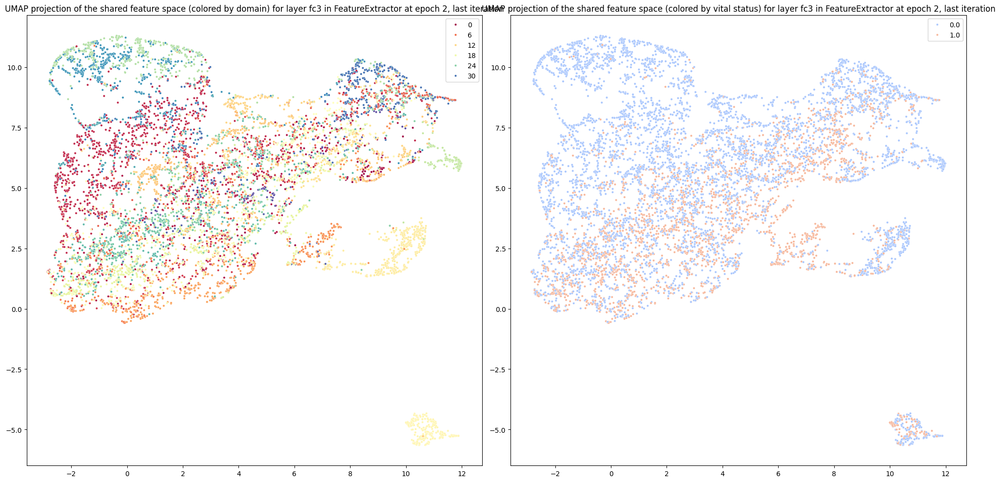

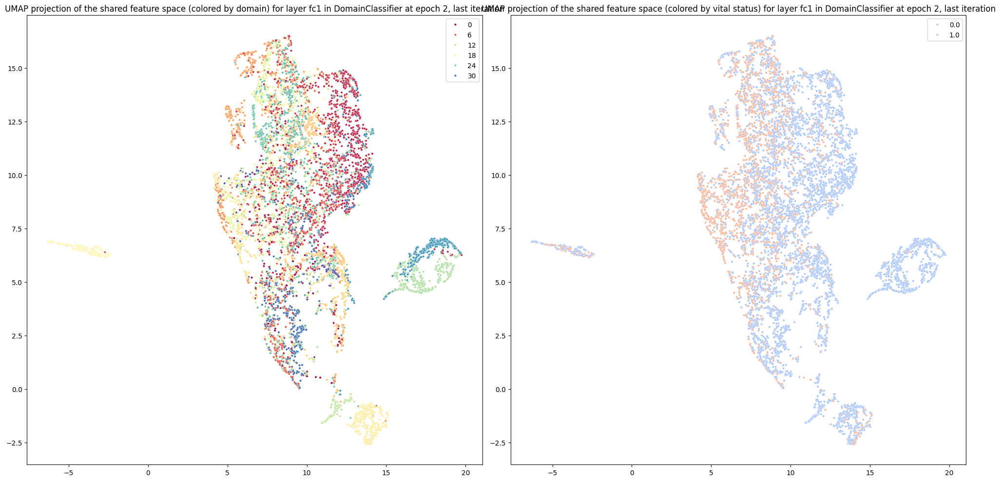

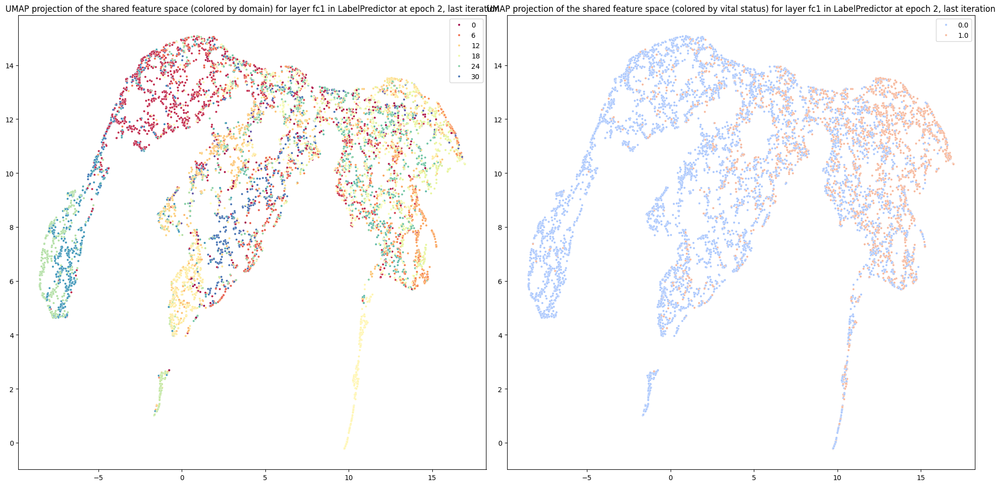

In [14]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from torchsummary import summary

# Configurar el dispositivo para GPU si está disponible, de lo contrario, usar CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento (80%) y prueba (20%) de forma estratificada
X_train, X_test, Y_train, Y_test, panels_train, panels_test = train_test_split(
    X, Y, panels, test_size=0.2, stratify=Y, random_state=42
)

# Sobrescribir X y Y con los datos de entrenamiento
X = X_train
Y = Y_train
panels = panels_train

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Codificar las etiquetas de dominio (paneles)
label_encoder_panel = LabelEncoder()
panels = label_encoder_panel.fit_transform(panels)

# Convertir los datos a tensores y moverlos al dispositivo
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
panels_tensor = torch.tensor(panels, dtype=torch.long).to(device)

# Crear datasets y dataloaders
batch_size = 128
dataset = TensorDataset(X_tensor, Y_tensor, panels_tensor)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Definición del modelo DANN mejorado
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim):
        super(FeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 10000)  # Primera capa con 10,000 neuronas
        self.bn1 = nn.BatchNorm1d(10000)
        self.dropout1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(10000, 8000)  # Segunda capa con 8,000 neuronas
        self.bn2 = nn.BatchNorm1d(8000)
        self.dropout2 = nn.Dropout(0.3)

        self.fc3 = nn.Linear(8000, 5000)  # Tercera capa con 5,000 neuronas
        self.bn3 = nn.BatchNorm1d(5000)
        self.dropout3 = nn.Dropout(0.3)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x, lambda_=1.0):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = F.leaky_relu(self.bn3(self.fc3(x)))
        x = self.dropout3(x)
        return x

class LabelPredictor(nn.Module):
    def __init__(self, input_dim):
        super(LabelPredictor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 10)
        self.bn1 = nn.BatchNorm1d(10)
        self.dropout1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(10, 1)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = torch.sigmoid(self.fc2(x))
        return x

class DomainClassifier(nn.Module):
    def __init__(self, input_dim, num_domains):
        super(DomainClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 5000)
        self.bn1 = nn.BatchNorm1d(5000)
        self.dropout1 = nn.Dropout(0.9)
        self.fc2 = nn.Linear(5000, num_domains)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = self.fc2(x)
        return x

class DANN(nn.Module):
    def __init__(self, feature_dim, num_domains):
        super(DANN, self).__init__()
        self.feature_extractor = FeatureExtractor(feature_dim)
        self.label_predictor = LabelPredictor(5000)
        self.domain_classifier = DomainClassifier(5000, num_domains)

    def forward(self, x, lambda_=1.0):
        # Extracción de características
        features = self.feature_extractor(x)

        # Inversión de gradiente con lambda
        reverse_features = ReverseLayerF.apply(features, lambda_)

        # Predicción de etiquetas
        label_output = self.label_predictor(features)

        # Clasificación de dominio
        domain_output = self.domain_classifier(reverse_features)

        return label_output, domain_output, features

class ReverseLayerF(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        output = grad_output.neg() * ctx.lambda_
        return output, None

# Función para listar las capas de un módulo
def list_module_layers(module, module_name):
    print(f"Capas disponibles en {module_name}:")
    for name, mod in module.named_children():
        print(f'Layer name: {name}, Module: {mod}')

# Función para extraer características de una capa específica de un módulo
def extract_layer_features(model, loader, module_name, layer_name, use_features=False):
    model.eval()
    features = []
    labels = []
    domains = []

    with torch.no_grad():
        for inputs, label, domain in loader:
            inputs, label, domain = inputs.to(device), label.to(device), domain.to(device)
            if use_features:
                x = model.feature_extractor(inputs)
            else:
                x = inputs
            module = getattr(model, module_name)
            for name, mod in module.named_children():
                x = mod(x)
                if name == layer_name:
                    break
            features.append(x.cpu().numpy())
            labels.append(label.cpu().numpy())
            domains.append(domain.cpu().numpy())

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0).flatten()
    domains = np.concatenate(domains, axis=0).flatten()
    return features, labels, domains

# Función para guardar características de una capa específica de un módulo en disco
def save_layer_features_to_disk(epoch_iter, model, loader, module_name, layer_name, use_features=False):
    features, labels, domains = extract_layer_features(model, loader, module_name, layer_name, use_features)

    # Crear un directorio para guardar las características si no existe
    save_dir = "/content/drive/MyDrive/PANCANCER FINAL"
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Guardar las características en disco
    file_name = f"{save_dir}/{module_name}_{layer_name}_epoch{epoch_iter[0]}_iter{epoch_iter[1]}.pkl"
    with open(file_name, 'wb') as f:
        pickle.dump((features, labels, domains), f)

# Función para cargar características desde disco
def load_layer_features_from_disk(epoch, iteration, module_name, layer_name):
    file_name = f"/content/drive/MyDrive/PANCANCER FINAL/{module_name}_{layer_name}_epoch{epoch}_iter{iteration}.pkl"
    if os.path.exists(file_name):
        with open(file_name, 'rb') as f:
            features, labels, domains = pickle.load(f)
        return features, labels, domains
    else:
        print(f"No features found for epoch {epoch}, iteration {iteration}, module {module_name}, layer {layer_name}")
        return None, None, None

# Función para visualizar UMAP
def plot_umap(embedding, labels, domains, title_suffix=''):
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=domains, palette='Spectral', s=10)
    plt.title(f'UMAP projection of the shared feature space (colored by domain) {title_suffix}')

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=labels, palette='coolwarm', s=10)
    plt.title(f'UMAP projection of the shared feature space (colored by vital status) {title_suffix}')

    plt.tight_layout()
    torch.cuda.synchronize()
    plt.show()

# Función para visualizar UMAP de una capa específica en una época e iteración específica
def visualize_layer_umap(epoch, iteration, module_name, layer_name, title_suffix=''):
    features, labels, domains = load_layer_features_from_disk(epoch, iteration, module_name, layer_name)
    if features is not None:
        reducer = umap.UMAP(n_components=2)
        embedding = reducer.fit_transform(features)
        plot_umap(embedding, labels, domains, title_suffix)

# Parámetros
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
num_epochs = 10

# Crear el modelo
model = DANN(input_dim, num_domains).to(device)

# Imprimir el resumen de la arquitectura del modelo usando torchsummary
summary(model, input_size=(input_dim,))

# Después de llamar a summary, puedes ajustar el lambda_ durante el entrenamiento
lambda_ = 0.2 # Valor ajustado por el usuario

# Definir el optimizador AdamW
optimizer = optim.AdamW(
    model.parameters(),
    lr=0.01,  # Tasa de aprendizaje
    betas=(0.9, 0.99),  # Coeficientes beta
    eps=1e-8,  # Valor pequeño para estabilidad numérica
    weight_decay=0.01,  # Regularización L2
    amsgrad=False  # Si deseas usar la variante AMSGrad
)

# Definir las funciones de pérdida
criterion_label = nn.BCELoss().to(device)
criterion_domain = nn.CrossEntropyLoss().to(device)

# Listas para guardar las precisiones
label_accuracies = []
domain_accuracies = []

class ModelSaver:
    def __init__(self):
        self.models = []

    def save_model(self, model, iteration):
        # Hacer una copia del estado del modelo
        model_copy = {k: v.clone() for k, v in model.state_dict().items()}
        self.models.append((iteration, model_copy))

    def get_models(self):
        return self.models

# Crear instancia de ModelSaver
model_saver = ModelSaver()

# Entrenamiento y guardado de características
for epoch in range(num_epochs):
    model.train()
    correct_label = 0
    correct_domain = 0
    total = 0

    for i, (inputs, labels, domains) in enumerate(loader):
        inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

        # Forward pass: obtiene las predicciones para etiquetas y dominios
        label_preds, domain_preds, features = model(inputs, lambda_)

        # Cálculo de pérdidas
        loss_label = criterion_label(label_preds, labels)  # Pérdida de predicción de etiquetas (L_y)
        loss_domain = criterion_domain(domain_preds, domains)  # Pérdida de predicción de dominios (L_d)

        # Reseteo de gradientes acumulados
        optimizer.zero_grad()

        # Suma de las pérdidas de ambas tareas
        loss = loss_label #+ loss_domain

        # Retropropagación de gradientes
        loss.backward()

        # Clip gradients to prevent explosion
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Actualización de los parámetros del modelo
        optimizer.step()

        predicted_label = (label_preds > 0.5).float()
        correct_label += (predicted_label == labels).sum().item()

        _, predicted_domain = torch.max(domain_preds, 1)
        correct_domain += (predicted_domain == domains).sum().item()

        total += labels.size(0)

        # Guardar características solo para la última iteración dentro de cada época
        if i == len(loader) - 1:  # Solo para la última iteración
            save_layer_features_to_disk((epoch, i), model, loader, 'feature_extractor', 'fc3')
            save_layer_features_to_disk((epoch, i), model, loader, 'domain_classifier', 'fc1', use_features=True)
            save_layer_features_to_disk((epoch, i), model, loader, 'label_predictor', 'fc1', use_features=True)

            # Guardar el modelo después de cada iteración (en este caso la última iteración)
            model_saver.save_model(model, (epoch, i))

    label_accuracy = correct_label / total
    domain_accuracy = correct_domain / total

    label_accuracies.append(label_accuracy)
    domain_accuracies.append(domain_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Label Accuracy: {label_accuracy:.4f}, Domain Accuracy: {domain_accuracy:.4f}')

# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc3', title_suffix='for layer fc3 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc1', title_suffix='for layer fc1 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc1', title_suffix='for layer fc1 in LabelPredictor at epoch 2, last iteration')



No features found for epoch 4, iteration 64, module feature_extractor, layer fc1


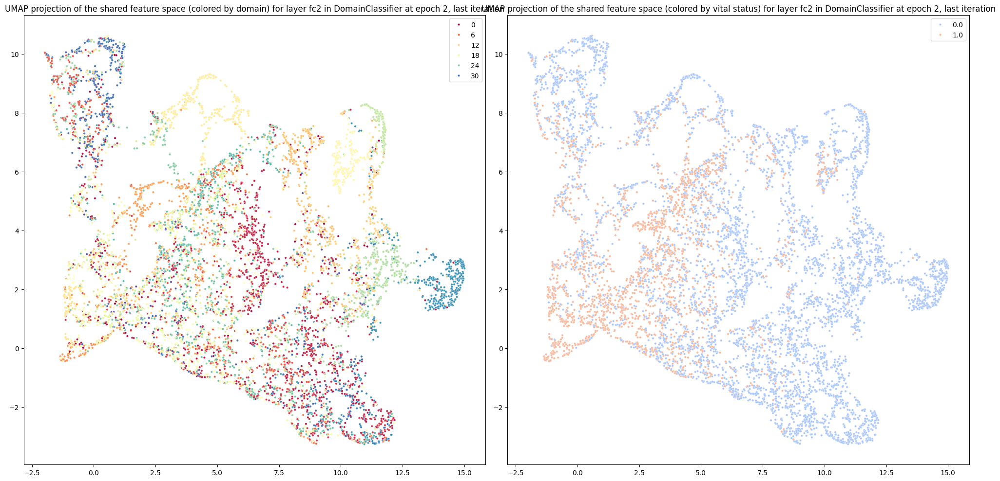

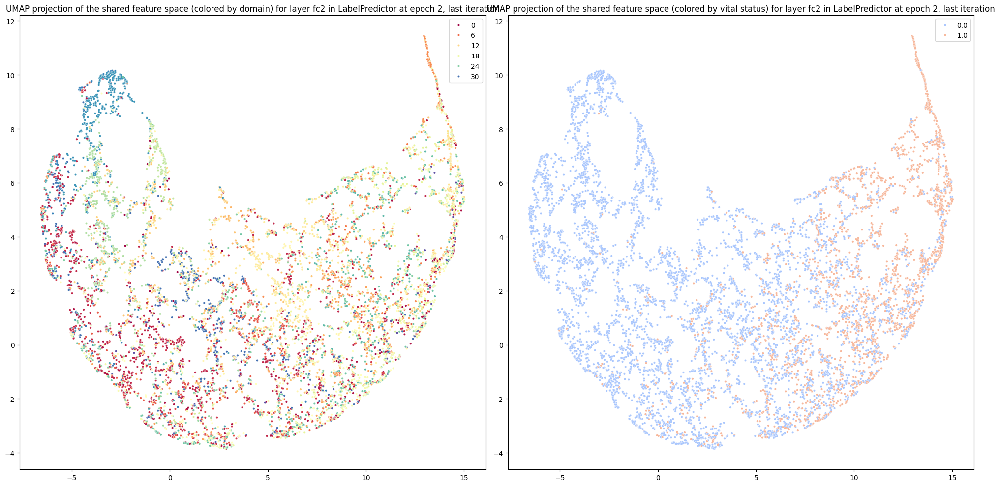

In [21]:
# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc2 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc1', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc1', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


In [22]:
# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc2 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


No features found for epoch 9, iteration 64, module feature_extractor, layer fc1
No features found for epoch 9, iteration 64, module domain_classifier, layer fc2
No features found for epoch 9, iteration 64, module label_predictor, layer fc2


In [17]:
# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 5 es epoch 4

# Obtener el modelo guardado al final de la época 5
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)


Modelo guardado al final de la época 10, iteración 65


<All keys matched successfully>

SHAP values for instance 3036: [[[-5.70797546e-09]
  [-3.68008427e-06]
  [ 2.17151154e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09398048e-07]]]


Calculando valores SHAP:  30%|██▉       | 3038/10286 [11:24<27:09,  4.45it/s]

SHAP values for instance 3037: [[[-4.08386279e-09]
  [-2.67777323e-06]
  [ 4.59626469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45019170e-07]]]


Calculando valores SHAP:  30%|██▉       | 3039/10286 [11:24<27:19,  4.42it/s]

SHAP values for instance 3038: [[[-4.81160098e-09]
  [-4.30850620e-06]
  [ 2.17067550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39713199e-08]]]


Calculando valores SHAP:  30%|██▉       | 3040/10286 [11:25<27:21,  4.41it/s]

SHAP values for instance 3039: [[[ 5.44183220e-09]
  [-7.96757146e-08]
  [ 2.64209783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32534688e-07]]]


Calculando valores SHAP:  30%|██▉       | 3041/10286 [11:25<27:20,  4.42it/s]

SHAP values for instance 3040: [[[-7.53287342e-09]
  [-8.44098717e-07]
  [ 3.01120248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.78937358e-08]]]


Calculando valores SHAP:  30%|██▉       | 3042/10286 [11:25<27:16,  4.43it/s]

SHAP values for instance 3041: [[[-2.91262308e-10]
  [-1.43948678e-06]
  [ 2.64910008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00213521e-07]]]


Calculando valores SHAP:  30%|██▉       | 3043/10286 [11:25<27:03,  4.46it/s]

SHAP values for instance 3042: [[[ 4.12123448e-09]
  [-7.30917399e-06]
  [ 4.75342976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02474713e-07]]]


Calculando valores SHAP:  30%|██▉       | 3044/10286 [11:26<27:06,  4.45it/s]

SHAP values for instance 3043: [[[ 2.95141750e-10]
  [-5.62162234e-06]
  [ 3.09357733e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00295929e-07]]]


Calculando valores SHAP:  30%|██▉       | 3045/10286 [11:26<27:01,  4.47it/s]

SHAP values for instance 3044: [[[ 3.27782290e-09]
  [-1.22706728e-06]
  [ 5.40948111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69090764e-08]]]


Calculando valores SHAP:  30%|██▉       | 3046/10286 [11:26<27:04,  4.46it/s]

SHAP values for instance 3045: [[[ 7.16643578e-11]
  [-1.00753864e-05]
  [ 1.55045051e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07895391e-08]]]


Calculando valores SHAP:  30%|██▉       | 3047/10286 [11:26<27:12,  4.43it/s]

SHAP values for instance 3046: [[[-6.35065407e-10]
  [-1.00167737e-07]
  [ 9.17648179e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22861598e-08]]]


Calculando valores SHAP:  30%|██▉       | 3048/10286 [11:26<27:22,  4.41it/s]

SHAP values for instance 3047: [[[ 1.57622561e-09]
  [-5.20747804e-08]
  [ 2.09406516e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00226532e-07]]]


Calculando valores SHAP:  30%|██▉       | 3049/10286 [11:27<27:12,  4.43it/s]

SHAP values for instance 3048: [[[-1.96547818e-09]
  [-8.56492312e-07]
  [-1.23000766e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05378408e-07]]]


Calculando valores SHAP:  30%|██▉       | 3050/10286 [11:27<27:00,  4.47it/s]

SHAP values for instance 3049: [[[ 1.88935404e-10]
  [-7.97807696e-07]
  [-8.92577227e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09538746e-07]]]


Calculando valores SHAP:  30%|██▉       | 3051/10286 [11:27<26:52,  4.49it/s]

SHAP values for instance 3050: [[[-5.05715545e-09]
  [-1.69152289e-07]
  [-4.27493703e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49083224e-08]]]


Calculando valores SHAP:  30%|██▉       | 3052/10286 [11:27<26:50,  4.49it/s]

SHAP values for instance 3051: [[[ 3.39826228e-10]
  [-1.06473724e-06]
  [ 1.68722718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60644413e-07]]]


Calculando valores SHAP:  30%|██▉       | 3053/10286 [11:28<26:48,  4.50it/s]

SHAP values for instance 3052: [[[-1.58835806e-10]
  [-1.45100354e-07]
  [ 7.67588093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35112522e-07]]]


Calculando valores SHAP:  30%|██▉       | 3054/10286 [11:28<26:45,  4.50it/s]

SHAP values for instance 3053: [[[-2.12566453e-10]
  [-2.22490033e-07]
  [ 1.95310742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40748797e-07]]]


Calculando valores SHAP:  30%|██▉       | 3055/10286 [11:28<26:50,  4.49it/s]

SHAP values for instance 3054: [[[-9.56325197e-09]
  [-1.56557856e-06]
  [ 5.03367868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38088622e-07]]]


Calculando valores SHAP:  30%|██▉       | 3056/10286 [11:28<26:49,  4.49it/s]

SHAP values for instance 3055: [[[-3.76013019e-09]
  [-4.48560398e-07]
  [ 2.03503714e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48611794e-08]]]


Calculando valores SHAP:  30%|██▉       | 3057/10286 [11:28<26:41,  4.51it/s]

SHAP values for instance 3056: [[[-7.64403964e-09]
  [-1.36205225e-07]
  [ 6.19828755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26767339e-07]]]


Calculando valores SHAP:  30%|██▉       | 3058/10286 [11:29<26:59,  4.46it/s]

SHAP values for instance 3057: [[[-2.22409940e-09]
  [-2.51865736e-06]
  [ 2.64156209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97988863e-08]]]


Calculando valores SHAP:  30%|██▉       | 3059/10286 [11:29<26:59,  4.46it/s]

SHAP values for instance 3058: [[[ 6.01772605e-10]
  [-1.74953322e-07]
  [ 1.82275120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01262734e-07]]]


Calculando valores SHAP:  30%|██▉       | 3060/10286 [11:29<26:56,  4.47it/s]

SHAP values for instance 3059: [[[-1.60921922e-09]
  [-4.13605382e-06]
  [ 7.27250002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39370045e-08]]]


Calculando valores SHAP:  30%|██▉       | 3061/10286 [11:29<27:01,  4.45it/s]

SHAP values for instance 3060: [[[-5.87736627e-10]
  [-5.41451719e-07]
  [ 1.03905459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61228466e-08]]]


Calculando valores SHAP:  30%|██▉       | 3062/10286 [11:30<26:56,  4.47it/s]

SHAP values for instance 3061: [[[ 4.25360920e-10]
  [-1.03675833e-06]
  [ 1.86541071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14131484e-08]]]


Calculando valores SHAP:  30%|██▉       | 3063/10286 [11:30<27:10,  4.43it/s]

SHAP values for instance 3062: [[[ 1.99292918e-09]
  [-5.39836440e-08]
  [-2.89725436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34978344e-07]]]


Calculando valores SHAP:  30%|██▉       | 3064/10286 [11:30<27:00,  4.46it/s]

SHAP values for instance 3063: [[[ 2.03867851e-10]
  [-6.61548367e-07]
  [ 2.75127430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71232130e-07]]]


Calculando valores SHAP:  30%|██▉       | 3065/10286 [11:30<27:10,  4.43it/s]

SHAP values for instance 3064: [[[ 4.03648946e-09]
  [-1.25006784e-06]
  [ 6.65108192e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78489757e-07]]]


Calculando valores SHAP:  30%|██▉       | 3066/10286 [11:30<26:58,  4.46it/s]

SHAP values for instance 3065: [[[ 1.04383090e-09]
  [-6.86788664e-06]
  [ 3.99918507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.32506080e-08]]]


Calculando valores SHAP:  30%|██▉       | 3067/10286 [11:31<26:55,  4.47it/s]

SHAP values for instance 3066: [[[ 2.43647479e-08]
  [-3.08124880e-07]
  [-2.23563214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59415129e-07]]]


Calculando valores SHAP:  30%|██▉       | 3068/10286 [11:31<26:53,  4.47it/s]

SHAP values for instance 3067: [[[-1.60753932e-09]
  [-6.49833909e-07]
  [ 2.87526705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.61146110e-08]]]


Calculando valores SHAP:  30%|██▉       | 3069/10286 [11:31<26:53,  4.47it/s]

SHAP values for instance 3068: [[[-1.00301708e-09]
  [-2.54745854e-07]
  [ 6.11350943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75049040e-08]]]


Calculando valores SHAP:  30%|██▉       | 3070/10286 [11:31<26:55,  4.47it/s]

SHAP values for instance 3069: [[[-9.77163331e-10]
  [-6.06283965e-06]
  [ 1.40943061e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77374308e-07]]]


Calculando valores SHAP:  30%|██▉       | 3071/10286 [11:32<26:46,  4.49it/s]

SHAP values for instance 3070: [[[ 9.86466268e-09]
  [-7.26384990e-07]
  [ 1.32151866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51336734e-08]]]


Calculando valores SHAP:  30%|██▉       | 3072/10286 [11:32<26:36,  4.52it/s]

SHAP values for instance 3071: [[[-2.69553912e-10]
  [ 2.04564689e-06]
  [-5.31322225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75929098e-07]]]


Calculando valores SHAP:  30%|██▉       | 3073/10286 [11:32<26:31,  4.53it/s]

SHAP values for instance 3072: [[[ 2.72311216e-10]
  [-2.34648921e-07]
  [ 2.15650552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.37853239e-09]]]


Calculando valores SHAP:  30%|██▉       | 3074/10286 [11:32<26:37,  4.51it/s]

SHAP values for instance 3073: [[[-6.50610895e-10]
  [-2.02443680e-07]
  [ 1.80455430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76528034e-07]]]


Calculando valores SHAP:  30%|██▉       | 3075/10286 [11:32<26:33,  4.52it/s]

SHAP values for instance 3074: [[[-1.43654364e-09]
  [-1.49420095e-06]
  [-5.77121999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45623576e-07]]]


Calculando valores SHAP:  30%|██▉       | 3076/10286 [11:33<26:39,  4.51it/s]

SHAP values for instance 3075: [[[-5.80145199e-10]
  [-2.25607927e-06]
  [ 1.22416683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77317148e-08]]]


Calculando valores SHAP:  30%|██▉       | 3077/10286 [11:33<26:45,  4.49it/s]

SHAP values for instance 3076: [[[ 2.89202537e-10]
  [-1.32894171e-05]
  [ 2.15087555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46972348e-08]]]


Calculando valores SHAP:  30%|██▉       | 3078/10286 [11:33<26:48,  4.48it/s]

SHAP values for instance 3077: [[[ 1.54610170e-09]
  [-1.47568443e-06]
  [ 6.33711588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71290832e-07]]]


Calculando valores SHAP:  30%|██▉       | 3079/10286 [11:33<26:48,  4.48it/s]

SHAP values for instance 3078: [[[-8.64114695e-10]
  [-1.95117799e-07]
  [ 1.82945517e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08484510e-07]]]


Calculando valores SHAP:  30%|██▉       | 3080/10286 [11:34<26:40,  4.50it/s]

SHAP values for instance 3079: [[[ 4.91229282e-10]
  [-1.13333230e-06]
  [-9.79179979e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96875424e-08]]]


Calculando valores SHAP:  30%|██▉       | 3081/10286 [11:34<26:37,  4.51it/s]

SHAP values for instance 3080: [[[-4.31638608e-09]
  [-6.01942151e-07]
  [ 1.66706495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89860060e-07]]]


Calculando valores SHAP:  30%|██▉       | 3082/10286 [11:34<26:48,  4.48it/s]

SHAP values for instance 3081: [[[-7.61795120e-10]
  [-1.13379148e-06]
  [ 7.01480934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42752156e-07]]]


Calculando valores SHAP:  30%|██▉       | 3083/10286 [11:34<26:52,  4.47it/s]

SHAP values for instance 3082: [[[ 2.06647966e-10]
  [-1.19982927e-06]
  [ 3.63431224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07047193e-07]]]


Calculando valores SHAP:  30%|██▉       | 3084/10286 [11:34<26:50,  4.47it/s]

SHAP values for instance 3083: [[[ 1.62397430e-10]
  [-1.43568587e-06]
  [ 2.55082948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12570421e-08]]]


Calculando valores SHAP:  30%|██▉       | 3085/10286 [11:35<26:47,  4.48it/s]

SHAP values for instance 3084: [[[-4.02901769e-10]
  [-6.17580536e-07]
  [ 2.64094446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50585849e-09]]]


Calculando valores SHAP:  30%|███       | 3086/10286 [11:35<27:06,  4.43it/s]

SHAP values for instance 3085: [[[-2.65005470e-10]
  [ 2.04638011e-05]
  [ 2.53808670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38079024e-08]]]


Calculando valores SHAP:  30%|███       | 3087/10286 [11:35<27:02,  4.44it/s]

SHAP values for instance 3086: [[[ 2.82621455e-10]
  [-5.17430078e-06]
  [ 1.01982182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19854217e-07]]]


Calculando valores SHAP:  30%|███       | 3088/10286 [11:35<26:57,  4.45it/s]

SHAP values for instance 3087: [[[-3.53710099e-10]
  [-2.19870236e-06]
  [ 3.07281486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27767537e-08]]]


Calculando valores SHAP:  30%|███       | 3089/10286 [11:36<26:53,  4.46it/s]

SHAP values for instance 3088: [[[ 1.54059356e-10]
  [-9.09886309e-07]
  [ 1.22332289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.16424870e-08]]]


Calculando valores SHAP:  30%|███       | 3090/10286 [11:36<26:46,  4.48it/s]

SHAP values for instance 3089: [[[-2.27023630e-09]
  [-1.60417140e-05]
  [ 1.39267175e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05132667e-08]]]


Calculando valores SHAP:  30%|███       | 3091/10286 [11:36<26:50,  4.47it/s]

SHAP values for instance 3090: [[[-1.45725827e-09]
  [-3.48478194e-06]
  [ 2.94005531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08899795e-07]]]


Calculando valores SHAP:  30%|███       | 3092/10286 [11:36<26:49,  4.47it/s]

SHAP values for instance 3091: [[[-7.39309744e-10]
  [-1.80043971e-07]
  [ 2.25795089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49643387e-07]]]


Calculando valores SHAP:  30%|███       | 3093/10286 [11:37<26:47,  4.47it/s]

SHAP values for instance 3092: [[[ 3.36258378e-09]
  [-3.81266195e-07]
  [ 5.30160376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14018835e-08]]]


Calculando valores SHAP:  30%|███       | 3094/10286 [11:37<26:44,  4.48it/s]

SHAP values for instance 3093: [[[ 9.87710449e-11]
  [-6.53407308e-05]
  [ 3.39864942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00976867e-08]]]


Calculando valores SHAP:  30%|███       | 3095/10286 [11:37<26:42,  4.49it/s]

SHAP values for instance 3094: [[[-2.40874348e-10]
  [-1.52654111e-07]
  [-7.63237747e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22591821e-08]]]


Calculando valores SHAP:  30%|███       | 3096/10286 [11:37<26:41,  4.49it/s]

SHAP values for instance 3095: [[[ 1.89865828e-08]
  [-8.57851128e-07]
  [ 2.81618115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39375403e-07]]]


Calculando valores SHAP:  30%|███       | 3097/10286 [11:37<26:39,  4.50it/s]

SHAP values for instance 3096: [[[-7.93419998e-09]
  [-1.11791605e-06]
  [ 7.87476291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67695691e-07]]]


Calculando valores SHAP:  30%|███       | 3098/10286 [11:38<27:00,  4.44it/s]

SHAP values for instance 3097: [[[-3.90228828e-10]
  [-1.62639624e-06]
  [ 1.86461372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21720124e-07]]]


Calculando valores SHAP:  30%|███       | 3099/10286 [11:38<26:55,  4.45it/s]

SHAP values for instance 3098: [[[ 2.77917105e-09]
  [-3.42753249e-07]
  [ 1.99296334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.30607378e-08]]]


Calculando valores SHAP:  30%|███       | 3100/10286 [11:38<27:06,  4.42it/s]

SHAP values for instance 3099: [[[-8.58177043e-10]
  [-1.21351708e-07]
  [-2.26164562e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40681387e-07]]]


Calculando valores SHAP:  30%|███       | 3101/10286 [11:38<27:17,  4.39it/s]

SHAP values for instance 3100: [[[-5.25825470e-10]
  [ 2.67676380e-08]
  [ 4.86250254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09739011e-07]]]


Calculando valores SHAP:  30%|███       | 3102/10286 [11:39<27:06,  4.42it/s]

SHAP values for instance 3101: [[[-1.89640649e-09]
  [-1.01777188e-06]
  [ 2.18771576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17513479e-07]]]


Calculando valores SHAP:  30%|███       | 3103/10286 [11:39<26:53,  4.45it/s]

SHAP values for instance 3102: [[[ 2.61791066e-10]
  [-4.57987782e-06]
  [ 4.96572929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93586201e-08]]]


Calculando valores SHAP:  30%|███       | 3104/10286 [11:39<26:51,  4.46it/s]

SHAP values for instance 3103: [[[-8.99511924e-10]
  [-3.62057868e-08]
  [ 2.51974783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71377301e-08]]]


Calculando valores SHAP:  30%|███       | 3105/10286 [11:39<26:46,  4.47it/s]

SHAP values for instance 3104: [[[-7.77462251e-10]
  [-1.12602538e-07]
  [ 8.50967814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.63957186e-08]]]


Calculando valores SHAP:  30%|███       | 3106/10286 [11:39<26:42,  4.48it/s]

SHAP values for instance 3105: [[[-3.65130585e-09]
  [-9.14463422e-07]
  [-2.30627305e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88462366e-07]]]


Calculando valores SHAP:  30%|███       | 3107/10286 [11:40<26:35,  4.50it/s]

SHAP values for instance 3106: [[[ 2.08583513e-11]
  [-1.00360942e-06]
  [ 1.71160637e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38987270e-07]]]


Calculando valores SHAP:  30%|███       | 3108/10286 [11:40<26:31,  4.51it/s]

SHAP values for instance 3107: [[[-4.03171811e-09]
  [ 3.95351579e-08]
  [ 6.84541781e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89600271e-07]]]


Calculando valores SHAP:  30%|███       | 3109/10286 [11:40<26:28,  4.52it/s]

SHAP values for instance 3108: [[[ 1.64519506e-09]
  [-2.95680174e-06]
  [-1.83556107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31349033e-08]]]


Calculando valores SHAP:  30%|███       | 3110/10286 [11:40<26:48,  4.46it/s]

SHAP values for instance 3109: [[[-1.11214865e-09]
  [-1.61657465e-06]
  [-2.04482306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92634648e-08]]]


Calculando valores SHAP:  30%|███       | 3111/10286 [11:41<26:47,  4.46it/s]

SHAP values for instance 3110: [[[-2.64995234e-09]
  [-2.70862432e-06]
  [ 3.65971139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28938654e-07]]]


Calculando valores SHAP:  30%|███       | 3112/10286 [11:41<26:44,  4.47it/s]

SHAP values for instance 3111: [[[-1.17373979e-09]
  [-6.39003378e-06]
  [ 5.58742399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07666074e-07]]]


Calculando valores SHAP:  30%|███       | 3113/10286 [11:41<26:42,  4.48it/s]

SHAP values for instance 3112: [[[ 4.40783657e-10]
  [-7.61162272e-07]
  [ 1.99961773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23016662e-08]]]


Calculando valores SHAP:  30%|███       | 3114/10286 [11:41<26:40,  4.48it/s]

SHAP values for instance 3113: [[[-2.07990282e-09]
  [-1.58256366e-06]
  [-1.63671058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14721008e-07]]]


Calculando valores SHAP:  30%|███       | 3115/10286 [11:41<26:35,  4.49it/s]

SHAP values for instance 3114: [[[-1.42031881e-09]
  [-3.98402529e-06]
  [ 3.96721268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51658987e-08]]]


Calculando valores SHAP:  30%|███       | 3116/10286 [11:42<26:36,  4.49it/s]

SHAP values for instance 3115: [[[-7.55842244e-09]
  [-5.49485833e-08]
  [-8.50024535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96880552e-08]]]


Calculando valores SHAP:  30%|███       | 3117/10286 [11:42<26:36,  4.49it/s]

SHAP values for instance 3116: [[[ 2.41401595e-10]
  [-1.18876058e-06]
  [ 2.41790751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41415411e-07]]]


Calculando valores SHAP:  30%|███       | 3118/10286 [11:42<26:34,  4.50it/s]

SHAP values for instance 3117: [[[-2.04434244e-10]
  [-1.39060018e-07]
  [ 2.61288700e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72086087e-08]]]


Calculando valores SHAP:  30%|███       | 3119/10286 [11:42<26:31,  4.50it/s]

SHAP values for instance 3118: [[[-5.07147429e-09]
  [-1.06065254e-06]
  [ 1.14871374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96370075e-07]]]


Calculando valores SHAP:  30%|███       | 3120/10286 [11:43<26:36,  4.49it/s]

SHAP values for instance 3119: [[[ 5.96913084e-11]
  [-5.20720051e-07]
  [ 2.71291277e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18853260e-07]]]


Calculando valores SHAP:  30%|███       | 3121/10286 [11:43<26:33,  4.50it/s]

SHAP values for instance 3120: [[[-9.57219962e-09]
  [-1.21182434e-06]
  [ 2.70189403e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65236412e-07]]]


Calculando valores SHAP:  30%|███       | 3122/10286 [11:43<26:34,  4.49it/s]

SHAP values for instance 3121: [[[-9.07022826e-10]
  [-4.45938795e-07]
  [ 4.60269938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72972037e-07]]]


Calculando valores SHAP:  30%|███       | 3123/10286 [11:43<26:35,  4.49it/s]

SHAP values for instance 3122: [[[-1.48680413e-09]
  [-1.07258702e-06]
  [ 3.02194974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52055283e-07]]]


Calculando valores SHAP:  30%|███       | 3124/10286 [11:43<26:39,  4.48it/s]

SHAP values for instance 3123: [[[-9.40042057e-10]
  [-6.07651871e-06]
  [ 1.99700245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25439646e-07]]]


Calculando valores SHAP:  30%|███       | 3125/10286 [11:44<26:40,  4.47it/s]

SHAP values for instance 3124: [[[-5.17184208e-09]
  [-2.35800722e-06]
  [ 9.90440337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02693175e-07]]]


Calculando valores SHAP:  30%|███       | 3126/10286 [11:44<26:45,  4.46it/s]

SHAP values for instance 3125: [[[-3.81136480e-09]
  [-2.88506127e-06]
  [ 1.04687823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23066241e-08]]]


Calculando valores SHAP:  30%|███       | 3127/10286 [11:44<26:45,  4.46it/s]

SHAP values for instance 3126: [[[-1.43069255e-09]
  [-3.83255133e-07]
  [ 8.54518733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12234263e-07]]]


Calculando valores SHAP:  30%|███       | 3128/10286 [11:44<26:47,  4.45it/s]

SHAP values for instance 3127: [[[-5.41712227e-10]
  [-2.36627886e-07]
  [ 5.92747409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93319372e-07]]]


Calculando valores SHAP:  30%|███       | 3129/10286 [11:45<26:44,  4.46it/s]

SHAP values for instance 3128: [[[ 1.01622432e-10]
  [-1.22999242e-06]
  [ 3.92807714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59615394e-08]]]


Calculando valores SHAP:  30%|███       | 3130/10286 [11:45<26:39,  4.48it/s]

SHAP values for instance 3129: [[[-4.10388330e-10]
  [-1.35667909e-07]
  [ 1.50808566e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08060271e-07]]]


Calculando valores SHAP:  30%|███       | 3131/10286 [11:45<26:40,  4.47it/s]

SHAP values for instance 3130: [[[-3.03574068e-09]
  [-1.56985944e-07]
  [ 2.94229237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06435937e-07]]]


Calculando valores SHAP:  30%|███       | 3132/10286 [11:45<26:36,  4.48it/s]

SHAP values for instance 3131: [[[ 2.72920999e-10]
  [-1.08438752e-06]
  [ 4.12249777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66049669e-07]]]


Calculando valores SHAP:  30%|███       | 3133/10286 [11:45<26:32,  4.49it/s]

SHAP values for instance 3132: [[[-2.19739803e-10]
  [-1.49134474e-06]
  [ 1.48349999e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27659948e-07]]]


Calculando valores SHAP:  30%|███       | 3134/10286 [11:46<26:33,  4.49it/s]

SHAP values for instance 3133: [[[-2.23867469e-09]
  [-5.59355492e-07]
  [ 8.13874982e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48410196e-07]]]


Calculando valores SHAP:  30%|███       | 3135/10286 [11:46<26:38,  4.47it/s]

SHAP values for instance 3134: [[[ 1.76620751e-09]
  [-9.41575022e-07]
  [-1.24055975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02607631e-08]]]


Calculando valores SHAP:  30%|███       | 3136/10286 [11:46<26:37,  4.47it/s]

SHAP values for instance 3135: [[[-4.05295552e-09]
  [-4.08025522e-08]
  [ 4.17277488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.78711315e-08]]]


Calculando valores SHAP:  30%|███       | 3137/10286 [11:46<26:33,  4.49it/s]

SHAP values for instance 3136: [[[ 1.53576351e-09]
  [-2.52064229e-07]
  [ 2.12736644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48357869e-08]]]


Calculando valores SHAP:  31%|███       | 3138/10286 [11:47<26:21,  4.52it/s]

SHAP values for instance 3137: [[[-5.80297925e-09]
  [-4.42893165e-07]
  [ 4.46853954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65366594e-07]]]


Calculando valores SHAP:  31%|███       | 3139/10286 [11:47<26:15,  4.54it/s]

SHAP values for instance 3138: [[[-2.74013754e-10]
  [-2.63960525e-06]
  [ 2.37620735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58443541e-08]]]


Calculando valores SHAP:  31%|███       | 3140/10286 [11:47<26:24,  4.51it/s]

SHAP values for instance 3139: [[[-1.72999039e-09]
  [-5.55376216e-07]
  [ 2.61446315e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89277718e-07]]]


Calculando valores SHAP:  31%|███       | 3141/10286 [11:47<26:27,  4.50it/s]

SHAP values for instance 3140: [[[-1.72089539e-09]
  [-7.35431234e-08]
  [ 2.28074804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.62358434e-08]]]


Calculando valores SHAP:  31%|███       | 3142/10286 [11:47<26:26,  4.50it/s]

SHAP values for instance 3141: [[[-2.04365306e-09]
  [-5.19556815e-07]
  [ 6.82838537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88380061e-07]]]


Calculando valores SHAP:  31%|███       | 3143/10286 [11:48<26:27,  4.50it/s]

SHAP values for instance 3142: [[[ 1.96554287e-09]
  [-1.11345608e-06]
  [ 1.11553975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23727423e-07]]]


Calculando valores SHAP:  31%|███       | 3144/10286 [11:48<26:25,  4.51it/s]

SHAP values for instance 3143: [[[ 4.91841641e-09]
  [-1.00813220e-06]
  [-6.33638738e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.54813819e-08]]]


Calculando valores SHAP:  31%|███       | 3145/10286 [11:48<26:33,  4.48it/s]

SHAP values for instance 3144: [[[-4.28985233e-10]
  [-6.96218259e-07]
  [ 4.20005143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38594815e-07]]]


Calculando valores SHAP:  31%|███       | 3146/10286 [11:48<26:45,  4.45it/s]

SHAP values for instance 3145: [[[ 2.46601248e-10]
  [-1.93364351e-06]
  [ 1.11850150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04910256e-07]]]


Calculando valores SHAP:  31%|███       | 3147/10286 [11:49<26:41,  4.46it/s]

SHAP values for instance 3146: [[[-7.47163044e-10]
  [-1.05214580e-06]
  [ 4.85359806e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86494640e-08]]]


Calculando valores SHAP:  31%|███       | 3148/10286 [11:49<26:38,  4.47it/s]

SHAP values for instance 3147: [[[-1.68039115e-09]
  [ 1.27196872e-07]
  [-2.26480501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69762159e-10]]]


Calculando valores SHAP:  31%|███       | 3149/10286 [11:49<26:39,  4.46it/s]

SHAP values for instance 3148: [[[ 7.44686624e-09]
  [-1.48575906e-06]
  [ 7.19814491e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47050892e-07]]]


Calculando valores SHAP:  31%|███       | 3150/10286 [11:49<26:32,  4.48it/s]

SHAP values for instance 3149: [[[ 2.22430084e-08]
  [-1.63776026e-06]
  [ 1.02447139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74888586e-07]]]


Calculando valores SHAP:  31%|███       | 3151/10286 [11:49<26:42,  4.45it/s]

SHAP values for instance 3150: [[[-7.76561724e-10]
  [-6.03654402e-06]
  [-3.33373135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03149378e-08]]]


Calculando valores SHAP:  31%|███       | 3152/10286 [11:50<27:24,  4.34it/s]

SHAP values for instance 3151: [[[-5.89388918e-10]
  [-2.20894689e-06]
  [ 1.20858864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84102400e-07]]]


Calculando valores SHAP:  31%|███       | 3153/10286 [11:50<27:11,  4.37it/s]

SHAP values for instance 3152: [[[-1.5495184e-09]
  [-2.1320210e-07]
  [ 1.3566672e-03]
  ...
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 2.5285552e-08]]]


Calculando valores SHAP:  31%|███       | 3154/10286 [11:50<27:27,  4.33it/s]

SHAP values for instance 3153: [[[-1.61424871e-09]
  [-4.44742776e-07]
  [ 8.06509550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37235245e-07]]]


Calculando valores SHAP:  31%|███       | 3155/10286 [11:50<27:11,  4.37it/s]

SHAP values for instance 3154: [[[ 9.01069890e-10]
  [-1.64437133e-05]
  [ 5.02927214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64193477e-07]]]


Calculando valores SHAP:  31%|███       | 3156/10286 [11:51<26:59,  4.40it/s]

SHAP values for instance 3155: [[[-1.69818024e-09]
  [-3.01238237e-07]
  [ 1.40643448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84583029e-08]]]


Calculando valores SHAP:  31%|███       | 3157/10286 [11:51<26:57,  4.41it/s]

SHAP values for instance 3156: [[[ 2.48123654e-10]
  [-2.99040737e-06]
  [ 4.19122789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97894101e-08]]]


Calculando valores SHAP:  31%|███       | 3158/10286 [11:51<26:50,  4.43it/s]

SHAP values for instance 3157: [[[-2.49218287e-09]
  [-1.46843750e-06]
  [ 1.21060585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55626050e-07]]]


Calculando valores SHAP:  31%|███       | 3159/10286 [11:51<26:49,  4.43it/s]

SHAP values for instance 3158: [[[-7.86191554e-10]
  [-2.25104564e-06]
  [ 7.85167527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36349222e-07]]]


Calculando valores SHAP:  31%|███       | 3160/10286 [11:52<26:39,  4.45it/s]

SHAP values for instance 3159: [[[-9.04507732e-10]
  [-8.82505563e-06]
  [-1.59872951e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71740597e-07]]]


Calculando valores SHAP:  31%|███       | 3161/10286 [11:52<26:32,  4.47it/s]

SHAP values for instance 3160: [[[-4.98753528e-09]
  [-2.86321480e-06]
  [ 3.26940727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13157365e-08]]]


Calculando valores SHAP:  31%|███       | 3162/10286 [11:52<26:25,  4.49it/s]

SHAP values for instance 3161: [[[ 1.67984764e-09]
  [-5.95347142e-07]
  [ 4.01217763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92205681e-08]]]


Calculando valores SHAP:  31%|███       | 3163/10286 [11:52<26:27,  4.49it/s]

SHAP values for instance 3162: [[[-1.27263217e-09]
  [-1.47201848e-07]
  [ 5.25424490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86311301e-07]]]


Calculando valores SHAP:  31%|███       | 3164/10286 [11:52<26:29,  4.48it/s]

SHAP values for instance 3163: [[[-1.11021816e-09]
  [-6.30022425e-06]
  [ 8.72410722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64013121e-07]]]


Calculando valores SHAP:  31%|███       | 3165/10286 [11:53<26:26,  4.49it/s]

SHAP values for instance 3164: [[[ 1.48735824e-09]
  [-2.90343097e-05]
  [ 1.43965653e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75404010e-08]]]


Calculando valores SHAP:  31%|███       | 3166/10286 [11:53<26:24,  4.49it/s]

SHAP values for instance 3165: [[[ 4.13090293e-12]
  [-1.99349027e-07]
  [ 1.29508347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05255249e-07]]]


Calculando valores SHAP:  31%|███       | 3167/10286 [11:53<26:18,  4.51it/s]

SHAP values for instance 3166: [[[-1.03969895e-09]
  [-1.82976444e-07]
  [ 2.76514851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02246121e-07]]]


Calculando valores SHAP:  31%|███       | 3168/10286 [11:53<26:16,  4.51it/s]

SHAP values for instance 3167: [[[-4.52151263e-09]
  [-6.01761839e-07]
  [ 4.50260655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03929514e-08]]]


Calculando valores SHAP:  31%|███       | 3169/10286 [11:54<26:15,  4.52it/s]

SHAP values for instance 3168: [[[-1.63194570e-09]
  [-2.11949295e-06]
  [ 1.22856298e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45400531e-07]]]


Calculando valores SHAP:  31%|███       | 3170/10286 [11:54<26:17,  4.51it/s]

SHAP values for instance 3169: [[[-4.66692008e-09]
  [-7.43037669e-07]
  [ 8.42450317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56928045e-08]]]


Calculando valores SHAP:  31%|███       | 3171/10286 [11:54<26:17,  4.51it/s]

SHAP values for instance 3170: [[[ 3.35720125e-09]
  [-2.42596908e-06]
  [ 1.18954926e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00772176e-07]]]


Calculando valores SHAP:  31%|███       | 3172/10286 [11:54<26:21,  4.50it/s]

SHAP values for instance 3171: [[[ 1.76552412e-10]
  [-3.32032843e-08]
  [ 7.58976251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55762919e-08]]]


Calculando valores SHAP:  31%|███       | 3173/10286 [11:54<26:18,  4.51it/s]

SHAP values for instance 3172: [[[-2.57681931e-09]
  [-5.24162508e-08]
  [ 4.13672774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94736726e-08]]]


Calculando valores SHAP:  31%|███       | 3174/10286 [11:55<26:25,  4.49it/s]

SHAP values for instance 3173: [[[-7.52162950e-10]
  [-6.83396695e-07]
  [ 2.33230610e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36240689e-07]]]


Calculando valores SHAP:  31%|███       | 3175/10286 [11:55<26:28,  4.48it/s]

SHAP values for instance 3174: [[[ 2.49082909e-09]
  [-6.69641779e-06]
  [ 3.52826482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51675966e-07]]]


Calculando valores SHAP:  31%|███       | 3176/10286 [11:55<26:25,  4.49it/s]

SHAP values for instance 3175: [[[-2.70098988e-09]
  [-9.21443179e-07]
  [ 4.69173111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76357698e-08]]]


Calculando valores SHAP:  31%|███       | 3177/10286 [11:55<26:23,  4.49it/s]

SHAP values for instance 3176: [[[-1.14966163e-09]
  [-1.94507827e-07]
  [ 1.31377142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57427222e-07]]]


Calculando valores SHAP:  31%|███       | 3178/10286 [11:56<26:27,  4.48it/s]

SHAP values for instance 3177: [[[-1.90991499e-09]
  [-6.41649535e-06]
  [ 4.38895771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49455883e-07]]]


Calculando valores SHAP:  31%|███       | 3179/10286 [11:56<26:28,  4.47it/s]

SHAP values for instance 3178: [[[ 2.88616266e-10]
  [-7.56143532e-06]
  [ 2.66688560e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00241053e-07]]]


Calculando valores SHAP:  31%|███       | 3180/10286 [11:56<26:28,  4.47it/s]

SHAP values for instance 3179: [[[-1.99451113e-10]
  [-3.04933902e-06]
  [ 1.61202176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58655545e-07]]]


Calculando valores SHAP:  31%|███       | 3181/10286 [11:56<26:31,  4.47it/s]

SHAP values for instance 3180: [[[-2.02640680e-10]
  [-7.02293228e-07]
  [ 8.21666033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05628961e-07]]]


Calculando valores SHAP:  31%|███       | 3182/10286 [11:56<26:31,  4.46it/s]

SHAP values for instance 3181: [[[-1.73799105e-09]
  [-8.46237118e-07]
  [ 1.29801700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07111227e-08]]]


Calculando valores SHAP:  31%|███       | 3183/10286 [11:57<26:32,  4.46it/s]

SHAP values for instance 3182: [[[-6.76894979e-10]
  [-1.28593147e-07]
  [ 1.76291921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22860753e-08]]]


Calculando valores SHAP:  31%|███       | 3184/10286 [11:57<26:24,  4.48it/s]

SHAP values for instance 3183: [[[-1.04435375e-09]
  [ 7.42465655e-08]
  [ 7.25760619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12296998e-08]]]


Calculando valores SHAP:  31%|███       | 3185/10286 [11:57<26:15,  4.51it/s]

SHAP values for instance 3184: [[[ 6.30493764e-09]
  [-3.28388500e-07]
  [ 5.97261957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19721994e-08]]]


Calculando valores SHAP:  31%|███       | 3186/10286 [11:57<26:22,  4.49it/s]

SHAP values for instance 3185: [[[-2.59727224e-10]
  [-5.55954120e-07]
  [ 7.55167701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71609635e-08]]]


Calculando valores SHAP:  31%|███       | 3187/10286 [11:58<26:20,  4.49it/s]

SHAP values for instance 3186: [[[ 6.93566392e-09]
  [-1.16213175e-06]
  [ 3.68105242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32090492e-07]]]


Calculando valores SHAP:  31%|███       | 3188/10286 [11:58<26:21,  4.49it/s]

SHAP values for instance 3187: [[[ 1.42218028e-10]
  [-4.67590434e-07]
  [ 9.60219585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67871489e-07]]]


Calculando valores SHAP:  31%|███       | 3189/10286 [11:58<26:09,  4.52it/s]

SHAP values for instance 3188: [[[ 2.22151127e-10]
  [-4.87015073e-07]
  [ 4.18192637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73011396e-08]]]


Calculando valores SHAP:  31%|███       | 3190/10286 [11:58<26:09,  4.52it/s]

SHAP values for instance 3189: [[[-7.99667286e-10]
  [ 2.30901370e-05]
  [ 3.89055719e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22934710e-07]]]


Calculando valores SHAP:  31%|███       | 3191/10286 [11:58<26:16,  4.50it/s]

SHAP values for instance 3190: [[[-2.01492323e-09]
  [-1.34858983e-06]
  [ 2.34236980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48821076e-07]]]


Calculando valores SHAP:  31%|███       | 3192/10286 [11:59<26:20,  4.49it/s]

SHAP values for instance 3191: [[[-9.81597748e-10]
  [-1.58266025e-06]
  [ 5.71952088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69278202e-07]]]


Calculando valores SHAP:  31%|███       | 3193/10286 [11:59<26:16,  4.50it/s]

SHAP values for instance 3192: [[[ 1.93812134e-10]
  [-3.92916496e-06]
  [ 6.56616916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64475461e-07]]]


Calculando valores SHAP:  31%|███       | 3194/10286 [11:59<26:14,  4.50it/s]

SHAP values for instance 3193: [[[ 3.80043172e-09]
  [-9.77122862e-06]
  [ 5.89028296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36931711e-07]]]


Calculando valores SHAP:  31%|███       | 3195/10286 [11:59<26:17,  4.49it/s]

SHAP values for instance 3194: [[[-3.50466632e-10]
  [-1.63856599e-07]
  [ 5.91672437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.78145062e-08]]]


Calculando valores SHAP:  31%|███       | 3196/10286 [12:00<26:21,  4.48it/s]

SHAP values for instance 3195: [[[ 2.92866475e-09]
  [-2.22616117e-06]
  [ 1.07542482e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36049101e-08]]]


Calculando valores SHAP:  31%|███       | 3197/10286 [12:00<26:20,  4.48it/s]

SHAP values for instance 3196: [[[-6.66165406e-10]
  [ 3.45419848e-07]
  [ 5.79936740e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.22728816e-07]]]


Calculando valores SHAP:  31%|███       | 3198/10286 [12:00<26:22,  4.48it/s]

SHAP values for instance 3197: [[[-1.97461851e-10]
  [-4.73376502e-07]
  [ 6.77139347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30730785e-08]]]


Calculando valores SHAP:  31%|███       | 3199/10286 [12:00<26:23,  4.47it/s]

SHAP values for instance 3198: [[[-1.03411918e-09]
  [-1.80472722e-06]
  [ 1.45956362e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22120385e-08]]]


Calculando valores SHAP:  31%|███       | 3200/10286 [12:00<26:32,  4.45it/s]

SHAP values for instance 3199: [[[ 4.29009488e-09]
  [ 1.58318865e-06]
  [ 1.36380338e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07773950e-07]]]


Calculando valores SHAP:  31%|███       | 3201/10286 [12:01<26:26,  4.46it/s]

SHAP values for instance 3200: [[[-6.79527202e-09]
  [-4.62874000e-07]
  [ 4.63538760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87976734e-07]]]


Calculando valores SHAP:  31%|███       | 3202/10286 [12:01<26:36,  4.44it/s]

SHAP values for instance 3201: [[[-7.21252951e-10]
  [ 6.30708503e-08]
  [ 1.11135813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51992977e-08]]]


Calculando valores SHAP:  31%|███       | 3203/10286 [12:01<26:37,  4.43it/s]

SHAP values for instance 3202: [[[ 2.47956439e-10]
  [ 7.65281847e-08]
  [ 4.05874619e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85877468e-08]]]


Calculando valores SHAP:  31%|███       | 3204/10286 [12:01<26:36,  4.44it/s]

SHAP values for instance 3203: [[[-1.76019477e-09]
  [-4.56336368e-06]
  [ 2.28808259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85424333e-07]]]


Calculando valores SHAP:  31%|███       | 3205/10286 [12:02<26:32,  4.45it/s]

SHAP values for instance 3204: [[[-2.60315504e-10]
  [-4.01979477e-06]
  [ 2.21760403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09863120e-07]]]


Calculando valores SHAP:  31%|███       | 3206/10286 [12:02<26:40,  4.42it/s]

SHAP values for instance 3205: [[[-1.80076226e-11]
  [-6.06119865e-08]
  [ 9.82091295e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12533889e-10]]]


Calculando valores SHAP:  31%|███       | 3207/10286 [12:02<26:40,  4.42it/s]

SHAP values for instance 3206: [[[-4.17803301e-09]
  [-2.10258177e-06]
  [ 9.36720005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50482677e-07]]]


Calculando valores SHAP:  31%|███       | 3208/10286 [12:02<26:31,  4.45it/s]

SHAP values for instance 3207: [[[-3.62756671e-09]
  [-1.57680104e-06]
  [ 1.67710402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35873439e-07]]]


Calculando valores SHAP:  31%|███       | 3209/10286 [12:02<26:27,  4.46it/s]

SHAP values for instance 3208: [[[ 5.00053143e-09]
  [-2.32632373e-06]
  [ 1.30161380e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25671139e-07]]]


Calculando valores SHAP:  31%|███       | 3210/10286 [12:03<26:34,  4.44it/s]

SHAP values for instance 3209: [[[-3.50986600e-09]
  [-2.87848702e-06]
  [ 1.38129563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79458655e-07]]]


Calculando valores SHAP:  31%|███       | 3211/10286 [12:03<26:22,  4.47it/s]

SHAP values for instance 3210: [[[-1.12922464e-08]
  [-6.59579169e-06]
  [ 8.11724342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41405707e-07]]]


Calculando valores SHAP:  31%|███       | 3212/10286 [12:03<26:35,  4.43it/s]

SHAP values for instance 3211: [[[-5.29658081e-09]
  [-2.91761326e-07]
  [ 9.97900199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43260717e-07]]]


Calculando valores SHAP:  31%|███       | 3213/10286 [12:03<26:31,  4.44it/s]

SHAP values for instance 3212: [[[-1.62176698e-09]
  [-3.42519443e-07]
  [ 9.19896315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77868650e-07]]]


Calculando valores SHAP:  31%|███       | 3214/10286 [12:04<26:21,  4.47it/s]

SHAP values for instance 3213: [[[-2.43794365e-09]
  [-5.43621983e-07]
  [ 2.21189854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.79059564e-07]]]


Calculando valores SHAP:  31%|███▏      | 3215/10286 [12:04<26:22,  4.47it/s]

SHAP values for instance 3214: [[[-9.29241380e-10]
  [-3.11822258e-06]
  [ 7.13747626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10332240e-07]]]


Calculando valores SHAP:  31%|███▏      | 3216/10286 [12:04<26:32,  4.44it/s]

SHAP values for instance 3215: [[[-1.10461432e-09]
  [-3.11626811e-06]
  [ 8.29049562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05146629e-08]]]


Calculando valores SHAP:  31%|███▏      | 3217/10286 [12:04<26:51,  4.39it/s]

SHAP values for instance 3216: [[[-1.09530358e-09]
  [-1.45834130e-06]
  [ 5.80979638e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57115826e-07]]]


Calculando valores SHAP:  31%|███▏      | 3218/10286 [12:04<26:34,  4.43it/s]

SHAP values for instance 3217: [[[-1.65945736e-09]
  [-1.32623117e-06]
  [ 1.71187611e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55952956e-07]]]


Calculando valores SHAP:  31%|███▏      | 3219/10286 [12:05<26:32,  4.44it/s]

SHAP values for instance 3218: [[[-2.81225770e-09]
  [-1.14236151e-05]
  [ 2.75142221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.74966618e-08]]]


Calculando valores SHAP:  31%|███▏      | 3220/10286 [12:05<26:31,  4.44it/s]

SHAP values for instance 3219: [[[-1.48349592e-09]
  [-8.80514533e-06]
  [ 3.22883158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93180390e-09]]]


Calculando valores SHAP:  31%|███▏      | 3221/10286 [12:05<26:27,  4.45it/s]

SHAP values for instance 3220: [[[-2.33863190e-09]
  [-2.79686810e-07]
  [ 1.81276331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46954761e-07]]]


Calculando valores SHAP:  31%|███▏      | 3222/10286 [12:05<26:20,  4.47it/s]

SHAP values for instance 3221: [[[-4.14714884e-09]
  [-3.36445878e-07]
  [ 1.10604168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75159788e-07]]]


Calculando valores SHAP:  31%|███▏      | 3223/10286 [12:06<26:20,  4.47it/s]

SHAP values for instance 3222: [[[-3.75243509e-09]
  [ 6.91752543e-08]
  [ 5.55472475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69088388e-08]]]


Calculando valores SHAP:  31%|███▏      | 3224/10286 [12:06<26:23,  4.46it/s]

SHAP values for instance 3223: [[[ 1.88629396e-09]
  [-8.57040095e-08]
  [-3.15597231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18029004e-07]]]


Calculando valores SHAP:  31%|███▏      | 3225/10286 [12:06<26:17,  4.48it/s]

SHAP values for instance 3224: [[[-1.23369646e-09]
  [-5.18660432e-07]
  [ 1.58031286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33002250e-07]]]


Calculando valores SHAP:  31%|███▏      | 3226/10286 [12:06<26:24,  4.46it/s]

SHAP values for instance 3225: [[[-1.14527604e-09]
  [-3.26582233e-07]
  [ 1.27215025e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97082332e-08]]]


Calculando valores SHAP:  31%|███▏      | 3227/10286 [12:07<26:29,  4.44it/s]

SHAP values for instance 3226: [[[-7.71843653e-10]
  [-2.32693249e-07]
  [ 3.80038203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45762481e-07]]]


Calculando valores SHAP:  31%|███▏      | 3228/10286 [12:07<26:25,  4.45it/s]

SHAP values for instance 3227: [[[ 6.95025465e-10]
  [-3.16108827e-06]
  [ 3.30955565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35763796e-07]]]


Calculando valores SHAP:  31%|███▏      | 3229/10286 [12:07<26:34,  4.43it/s]

SHAP values for instance 3228: [[[-6.01517185e-10]
  [-1.96929014e-07]
  [-4.55436745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51929674e-08]]]


Calculando valores SHAP:  31%|███▏      | 3230/10286 [12:07<26:27,  4.44it/s]

SHAP values for instance 3229: [[[-2.93370697e-09]
  [-8.96444181e-08]
  [ 5.84326499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.67242272e-08]]]


Calculando valores SHAP:  31%|███▏      | 3231/10286 [12:07<26:17,  4.47it/s]

SHAP values for instance 3230: [[[-1.76046948e-09]
  [-1.84680671e-06]
  [ 2.74325975e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21245905e-07]]]


Calculando valores SHAP:  31%|███▏      | 3232/10286 [12:08<26:24,  4.45it/s]

SHAP values for instance 3231: [[[ 4.28088539e-09]
  [-1.00963842e-05]
  [ 1.76168289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98020197e-07]]]


Calculando valores SHAP:  31%|███▏      | 3233/10286 [12:08<26:24,  4.45it/s]

SHAP values for instance 3232: [[[-4.54504419e-10]
  [-1.12050559e-06]
  [ 2.04285442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10284334e-07]]]


Calculando valores SHAP:  31%|███▏      | 3234/10286 [12:08<26:47,  4.39it/s]

SHAP values for instance 3233: [[[ 3.84347964e-10]
  [-9.62262576e-07]
  [-5.43854022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39709615e-06]]]


Calculando valores SHAP:  31%|███▏      | 3235/10286 [12:08<27:01,  4.35it/s]

SHAP values for instance 3234: [[[-1.95006410e-09]
  [-1.35694356e-06]
  [ 2.06695328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80763643e-08]]]


Calculando valores SHAP:  31%|███▏      | 3236/10286 [12:09<26:46,  4.39it/s]

SHAP values for instance 3235: [[[-3.31748951e-09]
  [-2.03220241e-06]
  [ 1.19124140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00577083e-08]]]


Calculando valores SHAP:  31%|███▏      | 3237/10286 [12:09<26:35,  4.42it/s]

SHAP values for instance 3236: [[[-3.48037807e-10]
  [-1.21551960e-06]
  [ 4.96663412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56482418e-07]]]


Calculando valores SHAP:  31%|███▏      | 3238/10286 [12:09<26:34,  4.42it/s]

SHAP values for instance 3237: [[[-1.79524872e-09]
  [-1.60748647e-07]
  [ 1.89167994e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30773854e-07]]]


Calculando valores SHAP:  31%|███▏      | 3239/10286 [12:09<26:27,  4.44it/s]

SHAP values for instance 3238: [[[ 2.50072395e-10]
  [-1.43423799e-05]
  [ 3.61547693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40568914e-08]]]


Calculando valores SHAP:  31%|███▏      | 3240/10286 [12:09<26:15,  4.47it/s]

SHAP values for instance 3239: [[[-1.30458466e-09]
  [-1.60220860e-06]
  [ 7.11658524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32744383e-08]]]


Calculando valores SHAP:  32%|███▏      | 3241/10286 [12:10<26:10,  4.49it/s]

SHAP values for instance 3240: [[[ 7.82350041e-10]
  [-7.38126356e-07]
  [ 2.32653721e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07297546e-08]]]


Calculando valores SHAP:  32%|███▏      | 3242/10286 [12:10<26:27,  4.44it/s]

SHAP values for instance 3241: [[[ 7.37518250e-09]
  [-1.50185160e-07]
  [ 1.05262900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16294781e-07]]]


Calculando valores SHAP:  32%|███▏      | 3243/10286 [12:10<26:21,  4.45it/s]

SHAP values for instance 3242: [[[ 5.83301049e-09]
  [-2.45622514e-06]
  [ 1.14670626e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08264885e-06]]]


Calculando valores SHAP:  32%|███▏      | 3244/10286 [12:10<26:26,  4.44it/s]

SHAP values for instance 3243: [[[-1.48927162e-09]
  [-2.12823536e-06]
  [ 9.00922533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39190055e-07]]]


Calculando valores SHAP:  32%|███▏      | 3245/10286 [12:11<26:13,  4.47it/s]

SHAP values for instance 3244: [[[-5.39877164e-09]
  [-5.66101546e-06]
  [ 1.40145847e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76875556e-07]]]


Calculando valores SHAP:  32%|███▏      | 3246/10286 [12:11<26:09,  4.48it/s]

SHAP values for instance 3245: [[[-2.27494859e-09]
  [-3.25986556e-07]
  [ 8.29091667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29264975e-08]]]


Calculando valores SHAP:  32%|███▏      | 3247/10286 [12:11<26:38,  4.40it/s]

SHAP values for instance 3246: [[[-3.48151778e-09]
  [-5.53411065e-06]
  [ 3.24594678e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.92707218e-08]]]


Calculando valores SHAP:  32%|███▏      | 3248/10286 [12:11<27:01,  4.34it/s]

SHAP values for instance 3247: [[[ 2.96049145e-09]
  [-1.26771640e-06]
  [ 6.76173758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89521785e-08]]]


Calculando valores SHAP:  32%|███▏      | 3249/10286 [12:11<26:53,  4.36it/s]

SHAP values for instance 3248: [[[-1.11263387e-10]
  [-5.03038934e-07]
  [ 9.14531436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94266423e-08]]]


Calculando valores SHAP:  32%|███▏      | 3250/10286 [12:12<26:40,  4.40it/s]

SHAP values for instance 3249: [[[ 3.58321625e-10]
  [-9.51988874e-07]
  [ 6.97490790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.23183154e-08]]]


Calculando valores SHAP:  32%|███▏      | 3251/10286 [12:12<26:29,  4.43it/s]

SHAP values for instance 3250: [[[-5.27131767e-09]
  [-2.58485696e-06]
  [ 2.99234656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15676300e-08]]]


Calculando valores SHAP:  32%|███▏      | 3252/10286 [12:12<26:29,  4.42it/s]

SHAP values for instance 3251: [[[ 1.86979044e-10]
  [-1.13585869e-06]
  [ 2.49294003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30227075e-09]]]


Calculando valores SHAP:  32%|███▏      | 3253/10286 [12:12<26:27,  4.43it/s]

SHAP values for instance 3252: [[[ 2.65305204e-09]
  [-3.47455110e-06]
  [-5.54233169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97867781e-07]]]


Calculando valores SHAP:  32%|███▏      | 3254/10286 [12:13<26:25,  4.43it/s]

SHAP values for instance 3253: [[[-3.45952411e-11]
  [ 2.47680532e-05]
  [-3.28653362e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26483675e-07]]]


Calculando valores SHAP:  32%|███▏      | 3255/10286 [12:13<26:17,  4.46it/s]

SHAP values for instance 3254: [[[-3.79200648e-11]
  [ 1.29308783e-07]
  [-1.30925942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38686047e-08]]]


Calculando valores SHAP:  32%|███▏      | 3256/10286 [12:13<26:18,  4.45it/s]

SHAP values for instance 3255: [[[ 5.10572492e-10]
  [-7.23672423e-07]
  [ 5.56387724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29428401e-07]]]


Calculando valores SHAP:  32%|███▏      | 3257/10286 [12:13<26:15,  4.46it/s]

SHAP values for instance 3256: [[[-2.57029070e-09]
  [-3.02501537e-06]
  [ 1.80431453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96843371e-08]]]


Calculando valores SHAP:  32%|███▏      | 3258/10286 [12:13<26:18,  4.45it/s]

SHAP values for instance 3257: [[[ 1.54122147e-09]
  [-9.56402901e-06]
  [ 2.63134672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28475101e-08]]]


Calculando valores SHAP:  32%|███▏      | 3259/10286 [12:14<26:14,  4.46it/s]

SHAP values for instance 3258: [[[ 7.82941330e-10]
  [-1.49792416e-06]
  [ 4.31608655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36378464e-08]]]


Calculando valores SHAP:  32%|███▏      | 3260/10286 [12:14<26:19,  4.45it/s]

SHAP values for instance 3259: [[[ 2.93011769e-10]
  [-2.03831188e-05]
  [ 1.39110991e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38597689e-07]]]


Calculando valores SHAP:  32%|███▏      | 3261/10286 [12:14<26:32,  4.41it/s]

SHAP values for instance 3260: [[[-5.39494410e-10]
  [ 5.28658996e-08]
  [ 4.41361220e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14677884e-07]]]


Calculando valores SHAP:  32%|███▏      | 3262/10286 [12:14<26:17,  4.45it/s]

SHAP values for instance 3261: [[[ 1.71818610e-09]
  [-2.77415642e-07]
  [ 1.71449176e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16757763e-07]]]


Calculando valores SHAP:  32%|███▏      | 3263/10286 [12:15<26:10,  4.47it/s]

SHAP values for instance 3262: [[[-5.13063410e-10]
  [-5.27219121e-07]
  [ 6.11998655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14613494e-07]]]


Calculando valores SHAP:  32%|███▏      | 3264/10286 [12:15<26:05,  4.49it/s]

SHAP values for instance 3263: [[[ 1.97432934e-09]
  [-1.11050703e-06]
  [ 3.37515343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06895344e-07]]]


Calculando valores SHAP:  32%|███▏      | 3265/10286 [12:15<26:11,  4.47it/s]

SHAP values for instance 3264: [[[-5.00031387e-09]
  [-2.32766100e-07]
  [ 1.89187041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16725208e-08]]]


Calculando valores SHAP:  32%|███▏      | 3266/10286 [12:15<26:16,  4.45it/s]

SHAP values for instance 3265: [[[ 3.14908583e-09]
  [-8.97141851e-07]
  [ 5.80695462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17164028e-07]]]


Calculando valores SHAP:  32%|███▏      | 3267/10286 [12:16<26:02,  4.49it/s]

SHAP values for instance 3266: [[[ 2.54423077e-08]
  [-5.67906556e-07]
  [ 3.96228190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.33517774e-07]]]


Calculando valores SHAP:  32%|███▏      | 3268/10286 [12:16<25:54,  4.51it/s]

SHAP values for instance 3267: [[[ 1.32447310e-09]
  [-1.08929875e-05]
  [ 1.28484846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07849954e-07]]]


Calculando valores SHAP:  32%|███▏      | 3269/10286 [12:16<26:01,  4.49it/s]

SHAP values for instance 3268: [[[-1.92718044e-09]
  [-8.47091675e-07]
  [ 4.69975191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73085432e-08]]]


Calculando valores SHAP:  32%|███▏      | 3270/10286 [12:16<26:09,  4.47it/s]

SHAP values for instance 3269: [[[-2.73350496e-09]
  [-9.47249664e-07]
  [ 1.19625412e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42845787e-07]]]


Calculando valores SHAP:  32%|███▏      | 3271/10286 [12:16<26:11,  4.46it/s]

SHAP values for instance 3270: [[[ 2.62752798e-10]
  [-1.34586400e-07]
  [ 1.77174373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72803700e-07]]]


Calculando valores SHAP:  32%|███▏      | 3272/10286 [12:17<26:16,  4.45it/s]

SHAP values for instance 3271: [[[-4.13521365e-10]
  [-1.13295826e-06]
  [ 1.08290891e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97374320e-07]]]


Calculando valores SHAP:  32%|███▏      | 3273/10286 [12:17<26:10,  4.47it/s]

SHAP values for instance 3272: [[[-1.40585911e-09]
  [-5.51951587e-07]
  [-6.36386779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84081293e-07]]]


Calculando valores SHAP:  32%|███▏      | 3274/10286 [12:17<26:02,  4.49it/s]

SHAP values for instance 3273: [[[-3.20265211e-09]
  [-4.23457054e-06]
  [ 8.29176960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85670005e-08]]]


Calculando valores SHAP:  32%|███▏      | 3275/10286 [12:17<26:11,  4.46it/s]

SHAP values for instance 3274: [[[ 7.03822046e-10]
  [-6.56240911e-07]
  [ 3.54683717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27327715e-07]]]


Calculando valores SHAP:  32%|███▏      | 3276/10286 [12:18<26:03,  4.48it/s]

SHAP values for instance 3275: [[[ 5.44516918e-10]
  [-6.38502016e-07]
  [ 2.00502537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19664833e-09]]]


Calculando valores SHAP:  32%|███▏      | 3277/10286 [12:18<25:59,  4.49it/s]

SHAP values for instance 3276: [[[-3.76300674e-11]
  [-1.75994343e-07]
  [ 1.59016766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30117368e-08]]]


Calculando valores SHAP:  32%|███▏      | 3278/10286 [12:18<26:00,  4.49it/s]

SHAP values for instance 3277: [[[-3.77616115e-09]
  [ 2.05822102e-06]
  [-3.57933106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84082575e-08]]]


Calculando valores SHAP:  32%|███▏      | 3279/10286 [12:18<26:00,  4.49it/s]

SHAP values for instance 3278: [[[ 3.45668094e-08]
  [-1.07076049e-06]
  [ 8.78610283e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38315763e-07]]]


Calculando valores SHAP:  32%|███▏      | 3280/10286 [12:18<25:56,  4.50it/s]

SHAP values for instance 3279: [[[ 7.25458781e-10]
  [-5.14816815e-06]
  [ 9.80655821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17760443e-08]]]


Calculando valores SHAP:  32%|███▏      | 3281/10286 [12:19<25:48,  4.52it/s]

SHAP values for instance 3280: [[[-1.43545680e-10]
  [-2.69719496e-07]
  [-4.10260889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61569484e-08]]]


Calculando valores SHAP:  32%|███▏      | 3282/10286 [12:19<25:43,  4.54it/s]

SHAP values for instance 3281: [[[ 2.53333667e-10]
  [-8.63484851e-07]
  [ 1.07631823e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18252733e-07]]]


Calculando valores SHAP:  32%|███▏      | 3283/10286 [12:19<25:53,  4.51it/s]

SHAP values for instance 3282: [[[-1.56703129e-10]
  [-3.31920541e-07]
  [ 2.59700790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08050290e-08]]]


Calculando valores SHAP:  32%|███▏      | 3284/10286 [12:19<25:55,  4.50it/s]

SHAP values for instance 3283: [[[ 1.35875057e-09]
  [-1.29153788e-06]
  [ 7.76658068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04714251e-09]]]


Calculando valores SHAP:  32%|███▏      | 3285/10286 [12:20<25:49,  4.52it/s]

SHAP values for instance 3284: [[[-1.63274448e-09]
  [-2.03987992e-06]
  [ 1.60239077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45162470e-07]]]


Calculando valores SHAP:  32%|███▏      | 3286/10286 [12:20<25:58,  4.49it/s]

SHAP values for instance 3285: [[[-4.62518700e-09]
  [-3.01819213e-06]
  [ 3.70376692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81364259e-08]]]


Calculando valores SHAP:  32%|███▏      | 3287/10286 [12:20<25:52,  4.51it/s]

SHAP values for instance 3286: [[[-7.41671408e-10]
  [-1.94242914e-07]
  [ 5.43544762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77051379e-07]]]


Calculando valores SHAP:  32%|███▏      | 3288/10286 [12:20<25:56,  4.50it/s]

SHAP values for instance 3287: [[[ 4.03711122e-09]
  [-8.71711374e-08]
  [ 1.12360822e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70773177e-07]]]


Calculando valores SHAP:  32%|███▏      | 3289/10286 [12:20<25:55,  4.50it/s]

SHAP values for instance 3288: [[[-1.89384090e-09]
  [-1.10650623e-06]
  [ 9.83639937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65987242e-07]]]


Calculando valores SHAP:  32%|███▏      | 3290/10286 [12:21<26:07,  4.46it/s]

SHAP values for instance 3289: [[[-2.42452773e-09]
  [-6.40446566e-07]
  [ 1.02229376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.98296553e-08]]]


Calculando valores SHAP:  32%|███▏      | 3291/10286 [12:21<25:58,  4.49it/s]

SHAP values for instance 3290: [[[ 5.68295217e-10]
  [-1.17315678e-05]
  [-3.48912381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50070719e-08]]]


Calculando valores SHAP:  32%|███▏      | 3292/10286 [12:21<26:09,  4.46it/s]

SHAP values for instance 3291: [[[ 9.53166963e-09]
  [-3.38572954e-06]
  [ 6.45595955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41736346e-07]]]


Calculando valores SHAP:  32%|███▏      | 3293/10286 [12:21<26:12,  4.45it/s]

SHAP values for instance 3292: [[[-7.05877336e-09]
  [-1.68224710e-07]
  [ 7.13338348e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.62371637e-08]]]


Calculando valores SHAP:  32%|███▏      | 3294/10286 [12:22<26:11,  4.45it/s]

SHAP values for instance 3293: [[[-3.97404434e-09]
  [-3.88156312e-06]
  [ 2.15760978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06126285e-08]]]


Calculando valores SHAP:  32%|███▏      | 3295/10286 [12:22<26:12,  4.45it/s]

SHAP values for instance 3294: [[[-6.38463089e-09]
  [-7.11989652e-07]
  [ 5.05530931e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93763054e-09]]]


Calculando valores SHAP:  32%|███▏      | 3296/10286 [12:22<26:16,  4.43it/s]

SHAP values for instance 3295: [[[-7.61865482e-10]
  [-1.29277411e-06]
  [ 1.71255091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43827873e-07]]]


Calculando valores SHAP:  32%|███▏      | 3297/10286 [12:22<26:13,  4.44it/s]

SHAP values for instance 3296: [[[-1.59457450e-10]
  [-4.39004528e-06]
  [ 5.51183071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14529591e-07]]]


Calculando valores SHAP:  32%|███▏      | 3298/10286 [12:22<26:15,  4.44it/s]

SHAP values for instance 3297: [[[ 1.06965699e-09]
  [-1.17799605e-06]
  [ 1.12084417e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69359761e-07]]]


Calculando valores SHAP:  32%|███▏      | 3299/10286 [12:23<26:04,  4.46it/s]

SHAP values for instance 3298: [[[-2.54616051e-09]
  [-8.91639662e-07]
  [ 8.19739229e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17723408e-08]]]


Calculando valores SHAP:  32%|███▏      | 3300/10286 [12:23<25:56,  4.49it/s]

SHAP values for instance 3299: [[[-1.58695869e-10]
  [-4.40480130e-07]
  [ 1.77529747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50109971e-08]]]


Calculando valores SHAP:  32%|███▏      | 3301/10286 [12:23<25:50,  4.50it/s]

SHAP values for instance 3300: [[[-3.35330503e-10]
  [-8.05671592e-07]
  [ 8.83485921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.82265581e-08]]]


Calculando valores SHAP:  32%|███▏      | 3302/10286 [12:23<25:51,  4.50it/s]

SHAP values for instance 3301: [[[ 3.01302464e-09]
  [-2.32511354e-06]
  [ 5.96255386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49533417e-07]]]


Calculando valores SHAP:  32%|███▏      | 3303/10286 [12:24<25:54,  4.49it/s]

SHAP values for instance 3302: [[[-1.09120022e-09]
  [-6.36883741e-07]
  [ 3.44546308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34041939e-07]]]


Calculando valores SHAP:  32%|███▏      | 3304/10286 [12:24<25:53,  4.49it/s]

SHAP values for instance 3303: [[[ 4.30636175e-10]
  [-6.37557062e-05]
  [ 7.36180149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20028821e-07]]]


Calculando valores SHAP:  32%|███▏      | 3305/10286 [12:24<25:57,  4.48it/s]

SHAP values for instance 3304: [[[ 1.96871283e-09]
  [-6.50089252e-06]
  [ 2.24512496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.68955562e-08]]]


Calculando valores SHAP:  32%|███▏      | 3306/10286 [12:24<26:04,  4.46it/s]

SHAP values for instance 3305: [[[-7.73341369e-09]
  [-4.48456004e-07]
  [ 1.18444611e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42825256e-07]]]


Calculando valores SHAP:  32%|███▏      | 3307/10286 [12:24<26:02,  4.47it/s]

SHAP values for instance 3306: [[[-6.35947668e-10]
  [-1.40688082e-06]
  [ 4.01704825e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40770984e-07]]]


Calculando valores SHAP:  32%|███▏      | 3308/10286 [12:25<26:03,  4.46it/s]

SHAP values for instance 3307: [[[ 6.65398164e-10]
  [-1.17077666e-05]
  [ 2.85834885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98007736e-07]]]


Calculando valores SHAP:  32%|███▏      | 3309/10286 [12:25<26:18,  4.42it/s]

SHAP values for instance 3308: [[[-5.11888763e-10]
  [-2.86270499e-08]
  [ 8.54985318e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58570833e-07]]]


Calculando valores SHAP:  32%|███▏      | 3310/10286 [12:25<26:32,  4.38it/s]

SHAP values for instance 3309: [[[ 3.48166438e-09]
  [ 2.75171183e-06]
  [-4.45320696e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85087719e-08]]]


Calculando valores SHAP:  32%|███▏      | 3311/10286 [12:25<26:20,  4.41it/s]

SHAP values for instance 3310: [[[-1.60203870e-09]
  [-9.66402748e-07]
  [-5.42669180e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22568619e-07]]]


Calculando valores SHAP:  32%|███▏      | 3312/10286 [12:26<26:07,  4.45it/s]

SHAP values for instance 3311: [[[ 2.07240755e-09]
  [ 4.39806329e-05]
  [-7.90287882e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33362786e-08]]]


Calculando valores SHAP:  32%|███▏      | 3313/10286 [12:26<26:06,  4.45it/s]

SHAP values for instance 3312: [[[-3.33733304e-10]
  [ 2.88942139e-06]
  [ 2.07351764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44895907e-08]]]


Calculando valores SHAP:  32%|███▏      | 3314/10286 [12:26<26:04,  4.46it/s]

SHAP values for instance 3313: [[[-2.32928014e-09]
  [-3.77469030e-07]
  [ 4.52239248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82797888e-07]]]


Calculando valores SHAP:  32%|███▏      | 3315/10286 [12:26<26:01,  4.47it/s]

SHAP values for instance 3314: [[[ 1.03394126e-09]
  [-3.20745636e-07]
  [ 4.71582181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92045506e-07]]]


Calculando valores SHAP:  32%|███▏      | 3316/10286 [12:26<26:00,  4.47it/s]

SHAP values for instance 3315: [[[-3.48521047e-09]
  [-6.56871547e-07]
  [ 1.41744352e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83246977e-07]]]


Calculando valores SHAP:  32%|███▏      | 3317/10286 [12:27<25:59,  4.47it/s]

SHAP values for instance 3316: [[[-5.76840504e-09]
  [-7.55920471e-06]
  [ 4.05911025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28697818e-07]]]


Calculando valores SHAP:  32%|███▏      | 3318/10286 [12:27<25:58,  4.47it/s]

SHAP values for instance 3317: [[[-1.12523036e-09]
  [-4.94054364e-07]
  [ 1.14024156e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16539303e-08]]]


Calculando valores SHAP:  32%|███▏      | 3319/10286 [12:27<26:01,  4.46it/s]

SHAP values for instance 3318: [[[-2.33986598e-10]
  [-3.86383455e-07]
  [ 5.24415566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28828028e-08]]]


Calculando valores SHAP:  32%|███▏      | 3320/10286 [12:27<26:01,  4.46it/s]

SHAP values for instance 3319: [[[-6.12681583e-10]
  [-1.55077214e-06]
  [ 9.82458254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.49838796e-08]]]


Calculando valores SHAP:  32%|███▏      | 3321/10286 [12:28<25:58,  4.47it/s]

SHAP values for instance 3320: [[[-7.68762705e-10]
  [-1.04243585e-06]
  [ 8.23262938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58806939e-07]]]


Calculando valores SHAP:  32%|███▏      | 3322/10286 [12:28<26:01,  4.46it/s]

SHAP values for instance 3321: [[[-5.95222105e-10]
  [-2.59509025e-07]
  [ 4.95543109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70715146e-07]]]


Calculando valores SHAP:  32%|███▏      | 3323/10286 [12:28<25:55,  4.48it/s]

SHAP values for instance 3322: [[[-1.79085135e-09]
  [-1.50617674e-06]
  [ 3.30159381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14856089e-08]]]


Calculando valores SHAP:  32%|███▏      | 3324/10286 [12:28<25:54,  4.48it/s]

SHAP values for instance 3323: [[[-3.29594525e-09]
  [-2.12553163e-06]
  [ 1.17183459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39735954e-07]]]


Calculando valores SHAP:  32%|███▏      | 3325/10286 [12:28<25:52,  4.48it/s]

SHAP values for instance 3324: [[[-1.24078622e-09]
  [-3.40670336e-07]
  [ 2.63691665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32575637e-07]]]


Calculando valores SHAP:  32%|███▏      | 3326/10286 [12:29<26:09,  4.44it/s]

SHAP values for instance 3325: [[[-1.80605079e-10]
  [ 2.69744404e-06]
  [-1.39507446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84278825e-08]]]


Calculando valores SHAP:  32%|███▏      | 3327/10286 [12:29<26:04,  4.45it/s]

SHAP values for instance 3326: [[[-8.41631633e-09]
  [-1.13308729e-06]
  [ 1.43084050e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01307951e-08]]]


Calculando valores SHAP:  32%|███▏      | 3328/10286 [12:29<26:09,  4.43it/s]

SHAP values for instance 3327: [[[-1.53873538e-09]
  [-4.49719653e-07]
  [ 5.05708322e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99987920e-08]]]


Calculando valores SHAP:  32%|███▏      | 3329/10286 [12:29<26:08,  4.44it/s]

SHAP values for instance 3328: [[[ 9.65192602e-10]
  [-3.95680533e-06]
  [ 5.96489726e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78877642e-08]]]


Calculando valores SHAP:  32%|███▏      | 3330/10286 [12:30<26:02,  4.45it/s]

SHAP values for instance 3329: [[[-3.02592965e-09]
  [-1.14228416e-06]
  [-5.85600641e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57450025e-07]]]


Calculando valores SHAP:  32%|███▏      | 3331/10286 [12:30<25:57,  4.46it/s]

SHAP values for instance 3330: [[[ 1.78879616e-09]
  [-4.80207849e-06]
  [ 2.23560094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42284192e-08]]]


Calculando valores SHAP:  32%|███▏      | 3332/10286 [12:30<26:22,  4.39it/s]

SHAP values for instance 3331: [[[ 3.83351320e-09]
  [-1.65305113e-06]
  [ 8.07475224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60093815e-07]]]


Calculando valores SHAP:  32%|███▏      | 3333/10286 [12:30<26:24,  4.39it/s]

SHAP values for instance 3332: [[[-7.04257484e-10]
  [-6.13109301e-07]
  [ 9.52433665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08775740e-07]]]


Calculando valores SHAP:  32%|███▏      | 3334/10286 [12:31<26:16,  4.41it/s]

SHAP values for instance 3333: [[[ 1.42773106e-09]
  [ 3.16040468e-05]
  [ 4.59303763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73585011e-08]]]


Calculando valores SHAP:  32%|███▏      | 3335/10286 [12:31<25:56,  4.46it/s]

SHAP values for instance 3334: [[[-5.14390450e-09]
  [-9.36762417e-07]
  [ 7.58038206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24202238e-07]]]


Calculando valores SHAP:  32%|███▏      | 3336/10286 [12:31<25:49,  4.49it/s]

SHAP values for instance 3335: [[[-1.19925332e-10]
  [-1.55660582e-07]
  [ 3.46846237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23618470e-07]]]


Calculando valores SHAP:  32%|███▏      | 3337/10286 [12:31<25:47,  4.49it/s]

SHAP values for instance 3336: [[[ 1.18606578e-09]
  [-6.64244445e-08]
  [ 1.97240405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85934373e-08]]]


Calculando valores SHAP:  32%|███▏      | 3338/10286 [12:31<25:44,  4.50it/s]

SHAP values for instance 3337: [[[-1.81446704e-09]
  [-1.99570875e-06]
  [ 8.08834623e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40059576e-08]]]


Calculando valores SHAP:  32%|███▏      | 3339/10286 [12:32<25:43,  4.50it/s]

SHAP values for instance 3338: [[[-6.33128976e-10]
  [-1.01522531e-06]
  [ 7.91433283e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60405312e-08]]]


Calculando valores SHAP:  32%|███▏      | 3340/10286 [12:32<26:01,  4.45it/s]

SHAP values for instance 3339: [[[ 4.51388490e-09]
  [-2.08302346e-06]
  [ 2.92165169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43926061e-08]]]


Calculando valores SHAP:  32%|███▏      | 3341/10286 [12:32<25:59,  4.45it/s]

SHAP values for instance 3340: [[[ 6.46477039e-09]
  [-5.84893344e-07]
  [ 9.62378593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15267404e-07]]]


Calculando valores SHAP:  32%|███▏      | 3342/10286 [12:32<26:01,  4.45it/s]

SHAP values for instance 3341: [[[-9.88919459e-10]
  [-4.13162621e-07]
  [ 1.84630430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85645777e-08]]]


Calculando valores SHAP:  33%|███▎      | 3343/10286 [12:33<26:12,  4.42it/s]

SHAP values for instance 3342: [[[-2.02376915e-10]
  [-3.68394972e-06]
  [ 2.18455697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.03991960e-08]]]


Calculando valores SHAP:  33%|███▎      | 3344/10286 [12:33<26:04,  4.44it/s]

SHAP values for instance 3343: [[[-2.06728827e-09]
  [-1.27534094e-07]
  [ 1.67502753e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73179257e-07]]]


Calculando valores SHAP:  33%|███▎      | 3345/10286 [12:33<26:00,  4.45it/s]

SHAP values for instance 3344: [[[-3.68158171e-09]
  [-9.82176294e-07]
  [ 5.84869386e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59028245e-07]]]


Calculando valores SHAP:  33%|███▎      | 3346/10286 [12:33<26:00,  4.45it/s]

SHAP values for instance 3345: [[[-1.14449441e-11]
  [-4.10168844e-07]
  [ 7.62311744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01853018e-07]]]


Calculando valores SHAP:  33%|███▎      | 3347/10286 [12:33<26:05,  4.43it/s]

SHAP values for instance 3346: [[[ 2.65392866e-09]
  [-7.04284569e-07]
  [ 4.07463200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44649670e-07]]]


Calculando valores SHAP:  33%|███▎      | 3348/10286 [12:34<25:58,  4.45it/s]

SHAP values for instance 3347: [[[ 6.06455955e-10]
  [-6.90783309e-07]
  [ 4.24468980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33159946e-07]]]


Calculando valores SHAP:  33%|███▎      | 3349/10286 [12:34<25:50,  4.47it/s]

SHAP values for instance 3348: [[[-5.27650673e-09]
  [-1.13348278e-06]
  [ 4.97796331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70236182e-07]]]


Calculando valores SHAP:  33%|███▎      | 3350/10286 [12:34<26:01,  4.44it/s]

SHAP values for instance 3349: [[[-8.78356496e-10]
  [-1.18547016e-06]
  [ 3.47259821e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79492531e-08]]]


Calculando valores SHAP:  33%|███▎      | 3351/10286 [12:34<26:06,  4.43it/s]

SHAP values for instance 3350: [[[ 3.63168735e-11]
  [-2.57619017e-06]
  [ 6.09784747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47968039e-07]]]


Calculando valores SHAP:  33%|███▎      | 3352/10286 [12:35<25:57,  4.45it/s]

SHAP values for instance 3351: [[[-1.48800930e-09]
  [-3.20774664e-07]
  [ 2.79725675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.85496081e-08]]]


Calculando valores SHAP:  33%|███▎      | 3353/10286 [12:35<25:47,  4.48it/s]

SHAP values for instance 3352: [[[ 1.16811302e-08]
  [-4.66093245e-06]
  [ 1.78233615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82671314e-08]]]


Calculando valores SHAP:  33%|███▎      | 3354/10286 [12:35<25:42,  4.50it/s]

SHAP values for instance 3353: [[[-7.47078631e-10]
  [-2.02248513e-07]
  [ 9.34664543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58010568e-08]]]


Calculando valores SHAP:  33%|███▎      | 3355/10286 [12:35<25:52,  4.47it/s]

SHAP values for instance 3354: [[[ 3.07030927e-10]
  [-8.82517483e-08]
  [-1.50246681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88808762e-08]]]


Calculando valores SHAP:  33%|███▎      | 3356/10286 [12:35<25:41,  4.50it/s]

SHAP values for instance 3355: [[[-1.80851199e-08]
  [-7.99187033e-07]
  [ 1.68888777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69586452e-07]]]


Calculando valores SHAP:  33%|███▎      | 3357/10286 [12:36<25:39,  4.50it/s]

SHAP values for instance 3356: [[[-5.65895423e-09]
  [-1.72032218e-06]
  [ 1.36069785e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34024732e-08]]]


Calculando valores SHAP:  33%|███▎      | 3358/10286 [12:36<25:31,  4.52it/s]

SHAP values for instance 3357: [[[-5.02317737e-10]
  [-7.81396345e-07]
  [ 1.45676176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15826094e-07]]]


Calculando valores SHAP:  33%|███▎      | 3359/10286 [12:36<25:37,  4.50it/s]

SHAP values for instance 3358: [[[-8.99551559e-10]
  [-3.52285127e-07]
  [ 3.36354485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07114468e-07]]]


Calculando valores SHAP:  33%|███▎      | 3360/10286 [12:36<25:43,  4.49it/s]

SHAP values for instance 3359: [[[-5.13390943e-09]
  [-3.68456663e-06]
  [ 9.33374841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24946118e-07]]]


Calculando valores SHAP:  33%|███▎      | 3361/10286 [12:37<26:02,  4.43it/s]

SHAP values for instance 3360: [[[-2.79037146e-09]
  [-1.80636467e-06]
  [ 4.35961047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69769632e-08]]]


Calculando valores SHAP:  33%|███▎      | 3362/10286 [12:37<25:57,  4.45it/s]

SHAP values for instance 3361: [[[ 5.49482952e-10]
  [ 3.77834603e-06]
  [-1.47563747e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02193550e-08]]]


Calculando valores SHAP:  33%|███▎      | 3363/10286 [12:37<25:47,  4.47it/s]

SHAP values for instance 3362: [[[ 3.84629252e-09]
  [-1.35184196e-06]
  [ 2.43073101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15425105e-07]]]


Calculando valores SHAP:  33%|███▎      | 3364/10286 [12:37<25:47,  4.47it/s]

SHAP values for instance 3363: [[[-3.44613814e-09]
  [-9.04318679e-07]
  [-4.23011272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22089413e-07]]]


Calculando valores SHAP:  33%|███▎      | 3365/10286 [12:37<25:43,  4.48it/s]

SHAP values for instance 3364: [[[-1.44524961e-09]
  [-3.98643833e-06]
  [ 2.47954096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00603433e-08]]]


Calculando valores SHAP:  33%|███▎      | 3366/10286 [12:38<25:40,  4.49it/s]

SHAP values for instance 3365: [[[-2.42585224e-09]
  [-2.67638589e-06]
  [ 2.54763847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74476789e-07]]]


Calculando valores SHAP:  33%|███▎      | 3367/10286 [12:38<25:43,  4.48it/s]

SHAP values for instance 3366: [[[-2.43532138e-09]
  [-4.17021921e-07]
  [ 9.87503923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40656791e-07]]]


Calculando valores SHAP:  33%|███▎      | 3368/10286 [12:38<26:01,  4.43it/s]

SHAP values for instance 3367: [[[-2.76255773e-10]
  [-1.85031290e-06]
  [ 4.15716702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13470562e-08]]]


Calculando valores SHAP:  33%|███▎      | 3369/10286 [12:38<25:57,  4.44it/s]

SHAP values for instance 3368: [[[-5.02793774e-10]
  [-5.13485211e-06]
  [-6.62918936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33794530e-07]]]


Calculando valores SHAP:  33%|███▎      | 3370/10286 [12:39<25:58,  4.44it/s]

SHAP values for instance 3369: [[[-4.20328642e-09]
  [-1.85944117e-07]
  [ 2.74487175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83395207e-07]]]


Calculando valores SHAP:  33%|███▎      | 3371/10286 [12:39<26:04,  4.42it/s]

SHAP values for instance 3370: [[[ 3.69514577e-09]
  [-2.15467672e-06]
  [ 2.93219505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46921049e-08]]]


Calculando valores SHAP:  33%|███▎      | 3372/10286 [12:39<26:00,  4.43it/s]

SHAP values for instance 3371: [[[-1.63215375e-10]
  [ 6.28378542e-05]
  [-3.65811760e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30959308e-08]]]


Calculando valores SHAP:  33%|███▎      | 3373/10286 [12:39<25:54,  4.45it/s]

SHAP values for instance 3372: [[[-1.45421226e-09]
  [-1.73196346e-06]
  [ 1.86893667e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28164607e-07]]]


Calculando valores SHAP:  33%|███▎      | 3374/10286 [12:39<26:01,  4.43it/s]

SHAP values for instance 3373: [[[ 5.78319117e-10]
  [-9.23878645e-06]
  [ 2.95580404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48594498e-07]]]


Calculando valores SHAP:  33%|███▎      | 3375/10286 [12:40<25:52,  4.45it/s]

SHAP values for instance 3374: [[[-2.10517364e-09]
  [-2.54149633e-06]
  [ 2.49149437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80134941e-08]]]


Calculando valores SHAP:  33%|███▎      | 3376/10286 [12:40<25:57,  4.44it/s]

SHAP values for instance 3375: [[[ 1.69519318e-08]
  [-1.69446107e-06]
  [ 3.34477378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75548238e-07]]]


Calculando valores SHAP:  33%|███▎      | 3377/10286 [12:40<25:58,  4.43it/s]

SHAP values for instance 3376: [[[-2.16517188e-10]
  [ 1.48118963e-07]
  [ 2.50927429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07788736e-07]]]


Calculando valores SHAP:  33%|███▎      | 3378/10286 [12:40<25:48,  4.46it/s]

SHAP values for instance 3377: [[[-8.84614069e-10]
  [-1.21387754e-06]
  [-3.70198393e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64408852e-08]]]


Calculando valores SHAP:  33%|███▎      | 3379/10286 [12:41<25:42,  4.48it/s]

SHAP values for instance 3378: [[[-1.01500325e-10]
  [-2.34948964e-06]
  [ 2.73855364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36273843e-07]]]


Calculando valores SHAP:  33%|███▎      | 3380/10286 [12:41<25:37,  4.49it/s]

SHAP values for instance 3379: [[[-2.29791827e-10]
  [-4.90662088e-07]
  [ 9.49171358e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40207653e-08]]]


Calculando valores SHAP:  33%|███▎      | 3381/10286 [12:41<25:35,  4.50it/s]

SHAP values for instance 3380: [[[-5.51152991e-09]
  [-8.92763074e-07]
  [ 3.30886108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48748508e-08]]]


Calculando valores SHAP:  33%|███▎      | 3382/10286 [12:41<25:35,  4.50it/s]

SHAP values for instance 3381: [[[-2.98248661e-09]
  [-4.67473431e-07]
  [ 4.02944314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53385594e-07]]]


Calculando valores SHAP:  33%|███▎      | 3383/10286 [12:41<25:32,  4.50it/s]

SHAP values for instance 3382: [[[ 4.22738433e-09]
  [-2.44572021e-06]
  [ 2.71642390e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85400019e-07]]]


Calculando valores SHAP:  33%|███▎      | 3384/10286 [12:42<25:42,  4.47it/s]

SHAP values for instance 3383: [[[-2.47761948e-09]
  [-6.27025003e-07]
  [ 9.61468411e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34315095e-07]]]


Calculando valores SHAP:  33%|███▎      | 3385/10286 [12:42<25:43,  4.47it/s]

SHAP values for instance 3384: [[[ 6.33400857e-09]
  [-4.19782690e-06]
  [ 6.33082353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79294588e-07]]]


Calculando valores SHAP:  33%|███▎      | 3386/10286 [12:42<25:46,  4.46it/s]

SHAP values for instance 3385: [[[ 1.02467508e-09]
  [-3.06726822e-07]
  [ 4.28640508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48725512e-07]]]


Calculando valores SHAP:  33%|███▎      | 3387/10286 [12:42<25:48,  4.46it/s]

SHAP values for instance 3386: [[[-6.66802282e-11]
  [ 1.73259382e-07]
  [-1.62291651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89061880e-07]]]


Calculando valores SHAP:  33%|███▎      | 3388/10286 [12:43<25:46,  4.46it/s]

SHAP values for instance 3387: [[[ 6.89235493e-10]
  [-5.25426473e-06]
  [ 2.56783344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05694004e-07]]]


Calculando valores SHAP:  33%|███▎      | 3389/10286 [12:43<25:42,  4.47it/s]

SHAP values for instance 3388: [[[ 1.48165879e-08]
  [-6.63370509e-06]
  [ 3.02055386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11657186e-07]]]


Calculando valores SHAP:  33%|███▎      | 3390/10286 [12:43<25:48,  4.45it/s]

SHAP values for instance 3389: [[[-5.85619460e-11]
  [-1.35546036e-06]
  [ 3.69832477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30087214e-08]]]


Calculando valores SHAP:  33%|███▎      | 3391/10286 [12:43<25:44,  4.46it/s]

SHAP values for instance 3390: [[[-6.71526453e-10]
  [-4.03335045e-07]
  [-2.98034909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56254844e-07]]]


Calculando valores SHAP:  33%|███▎      | 3392/10286 [12:44<25:39,  4.48it/s]

SHAP values for instance 3391: [[[ 1.32829129e-10]
  [-3.08014919e-06]
  [ 7.32741410e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08987368e-07]]]


Calculando valores SHAP:  33%|███▎      | 3393/10286 [12:44<25:35,  4.49it/s]

SHAP values for instance 3392: [[[-4.45268333e-09]
  [-3.62274069e-06]
  [ 3.50350873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68088780e-08]]]


Calculando valores SHAP:  33%|███▎      | 3394/10286 [12:44<25:33,  4.49it/s]

SHAP values for instance 3393: [[[-2.51524202e-09]
  [-5.39415029e-08]
  [ 1.60584548e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76994280e-08]]]


Calculando valores SHAP:  33%|███▎      | 3395/10286 [12:44<25:34,  4.49it/s]

SHAP values for instance 3394: [[[-7.58417766e-10]
  [-2.42699637e-07]
  [ 4.02767083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17925216e-08]]]


Calculando valores SHAP:  33%|███▎      | 3396/10286 [12:44<25:34,  4.49it/s]

SHAP values for instance 3395: [[[-4.45825177e-09]
  [-5.94248600e-06]
  [ 4.87007940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89852817e-07]]]


Calculando valores SHAP:  33%|███▎      | 3397/10286 [12:45<25:38,  4.48it/s]

SHAP values for instance 3396: [[[-3.61523410e-09]
  [-1.35983114e-07]
  [ 2.34534928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21597332e-08]]]


Calculando valores SHAP:  33%|███▎      | 3398/10286 [12:45<25:38,  4.48it/s]

SHAP values for instance 3397: [[[ 2.19617329e-10]
  [-4.85304220e-07]
  [ 8.19288259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20728610e-07]]]


Calculando valores SHAP:  33%|███▎      | 3399/10286 [12:45<25:36,  4.48it/s]

SHAP values for instance 3398: [[[-1.06897684e-09]
  [-4.30753283e-07]
  [ 5.95963840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.85373363e-07]]]


Calculando valores SHAP:  33%|███▎      | 3400/10286 [12:45<25:37,  4.48it/s]

SHAP values for instance 3399: [[[-6.02868912e-12]
  [-3.82525632e-07]
  [ 5.30466738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55501654e-08]]]


Calculando valores SHAP:  33%|███▎      | 3401/10286 [12:46<25:38,  4.48it/s]

SHAP values for instance 3400: [[[ 1.19951622e-09]
  [-2.10472867e-06]
  [ 1.21523606e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85371418e-08]]]


Calculando valores SHAP:  33%|███▎      | 3402/10286 [12:46<25:55,  4.43it/s]

SHAP values for instance 3401: [[[-2.99143850e-10]
  [-2.05578910e-07]
  [ 7.87440810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.91091527e-08]]]


Calculando valores SHAP:  33%|███▎      | 3403/10286 [12:46<25:54,  4.43it/s]

SHAP values for instance 3402: [[[-4.86768229e-09]
  [-4.70636116e-06]
  [ 1.44598926e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77624364e-07]]]


Calculando valores SHAP:  33%|███▎      | 3404/10286 [12:46<25:57,  4.42it/s]

SHAP values for instance 3403: [[[-3.38654955e-09]
  [-6.06950591e-06]
  [ 2.79301595e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10138974e-08]]]


Calculando valores SHAP:  33%|███▎      | 3405/10286 [12:46<25:56,  4.42it/s]

SHAP values for instance 3404: [[[-1.07937253e-09]
  [-1.50013562e-06]
  [ 3.79650426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37242801e-07]]]


Calculando valores SHAP:  33%|███▎      | 3406/10286 [12:47<25:47,  4.45it/s]

SHAP values for instance 3405: [[[-8.65081307e-10]
  [-1.84008240e-06]
  [ 3.48561357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.77917048e-08]]]


Calculando valores SHAP:  33%|███▎      | 3407/10286 [12:47<25:43,  4.46it/s]

SHAP values for instance 3406: [[[-7.65560609e-09]
  [-3.12065020e-05]
  [ 2.22439862e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28220008e-07]]]


Calculando valores SHAP:  33%|███▎      | 3408/10286 [12:47<25:41,  4.46it/s]

SHAP values for instance 3407: [[[-3.37704333e-09]
  [-7.93086239e-06]
  [ 8.96291913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15018030e-07]]]


Calculando valores SHAP:  33%|███▎      | 3409/10286 [12:47<25:40,  4.46it/s]

SHAP values for instance 3408: [[[-1.10722530e-10]
  [-1.39698630e-07]
  [ 8.72796194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68975931e-08]]]


Calculando valores SHAP:  33%|███▎      | 3410/10286 [12:48<25:39,  4.47it/s]

SHAP values for instance 3409: [[[-9.90781766e-10]
  [-5.74632779e-07]
  [ 2.64501139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15865191e-07]]]


Calculando valores SHAP:  33%|███▎      | 3411/10286 [12:48<25:40,  4.46it/s]

SHAP values for instance 3410: [[[-7.34870929e-09]
  [-8.00300286e-07]
  [ 4.33995383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98736405e-07]]]


Calculando valores SHAP:  33%|███▎      | 3412/10286 [12:48<25:39,  4.47it/s]

SHAP values for instance 3411: [[[-1.82627530e-09]
  [-3.58069310e-07]
  [ 1.06681696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93723634e-08]]]


Calculando valores SHAP:  33%|███▎      | 3413/10286 [12:48<25:34,  4.48it/s]

SHAP values for instance 3412: [[[-4.67294534e-10]
  [-7.28169988e-06]
  [ 1.06681318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06604863e-07]]]


Calculando valores SHAP:  33%|███▎      | 3414/10286 [12:48<25:32,  4.49it/s]

SHAP values for instance 3413: [[[-1.08761318e-09]
  [-1.67567394e-07]
  [ 2.16459108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98417115e-07]]]


Calculando valores SHAP:  33%|███▎      | 3415/10286 [12:49<25:40,  4.46it/s]

SHAP values for instance 3414: [[[ 3.22794030e-12]
  [-1.28751206e-07]
  [ 4.25932038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99270753e-08]]]


Calculando valores SHAP:  33%|███▎      | 3416/10286 [12:49<25:37,  4.47it/s]

SHAP values for instance 3415: [[[-3.73380338e-10]
  [-4.08307362e-07]
  [ 3.29966732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57680516e-07]]]


Calculando valores SHAP:  33%|███▎      | 3417/10286 [12:49<25:34,  4.48it/s]

SHAP values for instance 3416: [[[-3.31549849e-09]
  [-1.02697002e-06]
  [ 6.34820718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03014677e-07]]]


Calculando valores SHAP:  33%|███▎      | 3418/10286 [12:49<25:33,  4.48it/s]

SHAP values for instance 3417: [[[-3.65528959e-10]
  [-4.57617557e-06]
  [ 1.43600259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39091879e-07]]]


Calculando valores SHAP:  33%|███▎      | 3419/10286 [12:50<25:32,  4.48it/s]

SHAP values for instance 3418: [[[-1.78084056e-09]
  [-1.55312249e-06]
  [ 8.68760653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96741796e-08]]]


Calculando valores SHAP:  33%|███▎      | 3420/10286 [12:50<25:29,  4.49it/s]

SHAP values for instance 3419: [[[-7.62277090e-11]
  [-5.87601790e-08]
  [ 1.53600158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69070755e-08]]]


Calculando valores SHAP:  33%|███▎      | 3421/10286 [12:50<25:27,  4.49it/s]

SHAP values for instance 3420: [[[-2.95748303e-09]
  [ 1.85232065e-05]
  [-1.46151647e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35010593e-07]]]


Calculando valores SHAP:  33%|███▎      | 3422/10286 [12:50<25:27,  4.49it/s]

SHAP values for instance 3421: [[[ 5.86066397e-09]
  [-3.68639941e-06]
  [ 3.01979470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01666883e-07]]]


Calculando valores SHAP:  33%|███▎      | 3423/10286 [12:50<25:20,  4.52it/s]

SHAP values for instance 3422: [[[ 2.62853005e-10]
  [-4.48363424e-06]
  [-8.84505397e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32168757e-08]]]


Calculando valores SHAP:  33%|███▎      | 3424/10286 [12:51<25:15,  4.53it/s]

SHAP values for instance 3423: [[[-1.02051257e-09]
  [-6.54300701e-07]
  [ 5.61754787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03105567e-07]]]


Calculando valores SHAP:  33%|███▎      | 3425/10286 [12:51<25:15,  4.53it/s]

SHAP values for instance 3424: [[[-5.94526309e-10]
  [-5.96684920e-06]
  [ 9.82740941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61011959e-07]]]


Calculando valores SHAP:  33%|███▎      | 3426/10286 [12:51<26:10,  4.37it/s]

SHAP values for instance 3425: [[[-3.74220939e-09]
  [-1.87206077e-07]
  [ 2.24158721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20144773e-07]]]


Calculando valores SHAP:  33%|███▎      | 3427/10286 [12:51<25:57,  4.40it/s]

SHAP values for instance 3426: [[[-4.96933541e-10]
  [-6.22814004e-07]
  [ 2.63341339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.87805475e-07]]]


Calculando valores SHAP:  33%|███▎      | 3428/10286 [12:52<26:00,  4.39it/s]

SHAP values for instance 3427: [[[-7.73100821e-09]
  [-5.39124615e-07]
  [ 6.31170474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15808209e-07]]]


Calculando valores SHAP:  33%|███▎      | 3429/10286 [12:52<25:50,  4.42it/s]

SHAP values for instance 3428: [[[-8.30732499e-09]
  [-2.11508898e-06]
  [ 1.18314857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83454482e-07]]]


Calculando valores SHAP:  33%|███▎      | 3430/10286 [12:52<25:39,  4.45it/s]

SHAP values for instance 3429: [[[-9.20106241e-10]
  [-7.23396215e-07]
  [ 1.28533993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.68721138e-08]]]


Calculando valores SHAP:  33%|███▎      | 3431/10286 [12:52<25:25,  4.49it/s]

SHAP values for instance 3430: [[[-1.92011698e-09]
  [-4.97153276e-06]
  [ 3.12399699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12033167e-07]]]


Calculando valores SHAP:  33%|███▎      | 3432/10286 [12:52<25:25,  4.49it/s]

SHAP values for instance 3431: [[[-1.73977800e-09]
  [-1.28780726e-06]
  [ 2.21781009e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25130123e-07]]]


Calculando valores SHAP:  33%|███▎      | 3433/10286 [12:53<25:28,  4.48it/s]

SHAP values for instance 3432: [[[ 5.19513716e-10]
  [ 2.32810976e-06]
  [-7.09598030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29424728e-08]]]


Calculando valores SHAP:  33%|███▎      | 3434/10286 [12:53<25:28,  4.48it/s]

SHAP values for instance 3433: [[[-1.50032197e-09]
  [-7.16492012e-06]
  [ 3.14114990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84325042e-07]]]


Calculando valores SHAP:  33%|███▎      | 3435/10286 [12:53<25:25,  4.49it/s]

SHAP values for instance 3434: [[[-1.03404424e-08]
  [-2.82428287e-06]
  [ 1.61980271e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40004280e-07]]]


Calculando valores SHAP:  33%|███▎      | 3436/10286 [12:53<25:35,  4.46it/s]

SHAP values for instance 3435: [[[ 2.86502166e-09]
  [-1.36632372e-07]
  [-1.00371037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64404467e-07]]]


Calculando valores SHAP:  33%|███▎      | 3437/10286 [12:54<25:42,  4.44it/s]

SHAP values for instance 3436: [[[-2.22042581e-09]
  [ 3.09174637e-07]
  [-5.72746478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54207567e-07]]]


Calculando valores SHAP:  33%|███▎      | 3438/10286 [12:54<25:41,  4.44it/s]

SHAP values for instance 3437: [[[-2.77359780e-11]
  [-2.61589893e-07]
  [ 2.39175679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51543460e-08]]]


Calculando valores SHAP:  33%|███▎      | 3439/10286 [12:54<25:50,  4.42it/s]

SHAP values for instance 3438: [[[-1.49198003e-09]
  [-8.19909496e-07]
  [ 8.97645147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.51043671e-09]]]


Calculando valores SHAP:  33%|███▎      | 3440/10286 [12:54<25:44,  4.43it/s]

SHAP values for instance 3439: [[[-2.36362408e-09]
  [-5.40783335e-07]
  [ 8.07197955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62156251e-08]]]


Calculando valores SHAP:  33%|███▎      | 3441/10286 [12:54<25:34,  4.46it/s]

SHAP values for instance 3440: [[[-1.09925805e-09]
  [-6.55592696e-08]
  [ 6.07466124e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06551738e-08]]]


Calculando valores SHAP:  33%|███▎      | 3442/10286 [12:55<25:32,  4.47it/s]

SHAP values for instance 3441: [[[-1.37221566e-09]
  [-7.05999055e-07]
  [ 1.76130295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76859212e-08]]]


Calculando valores SHAP:  33%|███▎      | 3443/10286 [12:55<25:16,  4.51it/s]

SHAP values for instance 3442: [[[-3.89541230e-09]
  [-2.47746207e-07]
  [-3.13944548e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20044761e-08]]]


Calculando valores SHAP:  33%|███▎      | 3444/10286 [12:55<25:20,  4.50it/s]

SHAP values for instance 3443: [[[-5.89988901e-10]
  [-9.95644862e-08]
  [ 5.91592062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87156801e-07]]]


Calculando valores SHAP:  33%|███▎      | 3445/10286 [12:55<25:18,  4.50it/s]

SHAP values for instance 3444: [[[-1.32883743e-09]
  [ 1.28217263e-07]
  [-2.35027645e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02570349e-08]]]


Calculando valores SHAP:  34%|███▎      | 3446/10286 [12:56<25:10,  4.53it/s]

SHAP values for instance 3445: [[[-2.97531216e-10]
  [-3.91861154e-06]
  [ 1.76136582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00902955e-07]]]


Calculando valores SHAP:  34%|███▎      | 3447/10286 [12:56<25:23,  4.49it/s]

SHAP values for instance 3446: [[[-1.17344379e-09]
  [-1.97503635e-06]
  [ 1.71551556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07498995e-07]]]


Calculando valores SHAP:  34%|███▎      | 3448/10286 [12:56<25:18,  4.50it/s]

SHAP values for instance 3447: [[[-7.23806570e-10]
  [-1.05494466e-06]
  [ 7.21963310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15590176e-08]]]


Calculando valores SHAP:  34%|███▎      | 3449/10286 [12:56<25:20,  4.50it/s]

SHAP values for instance 3448: [[[-1.29585171e-08]
  [-1.51780332e-06]
  [-5.05985261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10900682e-07]]]


Calculando valores SHAP:  34%|███▎      | 3450/10286 [12:56<25:13,  4.52it/s]

SHAP values for instance 3449: [[[-3.05982440e-10]
  [-3.09288602e-06]
  [ 1.33837123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96377192e-08]]]


Calculando valores SHAP:  34%|███▎      | 3451/10286 [12:57<25:22,  4.49it/s]

SHAP values for instance 3450: [[[ 7.62541652e-09]
  [-1.31177176e-06]
  [ 7.19390206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60634294e-08]]]


Calculando valores SHAP:  34%|███▎      | 3452/10286 [12:57<25:24,  4.48it/s]

SHAP values for instance 3451: [[[-5.83806276e-10]
  [-1.56461418e-07]
  [ 3.18718727e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14505096e-07]]]


Calculando valores SHAP:  34%|███▎      | 3453/10286 [12:57<25:22,  4.49it/s]

SHAP values for instance 3452: [[[-6.32302402e-09]
  [-1.08857085e-05]
  [ 1.04594766e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.82345095e-08]]]


Calculando valores SHAP:  34%|███▎      | 3454/10286 [12:57<25:17,  4.50it/s]

SHAP values for instance 3453: [[[ 3.12878111e-09]
  [-1.24863506e-06]
  [ 5.65131414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70934894e-07]]]


Calculando valores SHAP:  34%|███▎      | 3455/10286 [12:58<25:23,  4.48it/s]

SHAP values for instance 3454: [[[ 6.18853619e-11]
  [-6.85480397e-07]
  [ 2.16766601e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18913252e-07]]]


Calculando valores SHAP:  34%|███▎      | 3456/10286 [12:58<25:21,  4.49it/s]

SHAP values for instance 3455: [[[-1.57222235e-09]
  [-3.03893228e-07]
  [-6.03942035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73473992e-07]]]


Calculando valores SHAP:  34%|███▎      | 3457/10286 [12:58<25:28,  4.47it/s]

SHAP values for instance 3456: [[[ 6.03237378e-10]
  [-1.71205558e-06]
  [ 1.17272031e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49035842e-08]]]


Calculando valores SHAP:  34%|███▎      | 3458/10286 [12:58<25:23,  4.48it/s]

SHAP values for instance 3457: [[[-6.19314208e-09]
  [-2.30723535e-06]
  [ 6.86445034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95226177e-07]]]


Calculando valores SHAP:  34%|███▎      | 3459/10286 [12:58<25:12,  4.51it/s]

SHAP values for instance 3458: [[[-4.12629288e-09]
  [-1.45645537e-05]
  [ 5.39353807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77344766e-07]]]


Calculando valores SHAP:  34%|███▎      | 3460/10286 [12:59<25:13,  4.51it/s]

SHAP values for instance 3459: [[[-9.69876131e-10]
  [-2.73025551e-07]
  [ 5.14862234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30434137e-07]]]


Calculando valores SHAP:  34%|███▎      | 3461/10286 [12:59<25:08,  4.52it/s]

SHAP values for instance 3460: [[[ 1.36288539e-09]
  [-5.73260222e-07]
  [ 4.58589623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63630266e-08]]]


Calculando valores SHAP:  34%|███▎      | 3462/10286 [12:59<25:22,  4.48it/s]

SHAP values for instance 3461: [[[-1.52128606e-09]
  [-4.20045290e-06]
  [ 1.89815595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89459525e-07]]]


Calculando valores SHAP:  34%|███▎      | 3463/10286 [12:59<25:17,  4.50it/s]

SHAP values for instance 3462: [[[ 2.31462054e-09]
  [-2.29415302e-06]
  [ 3.05444371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46497130e-08]]]


Calculando valores SHAP:  34%|███▎      | 3464/10286 [13:00<25:11,  4.51it/s]

SHAP values for instance 3463: [[[ 8.28724621e-10]
  [-9.59345978e-08]
  [-2.25150629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41845401e-07]]]


Calculando valores SHAP:  34%|███▎      | 3465/10286 [13:00<25:12,  4.51it/s]

SHAP values for instance 3464: [[[-2.15398931e-09]
  [-1.45631812e-06]
  [ 6.17337071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.47988830e-10]]]


Calculando valores SHAP:  34%|███▎      | 3466/10286 [13:00<25:09,  4.52it/s]

SHAP values for instance 3465: [[[-5.83300814e-09]
  [-3.19312005e-06]
  [ 1.20655819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16149702e-07]]]


Calculando valores SHAP:  34%|███▎      | 3467/10286 [13:00<25:15,  4.50it/s]

SHAP values for instance 3466: [[[ 2.30960347e-09]
  [-4.49466423e-06]
  [ 2.40293280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79088280e-07]]]


Calculando valores SHAP:  34%|███▎      | 3468/10286 [13:00<25:17,  4.49it/s]

SHAP values for instance 3467: [[[-1.05396575e-09]
  [-9.45322959e-08]
  [ 8.43567430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26758044e-08]]]


Calculando valores SHAP:  34%|███▎      | 3469/10286 [13:01<25:13,  4.51it/s]

SHAP values for instance 3468: [[[-2.26951195e-10]
  [-2.08003288e-07]
  [ 3.37567595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88152574e-08]]]


Calculando valores SHAP:  34%|███▎      | 3470/10286 [13:01<25:13,  4.50it/s]

SHAP values for instance 3469: [[[-2.67821806e-09]
  [-1.06597502e-06]
  [ 1.33437403e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56576652e-08]]]


Calculando valores SHAP:  34%|███▎      | 3471/10286 [13:01<25:12,  4.51it/s]

SHAP values for instance 3470: [[[-2.16592204e-09]
  [-2.60675228e-06]
  [ 2.07991944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30371364e-07]]]


Calculando valores SHAP:  34%|███▍      | 3472/10286 [13:01<25:12,  4.50it/s]

SHAP values for instance 3471: [[[-9.62913702e-10]
  [-1.31175659e-05]
  [-8.47049060e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45108130e-07]]]


Calculando valores SHAP:  34%|███▍      | 3473/10286 [13:02<25:16,  4.49it/s]

SHAP values for instance 3472: [[[ 3.51448435e-10]
  [-1.16706065e-06]
  [ 1.72895595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11286518e-08]]]


Calculando valores SHAP:  34%|███▍      | 3474/10286 [13:02<25:18,  4.49it/s]

SHAP values for instance 3473: [[[ 3.19343796e-11]
  [-6.03496360e-06]
  [ 4.15064792e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86437765e-08]]]


Calculando valores SHAP:  34%|███▍      | 3475/10286 [13:02<25:23,  4.47it/s]

SHAP values for instance 3474: [[[-1.63136858e-09]
  [ 1.04737671e-07]
  [ 2.85400046e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22814870e-08]]]


Calculando valores SHAP:  34%|███▍      | 3476/10286 [13:02<25:29,  4.45it/s]

SHAP values for instance 3475: [[[-1.15323159e-10]
  [-1.31812827e-07]
  [ 2.28665324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66448361e-08]]]


Calculando valores SHAP:  34%|███▍      | 3477/10286 [13:02<25:19,  4.48it/s]

SHAP values for instance 3476: [[[-1.89644550e-10]
  [-1.70488909e-06]
  [ 1.36345362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.55918203e-08]]]


Calculando valores SHAP:  34%|███▍      | 3478/10286 [13:03<25:21,  4.47it/s]

SHAP values for instance 3477: [[[-2.38918356e-09]
  [-1.06881477e-06]
  [ 2.33760903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51086631e-07]]]


Calculando valores SHAP:  34%|███▍      | 3479/10286 [13:03<25:30,  4.45it/s]

SHAP values for instance 3478: [[[ 1.73632778e-09]
  [-1.27731154e-08]
  [-1.22174971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32579795e-07]]]


Calculando valores SHAP:  34%|███▍      | 3480/10286 [13:03<25:37,  4.43it/s]

SHAP values for instance 3479: [[[ 2.83991158e-10]
  [-1.45152948e-06]
  [ 1.13645324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82766105e-07]]]


Calculando valores SHAP:  34%|███▍      | 3481/10286 [13:03<25:24,  4.46it/s]

SHAP values for instance 3480: [[[-3.09145485e-09]
  [-1.71385783e-07]
  [ 1.04037337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.90884982e-08]]]


Calculando valores SHAP:  34%|███▍      | 3482/10286 [13:04<25:10,  4.50it/s]

SHAP values for instance 3481: [[[-4.67300228e-11]
  [-4.31871552e-06]
  [ 4.00470533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46645257e-08]]]


Calculando valores SHAP:  34%|███▍      | 3483/10286 [13:04<25:21,  4.47it/s]

SHAP values for instance 3482: [[[-2.25260681e-09]
  [-4.64888648e-07]
  [ 8.61418594e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80227543e-07]]]


Calculando valores SHAP:  34%|███▍      | 3484/10286 [13:04<25:24,  4.46it/s]

SHAP values for instance 3483: [[[-1.31415459e-09]
  [-7.95654057e-07]
  [ 4.19735606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60653212e-08]]]


Calculando valores SHAP:  34%|███▍      | 3485/10286 [13:04<25:26,  4.46it/s]

SHAP values for instance 3484: [[[-6.97943518e-10]
  [-1.56200925e-07]
  [ 3.74230385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22177015e-07]]]


Calculando valores SHAP:  34%|███▍      | 3486/10286 [13:05<25:27,  4.45it/s]

SHAP values for instance 3485: [[[ 1.22995334e-10]
  [-8.01648078e-07]
  [-6.84863652e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.35922031e-08]]]


Calculando valores SHAP:  34%|███▍      | 3487/10286 [13:05<25:21,  4.47it/s]

SHAP values for instance 3486: [[[-1.06976609e-09]
  [ 5.62976284e-09]
  [-2.56118429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35975303e-09]]]


Calculando valores SHAP:  34%|███▍      | 3488/10286 [13:05<25:15,  4.49it/s]

SHAP values for instance 3487: [[[ 4.23386757e-10]
  [ 2.53300687e-07]
  [ 2.19863057e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.88077881e-09]]]


Calculando valores SHAP:  34%|███▍      | 3489/10286 [13:05<25:15,  4.48it/s]

SHAP values for instance 3488: [[[-2.75094891e-09]
  [-6.85522803e-07]
  [ 3.78439527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02095087e-08]]]


Calculando valores SHAP:  34%|███▍      | 3490/10286 [13:05<25:18,  4.48it/s]

SHAP values for instance 3489: [[[-6.40003937e-09]
  [-7.33057776e-07]
  [-3.41548164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87463128e-09]]]


Calculando valores SHAP:  34%|███▍      | 3491/10286 [13:06<25:19,  4.47it/s]

SHAP values for instance 3490: [[[ 2.71243491e-10]
  [ 2.22854447e-07]
  [-3.51223161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51046215e-07]]]


Calculando valores SHAP:  34%|███▍      | 3492/10286 [13:06<25:28,  4.44it/s]

SHAP values for instance 3491: [[[ 7.06109746e-09]
  [-6.34591563e-07]
  [ 4.04433513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87039965e-07]]]


Calculando valores SHAP:  34%|███▍      | 3493/10286 [13:06<25:24,  4.46it/s]

SHAP values for instance 3492: [[[-8.11544371e-10]
  [-1.51382711e-06]
  [-2.72746852e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97238120e-08]]]


Calculando valores SHAP:  34%|███▍      | 3494/10286 [13:06<25:27,  4.45it/s]

SHAP values for instance 3493: [[[ 2.06288349e-10]
  [ 2.24995281e-07]
  [-2.00941686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66179092e-07]]]


Calculando valores SHAP:  34%|███▍      | 3495/10286 [13:07<25:17,  4.48it/s]

SHAP values for instance 3494: [[[-1.88447901e-09]
  [-1.43228213e-06]
  [ 4.25395398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15949497e-07]]]


Calculando valores SHAP:  34%|███▍      | 3496/10286 [13:07<25:14,  4.48it/s]

SHAP values for instance 3495: [[[ 7.63860802e-10]
  [-7.89022922e-07]
  [ 9.78019767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99045079e-07]]]


Calculando valores SHAP:  34%|███▍      | 3497/10286 [13:07<25:08,  4.50it/s]

SHAP values for instance 3496: [[[ 7.48587890e-11]
  [ 1.63547917e-07]
  [ 8.08059797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21517330e-08]]]


Calculando valores SHAP:  34%|███▍      | 3498/10286 [13:07<25:15,  4.48it/s]

SHAP values for instance 3497: [[[ 8.94290656e-10]
  [-3.27169095e-06]
  [ 7.78911307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27829275e-07]]]


Calculando valores SHAP:  34%|███▍      | 3499/10286 [13:07<25:16,  4.47it/s]

SHAP values for instance 3498: [[[-7.63869273e-10]
  [-1.88480375e-06]
  [ 1.90304195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14103021e-08]]]


Calculando valores SHAP:  34%|███▍      | 3500/10286 [13:08<25:18,  4.47it/s]

SHAP values for instance 3499: [[[-3.85594755e-10]
  [ 1.34356558e-04]
  [-1.02731649e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39813135e-07]]]


Calculando valores SHAP:  34%|███▍      | 3501/10286 [13:08<25:12,  4.49it/s]

SHAP values for instance 3500: [[[-1.53124202e-09]
  [-1.35621512e-06]
  [ 4.87666154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76594874e-07]]]


Calculando valores SHAP:  34%|███▍      | 3502/10286 [13:08<25:10,  4.49it/s]

SHAP values for instance 3501: [[[-4.38183546e-09]
  [-6.95722392e-08]
  [ 1.14452455e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71470376e-07]]]


Calculando valores SHAP:  34%|███▍      | 3503/10286 [13:08<25:12,  4.49it/s]

SHAP values for instance 3502: [[[-1.26523392e-08]
  [-3.18265684e-06]
  [ 7.62086157e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37616378e-07]]]


Calculando valores SHAP:  34%|███▍      | 3504/10286 [13:09<25:14,  4.48it/s]

SHAP values for instance 3503: [[[-9.53592559e-10]
  [-2.46905745e-06]
  [ 1.22048617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64983474e-07]]]


Calculando valores SHAP:  34%|███▍      | 3505/10286 [13:09<25:25,  4.44it/s]

SHAP values for instance 3504: [[[-5.31031992e-10]
  [-1.02801561e-05]
  [ 9.31628662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65261258e-08]]]


Calculando valores SHAP:  34%|███▍      | 3506/10286 [13:09<25:19,  4.46it/s]

SHAP values for instance 3505: [[[ 2.00783504e-09]
  [-2.08812588e-06]
  [ 6.81249121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15189308e-08]]]


Calculando valores SHAP:  34%|███▍      | 3507/10286 [13:09<25:45,  4.39it/s]

SHAP values for instance 3506: [[[-1.87546242e-10]
  [-1.77880486e-07]
  [ 7.33886043e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42306628e-07]]]


Calculando valores SHAP:  34%|███▍      | 3508/10286 [13:09<25:34,  4.42it/s]

SHAP values for instance 3507: [[[ 1.94785678e-10]
  [-3.41486536e-06]
  [ 6.50563647e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.74865933e-07]]]


Calculando valores SHAP:  34%|███▍      | 3509/10286 [13:10<25:22,  4.45it/s]

SHAP values for instance 3508: [[[-1.43988411e-09]
  [-6.83579800e-07]
  [ 1.09595230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10241439e-07]]]


Calculando valores SHAP:  34%|███▍      | 3510/10286 [13:10<25:12,  4.48it/s]

SHAP values for instance 3509: [[[-7.62265559e-10]
  [-1.16597750e-06]
  [-4.70076310e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12716436e-07]]]


Calculando valores SHAP:  34%|███▍      | 3511/10286 [13:10<25:14,  4.47it/s]

SHAP values for instance 3510: [[[-3.88994936e-09]
  [-4.70021444e-06]
  [ 1.45742032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60810272e-08]]]


Calculando valores SHAP:  34%|███▍      | 3512/10286 [13:10<25:10,  4.48it/s]

SHAP values for instance 3511: [[[ 1.16634320e-10]
  [-2.18224853e-06]
  [ 1.34808004e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40765454e-07]]]


Calculando valores SHAP:  34%|███▍      | 3513/10286 [13:11<25:03,  4.50it/s]

SHAP values for instance 3512: [[[-6.31838794e-11]
  [ 6.52919281e-04]
  [-1.54524880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29656325e-07]]]


Calculando valores SHAP:  34%|███▍      | 3514/10286 [13:11<25:11,  4.48it/s]

SHAP values for instance 3513: [[[-1.34000370e-09]
  [-1.17796424e-06]
  [ 3.85548082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62209551e-08]]]


Calculando valores SHAP:  34%|███▍      | 3515/10286 [13:11<25:06,  4.49it/s]

SHAP values for instance 3514: [[[-1.45616037e-09]
  [-8.03422401e-07]
  [ 2.06985773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25021579e-07]]]


Calculando valores SHAP:  34%|███▍      | 3516/10286 [13:11<25:13,  4.47it/s]

SHAP values for instance 3515: [[[-2.65565674e-09]
  [-1.82195235e-06]
  [ 4.99346863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84036834e-07]]]


Calculando valores SHAP:  34%|███▍      | 3517/10286 [13:11<25:04,  4.50it/s]

SHAP values for instance 3516: [[[ 2.86805045e-10]
  [-7.31718862e-07]
  [ 2.51036025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.83191600e-08]]]


Calculando valores SHAP:  34%|███▍      | 3518/10286 [13:12<24:50,  4.54it/s]

SHAP values for instance 3517: [[[ 2.79728401e-09]
  [-6.60565676e-06]
  [ 7.37564786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07712662e-07]]]


Calculando valores SHAP:  34%|███▍      | 3519/10286 [13:12<24:51,  4.54it/s]

SHAP values for instance 3518: [[[ 1.54650827e-10]
  [-1.70061486e-06]
  [ 1.12201489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22875218e-07]]]


Calculando valores SHAP:  34%|███▍      | 3520/10286 [13:12<24:52,  4.53it/s]

SHAP values for instance 3519: [[[-1.47354719e-09]
  [-1.25678214e-06]
  [ 4.21756328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19147660e-07]]]


Calculando valores SHAP:  34%|███▍      | 3521/10286 [13:12<25:04,  4.50it/s]

SHAP values for instance 3520: [[[-9.33238237e-10]
  [-1.38129183e-06]
  [ 1.86522556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63755857e-07]]]


Calculando valores SHAP:  34%|███▍      | 3522/10286 [13:13<25:06,  4.49it/s]

SHAP values for instance 3521: [[[-1.29630956e-09]
  [-2.84220312e-05]
  [ 1.56260003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24812186e-07]]]


Calculando valores SHAP:  34%|███▍      | 3523/10286 [13:13<25:05,  4.49it/s]

SHAP values for instance 3522: [[[ 1.44292909e-09]
  [-1.76417351e-07]
  [ 8.62227039e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08509637e-08]]]


Calculando valores SHAP:  34%|███▍      | 3524/10286 [13:13<25:01,  4.50it/s]

SHAP values for instance 3523: [[[ 4.05444552e-10]
  [-1.93983407e-07]
  [ 1.65054341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17787759e-08]]]


Calculando valores SHAP:  34%|███▍      | 3525/10286 [13:13<24:59,  4.51it/s]

SHAP values for instance 3524: [[[ 3.83818569e-09]
  [-5.62812510e-07]
  [ 2.02226688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48319550e-08]]]


Calculando valores SHAP:  34%|███▍      | 3526/10286 [13:13<25:06,  4.49it/s]

SHAP values for instance 3525: [[[ 1.63062740e-09]
  [-1.96266421e-06]
  [ 3.30288626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51048147e-07]]]


Calculando valores SHAP:  34%|███▍      | 3527/10286 [13:14<25:02,  4.50it/s]

SHAP values for instance 3526: [[[3.64589317e-10]
  [2.42058415e-07]
  [1.87868646e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [7.66300716e-08]]]


Calculando valores SHAP:  34%|███▍      | 3528/10286 [13:14<25:05,  4.49it/s]

SHAP values for instance 3527: [[[-6.93110438e-10]
  [-5.72455220e-08]
  [ 4.68534858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47673913e-08]]]


Calculando valores SHAP:  34%|███▍      | 3529/10286 [13:14<25:00,  4.50it/s]

SHAP values for instance 3528: [[[-1.06208123e-09]
  [-2.62401282e-07]
  [ 1.90137255e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05351943e-09]]]


Calculando valores SHAP:  34%|███▍      | 3530/10286 [13:14<25:05,  4.49it/s]

SHAP values for instance 3529: [[[-2.03668003e-09]
  [-1.16091968e-06]
  [ 4.31488252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82556434e-07]]]


Calculando valores SHAP:  34%|███▍      | 3531/10286 [13:15<25:14,  4.46it/s]

SHAP values for instance 3530: [[[-2.12460040e-10]
  [-5.55206946e-06]
  [ 1.25803367e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61125892e-07]]]


Calculando valores SHAP:  34%|███▍      | 3532/10286 [13:15<25:04,  4.49it/s]

SHAP values for instance 3531: [[[-1.10784365e-09]
  [-9.15715600e-07]
  [ 7.18455903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44505309e-07]]]


Calculando valores SHAP:  34%|███▍      | 3533/10286 [13:15<25:04,  4.49it/s]

SHAP values for instance 3532: [[[-6.73241504e-10]
  [-2.60099928e-07]
  [ 2.12459158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63986918e-08]]]


Calculando valores SHAP:  34%|███▍      | 3534/10286 [13:15<25:01,  4.50it/s]

SHAP values for instance 3533: [[[-8.56363089e-09]
  [-8.31873670e-07]
  [ 3.08584167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25626221e-07]]]


Calculando valores SHAP:  34%|███▍      | 3535/10286 [13:15<25:16,  4.45it/s]

SHAP values for instance 3534: [[[ 2.29498408e-09]
  [-1.14018377e-06]
  [ 3.34888692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66089611e-08]]]


Calculando valores SHAP:  34%|███▍      | 3536/10286 [13:16<25:08,  4.47it/s]

SHAP values for instance 3535: [[[ 4.51821543e-09]
  [-5.08825497e-07]
  [ 1.12093243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23296438e-07]]]


Calculando valores SHAP:  34%|███▍      | 3537/10286 [13:16<25:07,  4.48it/s]

SHAP values for instance 3536: [[[-3.51582950e-11]
  [-6.72084812e-07]
  [ 2.04591070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80980211e-07]]]


Calculando valores SHAP:  34%|███▍      | 3538/10286 [13:16<25:17,  4.45it/s]

SHAP values for instance 3537: [[[ 3.99270038e-09]
  [-1.96982589e-06]
  [-1.18443976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36161842e-08]]]


Calculando valores SHAP:  34%|███▍      | 3539/10286 [13:16<25:12,  4.46it/s]

SHAP values for instance 3538: [[[-3.26643088e-09]
  [-6.35604126e-07]
  [ 2.58974663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63654028e-07]]]


Calculando valores SHAP:  34%|███▍      | 3540/10286 [13:17<25:11,  4.46it/s]

SHAP values for instance 3539: [[[-7.84540281e-11]
  [-2.62219890e-06]
  [ 5.36988023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58710065e-08]]]


Calculando valores SHAP:  34%|███▍      | 3541/10286 [13:17<25:24,  4.42it/s]

SHAP values for instance 3540: [[[-1.21557591e-08]
  [-1.41620174e-06]
  [ 9.40765898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17559995e-07]]]


Calculando valores SHAP:  34%|███▍      | 3542/10286 [13:17<25:27,  4.42it/s]

SHAP values for instance 3541: [[[ 1.77534595e-10]
  [-1.89366127e-07]
  [ 2.09600886e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03404934e-07]]]


Calculando valores SHAP:  34%|███▍      | 3543/10286 [13:17<25:28,  4.41it/s]

SHAP values for instance 3542: [[[ 6.65992320e-10]
  [-2.42336905e-06]
  [ 8.19546307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72130013e-07]]]


Calculando valores SHAP:  34%|███▍      | 3544/10286 [13:17<25:12,  4.46it/s]

SHAP values for instance 3543: [[[-8.14081907e-10]
  [-5.10806117e-07]
  [ 6.97530892e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17982499e-07]]]


Calculando valores SHAP:  34%|███▍      | 3545/10286 [13:18<25:08,  4.47it/s]

SHAP values for instance 3544: [[[-1.92983676e-09]
  [-2.10300907e-06]
  [ 4.66028855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.16853428e-07]]]


Calculando valores SHAP:  34%|███▍      | 3546/10286 [13:18<24:58,  4.50it/s]

SHAP values for instance 3545: [[[-6.05475267e-09]
  [-1.83185212e-06]
  [ 1.29980162e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58429457e-07]]]


Calculando valores SHAP:  34%|███▍      | 3547/10286 [13:18<25:00,  4.49it/s]

SHAP values for instance 3546: [[[-4.48528853e-09]
  [-8.36661087e-07]
  [ 1.59123474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65550659e-07]]]


Calculando valores SHAP:  34%|███▍      | 3548/10286 [13:18<25:01,  4.49it/s]

SHAP values for instance 3547: [[[-6.11112933e-11]
  [-9.37791642e-06]
  [ 1.50400938e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92997561e-07]]]


Calculando valores SHAP:  35%|███▍      | 3549/10286 [13:19<25:00,  4.49it/s]

SHAP values for instance 3548: [[[ 1.14825951e-10]
  [-1.66952922e-07]
  [ 2.20467881e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48640402e-07]]]


Calculando valores SHAP:  35%|███▍      | 3550/10286 [13:19<24:55,  4.50it/s]

SHAP values for instance 3549: [[[1.38275480e-09]
  [2.41700649e-07]
  [3.98193746e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.68356468e-08]]]


Calculando valores SHAP:  35%|███▍      | 3551/10286 [13:19<24:55,  4.50it/s]

SHAP values for instance 3550: [[[-6.03446730e-09]
  [-1.17938038e-06]
  [ 2.55461604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95195600e-07]]]


Calculando valores SHAP:  35%|███▍      | 3552/10286 [13:19<24:58,  4.49it/s]

SHAP values for instance 3551: [[[ 2.54555827e-09]
  [-6.50734366e-07]
  [ 5.35287230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44544787e-07]]]


Calculando valores SHAP:  35%|███▍      | 3553/10286 [13:19<24:57,  4.50it/s]

SHAP values for instance 3552: [[[-5.19241326e-10]
  [-3.89111479e-06]
  [ 7.19245451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03601487e-08]]]


Calculando valores SHAP:  35%|███▍      | 3554/10286 [13:20<24:52,  4.51it/s]

SHAP values for instance 3553: [[[-5.04024237e-09]
  [-2.13133996e-06]
  [ 5.52817631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.60289080e-08]]]


Calculando valores SHAP:  35%|███▍      | 3555/10286 [13:20<24:53,  4.51it/s]

SHAP values for instance 3554: [[[ 9.89004725e-10]
  [-8.10642178e-08]
  [ 1.01270695e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48975115e-08]]]


Calculando valores SHAP:  35%|███▍      | 3556/10286 [13:20<25:02,  4.48it/s]

SHAP values for instance 3555: [[[ 1.22554194e-12]
  [-7.95910561e-07]
  [ 1.31146512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90224490e-07]]]


Calculando valores SHAP:  35%|███▍      | 3557/10286 [13:20<24:57,  4.49it/s]

SHAP values for instance 3556: [[[ 1.42970947e-09]
  [-1.96856328e-06]
  [ 1.01146037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27427690e-07]]]


Calculando valores SHAP:  35%|███▍      | 3558/10286 [13:21<24:55,  4.50it/s]

SHAP values for instance 3557: [[[-2.33249173e-09]
  [-6.24446311e-07]
  [ 6.62119039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30706000e-08]]]


Calculando valores SHAP:  35%|███▍      | 3559/10286 [13:21<24:52,  4.51it/s]

SHAP values for instance 3558: [[[-1.04629856e-09]
  [-1.55266004e-07]
  [ 1.49408244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93011411e-07]]]


Calculando valores SHAP:  35%|███▍      | 3560/10286 [13:21<24:55,  4.50it/s]

SHAP values for instance 3559: [[[ 1.31779611e-09]
  [-1.26549972e-06]
  [-8.19639820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12576433e-07]]]


Calculando valores SHAP:  35%|███▍      | 3561/10286 [13:21<24:54,  4.50it/s]

SHAP values for instance 3560: [[[ 3.12834980e-10]
  [-2.28205647e-07]
  [-9.73325098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20753670e-08]]]


Calculando valores SHAP:  35%|███▍      | 3562/10286 [13:21<24:50,  4.51it/s]

SHAP values for instance 3561: [[[ 9.05043526e-10]
  [-5.22780837e-07]
  [ 1.10407723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35558780e-08]]]


Calculando valores SHAP:  35%|███▍      | 3563/10286 [13:22<24:52,  4.50it/s]

SHAP values for instance 3562: [[[-1.14030925e-09]
  [-1.98805731e-06]
  [ 9.13529591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66383300e-08]]]


Calculando valores SHAP:  35%|███▍      | 3564/10286 [13:22<24:53,  4.50it/s]

SHAP values for instance 3563: [[[ 1.31031237e-09]
  [-7.41312668e-07]
  [ 4.64430156e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03026357e-09]]]


Calculando valores SHAP:  35%|███▍      | 3565/10286 [13:22<24:50,  4.51it/s]

SHAP values for instance 3564: [[[-3.29034944e-10]
  [-4.93866360e-07]
  [-1.41675979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96615873e-08]]]


Calculando valores SHAP:  35%|███▍      | 3566/10286 [13:22<25:01,  4.48it/s]

SHAP values for instance 3565: [[[-1.51038821e-09]
  [-3.15547788e-07]
  [ 4.21480584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26956775e-08]]]


Calculando valores SHAP:  35%|███▍      | 3567/10286 [13:23<24:55,  4.49it/s]

SHAP values for instance 3566: [[[-1.24799061e-09]
  [-8.34067409e-07]
  [ 9.33570271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25668496e-08]]]


Calculando valores SHAP:  35%|███▍      | 3568/10286 [13:23<24:48,  4.51it/s]

SHAP values for instance 3567: [[[-1.53377415e-09]
  [-9.71994268e-07]
  [ 1.96387674e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86280648e-07]]]


Calculando valores SHAP:  35%|███▍      | 3569/10286 [13:23<24:43,  4.53it/s]

SHAP values for instance 3568: [[[-1.37506286e-09]
  [ 5.76532498e-06]
  [-2.45784818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95048745e-09]]]


Calculando valores SHAP:  35%|███▍      | 3570/10286 [13:23<24:39,  4.54it/s]

SHAP values for instance 3569: [[[-7.45325752e-09]
  [-1.07186429e-06]
  [ 6.58200937e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77275199e-07]]]


Calculando valores SHAP:  35%|███▍      | 3571/10286 [13:23<24:38,  4.54it/s]

SHAP values for instance 3570: [[[ 1.72740882e-10]
  [-5.46210596e-06]
  [ 1.84833056e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.78760469e-08]]]


Calculando valores SHAP:  35%|███▍      | 3572/10286 [13:24<24:43,  4.53it/s]

SHAP values for instance 3571: [[[-7.07597040e-09]
  [-1.41693838e-06]
  [ 7.07465792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17995068e-07]]]


Calculando valores SHAP:  35%|███▍      | 3573/10286 [13:24<24:40,  4.53it/s]

SHAP values for instance 3572: [[[-3.16025176e-09]
  [-9.37244063e-07]
  [ 1.15643504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63393982e-07]]]


Calculando valores SHAP:  35%|███▍      | 3574/10286 [13:24<24:53,  4.49it/s]

SHAP values for instance 3573: [[[-4.49488794e-10]
  [-1.33123509e-06]
  [ 1.37245160e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.78254075e-09]]]


Calculando valores SHAP:  35%|███▍      | 3575/10286 [13:24<25:11,  4.44it/s]

SHAP values for instance 3574: [[[ 5.08902134e-10]
  [-1.18569893e-06]
  [ 5.57141850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14595640e-08]]]


Calculando valores SHAP:  35%|███▍      | 3576/10286 [13:25<25:08,  4.45it/s]

SHAP values for instance 3575: [[[-2.90447789e-09]
  [-5.80070454e-07]
  [ 1.16658156e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.69267827e-08]]]


Calculando valores SHAP:  35%|███▍      | 3577/10286 [13:25<25:01,  4.47it/s]

SHAP values for instance 3576: [[[-5.40769639e-10]
  [-1.88061720e-06]
  [ 1.02157776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69813664e-07]]]


Calculando valores SHAP:  35%|███▍      | 3578/10286 [13:25<25:17,  4.42it/s]

SHAP values for instance 3577: [[[-7.86573929e-10]
  [-4.87817395e-07]
  [ 3.51357786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.46673995e-09]]]


Calculando valores SHAP:  35%|███▍      | 3579/10286 [13:25<25:08,  4.45it/s]

SHAP values for instance 3578: [[[-3.62881915e-09]
  [-6.90471714e-06]
  [ 1.66667044e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.23980087e-08]]]


Calculando valores SHAP:  35%|███▍      | 3580/10286 [13:25<24:59,  4.47it/s]

SHAP values for instance 3579: [[[ 1.70224676e-09]
  [-2.65881364e-06]
  [ 2.05197477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22626864e-07]]]


Calculando valores SHAP:  35%|███▍      | 3581/10286 [13:26<24:59,  4.47it/s]

SHAP values for instance 3580: [[[ 9.64537769e-09]
  [ 7.35020442e-07]
  [ 5.97239297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60658491e-07]]]


Calculando valores SHAP:  35%|███▍      | 3582/10286 [13:26<24:53,  4.49it/s]

SHAP values for instance 3581: [[[-3.74597403e-10]
  [-1.96246097e-06]
  [ 5.81711098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47980923e-08]]]


Calculando valores SHAP:  35%|███▍      | 3583/10286 [13:26<24:49,  4.50it/s]

SHAP values for instance 3582: [[[ 3.63552803e-09]
  [-1.20524777e-05]
  [ 2.38498904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17104400e-07]]]


Calculando valores SHAP:  35%|███▍      | 3584/10286 [13:26<24:44,  4.52it/s]

SHAP values for instance 3583: [[[-1.18992223e-09]
  [-4.01889062e-07]
  [ 7.69753849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99947845e-08]]]


Calculando valores SHAP:  35%|███▍      | 3585/10286 [13:27<24:40,  4.53it/s]

SHAP values for instance 3584: [[[ 6.65562052e-08]
  [-2.29344135e-06]
  [ 7.77832974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11027605e-08]]]


Calculando valores SHAP:  35%|███▍      | 3586/10286 [13:27<24:45,  4.51it/s]

SHAP values for instance 3585: [[[-2.52903526e-09]
  [-8.46600597e-07]
  [ 2.88054998e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24012506e-07]]]


Calculando valores SHAP:  35%|███▍      | 3587/10286 [13:27<24:48,  4.50it/s]

SHAP values for instance 3586: [[[-6.46371285e-10]
  [-3.18581469e-07]
  [ 2.57496110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38160786e-07]]]


Calculando valores SHAP:  35%|███▍      | 3588/10286 [13:27<24:47,  4.50it/s]

SHAP values for instance 3587: [[[-1.45548844e-09]
  [-1.37005792e-05]
  [ 1.00839452e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29555087e-08]]]


Calculando valores SHAP:  35%|███▍      | 3589/10286 [13:27<24:53,  4.48it/s]

SHAP values for instance 3588: [[[-4.28112601e-10]
  [-8.93639161e-06]
  [ 4.06579565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07954281e-07]]]


Calculando valores SHAP:  35%|███▍      | 3590/10286 [13:28<24:46,  4.51it/s]

SHAP values for instance 3589: [[[-3.63037310e-10]
  [-1.37340945e-06]
  [ 1.49662856e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96529594e-07]]]


Calculando valores SHAP:  35%|███▍      | 3591/10286 [13:28<24:33,  4.54it/s]

SHAP values for instance 3590: [[[-9.69835348e-11]
  [-9.57691510e-08]
  [-4.65629142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53194803e-08]]]


Calculando valores SHAP:  35%|███▍      | 3592/10286 [13:28<24:33,  4.54it/s]

SHAP values for instance 3591: [[[ 5.98836270e-10]
  [-8.34105685e-07]
  [ 4.66573501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71621694e-08]]]


Calculando valores SHAP:  35%|███▍      | 3593/10286 [13:28<24:47,  4.50it/s]

SHAP values for instance 3592: [[[-2.88640964e-09]
  [-2.45057750e-07]
  [ 7.76051485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00522361e-08]]]


Calculando valores SHAP:  35%|███▍      | 3594/10286 [13:29<24:50,  4.49it/s]

SHAP values for instance 3593: [[[ 4.39695995e-09]
  [-9.17183816e-07]
  [ 2.22317629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.60571810e-08]]]


Calculando valores SHAP:  35%|███▍      | 3595/10286 [13:29<24:57,  4.47it/s]

SHAP values for instance 3594: [[[-1.42964586e-08]
  [-4.86379483e-07]
  [ 9.01852955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00728754e-07]]]


Calculando valores SHAP:  35%|███▍      | 3596/10286 [13:29<24:56,  4.47it/s]

SHAP values for instance 3595: [[[ 5.75908356e-09]
  [-8.36135896e-07]
  [-6.85629623e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51851055e-07]]]


Calculando valores SHAP:  35%|███▍      | 3597/10286 [13:29<25:09,  4.43it/s]

SHAP values for instance 3596: [[[-4.11075019e-10]
  [ 1.07292316e-05]
  [ 1.08657616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01492998e-07]]]


Calculando valores SHAP:  35%|███▍      | 3598/10286 [13:29<25:03,  4.45it/s]

SHAP values for instance 3597: [[[-4.03979597e-09]
  [-7.97204195e-07]
  [ 1.07863740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26365947e-07]]]


Calculando valores SHAP:  35%|███▍      | 3599/10286 [13:30<24:59,  4.46it/s]

SHAP values for instance 3598: [[[-3.02726167e-09]
  [-2.59136974e-05]
  [ 9.28070225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12410456e-08]]]


Calculando valores SHAP:  35%|███▍      | 3600/10286 [13:30<24:53,  4.48it/s]

SHAP values for instance 3599: [[[ 4.36925462e-10]
  [-9.10330527e-07]
  [ 6.32012187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47351695e-07]]]


Calculando valores SHAP:  35%|███▌      | 3601/10286 [13:30<24:53,  4.48it/s]

SHAP values for instance 3600: [[[ 6.45585182e-09]
  [-9.08557993e-07]
  [ 6.34143207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30919579e-08]]]


Calculando valores SHAP:  35%|███▌      | 3602/10286 [13:30<24:50,  4.49it/s]

SHAP values for instance 3601: [[[-3.59988055e-10]
  [-6.14472597e-07]
  [ 1.47187557e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55652695e-07]]]


Calculando valores SHAP:  35%|███▌      | 3603/10286 [13:31<24:56,  4.47it/s]

SHAP values for instance 3602: [[[-6.92759205e-10]
  [-1.31560173e-05]
  [ 2.68483891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36379406e-09]]]


Calculando valores SHAP:  35%|███▌      | 3604/10286 [13:31<24:53,  4.48it/s]

SHAP values for instance 3603: [[[-3.83650953e-09]
  [-1.23404052e-06]
  [ 8.33760444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43891461e-08]]]


Calculando valores SHAP:  35%|███▌      | 3605/10286 [13:31<24:55,  4.47it/s]

SHAP values for instance 3604: [[[-1.17078892e-09]
  [-6.48557454e-08]
  [ 3.00036274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42509205e-07]]]


Calculando valores SHAP:  35%|███▌      | 3606/10286 [13:31<24:59,  4.46it/s]

SHAP values for instance 3605: [[[ 3.64526995e-09]
  [-4.15761580e-06]
  [-4.49219400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61886797e-07]]]


Calculando valores SHAP:  35%|███▌      | 3607/10286 [13:31<24:49,  4.48it/s]

SHAP values for instance 3606: [[[-2.49858927e-10]
  [-2.97784815e-06]
  [ 6.36080170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80583996e-07]]]


Calculando valores SHAP:  35%|███▌      | 3608/10286 [13:32<24:44,  4.50it/s]

SHAP values for instance 3607: [[[ 7.58305794e-11]
  [ 6.19035921e-08]
  [ 9.98082055e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18058717e-07]]]


Calculando valores SHAP:  35%|███▌      | 3609/10286 [13:32<24:40,  4.51it/s]

SHAP values for instance 3608: [[[ 2.86152361e-10]
  [-3.70386340e-07]
  [ 3.65822922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40268683e-07]]]


Calculando valores SHAP:  35%|███▌      | 3610/10286 [13:32<24:39,  4.51it/s]

SHAP values for instance 3609: [[[-1.79812658e-09]
  [-2.33731172e-06]
  [ 4.13264428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96964799e-08]]]


Calculando valores SHAP:  35%|███▌      | 3611/10286 [13:32<24:34,  4.53it/s]

SHAP values for instance 3610: [[[-1.69689806e-09]
  [-4.30328514e-07]
  [-1.76308164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78036265e-09]]]


Calculando valores SHAP:  35%|███▌      | 3612/10286 [13:33<25:02,  4.44it/s]

SHAP values for instance 3611: [[[-1.81335250e-10]
  [-2.56002464e-07]
  [ 8.37817035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13814867e-08]]]


Calculando valores SHAP:  35%|███▌      | 3613/10286 [13:33<24:58,  4.45it/s]

SHAP values for instance 3612: [[[-1.07535822e-09]
  [-1.97753654e-07]
  [ 7.04934247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70936612e-07]]]


Calculando valores SHAP:  35%|███▌      | 3614/10286 [13:33<24:59,  4.45it/s]

SHAP values for instance 3613: [[[-3.00799071e-12]
  [-1.39404788e-06]
  [ 1.39026634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08397260e-08]]]


Calculando valores SHAP:  35%|███▌      | 3615/10286 [13:33<25:11,  4.41it/s]

SHAP values for instance 3614: [[[ 1.10908918e-09]
  [-9.94908369e-07]
  [ 1.86618331e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59786529e-08]]]


Calculando valores SHAP:  35%|███▌      | 3616/10286 [13:34<25:02,  4.44it/s]

SHAP values for instance 3615: [[[-4.10470698e-09]
  [-2.66368365e-07]
  [ 1.68142414e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69897127e-08]]]


Calculando valores SHAP:  35%|███▌      | 3617/10286 [13:34<24:53,  4.46it/s]

SHAP values for instance 3616: [[[-1.50316302e-09]
  [-1.45826173e-06]
  [-8.42600729e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97040653e-07]]]


Calculando valores SHAP:  35%|███▌      | 3618/10286 [13:34<24:47,  4.48it/s]

SHAP values for instance 3617: [[[ 4.37656377e-10]
  [-4.55027093e-06]
  [-1.56862526e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24385933e-08]]]


Calculando valores SHAP:  35%|███▌      | 3619/10286 [13:34<24:57,  4.45it/s]

SHAP values for instance 3618: [[[ 7.08961063e-09]
  [-1.17756217e-06]
  [ 1.89373728e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76221803e-07]]]


Calculando valores SHAP:  35%|███▌      | 3620/10286 [13:34<24:54,  4.46it/s]

SHAP values for instance 3619: [[[-5.18876217e-09]
  [-3.67334307e-07]
  [ 2.39004629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14204537e-08]]]


Calculando valores SHAP:  35%|███▌      | 3621/10286 [13:35<24:58,  4.45it/s]

SHAP values for instance 3620: [[[ 3.43482863e-11]
  [-1.57535658e-06]
  [ 5.14562245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21422501e-07]]]


Calculando valores SHAP:  35%|███▌      | 3622/10286 [13:35<24:49,  4.47it/s]

SHAP values for instance 3621: [[[ 1.06675869e-09]
  [-1.11370409e-05]
  [ 3.21112168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40209283e-07]]]


Calculando valores SHAP:  35%|███▌      | 3623/10286 [13:35<24:44,  4.49it/s]

SHAP values for instance 3622: [[[-7.07287606e-10]
  [ 2.89683065e-06]
  [ 8.12598494e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75205041e-08]]]


Calculando valores SHAP:  35%|███▌      | 3624/10286 [13:35<24:57,  4.45it/s]

SHAP values for instance 3623: [[[ 2.69627636e-09]
  [-3.51386272e-07]
  [ 2.19435758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61745074e-08]]]


Calculando valores SHAP:  35%|███▌      | 3625/10286 [13:36<25:05,  4.42it/s]

SHAP values for instance 3624: [[[ 8.45793567e-10]
  [-3.78326829e-07]
  [ 8.81046864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46360012e-07]]]


Calculando valores SHAP:  35%|███▌      | 3626/10286 [13:36<25:04,  4.43it/s]

SHAP values for instance 3625: [[[ 2.17038444e-10]
  [-9.92632758e-07]
  [-6.14900714e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41556118e-07]]]


Calculando valores SHAP:  35%|███▌      | 3627/10286 [13:36<24:59,  4.44it/s]

SHAP values for instance 3626: [[[ 9.76932906e-10]
  [-2.42131456e-06]
  [ 4.49953838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55469807e-08]]]


Calculando valores SHAP:  35%|███▌      | 3628/10286 [13:36<25:00,  4.44it/s]

SHAP values for instance 3627: [[[-3.14411504e-10]
  [-2.11960499e-07]
  [ 2.02820555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52605050e-08]]]


Calculando valores SHAP:  35%|███▌      | 3629/10286 [13:36<24:56,  4.45it/s]

SHAP values for instance 3628: [[[ 2.19105501e-09]
  [-4.51432486e-07]
  [ 6.84415522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57520197e-07]]]


Calculando valores SHAP:  35%|███▌      | 3630/10286 [13:37<25:01,  4.43it/s]

SHAP values for instance 3629: [[[ 2.84995704e-09]
  [ 4.22064677e-08]
  [ 4.74715682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25015562e-07]]]


Calculando valores SHAP:  35%|███▌      | 3631/10286 [13:37<24:51,  4.46it/s]

SHAP values for instance 3630: [[[-1.74968125e-09]
  [-3.41181722e-07]
  [ 9.50301260e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02200657e-08]]]


Calculando valores SHAP:  35%|███▌      | 3632/10286 [13:37<24:45,  4.48it/s]

SHAP values for instance 3631: [[[ 1.88525551e-10]
  [-5.27326670e-06]
  [ 3.01470063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81534752e-07]]]


Calculando valores SHAP:  35%|███▌      | 3633/10286 [13:37<24:46,  4.48it/s]

SHAP values for instance 3632: [[[ 2.97601006e-09]
  [-2.54069623e-06]
  [-2.34774778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17050434e-07]]]


Calculando valores SHAP:  35%|███▌      | 3634/10286 [13:38<24:48,  4.47it/s]

SHAP values for instance 3633: [[[ 2.42642521e-10]
  [-4.88014531e-08]
  [ 1.08877742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52071613e-08]]]


Calculando valores SHAP:  35%|███▌      | 3635/10286 [13:38<24:53,  4.45it/s]

SHAP values for instance 3634: [[[-8.75125658e-10]
  [-5.00314554e-06]
  [ 3.00377510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49975658e-07]]]


Calculando valores SHAP:  35%|███▌      | 3636/10286 [13:38<24:50,  4.46it/s]

SHAP values for instance 3635: [[[ 1.08394985e-10]
  [-4.49814642e-06]
  [ 1.89124321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43645584e-07]]]


Calculando valores SHAP:  35%|███▌      | 3637/10286 [13:38<24:58,  4.44it/s]

SHAP values for instance 3636: [[[-1.08575858e-09]
  [-1.31859458e-06]
  [ 2.52696086e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67830978e-08]]]


Calculando valores SHAP:  35%|███▌      | 3638/10286 [13:38<25:00,  4.43it/s]

SHAP values for instance 3637: [[[-1.04027348e-09]
  [-1.74154438e-06]
  [ 3.34652527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29134966e-07]]]


Calculando valores SHAP:  35%|███▌      | 3639/10286 [13:39<24:56,  4.44it/s]

SHAP values for instance 3638: [[[ 2.98165468e-10]
  [-8.02574730e-06]
  [ 8.05488607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.96746290e-08]]]


Calculando valores SHAP:  35%|███▌      | 3640/10286 [13:39<25:04,  4.42it/s]

SHAP values for instance 3639: [[[ 5.54256575e-10]
  [ 5.31935932e-07]
  [-2.68816428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80595578e-08]]]


Calculando valores SHAP:  35%|███▌      | 3641/10286 [13:39<24:58,  4.43it/s]

SHAP values for instance 3640: [[[ 4.79975769e-10]
  [-5.71217251e-07]
  [ 1.95543325e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09027037e-07]]]


Calculando valores SHAP:  35%|███▌      | 3642/10286 [13:39<25:04,  4.42it/s]

SHAP values for instance 3641: [[[-1.80099083e-09]
  [-8.47056914e-07]
  [ 2.19632034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.47048041e-08]]]


Calculando valores SHAP:  35%|███▌      | 3643/10286 [13:40<24:56,  4.44it/s]

SHAP values for instance 3642: [[[ 1.29784100e-09]
  [-1.90097897e-06]
  [ 9.46221902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32320650e-07]]]


Calculando valores SHAP:  35%|███▌      | 3644/10286 [13:40<24:48,  4.46it/s]

SHAP values for instance 3643: [[[-1.00888656e-08]
  [ 1.52714495e-06]
  [-1.40901806e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60579166e-07]]]


Calculando valores SHAP:  35%|███▌      | 3645/10286 [13:40<24:46,  4.47it/s]

SHAP values for instance 3644: [[[ 1.62182018e-09]
  [-2.80509125e-06]
  [ 2.30773842e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83206072e-07]]]


Calculando valores SHAP:  35%|███▌      | 3646/10286 [13:40<24:46,  4.47it/s]

SHAP values for instance 3645: [[[ 7.61739402e-10]
  [-1.54486062e-06]
  [ 2.08169366e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89022747e-07]]]


Calculando valores SHAP:  35%|███▌      | 3647/10286 [13:40<24:46,  4.47it/s]

SHAP values for instance 3646: [[[-4.90173423e-09]
  [-2.30946775e-06]
  [ 7.38031708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78440597e-08]]]


Calculando valores SHAP:  35%|███▌      | 3648/10286 [13:41<25:01,  4.42it/s]

SHAP values for instance 3647: [[[ 1.27599958e-09]
  [-5.69912746e-06]
  [ 2.58930791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02119839e-07]]]


Calculando valores SHAP:  35%|███▌      | 3649/10286 [13:41<25:04,  4.41it/s]

SHAP values for instance 3648: [[[-2.64150096e-10]
  [-3.38452882e-07]
  [ 1.57192157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.82291280e-08]]]


Calculando valores SHAP:  35%|███▌      | 3650/10286 [13:41<24:59,  4.43it/s]

SHAP values for instance 3649: [[[-4.42421825e-10]
  [-2.66768653e-07]
  [-6.07983528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80691468e-08]]]


Calculando valores SHAP:  35%|███▌      | 3651/10286 [13:41<24:54,  4.44it/s]

SHAP values for instance 3650: [[[-1.38037759e-09]
  [-2.65565843e-07]
  [-5.28680772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75461352e-08]]]


Calculando valores SHAP:  36%|███▌      | 3652/10286 [13:42<24:52,  4.45it/s]

SHAP values for instance 3651: [[[-1.44878584e-09]
  [-2.33355949e-07]
  [ 6.75721860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83232654e-07]]]


Calculando valores SHAP:  36%|███▌      | 3653/10286 [13:42<24:42,  4.48it/s]

SHAP values for instance 3652: [[[ 8.42341329e-09]
  [-6.17987928e-07]
  [ 1.89257019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.37492829e-08]]]


Calculando valores SHAP:  36%|███▌      | 3654/10286 [13:42<24:31,  4.51it/s]

SHAP values for instance 3653: [[[ 3.59146274e-10]
  [-3.91343367e-06]
  [ 2.41696331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02076103e-08]]]


Calculando valores SHAP:  36%|███▌      | 3655/10286 [13:42<24:25,  4.52it/s]

SHAP values for instance 3654: [[[-6.90352373e-10]
  [-3.24191717e-07]
  [ 5.91033293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31144349e-07]]]


Calculando valores SHAP:  36%|███▌      | 3656/10286 [13:42<24:40,  4.48it/s]

SHAP values for instance 3655: [[[ 4.18290054e-09]
  [-2.80097040e-06]
  [ 1.07081815e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27261692e-08]]]


Calculando valores SHAP:  36%|███▌      | 3657/10286 [13:43<24:36,  4.49it/s]

SHAP values for instance 3656: [[[-1.89414593e-09]
  [-4.57016341e-07]
  [ 1.52319441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49838127e-08]]]


Calculando valores SHAP:  36%|███▌      | 3658/10286 [13:43<24:25,  4.52it/s]

SHAP values for instance 3657: [[[-6.48438264e-10]
  [-1.07286981e-07]
  [ 1.02728769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24300508e-08]]]


Calculando valores SHAP:  36%|███▌      | 3659/10286 [13:43<24:32,  4.50it/s]

SHAP values for instance 3658: [[[-1.19034417e-09]
  [ 5.05297294e-09]
  [ 1.38989393e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65072841e-08]]]


Calculando valores SHAP:  36%|███▌      | 3660/10286 [13:43<24:24,  4.52it/s]

SHAP values for instance 3659: [[[-5.52567437e-09]
  [-1.04137510e-05]
  [ 1.47746954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08969382e-08]]]


Calculando valores SHAP:  36%|███▌      | 3661/10286 [13:44<24:26,  4.52it/s]

SHAP values for instance 3660: [[[-8.85687315e-10]
  [-1.30567241e-06]
  [ 6.87084477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16370305e-08]]]


Calculando valores SHAP:  36%|███▌      | 3662/10286 [13:44<24:26,  4.52it/s]

SHAP values for instance 3661: [[[-2.12186343e-10]
  [-1.24275074e-06]
  [ 1.08277372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23484222e-07]]]


Calculando valores SHAP:  36%|███▌      | 3663/10286 [13:44<24:38,  4.48it/s]

SHAP values for instance 3662: [[[-7.56533933e-10]
  [-1.18134570e-06]
  [ 2.05298190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87564824e-08]]]


Calculando valores SHAP:  36%|███▌      | 3664/10286 [13:44<24:56,  4.42it/s]

SHAP values for instance 3663: [[[-2.17042374e-09]
  [-4.64549553e-06]
  [ 2.16113941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89145868e-08]]]


Calculando valores SHAP:  36%|███▌      | 3665/10286 [13:44<24:48,  4.45it/s]

SHAP values for instance 3664: [[[-1.24085675e-09]
  [-3.94070306e-07]
  [ 4.00971615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.40882476e-08]]]


Calculando valores SHAP:  36%|███▌      | 3666/10286 [13:45<24:43,  4.46it/s]

SHAP values for instance 3665: [[[-5.00931846e-11]
  [-1.65232083e-07]
  [ 2.00157192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49364478e-08]]]


Calculando valores SHAP:  36%|███▌      | 3667/10286 [13:45<24:47,  4.45it/s]

SHAP values for instance 3666: [[[-9.08008481e-10]
  [-2.92054616e-05]
  [ 6.38485692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.04480454e-08]]]


Calculando valores SHAP:  36%|███▌      | 3668/10286 [13:45<24:56,  4.42it/s]

SHAP values for instance 3667: [[[-6.70655573e-10]
  [-4.80056949e-07]
  [ 1.73859855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21604701e-07]]]


Calculando valores SHAP:  36%|███▌      | 3669/10286 [13:45<24:42,  4.46it/s]

SHAP values for instance 3668: [[[-1.08229526e-09]
  [-4.81711147e-07]
  [ 3.89111088e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26286475e-07]]]


Calculando valores SHAP:  36%|███▌      | 3670/10286 [13:46<24:33,  4.49it/s]

SHAP values for instance 3669: [[[-3.71409890e-10]
  [ 2.74482299e-06]
  [-2.50878781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44797014e-08]]]


Calculando valores SHAP:  36%|███▌      | 3671/10286 [13:46<24:29,  4.50it/s]

SHAP values for instance 3670: [[[-5.63483647e-09]
  [-7.95266213e-07]
  [ 8.54656213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30205707e-08]]]


Calculando valores SHAP:  36%|███▌      | 3672/10286 [13:46<24:32,  4.49it/s]

SHAP values for instance 3671: [[[-1.08900807e-09]
  [-4.79040222e-07]
  [ 5.38341257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66009224e-08]]]


Calculando valores SHAP:  36%|███▌      | 3673/10286 [13:46<24:33,  4.49it/s]

SHAP values for instance 3672: [[[-2.72635783e-09]
  [-5.97471219e-06]
  [ 7.65378626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84759816e-07]]]


Calculando valores SHAP:  36%|███▌      | 3674/10286 [13:47<24:43,  4.46it/s]

SHAP values for instance 3673: [[[-1.16877617e-10]
  [-3.90015938e-07]
  [ 6.60611079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70052595e-08]]]


Calculando valores SHAP:  36%|███▌      | 3675/10286 [13:47<24:31,  4.49it/s]

SHAP values for instance 3674: [[[-1.40058025e-09]
  [-6.42351389e-06]
  [ 1.45843487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35006553e-07]]]


Calculando valores SHAP:  36%|███▌      | 3676/10286 [13:47<24:41,  4.46it/s]

SHAP values for instance 3675: [[[ 1.25869492e-08]
  [-2.32176422e-06]
  [ 3.51368558e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40074369e-07]]]


Calculando valores SHAP:  36%|███▌      | 3677/10286 [13:47<24:33,  4.49it/s]

SHAP values for instance 3676: [[[-5.56982203e-09]
  [-9.28801362e-07]
  [-4.58693987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39783737e-07]]]


Calculando valores SHAP:  36%|███▌      | 3678/10286 [13:47<24:25,  4.51it/s]

SHAP values for instance 3677: [[[-2.62152238e-09]
  [-1.43299125e-06]
  [ 3.28785308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44188049e-09]]]


Calculando valores SHAP:  36%|███▌      | 3679/10286 [13:48<24:23,  4.51it/s]

SHAP values for instance 3678: [[[-5.90213569e-10]
  [-1.47317049e-06]
  [ 2.35556406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01006340e-07]]]


Calculando valores SHAP:  36%|███▌      | 3680/10286 [13:48<24:26,  4.51it/s]

SHAP values for instance 3679: [[[-1.02453582e-09]
  [-1.24568124e-06]
  [ 4.98034985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92066589e-07]]]


Calculando valores SHAP:  36%|███▌      | 3681/10286 [13:48<24:27,  4.50it/s]

SHAP values for instance 3680: [[[-2.74297646e-10]
  [-5.59302715e-06]
  [ 2.96034072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21973612e-07]]]


Calculando valores SHAP:  36%|███▌      | 3682/10286 [13:48<24:27,  4.50it/s]

SHAP values for instance 3681: [[[-6.25970585e-10]
  [-1.34886453e-07]
  [ 1.01372870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25522258e-08]]]


Calculando valores SHAP:  36%|███▌      | 3683/10286 [13:49<24:20,  4.52it/s]

SHAP values for instance 3682: [[[-1.56839591e-09]
  [-7.84388086e-07]
  [ 1.01947307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50189726e-07]]]


Calculando valores SHAP:  36%|███▌      | 3684/10286 [13:49<24:14,  4.54it/s]

SHAP values for instance 3683: [[[-3.00215831e-09]
  [-1.04671852e-06]
  [ 2.48105551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40664805e-07]]]


Calculando valores SHAP:  36%|███▌      | 3685/10286 [13:49<24:08,  4.56it/s]

SHAP values for instance 3684: [[[ 1.29422913e-09]
  [-9.74481537e-07]
  [ 1.13115861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17385365e-07]]]


Calculando valores SHAP:  36%|███▌      | 3686/10286 [13:49<24:16,  4.53it/s]

SHAP values for instance 3685: [[[-3.03413006e-10]
  [-2.56670564e-06]
  [ 8.65723330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15792978e-07]]]


Calculando valores SHAP:  36%|███▌      | 3687/10286 [13:49<24:37,  4.47it/s]

SHAP values for instance 3686: [[[ 3.79598088e-10]
  [-1.87583527e-06]
  [ 7.67443300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89428587e-07]]]


Calculando valores SHAP:  36%|███▌      | 3688/10286 [13:50<24:33,  4.48it/s]

SHAP values for instance 3687: [[[ 3.00348744e-08]
  [-2.63270703e-05]
  [ 1.52908449e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51376665e-07]]]


Calculando valores SHAP:  36%|███▌      | 3689/10286 [13:50<24:30,  4.49it/s]

SHAP values for instance 3688: [[[-2.44982024e-09]
  [-1.68977435e-07]
  [ 3.72522120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99303172e-07]]]


Calculando valores SHAP:  36%|███▌      | 3690/10286 [13:50<24:30,  4.49it/s]

SHAP values for instance 3689: [[[-2.20313492e-09]
  [-5.56265485e-07]
  [ 9.15669605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58054367e-07]]]


Calculando valores SHAP:  36%|███▌      | 3691/10286 [13:50<24:37,  4.46it/s]

SHAP values for instance 3690: [[[-5.88192567e-10]
  [-1.42746169e-06]
  [ 1.39673930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.71377440e-07]]]


Calculando valores SHAP:  36%|███▌      | 3692/10286 [13:51<24:48,  4.43it/s]

SHAP values for instance 3691: [[[ 3.55961961e-11]
  [-7.22766787e-07]
  [ 1.73201420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64485019e-07]]]


Calculando valores SHAP:  36%|███▌      | 3693/10286 [13:51<24:38,  4.46it/s]

SHAP values for instance 3692: [[[-5.17586049e-10]
  [ 6.77428330e-08]
  [ 3.21877271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11670531e-07]]]


Calculando valores SHAP:  36%|███▌      | 3694/10286 [13:51<24:40,  4.45it/s]

SHAP values for instance 3693: [[[ 5.84542437e-09]
  [ 7.78110024e-07]
  [ 1.77911626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38286492e-08]]]


Calculando valores SHAP:  36%|███▌      | 3695/10286 [13:51<24:43,  4.44it/s]

SHAP values for instance 3694: [[[ 5.34203371e-08]
  [-7.77111326e-09]
  [ 2.36257020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31925829e-07]]]


Calculando valores SHAP:  36%|███▌      | 3696/10286 [13:51<24:37,  4.46it/s]

SHAP values for instance 3695: [[[ 3.39582958e-10]
  [-9.59478362e-07]
  [ 7.03996351e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47104200e-08]]]


Calculando valores SHAP:  36%|███▌      | 3697/10286 [13:52<24:32,  4.48it/s]

SHAP values for instance 3696: [[[-2.00061535e-09]
  [-1.55402274e-07]
  [ 1.04329204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02190722e-07]]]


Calculando valores SHAP:  36%|███▌      | 3698/10286 [13:52<24:43,  4.44it/s]

SHAP values for instance 3697: [[[-1.60588329e-09]
  [-2.69132654e-07]
  [ 1.77863109e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97411115e-08]]]


Calculando valores SHAP:  36%|███▌      | 3699/10286 [13:52<24:46,  4.43it/s]

SHAP values for instance 3698: [[[ 8.93736369e-10]
  [-1.02879739e-07]
  [ 2.91636223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30824098e-07]]]


Calculando valores SHAP:  36%|███▌      | 3700/10286 [13:52<24:51,  4.42it/s]

SHAP values for instance 3699: [[[ 1.40119288e-09]
  [-3.28339800e-06]
  [ 5.87588777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06066127e-07]]]


Calculando valores SHAP:  36%|███▌      | 3701/10286 [13:53<25:22,  4.33it/s]

SHAP values for instance 3700: [[[-2.04845786e-09]
  [-3.22468675e-07]
  [-3.56589955e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08878842e-07]]]


Calculando valores SHAP:  36%|███▌      | 3702/10286 [13:53<25:25,  4.32it/s]

SHAP values for instance 3701: [[[ 1.18189030e-08]
  [-4.01076414e-06]
  [ 9.03126370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23542337e-08]]]


Calculando valores SHAP:  36%|███▌      | 3703/10286 [13:53<25:04,  4.38it/s]

SHAP values for instance 3702: [[[-9.00503484e-09]
  [-5.09549883e-07]
  [ 4.01456170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00381769e-07]]]


Calculando valores SHAP:  36%|███▌      | 3704/10286 [13:53<24:59,  4.39it/s]

SHAP values for instance 3703: [[[-9.88422058e-10]
  [-8.25008424e-08]
  [ 2.15377641e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40919063e-07]]]


Calculando valores SHAP:  36%|███▌      | 3705/10286 [13:53<24:45,  4.43it/s]

SHAP values for instance 3704: [[[ 1.59252911e-09]
  [-1.58735932e-07]
  [ 4.69403533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24825712e-08]]]


Calculando valores SHAP:  36%|███▌      | 3706/10286 [13:54<24:28,  4.48it/s]

SHAP values for instance 3705: [[[ 6.37562073e-09]
  [-5.96920894e-07]
  [ 2.74829913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84230315e-07]]]


Calculando valores SHAP:  36%|███▌      | 3707/10286 [13:54<24:17,  4.51it/s]

SHAP values for instance 3706: [[[-8.99115743e-11]
  [-1.25906389e-06]
  [ 4.64191520e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21192215e-07]]]


Calculando valores SHAP:  36%|███▌      | 3708/10286 [13:54<24:15,  4.52it/s]

SHAP values for instance 3707: [[[ 2.46806518e-10]
  [-6.32092180e-07]
  [ 7.98573255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63757502e-08]]]


Calculando valores SHAP:  36%|███▌      | 3709/10286 [13:54<24:16,  4.51it/s]

SHAP values for instance 3708: [[[-2.61170383e-09]
  [-4.38955963e-07]
  [ 7.73580893e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94585225e-08]]]


Calculando valores SHAP:  36%|███▌      | 3710/10286 [13:55<24:13,  4.53it/s]

SHAP values for instance 3709: [[[ 2.65516573e-10]
  [-7.37289261e-07]
  [ 6.62520841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82472460e-07]]]


Calculando valores SHAP:  36%|███▌      | 3711/10286 [13:55<24:22,  4.49it/s]

SHAP values for instance 3710: [[[-4.48163826e-10]
  [-1.28864373e-06]
  [ 4.90014078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30394272e-07]]]


Calculando valores SHAP:  36%|███▌      | 3712/10286 [13:55<24:23,  4.49it/s]

SHAP values for instance 3711: [[[ 7.90377148e-10]
  [-5.17598998e-07]
  [ 8.04852790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42752345e-07]]]


Calculando valores SHAP:  36%|███▌      | 3713/10286 [13:55<24:25,  4.48it/s]

SHAP values for instance 3712: [[[-5.62808621e-10]
  [-2.02514825e-06]
  [ 1.28387187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50749274e-07]]]


Calculando valores SHAP:  36%|███▌      | 3714/10286 [13:55<24:20,  4.50it/s]

SHAP values for instance 3713: [[[ 1.65036701e-10]
  [ 3.55763109e-05]
  [-6.33699223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93120071e-08]]]


Calculando valores SHAP:  36%|███▌      | 3715/10286 [13:56<24:20,  4.50it/s]

SHAP values for instance 3714: [[[-1.65313774e-10]
  [ 3.28455189e-07]
  [-1.19030929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60187632e-08]]]


Calculando valores SHAP:  36%|███▌      | 3716/10286 [13:56<24:30,  4.47it/s]

SHAP values for instance 3715: [[[-3.92015271e-09]
  [-2.26579165e-07]
  [ 5.09842933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16850064e-07]]]


Calculando valores SHAP:  36%|███▌      | 3717/10286 [13:56<24:43,  4.43it/s]

SHAP values for instance 3716: [[[-1.65261104e-09]
  [-2.30396061e-06]
  [ 1.74459485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19866991e-07]]]


Calculando valores SHAP:  36%|███▌      | 3718/10286 [13:56<24:28,  4.47it/s]

SHAP values for instance 3717: [[[-1.22193247e-09]
  [-1.69059308e-06]
  [ 2.55426794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27415370e-07]]]


Calculando valores SHAP:  36%|███▌      | 3719/10286 [13:57<24:24,  4.48it/s]

SHAP values for instance 3718: [[[-2.33063867e-10]
  [-7.86569838e-06]
  [ 4.65647639e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52901243e-08]]]


Calculando valores SHAP:  36%|███▌      | 3720/10286 [13:57<24:12,  4.52it/s]

SHAP values for instance 3719: [[[-1.51945330e-09]
  [-1.99796538e-06]
  [ 5.43887079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35484631e-08]]]


Calculando valores SHAP:  36%|███▌      | 3721/10286 [13:57<24:08,  4.53it/s]

SHAP values for instance 3720: [[[-1.61721909e-10]
  [-3.27453275e-08]
  [ 2.38680121e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90612369e-08]]]


Calculando valores SHAP:  36%|███▌      | 3722/10286 [13:57<24:11,  4.52it/s]

SHAP values for instance 3721: [[[ 7.15389858e-09]
  [-6.64459348e-06]
  [ 1.02650688e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98230006e-07]]]


Calculando valores SHAP:  36%|███▌      | 3723/10286 [13:57<24:14,  4.51it/s]

SHAP values for instance 3722: [[[-1.38277907e-09]
  [ 1.09651847e-06]
  [ 7.21791405e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96835346e-08]]]


Calculando valores SHAP:  36%|███▌      | 3724/10286 [13:58<24:25,  4.48it/s]

SHAP values for instance 3723: [[[ 3.61531909e-09]
  [-2.20887551e-07]
  [ 1.56674203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.99384033e-08]]]


Calculando valores SHAP:  36%|███▌      | 3725/10286 [13:58<24:21,  4.49it/s]

SHAP values for instance 3724: [[[-1.23782474e-09]
  [-3.60303704e-06]
  [ 3.33883983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74765802e-08]]]


Calculando valores SHAP:  36%|███▌      | 3726/10286 [13:58<24:42,  4.43it/s]

SHAP values for instance 3725: [[[-1.56076258e-09]
  [-1.15070926e-06]
  [ 2.26721706e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85047929e-08]]]


Calculando valores SHAP:  36%|███▌      | 3727/10286 [13:58<24:47,  4.41it/s]

SHAP values for instance 3726: [[[-1.35896875e-09]
  [-3.88376135e-07]
  [ 1.07972124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.13749262e-08]]]


Calculando valores SHAP:  36%|███▌      | 3728/10286 [13:59<24:54,  4.39it/s]

SHAP values for instance 3727: [[[-3.92771823e-09]
  [-4.78551470e-07]
  [ 2.11370374e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21513142e-07]]]


Calculando valores SHAP:  36%|███▋      | 3729/10286 [13:59<24:47,  4.41it/s]

SHAP values for instance 3728: [[[-4.32815563e-09]
  [-3.72973548e-06]
  [-3.43939984e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61702616e-07]]]


Calculando valores SHAP:  36%|███▋      | 3730/10286 [13:59<24:39,  4.43it/s]

SHAP values for instance 3729: [[[-1.73446130e-09]
  [-5.28165569e-06]
  [ 5.60588065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42775289e-07]]]


Calculando valores SHAP:  36%|███▋      | 3731/10286 [13:59<24:47,  4.41it/s]

SHAP values for instance 3730: [[[-1.45515449e-08]
  [-1.05412191e-06]
  [ 3.69806857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08371609e-08]]]


Calculando valores SHAP:  36%|███▋      | 3732/10286 [13:59<24:38,  4.43it/s]

SHAP values for instance 3731: [[[-5.38618213e-10]
  [-4.21051082e-06]
  [ 7.25988271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63442067e-07]]]


Calculando valores SHAP:  36%|███▋      | 3733/10286 [14:00<24:37,  4.43it/s]

SHAP values for instance 3732: [[[-2.40967449e-11]
  [-1.69977899e-06]
  [-3.77960692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.18359631e-08]]]


Calculando valores SHAP:  36%|███▋      | 3734/10286 [14:00<24:25,  4.47it/s]

SHAP values for instance 3733: [[[-6.42225239e-10]
  [-1.40559904e-07]
  [-7.31142878e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45555062e-08]]]


Calculando valores SHAP:  36%|███▋      | 3735/10286 [14:00<24:20,  4.49it/s]

SHAP values for instance 3734: [[[-7.59771659e-10]
  [-5.64587847e-07]
  [ 3.08768762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23872789e-08]]]


Calculando valores SHAP:  36%|███▋      | 3736/10286 [14:00<24:16,  4.50it/s]

SHAP values for instance 3735: [[[ 2.45248229e-10]
  [-6.26230144e-06]
  [ 3.74424947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.96385155e-07]]]


Calculando valores SHAP:  36%|███▋      | 3737/10286 [14:01<24:04,  4.53it/s]

SHAP values for instance 3736: [[[-5.32972000e-10]
  [-6.38673657e-07]
  [ 1.88936948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78144840e-08]]]


Calculando valores SHAP:  36%|███▋      | 3738/10286 [14:01<24:24,  4.47it/s]

SHAP values for instance 3737: [[[-7.82797412e-10]
  [-3.35471254e-07]
  [ 2.46534580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13001050e-07]]]


Calculando valores SHAP:  36%|███▋      | 3739/10286 [14:01<24:17,  4.49it/s]

SHAP values for instance 3738: [[[-7.44343835e-09]
  [-9.55777619e-07]
  [ 6.75066049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40206992e-07]]]


Calculando valores SHAP:  36%|███▋      | 3740/10286 [14:01<24:15,  4.50it/s]

SHAP values for instance 3739: [[[ 1.89631172e-09]
  [-6.27414232e-07]
  [ 4.64402338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46210500e-08]]]


Calculando valores SHAP:  36%|███▋      | 3741/10286 [14:01<24:15,  4.50it/s]

SHAP values for instance 3740: [[[ 1.18450461e-10]
  [-1.76582642e-07]
  [ 2.16609881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85064680e-08]]]


Calculando valores SHAP:  36%|███▋      | 3742/10286 [14:02<24:11,  4.51it/s]

SHAP values for instance 3741: [[[-3.06642065e-10]
  [-5.11386779e-07]
  [ 6.20960136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33561957e-08]]]


Calculando valores SHAP:  36%|███▋      | 3743/10286 [14:02<24:13,  4.50it/s]

SHAP values for instance 3742: [[[-8.39519948e-10]
  [-1.25095844e-07]
  [ 2.79199933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.35264625e-09]]]


Calculando valores SHAP:  36%|███▋      | 3744/10286 [14:02<24:11,  4.51it/s]

SHAP values for instance 3743: [[[-1.80150023e-09]
  [-4.15520688e-07]
  [ 4.18272978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21777701e-07]]]


Calculando valores SHAP:  36%|███▋      | 3745/10286 [14:02<24:06,  4.52it/s]

SHAP values for instance 3744: [[[-5.45355617e-10]
  [-2.69700723e-05]
  [ 1.05360769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.00049987e-08]]]


Calculando valores SHAP:  36%|███▋      | 3746/10286 [14:03<24:10,  4.51it/s]

SHAP values for instance 3745: [[[-3.12073141e-09]
  [-1.44907937e-06]
  [ 3.49403392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.92295458e-10]]]


Calculando valores SHAP:  36%|███▋      | 3747/10286 [14:03<24:08,  4.51it/s]

SHAP values for instance 3746: [[[-1.83876604e-09]
  [ 4.01799170e-05]
  [-3.02743263e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78608880e-07]]]


Calculando valores SHAP:  36%|███▋      | 3748/10286 [14:03<24:10,  4.51it/s]

SHAP values for instance 3747: [[[-2.33983112e-09]
  [-4.55664440e-07]
  [ 1.08877816e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66976892e-07]]]


Calculando valores SHAP:  36%|███▋      | 3749/10286 [14:03<24:18,  4.48it/s]

SHAP values for instance 3748: [[[-4.94220929e-09]
  [-7.62328396e-07]
  [ 1.42338091e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.13153659e-10]]]


Calculando valores SHAP:  36%|███▋      | 3750/10286 [14:04<24:38,  4.42it/s]

SHAP values for instance 3749: [[[-5.95524182e-11]
  [-5.51055329e-07]
  [ 7.83530674e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46670712e-08]]]


Calculando valores SHAP:  36%|███▋      | 3751/10286 [14:04<24:34,  4.43it/s]

SHAP values for instance 3750: [[[-2.08478002e-09]
  [-4.97598864e-06]
  [ 4.48153887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.45164683e-08]]]


Calculando valores SHAP:  36%|███▋      | 3752/10286 [14:04<24:44,  4.40it/s]

SHAP values for instance 3751: [[[ 2.68221802e-08]
  [-1.50846081e-06]
  [-3.98845126e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10373398e-08]]]


Calculando valores SHAP:  36%|███▋      | 3753/10286 [14:04<24:49,  4.39it/s]

SHAP values for instance 3752: [[[-2.84744484e-10]
  [ 7.55532160e-06]
  [-6.69856162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28859210e-08]]]


Calculando valores SHAP:  36%|███▋      | 3754/10286 [14:04<24:43,  4.40it/s]

SHAP values for instance 3753: [[[-1.16200875e-09]
  [-3.14377800e-06]
  [ 5.56326875e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23697921e-07]]]


Calculando valores SHAP:  37%|███▋      | 3755/10286 [14:05<24:32,  4.43it/s]

SHAP values for instance 3754: [[[ 1.70362081e-10]
  [-5.44122400e-07]
  [ 3.07591156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19053377e-08]]]


Calculando valores SHAP:  37%|███▋      | 3756/10286 [14:05<24:33,  4.43it/s]

SHAP values for instance 3755: [[[-2.17854859e-09]
  [-1.00831888e-06]
  [ 2.92946705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39178278e-08]]]


Calculando valores SHAP:  37%|███▋      | 3757/10286 [14:05<24:26,  4.45it/s]

SHAP values for instance 3756: [[[-7.64847861e-10]
  [-4.38049094e-06]
  [ 1.63607309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11444451e-08]]]


Calculando valores SHAP:  37%|███▋      | 3758/10286 [14:05<24:32,  4.43it/s]

SHAP values for instance 3757: [[[-3.46532670e-09]
  [-1.42135443e-07]
  [-7.06616022e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29239885e-08]]]


Calculando valores SHAP:  37%|███▋      | 3759/10286 [14:06<24:26,  4.45it/s]

SHAP values for instance 3758: [[[ 3.68851500e-09]
  [-7.57361164e-06]
  [ 2.39082373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77581709e-08]]]


Calculando valores SHAP:  37%|███▋      | 3760/10286 [14:06<24:30,  4.44it/s]

SHAP values for instance 3759: [[[-1.32801833e-09]
  [-1.91738497e-07]
  [ 1.57098932e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03706204e-07]]]


Calculando valores SHAP:  37%|███▋      | 3761/10286 [14:06<24:32,  4.43it/s]

SHAP values for instance 3760: [[[ 9.28002538e-10]
  [-3.06922161e-07]
  [ 3.67987274e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46682994e-07]]]


Calculando valores SHAP:  37%|███▋      | 3762/10286 [14:06<24:27,  4.45it/s]

SHAP values for instance 3761: [[[ 5.96716005e-10]
  [-1.85617559e-05]
  [ 4.46316139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84277829e-07]]]


Calculando valores SHAP:  37%|███▋      | 3763/10286 [14:06<24:18,  4.47it/s]

SHAP values for instance 3762: [[[-6.20307810e-09]
  [-2.82797357e-06]
  [ 6.32077769e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00344702e-07]]]


Calculando valores SHAP:  37%|███▋      | 3764/10286 [14:07<24:09,  4.50it/s]

SHAP values for instance 3763: [[[ 7.17488200e-09]
  [-4.15713986e-07]
  [ 9.21311824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35337137e-07]]]


Calculando valores SHAP:  37%|███▋      | 3765/10286 [14:07<24:06,  4.51it/s]

SHAP values for instance 3764: [[[-1.48535402e-09]
  [-1.09284468e-06]
  [ 1.74524802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75890575e-09]]]


Calculando valores SHAP:  37%|███▋      | 3766/10286 [14:07<24:05,  4.51it/s]

SHAP values for instance 3765: [[[-2.51605699e-09]
  [ 1.88239972e-05]
  [-1.96154718e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96882632e-07]]]


Calculando valores SHAP:  37%|███▋      | 3767/10286 [14:07<24:08,  4.50it/s]

SHAP values for instance 3766: [[[-4.07448104e-09]
  [-3.32082375e-06]
  [ 7.12484269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14867479e-07]]]


Calculando valores SHAP:  37%|███▋      | 3768/10286 [14:08<24:05,  4.51it/s]

SHAP values for instance 3767: [[[-1.12673087e-09]
  [-2.69613584e-06]
  [ 2.05695527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48975080e-07]]]


Calculando valores SHAP:  37%|███▋      | 3769/10286 [14:08<24:09,  4.49it/s]

SHAP values for instance 3768: [[[-5.92771434e-10]
  [-2.72429400e-07]
  [ 8.82576333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75623390e-08]]]


Calculando valores SHAP:  37%|███▋      | 3770/10286 [14:08<24:06,  4.51it/s]

SHAP values for instance 3769: [[[ 2.18592677e-10]
  [-2.89012074e-08]
  [-8.05527955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07719617e-07]]]


Calculando valores SHAP:  37%|███▋      | 3771/10286 [14:08<24:08,  4.50it/s]

SHAP values for instance 3770: [[[ 3.47266658e-09]
  [-1.90746237e-06]
  [ 4.94227442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.15580863e-08]]]


Calculando valores SHAP:  37%|███▋      | 3772/10286 [14:08<24:05,  4.51it/s]

SHAP values for instance 3771: [[[-1.67735673e-09]
  [-3.53697193e-07]
  [ 1.11640339e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39251255e-07]]]


Calculando valores SHAP:  37%|███▋      | 3773/10286 [14:09<24:04,  4.51it/s]

SHAP values for instance 3772: [[[ 1.49717687e-09]
  [-6.55557820e-07]
  [-9.29628186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00296280e-07]]]


Calculando valores SHAP:  37%|███▋      | 3774/10286 [14:09<24:00,  4.52it/s]

SHAP values for instance 3773: [[[ 1.67627920e-10]
  [-4.49769913e-07]
  [ 3.98479282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58682299e-08]]]


Calculando valores SHAP:  37%|███▋      | 3775/10286 [14:09<24:03,  4.51it/s]

SHAP values for instance 3774: [[[ 6.30446187e-10]
  [-6.09403062e-07]
  [ 1.38371123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52983548e-07]]]


Calculando valores SHAP:  37%|███▋      | 3776/10286 [14:09<24:06,  4.50it/s]

SHAP values for instance 3775: [[[-5.92368551e-10]
  [-3.52545847e-07]
  [ 3.11854978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60772297e-08]]]


Calculando valores SHAP:  37%|███▋      | 3777/10286 [14:10<24:03,  4.51it/s]

SHAP values for instance 3776: [[[ 5.52081311e-10]
  [-1.10234335e-06]
  [ 2.45870584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11625856e-07]]]


Calculando valores SHAP:  37%|███▋      | 3778/10286 [14:10<23:58,  4.52it/s]

SHAP values for instance 3777: [[[ 3.04145921e-09]
  [-1.96143761e-06]
  [ 4.76914655e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13191458e-07]]]


Calculando valores SHAP:  37%|███▋      | 3779/10286 [14:10<23:55,  4.53it/s]

SHAP values for instance 3778: [[[-4.77850885e-11]
  [-5.95622393e-06]
  [-7.21472006e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.47552007e-08]]]


Calculando valores SHAP:  37%|███▋      | 3780/10286 [14:10<23:58,  4.52it/s]

SHAP values for instance 3779: [[[-2.79111249e-11]
  [-2.55571770e-07]
  [ 2.53097014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20472072e-07]]]


Calculando valores SHAP:  37%|███▋      | 3781/10286 [14:10<23:59,  4.52it/s]

SHAP values for instance 3780: [[[-1.11957385e-09]
  [-1.35172260e-06]
  [ 4.06790730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12317758e-07]]]


Calculando valores SHAP:  37%|███▋      | 3782/10286 [14:11<24:01,  4.51it/s]

SHAP values for instance 3781: [[[-3.55479436e-09]
  [-5.07861143e-07]
  [ 3.29939252e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64625210e-07]]]


Calculando valores SHAP:  37%|███▋      | 3783/10286 [14:11<23:56,  4.53it/s]

SHAP values for instance 3782: [[[ 1.10132498e-08]
  [ 1.47176267e-07]
  [ 4.84192103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66577780e-07]]]


Calculando valores SHAP:  37%|███▋      | 3784/10286 [14:11<24:07,  4.49it/s]

SHAP values for instance 3783: [[[-3.86396041e-10]
  [-7.65981867e-07]
  [ 5.33236580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64003329e-07]]]


Calculando valores SHAP:  37%|███▋      | 3785/10286 [14:11<24:18,  4.46it/s]

SHAP values for instance 3784: [[[-3.12594275e-10]
  [-1.30280116e-06]
  [ 6.02785684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.99263778e-08]]]


Calculando valores SHAP:  37%|███▋      | 3786/10286 [14:12<24:11,  4.48it/s]

SHAP values for instance 3785: [[[-2.56884349e-09]
  [-4.00459187e-07]
  [ 9.99798691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94039602e-08]]]


Calculando valores SHAP:  37%|███▋      | 3787/10286 [14:12<24:06,  4.49it/s]

SHAP values for instance 3786: [[[-1.22544226e-09]
  [-6.62648999e-07]
  [ 6.96009461e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28585292e-07]]]


Calculando valores SHAP:  37%|███▋      | 3788/10286 [14:12<24:01,  4.51it/s]

SHAP values for instance 3787: [[[-6.34596933e-10]
  [-4.61171307e-07]
  [ 1.70859369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.96343025e-08]]]


Calculando valores SHAP:  37%|███▋      | 3789/10286 [14:12<24:21,  4.45it/s]

SHAP values for instance 3788: [[[-2.57946162e-09]
  [-1.17971493e-06]
  [ 2.79539782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09180542e-07]]]


Calculando valores SHAP:  37%|███▋      | 3790/10286 [14:12<24:16,  4.46it/s]

SHAP values for instance 3789: [[[ 5.30488837e-10]
  [-2.04966714e-07]
  [-1.59349799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67712807e-08]]]


Calculando valores SHAP:  37%|███▋      | 3791/10286 [14:13<24:14,  4.46it/s]

SHAP values for instance 3790: [[[ 7.92340995e-09]
  [-8.00054053e-07]
  [ 6.11807040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59687499e-08]]]


Calculando valores SHAP:  37%|███▋      | 3792/10286 [14:13<24:19,  4.45it/s]

SHAP values for instance 3791: [[[-1.03308600e-09]
  [-1.98716393e-06]
  [ 1.71320621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99730290e-07]]]


Calculando valores SHAP:  37%|███▋      | 3793/10286 [14:13<24:15,  4.46it/s]

SHAP values for instance 3792: [[[-3.25897995e-09]
  [-4.85258506e-06]
  [ 1.25613781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29638504e-07]]]


Calculando valores SHAP:  37%|███▋      | 3794/10286 [14:13<24:18,  4.45it/s]

SHAP values for instance 3793: [[[-1.63550942e-09]
  [-8.04574965e-06]
  [-2.91759207e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26088250e-09]]]


Calculando valores SHAP:  37%|███▋      | 3795/10286 [14:14<24:15,  4.46it/s]

SHAP values for instance 3794: [[[ 1.61024774e-09]
  [-3.89847742e-07]
  [ 1.15994793e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49216053e-08]]]


Calculando valores SHAP:  37%|███▋      | 3796/10286 [14:14<24:24,  4.43it/s]

SHAP values for instance 3795: [[[ 7.32638259e-10]
  [-4.54618588e-07]
  [ 6.57052526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08737746e-07]]]


Calculando valores SHAP:  37%|███▋      | 3797/10286 [14:14<24:16,  4.45it/s]

SHAP values for instance 3796: [[[-6.41004762e-10]
  [-1.24049165e-05]
  [ 3.79728158e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76768983e-08]]]


Calculando valores SHAP:  37%|███▋      | 3798/10286 [14:14<24:16,  4.45it/s]

SHAP values for instance 3797: [[[-2.50881693e-09]
  [-1.92233569e-07]
  [ 6.56854116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77040749e-07]]]


Calculando valores SHAP:  37%|███▋      | 3799/10286 [14:14<24:11,  4.47it/s]

SHAP values for instance 3798: [[[ 3.82402439e-10]
  [-2.51654667e-06]
  [ 7.65424789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45212798e-08]]]


Calculando valores SHAP:  37%|███▋      | 3800/10286 [14:15<24:04,  4.49it/s]

SHAP values for instance 3799: [[[-9.87064825e-10]
  [-1.34416160e-06]
  [ 2.80673950e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33302608e-07]]]


Calculando valores SHAP:  37%|███▋      | 3801/10286 [14:15<24:02,  4.50it/s]

SHAP values for instance 3800: [[[-8.82703732e-10]
  [-2.08081254e-06]
  [ 5.06435058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02374046e-07]]]


Calculando valores SHAP:  37%|███▋      | 3802/10286 [14:15<24:06,  4.48it/s]

SHAP values for instance 3801: [[[ 4.99026937e-10]
  [-6.43999333e-06]
  [ 1.13979670e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47502064e-07]]]


Calculando valores SHAP:  37%|███▋      | 3803/10286 [14:15<24:04,  4.49it/s]

SHAP values for instance 3802: [[[-7.69398931e-10]
  [-5.22440805e-06]
  [ 6.07107537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55136283e-08]]]


Calculando valores SHAP:  37%|███▋      | 3804/10286 [14:16<24:01,  4.50it/s]

SHAP values for instance 3803: [[[-2.65378901e-10]
  [-2.34032448e-07]
  [ 1.17951779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04115888e-08]]]


Calculando valores SHAP:  37%|███▋      | 3805/10286 [14:16<23:58,  4.51it/s]

SHAP values for instance 3804: [[[ 1.50122590e-10]
  [ 3.35245430e-05]
  [-2.97994937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39492669e-07]]]


Calculando valores SHAP:  37%|███▋      | 3806/10286 [14:16<24:17,  4.45it/s]

SHAP values for instance 3805: [[[-2.34362164e-11]
  [-1.81869518e-06]
  [ 3.10909140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07490719e-07]]]


Calculando valores SHAP:  37%|███▋      | 3807/10286 [14:16<24:17,  4.45it/s]

SHAP values for instance 3806: [[[ 1.29646678e-08]
  [-1.79277884e-06]
  [ 1.12380608e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84189315e-07]]]


Calculando valores SHAP:  37%|███▋      | 3808/10286 [14:16<24:15,  4.45it/s]

SHAP values for instance 3807: [[[-6.22011007e-10]
  [-2.88376274e-07]
  [ 2.64366155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85043014e-08]]]


Calculando valores SHAP:  37%|███▋      | 3809/10286 [14:17<24:07,  4.47it/s]

SHAP values for instance 3808: [[[-7.14701047e-11]
  [-2.29688971e-07]
  [ 2.12871976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19274966e-07]]]


Calculando valores SHAP:  37%|███▋      | 3810/10286 [14:17<24:18,  4.44it/s]

SHAP values for instance 3809: [[[-5.37838930e-10]
  [-2.97446262e-07]
  [ 1.87185095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97897962e-08]]]


Calculando valores SHAP:  37%|███▋      | 3811/10286 [14:17<24:19,  4.44it/s]

SHAP values for instance 3810: [[[ 3.65733585e-09]
  [-1.92907163e-06]
  [ 4.12386535e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25546655e-07]]]


Calculando valores SHAP:  37%|███▋      | 3812/10286 [14:17<24:10,  4.46it/s]

SHAP values for instance 3811: [[[-7.74834225e-10]
  [-6.56582747e-07]
  [ 5.85063533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45953337e-08]]]


Calculando valores SHAP:  37%|███▋      | 3813/10286 [14:18<24:05,  4.48it/s]

SHAP values for instance 3812: [[[ 2.47305724e-09]
  [-1.25079927e-05]
  [ 6.98726059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31795353e-08]]]


Calculando valores SHAP:  37%|███▋      | 3814/10286 [14:18<24:08,  4.47it/s]

SHAP values for instance 3813: [[[ 1.44881623e-09]
  [-2.84363161e-07]
  [ 3.85999845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02330526e-07]]]


Calculando valores SHAP:  37%|███▋      | 3815/10286 [14:18<24:04,  4.48it/s]

SHAP values for instance 3814: [[[-1.62007624e-09]
  [-6.34899678e-07]
  [ 1.03277911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.26151966e-08]]]


Calculando valores SHAP:  37%|███▋      | 3816/10286 [14:18<24:15,  4.44it/s]

SHAP values for instance 3815: [[[-2.08348037e-09]
  [-1.39829152e-06]
  [ 4.44610565e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10936087e-08]]]


Calculando valores SHAP:  37%|███▋      | 3817/10286 [14:18<24:15,  4.44it/s]

SHAP values for instance 3816: [[[-1.26797285e-08]
  [-7.26906476e-06]
  [ 9.44575103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75718562e-07]]]


Calculando valores SHAP:  37%|███▋      | 3818/10286 [14:19<24:21,  4.42it/s]

SHAP values for instance 3817: [[[ 2.47226823e-10]
  [-1.01225898e-06]
  [ 9.63903326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85916899e-07]]]


Calculando valores SHAP:  37%|███▋      | 3819/10286 [14:19<24:11,  4.45it/s]

SHAP values for instance 3818: [[[-4.22686711e-09]
  [-7.14490661e-07]
  [ 4.15443747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29686765e-07]]]


Calculando valores SHAP:  37%|███▋      | 3820/10286 [14:19<24:07,  4.47it/s]

SHAP values for instance 3819: [[[-7.90959316e-10]
  [-1.94516150e-05]
  [ 1.11898179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94542314e-08]]]


Calculando valores SHAP:  37%|███▋      | 3821/10286 [14:19<24:10,  4.46it/s]

SHAP values for instance 3820: [[[-3.61344252e-09]
  [-1.99202767e-06]
  [ 2.97991901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67279569e-08]]]


Calculando valores SHAP:  37%|███▋      | 3822/10286 [14:20<23:57,  4.50it/s]

SHAP values for instance 3821: [[[-4.73956207e-09]
  [-2.68576674e-06]
  [ 1.90487624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74919749e-07]]]


Calculando valores SHAP:  37%|███▋      | 3823/10286 [14:20<23:48,  4.53it/s]

SHAP values for instance 3822: [[[ 1.25065707e-09]
  [-4.74447530e-07]
  [ 2.66308825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64821778e-07]]]


Calculando valores SHAP:  37%|███▋      | 3824/10286 [14:20<23:45,  4.53it/s]

SHAP values for instance 3823: [[[-7.74997782e-10]
  [-3.45542417e-06]
  [ 2.06069401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91795775e-08]]]


Calculando valores SHAP:  37%|███▋      | 3825/10286 [14:20<23:48,  4.52it/s]

SHAP values for instance 3824: [[[-6.36628477e-10]
  [-3.69500541e-07]
  [-4.85265690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28834713e-07]]]


Calculando valores SHAP:  37%|███▋      | 3826/10286 [14:20<24:07,  4.46it/s]

SHAP values for instance 3825: [[[ 1.57325464e-09]
  [-3.83128373e-07]
  [ 1.33436526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84740393e-08]]]


Calculando valores SHAP:  37%|███▋      | 3827/10286 [14:21<24:03,  4.48it/s]

SHAP values for instance 3826: [[[-1.32456265e-09]
  [-1.91958076e-07]
  [ 4.36991059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10860236e-08]]]


Calculando valores SHAP:  37%|███▋      | 3828/10286 [14:21<23:57,  4.49it/s]

SHAP values for instance 3827: [[[ 2.72527357e-09]
  [-4.74159152e-07]
  [ 1.75897830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09020032e-07]]]


Calculando valores SHAP:  37%|███▋      | 3829/10286 [14:21<23:56,  4.50it/s]

SHAP values for instance 3828: [[[-3.67117798e-09]
  [-5.74331863e-07]
  [ 1.20192045e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44137756e-07]]]


Calculando valores SHAP:  37%|███▋      | 3830/10286 [14:21<23:48,  4.52it/s]

SHAP values for instance 3829: [[[ 4.12909220e-08]
  [-2.16230071e-07]
  [ 5.51612857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34186982e-07]]]


Calculando valores SHAP:  37%|███▋      | 3831/10286 [14:22<23:48,  4.52it/s]

SHAP values for instance 3830: [[[ 1.06550326e-09]
  [-3.72369969e-07]
  [ 6.30956395e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04432470e-07]]]


Calculando valores SHAP:  37%|███▋      | 3832/10286 [14:22<23:50,  4.51it/s]

SHAP values for instance 3831: [[[ 1.19204671e-10]
  [ 3.25548202e-06]
  [ 7.28144862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58042685e-08]]]


Calculando valores SHAP:  37%|███▋      | 3833/10286 [14:22<23:48,  4.52it/s]

SHAP values for instance 3832: [[[-1.86557870e-09]
  [-1.18121166e-06]
  [ 2.37780568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.17803631e-08]]]


Calculando valores SHAP:  37%|███▋      | 3834/10286 [14:22<23:51,  4.51it/s]

SHAP values for instance 3833: [[[-1.71114010e-09]
  [-1.93864164e-06]
  [ 3.15916564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72681444e-07]]]


Calculando valores SHAP:  37%|███▋      | 3835/10286 [14:22<24:05,  4.46it/s]

SHAP values for instance 3834: [[[-1.57115092e-09]
  [-1.86383585e-06]
  [ 5.65893024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04357701e-07]]]


Calculando valores SHAP:  37%|███▋      | 3836/10286 [14:23<24:04,  4.46it/s]

SHAP values for instance 3835: [[[ 9.16655243e-09]
  [-8.68104006e-06]
  [ 9.35142170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68346268e-08]]]


Calculando valores SHAP:  37%|███▋      | 3837/10286 [14:23<23:55,  4.49it/s]

SHAP values for instance 3836: [[[-1.22337515e-09]
  [-3.16277666e-07]
  [ 4.30115128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10565001e-07]]]


Calculando valores SHAP:  37%|███▋      | 3838/10286 [14:23<23:49,  4.51it/s]

SHAP values for instance 3837: [[[-9.17797964e-09]
  [-8.19624330e-07]
  [ 7.29491783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47323300e-07]]]


Calculando valores SHAP:  37%|███▋      | 3839/10286 [14:23<23:44,  4.53it/s]

SHAP values for instance 3838: [[[ 7.02358240e-09]
  [-1.52053808e-06]
  [ 1.87871061e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98840111e-07]]]


Calculando valores SHAP:  37%|███▋      | 3840/10286 [14:24<24:01,  4.47it/s]

SHAP values for instance 3839: [[[-3.68780561e-10]
  [-4.69944064e-07]
  [-1.17267808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91501199e-08]]]


Calculando valores SHAP:  37%|███▋      | 3841/10286 [14:24<23:54,  4.49it/s]

SHAP values for instance 3840: [[[-2.55977692e-09]
  [-1.53880266e-06]
  [ 3.96017939e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27185569e-07]]]


Calculando valores SHAP:  37%|███▋      | 3842/10286 [14:24<23:51,  4.50it/s]

SHAP values for instance 3841: [[[ 3.08306017e-09]
  [-2.58602333e-07]
  [ 2.98137500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.83168672e-07]]]


Calculando valores SHAP:  37%|███▋      | 3843/10286 [14:24<23:50,  4.50it/s]

SHAP values for instance 3842: [[[ 5.10665329e-09]
  [-7.53360947e-07]
  [ 4.71148876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15544248e-08]]]


Calculando valores SHAP:  37%|███▋      | 3844/10286 [14:24<23:56,  4.49it/s]

SHAP values for instance 3843: [[[-2.23479202e-09]
  [-5.48374348e-08]
  [ 1.49550837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33933675e-08]]]


Calculando valores SHAP:  37%|███▋      | 3845/10286 [14:25<23:50,  4.50it/s]

SHAP values for instance 3844: [[[-1.63027042e-09]
  [-1.32058959e-07]
  [ 9.02795721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13850078e-08]]]


Calculando valores SHAP:  37%|███▋      | 3846/10286 [14:25<23:57,  4.48it/s]

SHAP values for instance 3845: [[[-2.76291838e-09]
  [-5.78147927e-06]
  [ 1.72231920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38921165e-07]]]


Calculando valores SHAP:  37%|███▋      | 3847/10286 [14:25<23:55,  4.49it/s]

SHAP values for instance 3846: [[[-1.83717222e-09]
  [-2.54794157e-06]
  [ 1.24757868e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99116949e-08]]]


Calculando valores SHAP:  37%|███▋      | 3848/10286 [14:25<23:54,  4.49it/s]

SHAP values for instance 3847: [[[-1.11079462e-10]
  [-1.13216047e-07]
  [ 8.86490041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87639688e-08]]]


Calculando valores SHAP:  37%|███▋      | 3849/10286 [14:26<23:49,  4.50it/s]

SHAP values for instance 3848: [[[ 3.50384597e-10]
  [-3.89711345e-06]
  [ 9.61700916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27047062e-07]]]


Calculando valores SHAP:  37%|███▋      | 3850/10286 [14:26<23:47,  4.51it/s]

SHAP values for instance 3849: [[[ 1.68654684e-09]
  [-4.09835344e-07]
  [-1.13099192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48536687e-07]]]


Calculando valores SHAP:  37%|███▋      | 3851/10286 [14:26<23:50,  4.50it/s]

SHAP values for instance 3850: [[[-1.13847651e-09]
  [ 6.81700890e-05]
  [-4.94889336e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42477643e-08]]]


Calculando valores SHAP:  37%|███▋      | 3852/10286 [14:26<24:06,  4.45it/s]

SHAP values for instance 3851: [[[-5.33088427e-09]
  [-1.64681169e-06]
  [ 2.93337957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96314979e-07]]]


Calculando valores SHAP:  37%|███▋      | 3853/10286 [14:26<24:00,  4.46it/s]

SHAP values for instance 3852: [[[ 4.30862868e-10]
  [-5.90689214e-06]
  [ 6.07845939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58768240e-08]]]


Calculando valores SHAP:  37%|███▋      | 3854/10286 [14:27<23:57,  4.48it/s]

SHAP values for instance 3853: [[[-8.21830708e-11]
  [-7.71859225e-08]
  [ 1.27269528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10814252e-07]]]


Calculando valores SHAP:  37%|███▋      | 3855/10286 [14:27<23:51,  4.49it/s]

SHAP values for instance 3854: [[[ 4.48383924e-10]
  [-3.09319738e-07]
  [ 1.02427745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39454755e-07]]]


Calculando valores SHAP:  37%|███▋      | 3856/10286 [14:27<23:45,  4.51it/s]

SHAP values for instance 3855: [[[-3.04367167e-09]
  [-1.09380553e-06]
  [ 9.20249063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32934622e-07]]]


Calculando valores SHAP:  37%|███▋      | 3857/10286 [14:27<23:48,  4.50it/s]

SHAP values for instance 3856: [[[-2.16748584e-09]
  [-1.18929015e-06]
  [ 7.38729719e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29649209e-07]]]


Calculando valores SHAP:  38%|███▊      | 3858/10286 [14:28<23:48,  4.50it/s]

SHAP values for instance 3857: [[[-3.63980128e-09]
  [-2.42884798e-06]
  [ 2.62270529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16585343e-08]]]


Calculando valores SHAP:  38%|███▊      | 3859/10286 [14:28<23:44,  4.51it/s]

SHAP values for instance 3858: [[[-4.14899447e-09]
  [-1.91353154e-06]
  [ 3.73203613e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46469928e-08]]]


Calculando valores SHAP:  38%|███▊      | 3860/10286 [14:28<23:50,  4.49it/s]

SHAP values for instance 3859: [[[-9.79432154e-10]
  [-1.57174021e-06]
  [ 1.76620595e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90794683e-08]]]


Calculando valores SHAP:  38%|███▊      | 3861/10286 [14:28<23:59,  4.46it/s]

SHAP values for instance 3860: [[[ 5.04448719e-09]
  [-5.79428313e-06]
  [ 7.75842767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70264945e-07]]]


Calculando valores SHAP:  38%|███▊      | 3862/10286 [14:29<24:13,  4.42it/s]

SHAP values for instance 3861: [[[-5.51343086e-10]
  [-3.37914301e-05]
  [ 3.43247163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.83675701e-08]]]


Calculando valores SHAP:  38%|███▊      | 3863/10286 [14:29<24:05,  4.44it/s]

SHAP values for instance 3862: [[[ 5.84461514e-11]
  [ 2.94902305e-05]
  [-5.86851990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29097008e-07]]]


Calculando valores SHAP:  38%|███▊      | 3864/10286 [14:29<23:59,  4.46it/s]

SHAP values for instance 3863: [[[-1.59488143e-09]
  [-2.54326445e-07]
  [-3.13454080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05186009e-08]]]


Calculando valores SHAP:  38%|███▊      | 3865/10286 [14:29<23:57,  4.47it/s]

SHAP values for instance 3864: [[[-2.34914522e-09]
  [-2.03592337e-06]
  [ 3.77885626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31085479e-07]]]


Calculando valores SHAP:  38%|███▊      | 3866/10286 [14:29<24:07,  4.44it/s]

SHAP values for instance 3865: [[[ 3.12728256e-10]
  [-1.05115969e-07]
  [ 3.39339062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83885189e-07]]]


Calculando valores SHAP:  38%|███▊      | 3867/10286 [14:30<24:47,  4.31it/s]

SHAP values for instance 3866: [[[-7.23476908e-10]
  [-2.02927774e-06]
  [ 9.98210994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03113612e-07]]]


Calculando valores SHAP:  38%|███▊      | 3868/10286 [14:30<24:30,  4.36it/s]

SHAP values for instance 3867: [[[-1.19962788e-09]
  [-1.92151614e-06]
  [-2.92801219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00183799e-07]]]


Calculando valores SHAP:  38%|███▊      | 3869/10286 [14:30<24:27,  4.37it/s]

SHAP values for instance 3868: [[[ 1.04807481e-10]
  [-3.32602410e-07]
  [ 8.51693425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27415983e-07]]]


Calculando valores SHAP:  38%|███▊      | 3870/10286 [14:30<24:11,  4.42it/s]

SHAP values for instance 3869: [[[-2.52911811e-09]
  [-2.21629349e-06]
  [ 9.02418944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06197198e-07]]]


Calculando valores SHAP:  38%|███▊      | 3871/10286 [14:31<23:58,  4.46it/s]

SHAP values for instance 3870: [[[-2.10359255e-10]
  [-2.35463089e-07]
  [ 6.02715462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.58328177e-08]]]


Calculando valores SHAP:  38%|███▊      | 3872/10286 [14:31<23:55,  4.47it/s]

SHAP values for instance 3871: [[[ 1.88268928e-09]
  [-3.48970558e-08]
  [ 8.01714152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.92356421e-08]]]


Calculando valores SHAP:  38%|███▊      | 3873/10286 [14:31<23:47,  4.49it/s]

SHAP values for instance 3872: [[[-8.48260212e-09]
  [-1.98857658e-06]
  [ 1.76879461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10277196e-07]]]


Calculando valores SHAP:  38%|███▊      | 3874/10286 [14:31<23:40,  4.51it/s]

SHAP values for instance 3873: [[[-1.55704739e-09]
  [-5.73843247e-06]
  [ 2.18453970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06596425e-08]]]


Calculando valores SHAP:  38%|███▊      | 3875/10286 [14:31<23:47,  4.49it/s]

SHAP values for instance 3874: [[[-6.93857415e-10]
  [-4.22204039e-07]
  [ 4.52133459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15859144e-07]]]


Calculando valores SHAP:  38%|███▊      | 3876/10286 [14:32<23:45,  4.50it/s]

SHAP values for instance 3875: [[[-4.40831483e-09]
  [-2.43579927e-06]
  [ 1.38560832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09846425e-07]]]


Calculando valores SHAP:  38%|███▊      | 3877/10286 [14:32<23:43,  4.50it/s]

SHAP values for instance 3876: [[[-5.03099714e-09]
  [-3.26927254e-06]
  [ 7.90369178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18595075e-07]]]


Calculando valores SHAP:  38%|███▊      | 3878/10286 [14:32<23:40,  4.51it/s]

SHAP values for instance 3877: [[[-1.02831805e-08]
  [-5.71374717e-06]
  [ 1.16579815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57115283e-07]]]


Calculando valores SHAP:  38%|███▊      | 3879/10286 [14:32<23:50,  4.48it/s]

SHAP values for instance 3878: [[[-3.00741065e-10]
  [-1.13414245e-06]
  [ 2.21600287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54821607e-08]]]


Calculando valores SHAP:  38%|███▊      | 3880/10286 [14:33<23:50,  4.48it/s]

SHAP values for instance 3879: [[[-3.71734684e-09]
  [-1.30259936e-07]
  [ 3.41454326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45389213e-08]]]


Calculando valores SHAP:  38%|███▊      | 3881/10286 [14:33<23:47,  4.49it/s]

SHAP values for instance 3880: [[[-2.08225085e-10]
  [-1.11646265e-05]
  [ 9.01249071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43428606e-07]]]


Calculando valores SHAP:  38%|███▊      | 3882/10286 [14:33<23:43,  4.50it/s]

SHAP values for instance 3881: [[[-3.17247419e-09]
  [-1.61938881e-06]
  [ 7.36536981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83685636e-07]]]


Calculando valores SHAP:  38%|███▊      | 3883/10286 [14:33<23:48,  4.48it/s]

SHAP values for instance 3882: [[[-1.72216778e-09]
  [-1.90741286e-06]
  [ 8.34042970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06359296e-08]]]


Calculando valores SHAP:  38%|███▊      | 3884/10286 [14:33<23:48,  4.48it/s]

SHAP values for instance 3883: [[[-2.79010682e-09]
  [-6.36938643e-07]
  [ 2.28961221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14521504e-08]]]


Calculando valores SHAP:  38%|███▊      | 3885/10286 [14:34<23:40,  4.51it/s]

SHAP values for instance 3884: [[[-3.32589708e-09]
  [-1.11580318e-06]
  [ 1.52256269e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.55167346e-07]]]


Calculando valores SHAP:  38%|███▊      | 3886/10286 [14:34<23:53,  4.47it/s]

SHAP values for instance 3885: [[[-2.67580884e-09]
  [-3.32426376e-06]
  [ 4.10155041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13525868e-07]]]


Calculando valores SHAP:  38%|███▊      | 3887/10286 [14:34<24:11,  4.41it/s]

SHAP values for instance 3886: [[[-3.19509728e-09]
  [-6.85309262e-06]
  [ 6.05540677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75614388e-07]]]


Calculando valores SHAP:  38%|███▊      | 3888/10286 [14:34<24:06,  4.42it/s]

SHAP values for instance 3887: [[[-6.47885474e-10]
  [-3.81044392e-07]
  [-9.65747079e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52118592e-07]]]


Calculando valores SHAP:  38%|███▊      | 3889/10286 [14:35<23:55,  4.46it/s]

SHAP values for instance 3888: [[[ 2.22391996e-10]
  [-1.96582683e-06]
  [ 8.94903517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.74002339e-08]]]


Calculando valores SHAP:  38%|███▊      | 3890/10286 [14:35<23:41,  4.50it/s]

SHAP values for instance 3889: [[[-4.11369788e-11]
  [-2.26623286e-06]
  [ 1.04414086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96950515e-08]]]


Calculando valores SHAP:  38%|███▊      | 3891/10286 [14:35<23:33,  4.52it/s]

SHAP values for instance 3890: [[[-9.43648316e-10]
  [-3.07101052e-06]
  [ 2.89626485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23015261e-08]]]


Calculando valores SHAP:  38%|███▊      | 3892/10286 [14:35<23:42,  4.49it/s]

SHAP values for instance 3891: [[[-2.35515550e-09]
  [-5.11190583e-07]
  [ 4.99258784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07499440e-08]]]


Calculando valores SHAP:  38%|███▊      | 3893/10286 [14:35<23:48,  4.47it/s]

SHAP values for instance 3892: [[[-5.80792027e-09]
  [-4.20885290e-06]
  [ 3.32970503e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13228108e-07]]]


Calculando valores SHAP:  38%|███▊      | 3894/10286 [14:36<23:38,  4.51it/s]

SHAP values for instance 3893: [[[-2.53053456e-10]
  [-1.09680171e-06]
  [ 1.14210437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50238918e-08]]]


Calculando valores SHAP:  38%|███▊      | 3895/10286 [14:36<23:34,  4.52it/s]

SHAP values for instance 3894: [[[-2.21640870e-09]
  [-4.45593666e-06]
  [ 2.21847235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60169182e-08]]]


Calculando valores SHAP:  38%|███▊      | 3896/10286 [14:36<23:34,  4.52it/s]

SHAP values for instance 3895: [[[-1.88521668e-10]
  [-1.45885189e-07]
  [ 1.81960088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70648073e-08]]]


Calculando valores SHAP:  38%|███▊      | 3897/10286 [14:36<23:38,  4.50it/s]

SHAP values for instance 3896: [[[-6.31198949e-09]
  [-5.93162226e-07]
  [ 7.28693668e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56540834e-08]]]


Calculando valores SHAP:  38%|███▊      | 3898/10286 [14:37<23:27,  4.54it/s]

SHAP values for instance 3897: [[[ 7.05064365e-09]
  [-8.39100624e-07]
  [ 4.68829980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22514619e-07]]]


Calculando valores SHAP:  38%|███▊      | 3899/10286 [14:37<23:25,  4.54it/s]

SHAP values for instance 3898: [[[ 3.44652819e-10]
  [-3.77899528e-06]
  [ 6.58641524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78518488e-07]]]


Calculando valores SHAP:  38%|███▊      | 3900/10286 [14:37<23:22,  4.55it/s]

SHAP values for instance 3899: [[[ 9.13438874e-09]
  [-5.29656758e-06]
  [-5.81467662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.72354847e-08]]]


Calculando valores SHAP:  38%|███▊      | 3901/10286 [14:37<23:35,  4.51it/s]

SHAP values for instance 3900: [[[-9.32960911e-11]
  [-1.91037721e-06]
  [ 1.66429048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63714620e-07]]]


Calculando valores SHAP:  38%|███▊      | 3902/10286 [14:37<23:30,  4.53it/s]

SHAP values for instance 3901: [[[-1.73747524e-09]
  [-4.64315845e-06]
  [ 5.60476109e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02360985e-07]]]


Calculando valores SHAP:  38%|███▊      | 3903/10286 [14:38<23:25,  4.54it/s]

SHAP values for instance 3902: [[[-2.04180116e-09]
  [-8.85698665e-07]
  [ 2.90446613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88166063e-08]]]


Calculando valores SHAP:  38%|███▊      | 3904/10286 [14:38<23:24,  4.54it/s]

SHAP values for instance 3903: [[[-1.68847054e-10]
  [-4.55162900e-07]
  [ 9.34511857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61058643e-07]]]


Calculando valores SHAP:  38%|███▊      | 3905/10286 [14:38<23:34,  4.51it/s]

SHAP values for instance 3904: [[[-4.96555967e-10]
  [-1.05648187e-06]
  [ 3.03600920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.23262357e-07]]]


Calculando valores SHAP:  38%|███▊      | 3906/10286 [14:38<23:39,  4.49it/s]

SHAP values for instance 3905: [[[-3.16055891e-09]
  [-2.21530524e-06]
  [ 2.50089769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79684111e-07]]]


Calculando valores SHAP:  38%|███▊      | 3907/10286 [14:39<23:39,  4.49it/s]

SHAP values for instance 3906: [[[-1.20050349e-09]
  [-2.01486458e-07]
  [ 1.23404473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14105482e-08]]]


Calculando valores SHAP:  38%|███▊      | 3908/10286 [14:39<23:42,  4.48it/s]

SHAP values for instance 3907: [[[ 1.33014892e-08]
  [-2.27862109e-06]
  [ 3.34490764e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31419096e-07]]]


Calculando valores SHAP:  38%|███▊      | 3909/10286 [14:39<23:34,  4.51it/s]

SHAP values for instance 3908: [[[ 2.59380417e-09]
  [ 7.07604931e-08]
  [-3.72057346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.92266031e-08]]]


Calculando valores SHAP:  38%|███▊      | 3910/10286 [14:39<23:35,  4.51it/s]

SHAP values for instance 3909: [[[ 1.07029024e-09]
  [-2.31681606e-07]
  [-4.84032121e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24840303e-08]]]


Calculando valores SHAP:  38%|███▊      | 3911/10286 [14:39<23:33,  4.51it/s]

SHAP values for instance 3910: [[[-4.89239043e-09]
  [-3.02469527e-07]
  [ 8.70710305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73389767e-07]]]


Calculando valores SHAP:  38%|███▊      | 3912/10286 [14:40<23:25,  4.53it/s]

SHAP values for instance 3911: [[[-2.55381722e-09]
  [-1.84106838e-06]
  [ 6.17678368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53369284e-08]]]


Calculando valores SHAP:  38%|███▊      | 3913/10286 [14:40<23:27,  4.53it/s]

SHAP values for instance 3912: [[[-7.67290368e-11]
  [-1.20995522e-07]
  [ 2.18051664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18010429e-08]]]


Calculando valores SHAP:  38%|███▊      | 3914/10286 [14:40<23:27,  4.53it/s]

SHAP values for instance 3913: [[[ 6.55239516e-10]
  [-5.82411134e-06]
  [ 4.91654013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53891508e-08]]]


Calculando valores SHAP:  38%|███▊      | 3915/10286 [14:40<23:32,  4.51it/s]

SHAP values for instance 3914: [[[ 9.18199551e-09]
  [-9.16227014e-07]
  [-1.15148327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69188026e-07]]]


Calculando valores SHAP:  38%|███▊      | 3916/10286 [14:41<23:32,  4.51it/s]

SHAP values for instance 3915: [[[ 4.61281266e-09]
  [-3.54664159e-06]
  [ 3.33886035e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38292566e-08]]]


Calculando valores SHAP:  38%|███▊      | 3917/10286 [14:41<23:48,  4.46it/s]

SHAP values for instance 3916: [[[ 4.46598393e-10]
  [-2.84630563e-07]
  [ 9.77952214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72751509e-08]]]


Calculando valores SHAP:  38%|███▊      | 3918/10286 [14:41<23:35,  4.50it/s]

SHAP values for instance 3917: [[[ 7.77850849e-10]
  [-2.75583333e-07]
  [ 2.03366417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.42900516e-08]]]


Calculando valores SHAP:  38%|███▊      | 3919/10286 [14:41<23:25,  4.53it/s]

SHAP values for instance 3918: [[[-6.25952831e-10]
  [-2.34292087e-07]
  [ 5.95164757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42630983e-08]]]


Calculando valores SHAP:  38%|███▊      | 3920/10286 [14:41<23:37,  4.49it/s]

SHAP values for instance 3919: [[[ 1.10260806e-09]
  [-5.25816348e-07]
  [ 6.22117466e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.47797673e-08]]]


Calculando valores SHAP:  38%|███▊      | 3921/10286 [14:42<23:56,  4.43it/s]

SHAP values for instance 3920: [[[-2.08302401e-09]
  [-2.26015520e-06]
  [ 1.98015762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50637155e-07]]]


Calculando valores SHAP:  38%|███▊      | 3922/10286 [14:42<24:37,  4.31it/s]

SHAP values for instance 3921: [[[ 7.73045915e-10]
  [ 1.94763495e-05]
  [-2.96818253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71882905e-07]]]


Calculando valores SHAP:  38%|███▊      | 3923/10286 [14:42<24:34,  4.32it/s]

SHAP values for instance 3922: [[[-2.15122751e-09]
  [-2.09642594e-06]
  [ 6.62315766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97683739e-08]]]


Calculando valores SHAP:  38%|███▊      | 3924/10286 [14:42<24:22,  4.35it/s]

SHAP values for instance 3923: [[[ 4.51986600e-09]
  [-1.86568010e-06]
  [ 3.70564934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30877813e-07]]]


Calculando valores SHAP:  38%|███▊      | 3925/10286 [14:43<24:06,  4.40it/s]

SHAP values for instance 3924: [[[-1.66561645e-10]
  [-5.61161400e-07]
  [ 1.06655363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28954488e-07]]]


Calculando valores SHAP:  38%|███▊      | 3926/10286 [14:43<23:55,  4.43it/s]

SHAP values for instance 3925: [[[ 4.86288680e-09]
  [-1.12027392e-06]
  [ 3.63931727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72052185e-08]]]


Calculando valores SHAP:  38%|███▊      | 3927/10286 [14:43<23:52,  4.44it/s]

SHAP values for instance 3926: [[[-3.88567800e-10]
  [-2.28269672e-06]
  [ 3.57442889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57254355e-07]]]


Calculando valores SHAP:  38%|███▊      | 3928/10286 [14:43<23:47,  4.45it/s]

SHAP values for instance 3927: [[[-1.70932714e-10]
  [-1.26601651e-06]
  [ 2.50936040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16824239e-07]]]


Calculando valores SHAP:  38%|███▊      | 3929/10286 [14:43<23:40,  4.48it/s]

SHAP values for instance 3928: [[[ 2.64251349e-10]
  [-5.50554060e-07]
  [ 2.68050035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60618026e-07]]]


Calculando valores SHAP:  38%|███▊      | 3930/10286 [14:44<23:36,  4.49it/s]

SHAP values for instance 3929: [[[-3.02017981e-09]
  [-1.69607144e-07]
  [ 3.32727904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78788420e-07]]]


Calculando valores SHAP:  38%|███▊      | 3931/10286 [14:44<23:35,  4.49it/s]

SHAP values for instance 3930: [[[-1.52029224e-10]
  [-3.59699077e-07]
  [ 4.97271747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97203622e-08]]]


Calculando valores SHAP:  38%|███▊      | 3932/10286 [14:44<23:31,  4.50it/s]

SHAP values for instance 3931: [[[ 5.53230729e-10]
  [-3.04000152e-06]
  [ 9.92634030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47196326e-07]]]


Calculando valores SHAP:  38%|███▊      | 3933/10286 [14:44<23:25,  4.52it/s]

SHAP values for instance 3932: [[[ 1.59627266e-10]
  [-5.55396737e-06]
  [ 4.28720176e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.84938475e-09]]]


Calculando valores SHAP:  38%|███▊      | 3934/10286 [14:45<23:19,  4.54it/s]

SHAP values for instance 3933: [[[ 1.69182268e-10]
  [-2.86742751e-06]
  [ 7.16764716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.18805530e-08]]]


Calculando valores SHAP:  38%|███▊      | 3935/10286 [14:45<23:14,  4.55it/s]

SHAP values for instance 3934: [[[ 2.91878810e-11]
  [-3.45333531e-07]
  [ 2.87554106e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21383803e-07]]]


Calculando valores SHAP:  38%|███▊      | 3936/10286 [14:45<23:13,  4.56it/s]

SHAP values for instance 3935: [[[3.38619031e-10]
  [2.00896834e-05]
  [7.02592745e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [8.42460302e-08]]]


Calculando valores SHAP:  38%|███▊      | 3937/10286 [14:45<23:19,  4.54it/s]

SHAP values for instance 3936: [[[-6.32045202e-09]
  [-4.49681389e-07]
  [ 9.58323785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90958523e-08]]]


Calculando valores SHAP:  38%|███▊      | 3938/10286 [14:45<23:23,  4.52it/s]

SHAP values for instance 3937: [[[ 2.89907585e-10]
  [-3.57730591e-07]
  [ 1.18430327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05208166e-08]]]


Calculando valores SHAP:  38%|███▊      | 3939/10286 [14:46<23:31,  4.50it/s]

SHAP values for instance 3938: [[[-5.87156262e-09]
  [-5.71863302e-06]
  [ 8.31793245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28297255e-07]]]


Calculando valores SHAP:  38%|███▊      | 3940/10286 [14:46<23:37,  4.48it/s]

SHAP values for instance 3939: [[[-2.56995094e-09]
  [-2.13099783e-06]
  [ 3.85357064e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07884219e-10]]]


Calculando valores SHAP:  38%|███▊      | 3941/10286 [14:46<23:39,  4.47it/s]

SHAP values for instance 3940: [[[-6.76998449e-10]
  [-3.45019552e-07]
  [ 3.02408285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85253163e-08]]]


Calculando valores SHAP:  38%|███▊      | 3942/10286 [14:46<23:40,  4.47it/s]

SHAP values for instance 3941: [[[-3.42623320e-10]
  [-1.07774375e-06]
  [ 8.91689777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80417694e-07]]]


Calculando valores SHAP:  38%|███▊      | 3943/10286 [14:47<23:35,  4.48it/s]

SHAP values for instance 3942: [[[-2.17876668e-09]
  [-3.48465807e-06]
  [ 3.34551583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51795677e-08]]]


Calculando valores SHAP:  38%|███▊      | 3944/10286 [14:47<23:31,  4.49it/s]

SHAP values for instance 3943: [[[-7.06246232e-10]
  [-1.69029573e-06]
  [ 4.56547877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49248961e-08]]]


Calculando valores SHAP:  38%|███▊      | 3945/10286 [14:47<23:32,  4.49it/s]

SHAP values for instance 3944: [[[-3.40428018e-10]
  [-8.63011786e-07]
  [ 2.12720097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35903419e-08]]]


Calculando valores SHAP:  38%|███▊      | 3946/10286 [14:47<23:33,  4.49it/s]

SHAP values for instance 3945: [[[-1.35444832e-09]
  [-2.10710585e-05]
  [ 6.60361253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29611842e-07]]]


Calculando valores SHAP:  38%|███▊      | 3947/10286 [14:47<23:38,  4.47it/s]

SHAP values for instance 3946: [[[-3.79922598e-10]
  [-3.67842025e-06]
  [ 1.90095537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24529523e-07]]]


Calculando valores SHAP:  38%|███▊      | 3948/10286 [14:48<23:36,  4.47it/s]

SHAP values for instance 3947: [[[-1.17417265e-09]
  [ 5.90512235e-09]
  [ 1.87177737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.49336597e-08]]]


Calculando valores SHAP:  38%|███▊      | 3949/10286 [14:48<23:35,  4.48it/s]

SHAP values for instance 3948: [[[-1.88799291e-09]
  [-6.39794499e-07]
  [ 1.02064326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79870467e-08]]]


Calculando valores SHAP:  38%|███▊      | 3950/10286 [14:48<23:31,  4.49it/s]

SHAP values for instance 3949: [[[ 1.94817868e-10]
  [-1.59824935e-05]
  [ 1.31505076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76367433e-08]]]


Calculando valores SHAP:  38%|███▊      | 3951/10286 [14:48<23:35,  4.48it/s]

SHAP values for instance 3950: [[[ 7.09948254e-11]
  [-9.63628009e-08]
  [ 1.46375085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69583131e-08]]]


Calculando valores SHAP:  38%|███▊      | 3952/10286 [14:49<23:31,  4.49it/s]

SHAP values for instance 3951: [[[-2.35747416e-09]
  [-3.68771586e-07]
  [ 2.67832173e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37905676e-07]]]


Calculando valores SHAP:  38%|███▊      | 3953/10286 [14:49<23:32,  4.48it/s]

SHAP values for instance 3952: [[[ 2.71634184e-10]
  [ 1.00251006e-04]
  [-2.44153611e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44839959e-08]]]


Calculando valores SHAP:  38%|███▊      | 3954/10286 [14:49<23:32,  4.48it/s]

SHAP values for instance 3953: [[[-3.67371303e-10]
  [-6.40997628e-07]
  [ 1.77753826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50733430e-08]]]


Calculando valores SHAP:  38%|███▊      | 3955/10286 [14:49<23:32,  4.48it/s]

SHAP values for instance 3954: [[[-8.21371019e-10]
  [-1.03830677e-06]
  [ 4.26407087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45913375e-08]]]


Calculando valores SHAP:  38%|███▊      | 3956/10286 [14:49<23:30,  4.49it/s]

SHAP values for instance 3955: [[[-7.67016035e-10]
  [-1.89317996e-07]
  [ 3.26318064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57337221e-08]]]


Calculando valores SHAP:  38%|███▊      | 3957/10286 [14:50<23:35,  4.47it/s]

SHAP values for instance 3956: [[[-7.14694663e-09]
  [-5.95954689e-07]
  [ 1.66328019e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47962734e-07]]]


Calculando valores SHAP:  38%|███▊      | 3958/10286 [14:50<23:33,  4.48it/s]

SHAP values for instance 3957: [[[ 1.28800379e-09]
  [ 2.21847920e-05]
  [ 3.59224118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13381499e-08]]]


Calculando valores SHAP:  38%|███▊      | 3959/10286 [14:50<23:47,  4.43it/s]

SHAP values for instance 3958: [[[-1.24643843e-09]
  [-1.90898434e-07]
  [-7.25200801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46493130e-08]]]


Calculando valores SHAP:  38%|███▊      | 3960/10286 [14:50<23:37,  4.46it/s]

SHAP values for instance 3959: [[[-1.29675315e-09]
  [-2.02818422e-07]
  [ 1.94118965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84646695e-08]]]


Calculando valores SHAP:  39%|███▊      | 3961/10286 [14:51<23:29,  4.49it/s]

SHAP values for instance 3960: [[[-1.11850090e-09]
  [ 4.13033812e-05]
  [-1.12728482e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76825442e-07]]]


Calculando valores SHAP:  39%|███▊      | 3962/10286 [14:51<23:25,  4.50it/s]

SHAP values for instance 3961: [[[-1.05935211e-09]
  [-9.55541801e-07]
  [ 1.75467676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89197971e-09]]]


Calculando valores SHAP:  39%|███▊      | 3963/10286 [14:51<23:23,  4.51it/s]

SHAP values for instance 3962: [[[-2.51380455e-09]
  [-5.09860058e-07]
  [ 3.85487798e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28650836e-07]]]


Calculando valores SHAP:  39%|███▊      | 3964/10286 [14:51<23:28,  4.49it/s]

SHAP values for instance 3963: [[[-4.29826082e-09]
  [-4.63846696e-07]
  [ 1.92096048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30582520e-07]]]


Calculando valores SHAP:  39%|███▊      | 3965/10286 [14:51<23:26,  4.49it/s]

SHAP values for instance 3964: [[[-3.96972588e-10]
  [-3.05461265e-06]
  [ 3.60018506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11044985e-07]]]


Calculando valores SHAP:  39%|███▊      | 3966/10286 [14:52<23:20,  4.51it/s]

SHAP values for instance 3965: [[[ 1.01203799e-09]
  [-1.14389942e-06]
  [ 1.17220568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57063773e-08]]]


Calculando valores SHAP:  39%|███▊      | 3967/10286 [14:52<23:21,  4.51it/s]

SHAP values for instance 3966: [[[ 4.05316957e-10]
  [-6.21189349e-07]
  [ 1.77877818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49123098e-08]]]


Calculando valores SHAP:  39%|███▊      | 3968/10286 [14:52<23:25,  4.49it/s]

SHAP values for instance 3967: [[[ 9.84676361e-10]
  [-2.83740095e-06]
  [ 5.92695964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53228213e-07]]]


Calculando valores SHAP:  39%|███▊      | 3969/10286 [14:52<23:38,  4.45it/s]

SHAP values for instance 3968: [[[-4.70670063e-10]
  [ 8.94412588e-07]
  [-5.23218398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73922625e-08]]]


Calculando valores SHAP:  39%|███▊      | 3970/10286 [14:53<23:49,  4.42it/s]

SHAP values for instance 3969: [[[ 1.08462545e-11]
  [-9.39047534e-08]
  [ 2.60407025e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98045825e-08]]]


Calculando valores SHAP:  39%|███▊      | 3971/10286 [14:53<24:02,  4.38it/s]

SHAP values for instance 3970: [[[ 7.70793428e-09]
  [-2.37748500e-06]
  [ 2.17613804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26346883e-07]]]


Calculando valores SHAP:  39%|███▊      | 3972/10286 [14:53<23:52,  4.41it/s]

SHAP values for instance 3971: [[[-1.08634717e-09]
  [ 2.45871990e-07]
  [-4.86182780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30978821e-08]]]


Calculando valores SHAP:  39%|███▊      | 3973/10286 [14:53<23:42,  4.44it/s]

SHAP values for instance 3972: [[[ 3.01015270e-10]
  [-4.50385590e-06]
  [ 3.89016547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81932081e-08]]]


Calculando valores SHAP:  39%|███▊      | 3974/10286 [14:54<23:37,  4.45it/s]

SHAP values for instance 3973: [[[-3.25380943e-09]
  [-1.52765112e-06]
  [ 1.69596798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87193029e-07]]]


Calculando valores SHAP:  39%|███▊      | 3975/10286 [14:54<23:44,  4.43it/s]

SHAP values for instance 3974: [[[-2.08744674e-09]
  [-7.04280670e-07]
  [ 1.16148355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.08743811e-08]]]


Calculando valores SHAP:  39%|███▊      | 3976/10286 [14:54<24:33,  4.28it/s]

SHAP values for instance 3975: [[[-3.47955056e-10]
  [-3.02450619e-07]
  [-8.51436221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90732306e-08]]]


Calculando valores SHAP:  39%|███▊      | 3977/10286 [14:54<24:30,  4.29it/s]

SHAP values for instance 3976: [[[-1.57899766e-09]
  [-2.83477260e-06]
  [ 5.86839543e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87068759e-07]]]


Calculando valores SHAP:  39%|███▊      | 3978/10286 [14:54<24:11,  4.35it/s]

SHAP values for instance 3977: [[[ 4.33096229e-09]
  [-1.12457724e-06]
  [ 1.90880450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22243210e-07]]]


Calculando valores SHAP:  39%|███▊      | 3979/10286 [14:55<23:55,  4.39it/s]

SHAP values for instance 3978: [[[-9.71189469e-09]
  [-2.11934160e-06]
  [ 2.38034868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64047650e-07]]]


Calculando valores SHAP:  39%|███▊      | 3980/10286 [14:55<23:50,  4.41it/s]

SHAP values for instance 3979: [[[-5.17733659e-09]
  [ 2.79940358e-06]
  [-3.91749124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62047863e-07]]]


Calculando valores SHAP:  39%|███▊      | 3981/10286 [14:55<23:45,  4.42it/s]

SHAP values for instance 3980: [[[-1.65495273e-10]
  [-8.85584119e-06]
  [ 4.34971811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.93275036e-08]]]


Calculando valores SHAP:  39%|███▊      | 3982/10286 [14:55<23:44,  4.43it/s]

SHAP values for instance 3981: [[[-5.70378845e-10]
  [-2.33852784e-06]
  [ 1.84767477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91624275e-08]]]


Calculando valores SHAP:  39%|███▊      | 3983/10286 [14:56<23:46,  4.42it/s]

SHAP values for instance 3982: [[[ 5.53764407e-09]
  [-1.37376416e-07]
  [ 5.53304161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21587762e-07]]]


Calculando valores SHAP:  39%|███▊      | 3984/10286 [14:56<23:40,  4.44it/s]

SHAP values for instance 3983: [[[-2.92397236e-11]
  [ 4.49933997e-06]
  [-7.28026462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89085841e-08]]]


Calculando valores SHAP:  39%|███▊      | 3985/10286 [14:56<23:35,  4.45it/s]

SHAP values for instance 3984: [[[-6.92840117e-10]
  [-3.76689288e-07]
  [ 5.29155416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08764903e-07]]]


Calculando valores SHAP:  39%|███▉      | 3986/10286 [14:56<23:37,  4.44it/s]

SHAP values for instance 3985: [[[-1.17603528e-09]
  [-5.45325546e-08]
  [ 1.21863848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03551365e-07]]]


Calculando valores SHAP:  39%|███▉      | 3987/10286 [14:56<23:39,  4.44it/s]

SHAP values for instance 3986: [[[-1.26419370e-09]
  [-1.98659760e-07]
  [ 1.99002800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.71215002e-08]]]


Calculando valores SHAP:  39%|███▉      | 3988/10286 [14:57<23:38,  4.44it/s]

SHAP values for instance 3987: [[[-3.24459660e-09]
  [-8.56112989e-07]
  [ 1.35740261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04711127e-07]]]


Calculando valores SHAP:  39%|███▉      | 3989/10286 [14:57<23:39,  4.44it/s]

SHAP values for instance 3988: [[[-1.96263038e-09]
  [-1.13883424e-06]
  [ 8.15994502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25659903e-08]]]


Calculando valores SHAP:  39%|███▉      | 3990/10286 [14:57<23:32,  4.46it/s]

SHAP values for instance 3989: [[[-1.96049354e-09]
  [-1.27050743e-06]
  [ 2.28489027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79393770e-07]]]


Calculando valores SHAP:  39%|███▉      | 3991/10286 [14:57<23:40,  4.43it/s]

SHAP values for instance 3990: [[[ 4.67557715e-09]
  [-2.45349577e-06]
  [-7.72290153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61498218e-07]]]


Calculando valores SHAP:  39%|███▉      | 3992/10286 [14:58<23:40,  4.43it/s]

SHAP values for instance 3991: [[[ 1.32402852e-09]
  [-5.80940692e-07]
  [ 4.28012497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15311937e-07]]]


Calculando valores SHAP:  39%|███▉      | 3993/10286 [14:58<23:47,  4.41it/s]

SHAP values for instance 3992: [[[ 6.24220992e-10]
  [-9.18438664e-06]
  [ 1.62510811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14423787e-07]]]


Calculando valores SHAP:  39%|███▉      | 3994/10286 [14:58<24:02,  4.36it/s]

SHAP values for instance 3993: [[[ 1.01703383e-10]
  [-2.53902729e-07]
  [-1.33767532e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65160444e-07]]]


Calculando valores SHAP:  39%|███▉      | 3995/10286 [14:58<23:59,  4.37it/s]

SHAP values for instance 3994: [[[-6.58561844e-10]
  [-1.22075291e-07]
  [ 3.27522975e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06042456e-07]]]


Calculando valores SHAP:  39%|███▉      | 3996/10286 [14:59<23:54,  4.38it/s]

SHAP values for instance 3995: [[[ 4.79710317e-09]
  [-6.53017039e-07]
  [ 3.63536957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93524029e-07]]]


Calculando valores SHAP:  39%|███▉      | 3997/10286 [14:59<23:44,  4.41it/s]

SHAP values for instance 3996: [[[-9.03156185e-10]
  [ 2.01798224e-06]
  [-1.49343439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39859809e-07]]]


Calculando valores SHAP:  39%|███▉      | 3998/10286 [14:59<23:38,  4.43it/s]

SHAP values for instance 3997: [[[-1.47255023e-09]
  [-7.68310715e-07]
  [ 8.52762294e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60132926e-08]]]


Calculando valores SHAP:  39%|███▉      | 3999/10286 [14:59<23:30,  4.46it/s]

SHAP values for instance 3998: [[[-4.32500575e-09]
  [-5.47755226e-06]
  [ 1.11388271e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24263094e-08]]]


Calculando valores SHAP:  39%|███▉      | 4000/10286 [14:59<23:22,  4.48it/s]

SHAP values for instance 3999: [[[ 7.95553154e-10]
  [-5.84688887e-07]
  [ 1.50324114e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63256216e-07]]]


Calculando valores SHAP:  39%|███▉      | 4001/10286 [15:00<23:16,  4.50it/s]

SHAP values for instance 4000: [[[-1.13818837e-10]
  [-1.10399662e-06]
  [ 3.30676315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28574704e-07]]]


Calculando valores SHAP:  39%|███▉      | 4002/10286 [15:00<23:18,  4.49it/s]

SHAP values for instance 4001: [[[-3.64740931e-11]
  [-9.50069317e-07]
  [ 1.94113407e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41495916e-08]]]


Calculando valores SHAP:  39%|███▉      | 4003/10286 [15:00<23:17,  4.50it/s]

SHAP values for instance 4002: [[[-1.16384574e-10]
  [-6.22720979e-07]
  [ 8.55701321e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08528514e-07]]]


Calculando valores SHAP:  39%|███▉      | 4004/10286 [15:00<23:27,  4.46it/s]

SHAP values for instance 4003: [[[-4.79992425e-10]
  [-1.12707883e-07]
  [-9.10872921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39372965e-07]]]


Calculando valores SHAP:  39%|███▉      | 4005/10286 [15:01<23:34,  4.44it/s]

SHAP values for instance 4004: [[[-1.78467039e-10]
  [-2.92129235e-07]
  [ 5.51233258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.24386310e-09]]]


Calculando valores SHAP:  39%|███▉      | 4006/10286 [15:01<23:33,  4.44it/s]

SHAP values for instance 4005: [[[-7.02103225e-10]
  [-1.07773105e-06]
  [ 2.54021137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33053216e-07]]]


Calculando valores SHAP:  39%|███▉      | 4007/10286 [15:01<23:37,  4.43it/s]

SHAP values for instance 4006: [[[-4.40021230e-10]
  [-4.73786977e-06]
  [-9.98366145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94565511e-07]]]


Calculando valores SHAP:  39%|███▉      | 4008/10286 [15:01<23:39,  4.42it/s]

SHAP values for instance 4007: [[[ 1.50753333e-09]
  [-1.64962098e-06]
  [ 9.79456272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64538251e-08]]]


Calculando valores SHAP:  39%|███▉      | 4009/10286 [15:01<23:35,  4.43it/s]

SHAP values for instance 4008: [[[ 1.80291944e-09]
  [-3.81137860e-07]
  [ 7.77803718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.91079245e-08]]]


Calculando valores SHAP:  39%|███▉      | 4010/10286 [15:02<23:28,  4.45it/s]

SHAP values for instance 4009: [[[-1.70201957e-09]
  [-2.24398459e-06]
  [ 3.21782200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45739283e-07]]]


Calculando valores SHAP:  39%|███▉      | 4011/10286 [15:02<23:31,  4.45it/s]

SHAP values for instance 4010: [[[-1.10061838e-09]
  [-1.78833732e-05]
  [ 6.89202077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19724445e-07]]]


Calculando valores SHAP:  39%|███▉      | 4012/10286 [15:02<23:28,  4.45it/s]

SHAP values for instance 4011: [[[-3.75256285e-10]
  [-5.33437968e-07]
  [ 1.32851146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23664373e-08]]]


Calculando valores SHAP:  39%|███▉      | 4013/10286 [15:02<23:25,  4.46it/s]

SHAP values for instance 4012: [[[-2.34688593e-10]
  [-1.66601697e-06]
  [ 4.11308570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35681210e-08]]]


Calculando valores SHAP:  39%|███▉      | 4014/10286 [15:03<23:21,  4.47it/s]

SHAP values for instance 4013: [[[-4.95558867e-09]
  [-1.81500176e-06]
  [ 1.40050478e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29286865e-07]]]


Calculando valores SHAP:  39%|███▉      | 4015/10286 [15:03<23:30,  4.45it/s]

SHAP values for instance 4014: [[[-1.12735901e-09]
  [-2.16574875e-06]
  [ 8.65255090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77215548e-07]]]


Calculando valores SHAP:  39%|███▉      | 4016/10286 [15:03<23:25,  4.46it/s]

SHAP values for instance 4015: [[[ 4.83405334e-10]
  [-1.23255184e-05]
  [ 4.93777250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26733822e-07]]]


Calculando valores SHAP:  39%|███▉      | 4017/10286 [15:03<23:19,  4.48it/s]

SHAP values for instance 4016: [[[-8.51851166e-10]
  [-5.50609450e-06]
  [ 3.86661974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48194093e-08]]]


Calculando valores SHAP:  39%|███▉      | 4018/10286 [15:03<23:16,  4.49it/s]

SHAP values for instance 4017: [[[-2.26886715e-09]
  [-3.79104802e-07]
  [ 2.25094060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70774908e-08]]]


Calculando valores SHAP:  39%|███▉      | 4019/10286 [15:04<23:15,  4.49it/s]

SHAP values for instance 4018: [[[ 1.25508209e-09]
  [-7.21732389e-08]
  [-1.13806587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95381508e-08]]]


Calculando valores SHAP:  39%|███▉      | 4020/10286 [15:04<23:14,  4.49it/s]

SHAP values for instance 4019: [[[-2.30546014e-09]
  [-1.35909915e-06]
  [ 1.12029781e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59650829e-08]]]


Calculando valores SHAP:  39%|███▉      | 4021/10286 [15:04<23:14,  4.49it/s]

SHAP values for instance 4020: [[[-1.24041586e-09]
  [-1.20312677e-05]
  [-2.03978047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97784474e-08]]]


Calculando valores SHAP:  39%|███▉      | 4022/10286 [15:04<23:16,  4.49it/s]

SHAP values for instance 4021: [[[-9.91041729e-10]
  [-2.07664007e-07]
  [-1.35964166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60452892e-08]]]


Calculando valores SHAP:  39%|███▉      | 4023/10286 [15:05<23:20,  4.47it/s]

SHAP values for instance 4022: [[[-2.13889014e-10]
  [-6.03541272e-08]
  [ 3.05522919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52291795e-08]]]


Calculando valores SHAP:  39%|███▉      | 4024/10286 [15:05<23:21,  4.47it/s]

SHAP values for instance 4023: [[[-6.06252520e-10]
  [-2.91592719e-07]
  [ 2.90942038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51635558e-07]]]


Calculando valores SHAP:  39%|███▉      | 4025/10286 [15:05<23:22,  4.46it/s]

SHAP values for instance 4024: [[[ 8.47181831e-10]
  [-2.78528972e-06]
  [ 6.41537630e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61588474e-08]]]


Calculando valores SHAP:  39%|███▉      | 4026/10286 [15:05<23:27,  4.45it/s]

SHAP values for instance 4025: [[[-3.10499085e-09]
  [-5.81064646e-07]
  [ 1.11758024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95811486e-08]]]


Calculando valores SHAP:  39%|███▉      | 4027/10286 [15:05<23:20,  4.47it/s]

SHAP values for instance 4026: [[[-4.32283421e-09]
  [-1.03682032e-05]
  [ 1.10859706e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25895202e-07]]]


Calculando valores SHAP:  39%|███▉      | 4028/10286 [15:06<23:14,  4.49it/s]

SHAP values for instance 4027: [[[ 1.55391674e-09]
  [-7.47705227e-07]
  [ 5.82306625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82965948e-07]]]


Calculando valores SHAP:  39%|███▉      | 4029/10286 [15:06<23:15,  4.48it/s]

SHAP values for instance 4028: [[[-7.75007573e-09]
  [-5.72243569e-07]
  [ 7.17242942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68273602e-08]]]


Calculando valores SHAP:  39%|███▉      | 4030/10286 [15:06<23:15,  4.48it/s]

SHAP values for instance 4029: [[[-4.21242268e-10]
  [-3.26443479e-07]
  [ 6.96432203e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48447179e-08]]]


Calculando valores SHAP:  39%|███▉      | 4031/10286 [15:06<23:14,  4.48it/s]

SHAP values for instance 4030: [[[ 1.31467783e-08]
  [-2.75591249e-06]
  [ 4.12670800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03376196e-07]]]


Calculando valores SHAP:  39%|███▉      | 4032/10286 [15:07<23:22,  4.46it/s]

SHAP values for instance 4031: [[[-2.54920211e-09]
  [-1.13106978e-06]
  [ 1.68283175e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15902449e-07]]]


Calculando valores SHAP:  39%|███▉      | 4033/10286 [15:07<23:17,  4.47it/s]

SHAP values for instance 4032: [[[-9.05366003e-10]
  [-1.24803551e-06]
  [ 1.63767014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70763102e-07]]]


Calculando valores SHAP:  39%|███▉      | 4034/10286 [15:07<23:26,  4.45it/s]

SHAP values for instance 4033: [[[ 8.61084448e-10]
  [-2.53784155e-05]
  [-2.79571869e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.05637438e-08]]]


Calculando valores SHAP:  39%|███▉      | 4035/10286 [15:07<23:24,  4.45it/s]

SHAP values for instance 4034: [[[-1.14599748e-09]
  [-1.48977229e-06]
  [ 1.90456620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12621271e-08]]]


Calculando valores SHAP:  39%|███▉      | 4036/10286 [15:07<23:32,  4.42it/s]

SHAP values for instance 4035: [[[-2.67727742e-09]
  [-7.54537428e-07]
  [ 1.08232609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29674101e-07]]]


Calculando valores SHAP:  39%|███▉      | 4037/10286 [15:08<23:28,  4.44it/s]

SHAP values for instance 4036: [[[ 1.04519374e-10]
  [-2.43409000e-07]
  [ 4.46692249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29613581e-07]]]


Calculando valores SHAP:  39%|███▉      | 4038/10286 [15:08<23:27,  4.44it/s]

SHAP values for instance 4037: [[[-1.27817085e-09]
  [-3.34860237e-06]
  [ 2.09311011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14004899e-07]]]


Calculando valores SHAP:  39%|███▉      | 4039/10286 [15:08<23:21,  4.46it/s]

SHAP values for instance 4038: [[[ 8.33481928e-10]
  [ 1.69778319e-05]
  [-3.10839826e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69308906e-07]]]


Calculando valores SHAP:  39%|███▉      | 4040/10286 [15:08<23:16,  4.47it/s]

SHAP values for instance 4039: [[[ 3.22583759e-09]
  [-1.49961829e-07]
  [ 1.30860647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41455896e-07]]]


Calculando valores SHAP:  39%|███▉      | 4041/10286 [15:09<23:12,  4.49it/s]

SHAP values for instance 4040: [[[-2.88545786e-10]
  [-4.46232376e-07]
  [ 2.58469898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48189782e-08]]]


Calculando valores SHAP:  39%|███▉      | 4042/10286 [15:09<23:09,  4.49it/s]

SHAP values for instance 4041: [[[ 4.12653921e-10]
  [-5.40931823e-07]
  [ 1.19248810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26038684e-08]]]


Calculando valores SHAP:  39%|███▉      | 4043/10286 [15:09<23:10,  4.49it/s]

SHAP values for instance 4042: [[[-3.54168084e-09]
  [-1.37176798e-06]
  [ 1.67986525e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25265307e-07]]]


Calculando valores SHAP:  39%|███▉      | 4044/10286 [15:09<23:08,  4.50it/s]

SHAP values for instance 4043: [[[ 2.08373661e-09]
  [-3.83625014e-07]
  [ 2.82334453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01619678e-07]]]


Calculando valores SHAP:  39%|███▉      | 4045/10286 [15:09<23:06,  4.50it/s]

SHAP values for instance 4044: [[[-2.62339221e-10]
  [-5.70119444e-06]
  [ 3.10744390e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34259140e-08]]]


Calculando valores SHAP:  39%|███▉      | 4046/10286 [15:10<23:04,  4.51it/s]

SHAP values for instance 4045: [[[-2.52060353e-10]
  [ 4.88109508e-05]
  [ 6.51126015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45193658e-07]]]


Calculando valores SHAP:  39%|███▉      | 4047/10286 [15:10<23:05,  4.50it/s]

SHAP values for instance 4046: [[[-1.11933115e-09]
  [-1.31284493e-06]
  [ 5.42669206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65198123e-07]]]


Calculando valores SHAP:  39%|███▉      | 4048/10286 [15:10<23:07,  4.49it/s]

SHAP values for instance 4047: [[[ 5.99497287e-11]
  [-1.49199988e-06]
  [ 4.89277784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11977656e-07]]]


Calculando valores SHAP:  39%|███▉      | 4049/10286 [15:10<23:05,  4.50it/s]

SHAP values for instance 4048: [[[-2.29518388e-10]
  [-3.10629642e-06]
  [ 1.17475146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65890134e-08]]]


Calculando valores SHAP:  39%|███▉      | 4050/10286 [15:11<23:03,  4.51it/s]

SHAP values for instance 4049: [[[ 2.03152785e-09]
  [-8.17231799e-06]
  [ 1.13094742e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.35071355e-08]]]


Calculando valores SHAP:  39%|███▉      | 4051/10286 [15:11<23:03,  4.51it/s]

SHAP values for instance 4050: [[[-1.95790917e-10]
  [-2.74188770e-07]
  [ 1.02168801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15907758e-06]]]


Calculando valores SHAP:  39%|███▉      | 4052/10286 [15:11<23:06,  4.50it/s]

SHAP values for instance 4051: [[[ 7.89767754e-09]
  [-8.55110161e-07]
  [ 5.32073053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23431377e-07]]]


Calculando valores SHAP:  39%|███▉      | 4053/10286 [15:11<23:04,  4.50it/s]

SHAP values for instance 4052: [[[-2.52363658e-09]
  [-3.49780395e-07]
  [ 1.75824333e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26917642e-07]]]


Calculando valores SHAP:  39%|███▉      | 4054/10286 [15:11<23:07,  4.49it/s]

SHAP values for instance 4053: [[[ 2.03498804e-10]
  [-1.11955229e-07]
  [-3.79008005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35004738e-08]]]


Calculando valores SHAP:  39%|███▉      | 4055/10286 [15:12<23:11,  4.48it/s]

SHAP values for instance 4054: [[[-7.41113915e-09]
  [-1.26141419e-06]
  [ 6.11177506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26601090e-07]]]


Calculando valores SHAP:  39%|███▉      | 4056/10286 [15:12<23:11,  4.48it/s]

SHAP values for instance 4055: [[[-3.73840707e-09]
  [-1.88809646e-07]
  [ 3.50016343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66545552e-07]]]


Calculando valores SHAP:  39%|███▉      | 4057/10286 [15:12<23:17,  4.46it/s]

SHAP values for instance 4056: [[[-3.45952214e-09]
  [-8.58361047e-07]
  [ 5.51401474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37714443e-07]]]


Calculando valores SHAP:  39%|███▉      | 4058/10286 [15:12<23:22,  4.44it/s]

SHAP values for instance 4057: [[[ 1.05077459e-09]
  [-4.65207494e-07]
  [ 3.99831173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17556783e-08]]]


Calculando valores SHAP:  39%|███▉      | 4059/10286 [15:13<23:27,  4.43it/s]

SHAP values for instance 4058: [[[ 1.56282751e-10]
  [-1.86027359e-07]
  [-2.12767221e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09730408e-08]]]


Calculando valores SHAP:  39%|███▉      | 4060/10286 [15:13<23:24,  4.43it/s]

SHAP values for instance 4059: [[[ 6.75392664e-10]
  [-4.16182945e-06]
  [ 9.77937495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45451400e-09]]]


Calculando valores SHAP:  39%|███▉      | 4061/10286 [15:13<23:25,  4.43it/s]

SHAP values for instance 4060: [[[ 1.56347964e-10]
  [-2.15167226e-06]
  [ 3.48308969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.38218706e-08]]]


Calculando valores SHAP:  39%|███▉      | 4062/10286 [15:13<23:19,  4.45it/s]

SHAP values for instance 4061: [[[ 1.88847713e-09]
  [-1.44460935e-07]
  [ 5.00739728e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35008585e-07]]]


Calculando valores SHAP:  40%|███▉      | 4063/10286 [15:13<23:11,  4.47it/s]

SHAP values for instance 4062: [[[-7.35863115e-10]
  [-3.67019799e-06]
  [ 4.23963113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04286571e-07]]]


Calculando valores SHAP:  40%|███▉      | 4064/10286 [15:14<23:01,  4.50it/s]

SHAP values for instance 4063: [[[-2.27452513e-09]
  [-6.19680062e-06]
  [ 4.08987904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32425746e-07]]]


Calculando valores SHAP:  40%|███▉      | 4065/10286 [15:14<22:58,  4.51it/s]

SHAP values for instance 4064: [[[ 3.37182115e-09]
  [-2.69527370e-05]
  [ 8.49928439e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94524575e-07]]]


Calculando valores SHAP:  40%|███▉      | 4066/10286 [15:14<23:15,  4.46it/s]

SHAP values for instance 4065: [[[ 5.53324808e-10]
  [-2.43971304e-06]
  [ 1.52708539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21040917e-07]]]


Calculando valores SHAP:  40%|███▉      | 4067/10286 [15:14<23:10,  4.47it/s]

SHAP values for instance 4066: [[[-2.51503440e-09]
  [-9.56724171e-06]
  [ 8.40796695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18327209e-08]]]


Calculando valores SHAP:  40%|███▉      | 4068/10286 [15:15<23:05,  4.49it/s]

SHAP values for instance 4067: [[[-2.51763809e-10]
  [ 4.99418678e-07]
  [-7.04349892e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36422727e-08]]]


Calculando valores SHAP:  40%|███▉      | 4069/10286 [15:15<22:59,  4.51it/s]

SHAP values for instance 4068: [[[-2.90764153e-09]
  [-4.59570265e-07]
  [ 4.58809839e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.16303569e-08]]]


Calculando valores SHAP:  40%|███▉      | 4070/10286 [15:15<22:59,  4.51it/s]

SHAP values for instance 4069: [[[ 1.69978511e-09]
  [-9.23576125e-07]
  [ 6.82645551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36924460e-07]]]


Calculando valores SHAP:  40%|███▉      | 4071/10286 [15:15<22:59,  4.50it/s]

SHAP values for instance 4070: [[[-5.74220756e-10]
  [-2.83283052e-06]
  [ 1.07952488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.93036623e-08]]]


Calculando valores SHAP:  40%|███▉      | 4072/10286 [15:15<23:07,  4.48it/s]

SHAP values for instance 4071: [[[-3.29264058e-09]
  [-3.60204022e-06]
  [ 7.66600019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48310783e-07]]]


Calculando valores SHAP:  40%|███▉      | 4073/10286 [15:16<23:03,  4.49it/s]

SHAP values for instance 4072: [[[-2.33858682e-09]
  [-5.58338521e-06]
  [ 9.85814838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04667420e-07]]]


Calculando valores SHAP:  40%|███▉      | 4074/10286 [15:16<23:09,  4.47it/s]

SHAP values for instance 4073: [[[ 1.31953759e-09]
  [-3.05496614e-07]
  [ 5.76759551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.71649875e-07]]]


Calculando valores SHAP:  40%|███▉      | 4075/10286 [15:16<23:11,  4.46it/s]

SHAP values for instance 4074: [[[-4.86547066e-09]
  [-5.15705590e-06]
  [ 5.15432705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39996265e-07]]]


Calculando valores SHAP:  40%|███▉      | 4076/10286 [15:16<23:25,  4.42it/s]

SHAP values for instance 4075: [[[ 1.08549905e-09]
  [-1.83537813e-05]
  [ 3.90079250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21121797e-07]]]


Calculando valores SHAP:  40%|███▉      | 4077/10286 [15:17<23:26,  4.42it/s]

SHAP values for instance 4076: [[[ 1.86188096e-08]
  [-7.74837457e-07]
  [ 1.61157169e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08870661e-07]]]


Calculando valores SHAP:  40%|███▉      | 4078/10286 [15:17<23:26,  4.41it/s]

SHAP values for instance 4077: [[[-3.64796058e-09]
  [-7.89909570e-07]
  [ 1.53770364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93375980e-08]]]


Calculando valores SHAP:  40%|███▉      | 4079/10286 [15:17<23:23,  4.42it/s]

SHAP values for instance 4078: [[[-1.45178158e-09]
  [-1.95745922e-07]
  [-7.14174188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01843519e-08]]]


Calculando valores SHAP:  40%|███▉      | 4080/10286 [15:17<23:21,  4.43it/s]

SHAP values for instance 4079: [[[ 2.03127718e-09]
  [ 9.77087385e-05]
  [-3.50044206e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71051730e-07]]]


Calculando valores SHAP:  40%|███▉      | 4081/10286 [15:18<23:19,  4.43it/s]

SHAP values for instance 4080: [[[-1.33327546e-09]
  [-4.13847388e-07]
  [ 7.40494467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.57482787e-08]]]


Calculando valores SHAP:  40%|███▉      | 4082/10286 [15:18<23:22,  4.42it/s]

SHAP values for instance 4081: [[[-2.81200957e-10]
  [-6.94081069e-07]
  [ 1.79745455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40572968e-08]]]


Calculando valores SHAP:  40%|███▉      | 4083/10286 [15:18<23:21,  4.43it/s]

SHAP values for instance 4082: [[[-5.26679851e-09]
  [-2.73551467e-07]
  [ 3.13243160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14075022e-07]]]


Calculando valores SHAP:  40%|███▉      | 4084/10286 [15:18<23:16,  4.44it/s]

SHAP values for instance 4083: [[[-4.37445387e-09]
  [-4.51213402e-06]
  [ 4.01982910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60036063e-08]]]


Calculando valores SHAP:  40%|███▉      | 4085/10286 [15:18<23:15,  4.44it/s]

SHAP values for instance 4084: [[[ 2.83317446e-10]
  [-2.47810869e-07]
  [ 5.55710882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61526794e-09]]]


Calculando valores SHAP:  40%|███▉      | 4086/10286 [15:19<23:18,  4.43it/s]

SHAP values for instance 4085: [[[-3.61130833e-09]
  [-1.20472000e-07]
  [ 6.49770801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.05511419e-08]]]


Calculando valores SHAP:  40%|███▉      | 4087/10286 [15:19<23:14,  4.45it/s]

SHAP values for instance 4086: [[[-8.82553907e-09]
  [-2.97984699e-06]
  [ 2.90346427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28339438e-07]]]


Calculando valores SHAP:  40%|███▉      | 4088/10286 [15:19<23:12,  4.45it/s]

SHAP values for instance 4087: [[[-5.79998327e-09]
  [-1.02188958e-05]
  [ 2.83137715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.18932539e-08]]]


Calculando valores SHAP:  40%|███▉      | 4089/10286 [15:19<23:08,  4.46it/s]

SHAP values for instance 4088: [[[-2.07133365e-09]
  [-2.21475516e-06]
  [ 2.27208415e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32873298e-08]]]


Calculando valores SHAP:  40%|███▉      | 4090/10286 [15:20<23:04,  4.47it/s]

SHAP values for instance 4089: [[[-1.23125903e-09]
  [-1.56684275e-06]
  [ 8.58734671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85211166e-07]]]


Calculando valores SHAP:  40%|███▉      | 4091/10286 [15:20<22:56,  4.50it/s]

SHAP values for instance 4090: [[[ 1.91491874e-09]
  [-2.03634227e-06]
  [ 8.05239707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10016479e-07]]]


Calculando valores SHAP:  40%|███▉      | 4092/10286 [15:20<22:57,  4.50it/s]

SHAP values for instance 4091: [[[ 4.66830690e-10]
  [-2.22226798e-06]
  [ 1.42422116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13874978e-07]]]


Calculando valores SHAP:  40%|███▉      | 4093/10286 [15:20<22:57,  4.49it/s]

SHAP values for instance 4092: [[[-8.90858189e-10]
  [-2.25363917e-06]
  [ 1.24391001e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77953368e-08]]]


Calculando valores SHAP:  40%|███▉      | 4094/10286 [15:20<22:56,  4.50it/s]

SHAP values for instance 4093: [[[ 8.65754461e-10]
  [-1.48230574e-07]
  [ 6.54602752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88440226e-08]]]


Calculando valores SHAP:  40%|███▉      | 4095/10286 [15:21<22:53,  4.51it/s]

SHAP values for instance 4094: [[[-3.73479066e-09]
  [-1.68612706e-05]
  [ 8.40570072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.32166282e-07]]]


Calculando valores SHAP:  40%|███▉      | 4096/10286 [15:21<22:54,  4.50it/s]

SHAP values for instance 4095: [[[ 8.91645313e-10]
  [-4.48030739e-07]
  [ 2.99904305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56268723e-07]]]


Calculando valores SHAP:  40%|███▉      | 4097/10286 [15:21<22:54,  4.50it/s]

SHAP values for instance 4096: [[[-3.18004201e-10]
  [-6.95328059e-07]
  [ 2.64627590e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53316782e-07]]]


Calculando valores SHAP:  40%|███▉      | 4098/10286 [15:21<22:53,  4.51it/s]

SHAP values for instance 4097: [[[-3.12830773e-09]
  [-1.66091236e-07]
  [-3.00779741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12024095e-07]]]


Calculando valores SHAP:  40%|███▉      | 4099/10286 [15:22<22:50,  4.51it/s]

SHAP values for instance 4098: [[[ 4.49691807e-10]
  [-1.74384003e-06]
  [ 4.66672997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20045881e-08]]]


Calculando valores SHAP:  40%|███▉      | 4100/10286 [15:22<22:53,  4.50it/s]

SHAP values for instance 4099: [[[ 5.11583141e-08]
  [-6.73940439e-07]
  [ 5.24509475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90410280e-09]]]


Calculando valores SHAP:  40%|███▉      | 4101/10286 [15:22<22:55,  4.50it/s]

SHAP values for instance 4100: [[[-2.44133443e-09]
  [-1.03292846e-05]
  [ 9.31735864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22047376e-07]]]


Calculando valores SHAP:  40%|███▉      | 4102/10286 [15:22<22:53,  4.50it/s]

SHAP values for instance 4101: [[[ 1.24819990e-09]
  [-3.20985036e-07]
  [ 2.37107015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.66440789e-08]]]


Calculando valores SHAP:  40%|███▉      | 4103/10286 [15:22<22:53,  4.50it/s]

SHAP values for instance 4102: [[[-2.02579104e-09]
  [-1.12667993e-06]
  [ 1.59098015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.15638653e-07]]]


Calculando valores SHAP:  40%|███▉      | 4104/10286 [15:23<22:56,  4.49it/s]

SHAP values for instance 4103: [[[-6.55878574e-10]
  [-5.35825321e-06]
  [ 4.20884279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59255250e-07]]]


Calculando valores SHAP:  40%|███▉      | 4105/10286 [15:23<22:59,  4.48it/s]

SHAP values for instance 4104: [[[-1.60172311e-10]
  [-1.23620894e-06]
  [-8.59570648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46700730e-07]]]


Calculando valores SHAP:  40%|███▉      | 4106/10286 [15:23<23:00,  4.48it/s]

SHAP values for instance 4105: [[[ 9.59350479e-10]
  [-1.17945739e-06]
  [ 1.03227733e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44499812e-07]]]


Calculando valores SHAP:  40%|███▉      | 4107/10286 [15:23<22:57,  4.49it/s]

SHAP values for instance 4106: [[[-4.68707845e-09]
  [-4.00992862e-06]
  [ 1.49669011e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72083664e-07]]]


Calculando valores SHAP:  40%|███▉      | 4108/10286 [15:24<22:56,  4.49it/s]

SHAP values for instance 4107: [[[-3.98595176e-11]
  [-1.40493686e-07]
  [-8.19910799e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01544349e-08]]]


Calculando valores SHAP:  40%|███▉      | 4109/10286 [15:24<22:59,  4.48it/s]

SHAP values for instance 4108: [[[-3.35561973e-09]
  [-5.48664394e-06]
  [ 1.95932068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46654161e-07]]]


Calculando valores SHAP:  40%|███▉      | 4110/10286 [15:24<22:59,  4.48it/s]

SHAP values for instance 4109: [[[ 6.29347440e-10]
  [-1.68242874e-07]
  [ 2.08956876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.39031467e-08]]]


Calculando valores SHAP:  40%|███▉      | 4111/10286 [15:24<22:53,  4.50it/s]

SHAP values for instance 4110: [[[ 9.46951181e-10]
  [-1.76901466e-08]
  [-2.02356972e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31904762e-07]]]


Calculando valores SHAP:  40%|███▉      | 4112/10286 [15:24<22:58,  4.48it/s]

SHAP values for instance 4111: [[[-1.76276122e-10]
  [-9.59955561e-07]
  [ 3.20162046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.25260219e-08]]]


Calculando valores SHAP:  40%|███▉      | 4113/10286 [15:25<22:55,  4.49it/s]

SHAP values for instance 4112: [[[-2.19975794e-09]
  [-1.99369402e-06]
  [ 4.21974111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75778986e-07]]]


Calculando valores SHAP:  40%|███▉      | 4114/10286 [15:25<23:05,  4.45it/s]

SHAP values for instance 4113: [[[-1.68669267e-10]
  [-6.15375140e-06]
  [ 2.00001827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73135608e-08]]]


Calculando valores SHAP:  40%|████      | 4115/10286 [15:25<23:02,  4.46it/s]

SHAP values for instance 4114: [[[-1.00878627e-09]
  [-8.93039019e-07]
  [ 8.96871571e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.04482930e-08]]]


Calculando valores SHAP:  40%|████      | 4116/10286 [15:25<23:05,  4.45it/s]

SHAP values for instance 4115: [[[-1.01211924e-09]
  [-1.33067824e-05]
  [ 2.73059451e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16574964e-07]]]


Calculando valores SHAP:  40%|████      | 4117/10286 [15:26<23:01,  4.47it/s]

SHAP values for instance 4116: [[[-5.34698123e-11]
  [-2.37562220e-07]
  [ 2.46191861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04128109e-08]]]


Calculando valores SHAP:  40%|████      | 4118/10286 [15:26<22:59,  4.47it/s]

SHAP values for instance 4117: [[[ 4.60624168e-09]
  [ 1.03351014e-06]
  [-9.78432482e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.96437097e-07]]]


Calculando valores SHAP:  40%|████      | 4119/10286 [15:26<23:08,  4.44it/s]

SHAP values for instance 4118: [[[ 1.39518721e-09]
  [-1.04920141e-06]
  [ 3.26698498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47529749e-07]]]


Calculando valores SHAP:  40%|████      | 4120/10286 [15:26<23:07,  4.44it/s]

SHAP values for instance 4119: [[[ 9.01754107e-10]
  [-9.64849665e-07]
  [ 3.95999180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40689187e-07]]]


Calculando valores SHAP:  40%|████      | 4121/10286 [15:26<23:01,  4.46it/s]

SHAP values for instance 4120: [[[7.43041009e-09]
  [2.48031344e-08]
  [3.85715079e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.77266774e-08]]]


Calculando valores SHAP:  40%|████      | 4122/10286 [15:27<22:56,  4.48it/s]

SHAP values for instance 4121: [[[-6.05704660e-09]
  [-7.90807780e-07]
  [ 1.55552532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44826453e-07]]]


Calculando valores SHAP:  40%|████      | 4123/10286 [15:27<22:53,  4.49it/s]

SHAP values for instance 4122: [[[ 2.75546622e-09]
  [ 4.66870733e-08]
  [ 1.36233152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06424886e-07]]]


Calculando valores SHAP:  40%|████      | 4124/10286 [15:27<22:50,  4.49it/s]

SHAP values for instance 4123: [[[-4.39113015e-09]
  [-7.59418410e-06]
  [ 1.27299045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85973235e-07]]]


Calculando valores SHAP:  40%|████      | 4125/10286 [15:27<22:53,  4.49it/s]

SHAP values for instance 4124: [[[-2.82177865e-09]
  [-9.49127450e-07]
  [ 1.25635337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14874872e-07]]]


Calculando valores SHAP:  40%|████      | 4126/10286 [15:28<22:59,  4.47it/s]

SHAP values for instance 4125: [[[-1.22963155e-09]
  [-6.08635233e-07]
  [ 2.06041071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.59922995e-07]]]


Calculando valores SHAP:  40%|████      | 4127/10286 [15:28<23:13,  4.42it/s]

SHAP values for instance 4126: [[[-1.96658237e-09]
  [ 7.24970172e-05]
  [-3.56526917e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09673292e-07]]]


Calculando valores SHAP:  40%|████      | 4128/10286 [15:28<23:04,  4.45it/s]

SHAP values for instance 4127: [[[ 1.20403775e-09]
  [-4.17463161e-07]
  [ 8.35435459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88130323e-08]]]


Calculando valores SHAP:  40%|████      | 4129/10286 [15:28<23:00,  4.46it/s]

SHAP values for instance 4128: [[[-7.49829177e-10]
  [-4.36614136e-07]
  [ 4.46889784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.05257699e-08]]]


Calculando valores SHAP:  40%|████      | 4130/10286 [15:28<22:55,  4.48it/s]

SHAP values for instance 4129: [[[ 5.72189623e-10]
  [-3.40734936e-06]
  [ 1.04945576e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21573341e-08]]]


Calculando valores SHAP:  40%|████      | 4131/10286 [15:29<22:54,  4.48it/s]

SHAP values for instance 4130: [[[-1.70003137e-09]
  [-1.83315577e-06]
  [ 2.31483919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33367544e-07]]]


Calculando valores SHAP:  40%|████      | 4132/10286 [15:29<23:02,  4.45it/s]

SHAP values for instance 4131: [[[-6.60602926e-10]
  [-2.90212038e-08]
  [ 2.01247494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26264395e-08]]]


Calculando valores SHAP:  40%|████      | 4133/10286 [15:29<22:56,  4.47it/s]

SHAP values for instance 4132: [[[-2.16633300e-09]
  [-2.05286950e-07]
  [ 4.10677627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92458876e-07]]]


Calculando valores SHAP:  40%|████      | 4134/10286 [15:29<22:53,  4.48it/s]

SHAP values for instance 4133: [[[-1.43441770e-09]
  [-7.76401066e-07]
  [-2.09771488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51583976e-07]]]


Calculando valores SHAP:  40%|████      | 4135/10286 [15:30<22:47,  4.50it/s]

SHAP values for instance 4134: [[[-2.52663840e-10]
  [-4.39986189e-07]
  [-2.31310638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14570658e-07]]]


Calculando valores SHAP:  40%|████      | 4136/10286 [15:30<22:55,  4.47it/s]

SHAP values for instance 4135: [[[-2.16614928e-09]
  [-3.37450003e-06]
  [ 4.91135883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31716884e-08]]]


Calculando valores SHAP:  40%|████      | 4137/10286 [15:30<22:53,  4.48it/s]

SHAP values for instance 4136: [[[-3.15045871e-09]
  [-9.98934345e-07]
  [ 3.11723585e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80359921e-07]]]


Calculando valores SHAP:  40%|████      | 4138/10286 [15:30<23:01,  4.45it/s]

SHAP values for instance 4137: [[[ 9.94603730e-10]
  [-7.07077642e-07]
  [ 3.12374033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14697004e-08]]]


Calculando valores SHAP:  40%|████      | 4139/10286 [15:30<23:04,  4.44it/s]

SHAP values for instance 4138: [[[-8.25742565e-10]
  [-7.34748230e-07]
  [ 7.87698031e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92201327e-07]]]


Calculando valores SHAP:  40%|████      | 4140/10286 [15:31<22:56,  4.46it/s]

SHAP values for instance 4139: [[[ 4.38808590e-09]
  [-1.83137353e-06]
  [ 1.40627196e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60664354e-09]]]


Calculando valores SHAP:  40%|████      | 4141/10286 [15:31<22:56,  4.46it/s]

SHAP values for instance 4140: [[[-1.03422213e-09]
  [-3.48686413e-07]
  [ 2.71712960e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.07159250e-08]]]


Calculando valores SHAP:  40%|████      | 4142/10286 [15:31<22:57,  4.46it/s]

SHAP values for instance 4141: [[[ 8.58719180e-10]
  [-2.64283555e-07]
  [-2.51532313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00485054e-08]]]


Calculando valores SHAP:  40%|████      | 4143/10286 [15:31<23:02,  4.44it/s]

SHAP values for instance 4142: [[[ 1.81904009e-08]
  [-9.71051678e-07]
  [ 1.90210281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05857219e-07]]]


Calculando valores SHAP:  40%|████      | 4144/10286 [15:32<23:10,  4.42it/s]

SHAP values for instance 4143: [[[-6.26450818e-10]
  [-3.22232614e-07]
  [ 1.37448000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.90096534e-08]]]


Calculando valores SHAP:  40%|████      | 4145/10286 [15:32<23:04,  4.44it/s]

SHAP values for instance 4144: [[[-2.57413349e-09]
  [-3.96006384e-07]
  [ 1.41711902e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41236085e-07]]]


Calculando valores SHAP:  40%|████      | 4146/10286 [15:32<23:13,  4.41it/s]

SHAP values for instance 4145: [[[-1.84838419e-09]
  [-8.14504118e-07]
  [ 3.09008211e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85920244e-08]]]


Calculando valores SHAP:  40%|████      | 4147/10286 [15:32<23:19,  4.39it/s]

SHAP values for instance 4146: [[[-7.85264550e-09]
  [-3.52866066e-06]
  [ 7.42216104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28743457e-07]]]


Calculando valores SHAP:  40%|████      | 4148/10286 [15:33<23:06,  4.43it/s]

SHAP values for instance 4147: [[[-6.85106569e-10]
  [-1.95016411e-06]
  [ 5.82732501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49199667e-08]]]


Calculando valores SHAP:  40%|████      | 4149/10286 [15:33<22:58,  4.45it/s]

SHAP values for instance 4148: [[[-2.43039284e-10]
  [-2.71189257e-07]
  [ 7.49909423e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53101574e-07]]]


Calculando valores SHAP:  40%|████      | 4150/10286 [15:33<22:57,  4.45it/s]

SHAP values for instance 4149: [[[-1.32714394e-08]
  [-1.79388835e-06]
  [ 5.51378020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89066951e-07]]]


Calculando valores SHAP:  40%|████      | 4151/10286 [15:33<22:56,  4.46it/s]

SHAP values for instance 4150: [[[ 7.96893852e-10]
  [-1.00441716e-06]
  [ 8.82897408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53692170e-07]]]


Calculando valores SHAP:  40%|████      | 4152/10286 [15:33<22:55,  4.46it/s]

SHAP values for instance 4151: [[[ 1.59070062e-09]
  [-6.71830780e-07]
  [ 3.36350830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88493354e-07]]]


Calculando valores SHAP:  40%|████      | 4153/10286 [15:34<22:59,  4.45it/s]

SHAP values for instance 4152: [[[-5.80189444e-10]
  [-2.89067061e-06]
  [ 8.54071578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74806438e-07]]]


Calculando valores SHAP:  40%|████      | 4154/10286 [15:34<23:01,  4.44it/s]

SHAP values for instance 4153: [[[-3.88700992e-09]
  [-2.09634198e-06]
  [ 3.54868608e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55600735e-07]]]


Calculando valores SHAP:  40%|████      | 4155/10286 [15:34<22:58,  4.45it/s]

SHAP values for instance 4154: [[[-5.14962275e-10]
  [-3.07677160e-07]
  [ 3.21063140e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63347448e-08]]]


Calculando valores SHAP:  40%|████      | 4156/10286 [15:34<23:04,  4.43it/s]

SHAP values for instance 4155: [[[-1.22176414e-10]
  [-5.78331549e-07]
  [ 2.22628417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57614503e-08]]]


Calculando valores SHAP:  40%|████      | 4157/10286 [15:35<23:11,  4.40it/s]

SHAP values for instance 4156: [[[ 4.57419726e-08]
  [-9.49198829e-07]
  [ 1.04784573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64227729e-07]]]


Calculando valores SHAP:  40%|████      | 4158/10286 [15:35<23:05,  4.42it/s]

SHAP values for instance 4157: [[[ 4.09253153e-10]
  [-1.97039588e-06]
  [ 6.72355541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70672820e-08]]]


Calculando valores SHAP:  40%|████      | 4159/10286 [15:35<23:07,  4.42it/s]

SHAP values for instance 4158: [[[-5.25412957e-09]
  [-3.82814297e-07]
  [ 4.10989415e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70524804e-07]]]


Calculando valores SHAP:  40%|████      | 4160/10286 [15:35<23:12,  4.40it/s]

SHAP values for instance 4159: [[[-1.80243849e-09]
  [-2.32407867e-06]
  [ 8.22824668e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82479960e-08]]]


Calculando valores SHAP:  40%|████      | 4161/10286 [15:35<22:58,  4.44it/s]

SHAP values for instance 4160: [[[ 2.09515002e-09]
  [-2.02445314e-06]
  [ 2.17783847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23166515e-08]]]


Calculando valores SHAP:  40%|████      | 4162/10286 [15:36<23:08,  4.41it/s]

SHAP values for instance 4161: [[[-5.07835091e-10]
  [-1.09635561e-07]
  [-8.87796056e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31595091e-08]]]


Calculando valores SHAP:  40%|████      | 4163/10286 [15:36<22:56,  4.45it/s]

SHAP values for instance 4162: [[[ 1.07061103e-08]
  [-1.52502701e-07]
  [-2.63098581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.33336073e-08]]]


Calculando valores SHAP:  40%|████      | 4164/10286 [15:36<22:54,  4.45it/s]

SHAP values for instance 4163: [[[ 9.98591150e-11]
  [-3.19675692e-05]
  [ 1.24613085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66538582e-09]]]


Calculando valores SHAP:  40%|████      | 4165/10286 [15:36<23:02,  4.43it/s]

SHAP values for instance 4164: [[[-2.89759637e-09]
  [-1.83447358e-07]
  [-1.29443847e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28265628e-08]]]


Calculando valores SHAP:  41%|████      | 4166/10286 [15:37<22:54,  4.45it/s]

SHAP values for instance 4165: [[[ 7.79137057e-10]
  [-2.14932415e-07]
  [ 2.29789792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39914859e-07]]]


Calculando valores SHAP:  41%|████      | 4167/10286 [15:37<22:57,  4.44it/s]

SHAP values for instance 4166: [[[-5.69517214e-10]
  [-7.65629618e-07]
  [ 8.55941370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06937217e-07]]]


Calculando valores SHAP:  41%|████      | 4168/10286 [15:37<22:56,  4.44it/s]

SHAP values for instance 4167: [[[-1.42173437e-09]
  [-2.78568567e-06]
  [ 3.95308599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62581084e-07]]]


Calculando valores SHAP:  41%|████      | 4169/10286 [15:37<22:54,  4.45it/s]

SHAP values for instance 4168: [[[-4.57351858e-09]
  [-3.24373690e-07]
  [ 3.10137316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07923153e-07]]]


Calculando valores SHAP:  41%|████      | 4170/10286 [15:37<22:58,  4.44it/s]

SHAP values for instance 4169: [[[-3.71294165e-10]
  [-1.49131051e-07]
  [ 7.80375555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24963858e-08]]]


Calculando valores SHAP:  41%|████      | 4171/10286 [15:38<22:51,  4.46it/s]

SHAP values for instance 4170: [[[-4.91350560e-09]
  [-2.50289893e-07]
  [ 1.22432831e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32045332e-07]]]


Calculando valores SHAP:  41%|████      | 4172/10286 [15:38<22:45,  4.48it/s]

SHAP values for instance 4171: [[[-7.09114189e-10]
  [ 1.74037466e-06]
  [-4.31142099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51393597e-08]]]


Calculando valores SHAP:  41%|████      | 4173/10286 [15:38<22:45,  4.48it/s]

SHAP values for instance 4172: [[[-3.73857643e-09]
  [-1.21060240e-05]
  [ 1.90988358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93293676e-07]]]


Calculando valores SHAP:  41%|████      | 4174/10286 [15:38<22:47,  4.47it/s]

SHAP values for instance 4173: [[[-1.00859143e-08]
  [-2.92765864e-07]
  [ 9.81211471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25803884e-07]]]


Calculando valores SHAP:  41%|████      | 4175/10286 [15:39<22:48,  4.46it/s]

SHAP values for instance 4174: [[[-1.73605332e-09]
  [-1.74854521e-07]
  [ 2.91769885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23927799e-07]]]


Calculando valores SHAP:  41%|████      | 4176/10286 [15:39<22:47,  4.47it/s]

SHAP values for instance 4175: [[[-9.16293685e-10]
  [-1.35787848e-06]
  [ 8.37656177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07204784e-07]]]


Calculando valores SHAP:  41%|████      | 4177/10286 [15:39<22:48,  4.46it/s]

SHAP values for instance 4176: [[[ 2.10908710e-10]
  [-1.48465146e-06]
  [ 6.61379735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12535500e-07]]]


Calculando valores SHAP:  41%|████      | 4178/10286 [15:39<23:01,  4.42it/s]

SHAP values for instance 4177: [[[-3.90288116e-09]
  [-2.30955468e-07]
  [ 7.30861565e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58186937e-07]]]


Calculando valores SHAP:  41%|████      | 4179/10286 [15:40<22:57,  4.43it/s]

SHAP values for instance 4178: [[[-4.76212309e-10]
  [-1.85608500e-06]
  [ 3.32364055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39891155e-07]]]


Calculando valores SHAP:  41%|████      | 4180/10286 [15:40<22:54,  4.44it/s]

SHAP values for instance 4179: [[[ 2.52446548e-10]
  [-1.52505143e-06]
  [-5.54907942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85536208e-07]]]


Calculando valores SHAP:  41%|████      | 4181/10286 [15:40<22:52,  4.45it/s]

SHAP values for instance 4180: [[[-4.82604821e-09]
  [-2.45271525e-06]
  [ 4.67313994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03140194e-07]]]


Calculando valores SHAP:  41%|████      | 4182/10286 [15:40<22:55,  4.44it/s]

SHAP values for instance 4181: [[[-2.58015276e-10]
  [ 6.93300998e-06]
  [ 6.58819525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.79962905e-08]]]


Calculando valores SHAP:  41%|████      | 4183/10286 [15:40<23:05,  4.40it/s]

SHAP values for instance 4182: [[[ 3.63327946e-09]
  [-2.12027405e-06]
  [ 5.61015937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61761387e-08]]]


Calculando valores SHAP:  41%|████      | 4184/10286 [15:41<23:12,  4.38it/s]

SHAP values for instance 4183: [[[ 6.39415225e-09]
  [-3.59212216e-07]
  [ 1.00131224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25567670e-07]]]


Calculando valores SHAP:  41%|████      | 4185/10286 [15:41<23:05,  4.40it/s]

SHAP values for instance 4184: [[[-1.95893062e-09]
  [-4.38463280e-06]
  [ 7.39789171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07831832e-07]]]


Calculando valores SHAP:  41%|████      | 4186/10286 [15:41<23:01,  4.42it/s]

SHAP values for instance 4185: [[[-2.26794034e-09]
  [-2.90963625e-07]
  [-7.21598106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88162655e-08]]]


Calculando valores SHAP:  41%|████      | 4187/10286 [15:41<22:58,  4.42it/s]

SHAP values for instance 4186: [[[ 5.71508881e-10]
  [-2.19188482e-06]
  [ 5.22608672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37861313e-07]]]


Calculando valores SHAP:  41%|████      | 4188/10286 [15:42<22:53,  4.44it/s]

SHAP values for instance 4187: [[[-1.13730623e-09]
  [-1.59078935e-06]
  [ 9.46754702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13477085e-07]]]


Calculando valores SHAP:  41%|████      | 4189/10286 [15:42<22:55,  4.43it/s]

SHAP values for instance 4188: [[[-1.46858809e-09]
  [-6.34031914e-07]
  [ 3.06820800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40494888e-07]]]


Calculando valores SHAP:  41%|████      | 4190/10286 [15:42<22:52,  4.44it/s]

SHAP values for instance 4189: [[[-3.61470251e-09]
  [-1.73920349e-05]
  [ 6.78741465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72506198e-07]]]


Calculando valores SHAP:  41%|████      | 4191/10286 [15:42<22:55,  4.43it/s]

SHAP values for instance 4190: [[[ 1.06154431e-08]
  [-4.49033869e-07]
  [ 9.59930503e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.79570516e-08]]]


Calculando valores SHAP:  41%|████      | 4192/10286 [15:42<22:45,  4.46it/s]

SHAP values for instance 4191: [[[-1.09974156e-09]
  [-6.41869388e-07]
  [ 3.64023721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27550307e-08]]]


Calculando valores SHAP:  41%|████      | 4193/10286 [15:43<22:41,  4.47it/s]

SHAP values for instance 4192: [[[-1.64195364e-10]
  [-3.14887471e-07]
  [ 1.50253815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25387544e-08]]]


Calculando valores SHAP:  41%|████      | 4194/10286 [15:43<22:47,  4.46it/s]

SHAP values for instance 4193: [[[-7.04371764e-10]
  [-2.64453005e-07]
  [ 1.53484215e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07350064e-07]]]


Calculando valores SHAP:  41%|████      | 4195/10286 [15:43<22:40,  4.48it/s]

SHAP values for instance 4194: [[[-3.50968319e-09]
  [-1.94386181e-06]
  [ 1.13895867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33070283e-07]]]


Calculando valores SHAP:  41%|████      | 4196/10286 [15:43<22:41,  4.47it/s]

SHAP values for instance 4195: [[[-8.73320343e-10]
  [-2.64101070e-06]
  [-2.64587587e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07527364e-07]]]


Calculando valores SHAP:  41%|████      | 4197/10286 [15:44<22:34,  4.49it/s]

SHAP values for instance 4196: [[[-4.10224023e-10]
  [-4.22259493e-07]
  [ 7.03677909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.59514095e-08]]]


Calculando valores SHAP:  41%|████      | 4198/10286 [15:44<22:56,  4.42it/s]

SHAP values for instance 4197: [[[-5.44233781e-09]
  [ 1.12652803e-07]
  [ 1.19810736e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72303200e-07]]]


Calculando valores SHAP:  41%|████      | 4199/10286 [15:44<22:55,  4.42it/s]

SHAP values for instance 4198: [[[-2.85164457e-09]
  [-8.40952783e-07]
  [ 8.98109081e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06402650e-07]]]


Calculando valores SHAP:  41%|████      | 4200/10286 [15:44<23:10,  4.38it/s]

SHAP values for instance 4199: [[[-4.09510096e-10]
  [-1.63190953e-07]
  [ 4.09277947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51308386e-07]]]


Calculando valores SHAP:  41%|████      | 4201/10286 [15:44<22:59,  4.41it/s]

SHAP values for instance 4200: [[[-1.12707886e-10]
  [-4.27718605e-08]
  [ 8.47489376e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17429731e-08]]]


Calculando valores SHAP:  41%|████      | 4202/10286 [15:45<23:04,  4.39it/s]

SHAP values for instance 4201: [[[ 3.74479984e-08]
  [-6.75559834e-07]
  [ 2.43241211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12254562e-07]]]


Calculando valores SHAP:  41%|████      | 4203/10286 [15:45<22:57,  4.42it/s]

SHAP values for instance 4202: [[[-6.35172498e-09]
  [-1.03844566e-06]
  [ 1.28312720e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16866445e-07]]]


Calculando valores SHAP:  41%|████      | 4204/10286 [15:45<22:55,  4.42it/s]

SHAP values for instance 4203: [[[-3.52906019e-09]
  [-6.88669233e-07]
  [ 9.97362878e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.23760121e-08]]]


Calculando valores SHAP:  41%|████      | 4205/10286 [15:45<22:57,  4.41it/s]

SHAP values for instance 4204: [[[-2.11304690e-09]
  [-2.09875896e-06]
  [ 8.10985009e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08347065e-07]]]


Calculando valores SHAP:  41%|████      | 4206/10286 [15:46<23:04,  4.39it/s]

SHAP values for instance 4205: [[[-1.73901006e-09]
  [-1.50900443e-06]
  [ 5.50507299e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29114232e-08]]]


Calculando valores SHAP:  41%|████      | 4207/10286 [15:46<23:01,  4.40it/s]

SHAP values for instance 4206: [[[-1.61926254e-11]
  [-7.76852737e-07]
  [ 5.78030787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40881354e-08]]]


Calculando valores SHAP:  41%|████      | 4208/10286 [15:46<22:57,  4.41it/s]

SHAP values for instance 4207: [[[-5.42139362e-09]
  [-3.56246931e-07]
  [ 6.01910361e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36750769e-07]]]


Calculando valores SHAP:  41%|████      | 4209/10286 [15:46<23:00,  4.40it/s]

SHAP values for instance 4208: [[[ 2.57682283e-10]
  [-4.16830009e-07]
  [ 5.24437478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85725595e-08]]]


Calculando valores SHAP:  41%|████      | 4210/10286 [15:47<22:58,  4.41it/s]

SHAP values for instance 4209: [[[-2.00270899e-09]
  [-8.03233131e-07]
  [ 3.19380568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47788955e-07]]]


Calculando valores SHAP:  41%|████      | 4211/10286 [15:47<23:04,  4.39it/s]

SHAP values for instance 4210: [[[ 1.10373770e-09]
  [ 4.90572084e-05]
  [-5.44536181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10763777e-06]]]


Calculando valores SHAP:  41%|████      | 4212/10286 [15:47<22:59,  4.40it/s]

SHAP values for instance 4211: [[[-1.25641378e-09]
  [-2.83250366e-07]
  [ 7.11740638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50730491e-08]]]


Calculando valores SHAP:  41%|████      | 4213/10286 [15:47<22:51,  4.43it/s]

SHAP values for instance 4212: [[[ 5.78548714e-09]
  [-2.24176861e-06]
  [ 1.69352880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74982721e-07]]]


Calculando valores SHAP:  41%|████      | 4214/10286 [15:47<22:45,  4.45it/s]

SHAP values for instance 4213: [[[ 1.18884363e-10]
  [-1.22283867e-06]
  [ 9.17609862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39888046e-07]]]


Calculando valores SHAP:  41%|████      | 4215/10286 [15:48<22:50,  4.43it/s]

SHAP values for instance 4214: [[[ 6.61552990e-10]
  [-1.41132929e-06]
  [ 4.45559113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17362933e-07]]]


Calculando valores SHAP:  41%|████      | 4216/10286 [15:48<22:47,  4.44it/s]

SHAP values for instance 4215: [[[ 1.58962739e-10]
  [-5.88017241e-07]
  [ 5.31374699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31387343e-07]]]


Calculando valores SHAP:  41%|████      | 4217/10286 [15:48<22:47,  4.44it/s]

SHAP values for instance 4216: [[[-2.95577569e-11]
  [-2.19230762e-06]
  [ 6.23177507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99306297e-08]]]


Calculando valores SHAP:  41%|████      | 4218/10286 [15:48<22:46,  4.44it/s]

SHAP values for instance 4217: [[[-4.48649806e-09]
  [-6.85019539e-08]
  [ 2.02384156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95785616e-07]]]


Calculando valores SHAP:  41%|████      | 4219/10286 [15:49<22:49,  4.43it/s]

SHAP values for instance 4218: [[[-4.31223523e-10]
  [-8.48315064e-07]
  [ 7.28746281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48562669e-07]]]


Calculando valores SHAP:  41%|████      | 4220/10286 [15:49<22:41,  4.45it/s]

SHAP values for instance 4219: [[[-2.68144174e-09]
  [-1.39255671e-06]
  [ 1.11323164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53259445e-07]]]


Calculando valores SHAP:  41%|████      | 4221/10286 [15:49<22:40,  4.46it/s]

SHAP values for instance 4220: [[[ 3.70541894e-09]
  [-6.81322534e-06]
  [ 1.77251321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24988417e-08]]]


Calculando valores SHAP:  41%|████      | 4222/10286 [15:49<22:33,  4.48it/s]

SHAP values for instance 4221: [[[-6.95682375e-11]
  [-3.54786328e-06]
  [ 3.29226425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65715341e-07]]]


Calculando valores SHAP:  41%|████      | 4223/10286 [15:49<22:31,  4.49it/s]

SHAP values for instance 4222: [[[ 6.03361840e-09]
  [-2.62956448e-07]
  [ 1.15574347e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.20625857e-07]]]


Calculando valores SHAP:  41%|████      | 4224/10286 [15:50<22:20,  4.52it/s]

SHAP values for instance 4223: [[[-1.60621463e-09]
  [-1.15991713e-07]
  [ 8.47456728e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.37837188e-08]]]


Calculando valores SHAP:  41%|████      | 4225/10286 [15:50<22:19,  4.52it/s]

SHAP values for instance 4224: [[[ 1.57419238e-10]
  [-1.84702698e-05]
  [ 8.40142233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19516380e-08]]]


Calculando valores SHAP:  41%|████      | 4226/10286 [15:50<22:13,  4.54it/s]

SHAP values for instance 4225: [[[-2.09092467e-09]
  [-5.03640213e-07]
  [ 1.59438404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67333537e-08]]]


Calculando valores SHAP:  41%|████      | 4227/10286 [15:50<22:18,  4.53it/s]

SHAP values for instance 4226: [[[ 1.81093896e-08]
  [-2.36996032e-06]
  [ 7.54825079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77178085e-07]]]


Calculando valores SHAP:  41%|████      | 4228/10286 [15:51<22:20,  4.52it/s]

SHAP values for instance 4227: [[[ 4.72224983e-10]
  [-1.68993016e-06]
  [ 1.02034984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01353805e-07]]]


Calculando valores SHAP:  41%|████      | 4229/10286 [15:51<22:26,  4.50it/s]

SHAP values for instance 4228: [[[ 4.10821174e-09]
  [-1.30144791e-06]
  [ 2.44572796e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.20162278e-07]]]


Calculando valores SHAP:  41%|████      | 4230/10286 [15:51<22:29,  4.49it/s]

SHAP values for instance 4229: [[[ 8.80710646e-09]
  [-2.90375243e-05]
  [ 4.18351235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34456031e-07]]]


Calculando valores SHAP:  41%|████      | 4231/10286 [15:51<22:32,  4.48it/s]

SHAP values for instance 4230: [[[-3.66142709e-09]
  [-6.10890685e-06]
  [ 4.04243534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24804314e-08]]]


Calculando valores SHAP:  41%|████      | 4232/10286 [15:51<22:29,  4.49it/s]

SHAP values for instance 4231: [[[ 7.57915467e-10]
  [-1.37760198e-07]
  [ 4.89665308e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07701258e-09]]]


Calculando valores SHAP:  41%|████      | 4233/10286 [15:52<22:26,  4.49it/s]

SHAP values for instance 4232: [[[-3.83563981e-10]
  [-2.20879070e-07]
  [ 5.56372100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85169933e-07]]]


Calculando valores SHAP:  41%|████      | 4234/10286 [15:52<22:23,  4.50it/s]

SHAP values for instance 4233: [[[-8.04964437e-10]
  [-6.22386930e-06]
  [-1.42160051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37981030e-07]]]


Calculando valores SHAP:  41%|████      | 4235/10286 [15:52<22:28,  4.49it/s]

SHAP values for instance 4234: [[[-9.46101607e-10]
  [-5.94753183e-06]
  [ 5.89470531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33443342e-08]]]


Calculando valores SHAP:  41%|████      | 4236/10286 [15:52<22:26,  4.49it/s]

SHAP values for instance 4235: [[[-7.97064850e-09]
  [-4.35682126e-07]
  [ 9.24652680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45774830e-08]]]


Calculando valores SHAP:  41%|████      | 4237/10286 [15:53<22:30,  4.48it/s]

SHAP values for instance 4236: [[[-4.91275611e-10]
  [-1.16563339e-06]
  [ 2.22594620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50224864e-09]]]


Calculando valores SHAP:  41%|████      | 4238/10286 [15:53<22:32,  4.47it/s]

SHAP values for instance 4237: [[[ 4.24323072e-09]
  [-1.28846299e-07]
  [ 9.14227130e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30344743e-08]]]


Calculando valores SHAP:  41%|████      | 4239/10286 [15:53<22:33,  4.47it/s]

SHAP values for instance 4238: [[[-6.57556725e-10]
  [-7.34605532e-07]
  [ 5.77077644e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09008279e-07]]]


Calculando valores SHAP:  41%|████      | 4240/10286 [15:53<22:29,  4.48it/s]

SHAP values for instance 4239: [[[ 2.70095901e-11]
  [ 7.93675245e-07]
  [-8.94188812e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30797897e-08]]]


Calculando valores SHAP:  41%|████      | 4241/10286 [15:53<22:24,  4.50it/s]

SHAP values for instance 4240: [[[-4.15405993e-09]
  [-2.73455106e-06]
  [ 5.74768503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08103166e-07]]]


Calculando valores SHAP:  41%|████      | 4242/10286 [15:54<22:24,  4.50it/s]

SHAP values for instance 4241: [[[-2.29036852e-09]
  [-2.37256099e-07]
  [ 2.93887072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23772756e-07]]]


Calculando valores SHAP:  41%|████▏     | 4243/10286 [15:54<22:26,  4.49it/s]

SHAP values for instance 4242: [[[ 2.95416361e-10]
  [-8.77161335e-09]
  [ 7.70569704e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10214631e-08]]]


Calculando valores SHAP:  41%|████▏     | 4244/10286 [15:54<22:29,  4.48it/s]

SHAP values for instance 4243: [[[ 3.48740713e-09]
  [-2.12861539e-06]
  [ 1.12705493e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96998015e-09]]]


Calculando valores SHAP:  41%|████▏     | 4245/10286 [15:54<22:30,  4.47it/s]

SHAP values for instance 4244: [[[-1.51465997e-09]
  [-3.62683232e-05]
  [ 4.04146586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.56117168e-08]]]


Calculando valores SHAP:  41%|████▏     | 4246/10286 [15:55<22:32,  4.47it/s]

SHAP values for instance 4245: [[[ 9.97580754e-11]
  [-4.71095508e-07]
  [ 3.08782521e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.73680784e-08]]]


Calculando valores SHAP:  41%|████▏     | 4247/10286 [15:55<22:33,  4.46it/s]

SHAP values for instance 4246: [[[-2.95143346e-09]
  [-1.05690608e-06]
  [-1.39992722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82166494e-07]]]


Calculando valores SHAP:  41%|████▏     | 4248/10286 [15:55<22:34,  4.46it/s]

SHAP values for instance 4247: [[[-3.55838049e-10]
  [-6.15445687e-06]
  [ 1.49586750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.18425605e-08]]]


Calculando valores SHAP:  41%|████▏     | 4249/10286 [15:55<22:40,  4.44it/s]

SHAP values for instance 4248: [[[ 6.31627256e-10]
  [-9.01149671e-07]
  [ 2.53948268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12514253e-07]]]


Calculando valores SHAP:  41%|████▏     | 4250/10286 [15:55<22:59,  4.38it/s]

SHAP values for instance 4249: [[[-2.02887242e-10]
  [-2.80846549e-08]
  [ 1.27398734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34572336e-08]]]


Calculando valores SHAP:  41%|████▏     | 4251/10286 [15:56<22:48,  4.41it/s]

SHAP values for instance 4250: [[[ 7.40257550e-10]
  [-3.75245202e-07]
  [ 3.31628211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17314804e-08]]]


Calculando valores SHAP:  41%|████▏     | 4252/10286 [15:56<22:44,  4.42it/s]

SHAP values for instance 4251: [[[-7.40736257e-11]
  [-2.14591271e-06]
  [ 2.55618707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18688041e-07]]]


Calculando valores SHAP:  41%|████▏     | 4253/10286 [15:56<22:39,  4.44it/s]

SHAP values for instance 4252: [[[-2.55381200e-10]
  [-1.29640925e-06]
  [ 1.10477075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77032193e-07]]]


Calculando valores SHAP:  41%|████▏     | 4254/10286 [15:56<22:35,  4.45it/s]

SHAP values for instance 4253: [[[ 7.49345778e-10]
  [-3.02332397e-07]
  [ 1.08522965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35561031e-07]]]


Calculando valores SHAP:  41%|████▏     | 4255/10286 [15:57<22:31,  4.46it/s]

SHAP values for instance 4254: [[[-2.71653313e-09]
  [-1.12537962e-07]
  [ 5.18927401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15825146e-08]]]


Calculando valores SHAP:  41%|████▏     | 4256/10286 [15:57<22:26,  4.48it/s]

SHAP values for instance 4255: [[[-2.89544833e-09]
  [-1.28191808e-06]
  [ 1.13829534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25463167e-07]]]


Calculando valores SHAP:  41%|████▏     | 4257/10286 [15:57<22:30,  4.46it/s]

SHAP values for instance 4256: [[[ 1.52314836e-09]
  [-1.79694323e-06]
  [ 9.78742672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60813947e-08]]]


Calculando valores SHAP:  41%|████▏     | 4258/10286 [15:57<22:31,  4.46it/s]

SHAP values for instance 4257: [[[-8.31871624e-11]
  [-1.78335176e-07]
  [ 2.18446445e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25307956e-08]]]


Calculando valores SHAP:  41%|████▏     | 4259/10286 [15:57<22:38,  4.44it/s]

SHAP values for instance 4258: [[[-4.55899986e-09]
  [-1.66397693e-06]
  [ 7.75445812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77302813e-07]]]


Calculando valores SHAP:  41%|████▏     | 4260/10286 [15:58<22:30,  4.46it/s]

SHAP values for instance 4259: [[[-9.12415886e-11]
  [-2.90750593e-06]
  [ 2.63385816e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.44334204e-08]]]


Calculando valores SHAP:  41%|████▏     | 4261/10286 [15:58<22:25,  4.48it/s]

SHAP values for instance 4260: [[[ 1.17235159e-08]
  [-1.14858686e-06]
  [ 6.32999992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50297272e-08]]]


Calculando valores SHAP:  41%|████▏     | 4262/10286 [15:58<22:25,  4.48it/s]

SHAP values for instance 4261: [[[-2.71714527e-09]
  [-2.05747691e-06]
  [ 4.96096703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39238180e-07]]]


Calculando valores SHAP:  41%|████▏     | 4263/10286 [15:58<22:17,  4.50it/s]

SHAP values for instance 4262: [[[-1.89934337e-09]
  [-9.68257358e-07]
  [ 1.39447446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76604688e-08]]]


Calculando valores SHAP:  41%|████▏     | 4264/10286 [15:59<22:20,  4.49it/s]

SHAP values for instance 4263: [[[ 5.86010154e-10]
  [-2.71794277e-05]
  [ 1.89132054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21314610e-07]]]


Calculando valores SHAP:  41%|████▏     | 4265/10286 [15:59<22:18,  4.50it/s]

SHAP values for instance 4264: [[[-3.03281738e-10]
  [-7.25629820e-07]
  [ 1.07111417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.18344022e-07]]]


Calculando valores SHAP:  41%|████▏     | 4266/10286 [15:59<22:14,  4.51it/s]

SHAP values for instance 4265: [[[-3.66039307e-09]
  [-2.61510630e-06]
  [ 2.00377117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43179990e-07]]]


Calculando valores SHAP:  41%|████▏     | 4267/10286 [15:59<22:10,  4.53it/s]

SHAP values for instance 4266: [[[-1.57900704e-09]
  [-3.32975526e-07]
  [ 8.50358514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07076654e-07]]]


Calculando valores SHAP:  41%|████▏     | 4268/10286 [15:59<22:15,  4.50it/s]

SHAP values for instance 4267: [[[-1.58484267e-09]
  [ 4.19786165e-07]
  [ 3.60817889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03507363e-07]]]


Calculando valores SHAP:  42%|████▏     | 4269/10286 [16:00<22:22,  4.48it/s]

SHAP values for instance 4268: [[[ 1.32887631e-09]
  [-4.33092240e-06]
  [-2.60388982e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05707446e-07]]]


Calculando valores SHAP:  42%|████▏     | 4270/10286 [16:00<22:19,  4.49it/s]

SHAP values for instance 4269: [[[-2.67267714e-09]
  [-2.30319457e-07]
  [ 1.70929566e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47527330e-08]]]


Calculando valores SHAP:  42%|████▏     | 4271/10286 [16:00<22:20,  4.49it/s]

SHAP values for instance 4270: [[[ 3.54474221e-08]
  [-4.67308332e-07]
  [ 3.36582374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44861547e-07]]]


Calculando valores SHAP:  42%|████▏     | 4272/10286 [16:00<22:16,  4.50it/s]

SHAP values for instance 4271: [[[ 2.87657677e-10]
  [-4.21663521e-08]
  [ 3.10904601e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.38262640e-08]]]


Calculando valores SHAP:  42%|████▏     | 4273/10286 [16:01<22:12,  4.51it/s]

SHAP values for instance 4272: [[[-4.55983139e-09]
  [-6.48586841e-07]
  [ 7.13965198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54989125e-07]]]


Calculando valores SHAP:  42%|████▏     | 4274/10286 [16:01<22:22,  4.48it/s]

SHAP values for instance 4273: [[[ 6.05955362e-10]
  [-4.56417086e-06]
  [ 1.93875836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58595195e-08]]]


Calculando valores SHAP:  42%|████▏     | 4275/10286 [16:01<22:36,  4.43it/s]

SHAP values for instance 4274: [[[-7.18525172e-10]
  [-5.01507633e-06]
  [ 1.94517307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35683525e-08]]]


Calculando valores SHAP:  42%|████▏     | 4276/10286 [16:01<22:33,  4.44it/s]

SHAP values for instance 4275: [[[-7.76676794e-09]
  [-1.20299749e-07]
  [ 1.15480791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51715783e-07]]]


Calculando valores SHAP:  42%|████▏     | 4277/10286 [16:01<22:29,  4.45it/s]

SHAP values for instance 4276: [[[ 7.40563884e-10]
  [-1.71317131e-06]
  [ 1.13181997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01451571e-07]]]


Calculando valores SHAP:  42%|████▏     | 4278/10286 [16:02<22:28,  4.46it/s]

SHAP values for instance 4277: [[[ 1.56706491e-09]
  [-2.89075659e-06]
  [ 1.13029860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20442505e-07]]]


Calculando valores SHAP:  42%|████▏     | 4279/10286 [16:02<22:22,  4.47it/s]

SHAP values for instance 4278: [[[-1.09881918e-09]
  [-8.39686407e-07]
  [ 1.51708514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81106437e-09]]]


Calculando valores SHAP:  42%|████▏     | 4280/10286 [16:02<22:15,  4.50it/s]

SHAP values for instance 4279: [[[-9.72416684e-09]
  [-1.32422182e-06]
  [ 2.93460075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46313899e-07]]]


Calculando valores SHAP:  42%|████▏     | 4281/10286 [16:02<22:14,  4.50it/s]

SHAP values for instance 4280: [[[-4.86031560e-10]
  [-7.71818670e-06]
  [ 9.32191974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.22847568e-08]]]


Calculando valores SHAP:  42%|████▏     | 4282/10286 [16:03<22:08,  4.52it/s]

SHAP values for instance 4281: [[[-3.45066672e-09]
  [-1.01773068e-07]
  [ 1.14239164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85947680e-08]]]


Calculando valores SHAP:  42%|████▏     | 4283/10286 [16:03<22:06,  4.53it/s]

SHAP values for instance 4282: [[[ 4.58908989e-09]
  [-3.25063125e-07]
  [ 1.16591720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92277701e-08]]]


Calculando valores SHAP:  42%|████▏     | 4284/10286 [16:03<22:06,  4.52it/s]

SHAP values for instance 4283: [[[-6.90194631e-10]
  [ 9.30038630e-09]
  [ 1.31900219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43796000e-07]]]


Calculando valores SHAP:  42%|████▏     | 4285/10286 [16:03<22:12,  4.50it/s]

SHAP values for instance 4284: [[[-1.31098932e-10]
  [-3.22652982e-07]
  [-2.27800487e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26742658e-08]]]


Calculando valores SHAP:  42%|████▏     | 4286/10286 [16:03<22:13,  4.50it/s]

SHAP values for instance 4285: [[[-4.46740221e-10]
  [-5.91467890e-07]
  [ 1.50852564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.53828532e-08]]]


Calculando valores SHAP:  42%|████▏     | 4287/10286 [16:04<22:17,  4.49it/s]

SHAP values for instance 4286: [[[ 4.29330825e-08]
  [-3.78384061e-06]
  [ 2.50191533e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45787091e-07]]]


Calculando valores SHAP:  42%|████▏     | 4288/10286 [16:04<22:20,  4.48it/s]

SHAP values for instance 4287: [[[-2.65577204e-10]
  [-1.44007183e-06]
  [ 2.09340740e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81485179e-08]]]


Calculando valores SHAP:  42%|████▏     | 4289/10286 [16:04<22:26,  4.45it/s]

SHAP values for instance 4288: [[[-1.39941116e-09]
  [-1.38526666e-06]
  [ 1.71640040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05731897e-07]]]


Calculando valores SHAP:  42%|████▏     | 4290/10286 [16:04<22:29,  4.44it/s]

SHAP values for instance 4289: [[[ 3.80341311e-10]
  [-9.31202045e-06]
  [ 2.66538803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04431532e-07]]]


Calculando valores SHAP:  42%|████▏     | 4291/10286 [16:05<22:26,  4.45it/s]

SHAP values for instance 4290: [[[-1.78004877e-09]
  [-3.66027708e-07]
  [ 2.05464254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01992502e-08]]]


Calculando valores SHAP:  42%|████▏     | 4292/10286 [16:05<22:19,  4.48it/s]

SHAP values for instance 4291: [[[ 4.07677998e-09]
  [-7.92437264e-07]
  [ 3.05413997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49459215e-08]]]


Calculando valores SHAP:  42%|████▏     | 4293/10286 [16:05<22:13,  4.50it/s]

SHAP values for instance 4292: [[[ 7.94195067e-10]
  [-2.94105478e-07]
  [ 4.63776467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24486342e-07]]]


Calculando valores SHAP:  42%|████▏     | 4294/10286 [16:05<22:19,  4.47it/s]

SHAP values for instance 4293: [[[ 4.80395429e-10]
  [-2.72837791e-07]
  [ 1.88578859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28188350e-08]]]


Calculando valores SHAP:  42%|████▏     | 4295/10286 [16:05<22:13,  4.49it/s]

SHAP values for instance 4294: [[[ 4.01510683e-09]
  [-5.76116493e-07]
  [ 5.15257444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62201471e-07]]]


Calculando valores SHAP:  42%|████▏     | 4296/10286 [16:06<22:13,  4.49it/s]

SHAP values for instance 4295: [[[-8.40401307e-10]
  [-1.43773778e-06]
  [ 2.20729597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41813799e-07]]]


Calculando valores SHAP:  42%|████▏     | 4297/10286 [16:06<22:29,  4.44it/s]

SHAP values for instance 4296: [[[-9.26057842e-10]
  [-3.53265431e-07]
  [ 5.31377854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00033018e-08]]]


Calculando valores SHAP:  42%|████▏     | 4298/10286 [16:06<22:26,  4.45it/s]

SHAP values for instance 4297: [[[-1.82417781e-09]
  [-6.57051012e-06]
  [ 1.44261436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.83272419e-07]]]


Calculando valores SHAP:  42%|████▏     | 4299/10286 [16:06<22:24,  4.45it/s]

SHAP values for instance 4298: [[[-7.82485839e-09]
  [-2.44100182e-07]
  [ 6.41498128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99246766e-07]]]


Calculando valores SHAP:  42%|████▏     | 4300/10286 [16:07<22:22,  4.46it/s]

SHAP values for instance 4299: [[[-6.00035931e-10]
  [-1.16048197e-07]
  [ 1.11483231e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15279027e-07]]]


Calculando valores SHAP:  42%|████▏     | 4301/10286 [16:07<22:29,  4.43it/s]

SHAP values for instance 4300: [[[-6.36194473e-09]
  [-2.23553023e-06]
  [ 1.31168664e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.33548954e-08]]]


Calculando valores SHAP:  42%|████▏     | 4302/10286 [16:07<22:40,  4.40it/s]

SHAP values for instance 4301: [[[-8.74157469e-09]
  [-7.87070240e-06]
  [ 2.99828894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37600134e-07]]]


Calculando valores SHAP:  42%|████▏     | 4303/10286 [16:07<22:38,  4.41it/s]

SHAP values for instance 4302: [[[-1.14217315e-09]
  [-6.50454478e-07]
  [ 5.37782965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90185474e-08]]]


Calculando valores SHAP:  42%|████▏     | 4304/10286 [16:08<22:25,  4.45it/s]

SHAP values for instance 4303: [[[-4.13188565e-10]
  [-9.23817866e-07]
  [-1.98035812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60335846e-08]]]


Calculando valores SHAP:  42%|████▏     | 4305/10286 [16:08<22:15,  4.48it/s]

SHAP values for instance 4304: [[[ 1.03569406e-09]
  [-1.82405691e-06]
  [ 2.76990226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.48870962e-08]]]


Calculando valores SHAP:  42%|████▏     | 4306/10286 [16:08<22:02,  4.52it/s]

SHAP values for instance 4305: [[[ 6.46880637e-09]
  [-6.26460004e-06]
  [ 7.79333024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04667492e-07]]]


Calculando valores SHAP:  42%|████▏     | 4307/10286 [16:08<22:00,  4.53it/s]

SHAP values for instance 4306: [[[-1.73230272e-09]
  [-2.12724861e-06]
  [ 7.52480274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16450276e-08]]]


Calculando valores SHAP:  42%|████▏     | 4308/10286 [16:08<22:00,  4.53it/s]

SHAP values for instance 4307: [[[ 5.76424129e-09]
  [-1.50838747e-07]
  [ 6.00213680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41850469e-08]]]


Calculando valores SHAP:  42%|████▏     | 4309/10286 [16:09<22:01,  4.52it/s]

SHAP values for instance 4308: [[[ 7.06426433e-10]
  [-2.93124210e-05]
  [ 4.34577806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09376745e-08]]]


Calculando valores SHAP:  42%|████▏     | 4310/10286 [16:09<22:04,  4.51it/s]

SHAP values for instance 4309: [[[-3.65919849e-10]
  [ 7.05715802e-06]
  [-9.02587604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96153456e-09]]]


Calculando valores SHAP:  42%|████▏     | 4311/10286 [16:09<22:09,  4.49it/s]

SHAP values for instance 4310: [[[ 4.32494583e-10]
  [-1.15908777e-06]
  [ 1.35334342e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57925246e-08]]]


Calculando valores SHAP:  42%|████▏     | 4312/10286 [16:09<22:10,  4.49it/s]

SHAP values for instance 4311: [[[-1.50243196e-10]
  [-2.18600830e-07]
  [-1.67402241e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20085847e-07]]]


Calculando valores SHAP:  42%|████▏     | 4313/10286 [16:10<22:20,  4.46it/s]

SHAP values for instance 4312: [[[-2.75517617e-09]
  [-1.28336196e-06]
  [-2.25874959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12902306e-07]]]


Calculando valores SHAP:  42%|████▏     | 4314/10286 [16:10<22:24,  4.44it/s]

SHAP values for instance 4313: [[[-6.56441053e-10]
  [-4.69993332e-07]
  [ 4.80480990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16010783e-08]]]


Calculando valores SHAP:  42%|████▏     | 4315/10286 [16:10<22:18,  4.46it/s]

SHAP values for instance 4314: [[[-2.38703740e-09]
  [-1.10369368e-06]
  [ 9.41375304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79535369e-08]]]


Calculando valores SHAP:  42%|████▏     | 4316/10286 [16:10<22:14,  4.47it/s]

SHAP values for instance 4315: [[[ 5.91293609e-10]
  [-4.94621265e-07]
  [ 1.12370074e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79106333e-07]]]


Calculando valores SHAP:  42%|████▏     | 4317/10286 [16:10<22:09,  4.49it/s]

SHAP values for instance 4316: [[[-3.43094985e-09]
  [-4.49896724e-06]
  [ 1.41639335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30384927e-07]]]


Calculando valores SHAP:  42%|████▏     | 4318/10286 [16:11<22:11,  4.48it/s]

SHAP values for instance 4317: [[[-4.14862515e-10]
  [-7.79969523e-06]
  [ 1.87727789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13041192e-07]]]


Calculando valores SHAP:  42%|████▏     | 4319/10286 [16:11<22:15,  4.47it/s]

SHAP values for instance 4318: [[[-1.85169149e-10]
  [-8.32621397e-07]
  [ 1.18803388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94474992e-08]]]


Calculando valores SHAP:  42%|████▏     | 4320/10286 [16:11<22:11,  4.48it/s]

SHAP values for instance 4319: [[[-3.30328068e-11]
  [-1.29714537e-06]
  [ 1.99301595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37729417e-07]]]


Calculando valores SHAP:  42%|████▏     | 4321/10286 [16:11<22:14,  4.47it/s]

SHAP values for instance 4320: [[[-8.94208017e-09]
  [-3.71648307e-06]
  [ 1.16720663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66240999e-07]]]


Calculando valores SHAP:  42%|████▏     | 4322/10286 [16:12<22:09,  4.49it/s]

SHAP values for instance 4321: [[[-8.75378829e-09]
  [-1.89427103e-06]
  [ 7.63533719e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.09938033e-07]]]


Calculando valores SHAP:  42%|████▏     | 4323/10286 [16:12<22:11,  4.48it/s]

SHAP values for instance 4322: [[[-7.46939192e-10]
  [-5.64900060e-06]
  [ 1.06668374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90427174e-08]]]


Calculando valores SHAP:  42%|████▏     | 4324/10286 [16:12<22:05,  4.50it/s]

SHAP values for instance 4323: [[[-9.71905972e-10]
  [-2.36784511e-07]
  [ 6.76625576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96364351e-08]]]


Calculando valores SHAP:  42%|████▏     | 4325/10286 [16:12<22:00,  4.51it/s]

SHAP values for instance 4324: [[[-6.66652814e-10]
  [-2.10466912e-07]
  [ 7.53838943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72507852e-07]]]


Calculando valores SHAP:  42%|████▏     | 4326/10286 [16:12<21:59,  4.52it/s]

SHAP values for instance 4325: [[[-4.35628995e-09]
  [-7.68923542e-07]
  [ 1.24807853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26492116e-07]]]


Calculando valores SHAP:  42%|████▏     | 4327/10286 [16:13<22:17,  4.46it/s]

SHAP values for instance 4326: [[[-3.94179492e-10]
  [-1.50706969e-06]
  [-3.25666719e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28397999e-07]]]


Calculando valores SHAP:  42%|████▏     | 4328/10286 [16:13<22:12,  4.47it/s]

SHAP values for instance 4327: [[[-1.00672112e-09]
  [-1.74417919e-05]
  [-3.21145255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30931350e-07]]]


Calculando valores SHAP:  42%|████▏     | 4329/10286 [16:13<22:06,  4.49it/s]

SHAP values for instance 4328: [[[ 1.47513553e-10]
  [-1.24980499e-06]
  [ 5.40034462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43120513e-08]]]


Calculando valores SHAP:  42%|████▏     | 4330/10286 [16:13<22:06,  4.49it/s]

SHAP values for instance 4329: [[[ 1.49465865e-09]
  [-2.03750075e-05]
  [ 1.51534515e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29329388e-08]]]


Calculando valores SHAP:  42%|████▏     | 4331/10286 [16:14<21:58,  4.52it/s]

SHAP values for instance 4330: [[[-1.07097025e-09]
  [ 2.37380064e-07]
  [ 1.18501406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01105294e-07]]]


Calculando valores SHAP:  42%|████▏     | 4332/10286 [16:14<22:01,  4.50it/s]

SHAP values for instance 4331: [[[ 4.78186661e-09]
  [ 3.08511842e-06]
  [-2.03356851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89421819e-07]]]


Calculando valores SHAP:  42%|████▏     | 4333/10286 [16:14<21:57,  4.52it/s]

SHAP values for instance 4332: [[[ 9.14222482e-12]
  [-1.19928753e-06]
  [ 1.90914506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21647742e-07]]]


Calculando valores SHAP:  42%|████▏     | 4334/10286 [16:14<22:19,  4.44it/s]

SHAP values for instance 4333: [[[-4.33061586e-10]
  [-4.91408015e-07]
  [ 1.67326696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05017947e-08]]]


Calculando valores SHAP:  42%|████▏     | 4335/10286 [16:14<22:20,  4.44it/s]

SHAP values for instance 4334: [[[ 1.02456167e-09]
  [-2.70352572e-07]
  [ 3.37603532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98794938e-07]]]


Calculando valores SHAP:  42%|████▏     | 4336/10286 [16:15<22:15,  4.45it/s]

SHAP values for instance 4335: [[[-2.29676818e-09]
  [-7.79089354e-07]
  [ 1.30300046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.28770572e-08]]]


Calculando valores SHAP:  42%|████▏     | 4337/10286 [16:15<22:08,  4.48it/s]

SHAP values for instance 4336: [[[-4.27954332e-10]
  [-1.10138236e-06]
  [ 4.54963210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92400595e-07]]]


Calculando valores SHAP:  42%|████▏     | 4338/10286 [16:15<22:14,  4.46it/s]

SHAP values for instance 4337: [[[-2.82246807e-11]
  [-5.39825290e-06]
  [ 4.34872527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.58036810e-08]]]


Calculando valores SHAP:  42%|████▏     | 4339/10286 [16:15<22:28,  4.41it/s]

SHAP values for instance 4338: [[[ 1.73592526e-10]
  [-1.95288907e-07]
  [ 1.17353619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10889875e-07]]]


Calculando valores SHAP:  42%|████▏     | 4340/10286 [16:16<22:18,  4.44it/s]

SHAP values for instance 4339: [[[ 3.07462698e-09]
  [-2.56261844e-06]
  [ 8.33758145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92716100e-07]]]


Calculando valores SHAP:  42%|████▏     | 4341/10286 [16:16<22:09,  4.47it/s]

SHAP values for instance 4340: [[[ 1.78271799e-09]
  [-1.07246961e-07]
  [ 4.79383995e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21156455e-08]]]


Calculando valores SHAP:  42%|████▏     | 4342/10286 [16:16<22:02,  4.49it/s]

SHAP values for instance 4341: [[[-4.01239259e-10]
  [-2.62343159e-06]
  [ 7.87858163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46821448e-08]]]


Calculando valores SHAP:  42%|████▏     | 4343/10286 [16:16<22:09,  4.47it/s]

SHAP values for instance 4342: [[[-1.63169249e-10]
  [ 1.34940457e-05]
  [-1.45729405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05458679e-08]]]


Calculando valores SHAP:  42%|████▏     | 4344/10286 [16:16<22:01,  4.50it/s]

SHAP values for instance 4343: [[[-1.53359402e-09]
  [-4.63714916e-06]
  [ 1.11344244e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42439909e-07]]]


Calculando valores SHAP:  42%|████▏     | 4345/10286 [16:17<22:01,  4.50it/s]

SHAP values for instance 4344: [[[-1.42192584e-09]
  [-2.15245267e-07]
  [ 8.38862363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18827459e-07]]]


Calculando valores SHAP:  42%|████▏     | 4346/10286 [16:17<22:16,  4.44it/s]

SHAP values for instance 4345: [[[-3.31951063e-09]
  [-7.66853901e-07]
  [ 2.13819228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23452770e-08]]]


Calculando valores SHAP:  42%|████▏     | 4347/10286 [16:17<22:11,  4.46it/s]

SHAP values for instance 4346: [[[ 5.14136194e-09]
  [-7.36279659e-07]
  [ 3.04425729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.56312663e-07]]]


Calculando valores SHAP:  42%|████▏     | 4348/10286 [16:17<22:08,  4.47it/s]

SHAP values for instance 4347: [[[ 2.12123751e-08]
  [-5.76183838e-07]
  [ 3.68278031e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27496699e-08]]]


Calculando valores SHAP:  42%|████▏     | 4349/10286 [16:18<22:18,  4.43it/s]

SHAP values for instance 4348: [[[ 8.07724045e-10]
  [ 2.00437256e-05]
  [-7.39087704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25556058e-08]]]


Calculando valores SHAP:  42%|████▏     | 4350/10286 [16:18<22:18,  4.43it/s]

SHAP values for instance 4349: [[[-3.90418017e-09]
  [-1.14179335e-06]
  [ 7.15798040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83329378e-08]]]


Calculando valores SHAP:  42%|████▏     | 4351/10286 [16:18<22:16,  4.44it/s]

SHAP values for instance 4350: [[[-8.44029505e-09]
  [-6.13369694e-07]
  [ 7.03485610e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96737382e-07]]]


Calculando valores SHAP:  42%|████▏     | 4352/10286 [16:18<22:06,  4.47it/s]

SHAP values for instance 4351: [[[ 1.71589761e-09]
  [-6.99734738e-07]
  [ 4.25585225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17481038e-08]]]


Calculando valores SHAP:  42%|████▏     | 4353/10286 [16:18<22:13,  4.45it/s]

SHAP values for instance 4352: [[[ 2.12997070e-09]
  [-2.65526512e-06]
  [ 7.21784851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87050697e-08]]]


Calculando valores SHAP:  42%|████▏     | 4354/10286 [16:19<22:14,  4.44it/s]

SHAP values for instance 4353: [[[-2.41398080e-09]
  [-5.68273056e-07]
  [ 1.18663171e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09225966e-07]]]


Calculando valores SHAP:  42%|████▏     | 4355/10286 [16:19<22:09,  4.46it/s]

SHAP values for instance 4354: [[[-1.02645873e-09]
  [-1.03205893e-06]
  [ 5.66812907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90165723e-08]]]


Calculando valores SHAP:  42%|████▏     | 4356/10286 [16:19<22:20,  4.42it/s]

SHAP values for instance 4355: [[[ 2.16374797e-09]
  [-3.35449164e-07]
  [-1.23212084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36646308e-08]]]


Calculando valores SHAP:  42%|████▏     | 4357/10286 [16:19<22:26,  4.40it/s]

SHAP values for instance 4356: [[[ 7.42272213e-10]
  [-6.46918997e-07]
  [ 1.40562946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.15020025e-07]]]


Calculando valores SHAP:  42%|████▏     | 4358/10286 [16:20<22:24,  4.41it/s]

SHAP values for instance 4357: [[[-3.89898974e-09]
  [-1.44526851e-07]
  [ 8.70205074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54668127e-07]]]


Calculando valores SHAP:  42%|████▏     | 4359/10286 [16:20<22:27,  4.40it/s]

SHAP values for instance 4358: [[[-2.70024576e-09]
  [-5.66721974e-07]
  [ 1.37874341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.06035784e-07]]]


Calculando valores SHAP:  42%|████▏     | 4360/10286 [16:20<22:24,  4.41it/s]

SHAP values for instance 4359: [[[-1.69790946e-09]
  [-1.29998429e-06]
  [ 5.08136756e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48222001e-08]]]


Calculando valores SHAP:  42%|████▏     | 4361/10286 [16:20<22:14,  4.44it/s]

SHAP values for instance 4360: [[[-1.19375089e-09]
  [ 8.97823614e-06]
  [-2.06647578e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88570491e-09]]]


Calculando valores SHAP:  42%|████▏     | 4362/10286 [16:21<22:14,  4.44it/s]

SHAP values for instance 4361: [[[-2.34780202e-09]
  [ 2.04132763e-06]
  [-7.25188022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27191630e-07]]]


Calculando valores SHAP:  42%|████▏     | 4363/10286 [16:21<22:10,  4.45it/s]

SHAP values for instance 4362: [[[ 3.94614897e-10]
  [-2.27114860e-07]
  [ 2.64940596e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34684603e-08]]]


Calculando valores SHAP:  42%|████▏     | 4364/10286 [16:21<22:08,  4.46it/s]

SHAP values for instance 4363: [[[ 1.08656065e-09]
  [-2.91605665e-06]
  [ 1.68119564e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88998584e-07]]]


Calculando valores SHAP:  42%|████▏     | 4365/10286 [16:21<22:02,  4.48it/s]

SHAP values for instance 4364: [[[-1.76251785e-09]
  [-6.97774241e-07]
  [-2.06714893e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80904287e-08]]]


Calculando valores SHAP:  42%|████▏     | 4366/10286 [16:21<22:00,  4.48it/s]

SHAP values for instance 4365: [[[ 4.96326124e-09]
  [-1.00669253e-06]
  [ 1.15801706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57696449e-07]]]


Calculando valores SHAP:  42%|████▏     | 4367/10286 [16:22<22:08,  4.45it/s]

SHAP values for instance 4366: [[[-2.68759147e-10]
  [-6.09673718e-06]
  [ 3.11343662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71582969e-08]]]


Calculando valores SHAP:  42%|████▏     | 4368/10286 [16:22<22:10,  4.45it/s]

SHAP values for instance 4367: [[[-7.10278580e-09]
  [-3.89402957e-06]
  [ 2.67419071e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09672225e-08]]]


Calculando valores SHAP:  42%|████▏     | 4369/10286 [16:22<22:08,  4.46it/s]

SHAP values for instance 4368: [[[-4.13133785e-09]
  [-1.14691903e-06]
  [ 3.07392655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43419228e-08]]]


Calculando valores SHAP:  42%|████▏     | 4370/10286 [16:22<22:13,  4.44it/s]

SHAP values for instance 4369: [[[-2.59187602e-09]
  [-5.46141792e-07]
  [ 1.51895510e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63562453e-08]]]


Calculando valores SHAP:  42%|████▏     | 4371/10286 [16:23<22:05,  4.46it/s]

SHAP values for instance 4370: [[[ 5.26342890e-09]
  [-1.60375715e-06]
  [ 2.04948501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42240063e-07]]]


Calculando valores SHAP:  43%|████▎     | 4372/10286 [16:23<22:18,  4.42it/s]

SHAP values for instance 4371: [[[-3.01775838e-09]
  [-2.06654511e-06]
  [ 5.95705255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90740322e-07]]]


Calculando valores SHAP:  43%|████▎     | 4373/10286 [16:23<22:11,  4.44it/s]

SHAP values for instance 4372: [[[ 3.99845853e-10]
  [-2.14581293e-07]
  [ 2.74599968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69300410e-07]]]


Calculando valores SHAP:  43%|████▎     | 4374/10286 [16:23<22:06,  4.46it/s]

SHAP values for instance 4373: [[[-1.36219880e-09]
  [-9.46732537e-05]
  [ 5.25547401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04651883e-07]]]


Calculando valores SHAP:  43%|████▎     | 4375/10286 [16:23<22:08,  4.45it/s]

SHAP values for instance 4374: [[[-1.10757162e-09]
  [-3.92855998e-06]
  [ 2.97208115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37833930e-07]]]


Calculando valores SHAP:  43%|████▎     | 4376/10286 [16:24<22:08,  4.45it/s]

SHAP values for instance 4375: [[[-3.59566721e-09]
  [-3.25192657e-07]
  [ 1.40936751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50513691e-07]]]


Calculando valores SHAP:  43%|████▎     | 4377/10286 [16:24<22:13,  4.43it/s]

SHAP values for instance 4376: [[[-4.60064017e-10]
  [-1.46845923e-06]
  [ 2.87954376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77233680e-07]]]


Calculando valores SHAP:  43%|████▎     | 4378/10286 [16:24<22:19,  4.41it/s]

SHAP values for instance 4377: [[[ 1.53081396e-09]
  [-1.21173893e-05]
  [ 2.19790941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46077802e-07]]]


Calculando valores SHAP:  43%|████▎     | 4379/10286 [16:24<22:08,  4.44it/s]

SHAP values for instance 4378: [[[ 1.14010790e-10]
  [-3.55241802e-07]
  [ 1.18762660e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31768765e-07]]]


Calculando valores SHAP:  43%|████▎     | 4380/10286 [16:25<22:00,  4.47it/s]

SHAP values for instance 4379: [[[-1.68578537e-09]
  [-7.54112646e-08]
  [ 2.07804565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.70137571e-08]]]


Calculando valores SHAP:  43%|████▎     | 4381/10286 [16:25<22:05,  4.46it/s]

SHAP values for instance 4380: [[[-1.04522947e-09]
  [-1.12413584e-06]
  [ 5.34284820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09833751e-07]]]


Calculando valores SHAP:  43%|████▎     | 4382/10286 [16:25<22:00,  4.47it/s]

SHAP values for instance 4381: [[[-5.66347210e-09]
  [-2.26889091e-06]
  [ 8.88603781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24963104e-07]]]


Calculando valores SHAP:  43%|████▎     | 4383/10286 [16:25<21:57,  4.48it/s]

SHAP values for instance 4382: [[[ 4.11018898e-10]
  [-6.87260381e-07]
  [ 3.01329551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57789081e-07]]]


Calculando valores SHAP:  43%|████▎     | 4384/10286 [16:25<21:56,  4.48it/s]

SHAP values for instance 4383: [[[ 3.34632560e-10]
  [-1.70368086e-07]
  [ 1.54374491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81364665e-08]]]


Calculando valores SHAP:  43%|████▎     | 4385/10286 [16:26<22:05,  4.45it/s]

SHAP values for instance 4384: [[[-1.47591593e-09]
  [-7.63497287e-08]
  [ 3.35723376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35852410e-08]]]


Calculando valores SHAP:  43%|████▎     | 4386/10286 [16:26<22:04,  4.46it/s]

SHAP values for instance 4385: [[[-6.55419022e-09]
  [-1.59101943e-06]
  [ 6.06530830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28335490e-07]]]


Calculando valores SHAP:  43%|████▎     | 4387/10286 [16:26<22:32,  4.36it/s]

SHAP values for instance 4386: [[[-3.15981014e-10]
  [-1.89252497e-05]
  [ 1.36512862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27587238e-08]]]


Calculando valores SHAP:  43%|████▎     | 4388/10286 [16:26<22:19,  4.40it/s]

SHAP values for instance 4387: [[[-1.84991319e-09]
  [-3.54088469e-07]
  [ 6.25255970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17748236e-08]]]


Calculando valores SHAP:  43%|████▎     | 4389/10286 [16:27<22:09,  4.43it/s]

SHAP values for instance 4388: [[[ 1.11732969e-10]
  [-2.85586230e-07]
  [ 7.17711208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25699689e-08]]]


Calculando valores SHAP:  43%|████▎     | 4390/10286 [16:27<21:57,  4.47it/s]

SHAP values for instance 4389: [[[-1.85032150e-10]
  [-3.52343649e-07]
  [ 1.34593093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00900800e-07]]]


Calculando valores SHAP:  43%|████▎     | 4391/10286 [16:27<22:01,  4.46it/s]

SHAP values for instance 4390: [[[-1.46549541e-09]
  [-8.19396809e-07]
  [ 3.82152289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32199979e-07]]]


Calculando valores SHAP:  43%|████▎     | 4392/10286 [16:27<22:17,  4.41it/s]

SHAP values for instance 4391: [[[ 1.54325333e-09]
  [-1.00724316e-07]
  [-8.20490535e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01064212e-08]]]


Calculando valores SHAP:  43%|████▎     | 4393/10286 [16:27<22:11,  4.42it/s]

SHAP values for instance 4392: [[[-1.67538102e-09]
  [-2.00747421e-06]
  [ 2.75572087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11971211e-07]]]


Calculando valores SHAP:  43%|████▎     | 4394/10286 [16:28<22:09,  4.43it/s]

SHAP values for instance 4393: [[[ 1.55634799e-09]
  [-1.21523340e-06]
  [ 3.31376616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.92667231e-08]]]


Calculando valores SHAP:  43%|████▎     | 4395/10286 [16:28<22:01,  4.46it/s]

SHAP values for instance 4394: [[[ 3.87369959e-09]
  [-6.98362080e-07]
  [ 3.34653266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37539572e-07]]]


Calculando valores SHAP:  43%|████▎     | 4396/10286 [16:28<22:00,  4.46it/s]

SHAP values for instance 4395: [[[-4.77551511e-10]
  [-1.53359375e-06]
  [ 4.29996871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54727642e-07]]]


Calculando valores SHAP:  43%|████▎     | 4397/10286 [16:28<21:55,  4.48it/s]

SHAP values for instance 4396: [[[-1.00858015e-11]
  [-1.69753948e-06]
  [ 6.80025792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21160415e-08]]]


Calculando valores SHAP:  43%|████▎     | 4398/10286 [16:29<21:52,  4.49it/s]

SHAP values for instance 4397: [[[-2.78168105e-10]
  [-1.57579208e-07]
  [-1.59235897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17774978e-07]]]


Calculando valores SHAP:  43%|████▎     | 4399/10286 [16:29<21:51,  4.49it/s]

SHAP values for instance 4398: [[[-1.78033859e-09]
  [-2.35017253e-06]
  [ 1.92611003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12004756e-07]]]


Calculando valores SHAP:  43%|████▎     | 4400/10286 [16:29<21:50,  4.49it/s]

SHAP values for instance 4399: [[[-2.19646516e-09]
  [-2.12929638e-07]
  [ 1.29203533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76720191e-08]]]


Calculando valores SHAP:  43%|████▎     | 4401/10286 [16:29<21:48,  4.50it/s]

SHAP values for instance 4400: [[[-3.72044712e-11]
  [-2.00126452e-06]
  [ 5.16608761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20917356e-07]]]


Calculando valores SHAP:  43%|████▎     | 4402/10286 [16:29<21:48,  4.50it/s]

SHAP values for instance 4401: [[[ 7.47015343e-09]
  [-5.19591671e-07]
  [ 6.68209682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55975974e-08]]]


Calculando valores SHAP:  43%|████▎     | 4403/10286 [16:30<21:45,  4.50it/s]

SHAP values for instance 4402: [[[ 1.36238900e-09]
  [-1.13170237e-06]
  [ 8.50048597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07735196e-08]]]


Calculando valores SHAP:  43%|████▎     | 4404/10286 [16:30<21:47,  4.50it/s]

SHAP values for instance 4403: [[[ 3.94420708e-10]
  [-3.07211089e-06]
  [ 6.55385874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27685187e-07]]]


Calculando valores SHAP:  43%|████▎     | 4405/10286 [16:30<21:58,  4.46it/s]

SHAP values for instance 4404: [[[-1.35459664e-10]
  [-2.49302330e-07]
  [-8.44393281e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09310461e-08]]]


Calculando valores SHAP:  43%|████▎     | 4406/10286 [16:30<22:01,  4.45it/s]

SHAP values for instance 4405: [[[-8.07235990e-10]
  [-5.09853393e-07]
  [ 4.28830064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37979146e-07]]]


Calculando valores SHAP:  43%|████▎     | 4407/10286 [16:31<22:00,  4.45it/s]

SHAP values for instance 4406: [[[-6.95319311e-09]
  [-1.62204981e-06]
  [ 1.85099391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09042795e-07]]]


Calculando valores SHAP:  43%|████▎     | 4408/10286 [16:31<21:54,  4.47it/s]

SHAP values for instance 4407: [[[ 1.27903010e-08]
  [-9.18782167e-07]
  [ 3.07916410e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.72547835e-07]]]


Calculando valores SHAP:  43%|████▎     | 4409/10286 [16:31<21:57,  4.46it/s]

SHAP values for instance 4408: [[[ 3.22765173e-11]
  [ 7.00599028e-05]
  [-1.78469324e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28079617e-07]]]


Calculando valores SHAP:  43%|████▎     | 4410/10286 [16:31<21:59,  4.45it/s]

SHAP values for instance 4409: [[[-3.60153043e-10]
  [-3.90990136e-06]
  [ 1.56052848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59578873e-08]]]


Calculando valores SHAP:  43%|████▎     | 4411/10286 [16:31<21:53,  4.47it/s]

SHAP values for instance 4410: [[[-7.39842980e-11]
  [-2.61471036e-07]
  [ 6.46014655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11424396e-07]]]


Calculando valores SHAP:  43%|████▎     | 4412/10286 [16:32<21:56,  4.46it/s]

SHAP values for instance 4411: [[[-1.65745759e-10]
  [-3.40177068e-07]
  [ 1.86416445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06609809e-08]]]


Calculando valores SHAP:  43%|████▎     | 4413/10286 [16:32<21:46,  4.50it/s]

SHAP values for instance 4412: [[[-1.11474935e-09]
  [-8.68613683e-07]
  [ 1.42380626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78067715e-07]]]


Calculando valores SHAP:  43%|████▎     | 4414/10286 [16:32<21:49,  4.48it/s]

SHAP values for instance 4413: [[[-1.26074674e-10]
  [ 1.14686937e-05]
  [-1.67313855e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99343625e-08]]]


Calculando valores SHAP:  43%|████▎     | 4415/10286 [16:32<21:50,  4.48it/s]

SHAP values for instance 4414: [[[ 1.35809019e-09]
  [-2.91834801e-07]
  [ 5.08369194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70650930e-07]]]


Calculando valores SHAP:  43%|████▎     | 4416/10286 [16:33<21:48,  4.49it/s]

SHAP values for instance 4415: [[[-6.39932704e-09]
  [-1.28834650e-06]
  [-3.74173022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43151490e-07]]]


Calculando valores SHAP:  43%|████▎     | 4417/10286 [16:33<21:50,  4.48it/s]

SHAP values for instance 4416: [[[ 2.12010474e-08]
  [-1.49733955e-06]
  [ 1.48948039e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.13807206e-07]]]


Calculando valores SHAP:  43%|████▎     | 4418/10286 [16:33<21:44,  4.50it/s]

SHAP values for instance 4417: [[[-3.90890277e-10]
  [-3.47257453e-07]
  [ 3.93101366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.85522939e-08]]]


Calculando valores SHAP:  43%|████▎     | 4419/10286 [16:33<21:46,  4.49it/s]

SHAP values for instance 4418: [[[ 8.13226845e-11]
  [-1.90940221e-06]
  [ 1.94452627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27848997e-08]]]


Calculando valores SHAP:  43%|████▎     | 4420/10286 [16:34<21:45,  4.49it/s]

SHAP values for instance 4419: [[[-3.07503665e-09]
  [-1.43037370e-07]
  [-1.17994884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01910338e-07]]]


Calculando valores SHAP:  43%|████▎     | 4421/10286 [16:34<21:42,  4.50it/s]

SHAP values for instance 4420: [[[-6.88101416e-09]
  [-2.61005184e-05]
  [ 6.22125891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29419573e-07]]]


Calculando valores SHAP:  43%|████▎     | 4422/10286 [16:34<21:42,  4.50it/s]

SHAP values for instance 4421: [[[ 3.11621605e-09]
  [-1.11359456e-07]
  [ 1.97430314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.76686750e-07]]]


Calculando valores SHAP:  43%|████▎     | 4423/10286 [16:34<21:46,  4.49it/s]

SHAP values for instance 4422: [[[-4.15660375e-09]
  [-1.52592432e-06]
  [ 8.54969362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54628198e-07]]]


Calculando valores SHAP:  43%|████▎     | 4424/10286 [16:34<21:42,  4.50it/s]

SHAP values for instance 4423: [[[-1.37468581e-09]
  [-1.05417720e-06]
  [ 2.50140257e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.57410732e-08]]]


Calculando valores SHAP:  43%|████▎     | 4425/10286 [16:35<21:42,  4.50it/s]

SHAP values for instance 4424: [[[-1.01189544e-09]
  [-1.81836063e-07]
  [ 5.38660725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60809889e-08]]]


Calculando valores SHAP:  43%|████▎     | 4426/10286 [16:35<21:42,  4.50it/s]

SHAP values for instance 4425: [[[-1.11569714e-09]
  [-5.53749513e-08]
  [ 5.21500817e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57990128e-08]]]


Calculando valores SHAP:  43%|████▎     | 4427/10286 [16:35<21:58,  4.44it/s]

SHAP values for instance 4426: [[[ 1.17893305e-09]
  [-1.21705357e-06]
  [ 8.98351969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45112299e-08]]]


Calculando valores SHAP:  43%|████▎     | 4428/10286 [16:35<22:29,  4.34it/s]

SHAP values for instance 4427: [[[ 4.83404702e-09]
  [-6.28870887e-07]
  [ 8.83947194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61229307e-07]]]


Calculando valores SHAP:  43%|████▎     | 4429/10286 [16:36<22:10,  4.40it/s]

SHAP values for instance 4428: [[[-1.56169830e-10]
  [-1.02127223e-06]
  [ 2.79117042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45756793e-08]]]


Calculando valores SHAP:  43%|████▎     | 4430/10286 [16:36<21:57,  4.45it/s]

SHAP values for instance 4429: [[[-6.34879279e-10]
  [-5.76034629e-07]
  [ 1.71200366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09181563e-07]]]


Calculando valores SHAP:  43%|████▎     | 4431/10286 [16:36<21:49,  4.47it/s]

SHAP values for instance 4430: [[[-5.34134322e-09]
  [-1.09867457e-06]
  [ 1.44689637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08668907e-08]]]


Calculando valores SHAP:  43%|████▎     | 4432/10286 [16:36<22:02,  4.43it/s]

SHAP values for instance 4431: [[[-6.28829353e-10]
  [-1.95221717e-07]
  [ 2.63248376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55030889e-07]]]


Calculando valores SHAP:  43%|████▎     | 4433/10286 [16:36<21:53,  4.46it/s]

SHAP values for instance 4432: [[[-2.32745855e-09]
  [-7.75633217e-06]
  [ 9.83387968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.68291090e-08]]]


Calculando valores SHAP:  43%|████▎     | 4434/10286 [16:37<21:49,  4.47it/s]

SHAP values for instance 4433: [[[-4.67971499e-10]
  [-4.03332359e-07]
  [ 6.96208332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52307769e-07]]]


Calculando valores SHAP:  43%|████▎     | 4435/10286 [16:37<21:47,  4.48it/s]

SHAP values for instance 4434: [[[-2.52008682e-09]
  [-2.19963693e-06]
  [ 1.41298776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02555013e-08]]]


Calculando valores SHAP:  43%|████▎     | 4436/10286 [16:37<22:07,  4.41it/s]

SHAP values for instance 4435: [[[-4.20731567e-09]
  [-3.22739513e-06]
  [ 1.55644258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64654552e-08]]]


Calculando valores SHAP:  43%|████▎     | 4437/10286 [16:37<22:00,  4.43it/s]

SHAP values for instance 4436: [[[ 3.55684650e-10]
  [ 5.61545379e-07]
  [ 2.10821136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35701942e-07]]]


Calculando valores SHAP:  43%|████▎     | 4438/10286 [16:38<22:04,  4.41it/s]

SHAP values for instance 4437: [[[ 2.33318941e-09]
  [-6.62659757e-07]
  [ 4.87859921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75336725e-08]]]


Calculando valores SHAP:  43%|████▎     | 4439/10286 [16:38<21:56,  4.44it/s]

SHAP values for instance 4438: [[[-1.77866189e-09]
  [-7.28503138e-06]
  [ 3.64373105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42632292e-08]]]


Calculando valores SHAP:  43%|████▎     | 4440/10286 [16:38<21:48,  4.47it/s]

SHAP values for instance 4439: [[[-1.34711901e-09]
  [-5.82357329e-07]
  [ 3.31820196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40305851e-08]]]


Calculando valores SHAP:  43%|████▎     | 4441/10286 [16:38<21:50,  4.46it/s]

SHAP values for instance 4440: [[[-6.80864596e-12]
  [-3.24366777e-06]
  [ 4.95367007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02178875e-07]]]


Calculando valores SHAP:  43%|████▎     | 4442/10286 [16:38<21:48,  4.47it/s]

SHAP values for instance 4441: [[[-1.42362255e-09]
  [ 9.44710008e-06]
  [ 3.53957302e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83392342e-07]]]


Calculando valores SHAP:  43%|████▎     | 4443/10286 [16:39<21:53,  4.45it/s]

SHAP values for instance 4442: [[[-6.25089387e-09]
  [-1.08963690e-05]
  [ 3.64011672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99205414e-07]]]


Calculando valores SHAP:  43%|████▎     | 4444/10286 [16:39<21:49,  4.46it/s]

SHAP values for instance 4443: [[[-5.09766348e-09]
  [-2.08138664e-05]
  [ 4.33984874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56994129e-08]]]


Calculando valores SHAP:  43%|████▎     | 4445/10286 [16:39<21:49,  4.46it/s]

SHAP values for instance 4444: [[[-1.05646036e-09]
  [-9.38772823e-06]
  [ 3.23684262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66312280e-08]]]


Calculando valores SHAP:  43%|████▎     | 4446/10286 [16:39<22:05,  4.41it/s]

SHAP values for instance 4445: [[[-2.28661030e-08]
  [-7.10706588e-07]
  [ 9.17320858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40047136e-07]]]


Calculando valores SHAP:  43%|████▎     | 4447/10286 [16:40<21:52,  4.45it/s]

SHAP values for instance 4446: [[[ 6.15964484e-09]
  [ 3.36177752e-07]
  [-3.69578326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57482028e-07]]]


Calculando valores SHAP:  43%|████▎     | 4448/10286 [16:40<21:42,  4.48it/s]

SHAP values for instance 4447: [[[-4.77508164e-10]
  [-4.94815554e-06]
  [-5.12324202e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76115260e-09]]]


Calculando valores SHAP:  43%|████▎     | 4449/10286 [16:40<21:39,  4.49it/s]

SHAP values for instance 4448: [[[ 1.69682072e-09]
  [-1.77243594e-05]
  [-2.69062480e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20673078e-08]]]


Calculando valores SHAP:  43%|████▎     | 4450/10286 [16:40<21:37,  4.50it/s]

SHAP values for instance 4449: [[[-2.48450954e-09]
  [-9.91332282e-08]
  [-4.36222780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68954087e-08]]]


Calculando valores SHAP:  43%|████▎     | 4451/10286 [16:40<21:39,  4.49it/s]

SHAP values for instance 4450: [[[ 9.07949491e-09]
  [ 3.37654765e-08]
  [-1.00985339e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67133567e-09]]]


Calculando valores SHAP:  43%|████▎     | 4452/10286 [16:41<21:35,  4.50it/s]

SHAP values for instance 4451: [[[ 6.77541917e-11]
  [-3.44472343e-07]
  [ 2.52501565e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93190856e-08]]]


Calculando valores SHAP:  43%|████▎     | 4453/10286 [16:41<21:31,  4.52it/s]

SHAP values for instance 4452: [[[-2.64900840e-09]
  [-8.24162831e-07]
  [ 3.24502801e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.28550828e-07]]]


Calculando valores SHAP:  43%|████▎     | 4454/10286 [16:41<21:28,  4.52it/s]

SHAP values for instance 4453: [[[-6.59050453e-10]
  [-4.78677767e-07]
  [ 9.03506260e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.99801357e-08]]]


Calculando valores SHAP:  43%|████▎     | 4455/10286 [16:41<21:30,  4.52it/s]

SHAP values for instance 4454: [[[-3.67471064e-10]
  [-2.96922035e-06]
  [ 1.18864937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84132683e-08]]]


Calculando valores SHAP:  43%|████▎     | 4456/10286 [16:42<21:34,  4.50it/s]

SHAP values for instance 4455: [[[-1.35101268e-11]
  [-4.60349686e-07]
  [ 3.86304715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96370308e-08]]]


Calculando valores SHAP:  43%|████▎     | 4457/10286 [16:42<21:35,  4.50it/s]

SHAP values for instance 4456: [[[-6.81283515e-10]
  [-5.18225732e-07]
  [ 7.57269442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24689286e-07]]]


Calculando valores SHAP:  43%|████▎     | 4458/10286 [16:42<21:34,  4.50it/s]

SHAP values for instance 4457: [[[-1.08697769e-09]
  [-3.45752515e-07]
  [ 4.10070061e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49936522e-08]]]


Calculando valores SHAP:  43%|████▎     | 4459/10286 [16:42<21:35,  4.50it/s]

SHAP values for instance 4458: [[[ 6.85144104e-10]
  [-9.54889789e-06]
  [ 2.41384153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73839455e-07]]]


Calculando valores SHAP:  43%|████▎     | 4460/10286 [16:42<21:44,  4.47it/s]

SHAP values for instance 4459: [[[ 2.09549795e-09]
  [-1.31280684e-06]
  [ 6.44199826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00352317e-07]]]


Calculando valores SHAP:  43%|████▎     | 4461/10286 [16:43<21:44,  4.46it/s]

SHAP values for instance 4460: [[[-1.27675815e-09]
  [-2.65251496e-08]
  [ 1.27960136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56921223e-08]]]


Calculando valores SHAP:  43%|████▎     | 4462/10286 [16:43<21:42,  4.47it/s]

SHAP values for instance 4461: [[[ 1.64087851e-09]
  [-2.76329415e-06]
  [-2.60668592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73206503e-08]]]


Calculando valores SHAP:  43%|████▎     | 4463/10286 [16:43<21:44,  4.46it/s]

SHAP values for instance 4462: [[[-1.15270822e-09]
  [-2.02411673e-06]
  [ 1.63773118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08368660e-07]]]


Calculando valores SHAP:  43%|████▎     | 4464/10286 [16:43<21:43,  4.47it/s]

SHAP values for instance 4463: [[[-2.75575479e-10]
  [-3.66633413e-07]
  [ 6.87497068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27224040e-08]]]


Calculando valores SHAP:  43%|████▎     | 4465/10286 [16:44<21:39,  4.48it/s]

SHAP values for instance 4464: [[[-1.89767996e-10]
  [-8.50130806e-08]
  [ 2.38721484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.73837642e-08]]]


Calculando valores SHAP:  43%|████▎     | 4466/10286 [16:44<21:49,  4.44it/s]

SHAP values for instance 4465: [[[-5.45354243e-10]
  [-1.20200426e-06]
  [ 3.66654370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50578184e-08]]]


Calculando valores SHAP:  43%|████▎     | 4467/10286 [16:44<21:47,  4.45it/s]

SHAP values for instance 4466: [[[ 7.87348794e-10]
  [-1.36039380e-07]
  [ 3.89244692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46410936e-08]]]


Calculando valores SHAP:  43%|████▎     | 4468/10286 [16:44<21:56,  4.42it/s]

SHAP values for instance 4467: [[[-7.09126338e-10]
  [-4.03833495e-07]
  [ 6.73966602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88161274e-07]]]


Calculando valores SHAP:  43%|████▎     | 4469/10286 [16:44<21:50,  4.44it/s]

SHAP values for instance 4468: [[[ 5.96412119e-10]
  [-1.91449295e-07]
  [ 4.53855236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46522816e-08]]]


Calculando valores SHAP:  43%|████▎     | 4470/10286 [16:45<21:55,  4.42it/s]

SHAP values for instance 4469: [[[-4.92515988e-09]
  [-1.05789556e-06]
  [ 9.21765302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96255641e-07]]]


Calculando valores SHAP:  43%|████▎     | 4471/10286 [16:45<21:46,  4.45it/s]

SHAP values for instance 4470: [[[-5.55782728e-10]
  [-3.18721895e-06]
  [ 1.69018304e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10677347e-07]]]


Calculando valores SHAP:  43%|████▎     | 4472/10286 [16:45<21:41,  4.47it/s]

SHAP values for instance 4471: [[[ 1.47718982e-10]
  [-2.15740061e-07]
  [ 4.69885247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23624111e-08]]]


Calculando valores SHAP:  43%|████▎     | 4473/10286 [16:45<21:36,  4.48it/s]

SHAP values for instance 4472: [[[ 2.29213575e-10]
  [-7.91151529e-07]
  [ 5.42631696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40377337e-08]]]


Calculando valores SHAP:  43%|████▎     | 4474/10286 [16:46<21:26,  4.52it/s]

SHAP values for instance 4473: [[[ 5.25500229e-11]
  [-6.36418430e-06]
  [ 6.09821397e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34618710e-07]]]


Calculando valores SHAP:  44%|████▎     | 4475/10286 [16:46<21:17,  4.55it/s]

SHAP values for instance 4474: [[[-6.67173814e-10]
  [-1.98200916e-06]
  [ 4.68645904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52710572e-07]]]


Calculando valores SHAP:  44%|████▎     | 4476/10286 [16:46<21:16,  4.55it/s]

SHAP values for instance 4475: [[[-1.44693916e-09]
  [-6.62468494e-07]
  [ 6.36426478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24764817e-08]]]


Calculando valores SHAP:  44%|████▎     | 4477/10286 [16:46<21:24,  4.52it/s]

SHAP values for instance 4476: [[[-6.22517993e-09]
  [-5.16840481e-06]
  [ 1.11351293e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.76298457e-07]]]


Calculando valores SHAP:  44%|████▎     | 4478/10286 [16:46<21:33,  4.49it/s]

SHAP values for instance 4477: [[[-2.81077593e-09]
  [-9.08168720e-06]
  [-1.87656081e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82679381e-07]]]


Calculando valores SHAP:  44%|████▎     | 4479/10286 [16:47<21:51,  4.43it/s]

SHAP values for instance 4478: [[[-6.65770498e-10]
  [-2.87049773e-07]
  [ 1.96333697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19117266e-07]]]


Calculando valores SHAP:  44%|████▎     | 4480/10286 [16:47<21:53,  4.42it/s]

SHAP values for instance 4479: [[[-9.47406924e-11]
  [-6.01061870e-07]
  [ 1.89675919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93090256e-08]]]


Calculando valores SHAP:  44%|████▎     | 4481/10286 [16:47<21:45,  4.45it/s]

SHAP values for instance 4480: [[[-6.17579160e-10]
  [-6.37362411e-07]
  [ 8.00443007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.00214462e-08]]]


Calculando valores SHAP:  44%|████▎     | 4482/10286 [16:47<21:41,  4.46it/s]

SHAP values for instance 4481: [[[-9.64029037e-12]
  [-5.56572668e-07]
  [ 7.85758128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52320346e-07]]]


Calculando valores SHAP:  44%|████▎     | 4483/10286 [16:48<21:41,  4.46it/s]

SHAP values for instance 4482: [[[-3.55056706e-09]
  [-2.22136718e-06]
  [ 3.58880678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68442779e-08]]]


Calculando valores SHAP:  44%|████▎     | 4484/10286 [16:48<21:39,  4.46it/s]

SHAP values for instance 4483: [[[-3.75047876e-09]
  [-1.67504017e-07]
  [ 1.01449588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43103889e-08]]]


Calculando valores SHAP:  44%|████▎     | 4485/10286 [16:48<21:39,  4.46it/s]

SHAP values for instance 4484: [[[-4.41822681e-09]
  [ 3.69706627e-03]
  [-8.68569784e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77587059e-07]]]


Calculando valores SHAP:  44%|████▎     | 4486/10286 [16:48<21:56,  4.41it/s]

SHAP values for instance 4485: [[[-9.13325492e-10]
  [-1.65299022e-07]
  [ 2.19747568e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.72439517e-08]]]


Calculando valores SHAP:  44%|████▎     | 4487/10286 [16:49<21:47,  4.44it/s]

SHAP values for instance 4486: [[[-9.14722614e-11]
  [ 5.97410531e-08]
  [ 2.12981602e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72114831e-08]]]


Calculando valores SHAP:  44%|████▎     | 4488/10286 [16:49<21:46,  4.44it/s]

SHAP values for instance 4487: [[[-2.97245098e-10]
  [-5.86923867e-06]
  [ 2.51972402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80548811e-08]]]


Calculando valores SHAP:  44%|████▎     | 4489/10286 [16:49<21:41,  4.45it/s]

SHAP values for instance 4488: [[[ 9.49885760e-10]
  [-1.24473492e-06]
  [ 1.16974974e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37544366e-07]]]


Calculando valores SHAP:  44%|████▎     | 4490/10286 [16:49<21:38,  4.46it/s]

SHAP values for instance 4489: [[[-1.20188498e-09]
  [-1.96423553e-07]
  [ 8.97447125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20101504e-08]]]


Calculando valores SHAP:  44%|████▎     | 4491/10286 [16:49<21:36,  4.47it/s]

SHAP values for instance 4490: [[[-4.62834968e-10]
  [-5.16381250e-06]
  [ 7.76150442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04780678e-07]]]


Calculando valores SHAP:  44%|████▎     | 4492/10286 [16:50<21:34,  4.48it/s]

SHAP values for instance 4491: [[[-2.18546056e-09]
  [-1.85944997e-06]
  [ 2.01750758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95262961e-07]]]


Calculando valores SHAP:  44%|████▎     | 4493/10286 [16:50<21:35,  4.47it/s]

SHAP values for instance 4492: [[[-2.92287686e-10]
  [-1.39207055e-06]
  [ 1.76254334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36877301e-07]]]


Calculando valores SHAP:  44%|████▎     | 4494/10286 [16:50<21:32,  4.48it/s]

SHAP values for instance 4493: [[[-2.51156256e-09]
  [-3.73427825e-06]
  [ 1.44474084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16809447e-07]]]


Calculando valores SHAP:  44%|████▎     | 4495/10286 [16:50<21:44,  4.44it/s]

SHAP values for instance 4494: [[[-2.56199365e-09]
  [-6.70388958e-06]
  [ 8.28083290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30250490e-07]]]


Calculando valores SHAP:  44%|████▎     | 4496/10286 [16:51<21:39,  4.46it/s]

SHAP values for instance 4495: [[[-5.12151305e-11]
  [-2.21753270e-07]
  [ 1.26389312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05994388e-07]]]


Calculando valores SHAP:  44%|████▎     | 4497/10286 [16:51<21:39,  4.46it/s]

SHAP values for instance 4496: [[[ 2.54633692e-09]
  [ 6.70399855e-06]
  [-1.03108258e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.80069099e-08]]]


Calculando valores SHAP:  44%|████▎     | 4498/10286 [16:51<21:39,  4.45it/s]

SHAP values for instance 4497: [[[ 2.30116035e-09]
  [-8.43131187e-08]
  [ 1.69577387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19711427e-09]]]


Calculando valores SHAP:  44%|████▎     | 4499/10286 [16:51<21:40,  4.45it/s]

SHAP values for instance 4498: [[[-3.20812337e-09]
  [-2.22984367e-06]
  [ 1.44051126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26091681e-07]]]


Calculando valores SHAP:  44%|████▎     | 4500/10286 [16:51<21:36,  4.46it/s]

SHAP values for instance 4499: [[[ 1.48791405e-09]
  [-6.93412087e-06]
  [ 2.55706853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19518760e-08]]]


Calculando valores SHAP:  44%|████▍     | 4501/10286 [16:52<21:40,  4.45it/s]

SHAP values for instance 4500: [[[ 6.90269548e-10]
  [-2.46448276e-06]
  [ 2.88199724e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15061414e-07]]]


Calculando valores SHAP:  44%|████▍     | 4502/10286 [16:52<21:43,  4.44it/s]

SHAP values for instance 4501: [[[ 1.36902456e-10]
  [-7.01207293e-07]
  [ 5.56992336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28354583e-07]]]


Calculando valores SHAP:  44%|████▍     | 4503/10286 [16:52<21:56,  4.39it/s]

SHAP values for instance 4502: [[[-1.31356789e-09]
  [-4.06731547e-05]
  [ 1.98551337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.52899540e-08]]]


Calculando valores SHAP:  44%|████▍     | 4504/10286 [16:52<21:48,  4.42it/s]

SHAP values for instance 4503: [[[ 3.18995699e-10]
  [-3.96754089e-06]
  [ 8.80235586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55927131e-09]]]


Calculando valores SHAP:  44%|████▍     | 4505/10286 [16:53<21:55,  4.39it/s]

SHAP values for instance 4504: [[[ 1.18512260e-09]
  [-2.75891317e-07]
  [ 4.30295392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79545975e-08]]]


Calculando valores SHAP:  44%|████▍     | 4506/10286 [16:53<21:47,  4.42it/s]

SHAP values for instance 4505: [[[-1.15578632e-10]
  [-5.98368606e-07]
  [ 1.55693041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47624008e-07]]]


Calculando valores SHAP:  44%|████▍     | 4507/10286 [16:53<21:49,  4.41it/s]

SHAP values for instance 4506: [[[-9.59124169e-10]
  [-1.01390502e-07]
  [-1.88939215e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37793578e-08]]]


Calculando valores SHAP:  44%|████▍     | 4508/10286 [16:53<21:39,  4.45it/s]

SHAP values for instance 4507: [[[ 3.44477345e-10]
  [ 6.00488711e-07]
  [-3.01532712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36647879e-07]]]


Calculando valores SHAP:  44%|████▍     | 4509/10286 [16:53<21:33,  4.47it/s]

SHAP values for instance 4508: [[[-1.44915632e-09]
  [-7.81137534e-07]
  [ 8.30004441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.62461382e-08]]]


Calculando valores SHAP:  44%|████▍     | 4510/10286 [16:54<21:42,  4.43it/s]

SHAP values for instance 4509: [[[-8.85108120e-11]
  [-6.81311609e-07]
  [ 4.60814738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12963919e-07]]]


Calculando valores SHAP:  44%|████▍     | 4511/10286 [16:54<21:40,  4.44it/s]

SHAP values for instance 4510: [[[-6.99430598e-10]
  [ 3.69470507e-06]
  [-1.45359113e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23387144e-07]]]


Calculando valores SHAP:  44%|████▍     | 4512/10286 [16:54<21:34,  4.46it/s]

SHAP values for instance 4511: [[[ 2.58658159e-09]
  [-1.51321369e-06]
  [ 4.89413742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63802010e-07]]]


Calculando valores SHAP:  44%|████▍     | 4513/10286 [16:54<21:32,  4.47it/s]

SHAP values for instance 4512: [[[-2.54819959e-09]
  [-3.52849525e-07]
  [ 1.59868081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98873971e-07]]]


Calculando valores SHAP:  44%|████▍     | 4514/10286 [16:55<21:32,  4.47it/s]

SHAP values for instance 4513: [[[-5.77579233e-10]
  [-1.21092285e-07]
  [ 3.15111878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79821203e-07]]]


Calculando valores SHAP:  44%|████▍     | 4515/10286 [16:55<21:30,  4.47it/s]

SHAP values for instance 4514: [[[-9.53705101e-10]
  [-1.68204290e-06]
  [ 4.24511414e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30498740e-07]]]


Calculando valores SHAP:  44%|████▍     | 4516/10286 [16:55<21:29,  4.48it/s]

SHAP values for instance 4515: [[[-1.41361692e-09]
  [-3.60331717e-06]
  [-1.35904736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01896559e-07]]]


Calculando valores SHAP:  44%|████▍     | 4517/10286 [16:55<21:45,  4.42it/s]

SHAP values for instance 4516: [[[-4.51692306e-09]
  [-6.45660300e-06]
  [ 1.80683660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48802135e-07]]]


Calculando valores SHAP:  44%|████▍     | 4518/10286 [16:55<21:37,  4.45it/s]

SHAP values for instance 4517: [[[ 1.93297298e-09]
  [-1.21366040e-06]
  [ 6.08472953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96507752e-07]]]


Calculando valores SHAP:  44%|████▍     | 4519/10286 [16:56<21:34,  4.45it/s]

SHAP values for instance 4518: [[[-2.44646673e-10]
  [-1.78814602e-06]
  [ 1.43778419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40135121e-07]]]


Calculando valores SHAP:  44%|████▍     | 4520/10286 [16:56<21:30,  4.47it/s]

SHAP values for instance 4519: [[[-9.72502017e-10]
  [-2.46408089e-06]
  [ 3.28026364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90708677e-08]]]


Calculando valores SHAP:  44%|████▍     | 4521/10286 [16:56<21:50,  4.40it/s]

SHAP values for instance 4520: [[[-1.28686588e-09]
  [-7.22093662e-07]
  [ 7.91732899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27588105e-08]]]


Calculando valores SHAP:  44%|████▍     | 4522/10286 [16:56<21:50,  4.40it/s]

SHAP values for instance 4521: [[[-1.26972767e-09]
  [ 2.48848644e-07]
  [ 2.48612595e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24549383e-07]]]


Calculando valores SHAP:  44%|████▍     | 4523/10286 [16:57<21:38,  4.44it/s]

SHAP values for instance 4522: [[[-3.81095563e-09]
  [-1.44633493e-05]
  [ 3.11972141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10593915e-08]]]


Calculando valores SHAP:  44%|████▍     | 4524/10286 [16:57<22:21,  4.30it/s]

SHAP values for instance 4523: [[[ 5.80568543e-10]
  [ 1.48357301e-04]
  [-3.08648862e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03747412e-08]]]


Calculando valores SHAP:  44%|████▍     | 4525/10286 [16:57<22:00,  4.36it/s]

SHAP values for instance 4524: [[[-9.16129119e-10]
  [-7.47728130e-07]
  [ 3.77134242e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60166441e-09]]]


Calculando valores SHAP:  44%|████▍     | 4526/10286 [16:57<21:52,  4.39it/s]

SHAP values for instance 4525: [[[-1.00093775e-09]
  [-4.22378410e-07]
  [ 4.08835637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95896322e-07]]]


Calculando valores SHAP:  44%|████▍     | 4527/10286 [16:58<21:38,  4.44it/s]

SHAP values for instance 4526: [[[-1.90263804e-09]
  [-2.13973782e-06]
  [ 1.31121092e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.42301160e-08]]]


Calculando valores SHAP:  44%|████▍     | 4528/10286 [16:58<21:30,  4.46it/s]

SHAP values for instance 4527: [[[-9.79759535e-10]
  [-1.39253411e-06]
  [ 1.95653701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10355664e-07]]]


Calculando valores SHAP:  44%|████▍     | 4529/10286 [16:58<21:24,  4.48it/s]

SHAP values for instance 4528: [[[-7.11048305e-09]
  [-9.32080497e-06]
  [ 1.37823073e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23929298e-07]]]


Calculando valores SHAP:  44%|████▍     | 4530/10286 [16:58<21:18,  4.50it/s]

SHAP values for instance 4529: [[[-4.52640790e-10]
  [-6.67686175e-07]
  [ 2.27955235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71930878e-07]]]


Calculando valores SHAP:  44%|████▍     | 4531/10286 [16:58<21:18,  4.50it/s]

SHAP values for instance 4530: [[[-7.31332330e-09]
  [-6.11486463e-06]
  [ 2.06419965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14795910e-07]]]


Calculando valores SHAP:  44%|████▍     | 4532/10286 [16:59<21:26,  4.47it/s]

SHAP values for instance 4531: [[[ 1.50930603e-08]
  [-1.16779198e-05]
  [-7.72906305e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91799719e-07]]]


Calculando valores SHAP:  44%|████▍     | 4533/10286 [16:59<21:33,  4.45it/s]

SHAP values for instance 4532: [[[-2.28355719e-09]
  [-1.29536581e-06]
  [ 3.70701530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84153433e-07]]]


Calculando valores SHAP:  44%|████▍     | 4534/10286 [16:59<21:28,  4.46it/s]

SHAP values for instance 4533: [[[ 1.72414259e-10]
  [ 1.45420600e-06]
  [-3.75538057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13527519e-08]]]


Calculando valores SHAP:  44%|████▍     | 4535/10286 [16:59<21:22,  4.48it/s]

SHAP values for instance 4534: [[[ 4.67289268e-10]
  [-3.92542227e-06]
  [ 1.42031560e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39347069e-07]]]


Calculando valores SHAP:  44%|████▍     | 4536/10286 [17:00<21:16,  4.50it/s]

SHAP values for instance 4535: [[[-7.38778536e-10]
  [-9.58795376e-07]
  [ 3.87001813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.57102849e-08]]]


Calculando valores SHAP:  44%|████▍     | 4537/10286 [17:00<21:13,  4.51it/s]

SHAP values for instance 4536: [[[-1.03255302e-09]
  [-3.85733074e-06]
  [ 2.29662799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12963086e-08]]]


Calculando valores SHAP:  44%|████▍     | 4538/10286 [17:00<21:04,  4.54it/s]

SHAP values for instance 4537: [[[ 2.02985666e-08]
  [-3.91404392e-07]
  [ 1.33709599e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47441844e-07]]]


Calculando valores SHAP:  44%|████▍     | 4539/10286 [17:00<21:02,  4.55it/s]

SHAP values for instance 4538: [[[-1.20292196e-08]
  [-6.08019410e-07]
  [ 1.65365576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38339525e-07]]]


Calculando valores SHAP:  44%|████▍     | 4540/10286 [17:00<21:04,  4.54it/s]

SHAP values for instance 4539: [[[-1.31139589e-10]
  [ 8.46989757e-06]
  [-2.56424308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.73371837e-08]]]


Calculando valores SHAP:  44%|████▍     | 4541/10286 [17:01<21:04,  4.54it/s]

SHAP values for instance 4540: [[[-9.25007118e-09]
  [-1.54346126e-06]
  [ 1.87403870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01009183e-06]]]


Calculando valores SHAP:  44%|████▍     | 4542/10286 [17:01<21:20,  4.48it/s]

SHAP values for instance 4541: [[[ 2.82023946e-09]
  [-4.85303072e-06]
  [ 9.96801597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66560096e-07]]]


Calculando valores SHAP:  44%|████▍     | 4543/10286 [17:01<21:22,  4.48it/s]

SHAP values for instance 4542: [[[ 6.58164346e-10]
  [-1.02994436e-06]
  [-9.12763875e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29381970e-07]]]


Calculando valores SHAP:  44%|████▍     | 4544/10286 [17:01<21:21,  4.48it/s]

SHAP values for instance 4543: [[[ 1.52129247e-10]
  [-2.47328231e-05]
  [ 1.15756037e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16471061e-07]]]


Calculando valores SHAP:  44%|████▍     | 4545/10286 [17:02<21:22,  4.48it/s]

SHAP values for instance 4544: [[[-5.64358443e-10]
  [-1.58613479e-06]
  [ 1.48129749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.32241867e-08]]]


Calculando valores SHAP:  44%|████▍     | 4546/10286 [17:02<21:25,  4.46it/s]

SHAP values for instance 4545: [[[-1.79995366e-09]
  [ 3.16014158e-06]
  [-8.66928540e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72810984e-07]]]


Calculando valores SHAP:  44%|████▍     | 4547/10286 [17:02<21:25,  4.46it/s]

SHAP values for instance 4546: [[[-1.29070853e-09]
  [-7.71608249e-07]
  [-1.55689763e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91437340e-08]]]


Calculando valores SHAP:  44%|████▍     | 4548/10286 [17:02<21:21,  4.48it/s]

SHAP values for instance 4547: [[[ 5.24145887e-11]
  [-5.06470957e-07]
  [ 2.32438868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03848597e-07]]]


Calculando valores SHAP:  44%|████▍     | 4549/10286 [17:02<21:22,  4.47it/s]

SHAP values for instance 4548: [[[-1.56196249e-09]
  [-7.87175539e-08]
  [ 1.13183195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.66248490e-08]]]


Calculando valores SHAP:  44%|████▍     | 4550/10286 [17:03<21:21,  4.48it/s]

SHAP values for instance 4549: [[[-3.51618086e-10]
  [-1.08831835e-06]
  [ 1.63873310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60437770e-08]]]


Calculando valores SHAP:  44%|████▍     | 4551/10286 [17:03<21:33,  4.43it/s]

SHAP values for instance 4550: [[[-1.68495799e-09]
  [-4.75261695e-07]
  [ 6.58464455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79808157e-08]]]


Calculando valores SHAP:  44%|████▍     | 4552/10286 [17:03<21:35,  4.43it/s]

SHAP values for instance 4551: [[[-3.66281345e-10]
  [-9.18869599e-06]
  [-9.24855813e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52650354e-08]]]


Calculando valores SHAP:  44%|████▍     | 4553/10286 [17:03<21:31,  4.44it/s]

SHAP values for instance 4552: [[[ 1.53371282e-09]
  [-4.06424797e-07]
  [ 2.15196820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04460987e-07]]]


Calculando valores SHAP:  44%|████▍     | 4554/10286 [17:04<21:37,  4.42it/s]

SHAP values for instance 4553: [[[-7.29549351e-11]
  [-2.66482529e-08]
  [ 5.31366706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32268053e-08]]]


Calculando valores SHAP:  44%|████▍     | 4555/10286 [17:04<21:46,  4.39it/s]

SHAP values for instance 4554: [[[ 3.92680812e-10]
  [ 2.54509999e-07]
  [-8.06127882e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07829189e-07]]]


Calculando valores SHAP:  44%|████▍     | 4556/10286 [17:04<21:45,  4.39it/s]

SHAP values for instance 4555: [[[-2.69953282e-09]
  [-8.33426303e-06]
  [ 7.46398594e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08839856e-08]]]


Calculando valores SHAP:  44%|████▍     | 4557/10286 [17:04<21:36,  4.42it/s]

SHAP values for instance 4556: [[[-1.51852845e-09]
  [ 6.36330383e-08]
  [-1.46938670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48400349e-07]]]


Calculando valores SHAP:  44%|████▍     | 4558/10286 [17:04<21:32,  4.43it/s]

SHAP values for instance 4557: [[[ 6.39294949e-11]
  [-2.75835957e-06]
  [ 7.06476166e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80344373e-08]]]


Calculando valores SHAP:  44%|████▍     | 4559/10286 [17:05<21:32,  4.43it/s]

SHAP values for instance 4558: [[[ 1.28956961e-09]
  [-4.97252518e-07]
  [ 5.38491352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42882294e-07]]]


Calculando valores SHAP:  44%|████▍     | 4560/10286 [17:05<21:26,  4.45it/s]

SHAP values for instance 4559: [[[-8.85687149e-09]
  [-4.41523099e-07]
  [ 2.04836950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69719541e-08]]]


Calculando valores SHAP:  44%|████▍     | 4561/10286 [17:05<21:30,  4.44it/s]

SHAP values for instance 4560: [[[ 1.02857878e-08]
  [-2.82592410e-07]
  [ 3.91398854e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74602982e-07]]]


Calculando valores SHAP:  44%|████▍     | 4562/10286 [17:05<21:22,  4.46it/s]

SHAP values for instance 4561: [[[ 8.89803985e-09]
  [-7.91353958e-07]
  [ 1.39273311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69756758e-07]]]


Calculando valores SHAP:  44%|████▍     | 4563/10286 [17:06<21:25,  4.45it/s]

SHAP values for instance 4562: [[[-4.84838784e-10]
  [-1.24032556e-06]
  [-7.13456253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95950723e-07]]]


Calculando valores SHAP:  44%|████▍     | 4564/10286 [17:06<21:32,  4.43it/s]

SHAP values for instance 4563: [[[-2.85331606e-10]
  [-1.10911728e-05]
  [ 6.62351449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32236153e-07]]]


Calculando valores SHAP:  44%|████▍     | 4565/10286 [17:06<21:31,  4.43it/s]

SHAP values for instance 4564: [[[-6.67772409e-09]
  [-7.64311475e-07]
  [ 3.58158675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47019892e-07]]]


Calculando valores SHAP:  44%|████▍     | 4566/10286 [17:06<21:37,  4.41it/s]

SHAP values for instance 4565: [[[ 1.70585678e-09]
  [-6.59927922e-07]
  [ 3.28321580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76688312e-08]]]


Calculando valores SHAP:  44%|████▍     | 4567/10286 [17:06<21:32,  4.43it/s]

SHAP values for instance 4566: [[[ 3.14574828e-10]
  [-6.65807218e-07]
  [ 7.76675802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91124981e-07]]]


Calculando valores SHAP:  44%|████▍     | 4568/10286 [17:07<21:25,  4.45it/s]

SHAP values for instance 4567: [[[-1.45413454e-09]
  [-2.46270515e-07]
  [ 6.64730082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05059327e-07]]]


Calculando valores SHAP:  44%|████▍     | 4569/10286 [17:07<21:25,  4.45it/s]

SHAP values for instance 4568: [[[-3.02736518e-09]
  [-6.63089055e-06]
  [ 3.87234745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.73547802e-07]]]


Calculando valores SHAP:  44%|████▍     | 4570/10286 [17:07<21:39,  4.40it/s]

SHAP values for instance 4569: [[[-3.56954172e-09]
  [-1.99808912e-06]
  [ 3.12235771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80852079e-07]]]


Calculando valores SHAP:  44%|████▍     | 4571/10286 [17:07<21:30,  4.43it/s]

SHAP values for instance 4570: [[[ 7.95833060e-09]
  [-1.41694846e-07]
  [ 2.56840681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11351293e-07]]]


Calculando valores SHAP:  44%|████▍     | 4572/10286 [17:08<21:28,  4.43it/s]

SHAP values for instance 4571: [[[ 2.06330092e-08]
  [-7.99222569e-08]
  [ 6.62667360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44232099e-08]]]


Calculando valores SHAP:  44%|████▍     | 4573/10286 [17:08<21:28,  4.44it/s]

SHAP values for instance 4572: [[[-2.49475631e-09]
  [-9.61832441e-07]
  [ 6.93263595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.97281493e-08]]]


Calculando valores SHAP:  44%|████▍     | 4574/10286 [17:08<21:32,  4.42it/s]

SHAP values for instance 4573: [[[-1.04894478e-09]
  [-1.43616598e-06]
  [ 7.67858028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65522518e-08]]]


Calculando valores SHAP:  44%|████▍     | 4575/10286 [17:08<21:43,  4.38it/s]

SHAP values for instance 4574: [[[ 1.16096694e-09]
  [-3.36292278e-06]
  [ 2.02402565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15333719e-08]]]


Calculando valores SHAP:  44%|████▍     | 4576/10286 [17:09<21:34,  4.41it/s]

SHAP values for instance 4575: [[[-1.31423484e-10]
  [-1.35563412e-07]
  [ 4.79054652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16840581e-08]]]


Calculando valores SHAP:  44%|████▍     | 4577/10286 [17:09<21:30,  4.42it/s]

SHAP values for instance 4576: [[[-8.44275084e-10]
  [-1.45294456e-07]
  [ 5.41469430e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40579342e-08]]]


Calculando valores SHAP:  45%|████▍     | 4578/10286 [17:09<21:30,  4.42it/s]

SHAP values for instance 4577: [[[-1.77103616e-10]
  [-7.33085089e-07]
  [ 4.67796863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68462172e-08]]]


Calculando valores SHAP:  45%|████▍     | 4579/10286 [17:09<21:21,  4.45it/s]

SHAP values for instance 4578: [[[-6.05544112e-09]
  [-5.04906535e-07]
  [ 4.16407346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88213586e-07]]]


Calculando valores SHAP:  45%|████▍     | 4580/10286 [17:09<21:17,  4.47it/s]

SHAP values for instance 4579: [[[ 2.79844556e-10]
  [-4.03603438e-07]
  [-9.40072672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71148036e-09]]]


Calculando valores SHAP:  45%|████▍     | 4581/10286 [17:10<21:15,  4.47it/s]

SHAP values for instance 4580: [[[-8.03807862e-10]
  [-7.61100406e-06]
  [ 1.92933764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70709834e-08]]]


Calculando valores SHAP:  45%|████▍     | 4582/10286 [17:10<21:09,  4.49it/s]

SHAP values for instance 4581: [[[-2.46290626e-10]
  [-2.28961784e-07]
  [ 6.00956278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41201195e-08]]]


Calculando valores SHAP:  45%|████▍     | 4583/10286 [17:10<21:08,  4.50it/s]

SHAP values for instance 4582: [[[-6.70684651e-12]
  [-1.10709624e-06]
  [ 3.52539836e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14711355e-08]]]


Calculando valores SHAP:  45%|████▍     | 4584/10286 [17:10<21:05,  4.50it/s]

SHAP values for instance 4583: [[[ 2.45390786e-09]
  [-1.31713765e-06]
  [ 5.47988203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48243220e-07]]]


Calculando valores SHAP:  45%|████▍     | 4585/10286 [17:11<21:06,  4.50it/s]

SHAP values for instance 4584: [[[-9.39244418e-10]
  [-5.61985947e-06]
  [ 2.29057559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15857152e-07]]]


Calculando valores SHAP:  45%|████▍     | 4586/10286 [17:11<21:17,  4.46it/s]

SHAP values for instance 4585: [[[-1.33508397e-09]
  [-6.57928742e-07]
  [ 4.71486200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50539427e-07]]]


Calculando valores SHAP:  45%|████▍     | 4587/10286 [17:11<21:18,  4.46it/s]

SHAP values for instance 4586: [[[ 4.31483583e-09]
  [-8.51086878e-07]
  [ 3.76535722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32353004e-08]]]


Calculando valores SHAP:  45%|████▍     | 4588/10286 [17:11<21:21,  4.45it/s]

SHAP values for instance 4587: [[[-2.36298434e-09]
  [-1.59342020e-05]
  [ 7.44812650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83509956e-07]]]


Calculando valores SHAP:  45%|████▍     | 4589/10286 [17:11<21:21,  4.45it/s]

SHAP values for instance 4588: [[[ 9.41643858e-10]
  [-4.49517483e-06]
  [ 1.42870100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98537873e-08]]]


Calculando valores SHAP:  45%|████▍     | 4590/10286 [17:12<21:13,  4.47it/s]

SHAP values for instance 4589: [[[ 1.03694019e-08]
  [-2.97747088e-07]
  [ 7.56430531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42115618e-07]]]


Calculando valores SHAP:  45%|████▍     | 4591/10286 [17:12<21:11,  4.48it/s]

SHAP values for instance 4590: [[[-4.73953089e-10]
  [-1.84664870e-06]
  [ 6.80847996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12957816e-07]]]


Calculando valores SHAP:  45%|████▍     | 4592/10286 [17:12<21:14,  4.47it/s]

SHAP values for instance 4591: [[[ 2.69471194e-09]
  [-4.20527928e-05]
  [ 1.01517592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13059155e-07]]]


Calculando valores SHAP:  45%|████▍     | 4593/10286 [17:12<21:16,  4.46it/s]

SHAP values for instance 4592: [[[-3.13081590e-09]
  [-4.73556008e-07]
  [ 9.55274498e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61856015e-08]]]


Calculando valores SHAP:  45%|████▍     | 4594/10286 [17:13<21:11,  4.48it/s]

SHAP values for instance 4593: [[[ 1.30948355e-09]
  [-3.67747971e-07]
  [ 2.39586117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17775238e-07]]]


Calculando valores SHAP:  45%|████▍     | 4595/10286 [17:13<21:30,  4.41it/s]

SHAP values for instance 4594: [[[-1.84395025e-09]
  [-1.04216574e-06]
  [ 2.31454110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87127280e-07]]]


Calculando valores SHAP:  45%|████▍     | 4596/10286 [17:13<21:23,  4.43it/s]

SHAP values for instance 4595: [[[ 6.46882592e-10]
  [-1.59258883e-06]
  [ 1.75660165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00681609e-07]]]


Calculando valores SHAP:  45%|████▍     | 4597/10286 [17:13<21:23,  4.43it/s]

SHAP values for instance 4596: [[[-1.41671878e-11]
  [ 3.86727167e-06]
  [ 2.55270732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41003062e-07]]]


Calculando valores SHAP:  45%|████▍     | 4598/10286 [17:13<21:16,  4.46it/s]

SHAP values for instance 4597: [[[ 4.24180301e-09]
  [-6.14865869e-07]
  [ 5.50436900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36961469e-07]]]


Calculando valores SHAP:  45%|████▍     | 4599/10286 [17:14<21:13,  4.47it/s]

SHAP values for instance 4598: [[[-4.08646877e-09]
  [-2.69081405e-07]
  [ 2.40172177e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03559005e-08]]]


Calculando valores SHAP:  45%|████▍     | 4600/10286 [17:14<21:16,  4.45it/s]

SHAP values for instance 4599: [[[-1.53231200e-09]
  [-5.43976376e-07]
  [ 4.29866280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54567897e-08]]]


Calculando valores SHAP:  45%|████▍     | 4601/10286 [17:14<21:16,  4.45it/s]

SHAP values for instance 4600: [[[ 8.90897503e-10]
  [-3.61753694e-06]
  [ 6.35141099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84451199e-07]]]


Calculando valores SHAP:  45%|████▍     | 4602/10286 [17:14<21:11,  4.47it/s]

SHAP values for instance 4601: [[[-5.65711345e-09]
  [-7.52373508e-07]
  [ 9.35381823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69184398e-09]]]


Calculando valores SHAP:  45%|████▍     | 4603/10286 [17:15<21:08,  4.48it/s]

SHAP values for instance 4602: [[[-2.83062424e-09]
  [-9.75952830e-07]
  [ 2.80867280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87409144e-07]]]


Calculando valores SHAP:  45%|████▍     | 4604/10286 [17:15<21:01,  4.50it/s]

SHAP values for instance 4603: [[[-1.24575309e-09]
  [-3.25470445e-07]
  [ 3.60732815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58082333e-07]]]


Calculando valores SHAP:  45%|████▍     | 4605/10286 [17:15<21:02,  4.50it/s]

SHAP values for instance 4604: [[[-2.58078836e-10]
  [-9.44876345e-07]
  [ 4.41608677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98131837e-08]]]


Calculando valores SHAP:  45%|████▍     | 4606/10286 [17:15<21:03,  4.49it/s]

SHAP values for instance 4605: [[[-5.04269621e-10]
  [ 1.37022766e-05]
  [-2.86525408e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72531653e-08]]]


Calculando valores SHAP:  45%|████▍     | 4607/10286 [17:15<21:03,  4.49it/s]

SHAP values for instance 4606: [[[-2.15956887e-10]
  [-1.99515250e-06]
  [ 2.03508839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14240363e-08]]]


Calculando valores SHAP:  45%|████▍     | 4608/10286 [17:16<21:06,  4.48it/s]

SHAP values for instance 4607: [[[-6.24836820e-10]
  [-1.54044923e-06]
  [ 1.27515633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31903609e-08]]]


Calculando valores SHAP:  45%|████▍     | 4609/10286 [17:16<21:23,  4.42it/s]

SHAP values for instance 4608: [[[ 1.26922372e-09]
  [-6.80708053e-07]
  [ 1.75683658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76231699e-07]]]


Calculando valores SHAP:  45%|████▍     | 4610/10286 [17:16<21:25,  4.42it/s]

SHAP values for instance 4609: [[[-7.03227030e-10]
  [-4.30842570e-06]
  [ 4.92828986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22242241e-07]]]


Calculando valores SHAP:  45%|████▍     | 4611/10286 [17:16<21:21,  4.43it/s]

SHAP values for instance 4610: [[[ 4.58900237e-10]
  [-1.40510235e-06]
  [ 1.14370086e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11062800e-09]]]


Calculando valores SHAP:  45%|████▍     | 4612/10286 [17:17<21:32,  4.39it/s]

SHAP values for instance 4611: [[[-4.49872758e-10]
  [ 5.78785048e-07]
  [-1.47617298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12326739e-07]]]


Calculando valores SHAP:  45%|████▍     | 4613/10286 [17:17<21:23,  4.42it/s]

SHAP values for instance 4612: [[[-6.15283770e-10]
  [ 1.67621996e-05]
  [-2.30957306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31707217e-09]]]


Calculando valores SHAP:  45%|████▍     | 4614/10286 [17:17<21:16,  4.44it/s]

SHAP values for instance 4613: [[[-2.35213453e-10]
  [ 8.49003588e-08]
  [ 4.71006007e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.66427025e-08]]]


Calculando valores SHAP:  45%|████▍     | 4615/10286 [17:17<21:38,  4.37it/s]

SHAP values for instance 4614: [[[-3.62168622e-10]
  [-2.13047181e-06]
  [ 4.03279176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53558307e-07]]]


Calculando valores SHAP:  45%|████▍     | 4616/10286 [17:18<21:28,  4.40it/s]

SHAP values for instance 4615: [[[-1.08061741e-08]
  [-3.88669430e-06]
  [ 6.70467694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.27270178e-07]]]


Calculando valores SHAP:  45%|████▍     | 4617/10286 [17:18<21:19,  4.43it/s]

SHAP values for instance 4616: [[[-1.57368611e-09]
  [-4.24687257e-07]
  [ 3.17788586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00490983e-07]]]


Calculando valores SHAP:  45%|████▍     | 4618/10286 [17:18<21:13,  4.45it/s]

SHAP values for instance 4617: [[[-6.99022236e-10]
  [-1.26262003e-05]
  [ 8.73386629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02028400e-07]]]


Calculando valores SHAP:  45%|████▍     | 4619/10286 [17:18<21:14,  4.45it/s]

SHAP values for instance 4618: [[[-1.89361389e-10]
  [-5.03206822e-07]
  [ 1.66092042e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78671878e-08]]]


Calculando valores SHAP:  45%|████▍     | 4620/10286 [17:18<21:09,  4.46it/s]

SHAP values for instance 4619: [[[ 3.03582560e-10]
  [-3.34593418e-07]
  [ 1.46352657e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12343932e-07]]]


Calculando valores SHAP:  45%|████▍     | 4621/10286 [17:19<21:08,  4.47it/s]

SHAP values for instance 4620: [[[ 3.65509286e-09]
  [-1.06540569e-07]
  [ 1.01051429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39797520e-08]]]


Calculando valores SHAP:  45%|████▍     | 4622/10286 [17:19<20:57,  4.50it/s]

SHAP values for instance 4621: [[[-2.80439937e-10]
  [-1.01489171e-06]
  [ 1.97268289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72679922e-08]]]


Calculando valores SHAP:  45%|████▍     | 4623/10286 [17:19<21:01,  4.49it/s]

SHAP values for instance 4622: [[[-5.90137181e-10]
  [-1.47372732e-06]
  [ 4.25176736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51593992e-07]]]


Calculando valores SHAP:  45%|████▍     | 4624/10286 [17:19<21:17,  4.43it/s]

SHAP values for instance 4623: [[[-1.62428161e-09]
  [ 3.86429112e-06]
  [-3.18115970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17426927e-08]]]


Calculando valores SHAP:  45%|████▍     | 4625/10286 [17:20<21:30,  4.39it/s]

SHAP values for instance 4624: [[[ 3.68014653e-09]
  [-1.94780808e-07]
  [ 1.04289897e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.36169113e-07]]]


Calculando valores SHAP:  45%|████▍     | 4626/10286 [17:20<21:23,  4.41it/s]

SHAP values for instance 4625: [[[ 8.26397254e-11]
  [-2.02999206e-07]
  [ 4.57015925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88148229e-08]]]


Calculando valores SHAP:  45%|████▍     | 4627/10286 [17:20<21:16,  4.43it/s]

SHAP values for instance 4626: [[[-4.29451506e-09]
  [-1.58707643e-06]
  [ 7.77865151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60732158e-07]]]


Calculando valores SHAP:  45%|████▍     | 4628/10286 [17:20<21:08,  4.46it/s]

SHAP values for instance 4627: [[[-7.23088623e-10]
  [-7.97980248e-08]
  [ 2.69148657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37832457e-09]]]


Calculando valores SHAP:  45%|████▌     | 4629/10286 [17:20<21:07,  4.46it/s]

SHAP values for instance 4628: [[[-1.02830711e-09]
  [-4.59978415e-07]
  [ 6.18261806e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87888652e-07]]]


Calculando valores SHAP:  45%|████▌     | 4630/10286 [17:21<20:59,  4.49it/s]

SHAP values for instance 4629: [[[-6.88173459e-11]
  [-1.35253344e-06]
  [ 4.29672663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64427420e-07]]]


Calculando valores SHAP:  45%|████▌     | 4631/10286 [17:21<21:10,  4.45it/s]

SHAP values for instance 4630: [[[ 1.70842112e-09]
  [-5.90029149e-07]
  [-8.24943969e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.95151185e-08]]]


Calculando valores SHAP:  45%|████▌     | 4632/10286 [17:21<21:15,  4.43it/s]

SHAP values for instance 4631: [[[-6.82098893e-10]
  [-7.31955990e-07]
  [ 6.11369690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22310045e-07]]]


Calculando valores SHAP:  45%|████▌     | 4633/10286 [17:21<21:22,  4.41it/s]

SHAP values for instance 4632: [[[-7.32298732e-11]
  [-8.66080573e-07]
  [ 1.35000742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41544208e-07]]]


Calculando valores SHAP:  45%|████▌     | 4634/10286 [17:22<21:18,  4.42it/s]

SHAP values for instance 4633: [[[-8.37170391e-10]
  [-7.23327085e-07]
  [ 7.47131652e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08221847e-08]]]


Calculando valores SHAP:  45%|████▌     | 4635/10286 [17:22<21:06,  4.46it/s]

SHAP values for instance 4634: [[[ 1.19792176e-09]
  [-3.83887225e-06]
  [ 4.26977500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84445709e-08]]]


Calculando valores SHAP:  45%|████▌     | 4636/10286 [17:22<21:00,  4.48it/s]

SHAP values for instance 4635: [[[ 2.30850333e-09]
  [-4.18729424e-07]
  [ 9.95420938e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48546020e-08]]]


Calculando valores SHAP:  45%|████▌     | 4637/10286 [17:22<21:00,  4.48it/s]

SHAP values for instance 4636: [[[ 7.04822626e-10]
  [-2.20817816e-07]
  [ 1.06372713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31904176e-08]]]


Calculando valores SHAP:  45%|████▌     | 4638/10286 [17:22<20:53,  4.51it/s]

SHAP values for instance 4637: [[[ 5.16796587e-11]
  [-2.34246654e-07]
  [ 6.00878333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91347431e-09]]]


Calculando valores SHAP:  45%|████▌     | 4639/10286 [17:23<21:04,  4.47it/s]

SHAP values for instance 4638: [[[ 3.36379267e-09]
  [-1.00107387e-07]
  [ 1.33644032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53905396e-08]]]


Calculando valores SHAP:  45%|████▌     | 4640/10286 [17:23<20:58,  4.48it/s]

SHAP values for instance 4639: [[[-1.72543841e-09]
  [-1.46553051e-07]
  [ 3.64885557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16470194e-07]]]


Calculando valores SHAP:  45%|████▌     | 4641/10286 [17:23<20:58,  4.49it/s]

SHAP values for instance 4640: [[[-1.50914654e-09]
  [-1.13993904e-06]
  [ 4.63303096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27739076e-07]]]


Calculando valores SHAP:  45%|████▌     | 4642/10286 [17:23<21:06,  4.46it/s]

SHAP values for instance 4641: [[[ 3.10903537e-10]
  [-1.05830694e-06]
  [ 1.41966891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52612660e-08]]]


Calculando valores SHAP:  45%|████▌     | 4643/10286 [17:24<20:56,  4.49it/s]

SHAP values for instance 4642: [[[-5.81515948e-09]
  [-9.00770590e-07]
  [ 1.23798930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60164641e-07]]]


Calculando valores SHAP:  45%|████▌     | 4644/10286 [17:24<20:48,  4.52it/s]

SHAP values for instance 4643: [[[ 1.48914710e-10]
  [-1.92582396e-06]
  [ 2.22285354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25682633e-08]]]


Calculando valores SHAP:  45%|████▌     | 4645/10286 [17:24<20:44,  4.53it/s]

SHAP values for instance 4644: [[[-2.37224315e-09]
  [-1.03926746e-06]
  [ 7.49829584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52327407e-07]]]


Calculando valores SHAP:  45%|████▌     | 4646/10286 [17:24<20:51,  4.51it/s]

SHAP values for instance 4645: [[[-1.07029805e-09]
  [-8.25023127e-07]
  [ 4.43056947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39504948e-07]]]


Calculando valores SHAP:  45%|████▌     | 4647/10286 [17:24<20:56,  4.49it/s]

SHAP values for instance 4646: [[[-1.62301559e-09]
  [-1.29450830e-06]
  [ 7.77207130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.60615523e-08]]]


Calculando valores SHAP:  45%|████▌     | 4648/10286 [17:25<21:11,  4.43it/s]

SHAP values for instance 4647: [[[-1.50638650e-09]
  [-1.88935998e-07]
  [-2.76897036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.16910149e-08]]]


Calculando valores SHAP:  45%|████▌     | 4649/10286 [17:25<21:18,  4.41it/s]

SHAP values for instance 4648: [[[-3.21023548e-09]
  [-7.63188823e-06]
  [ 1.75898638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86591537e-07]]]


Calculando valores SHAP:  45%|████▌     | 4650/10286 [17:25<21:17,  4.41it/s]

SHAP values for instance 4649: [[[-9.71377520e-10]
  [-3.01950992e-06]
  [ 2.87881530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90547926e-07]]]


Calculando valores SHAP:  45%|████▌     | 4651/10286 [17:25<21:15,  4.42it/s]

SHAP values for instance 4650: [[[ 1.29890959e-10]
  [-1.96314703e-07]
  [ 1.59231571e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33478303e-07]]]


Calculando valores SHAP:  45%|████▌     | 4652/10286 [17:26<21:16,  4.41it/s]

SHAP values for instance 4651: [[[ 5.42677602e-10]
  [-5.67114349e-07]
  [ 2.65042889e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80989469e-08]]]


Calculando valores SHAP:  45%|████▌     | 4653/10286 [17:26<21:07,  4.44it/s]

SHAP values for instance 4652: [[[ 3.82905724e-09]
  [-1.54076816e-05]
  [ 8.32576597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59398449e-08]]]


Calculando valores SHAP:  45%|████▌     | 4654/10286 [17:26<21:04,  4.45it/s]

SHAP values for instance 4653: [[[-1.03834622e-09]
  [-8.69935044e-08]
  [ 2.27248634e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08697552e-07]]]


Calculando valores SHAP:  45%|████▌     | 4655/10286 [17:26<21:04,  4.45it/s]

SHAP values for instance 4654: [[[ 1.62238562e-10]
  [-2.94290605e-06]
  [-1.16919746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78670375e-08]]]


Calculando valores SHAP:  45%|████▌     | 4656/10286 [17:26<21:04,  4.45it/s]

SHAP values for instance 4655: [[[-2.00020629e-09]
  [-1.41689370e-06]
  [ 2.86373500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70506798e-07]]]


Calculando valores SHAP:  45%|████▌     | 4657/10286 [17:27<21:06,  4.44it/s]

SHAP values for instance 4656: [[[-5.60313376e-10]
  [-5.00349610e-06]
  [ 5.28410649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37213911e-07]]]


Calculando valores SHAP:  45%|████▌     | 4658/10286 [17:27<21:20,  4.39it/s]

SHAP values for instance 4657: [[[ 1.55544921e-10]
  [-6.17149474e-06]
  [ 4.59725162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27617776e-08]]]


Calculando valores SHAP:  45%|████▌     | 4659/10286 [17:27<21:21,  4.39it/s]

SHAP values for instance 4658: [[[-4.75474364e-09]
  [-8.38893729e-06]
  [ 4.78369426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81084227e-08]]]


Calculando valores SHAP:  45%|████▌     | 4660/10286 [17:27<21:25,  4.38it/s]

SHAP values for instance 4659: [[[-4.56602508e-10]
  [-2.39962975e-07]
  [ 9.81862524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03706714e-08]]]


Calculando valores SHAP:  45%|████▌     | 4661/10286 [17:28<21:14,  4.41it/s]

SHAP values for instance 4660: [[[ 3.43044231e-09]
  [-8.90539226e-08]
  [ 9.10928566e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35684332e-07]]]


Calculando valores SHAP:  45%|████▌     | 4662/10286 [17:28<21:04,  4.45it/s]

SHAP values for instance 4661: [[[-1.94032388e-09]
  [-3.74843697e-06]
  [ 1.19346615e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66104740e-07]]]


Calculando valores SHAP:  45%|████▌     | 4663/10286 [17:28<20:58,  4.47it/s]

SHAP values for instance 4662: [[[-2.80959912e-09]
  [-1.75447418e-05]
  [ 7.44987301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47009714e-08]]]


Calculando valores SHAP:  45%|████▌     | 4664/10286 [17:28<21:01,  4.46it/s]

SHAP values for instance 4663: [[[-7.65551173e-11]
  [-1.85896865e-06]
  [-6.57174575e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78883380e-07]]]


Calculando valores SHAP:  45%|████▌     | 4665/10286 [17:29<21:04,  4.44it/s]

SHAP values for instance 4664: [[[ 9.16544461e-10]
  [-1.74689694e-07]
  [ 2.87948836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32862903e-07]]]


Calculando valores SHAP:  45%|████▌     | 4666/10286 [17:29<21:00,  4.46it/s]

SHAP values for instance 4665: [[[-9.03021846e-10]
  [-3.37419002e-07]
  [ 1.76524594e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12607512e-08]]]


Calculando valores SHAP:  45%|████▌     | 4667/10286 [17:29<20:57,  4.47it/s]

SHAP values for instance 4666: [[[-3.48818351e-09]
  [-1.44306708e-06]
  [ 9.86999843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79979621e-08]]]


Calculando valores SHAP:  45%|████▌     | 4668/10286 [17:29<20:56,  4.47it/s]

SHAP values for instance 4667: [[[-6.76278612e-09]
  [-5.25766879e-07]
  [-1.31413409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57312373e-08]]]


Calculando valores SHAP:  45%|████▌     | 4669/10286 [17:29<20:57,  4.47it/s]

SHAP values for instance 4668: [[[ 3.51430653e-09]
  [-5.26952637e-07]
  [ 8.87717232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75024321e-07]]]


Calculando valores SHAP:  45%|████▌     | 4670/10286 [17:30<20:56,  4.47it/s]

SHAP values for instance 4669: [[[-4.84225669e-09]
  [-2.61846838e-07]
  [ 5.28916318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25474343e-07]]]


Calculando valores SHAP:  45%|████▌     | 4671/10286 [17:30<21:04,  4.44it/s]

SHAP values for instance 4670: [[[-9.20074433e-09]
  [-5.18298367e-07]
  [ 8.45690598e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18860701e-09]]]


Calculando valores SHAP:  45%|████▌     | 4672/10286 [17:30<21:00,  4.45it/s]

SHAP values for instance 4671: [[[-6.86989692e-09]
  [-5.18669697e-06]
  [ 1.87110142e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.02454063e-08]]]


Calculando valores SHAP:  45%|████▌     | 4673/10286 [17:30<21:02,  4.45it/s]

SHAP values for instance 4672: [[[-6.84883584e-11]
  [-6.38067261e-06]
  [ 2.17203447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.30483525e-08]]]


Calculando valores SHAP:  45%|████▌     | 4674/10286 [17:31<20:54,  4.47it/s]

SHAP values for instance 4673: [[[-2.13066830e-09]
  [-6.95954194e-07]
  [ 6.48458263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90741824e-07]]]


Calculando valores SHAP:  45%|████▌     | 4675/10286 [17:31<20:51,  4.48it/s]

SHAP values for instance 4674: [[[-1.34021488e-09]
  [-1.56658675e-07]
  [-2.11384025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82647102e-07]]]


Calculando valores SHAP:  45%|████▌     | 4676/10286 [17:31<20:56,  4.46it/s]

SHAP values for instance 4675: [[[-4.61570945e-11]
  [-1.24315117e-05]
  [ 3.62380577e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84182975e-07]]]


Calculando valores SHAP:  45%|████▌     | 4677/10286 [17:31<20:58,  4.46it/s]

SHAP values for instance 4676: [[[-1.20687669e-09]
  [-1.85756499e-06]
  [ 3.50595958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86684733e-07]]]


Calculando valores SHAP:  45%|████▌     | 4678/10286 [17:31<20:57,  4.46it/s]

SHAP values for instance 4677: [[[-1.76785081e-09]
  [-2.41808974e-07]
  [ 8.81043455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04048796e-07]]]


Calculando valores SHAP:  45%|████▌     | 4679/10286 [17:32<21:06,  4.43it/s]

SHAP values for instance 4678: [[[ 9.38088443e-10]
  [-5.01730281e-07]
  [ 2.24139436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20818559e-08]]]


Calculando valores SHAP:  45%|████▌     | 4680/10286 [17:32<20:56,  4.46it/s]

SHAP values for instance 4679: [[[ 2.47736903e-08]
  [-3.94012495e-06]
  [ 3.50810800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51659032e-07]]]


Calculando valores SHAP:  46%|████▌     | 4681/10286 [17:32<20:50,  4.48it/s]

SHAP values for instance 4680: [[[-1.12889326e-09]
  [-1.17530528e-06]
  [ 1.77127867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18024804e-07]]]


Calculando valores SHAP:  46%|████▌     | 4682/10286 [17:32<20:46,  4.50it/s]

SHAP values for instance 4681: [[[-2.22019516e-09]
  [-2.32276861e-07]
  [ 9.52650617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45342563e-08]]]


Calculando valores SHAP:  46%|████▌     | 4683/10286 [17:33<20:59,  4.45it/s]

SHAP values for instance 4682: [[[ 8.47898700e-10]
  [-8.00918471e-08]
  [ 2.78650145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24301738e-08]]]


Calculando valores SHAP:  46%|████▌     | 4684/10286 [17:33<20:57,  4.45it/s]

SHAP values for instance 4683: [[[-6.72900463e-10]
  [-8.49032526e-07]
  [ 5.78325759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37005652e-08]]]


Calculando valores SHAP:  46%|████▌     | 4685/10286 [17:33<20:54,  4.46it/s]

SHAP values for instance 4684: [[[-9.10032526e-10]
  [ 1.57770533e-04]
  [ 9.22895649e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54083816e-08]]]


Calculando valores SHAP:  46%|████▌     | 4686/10286 [17:33<21:01,  4.44it/s]

SHAP values for instance 4685: [[[ 2.13678619e-10]
  [-2.76148147e-07]
  [ 2.96936372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82420678e-07]]]


Calculando valores SHAP:  46%|████▌     | 4687/10286 [17:33<21:02,  4.43it/s]

SHAP values for instance 4686: [[[-3.59259896e-09]
  [-2.18208437e-06]
  [ 7.81482342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21388166e-07]]]


Calculando valores SHAP:  46%|████▌     | 4688/10286 [17:34<21:00,  4.44it/s]

SHAP values for instance 4687: [[[-7.69539685e-10]
  [-4.74234164e-06]
  [ 7.56615493e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37848747e-08]]]


Calculando valores SHAP:  46%|████▌     | 4689/10286 [17:34<20:56,  4.45it/s]

SHAP values for instance 4688: [[[-5.97185515e-09]
  [-1.47173661e-06]
  [ 9.49640074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56514545e-07]]]


Calculando valores SHAP:  46%|████▌     | 4690/10286 [17:34<20:59,  4.44it/s]

SHAP values for instance 4689: [[[-6.69779365e-10]
  [-8.56466992e-07]
  [ 4.90065334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26872318e-07]]]


Calculando valores SHAP:  46%|████▌     | 4691/10286 [17:34<21:01,  4.43it/s]

SHAP values for instance 4690: [[[-8.34743143e-10]
  [-3.16662921e-06]
  [ 8.45116727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58372091e-07]]]


Calculando valores SHAP:  46%|████▌     | 4692/10286 [17:35<20:54,  4.46it/s]

SHAP values for instance 4691: [[[ 4.33713467e-11]
  [-1.02721004e-05]
  [ 2.17676654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05955037e-07]]]


Calculando valores SHAP:  46%|████▌     | 4693/10286 [17:35<20:48,  4.48it/s]

SHAP values for instance 4692: [[[ 2.95223502e-09]
  [-4.24487471e-07]
  [ 4.46348660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.45011545e-08]]]


Calculando valores SHAP:  46%|████▌     | 4694/10286 [17:35<20:46,  4.49it/s]

SHAP values for instance 4693: [[[-1.42424880e-09]
  [-1.26612971e-06]
  [ 3.13843926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11796087e-07]]]


Calculando valores SHAP:  46%|████▌     | 4695/10286 [17:35<20:55,  4.45it/s]

SHAP values for instance 4694: [[[-2.59443004e-09]
  [-1.37466197e-06]
  [ 3.05962478e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75031144e-07]]]


Calculando valores SHAP:  46%|████▌     | 4696/10286 [17:35<21:09,  4.40it/s]

SHAP values for instance 4695: [[[-1.22698459e-09]
  [-8.19850645e-07]
  [ 2.39258084e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47085259e-07]]]


Calculando valores SHAP:  46%|████▌     | 4697/10286 [17:36<21:01,  4.43it/s]

SHAP values for instance 4696: [[[-7.16136325e-09]
  [-1.08895117e-06]
  [ 2.17378868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01474708e-07]]]


Calculando valores SHAP:  46%|████▌     | 4698/10286 [17:36<21:06,  4.41it/s]

SHAP values for instance 4697: [[[-2.53227182e-10]
  [-1.30963313e-07]
  [ 1.22176422e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16053541e-07]]]


Calculando valores SHAP:  46%|████▌     | 4699/10286 [17:36<20:59,  4.44it/s]

SHAP values for instance 4698: [[[ 2.78159941e-09]
  [-9.79904879e-07]
  [ 6.26915770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93496230e-07]]]


Calculando valores SHAP:  46%|████▌     | 4700/10286 [17:36<20:57,  4.44it/s]

SHAP values for instance 4699: [[[ 1.12894444e-09]
  [-1.25772769e-07]
  [ 1.77187746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34528670e-07]]]


Calculando valores SHAP:  46%|████▌     | 4701/10286 [17:37<21:00,  4.43it/s]

SHAP values for instance 4700: [[[-1.03587511e-09]
  [-2.23792666e-07]
  [ 1.00943707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32567384e-08]]]


Calculando valores SHAP:  46%|████▌     | 4702/10286 [17:37<21:15,  4.38it/s]

SHAP values for instance 4701: [[[-1.20853831e-09]
  [-4.99835395e-06]
  [ 5.86444955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76413602e-09]]]


Calculando valores SHAP:  46%|████▌     | 4703/10286 [17:37<21:08,  4.40it/s]

SHAP values for instance 4702: [[[ 2.71614647e-10]
  [-2.53949162e-06]
  [ 2.85999865e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67761053e-07]]]


Calculando valores SHAP:  46%|████▌     | 4704/10286 [17:37<21:24,  4.35it/s]

SHAP values for instance 4703: [[[-1.76951803e-09]
  [ 3.00791377e-05]
  [-1.92573006e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53369481e-08]]]


Calculando valores SHAP:  46%|████▌     | 4705/10286 [17:38<21:10,  4.39it/s]

SHAP values for instance 4704: [[[-5.40816859e-09]
  [-1.57496104e-06]
  [ 6.33064127e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68472905e-08]]]


Calculando valores SHAP:  46%|████▌     | 4706/10286 [17:38<21:02,  4.42it/s]

SHAP values for instance 4705: [[[-2.36793730e-09]
  [-2.07589800e-06]
  [ 2.31632077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77766857e-07]]]


Calculando valores SHAP:  46%|████▌     | 4707/10286 [17:38<21:00,  4.43it/s]

SHAP values for instance 4706: [[[-7.80439030e-09]
  [-3.34082956e-06]
  [ 3.24149155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74725224e-07]]]


Calculando valores SHAP:  46%|████▌     | 4708/10286 [17:38<20:51,  4.46it/s]

SHAP values for instance 4707: [[[-6.96846506e-09]
  [-2.50018687e-06]
  [ 1.35427301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18848565e-07]]]


Calculando valores SHAP:  46%|████▌     | 4709/10286 [17:38<21:00,  4.43it/s]

SHAP values for instance 4708: [[[ 1.38435900e-09]
  [-3.91236508e-06]
  [ 1.68671507e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16467397e-08]]]


Calculando valores SHAP:  46%|████▌     | 4710/10286 [17:39<20:56,  4.44it/s]

SHAP values for instance 4709: [[[-1.08227565e-10]
  [ 9.35738525e-08]
  [-8.81040608e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87432647e-08]]]


Calculando valores SHAP:  46%|████▌     | 4711/10286 [17:39<20:52,  4.45it/s]

SHAP values for instance 4710: [[[-3.90068248e-10]
  [-4.10709105e-07]
  [ 1.42090363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29826900e-08]]]


Calculando valores SHAP:  46%|████▌     | 4712/10286 [17:39<20:58,  4.43it/s]

SHAP values for instance 4711: [[[-2.90400496e-11]
  [-7.47750952e-07]
  [ 1.91293115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05055924e-07]]]


Calculando valores SHAP:  46%|████▌     | 4713/10286 [17:39<20:54,  4.44it/s]

SHAP values for instance 4712: [[[-4.10980693e-10]
  [-5.70654977e-07]
  [ 5.34319971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84839552e-09]]]


Calculando valores SHAP:  46%|████▌     | 4714/10286 [17:40<20:57,  4.43it/s]

SHAP values for instance 4713: [[[-5.97372501e-10]
  [-1.16673011e-06]
  [ 1.83227590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80194747e-07]]]


Calculando valores SHAP:  46%|████▌     | 4715/10286 [17:40<20:51,  4.45it/s]

SHAP values for instance 4714: [[[-1.23582652e-10]
  [-9.11751786e-06]
  [ 3.95967322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28430228e-07]]]


Calculando valores SHAP:  46%|████▌     | 4716/10286 [17:40<20:41,  4.49it/s]

SHAP values for instance 4715: [[[-9.56856111e-10]
  [-1.19798837e-06]
  [ 1.29913449e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24767755e-07]]]


Calculando valores SHAP:  46%|████▌     | 4717/10286 [17:40<20:43,  4.48it/s]

SHAP values for instance 4716: [[[ 1.60708272e-09]
  [-1.96819107e-06]
  [ 4.77888099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34927326e-07]]]


Calculando valores SHAP:  46%|████▌     | 4718/10286 [17:40<20:47,  4.46it/s]

SHAP values for instance 4717: [[[-9.11287146e-10]
  [-5.68670653e-06]
  [-7.57567875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58810355e-07]]]


Calculando valores SHAP:  46%|████▌     | 4719/10286 [17:41<20:44,  4.47it/s]

SHAP values for instance 4718: [[[ 5.54862503e-10]
  [-5.55795339e-08]
  [ 1.16779929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33793077e-08]]]


Calculando valores SHAP:  46%|████▌     | 4720/10286 [17:41<20:42,  4.48it/s]

SHAP values for instance 4719: [[[ 9.58519390e-09]
  [-8.45877275e-07]
  [ 6.48489971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88824865e-08]]]


Calculando valores SHAP:  46%|████▌     | 4721/10286 [17:41<20:41,  4.48it/s]

SHAP values for instance 4720: [[[-1.60548342e-10]
  [ 1.15707313e-05]
  [-5.91643269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10684178e-08]]]


Calculando valores SHAP:  46%|████▌     | 4722/10286 [17:41<20:41,  4.48it/s]

SHAP values for instance 4721: [[[-7.41700575e-10]
  [-1.68887614e-07]
  [ 1.43657227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73805779e-08]]]


Calculando valores SHAP:  46%|████▌     | 4723/10286 [17:42<20:57,  4.42it/s]

SHAP values for instance 4722: [[[-1.96119709e-09]
  [-8.48921152e-07]
  [ 8.12100369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81082526e-07]]]


Calculando valores SHAP:  46%|████▌     | 4724/10286 [17:42<20:52,  4.44it/s]

SHAP values for instance 4723: [[[-3.02964267e-09]
  [-3.42507091e-06]
  [ 9.41191460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90119031e-07]]]


Calculando valores SHAP:  46%|████▌     | 4725/10286 [17:42<20:52,  4.44it/s]

SHAP values for instance 4724: [[[-1.02450629e-09]
  [-8.51626430e-08]
  [ 1.62899235e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93361972e-08]]]


Calculando valores SHAP:  46%|████▌     | 4726/10286 [17:42<20:47,  4.46it/s]

SHAP values for instance 4725: [[[ 7.57155061e-09]
  [-3.21321817e-07]
  [ 1.90055413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63249761e-08]]]


Calculando valores SHAP:  46%|████▌     | 4727/10286 [17:42<21:02,  4.40it/s]

SHAP values for instance 4726: [[[-5.99746667e-11]
  [-1.78224708e-07]
  [ 5.09019706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27380779e-07]]]


Calculando valores SHAP:  46%|████▌     | 4728/10286 [17:43<20:59,  4.41it/s]

SHAP values for instance 4727: [[[-1.05161791e-09]
  [-7.55393957e-08]
  [ 4.03979663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42125160e-07]]]


Calculando valores SHAP:  46%|████▌     | 4729/10286 [17:43<20:53,  4.43it/s]

SHAP values for instance 4728: [[[ 4.09915847e-10]
  [-2.41985060e-06]
  [ 6.62618058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.63612116e-08]]]


Calculando valores SHAP:  46%|████▌     | 4730/10286 [17:43<20:47,  4.45it/s]

SHAP values for instance 4729: [[[-2.09895882e-09]
  [-7.37017709e-06]
  [ 3.19500346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37026349e-08]]]


Calculando valores SHAP:  46%|████▌     | 4731/10286 [17:43<21:03,  4.40it/s]

SHAP values for instance 4730: [[[ 4.89129453e-09]
  [-1.05789058e-06]
  [ 6.83990709e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27944929e-07]]]


Calculando valores SHAP:  46%|████▌     | 4732/10286 [17:44<20:59,  4.41it/s]

SHAP values for instance 4731: [[[-1.19111052e-09]
  [-1.25758849e-06]
  [ 7.94771198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28675172e-07]]]


Calculando valores SHAP:  46%|████▌     | 4733/10286 [17:44<20:53,  4.43it/s]

SHAP values for instance 4732: [[[-9.06471611e-11]
  [-1.96742877e-06]
  [ 2.64774616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89487378e-07]]]


Calculando valores SHAP:  46%|████▌     | 4734/10286 [17:44<20:58,  4.41it/s]

SHAP values for instance 4733: [[[-1.87638233e-09]
  [-3.81290737e-06]
  [ 1.78983741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54133368e-08]]]


Calculando valores SHAP:  46%|████▌     | 4735/10286 [17:44<20:55,  4.42it/s]

SHAP values for instance 4734: [[[-5.37761416e-09]
  [-1.53313466e-06]
  [ 9.68022144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73603113e-08]]]


Calculando valores SHAP:  46%|████▌     | 4736/10286 [17:44<20:50,  4.44it/s]

SHAP values for instance 4735: [[[ 5.78996290e-08]
  [-1.59872606e-07]
  [ 1.21790687e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49729183e-07]]]


Calculando valores SHAP:  46%|████▌     | 4737/10286 [17:45<20:44,  4.46it/s]

SHAP values for instance 4736: [[[ 5.51953719e-09]
  [-8.27345536e-06]
  [ 1.30494683e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04946201e-08]]]


Calculando valores SHAP:  46%|████▌     | 4738/10286 [17:45<20:51,  4.43it/s]

SHAP values for instance 4737: [[[-2.18266928e-10]
  [-1.42728928e-06]
  [ 4.00686890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04361104e-07]]]


Calculando valores SHAP:  46%|████▌     | 4739/10286 [17:45<20:50,  4.44it/s]

SHAP values for instance 4738: [[[ 2.77014225e-09]
  [-8.93795893e-07]
  [ 3.58387886e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04247039e-08]]]


Calculando valores SHAP:  46%|████▌     | 4740/10286 [17:45<20:54,  4.42it/s]

SHAP values for instance 4739: [[[-2.99772360e-09]
  [-3.92388560e-07]
  [-3.59675536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33433174e-07]]]


Calculando valores SHAP:  46%|████▌     | 4741/10286 [17:46<20:50,  4.43it/s]

SHAP values for instance 4740: [[[-4.74112395e-10]
  [-1.39867023e-06]
  [ 7.09451928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06428207e-07]]]


Calculando valores SHAP:  46%|████▌     | 4742/10286 [17:46<20:45,  4.45it/s]

SHAP values for instance 4741: [[[-9.12893379e-10]
  [-4.20582887e-07]
  [ 3.75466027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40033869e-07]]]


Calculando valores SHAP:  46%|████▌     | 4743/10286 [17:46<20:44,  4.46it/s]

SHAP values for instance 4742: [[[-2.34085467e-09]
  [-3.13712025e-05]
  [ 5.84480941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.67135273e-08]]]


Calculando valores SHAP:  46%|████▌     | 4744/10286 [17:46<21:05,  4.38it/s]

SHAP values for instance 4743: [[[-8.33997679e-10]
  [ 2.49526163e-06]
  [-1.14247894e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54369508e-07]]]


Calculando valores SHAP:  46%|████▌     | 4745/10286 [17:47<20:55,  4.41it/s]

SHAP values for instance 4744: [[[-2.35864699e-09]
  [-4.45505138e-06]
  [ 1.75787161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23415202e-07]]]


Calculando valores SHAP:  46%|████▌     | 4746/10286 [17:47<20:46,  4.44it/s]

SHAP values for instance 4745: [[[ 1.49930199e-09]
  [ 3.74179827e-07]
  [-3.40466766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31124759e-09]]]


Calculando valores SHAP:  46%|████▌     | 4747/10286 [17:47<20:48,  4.44it/s]

SHAP values for instance 4746: [[[-3.00007615e-09]
  [-2.86160648e-06]
  [ 3.79134032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21329411e-07]]]


Calculando valores SHAP:  46%|████▌     | 4748/10286 [17:47<20:38,  4.47it/s]

SHAP values for instance 4747: [[[ 1.78010525e-09]
  [-1.97335025e-06]
  [ 2.85068974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01454062e-07]]]


Calculando valores SHAP:  46%|████▌     | 4749/10286 [17:47<20:36,  4.48it/s]

SHAP values for instance 4748: [[[-3.55969177e-09]
  [-4.11478595e-06]
  [ 1.82184841e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55773072e-07]]]


Calculando valores SHAP:  46%|████▌     | 4750/10286 [17:48<20:33,  4.49it/s]

SHAP values for instance 4749: [[[ 1.52494766e-09]
  [-1.80229693e-06]
  [ 5.55386419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.74740146e-07]]]


Calculando valores SHAP:  46%|████▌     | 4751/10286 [17:48<20:35,  4.48it/s]

SHAP values for instance 4750: [[[ 2.12859978e-09]
  [-3.61037521e-06]
  [ 1.92314891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56827704e-08]]]


Calculando valores SHAP:  46%|████▌     | 4752/10286 [17:48<20:35,  4.48it/s]

SHAP values for instance 4751: [[[-9.12729377e-09]
  [-8.84787089e-07]
  [ 1.17915054e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28754588e-08]]]


Calculando valores SHAP:  46%|████▌     | 4753/10286 [17:48<20:47,  4.44it/s]

SHAP values for instance 4752: [[[-6.45442818e-10]
  [-3.27479868e-07]
  [ 1.38757763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29362695e-07]]]


Calculando valores SHAP:  46%|████▌     | 4754/10286 [17:49<20:38,  4.47it/s]

SHAP values for instance 4753: [[[-2.34029615e-09]
  [ 3.65245582e-06]
  [-5.45045204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52375838e-08]]]


Calculando valores SHAP:  46%|████▌     | 4755/10286 [17:49<20:33,  4.48it/s]

SHAP values for instance 4754: [[[-1.57965895e-09]
  [ 2.54906434e-06]
  [-2.30114617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82161617e-07]]]


Calculando valores SHAP:  46%|████▌     | 4756/10286 [17:49<20:44,  4.45it/s]

SHAP values for instance 4755: [[[ 4.21375740e-09]
  [-2.26489273e-06]
  [ 3.03886802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76221429e-07]]]


Calculando valores SHAP:  46%|████▌     | 4757/10286 [17:49<20:43,  4.45it/s]

SHAP values for instance 4756: [[[-1.16679363e-08]
  [-1.79210576e-06]
  [ 2.21493865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69355511e-07]]]


Calculando valores SHAP:  46%|████▋     | 4758/10286 [17:49<20:42,  4.45it/s]

SHAP values for instance 4757: [[[ 5.95213636e-09]
  [-4.01315274e-06]
  [ 5.92023463e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66269364e-08]]]


Calculando valores SHAP:  46%|████▋     | 4759/10286 [17:50<20:38,  4.46it/s]

SHAP values for instance 4758: [[[-4.60368950e-09]
  [-1.24241837e-06]
  [ 5.26790799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67979766e-07]]]


Calculando valores SHAP:  46%|████▋     | 4760/10286 [17:50<20:37,  4.46it/s]

SHAP values for instance 4759: [[[-5.14811825e-09]
  [-4.78707360e-07]
  [-7.55282273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.36658137e-08]]]


Calculando valores SHAP:  46%|████▋     | 4761/10286 [17:50<20:34,  4.47it/s]

SHAP values for instance 4760: [[[-1.25565262e-09]
  [-4.00332159e-06]
  [ 8.95138856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65041553e-08]]]


Calculando valores SHAP:  46%|████▋     | 4762/10286 [17:50<20:45,  4.43it/s]

SHAP values for instance 4761: [[[ 1.31691437e-09]
  [-5.48199610e-07]
  [ 3.97297332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74413515e-08]]]


Calculando valores SHAP:  46%|████▋     | 4763/10286 [17:51<20:42,  4.45it/s]

SHAP values for instance 4762: [[[1.59847494e-09]
  [5.58705885e-08]
  [1.23889881e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [7.29402509e-07]]]


Calculando valores SHAP:  46%|████▋     | 4764/10286 [17:51<20:34,  4.47it/s]

SHAP values for instance 4763: [[[-2.25828105e-10]
  [-3.58765261e-06]
  [ 1.04076128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02383591e-07]]]


Calculando valores SHAP:  46%|████▋     | 4765/10286 [17:51<20:34,  4.47it/s]

SHAP values for instance 4764: [[[-1.31246314e-09]
  [ 8.05142446e-08]
  [ 7.80985584e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92988318e-08]]]


Calculando valores SHAP:  46%|████▋     | 4766/10286 [17:51<20:36,  4.47it/s]

SHAP values for instance 4765: [[[-8.68087421e-10]
  [-1.02759941e-05]
  [ 8.94552928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89829072e-07]]]


Calculando valores SHAP:  46%|████▋     | 4767/10286 [17:51<20:33,  4.48it/s]

SHAP values for instance 4766: [[[-3.58874085e-09]
  [-4.47660420e-07]
  [ 4.72928054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22121720e-08]]]


Calculando valores SHAP:  46%|████▋     | 4768/10286 [17:52<20:30,  4.48it/s]

SHAP values for instance 4767: [[[ 3.28565656e-10]
  [-1.11222728e-06]
  [ 2.47745890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24215926e-11]]]


Calculando valores SHAP:  46%|████▋     | 4769/10286 [17:52<20:24,  4.51it/s]

SHAP values for instance 4768: [[[ 1.33585327e-10]
  [ 6.50725566e-08]
  [-1.98759771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65156406e-08]]]


Calculando valores SHAP:  46%|████▋     | 4770/10286 [17:52<20:24,  4.51it/s]

SHAP values for instance 4769: [[[-2.23963844e-09]
  [-2.13081760e-06]
  [ 3.42888410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02986103e-07]]]


Calculando valores SHAP:  46%|████▋     | 4771/10286 [17:52<20:20,  4.52it/s]

SHAP values for instance 4770: [[[-1.98107698e-09]
  [-4.14591252e-07]
  [ 1.14165575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90124734e-07]]]


Calculando valores SHAP:  46%|████▋     | 4772/10286 [17:53<20:26,  4.49it/s]

SHAP values for instance 4771: [[[-2.48706770e-09]
  [-2.55511204e-06]
  [ 6.38686779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16993873e-07]]]


Calculando valores SHAP:  46%|████▋     | 4773/10286 [17:53<20:35,  4.46it/s]

SHAP values for instance 4772: [[[-3.60586898e-09]
  [-3.58470215e-07]
  [ 1.44657552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23342808e-07]]]


Calculando valores SHAP:  46%|████▋     | 4774/10286 [17:53<20:31,  4.48it/s]

SHAP values for instance 4773: [[[-6.84692714e-10]
  [-4.70624797e-07]
  [ 1.95687273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15085144e-07]]]


Calculando valores SHAP:  46%|████▋     | 4775/10286 [17:53<20:30,  4.48it/s]

SHAP values for instance 4774: [[[-8.66077308e-11]
  [-2.32303436e-07]
  [ 6.57125544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.87410199e-08]]]


Calculando valores SHAP:  46%|████▋     | 4776/10286 [17:53<20:29,  4.48it/s]

SHAP values for instance 4775: [[[-2.44117104e-09]
  [-7.07916776e-07]
  [ 6.62470311e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15909987e-07]]]


Calculando valores SHAP:  46%|████▋     | 4777/10286 [17:54<20:24,  4.50it/s]

SHAP values for instance 4776: [[[ 2.74059244e-10]
  [-9.94785757e-07]
  [ 5.89810928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61059407e-08]]]


Calculando valores SHAP:  46%|████▋     | 4778/10286 [17:54<20:26,  4.49it/s]

SHAP values for instance 4777: [[[ 1.31566963e-09]
  [-1.00717146e-05]
  [ 9.49010617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.76101138e-07]]]


Calculando valores SHAP:  46%|████▋     | 4779/10286 [17:54<20:25,  4.49it/s]

SHAP values for instance 4778: [[[-3.36991581e-09]
  [-4.67486179e-07]
  [ 2.34209691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.28596672e-08]]]


Calculando valores SHAP:  46%|████▋     | 4780/10286 [17:54<20:28,  4.48it/s]

SHAP values for instance 4779: [[[ 3.14660375e-10]
  [-1.40200405e-06]
  [ 3.11628822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04900667e-08]]]


Calculando valores SHAP:  46%|████▋     | 4781/10286 [17:55<20:26,  4.49it/s]

SHAP values for instance 4780: [[[ 6.31581221e-10]
  [-1.58865086e-06]
  [ 1.14959907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14865081e-07]]]


Calculando valores SHAP:  46%|████▋     | 4782/10286 [17:55<20:23,  4.50it/s]

SHAP values for instance 4781: [[[-1.49380697e-09]
  [-4.41741371e-06]
  [ 7.16802864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50797110e-07]]]


Calculando valores SHAP:  47%|████▋     | 4783/10286 [17:55<20:27,  4.48it/s]

SHAP values for instance 4782: [[[-1.91616869e-09]
  [-1.33723474e-06]
  [ 8.26373976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31789398e-07]]]


Calculando valores SHAP:  47%|████▋     | 4784/10286 [17:55<20:30,  4.47it/s]

SHAP values for instance 4783: [[[ 7.14693312e-10]
  [-2.01558947e-06]
  [ 1.00819732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89966349e-07]]]


Calculando valores SHAP:  47%|████▋     | 4785/10286 [17:55<20:29,  4.47it/s]

SHAP values for instance 4784: [[[ 1.76237363e-09]
  [-1.05786536e-06]
  [ 7.41074881e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33582092e-07]]]


Calculando valores SHAP:  47%|████▋     | 4786/10286 [17:56<20:32,  4.46it/s]

SHAP values for instance 4785: [[[-1.49761434e-09]
  [-1.05871361e-07]
  [ 2.43076366e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38919541e-08]]]


Calculando valores SHAP:  47%|████▋     | 4787/10286 [17:56<20:35,  4.45it/s]

SHAP values for instance 4786: [[[ 4.32461968e-10]
  [-1.34856396e-06]
  [ 2.19535672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.67763818e-07]]]


Calculando valores SHAP:  47%|████▋     | 4788/10286 [17:56<20:38,  4.44it/s]

SHAP values for instance 4787: [[[-1.84384167e-09]
  [-1.75946635e-06]
  [-4.70677043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57691077e-07]]]


Calculando valores SHAP:  47%|████▋     | 4789/10286 [17:56<20:33,  4.46it/s]

SHAP values for instance 4788: [[[-3.00807691e-09]
  [-4.67018345e-06]
  [ 1.73379015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.96245559e-08]]]


Calculando valores SHAP:  47%|████▋     | 4790/10286 [17:57<20:34,  4.45it/s]

SHAP values for instance 4789: [[[ 7.90152748e-10]
  [-1.08143973e-06]
  [ 2.64714247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46243863e-08]]]


Calculando valores SHAP:  47%|████▋     | 4791/10286 [17:57<20:24,  4.49it/s]

SHAP values for instance 4790: [[[ 8.54735403e-12]
  [-1.37070275e-07]
  [ 5.02043150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83861894e-08]]]


Calculando valores SHAP:  47%|████▋     | 4792/10286 [17:57<20:35,  4.45it/s]

SHAP values for instance 4791: [[[-5.77770665e-09]
  [-1.75665004e-06]
  [ 4.45418477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30181657e-07]]]


Calculando valores SHAP:  47%|████▋     | 4793/10286 [17:57<20:35,  4.45it/s]

SHAP values for instance 4792: [[[-1.05280952e-09]
  [-6.92258031e-07]
  [ 6.84068847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05291930e-08]]]


Calculando valores SHAP:  47%|████▋     | 4794/10286 [17:57<20:27,  4.47it/s]

SHAP values for instance 4793: [[[-1.71471312e-09]
  [-1.02859233e-06]
  [ 5.37116706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14123215e-08]]]


Calculando valores SHAP:  47%|████▋     | 4795/10286 [17:58<20:20,  4.50it/s]

SHAP values for instance 4794: [[[ 1.75288109e-09]
  [-2.17356776e-06]
  [ 7.80183661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81626056e-07]]]


Calculando valores SHAP:  47%|████▋     | 4796/10286 [17:58<20:18,  4.51it/s]

SHAP values for instance 4795: [[[-1.18306459e-09]
  [-2.27426288e-06]
  [ 3.14275346e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.90220652e-08]]]


Calculando valores SHAP:  47%|████▋     | 4797/10286 [17:58<20:09,  4.54it/s]

SHAP values for instance 4796: [[[-1.87418877e-09]
  [ 1.99141675e-06]
  [-3.84118371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.84741439e-08]]]


Calculando valores SHAP:  47%|████▋     | 4798/10286 [17:58<20:41,  4.42it/s]

SHAP values for instance 4797: [[[ 8.07651787e-10]
  [-6.61585142e-07]
  [ 5.15728821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18055801e-08]]]


Calculando valores SHAP:  47%|████▋     | 4799/10286 [17:59<20:35,  4.44it/s]

SHAP values for instance 4798: [[[-2.65191295e-09]
  [-2.46197300e-06]
  [ 2.24461720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37889427e-07]]]


Calculando valores SHAP:  47%|████▋     | 4800/10286 [17:59<20:27,  4.47it/s]

SHAP values for instance 4799: [[[-2.61219043e-09]
  [-2.10358163e-06]
  [ 4.20063902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91369510e-07]]]


Calculando valores SHAP:  47%|████▋     | 4801/10286 [17:59<20:28,  4.47it/s]

SHAP values for instance 4800: [[[ 4.36714035e-09]
  [-4.47359159e-07]
  [ 4.59141859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.17904255e-09]]]


Calculando valores SHAP:  47%|████▋     | 4802/10286 [17:59<20:28,  4.46it/s]

SHAP values for instance 4801: [[[-1.07466509e-09]
  [-1.25903999e-05]
  [ 6.84702651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.86527024e-07]]]


Calculando valores SHAP:  47%|████▋     | 4803/10286 [17:59<20:34,  4.44it/s]

SHAP values for instance 4802: [[[ 1.37162712e-11]
  [-1.18912872e-06]
  [ 1.56548381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24505893e-07]]]


Calculando valores SHAP:  47%|████▋     | 4804/10286 [18:00<20:28,  4.46it/s]

SHAP values for instance 4803: [[[-3.77136665e-09]
  [-2.29846495e-07]
  [ 1.63012015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45050559e-07]]]


Calculando valores SHAP:  47%|████▋     | 4805/10286 [18:00<20:27,  4.46it/s]

SHAP values for instance 4804: [[[-5.38617255e-10]
  [-1.95904155e-06]
  [ 5.72554342e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36007360e-07]]]


Calculando valores SHAP:  47%|████▋     | 4806/10286 [18:00<20:26,  4.47it/s]

SHAP values for instance 4805: [[[ 3.60129527e-10]
  [-2.36231772e-05]
  [-4.44808577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35217719e-07]]]


Calculando valores SHAP:  47%|████▋     | 4807/10286 [18:00<20:22,  4.48it/s]

SHAP values for instance 4806: [[[ 5.24974842e-10]
  [-2.44564474e-07]
  [ 3.13754615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00620372e-07]]]


Calculando valores SHAP:  47%|████▋     | 4808/10286 [18:01<20:22,  4.48it/s]

SHAP values for instance 4807: [[[ 2.19947200e-10]
  [-5.37208236e-08]
  [ 3.37365214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70230186e-08]]]


Calculando valores SHAP:  47%|████▋     | 4809/10286 [18:01<20:16,  4.50it/s]

SHAP values for instance 4808: [[[-4.34692555e-10]
  [ 5.18737209e-09]
  [-6.48710328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93495687e-08]]]


Calculando valores SHAP:  47%|████▋     | 4810/10286 [18:01<20:16,  4.50it/s]

SHAP values for instance 4809: [[[ 2.19419106e-10]
  [-8.48642341e-07]
  [ 2.07534897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49198187e-07]]]


Calculando valores SHAP:  47%|████▋     | 4811/10286 [18:01<20:24,  4.47it/s]

SHAP values for instance 4810: [[[-3.01540991e-09]
  [ 2.10904251e-08]
  [ 2.49462157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26684876e-08]]]


Calculando valores SHAP:  47%|████▋     | 4812/10286 [18:01<20:21,  4.48it/s]

SHAP values for instance 4811: [[[ 2.58593293e-09]
  [-2.38205058e-07]
  [ 4.45011902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86187845e-08]]]


Calculando valores SHAP:  47%|████▋     | 4813/10286 [18:02<20:17,  4.50it/s]

SHAP values for instance 4812: [[[ 2.01164456e-09]
  [-5.77624645e-08]
  [ 3.18900443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12782483e-08]]]


Calculando valores SHAP:  47%|████▋     | 4814/10286 [18:02<20:21,  4.48it/s]

SHAP values for instance 4813: [[[ 1.85322748e-09]
  [-5.40029164e-07]
  [ 4.41080587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77528386e-07]]]


Calculando valores SHAP:  47%|████▋     | 4815/10286 [18:02<20:15,  4.50it/s]

SHAP values for instance 4814: [[[ 3.39093619e-10]
  [-3.96260458e-06]
  [ 1.60340756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48656777e-08]]]


Calculando valores SHAP:  47%|████▋     | 4816/10286 [18:02<20:15,  4.50it/s]

SHAP values for instance 4815: [[[-2.13289465e-09]
  [-3.29890470e-07]
  [ 6.29125774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95673230e-07]]]


Calculando valores SHAP:  47%|████▋     | 4817/10286 [18:03<20:17,  4.49it/s]

SHAP values for instance 4816: [[[-1.69171655e-09]
  [-7.82677178e-07]
  [ 2.20605724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79330586e-09]]]


Calculando valores SHAP:  47%|████▋     | 4818/10286 [18:03<20:21,  4.48it/s]

SHAP values for instance 4817: [[[-5.88496756e-10]
  [-9.65798267e-07]
  [ 2.17726886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62395877e-08]]]


Calculando valores SHAP:  47%|████▋     | 4819/10286 [18:03<20:19,  4.48it/s]

SHAP values for instance 4818: [[[ 1.68304740e-09]
  [-1.81120834e-06]
  [ 2.28422673e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37517766e-07]]]


Calculando valores SHAP:  47%|████▋     | 4820/10286 [18:03<20:32,  4.43it/s]

SHAP values for instance 4819: [[[-2.67383232e-09]
  [-2.83775055e-07]
  [ 8.89099566e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79914375e-07]]]


Calculando valores SHAP:  47%|████▋     | 4821/10286 [18:04<20:33,  4.43it/s]

SHAP values for instance 4820: [[[-2.19469955e-09]
  [-2.63365882e-06]
  [ 4.88665015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77661935e-08]]]


Calculando valores SHAP:  47%|████▋     | 4822/10286 [18:04<20:34,  4.42it/s]

SHAP values for instance 4821: [[[-6.78575760e-09]
  [-1.30505251e-06]
  [ 7.60622167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42643979e-08]]]


Calculando valores SHAP:  47%|████▋     | 4823/10286 [18:04<20:34,  4.43it/s]

SHAP values for instance 4822: [[[-1.26211924e-09]
  [-2.79408748e-06]
  [ 3.91324116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56539024e-07]]]


Calculando valores SHAP:  47%|████▋     | 4824/10286 [18:04<20:53,  4.36it/s]

SHAP values for instance 4823: [[[ 2.14428349e-09]
  [-1.77199229e-06]
  [ 5.03926395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54833979e-08]]]


Calculando valores SHAP:  47%|████▋     | 4825/10286 [18:04<20:41,  4.40it/s]

SHAP values for instance 4824: [[[-2.09672457e-11]
  [-3.70258873e-07]
  [ 3.45544476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71285047e-08]]]


Calculando valores SHAP:  47%|████▋     | 4826/10286 [18:05<20:44,  4.39it/s]

SHAP values for instance 4825: [[[-1.47486157e-09]
  [ 1.56046104e-07]
  [-6.03383097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31796238e-07]]]


Calculando valores SHAP:  47%|████▋     | 4827/10286 [18:05<20:37,  4.41it/s]

SHAP values for instance 4826: [[[ 2.81622981e-11]
  [-1.36810657e-06]
  [ 3.72032417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.51352737e-08]]]


Calculando valores SHAP:  47%|████▋     | 4828/10286 [18:05<20:32,  4.43it/s]

SHAP values for instance 4827: [[[-1.55098574e-09]
  [-1.24749144e-07]
  [ 2.37917882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97658343e-09]]]


Calculando valores SHAP:  47%|████▋     | 4829/10286 [18:05<20:23,  4.46it/s]

SHAP values for instance 4828: [[[ 1.07785619e-09]
  [-2.46724947e-06]
  [ 7.06326171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24805053e-07]]]


Calculando valores SHAP:  47%|████▋     | 4830/10286 [18:06<20:22,  4.46it/s]

SHAP values for instance 4829: [[[ 7.22472381e-10]
  [ 1.85885159e-05]
  [ 5.09514879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50074124e-08]]]


Calculando valores SHAP:  47%|████▋     | 4831/10286 [18:06<20:13,  4.50it/s]

SHAP values for instance 4830: [[[ 1.77715303e-09]
  [-1.27195727e-06]
  [-1.21393969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22403915e-08]]]


Calculando valores SHAP:  47%|████▋     | 4832/10286 [18:06<20:04,  4.53it/s]

SHAP values for instance 4831: [[[-6.09653214e-09]
  [-1.44538036e-05]
  [ 9.85816122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13410710e-08]]]


Calculando valores SHAP:  47%|████▋     | 4833/10286 [18:06<20:06,  4.52it/s]

SHAP values for instance 4832: [[[-5.69905054e-10]
  [-2.54750598e-07]
  [ 7.47634412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31917494e-08]]]


Calculando valores SHAP:  47%|████▋     | 4834/10286 [18:06<20:07,  4.52it/s]

SHAP values for instance 4833: [[[-2.40447192e-09]
  [-5.38504898e-07]
  [ 4.98571389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34718961e-07]]]


Calculando valores SHAP:  47%|████▋     | 4835/10286 [18:07<20:07,  4.51it/s]

SHAP values for instance 4834: [[[-6.93206572e-09]
  [-2.16890520e-07]
  [ 1.68992190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78770216e-07]]]


Calculando valores SHAP:  47%|████▋     | 4836/10286 [18:07<20:07,  4.51it/s]

SHAP values for instance 4835: [[[-8.40190456e-10]
  [-2.42681587e-06]
  [-3.22741506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32442230e-08]]]


Calculando valores SHAP:  47%|████▋     | 4837/10286 [18:07<20:08,  4.51it/s]

SHAP values for instance 4836: [[[-3.26531947e-09]
  [-2.09057105e-06]
  [ 1.02744783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36800135e-07]]]


Calculando valores SHAP:  47%|████▋     | 4838/10286 [18:07<20:08,  4.51it/s]

SHAP values for instance 4837: [[[-3.42168985e-09]
  [-2.79801188e-06]
  [ 2.02813498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96275552e-08]]]


Calculando valores SHAP:  47%|████▋     | 4839/10286 [18:08<20:09,  4.50it/s]

SHAP values for instance 4838: [[[-1.62383448e-09]
  [-2.15324275e-07]
  [ 6.24440184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10448100e-07]]]


Calculando valores SHAP:  47%|████▋     | 4840/10286 [18:08<20:17,  4.47it/s]

SHAP values for instance 4839: [[[ 3.19390057e-13]
  [-1.04971414e-07]
  [ 1.28091191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01734014e-08]]]


Calculando valores SHAP:  47%|████▋     | 4841/10286 [18:08<20:19,  4.47it/s]

SHAP values for instance 4840: [[[-1.98001611e-09]
  [-9.11428533e-07]
  [ 2.13656670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60398363e-07]]]


Calculando valores SHAP:  47%|████▋     | 4842/10286 [18:08<20:19,  4.46it/s]

SHAP values for instance 4841: [[[-6.65148136e-11]
  [-8.56860028e-08]
  [ 9.76647687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20026775e-08]]]


Calculando valores SHAP:  47%|████▋     | 4843/10286 [18:08<20:29,  4.43it/s]

SHAP values for instance 4842: [[[-2.21242790e-10]
  [-3.18269311e-07]
  [ 1.29056526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70348160e-08]]]


Calculando valores SHAP:  47%|████▋     | 4844/10286 [18:09<20:32,  4.42it/s]

SHAP values for instance 4843: [[[-1.84939837e-09]
  [-3.09739111e-06]
  [ 7.06782042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23284931e-06]]]


Calculando valores SHAP:  47%|████▋     | 4845/10286 [18:09<20:35,  4.40it/s]

SHAP values for instance 4844: [[[-4.49557485e-09]
  [-1.52114954e-06]
  [ 1.40714821e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97887359e-07]]]


Calculando valores SHAP:  47%|████▋     | 4846/10286 [18:09<20:26,  4.43it/s]

SHAP values for instance 4845: [[[-3.74265268e-09]
  [-4.83448828e-07]
  [ 4.57057604e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35445735e-07]]]


Calculando valores SHAP:  47%|████▋     | 4847/10286 [18:09<20:29,  4.42it/s]

SHAP values for instance 4846: [[[ 2.51089898e-09]
  [-1.39827192e-06]
  [ 2.39744236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68218310e-07]]]


Calculando valores SHAP:  47%|████▋     | 4848/10286 [18:10<20:52,  4.34it/s]

SHAP values for instance 4847: [[[-1.45262621e-09]
  [ 1.77926116e-06]
  [-2.04877038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08551044e-07]]]


Calculando valores SHAP:  47%|████▋     | 4849/10286 [18:10<20:40,  4.38it/s]

SHAP values for instance 4848: [[[-1.64454944e-09]
  [-1.28651438e-06]
  [ 2.22520005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81125315e-07]]]


Calculando valores SHAP:  47%|████▋     | 4850/10286 [18:10<20:30,  4.42it/s]

SHAP values for instance 4849: [[[-1.83088465e-09]
  [-3.85162474e-07]
  [ 4.90752964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18403643e-08]]]


Calculando valores SHAP:  47%|████▋     | 4851/10286 [18:10<20:23,  4.44it/s]

SHAP values for instance 4850: [[[ 8.24646556e-09]
  [-4.79279221e-06]
  [ 2.99587902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64563481e-07]]]


Calculando valores SHAP:  47%|████▋     | 4852/10286 [18:10<20:26,  4.43it/s]

SHAP values for instance 4851: [[[-5.34942652e-10]
  [-1.35038939e-07]
  [ 3.55940084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.75826976e-09]]]


Calculando valores SHAP:  47%|████▋     | 4853/10286 [18:11<20:17,  4.46it/s]

SHAP values for instance 4852: [[[-4.58503943e-09]
  [-2.20135164e-07]
  [ 7.22017408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44537970e-07]]]


Calculando valores SHAP:  47%|████▋     | 4854/10286 [18:11<20:13,  4.48it/s]

SHAP values for instance 4853: [[[-8.88246110e-09]
  [-6.83280481e-07]
  [ 8.16286952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39181641e-07]]]


Calculando valores SHAP:  47%|████▋     | 4855/10286 [18:11<20:20,  4.45it/s]

SHAP values for instance 4854: [[[-1.09909907e-09]
  [-9.36618807e-07]
  [ 4.42923372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34033507e-07]]]


Calculando valores SHAP:  47%|████▋     | 4856/10286 [18:11<20:10,  4.49it/s]

SHAP values for instance 4855: [[[ 2.76951786e-10]
  [-3.71616820e-07]
  [ 3.46624809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83690038e-08]]]


Calculando valores SHAP:  47%|████▋     | 4857/10286 [18:12<20:05,  4.50it/s]

SHAP values for instance 4856: [[[-5.91252284e-09]
  [-8.13956323e-07]
  [ 1.03742942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18270913e-08]]]


Calculando valores SHAP:  47%|████▋     | 4858/10286 [18:12<20:06,  4.50it/s]

SHAP values for instance 4857: [[[ 2.69588113e-09]
  [-3.26441308e-07]
  [ 3.89854032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.36657297e-08]]]


Calculando valores SHAP:  47%|████▋     | 4859/10286 [18:12<20:25,  4.43it/s]

SHAP values for instance 4858: [[[ 9.53920947e-10]
  [-1.33301442e-06]
  [ 9.58175406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57468381e-07]]]


Calculando valores SHAP:  47%|████▋     | 4860/10286 [18:12<20:45,  4.36it/s]

SHAP values for instance 4859: [[[-1.41747198e-09]
  [-1.01847260e-07]
  [ 1.00723047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28252955e-08]]]


Calculando valores SHAP:  47%|████▋     | 4861/10286 [18:13<20:36,  4.39it/s]

SHAP values for instance 4860: [[[-5.06826702e-10]
  [-2.69204682e-06]
  [ 1.65121393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54801789e-08]]]


Calculando valores SHAP:  47%|████▋     | 4862/10286 [18:13<20:31,  4.41it/s]

SHAP values for instance 4861: [[[-2.87670363e-09]
  [-2.87153084e-07]
  [ 2.88704182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00591983e-08]]]


Calculando valores SHAP:  47%|████▋     | 4863/10286 [18:13<20:25,  4.42it/s]

SHAP values for instance 4862: [[[ 1.24194956e-09]
  [-8.69317473e-07]
  [-1.24932134e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68657058e-07]]]


Calculando valores SHAP:  47%|████▋     | 4864/10286 [18:13<20:27,  4.42it/s]

SHAP values for instance 4863: [[[-2.78584279e-09]
  [-2.59126548e-06]
  [ 3.07702162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57437083e-08]]]


Calculando valores SHAP:  47%|████▋     | 4865/10286 [18:13<20:15,  4.46it/s]

SHAP values for instance 4864: [[[-7.31061732e-10]
  [-2.14301361e-07]
  [ 1.08304124e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10012385e-07]]]


Calculando valores SHAP:  47%|████▋     | 4866/10286 [18:14<20:05,  4.50it/s]

SHAP values for instance 4865: [[[-4.45270220e-09]
  [-1.07637849e-06]
  [ 3.05779225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86574155e-08]]]


Calculando valores SHAP:  47%|████▋     | 4867/10286 [18:14<20:00,  4.51it/s]

SHAP values for instance 4866: [[[ 1.88925147e-12]
  [-3.54950556e-05]
  [ 1.26279510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70689070e-08]]]


Calculando valores SHAP:  47%|████▋     | 4868/10286 [18:14<19:54,  4.54it/s]

SHAP values for instance 4867: [[[-1.52713870e-09]
  [-1.88568874e-07]
  [ 3.52427295e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47582133e-08]]]


Calculando valores SHAP:  47%|████▋     | 4869/10286 [18:14<20:02,  4.51it/s]

SHAP values for instance 4868: [[[ 8.95831680e-10]
  [-2.58056662e-06]
  [ 3.98734948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.01613772e-08]]]


Calculando valores SHAP:  47%|████▋     | 4870/10286 [18:15<19:57,  4.52it/s]

SHAP values for instance 4869: [[[-6.89776270e-10]
  [-9.55330212e-07]
  [ 2.50478273e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66813437e-07]]]


Calculando valores SHAP:  47%|████▋     | 4871/10286 [18:15<19:54,  4.54it/s]

SHAP values for instance 4870: [[[ 1.51154085e-09]
  [-9.55330772e-06]
  [ 4.89191476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37969429e-07]]]


Calculando valores SHAP:  47%|████▋     | 4872/10286 [18:15<19:52,  4.54it/s]

SHAP values for instance 4871: [[[-1.77434953e-09]
  [-7.17627335e-05]
  [ 5.44035600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.79109997e-07]]]


Calculando valores SHAP:  47%|████▋     | 4873/10286 [18:15<19:56,  4.52it/s]

SHAP values for instance 4872: [[[-4.67033796e-09]
  [-1.14127146e-05]
  [ 2.74104353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00795043e-07]]]


Calculando valores SHAP:  47%|████▋     | 4874/10286 [18:15<19:56,  4.52it/s]

SHAP values for instance 4873: [[[-5.80208613e-09]
  [-3.04760121e-07]
  [ 2.39222617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84285618e-07]]]


Calculando valores SHAP:  47%|████▋     | 4875/10286 [18:16<19:58,  4.52it/s]

SHAP values for instance 4874: [[[ 4.55438755e-10]
  [ 5.46224549e-06]
  [-1.43123701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71081631e-07]]]


Calculando valores SHAP:  47%|████▋     | 4876/10286 [18:16<19:59,  4.51it/s]

SHAP values for instance 4875: [[[ 1.51533193e-10]
  [-1.30788933e-06]
  [ 1.40343149e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.31220624e-08]]]


Calculando valores SHAP:  47%|████▋     | 4877/10286 [18:16<20:00,  4.51it/s]

SHAP values for instance 4876: [[[-5.71544963e-09]
  [-8.70266665e-06]
  [ 1.21394316e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81790895e-07]]]


Calculando valores SHAP:  47%|████▋     | 4878/10286 [18:16<20:02,  4.50it/s]

SHAP values for instance 4877: [[[-4.80676422e-10]
  [-3.62286175e-07]
  [ 2.13696327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.45126133e-08]]]


Calculando valores SHAP:  47%|████▋     | 4879/10286 [18:16<19:59,  4.51it/s]

SHAP values for instance 4878: [[[-7.36921913e-10]
  [-4.74546171e-08]
  [ 2.92626172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32341977e-08]]]


Calculando valores SHAP:  47%|████▋     | 4880/10286 [18:17<20:02,  4.49it/s]

SHAP values for instance 4879: [[[ 3.35691229e-09]
  [-4.77248476e-07]
  [ 2.28152250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85383347e-08]]]


Calculando valores SHAP:  47%|████▋     | 4881/10286 [18:17<20:11,  4.46it/s]

SHAP values for instance 4880: [[[ 2.08619544e-10]
  [-7.19312548e-07]
  [ 1.33719555e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62366386e-08]]]


Calculando valores SHAP:  47%|████▋     | 4882/10286 [18:17<20:15,  4.45it/s]

SHAP values for instance 4881: [[[-1.66737688e-09]
  [-6.14509412e-07]
  [ 9.51769771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34133354e-07]]]


Calculando valores SHAP:  47%|████▋     | 4883/10286 [18:17<20:13,  4.45it/s]

SHAP values for instance 4882: [[[-1.64946072e-09]
  [-3.81842423e-07]
  [ 1.11122610e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.85199718e-08]]]


Calculando valores SHAP:  47%|████▋     | 4884/10286 [18:18<20:10,  4.46it/s]

SHAP values for instance 4883: [[[-1.41387342e-09]
  [-6.13177512e-07]
  [-4.34525644e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78957301e-08]]]


Calculando valores SHAP:  47%|████▋     | 4885/10286 [18:18<20:20,  4.43it/s]

SHAP values for instance 4884: [[[-9.65452074e-10]
  [-2.60840607e-07]
  [ 3.69069061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74179474e-07]]]


Calculando valores SHAP:  48%|████▊     | 4886/10286 [18:18<20:06,  4.47it/s]

SHAP values for instance 4885: [[[-3.77814379e-09]
  [-2.05325772e-06]
  [ 1.12969767e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56455969e-07]]]


Calculando valores SHAP:  48%|████▊     | 4887/10286 [18:18<20:18,  4.43it/s]

SHAP values for instance 4886: [[[-2.08030901e-09]
  [-5.04375767e-06]
  [ 1.05522821e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17998085e-07]]]


Calculando valores SHAP:  48%|████▊     | 4888/10286 [18:19<20:12,  4.45it/s]

SHAP values for instance 4887: [[[-7.44983351e-09]
  [-1.89932900e-06]
  [ 5.79472561e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09226280e-07]]]


Calculando valores SHAP:  48%|████▊     | 4889/10286 [18:19<20:10,  4.46it/s]

SHAP values for instance 4888: [[[-1.65555070e-09]
  [-2.38471121e-07]
  [ 4.72366501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43536056e-07]]]


Calculando valores SHAP:  48%|████▊     | 4890/10286 [18:19<19:56,  4.51it/s]

SHAP values for instance 4889: [[[ 2.83621077e-09]
  [-3.01806892e-06]
  [-1.38368286e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49703678e-08]]]


Calculando valores SHAP:  48%|████▊     | 4891/10286 [18:19<19:48,  4.54it/s]

SHAP values for instance 4890: [[[ 2.27122928e-09]
  [-3.13784963e-06]
  [ 1.36087802e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86483199e-07]]]


Calculando valores SHAP:  48%|████▊     | 4892/10286 [18:19<19:47,  4.54it/s]

SHAP values for instance 4891: [[[-4.82402973e-10]
  [-6.50122971e-07]
  [ 6.38176749e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65105699e-08]]]


Calculando valores SHAP:  48%|████▊     | 4893/10286 [18:20<19:49,  4.53it/s]

SHAP values for instance 4892: [[[-5.94252263e-09]
  [-1.77614978e-07]
  [ 3.30916076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86897521e-10]]]


Calculando valores SHAP:  48%|████▊     | 4894/10286 [18:20<19:51,  4.53it/s]

SHAP values for instance 4893: [[[ 1.09354273e-09]
  [-1.94029433e-06]
  [ 6.51326983e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68609159e-07]]]


Calculando valores SHAP:  48%|████▊     | 4895/10286 [18:20<19:57,  4.50it/s]

SHAP values for instance 4894: [[[-1.65264963e-09]
  [-7.85359198e-07]
  [ 1.42880023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51607682e-08]]]


Calculando valores SHAP:  48%|████▊     | 4896/10286 [18:20<19:56,  4.51it/s]

SHAP values for instance 4895: [[[-5.80540202e-09]
  [-3.03981343e-07]
  [ 1.28504784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38418755e-07]]]


Calculando valores SHAP:  48%|████▊     | 4897/10286 [18:21<19:50,  4.53it/s]

SHAP values for instance 4896: [[[ 1.75515191e-08]
  [-8.43959325e-09]
  [ 9.50983585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78272286e-07]]]


Calculando valores SHAP:  48%|████▊     | 4898/10286 [18:21<19:51,  4.52it/s]

SHAP values for instance 4897: [[[-8.61663057e-10]
  [-1.40687132e-06]
  [ 9.35035055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18226416e-07]]]


Calculando valores SHAP:  48%|████▊     | 4899/10286 [18:21<20:09,  4.45it/s]

SHAP values for instance 4898: [[[-1.18520140e-09]
  [-2.22551288e-08]
  [ 1.50224128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61224527e-08]]]


Calculando valores SHAP:  48%|████▊     | 4900/10286 [18:21<20:07,  4.46it/s]

SHAP values for instance 4899: [[[-3.61875687e-10]
  [-2.21520590e-07]
  [ 1.33757172e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96142415e-08]]]


Calculando valores SHAP:  48%|████▊     | 4901/10286 [18:21<20:14,  4.43it/s]

SHAP values for instance 4900: [[[5.27139457e-08]
  [2.99947780e-06]
  [8.49540942e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [9.52879936e-07]]]


Calculando valores SHAP:  48%|████▊     | 4902/10286 [18:22<20:16,  4.43it/s]

SHAP values for instance 4901: [[[-2.46089332e-10]
  [-6.52618652e-07]
  [ 9.43635338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.79469454e-08]]]


Calculando valores SHAP:  48%|████▊     | 4903/10286 [18:22<20:10,  4.45it/s]

SHAP values for instance 4902: [[[-7.35736257e-10]
  [-9.41712010e-07]
  [ 1.12386379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16213521e-07]]]


Calculando valores SHAP:  48%|████▊     | 4904/10286 [18:22<20:13,  4.43it/s]

SHAP values for instance 4903: [[[-2.36014328e-09]
  [-8.35895018e-07]
  [ 4.31941108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28847681e-08]]]


Calculando valores SHAP:  48%|████▊     | 4905/10286 [18:22<20:26,  4.39it/s]

SHAP values for instance 4904: [[[ 3.02362121e-11]
  [-2.12775051e-06]
  [ 8.95799694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92387693e-07]]]


Calculando valores SHAP:  48%|████▊     | 4906/10286 [18:23<20:17,  4.42it/s]

SHAP values for instance 4905: [[[ 8.19535416e-09]
  [-4.52958101e-06]
  [ 1.15603859e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.15144061e-08]]]


Calculando valores SHAP:  48%|████▊     | 4907/10286 [18:23<20:09,  4.45it/s]

SHAP values for instance 4906: [[[4.78382510e-09]
  [7.24763167e-07]
  [3.67287578e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [5.87000361e-08]]]


Calculando valores SHAP:  48%|████▊     | 4908/10286 [18:23<20:01,  4.48it/s]

SHAP values for instance 4907: [[[ 2.77433327e-10]
  [-8.50399409e-07]
  [ 3.61874772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.13274780e-08]]]


Calculando valores SHAP:  48%|████▊     | 4909/10286 [18:23<19:59,  4.48it/s]

SHAP values for instance 4908: [[[-6.14854839e-09]
  [-2.90718457e-06]
  [ 9.12928647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92415720e-07]]]


Calculando valores SHAP:  48%|████▊     | 4910/10286 [18:23<20:00,  4.48it/s]

SHAP values for instance 4909: [[[-1.04803464e-10]
  [-3.34840368e-07]
  [ 2.06958551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28026700e-08]]]


Calculando valores SHAP:  48%|████▊     | 4911/10286 [18:24<20:04,  4.46it/s]

SHAP values for instance 4910: [[[ 1.07228030e-09]
  [ 1.31779292e-05]
  [-1.40436584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38568996e-07]]]


Calculando valores SHAP:  48%|████▊     | 4912/10286 [18:24<19:56,  4.49it/s]

SHAP values for instance 4911: [[[-1.30190809e-09]
  [-1.65129461e-07]
  [ 1.75175529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74229327e-08]]]


Calculando valores SHAP:  48%|████▊     | 4913/10286 [18:24<20:05,  4.46it/s]

SHAP values for instance 4912: [[[-9.40238277e-10]
  [-9.51162831e-07]
  [ 2.09116187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45330785e-07]]]


Calculando valores SHAP:  48%|████▊     | 4914/10286 [18:24<20:04,  4.46it/s]

SHAP values for instance 4913: [[[-2.28224819e-10]
  [-1.92469890e-07]
  [ 3.06919971e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28825368e-07]]]


Calculando valores SHAP:  48%|████▊     | 4915/10286 [18:25<20:00,  4.48it/s]

SHAP values for instance 4914: [[[ 2.87596285e-10]
  [-8.01662644e-08]
  [ 4.15407558e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.28488984e-08]]]


Calculando valores SHAP:  48%|████▊     | 4916/10286 [18:25<19:57,  4.48it/s]

SHAP values for instance 4915: [[[-5.64304328e-10]
  [-5.00669313e-06]
  [ 9.27773822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81635217e-08]]]


Calculando valores SHAP:  48%|████▊     | 4917/10286 [18:25<19:57,  4.48it/s]

SHAP values for instance 4916: [[[-4.43592619e-09]
  [-1.18420317e-06]
  [ 1.69350711e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81474197e-09]]]


Calculando valores SHAP:  48%|████▊     | 4918/10286 [18:25<20:00,  4.47it/s]

SHAP values for instance 4917: [[[7.05253419e-08]
  [1.02925912e-07]
  [1.34030442e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.51543528e-07]]]


Calculando valores SHAP:  48%|████▊     | 4919/10286 [18:25<19:55,  4.49it/s]

SHAP values for instance 4918: [[[ 7.23207482e-10]
  [ 4.98288883e-06]
  [-7.41780889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35910433e-07]]]


Calculando valores SHAP:  48%|████▊     | 4920/10286 [18:26<20:11,  4.43it/s]

SHAP values for instance 4919: [[[-4.80609294e-10]
  [-1.01396440e-06]
  [ 6.15938405e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33052956e-08]]]


Calculando valores SHAP:  48%|████▊     | 4921/10286 [18:26<19:58,  4.47it/s]

SHAP values for instance 4920: [[[-1.74309173e-09]
  [-5.29452932e-07]
  [-2.18024226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.99435241e-08]]]


Calculando valores SHAP:  48%|████▊     | 4922/10286 [18:26<19:57,  4.48it/s]

SHAP values for instance 4921: [[[-6.16034097e-10]
  [-5.10222416e-06]
  [ 2.48538518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87145362e-08]]]


Calculando valores SHAP:  48%|████▊     | 4923/10286 [18:26<19:57,  4.48it/s]

SHAP values for instance 4922: [[[-7.75500516e-09]
  [-3.44192796e-06]
  [ 2.21278014e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60092014e-08]]]


Calculando valores SHAP:  48%|████▊     | 4924/10286 [18:27<20:12,  4.42it/s]

SHAP values for instance 4923: [[[-3.34502636e-09]
  [-2.09106165e-07]
  [ 6.91890832e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.19899181e-07]]]


Calculando valores SHAP:  48%|████▊     | 4925/10286 [18:27<20:01,  4.46it/s]

SHAP values for instance 4924: [[[-2.09871781e-09]
  [-1.39248792e-07]
  [-7.06062142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69697213e-08]]]


Calculando valores SHAP:  48%|████▊     | 4926/10286 [18:27<19:57,  4.48it/s]

SHAP values for instance 4925: [[[-1.87837160e-09]
  [-9.39230519e-07]
  [ 7.05172881e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57033319e-07]]]


Calculando valores SHAP:  48%|████▊     | 4927/10286 [18:27<19:54,  4.49it/s]

SHAP values for instance 4926: [[[-1.07893405e-09]
  [-1.35157856e-06]
  [ 9.15972191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21619762e-07]]]


Calculando valores SHAP:  48%|████▊     | 4928/10286 [18:27<19:51,  4.50it/s]

SHAP values for instance 4927: [[[-1.93003224e-09]
  [-7.95616346e-07]
  [ 1.22124459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.95108816e-08]]]


Calculando valores SHAP:  48%|████▊     | 4929/10286 [18:28<19:50,  4.50it/s]

SHAP values for instance 4928: [[[-1.03829474e-09]
  [-1.48990688e-06]
  [ 2.04721177e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24032459e-07]]]


Calculando valores SHAP:  48%|████▊     | 4930/10286 [18:28<19:55,  4.48it/s]

SHAP values for instance 4929: [[[-3.76112121e-09]
  [-9.97673901e-07]
  [ 1.16255497e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10561933e-07]]]


Calculando valores SHAP:  48%|████▊     | 4931/10286 [18:28<19:49,  4.50it/s]

SHAP values for instance 4930: [[[-4.73157082e-09]
  [-3.48503950e-06]
  [ 7.78693974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19017406e-07]]]


Calculando valores SHAP:  48%|████▊     | 4932/10286 [18:28<19:50,  4.50it/s]

SHAP values for instance 4931: [[[ 1.14601196e-09]
  [-5.21120150e-07]
  [ 5.44565370e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79822495e-08]]]


Calculando valores SHAP:  48%|████▊     | 4933/10286 [18:29<19:46,  4.51it/s]

SHAP values for instance 4932: [[[-3.95051137e-10]
  [-1.67026183e-07]
  [ 2.50691703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14172445e-08]]]


Calculando valores SHAP:  48%|████▊     | 4934/10286 [18:29<19:53,  4.48it/s]

SHAP values for instance 4933: [[[-1.49744492e-09]
  [-7.02693398e-08]
  [-1.54856696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38345648e-07]]]


Calculando valores SHAP:  48%|████▊     | 4935/10286 [18:29<19:56,  4.47it/s]

SHAP values for instance 4934: [[[-3.53757106e-09]
  [-5.32138638e-07]
  [ 6.00318330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50908543e-08]]]


Calculando valores SHAP:  48%|████▊     | 4936/10286 [18:29<19:51,  4.49it/s]

SHAP values for instance 4935: [[[-4.71627343e-10]
  [ 6.81608402e-07]
  [-1.86858620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88258283e-08]]]


Calculando valores SHAP:  48%|████▊     | 4937/10286 [18:29<19:57,  4.47it/s]

SHAP values for instance 4936: [[[-2.35277743e-09]
  [-5.54797513e-07]
  [ 9.33697298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50241738e-08]]]


Calculando valores SHAP:  48%|████▊     | 4938/10286 [18:30<19:57,  4.47it/s]

SHAP values for instance 4937: [[[ 3.54893672e-09]
  [-1.00028876e-06]
  [ 6.56144126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.19343545e-08]]]


Calculando valores SHAP:  48%|████▊     | 4939/10286 [18:30<19:57,  4.47it/s]

SHAP values for instance 4938: [[[-1.01997207e-10]
  [-9.44599771e-08]
  [ 1.10358387e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94163056e-08]]]


Calculando valores SHAP:  48%|████▊     | 4940/10286 [18:30<19:54,  4.48it/s]

SHAP values for instance 4939: [[[-7.44683616e-10]
  [-3.59400221e-06]
  [ 6.04180658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41944608e-08]]]


Calculando valores SHAP:  48%|████▊     | 4941/10286 [18:30<19:51,  4.48it/s]

SHAP values for instance 4940: [[[-4.37709264e-09]
  [-3.83700009e-07]
  [ 9.98027532e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49314819e-08]]]


Calculando valores SHAP:  48%|████▊     | 4942/10286 [18:31<19:52,  4.48it/s]

SHAP values for instance 4941: [[[ 2.33215662e-10]
  [-9.07289222e-08]
  [ 1.33656078e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32376934e-08]]]


Calculando valores SHAP:  48%|████▊     | 4943/10286 [18:31<20:03,  4.44it/s]

SHAP values for instance 4942: [[[-5.56292905e-09]
  [-4.47361582e-07]
  [ 3.65201667e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19886784e-07]]]


Calculando valores SHAP:  48%|████▊     | 4944/10286 [18:31<20:03,  4.44it/s]

SHAP values for instance 4943: [[[-1.23193675e-10]
  [-8.70824460e-06]
  [ 2.79089956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.90695938e-08]]]


Calculando valores SHAP:  48%|████▊     | 4945/10286 [18:31<20:01,  4.44it/s]

SHAP values for instance 4944: [[[ 5.33651529e-10]
  [-1.31359169e-07]
  [ 1.07666073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26232405e-08]]]


Calculando valores SHAP:  48%|████▊     | 4946/10286 [18:31<19:58,  4.46it/s]

SHAP values for instance 4945: [[[-3.90445850e-10]
  [-1.50026639e-06]
  [ 4.05537809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01580874e-07]]]


Calculando valores SHAP:  48%|████▊     | 4947/10286 [18:32<19:53,  4.47it/s]

SHAP values for instance 4946: [[[-9.17390262e-10]
  [-1.82635052e-06]
  [ 5.31998190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19095599e-07]]]


Calculando valores SHAP:  48%|████▊     | 4948/10286 [18:32<19:51,  4.48it/s]

SHAP values for instance 4947: [[[ 1.38668146e-09]
  [-3.45822643e-06]
  [ 2.30097374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17359491e-07]]]


Calculando valores SHAP:  48%|████▊     | 4949/10286 [18:32<19:53,  4.47it/s]

SHAP values for instance 4948: [[[ 5.05826432e-10]
  [-2.13493350e-06]
  [ 1.36804243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26098473e-08]]]


Calculando valores SHAP:  48%|████▊     | 4950/10286 [18:32<19:59,  4.45it/s]

SHAP values for instance 4949: [[[-1.56713325e-10]
  [-2.30671140e-07]
  [ 5.13882751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38798578e-08]]]


Calculando valores SHAP:  48%|████▊     | 4951/10286 [18:33<20:13,  4.40it/s]

SHAP values for instance 4950: [[[-8.94671329e-10]
  [-5.24281657e-06]
  [ 6.08795360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04715917e-07]]]


Calculando valores SHAP:  48%|████▊     | 4952/10286 [18:33<20:05,  4.43it/s]

SHAP values for instance 4951: [[[-2.45427967e-09]
  [-7.77152812e-07]
  [ 7.45717497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58090159e-08]]]


Calculando valores SHAP:  48%|████▊     | 4953/10286 [18:33<20:02,  4.44it/s]

SHAP values for instance 4952: [[[-3.70848906e-09]
  [-1.83968370e-06]
  [ 2.52017995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22796953e-07]]]


Calculando valores SHAP:  48%|████▊     | 4954/10286 [18:33<20:10,  4.41it/s]

SHAP values for instance 4953: [[[-4.70234840e-10]
  [-1.44368103e-07]
  [-4.22867994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41892694e-08]]]


Calculando valores SHAP:  48%|████▊     | 4955/10286 [18:34<20:04,  4.43it/s]

SHAP values for instance 4954: [[[ 1.01393968e-08]
  [-2.57910830e-06]
  [ 8.00061170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88922550e-07]]]


Calculando valores SHAP:  48%|████▊     | 4956/10286 [18:34<20:03,  4.43it/s]

SHAP values for instance 4955: [[[-6.55518533e-10]
  [-6.77840058e-07]
  [ 2.63559700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26401558e-07]]]


Calculando valores SHAP:  48%|████▊     | 4957/10286 [18:34<19:58,  4.45it/s]

SHAP values for instance 4956: [[[ 1.18628761e-09]
  [-1.21009804e-05]
  [ 3.73728084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73945161e-08]]]


Calculando valores SHAP:  48%|████▊     | 4958/10286 [18:34<19:54,  4.46it/s]

SHAP values for instance 4957: [[[ 2.32518188e-10]
  [-2.25828461e-07]
  [ 1.30254444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20407393e-08]]]


Calculando valores SHAP:  48%|████▊     | 4959/10286 [18:34<19:54,  4.46it/s]

SHAP values for instance 4958: [[[ 6.23463433e-10]
  [-5.78558828e-06]
  [-4.14059137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14196926e-07]]]


Calculando valores SHAP:  48%|████▊     | 4960/10286 [18:35<20:01,  4.43it/s]

SHAP values for instance 4959: [[[-6.46134926e-10]
  [-2.03229591e-06]
  [-2.43977432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.95925156e-07]]]


Calculando valores SHAP:  48%|████▊     | 4961/10286 [18:35<19:57,  4.45it/s]

SHAP values for instance 4960: [[[ 1.54379127e-09]
  [-2.71852237e-06]
  [ 1.24622713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.72721940e-08]]]


Calculando valores SHAP:  48%|████▊     | 4962/10286 [18:35<20:00,  4.43it/s]

SHAP values for instance 4961: [[[-2.07081282e-09]
  [-8.47972571e-07]
  [ 7.98909132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36337466e-08]]]


Calculando valores SHAP:  48%|████▊     | 4963/10286 [18:35<19:58,  4.44it/s]

SHAP values for instance 4962: [[[-2.13970024e-09]
  [-3.89336725e-06]
  [ 2.54577722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98649009e-07]]]


Calculando valores SHAP:  48%|████▊     | 4964/10286 [18:36<20:07,  4.41it/s]

SHAP values for instance 4963: [[[ 1.09079099e-08]
  [-5.92403375e-07]
  [ 1.12207882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.48247582e-07]]]


Calculando valores SHAP:  48%|████▊     | 4965/10286 [18:36<20:01,  4.43it/s]

SHAP values for instance 4964: [[[ 7.02158802e-09]
  [-5.51699136e-06]
  [ 1.80741135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15086956e-08]]]


Calculando valores SHAP:  48%|████▊     | 4966/10286 [18:36<19:50,  4.47it/s]

SHAP values for instance 4965: [[[-6.94729342e-09]
  [-5.92342972e-07]
  [ 5.58178130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13764763e-07]]]


Calculando valores SHAP:  48%|████▊     | 4967/10286 [18:36<20:06,  4.41it/s]

SHAP values for instance 4966: [[[-7.47659302e-10]
  [-3.65234864e-07]
  [ 8.65156412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60398046e-08]]]


Calculando valores SHAP:  48%|████▊     | 4968/10286 [18:36<19:53,  4.46it/s]

SHAP values for instance 4967: [[[-2.38436163e-09]
  [-1.15024592e-06]
  [ 8.37702527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94624985e-07]]]


Calculando valores SHAP:  48%|████▊     | 4969/10286 [18:37<19:48,  4.47it/s]

SHAP values for instance 4968: [[[ 3.78042536e-09]
  [-2.56447316e-06]
  [ 3.32211609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11395749e-07]]]


Calculando valores SHAP:  48%|████▊     | 4970/10286 [18:37<20:00,  4.43it/s]

SHAP values for instance 4969: [[[ 8.03020033e-09]
  [-4.11389121e-06]
  [ 3.14735217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62940488e-07]]]


Calculando valores SHAP:  48%|████▊     | 4971/10286 [18:37<19:54,  4.45it/s]

SHAP values for instance 4970: [[[-1.28956906e-09]
  [-2.12844532e-06]
  [ 5.57488872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32665513e-08]]]


Calculando valores SHAP:  48%|████▊     | 4972/10286 [18:37<19:58,  4.43it/s]

SHAP values for instance 4971: [[[-5.47900440e-09]
  [-8.65792613e-06]
  [ 2.29607416e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28487688e-07]]]


Calculando valores SHAP:  48%|████▊     | 4973/10286 [18:38<19:50,  4.46it/s]

SHAP values for instance 4972: [[[ 4.63586445e-10]
  [-1.82295056e-07]
  [ 3.77840693e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02118027e-08]]]


Calculando valores SHAP:  48%|████▊     | 4974/10286 [18:38<19:43,  4.49it/s]

SHAP values for instance 4973: [[[ 3.43110929e-09]
  [-2.08227598e-07]
  [-2.56917913e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15156450e-07]]]


Calculando valores SHAP:  48%|████▊     | 4975/10286 [18:38<19:45,  4.48it/s]

SHAP values for instance 4974: [[[-9.06441876e-10]
  [-1.43895252e-06]
  [ 9.79437861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86077086e-07]]]


Calculando valores SHAP:  48%|████▊     | 4976/10286 [18:38<19:54,  4.45it/s]

SHAP values for instance 4975: [[[-4.58562822e-10]
  [-9.49692771e-07]
  [ 1.51718391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22568977e-08]]]


Calculando valores SHAP:  48%|████▊     | 4977/10286 [18:38<19:52,  4.45it/s]

SHAP values for instance 4976: [[[-3.52559530e-10]
  [-1.91789502e-08]
  [ 1.44283923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79282368e-08]]]


Calculando valores SHAP:  48%|████▊     | 4978/10286 [18:39<19:52,  4.45it/s]

SHAP values for instance 4977: [[[-4.10594253e-09]
  [-1.44967254e-06]
  [ 8.74095113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.76546433e-08]]]


Calculando valores SHAP:  48%|████▊     | 4979/10286 [18:39<20:00,  4.42it/s]

SHAP values for instance 4978: [[[-3.63790938e-10]
  [-2.65681569e-08]
  [ 1.08937793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33129028e-07]]]


Calculando valores SHAP:  48%|████▊     | 4980/10286 [18:39<19:54,  4.44it/s]

SHAP values for instance 4979: [[[ 3.32124266e-10]
  [-3.41502119e-07]
  [ 1.86886447e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57979564e-08]]]


Calculando valores SHAP:  48%|████▊     | 4981/10286 [18:39<19:53,  4.44it/s]

SHAP values for instance 4980: [[[-6.12421408e-10]
  [-5.01535697e-07]
  [ 3.99550993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13990737e-07]]]


Calculando valores SHAP:  48%|████▊     | 4982/10286 [18:40<19:50,  4.46it/s]

SHAP values for instance 4981: [[[ 4.92281117e-10]
  [-1.26575321e-06]
  [ 1.95656013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00226797e-08]]]


Calculando valores SHAP:  48%|████▊     | 4983/10286 [18:40<19:45,  4.47it/s]

SHAP values for instance 4982: [[[-1.13853972e-09]
  [-5.95141994e-08]
  [-1.20051680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99543901e-08]]]


Calculando valores SHAP:  48%|████▊     | 4984/10286 [18:40<19:46,  4.47it/s]

SHAP values for instance 4983: [[[-7.68552942e-09]
  [-6.49750626e-06]
  [ 9.99903466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93965587e-07]]]


Calculando valores SHAP:  48%|████▊     | 4985/10286 [18:40<19:48,  4.46it/s]

SHAP values for instance 4984: [[[ 8.82422421e-10]
  [ 1.45418472e-06]
  [-8.06822416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09109113e-08]]]


Calculando valores SHAP:  48%|████▊     | 4986/10286 [18:40<19:36,  4.51it/s]

SHAP values for instance 4985: [[[-2.96741824e-09]
  [-3.90167797e-06]
  [ 6.60320445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98561310e-08]]]


Calculando valores SHAP:  48%|████▊     | 4987/10286 [18:41<19:46,  4.46it/s]

SHAP values for instance 4986: [[[-8.56437282e-09]
  [-4.67223266e-07]
  [ 2.86182597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26398384e-07]]]


Calculando valores SHAP:  48%|████▊     | 4988/10286 [18:41<19:51,  4.45it/s]

SHAP values for instance 4987: [[[-8.17696721e-10]
  [-3.84011210e-07]
  [ 1.97284704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37431080e-07]]]


Calculando valores SHAP:  49%|████▊     | 4989/10286 [18:41<19:41,  4.48it/s]

SHAP values for instance 4988: [[[-5.88265283e-10]
  [-5.45372055e-07]
  [ 6.31653693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44960191e-07]]]


Calculando valores SHAP:  49%|████▊     | 4990/10286 [18:41<19:39,  4.49it/s]

SHAP values for instance 4989: [[[ 1.20232774e-10]
  [-5.24374953e-07]
  [ 2.04459138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95222840e-08]]]


Calculando valores SHAP:  49%|████▊     | 4991/10286 [18:42<19:46,  4.46it/s]

SHAP values for instance 4990: [[[-9.44943935e-10]
  [-1.86069708e-06]
  [ 2.10369708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04492636e-07]]]


Calculando valores SHAP:  49%|████▊     | 4992/10286 [18:42<19:46,  4.46it/s]

SHAP values for instance 4991: [[[-3.76461161e-10]
  [-3.48889647e-06]
  [ 1.01411474e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19504255e-07]]]


Calculando valores SHAP:  49%|████▊     | 4993/10286 [18:42<19:51,  4.44it/s]

SHAP values for instance 4992: [[[-3.16963553e-09]
  [-5.30267041e-07]
  [ 6.70329274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25603017e-08]]]


Calculando valores SHAP:  49%|████▊     | 4994/10286 [18:42<19:45,  4.46it/s]

SHAP values for instance 4993: [[[-1.27262598e-09]
  [-6.87327006e-07]
  [ 2.34321066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05778467e-08]]]


Calculando valores SHAP:  49%|████▊     | 4995/10286 [18:42<19:38,  4.49it/s]

SHAP values for instance 4994: [[[-7.07783961e-10]
  [-2.55147364e-07]
  [ 5.94156959e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08159423e-08]]]


Calculando valores SHAP:  49%|████▊     | 4996/10286 [18:43<19:30,  4.52it/s]

SHAP values for instance 4995: [[[ 1.92003530e-09]
  [-7.21936909e-07]
  [ 5.76414616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.92455249e-08]]]


Calculando valores SHAP:  49%|████▊     | 4997/10286 [18:43<19:30,  4.52it/s]

SHAP values for instance 4996: [[[-8.45333530e-09]
  [-3.70858256e-06]
  [ 3.48668818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07565623e-07]]]


Calculando valores SHAP:  49%|████▊     | 4998/10286 [18:43<19:38,  4.49it/s]

SHAP values for instance 4997: [[[-4.52839887e-10]
  [-3.04418955e-06]
  [ 2.76206788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59956687e-07]]]


Calculando valores SHAP:  49%|████▊     | 4999/10286 [18:43<19:46,  4.46it/s]

SHAP values for instance 4998: [[[-2.82315563e-10]
  [-1.79424001e-07]
  [-4.21090312e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32327861e-08]]]


Calculando valores SHAP:  49%|████▊     | 5000/10286 [18:44<19:50,  4.44it/s]

SHAP values for instance 4999: [[[-4.32569075e-09]
  [-1.77432156e-07]
  [ 8.63230988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78747861e-07]]]


Calculando valores SHAP:  49%|████▊     | 5001/10286 [18:44<20:04,  4.39it/s]

SHAP values for instance 5000: [[[ 1.03291109e-09]
  [-1.33812145e-06]
  [ 6.70500503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19163760e-08]]]


Calculando valores SHAP:  49%|████▊     | 5002/10286 [18:44<20:02,  4.40it/s]

SHAP values for instance 5001: [[[-2.40898510e-09]
  [-1.00564244e-06]
  [ 3.50162947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53772195e-08]]]


Calculando valores SHAP:  49%|████▊     | 5003/10286 [18:44<20:02,  4.40it/s]

SHAP values for instance 5002: [[[-1.01940038e-09]
  [-2.00373215e-05]
  [ 1.77296040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52190493e-08]]]


Calculando valores SHAP:  49%|████▊     | 5004/10286 [18:45<19:57,  4.41it/s]

SHAP values for instance 5003: [[[-3.20387501e-09]
  [-1.92592793e-06]
  [ 8.23606320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21431327e-07]]]


Calculando valores SHAP:  49%|████▊     | 5005/10286 [18:45<20:07,  4.38it/s]

SHAP values for instance 5004: [[[ 8.68711925e-11]
  [-1.05335892e-07]
  [ 2.37362353e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01053770e-07]]]


Calculando valores SHAP:  49%|████▊     | 5006/10286 [18:45<19:59,  4.40it/s]

SHAP values for instance 5005: [[[-9.61287196e-10]
  [-1.42080914e-06]
  [ 3.54623979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75462136e-07]]]


Calculando valores SHAP:  49%|████▊     | 5007/10286 [18:45<19:57,  4.41it/s]

SHAP values for instance 5006: [[[ 1.70330489e-08]
  [-6.29121644e-07]
  [ 3.38919370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29126282e-07]]]


Calculando valores SHAP:  49%|████▊     | 5008/10286 [18:45<19:54,  4.42it/s]

SHAP values for instance 5007: [[[-4.03065717e-10]
  [-4.42524771e-07]
  [-5.45871517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12764175e-08]]]


Calculando valores SHAP:  49%|████▊     | 5009/10286 [18:46<19:52,  4.43it/s]

SHAP values for instance 5008: [[[-2.52220248e-09]
  [-9.73556345e-06]
  [ 1.59742140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59238649e-08]]]


Calculando valores SHAP:  49%|████▊     | 5010/10286 [18:46<19:49,  4.43it/s]

SHAP values for instance 5009: [[[-1.60535624e-09]
  [-9.36203132e-07]
  [ 1.17528154e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24925497e-07]]]


Calculando valores SHAP:  49%|████▊     | 5011/10286 [18:46<19:55,  4.41it/s]

SHAP values for instance 5010: [[[ 2.92376711e-09]
  [-1.32613813e-06]
  [ 9.53920723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20383997e-07]]]


Calculando valores SHAP:  49%|████▊     | 5012/10286 [18:46<19:56,  4.41it/s]

SHAP values for instance 5011: [[[-1.95572777e-09]
  [-9.43626113e-07]
  [-3.90329403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28711613e-07]]]


Calculando valores SHAP:  49%|████▊     | 5013/10286 [18:47<19:58,  4.40it/s]

SHAP values for instance 5012: [[[-2.07106369e-09]
  [-1.06893988e-05]
  [ 1.59840160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29589416e-07]]]


Calculando valores SHAP:  49%|████▊     | 5014/10286 [18:47<19:49,  4.43it/s]

SHAP values for instance 5013: [[[-6.72205602e-10]
  [ 3.55149415e-06]
  [ 2.67832164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03786223e-07]]]


Calculando valores SHAP:  49%|████▉     | 5015/10286 [18:47<19:46,  4.44it/s]

SHAP values for instance 5014: [[[-1.81361917e-09]
  [-6.09359131e-07]
  [ 3.99448901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00921460e-07]]]


Calculando valores SHAP:  49%|████▉     | 5016/10286 [18:47<19:46,  4.44it/s]

SHAP values for instance 5015: [[[-2.78139564e-09]
  [-3.65521280e-05]
  [ 6.12495399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80997873e-07]]]


Calculando valores SHAP:  49%|████▉     | 5017/10286 [18:47<19:44,  4.45it/s]

SHAP values for instance 5016: [[[-5.40923748e-10]
  [-1.60378061e-06]
  [ 2.50000985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.86398875e-08]]]


Calculando valores SHAP:  49%|████▉     | 5018/10286 [18:48<19:39,  4.47it/s]

SHAP values for instance 5017: [[[-8.25106023e-09]
  [-5.70878074e-07]
  [ 5.61490907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67954997e-07]]]


Calculando valores SHAP:  49%|████▉     | 5019/10286 [18:48<19:38,  4.47it/s]

SHAP values for instance 5018: [[[ 1.80382615e-09]
  [-9.90239549e-07]
  [ 2.73770184e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45851941e-07]]]


Calculando valores SHAP:  49%|████▉     | 5020/10286 [18:48<19:54,  4.41it/s]

SHAP values for instance 5019: [[[-5.20195714e-09]
  [-9.62729459e-06]
  [-2.08989219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91710408e-07]]]


Calculando valores SHAP:  49%|████▉     | 5021/10286 [18:48<19:44,  4.44it/s]

SHAP values for instance 5020: [[[-1.43333702e-09]
  [-2.91714513e-07]
  [ 5.85795648e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.07763032e-07]]]


Calculando valores SHAP:  49%|████▉     | 5022/10286 [18:49<19:34,  4.48it/s]

SHAP values for instance 5021: [[[ 1.63747807e-09]
  [-2.55501241e-07]
  [ 2.66226366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56850207e-07]]]


Calculando valores SHAP:  49%|████▉     | 5023/10286 [18:49<19:37,  4.47it/s]

SHAP values for instance 5022: [[[-4.30870889e-09]
  [-9.43864660e-07]
  [-3.14315308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77656382e-07]]]


Calculando valores SHAP:  49%|████▉     | 5024/10286 [18:49<19:51,  4.42it/s]

SHAP values for instance 5023: [[[-1.75031367e-09]
  [-2.18976907e-06]
  [ 1.99306143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.97280095e-08]]]


Calculando valores SHAP:  49%|████▉     | 5025/10286 [18:49<19:48,  4.43it/s]

SHAP values for instance 5024: [[[-2.81800750e-09]
  [ 2.17929139e-07]
  [ 1.95959252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89222197e-07]]]


Calculando valores SHAP:  49%|████▉     | 5026/10286 [18:49<19:46,  4.43it/s]

SHAP values for instance 5025: [[[1.31778423e-08]
  [1.77631455e-07]
  [8.74214293e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [5.14754867e-07]]]


Calculando valores SHAP:  49%|████▉     | 5027/10286 [18:50<19:40,  4.45it/s]

SHAP values for instance 5026: [[[-6.06222310e-10]
  [ 8.38887192e-08]
  [ 4.25207588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.56504379e-07]]]


Calculando valores SHAP:  49%|████▉     | 5028/10286 [18:50<19:36,  4.47it/s]

SHAP values for instance 5027: [[[-1.13413078e-09]
  [ 8.33407916e-07]
  [ 2.70100568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80920683e-07]]]


Calculando valores SHAP:  49%|████▉     | 5029/10286 [18:50<19:37,  4.47it/s]

SHAP values for instance 5028: [[[ 2.60119178e-09]
  [-5.84831368e-06]
  [ 8.03009346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.72489178e-08]]]


Calculando valores SHAP:  49%|████▉     | 5030/10286 [18:50<19:32,  4.48it/s]

SHAP values for instance 5029: [[[-2.12449443e-09]
  [-1.03352525e-07]
  [ 9.24807294e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21227308e-08]]]


Calculando valores SHAP:  49%|████▉     | 5031/10286 [18:51<19:29,  4.49it/s]

SHAP values for instance 5030: [[[ 5.20237263e-10]
  [-1.13880658e-07]
  [ 1.52617100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77873248e-08]]]


Calculando valores SHAP:  49%|████▉     | 5032/10286 [18:51<19:26,  4.50it/s]

SHAP values for instance 5031: [[[ 1.41595328e-09]
  [-1.91383698e-07]
  [ 1.22419865e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38278894e-07]]]


Calculando valores SHAP:  49%|████▉     | 5033/10286 [18:51<19:24,  4.51it/s]

SHAP values for instance 5032: [[[-2.24694417e-09]
  [-7.81845610e-07]
  [ 6.59896084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59781069e-08]]]


Calculando valores SHAP:  49%|████▉     | 5034/10286 [18:51<19:26,  4.50it/s]

SHAP values for instance 5033: [[[-2.18910170e-09]
  [-2.20977547e-07]
  [ 1.23804440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28714263e-07]]]


Calculando valores SHAP:  49%|████▉     | 5035/10286 [18:52<19:53,  4.40it/s]

SHAP values for instance 5034: [[[-1.64978912e-10]
  [-1.39271804e-06]
  [ 1.49255000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70279367e-08]]]


Calculando valores SHAP:  49%|████▉     | 5036/10286 [18:52<19:44,  4.43it/s]

SHAP values for instance 5035: [[[-1.62743897e-09]
  [-2.01792038e-06]
  [-7.09158762e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78796922e-07]]]


Calculando valores SHAP:  49%|████▉     | 5037/10286 [18:52<19:36,  4.46it/s]

SHAP values for instance 5036: [[[ 2.14757373e-09]
  [-1.01758748e-06]
  [ 4.86894119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95499313e-09]]]


Calculando valores SHAP:  49%|████▉     | 5038/10286 [18:52<19:31,  4.48it/s]

SHAP values for instance 5037: [[[-3.04164711e-10]
  [-1.08765380e-06]
  [ 5.56640612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.03664872e-08]]]


Calculando valores SHAP:  49%|████▉     | 5039/10286 [18:52<19:29,  4.49it/s]

SHAP values for instance 5038: [[[-1.60272160e-09]
  [-4.96894203e-07]
  [ 4.70581327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08348041e-08]]]


Calculando valores SHAP:  49%|████▉     | 5040/10286 [18:53<19:26,  4.50it/s]

SHAP values for instance 5039: [[[-2.15669030e-10]
  [-5.82474178e-07]
  [ 3.09374711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28475373e-08]]]


Calculando valores SHAP:  49%|████▉     | 5041/10286 [18:53<19:26,  4.50it/s]

SHAP values for instance 5040: [[[ 1.50408066e-09]
  [-3.02945079e-06]
  [ 2.31810304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36680014e-07]]]


Calculando valores SHAP:  49%|████▉     | 5042/10286 [18:53<19:39,  4.45it/s]

SHAP values for instance 5041: [[[-3.40644689e-10]
  [-9.83513352e-07]
  [ 3.40175396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.79095180e-09]]]


Calculando valores SHAP:  49%|████▉     | 5043/10286 [18:53<19:44,  4.43it/s]

SHAP values for instance 5042: [[[ 1.40831296e-08]
  [-7.24770883e-07]
  [ 3.00384989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83220027e-07]]]


Calculando valores SHAP:  49%|████▉     | 5044/10286 [18:54<19:36,  4.45it/s]

SHAP values for instance 5043: [[[-7.63917386e-10]
  [ 7.56285234e-05]
  [ 4.62868342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15018356e-07]]]


Calculando valores SHAP:  49%|████▉     | 5045/10286 [18:54<19:32,  4.47it/s]

SHAP values for instance 5044: [[[-6.51826416e-10]
  [-5.23568806e-07]
  [ 1.11457610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85436402e-09]]]


Calculando valores SHAP:  49%|████▉     | 5046/10286 [18:54<19:25,  4.50it/s]

SHAP values for instance 5045: [[[-6.50388034e-10]
  [-5.18640006e-07]
  [ 3.88599006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15948657e-07]]]


Calculando valores SHAP:  49%|████▉     | 5047/10286 [18:54<19:21,  4.51it/s]

SHAP values for instance 5046: [[[-1.33767119e-09]
  [-4.71336385e-07]
  [ 1.00166382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54352700e-07]]]


Calculando valores SHAP:  49%|████▉     | 5048/10286 [18:54<19:18,  4.52it/s]

SHAP values for instance 5047: [[[ 4.98585887e-10]
  [-5.68674773e-07]
  [ 3.31680515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94796425e-08]]]


Calculando valores SHAP:  49%|████▉     | 5049/10286 [18:55<19:21,  4.51it/s]

SHAP values for instance 5048: [[[-4.55699407e-09]
  [-7.22944474e-07]
  [ 1.97411020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.58774079e-08]]]


Calculando valores SHAP:  49%|████▉     | 5050/10286 [18:55<19:20,  4.51it/s]

SHAP values for instance 5049: [[[-3.32254478e-10]
  [-2.19497883e-06]
  [ 3.82704041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36330953e-07]]]


Calculando valores SHAP:  49%|████▉     | 5051/10286 [18:55<19:18,  4.52it/s]

SHAP values for instance 5050: [[[ 4.17250258e-09]
  [-1.80939450e-06]
  [-2.59256623e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52756307e-07]]]


Calculando valores SHAP:  49%|████▉     | 5052/10286 [18:55<19:19,  4.51it/s]

SHAP values for instance 5051: [[[ 9.55483603e-09]
  [-2.20556056e-06]
  [ 3.20493773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80986501e-07]]]


Calculando valores SHAP:  49%|████▉     | 5053/10286 [18:56<19:21,  4.51it/s]

SHAP values for instance 5052: [[[ 7.26111187e-09]
  [ 3.97242859e-05]
  [-8.06448636e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17147351e-08]]]


Calculando valores SHAP:  49%|████▉     | 5054/10286 [18:56<19:21,  4.50it/s]

SHAP values for instance 5053: [[[-1.07736892e-09]
  [-1.65825768e-07]
  [ 1.16964520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25968864e-08]]]


Calculando valores SHAP:  49%|████▉     | 5055/10286 [18:56<19:19,  4.51it/s]

SHAP values for instance 5054: [[[-1.63000296e-09]
  [-8.07645545e-07]
  [ 2.42528432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77844991e-08]]]


Calculando valores SHAP:  49%|████▉     | 5056/10286 [18:56<19:26,  4.48it/s]

SHAP values for instance 5055: [[[-1.01511889e-08]
  [-2.03628356e-06]
  [ 2.96966752e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47467484e-07]]]


Calculando valores SHAP:  49%|████▉     | 5057/10286 [18:56<19:21,  4.50it/s]

SHAP values for instance 5056: [[[-1.16810407e-09]
  [-1.89418723e-06]
  [ 4.74628575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31668340e-07]]]


Calculando valores SHAP:  49%|████▉     | 5058/10286 [18:57<19:23,  4.49it/s]

SHAP values for instance 5057: [[[ 8.52976270e-10]
  [-1.83377197e-06]
  [ 2.13495226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07470987e-08]]]


Calculando valores SHAP:  49%|████▉     | 5059/10286 [18:57<19:24,  4.49it/s]

SHAP values for instance 5058: [[[-1.48429773e-10]
  [ 1.80772692e-05]
  [-3.73055742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06021977e-08]]]


Calculando valores SHAP:  49%|████▉     | 5060/10286 [18:57<19:23,  4.49it/s]

SHAP values for instance 5059: [[[-3.28308941e-09]
  [-7.19680046e-07]
  [-7.92198851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50054485e-08]]]


Calculando valores SHAP:  49%|████▉     | 5061/10286 [18:57<19:27,  4.48it/s]

SHAP values for instance 5060: [[[-9.98070070e-10]
  [-1.77417615e-06]
  [ 1.41738952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02410089e-07]]]


Calculando valores SHAP:  49%|████▉     | 5062/10286 [18:58<19:40,  4.43it/s]

SHAP values for instance 5061: [[[-2.86364967e-09]
  [-4.22242437e-07]
  [ 3.66693517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69215523e-08]]]


Calculando valores SHAP:  49%|████▉     | 5063/10286 [18:58<19:37,  4.43it/s]

SHAP values for instance 5062: [[[ 5.19386344e-10]
  [-2.65205580e-06]
  [ 1.51571095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76209761e-07]]]


Calculando valores SHAP:  49%|████▉     | 5064/10286 [18:58<19:34,  4.45it/s]

SHAP values for instance 5063: [[[ 3.85303896e-09]
  [ 6.16001631e-07]
  [-1.01793758e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44619304e-08]]]


Calculando valores SHAP:  49%|████▉     | 5065/10286 [18:58<19:25,  4.48it/s]

SHAP values for instance 5064: [[[-4.04999623e-10]
  [-2.88658749e-06]
  [ 1.35643165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02758857e-07]]]


Calculando valores SHAP:  49%|████▉     | 5066/10286 [18:58<19:25,  4.48it/s]

SHAP values for instance 5065: [[[-1.76764478e-09]
  [-1.61819773e-07]
  [ 1.87401093e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76434411e-07]]]


Calculando valores SHAP:  49%|████▉     | 5067/10286 [18:59<19:23,  4.48it/s]

SHAP values for instance 5066: [[[-6.64647903e-09]
  [-2.65087204e-07]
  [ 4.21405153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58069913e-07]]]


Calculando valores SHAP:  49%|████▉     | 5068/10286 [18:59<19:27,  4.47it/s]

SHAP values for instance 5067: [[[ 1.36476853e-12]
  [-8.96716599e-07]
  [-1.04855487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74040005e-08]]]


Calculando valores SHAP:  49%|████▉     | 5069/10286 [18:59<19:33,  4.45it/s]

SHAP values for instance 5068: [[[-1.53583274e-09]
  [-4.53346167e-07]
  [ 9.33325562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50846521e-08]]]


Calculando valores SHAP:  49%|████▉     | 5070/10286 [18:59<19:31,  4.45it/s]

SHAP values for instance 5069: [[[-7.64989553e-10]
  [-2.27014553e-06]
  [ 1.41517298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22423424e-08]]]


Calculando valores SHAP:  49%|████▉     | 5071/10286 [19:00<19:27,  4.47it/s]

SHAP values for instance 5070: [[[ 1.81387643e-08]
  [-7.97042838e-07]
  [ 6.48723802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78297026e-07]]]


Calculando valores SHAP:  49%|████▉     | 5072/10286 [19:00<20:05,  4.32it/s]

SHAP values for instance 5071: [[[ 3.64639210e-10]
  [-3.67435353e-07]
  [-1.91216039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36510958e-08]]]


Calculando valores SHAP:  49%|████▉     | 5073/10286 [19:00<19:52,  4.37it/s]

SHAP values for instance 5072: [[[-3.53828150e-09]
  [-1.55702653e-06]
  [ 1.73829960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29009009e-07]]]


Calculando valores SHAP:  49%|████▉     | 5074/10286 [19:00<20:03,  4.33it/s]

SHAP values for instance 5073: [[[-4.93461675e-09]
  [-3.39959521e-07]
  [ 5.42186907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79861091e-07]]]


Calculando valores SHAP:  49%|████▉     | 5075/10286 [19:00<19:52,  4.37it/s]

SHAP values for instance 5074: [[[ 1.22225146e-10]
  [-1.06652186e-06]
  [ 2.12285229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.03507896e-08]]]


Calculando valores SHAP:  49%|████▉     | 5076/10286 [19:01<19:40,  4.41it/s]

SHAP values for instance 5075: [[[-4.82458019e-09]
  [-7.94791160e-07]
  [ 3.89763234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03987347e-07]]]


Calculando valores SHAP:  49%|████▉     | 5077/10286 [19:01<19:39,  4.42it/s]

SHAP values for instance 5076: [[[-1.16390973e-09]
  [-7.39393379e-06]
  [ 5.63687121e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02804117e-07]]]


Calculando valores SHAP:  49%|████▉     | 5078/10286 [19:01<19:40,  4.41it/s]

SHAP values for instance 5077: [[[ 7.95495020e-10]
  [-3.37651538e-06]
  [ 1.43198087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90135400e-07]]]


Calculando valores SHAP:  49%|████▉     | 5079/10286 [19:01<19:28,  4.46it/s]

SHAP values for instance 5078: [[[-1.76255783e-09]
  [-2.81103934e-07]
  [ 1.07738417e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53244730e-07]]]


Calculando valores SHAP:  49%|████▉     | 5080/10286 [19:02<19:19,  4.49it/s]

SHAP values for instance 5079: [[[-2.35524169e-09]
  [-1.99903172e-06]
  [ 1.15626360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36120356e-08]]]


Calculando valores SHAP:  49%|████▉     | 5081/10286 [19:02<19:14,  4.51it/s]

SHAP values for instance 5080: [[[-1.47864539e-09]
  [-1.62233339e-05]
  [ 4.43745072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96832936e-07]]]


Calculando valores SHAP:  49%|████▉     | 5082/10286 [19:02<19:20,  4.48it/s]

SHAP values for instance 5081: [[[-4.81040719e-10]
  [-5.89438332e-08]
  [-1.77355302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13304635e-10]]]


Calculando valores SHAP:  49%|████▉     | 5083/10286 [19:02<19:21,  4.48it/s]

SHAP values for instance 5082: [[[ 2.62838797e-10]
  [-2.34507363e-06]
  [ 4.72419119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04157582e-08]]]


Calculando valores SHAP:  49%|████▉     | 5084/10286 [19:02<19:23,  4.47it/s]

SHAP values for instance 5083: [[[-1.56538340e-09]
  [-1.54512195e-06]
  [ 1.47412424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.72511529e-07]]]


Calculando valores SHAP:  49%|████▉     | 5085/10286 [19:03<19:21,  4.48it/s]

SHAP values for instance 5084: [[[-6.08936112e-09]
  [-3.00531023e-06]
  [ 1.11499555e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09549201e-08]]]


Calculando valores SHAP:  49%|████▉     | 5086/10286 [19:03<19:23,  4.47it/s]

SHAP values for instance 5085: [[[-1.81036429e-10]
  [-1.40238302e-05]
  [ 3.52170800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78229068e-08]]]


Calculando valores SHAP:  49%|████▉     | 5087/10286 [19:03<19:28,  4.45it/s]

SHAP values for instance 5086: [[[-2.27068566e-09]
  [-2.47262252e-06]
  [ 1.13704233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05063298e-07]]]


Calculando valores SHAP:  49%|████▉     | 5088/10286 [19:03<19:25,  4.46it/s]

SHAP values for instance 5087: [[[-2.42817262e-09]
  [-3.94508377e-07]
  [ 1.34820767e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17720319e-07]]]


Calculando valores SHAP:  49%|████▉     | 5089/10286 [19:04<19:20,  4.48it/s]

SHAP values for instance 5088: [[[ 1.66217263e-10]
  [-8.49420708e-08]
  [-2.06374802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23105696e-07]]]


Calculando valores SHAP:  49%|████▉     | 5090/10286 [19:04<19:15,  4.50it/s]

SHAP values for instance 5089: [[[-2.90986317e-09]
  [-3.22928084e-06]
  [ 2.51927939e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19626363e-07]]]


Calculando valores SHAP:  49%|████▉     | 5091/10286 [19:04<19:12,  4.51it/s]

SHAP values for instance 5090: [[[ 3.51940907e-10]
  [ 8.90806057e-08]
  [-1.81378103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39638519e-08]]]


Calculando valores SHAP:  50%|████▉     | 5092/10286 [19:04<19:23,  4.46it/s]

SHAP values for instance 5091: [[[-3.95658335e-11]
  [-3.70191572e-08]
  [ 7.30536731e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15365647e-07]]]


Calculando valores SHAP:  50%|████▉     | 5093/10286 [19:04<19:15,  4.49it/s]

SHAP values for instance 5092: [[[-2.32305548e-09]
  [-8.36962362e-07]
  [ 2.99280792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.02761272e-08]]]


Calculando valores SHAP:  50%|████▉     | 5094/10286 [19:05<19:21,  4.47it/s]

SHAP values for instance 5093: [[[-3.23365670e-09]
  [-3.61152753e-07]
  [ 8.40257744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87422182e-07]]]


Calculando valores SHAP:  50%|████▉     | 5095/10286 [19:05<19:22,  4.47it/s]

SHAP values for instance 5094: [[[-1.44124898e-09]
  [-1.59604810e-06]
  [ 3.61215703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.52675095e-08]]]


Calculando valores SHAP:  50%|████▉     | 5096/10286 [19:05<19:26,  4.45it/s]

SHAP values for instance 5095: [[[-7.39755471e-09]
  [-5.94950603e-07]
  [ 9.15266706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.99535220e-07]]]


Calculando valores SHAP:  50%|████▉     | 5097/10286 [19:05<19:25,  4.45it/s]

SHAP values for instance 5096: [[[ 1.21916502e-09]
  [-3.09526556e-06]
  [ 7.64685166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55745597e-07]]]


Calculando valores SHAP:  50%|████▉     | 5098/10286 [19:06<19:25,  4.45it/s]

SHAP values for instance 5097: [[[-1.29193862e-09]
  [-2.60759435e-06]
  [ 2.02108752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70754145e-07]]]


Calculando valores SHAP:  50%|████▉     | 5099/10286 [19:06<19:17,  4.48it/s]

SHAP values for instance 5098: [[[-1.54214946e-09]
  [-6.41041991e-07]
  [ 3.94779172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.25706127e-08]]]


Calculando valores SHAP:  50%|████▉     | 5100/10286 [19:06<19:11,  4.50it/s]

SHAP values for instance 5099: [[[-1.71137095e-09]
  [ 1.99250829e-05]
  [ 7.48497841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22843922e-07]]]


Calculando valores SHAP:  50%|████▉     | 5101/10286 [19:06<19:29,  4.43it/s]

SHAP values for instance 5100: [[[-6.89574029e-10]
  [-4.77415855e-07]
  [ 2.11206481e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43701177e-08]]]


Calculando valores SHAP:  50%|████▉     | 5102/10286 [19:06<19:24,  4.45it/s]

SHAP values for instance 5101: [[[ 6.10565535e-09]
  [ 5.26456463e-08]
  [ 4.18211637e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15716875e-07]]]


Calculando valores SHAP:  50%|████▉     | 5103/10286 [19:07<19:19,  4.47it/s]

SHAP values for instance 5102: [[[-3.18227593e-10]
  [-1.32130163e-07]
  [ 3.68571090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52995178e-08]]]


Calculando valores SHAP:  50%|████▉     | 5104/10286 [19:07<19:27,  4.44it/s]

SHAP values for instance 5103: [[[ 3.84548305e-09]
  [-8.96219438e-07]
  [-1.39473253e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86422313e-08]]]


Calculando valores SHAP:  50%|████▉     | 5105/10286 [19:07<19:17,  4.48it/s]

SHAP values for instance 5104: [[[ 1.89353809e-10]
  [-8.99458771e-07]
  [ 8.18782067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54366534e-08]]]


Calculando valores SHAP:  50%|████▉     | 5106/10286 [19:07<19:15,  4.48it/s]

SHAP values for instance 5105: [[[ 3.30212456e-10]
  [-1.15897568e-07]
  [ 9.03809225e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47635047e-08]]]


Calculando valores SHAP:  50%|████▉     | 5107/10286 [19:08<19:12,  4.49it/s]

SHAP values for instance 5106: [[[-9.04713013e-09]
  [-2.13756304e-07]
  [ 3.83625640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76897442e-07]]]


Calculando valores SHAP:  50%|████▉     | 5108/10286 [19:08<19:23,  4.45it/s]

SHAP values for instance 5107: [[[ 3.46174618e-10]
  [-6.11427256e-06]
  [ 6.84849756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71316376e-08]]]


Calculando valores SHAP:  50%|████▉     | 5109/10286 [19:08<19:18,  4.47it/s]

SHAP values for instance 5108: [[[-4.89978196e-10]
  [-1.74885982e-07]
  [ 8.60124309e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.69636007e-08]]]


Calculando valores SHAP:  50%|████▉     | 5110/10286 [19:08<19:23,  4.45it/s]

SHAP values for instance 5109: [[[-7.25846877e-10]
  [ 4.33720784e-07]
  [ 2.03353393e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80477885e-08]]]


Calculando valores SHAP:  50%|████▉     | 5111/10286 [19:09<19:14,  4.48it/s]

SHAP values for instance 5110: [[[-9.93926399e-10]
  [-1.88665378e-07]
  [ 4.99781780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28943183e-08]]]


Calculando valores SHAP:  50%|████▉     | 5112/10286 [19:09<19:15,  4.48it/s]

SHAP values for instance 5111: [[[ 9.69821610e-09]
  [-7.20534568e-07]
  [ 1.52703136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56797003e-07]]]


Calculando valores SHAP:  50%|████▉     | 5113/10286 [19:09<19:19,  4.46it/s]

SHAP values for instance 5112: [[[-9.17356488e-10]
  [-2.64480830e-07]
  [ 8.61698887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.63651442e-08]]]


Calculando valores SHAP:  50%|████▉     | 5114/10286 [19:09<19:32,  4.41it/s]

SHAP values for instance 5113: [[[-2.74242548e-09]
  [-2.83364280e-07]
  [ 1.08687167e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29762807e-07]]]


Calculando valores SHAP:  50%|████▉     | 5115/10286 [19:09<19:23,  4.45it/s]

SHAP values for instance 5114: [[[ 2.81070698e-10]
  [-1.16128901e-06]
  [ 1.84164210e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50764021e-07]]]


Calculando valores SHAP:  50%|████▉     | 5116/10286 [19:10<19:20,  4.46it/s]

SHAP values for instance 5115: [[[-2.23452810e-09]
  [-1.20868755e-06]
  [ 3.71834412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25521602e-08]]]


Calculando valores SHAP:  50%|████▉     | 5117/10286 [19:10<19:14,  4.48it/s]

SHAP values for instance 5116: [[[-5.98996250e-10]
  [-9.63318414e-07]
  [ 2.15388122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75441223e-08]]]


Calculando valores SHAP:  50%|████▉     | 5118/10286 [19:10<19:18,  4.46it/s]

SHAP values for instance 5117: [[[-2.94117441e-10]
  [-1.99053633e-06]
  [ 5.61478114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47294427e-08]]]


Calculando valores SHAP:  50%|████▉     | 5119/10286 [19:10<19:33,  4.40it/s]

SHAP values for instance 5118: [[[ 6.56886794e-09]
  [-3.47882278e-06]
  [ 6.53587179e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04797133e-07]]]


Calculando valores SHAP:  50%|████▉     | 5120/10286 [19:11<19:25,  4.43it/s]

SHAP values for instance 5119: [[[ 1.15175856e-09]
  [-5.28682772e-06]
  [ 1.86716722e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78300526e-08]]]


Calculando valores SHAP:  50%|████▉     | 5121/10286 [19:11<19:18,  4.46it/s]

SHAP values for instance 5120: [[[-1.85029135e-09]
  [-2.01820952e-07]
  [ 4.37449240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16212009e-07]]]


Calculando valores SHAP:  50%|████▉     | 5122/10286 [19:11<19:14,  4.47it/s]

SHAP values for instance 5121: [[[ 1.41290808e-10]
  [-1.59154410e-07]
  [ 2.07504792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78792713e-08]]]


Calculando valores SHAP:  50%|████▉     | 5123/10286 [19:11<19:20,  4.45it/s]

SHAP values for instance 5122: [[[-3.29505655e-10]
  [-6.63964777e-07]
  [ 7.56051032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24598237e-07]]]


Calculando valores SHAP:  50%|████▉     | 5124/10286 [19:11<19:23,  4.44it/s]

SHAP values for instance 5123: [[[-4.42822651e-09]
  [-3.36359256e-07]
  [ 9.21267491e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.42971368e-07]]]


Calculando valores SHAP:  50%|████▉     | 5125/10286 [19:12<19:22,  4.44it/s]

SHAP values for instance 5124: [[[ 1.25942894e-09]
  [-1.07406715e-06]
  [ 3.35442895e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37856289e-07]]]


Calculando valores SHAP:  50%|████▉     | 5126/10286 [19:12<19:18,  4.45it/s]

SHAP values for instance 5125: [[[ 1.28666520e-09]
  [-9.96976801e-08]
  [ 1.92273745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09689755e-07]]]


Calculando valores SHAP:  50%|████▉     | 5127/10286 [19:12<19:19,  4.45it/s]

SHAP values for instance 5126: [[[ 9.94281651e-09]
  [-6.79211974e-07]
  [ 7.02197619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.04757732e-08]]]


Calculando valores SHAP:  50%|████▉     | 5128/10286 [19:12<19:15,  4.46it/s]

SHAP values for instance 5127: [[[-1.02706618e-08]
  [-2.57646191e-07]
  [ 4.54152826e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72480640e-08]]]


Calculando valores SHAP:  50%|████▉     | 5129/10286 [19:13<19:12,  4.48it/s]

SHAP values for instance 5128: [[[-4.79224971e-09]
  [-6.56525002e-07]
  [ 5.55587555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17794715e-07]]]


Calculando valores SHAP:  50%|████▉     | 5130/10286 [19:13<19:16,  4.46it/s]

SHAP values for instance 5129: [[[-1.71599284e-09]
  [-8.56944506e-06]
  [ 1.29861969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.06577560e-07]]]


Calculando valores SHAP:  50%|████▉     | 5131/10286 [19:13<19:15,  4.46it/s]

SHAP values for instance 5130: [[[ 4.78191235e-10]
  [-1.66897252e-06]
  [ 1.08089116e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12492613e-08]]]


Calculando valores SHAP:  50%|████▉     | 5132/10286 [19:13<19:12,  4.47it/s]

SHAP values for instance 5131: [[[-1.81937974e-09]
  [-5.02128443e-08]
  [ 1.55929014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59132639e-08]]]


Calculando valores SHAP:  50%|████▉     | 5133/10286 [19:13<19:07,  4.49it/s]

SHAP values for instance 5132: [[[-5.90890065e-10]
  [-2.07845679e-06]
  [ 3.24196077e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17062829e-07]]]


Calculando valores SHAP:  50%|████▉     | 5134/10286 [19:14<19:06,  4.49it/s]

SHAP values for instance 5133: [[[-1.33612113e-10]
  [-3.26786911e-06]
  [ 3.44436024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38307459e-09]]]


Calculando valores SHAP:  50%|████▉     | 5135/10286 [19:14<19:08,  4.48it/s]

SHAP values for instance 5134: [[[-1.49446951e-09]
  [-6.06920437e-06]
  [-4.44058136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60956678e-07]]]


Calculando valores SHAP:  50%|████▉     | 5136/10286 [19:14<19:03,  4.51it/s]

SHAP values for instance 5135: [[[ 3.13994069e-09]
  [-3.91851129e-07]
  [ 1.47194332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37211283e-08]]]


Calculando valores SHAP:  50%|████▉     | 5137/10286 [19:14<19:04,  4.50it/s]

SHAP values for instance 5136: [[[-1.08930221e-08]
  [-8.42967006e-06]
  [ 9.91603218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30718250e-07]]]


Calculando valores SHAP:  50%|████▉     | 5138/10286 [19:15<19:05,  4.50it/s]

SHAP values for instance 5137: [[[-2.56248179e-09]
  [-1.40176433e-07]
  [ 6.72856122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05885894e-07]]]


Calculando valores SHAP:  50%|████▉     | 5139/10286 [19:15<19:19,  4.44it/s]

SHAP values for instance 5138: [[[ 2.27395449e-09]
  [ 9.20405539e-06]
  [-2.67921248e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.31734340e-07]]]


Calculando valores SHAP:  50%|████▉     | 5140/10286 [19:15<19:15,  4.45it/s]

SHAP values for instance 5139: [[[-1.87879307e-10]
  [-6.47050677e-07]
  [ 1.34207049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91814373e-08]]]


Calculando valores SHAP:  50%|████▉     | 5141/10286 [19:15<19:13,  4.46it/s]

SHAP values for instance 5140: [[[-4.99750817e-10]
  [-8.20266578e-07]
  [-5.74300639e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42968367e-08]]]


Calculando valores SHAP:  50%|████▉     | 5142/10286 [19:15<19:22,  4.43it/s]

SHAP values for instance 5141: [[[-5.49002194e-09]
  [-2.64296322e-06]
  [ 6.56135876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85628958e-07]]]


Calculando valores SHAP:  50%|█████     | 5143/10286 [19:16<19:12,  4.46it/s]

SHAP values for instance 5142: [[[-5.48766531e-11]
  [-3.16324753e-06]
  [ 7.32806461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72775177e-08]]]


Calculando valores SHAP:  50%|█████     | 5144/10286 [19:16<19:08,  4.48it/s]

SHAP values for instance 5143: [[[ 3.19366437e-10]
  [-6.75744327e-07]
  [ 1.13269266e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85930898e-09]]]


Calculando valores SHAP:  50%|█████     | 5145/10286 [19:16<19:19,  4.43it/s]

SHAP values for instance 5144: [[[ 1.41658732e-09]
  [-5.10750904e-06]
  [ 1.43783508e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47838237e-07]]]


Calculando valores SHAP:  50%|█████     | 5146/10286 [19:16<19:15,  4.45it/s]

SHAP values for instance 5145: [[[-2.40092003e-09]
  [-6.63392722e-06]
  [ 2.18864862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52219525e-08]]]


Calculando valores SHAP:  50%|█████     | 5147/10286 [19:17<19:16,  4.45it/s]

SHAP values for instance 5146: [[[ 3.41138014e-08]
  [-1.21117924e-06]
  [ 5.70204299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44140280e-07]]]


Calculando valores SHAP:  50%|█████     | 5148/10286 [19:17<19:14,  4.45it/s]

SHAP values for instance 5147: [[[ 1.13149407e-08]
  [-8.73830088e-07]
  [ 2.86701854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66512794e-07]]]


Calculando valores SHAP:  50%|█████     | 5149/10286 [19:17<19:15,  4.45it/s]

SHAP values for instance 5148: [[[-3.50256341e-10]
  [-7.44558718e-07]
  [ 6.13672464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55432713e-07]]]


Calculando valores SHAP:  50%|█████     | 5150/10286 [19:17<19:21,  4.42it/s]

SHAP values for instance 5149: [[[ 1.70242329e-09]
  [-1.03950458e-07]
  [ 2.94564361e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01167076e-07]]]


Calculando valores SHAP:  50%|█████     | 5151/10286 [19:17<19:15,  4.44it/s]

SHAP values for instance 5150: [[[-2.47168341e-09]
  [-8.20713858e-07]
  [ 1.40611103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54032585e-07]]]


Calculando valores SHAP:  50%|█████     | 5152/10286 [19:18<19:12,  4.45it/s]

SHAP values for instance 5151: [[[-3.64834130e-11]
  [-1.07395185e-06]
  [ 1.45378841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37957984e-08]]]


Calculando valores SHAP:  50%|█████     | 5153/10286 [19:18<19:10,  4.46it/s]

SHAP values for instance 5152: [[[-8.36752698e-10]
  [-2.63135939e-07]
  [ 1.05454285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04423365e-07]]]


Calculando valores SHAP:  50%|█████     | 5154/10286 [19:18<19:08,  4.47it/s]

SHAP values for instance 5153: [[[-8.29896155e-10]
  [-1.96339484e-06]
  [ 8.19098041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.21521264e-07]]]


Calculando valores SHAP:  50%|█████     | 5155/10286 [19:18<19:08,  4.47it/s]

SHAP values for instance 5154: [[[-3.91343161e-09]
  [-2.46576680e-07]
  [-9.18496936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50269456e-07]]]


Calculando valores SHAP:  50%|█████     | 5156/10286 [19:19<19:08,  4.47it/s]

SHAP values for instance 5155: [[[ 3.78163051e-09]
  [-6.19112801e-08]
  [ 3.70575077e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09951990e-08]]]


Calculando valores SHAP:  50%|█████     | 5157/10286 [19:19<19:14,  4.44it/s]

SHAP values for instance 5156: [[[-1.60409981e-09]
  [-2.65097768e-06]
  [ 1.40610813e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84750729e-07]]]


Calculando valores SHAP:  50%|█████     | 5158/10286 [19:19<19:13,  4.45it/s]

SHAP values for instance 5157: [[[-2.93654541e-09]
  [-6.72555088e-06]
  [ 3.26981370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94350248e-08]]]


Calculando valores SHAP:  50%|█████     | 5159/10286 [19:19<19:24,  4.40it/s]

SHAP values for instance 5158: [[[-7.30029410e-09]
  [-4.37184091e-06]
  [ 2.42319445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18247093e-08]]]


Calculando valores SHAP:  50%|█████     | 5160/10286 [19:20<19:17,  4.43it/s]

SHAP values for instance 5159: [[[ 1.29706888e-09]
  [-9.16637982e-07]
  [ 6.25436312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83517033e-07]]]


Calculando valores SHAP:  50%|█████     | 5161/10286 [19:20<19:15,  4.43it/s]

SHAP values for instance 5160: [[[ 1.01160457e-09]
  [-9.75403143e-07]
  [ 1.36793130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34471370e-07]]]


Calculando valores SHAP:  50%|█████     | 5162/10286 [19:20<19:14,  4.44it/s]

SHAP values for instance 5161: [[[-1.05410850e-09]
  [-2.91799019e-06]
  [ 1.69965459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70279051e-07]]]


Calculando valores SHAP:  50%|█████     | 5163/10286 [19:20<19:22,  4.41it/s]

SHAP values for instance 5162: [[[-7.80148593e-09]
  [-1.19378596e-06]
  [ 1.16213721e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61936268e-07]]]


Calculando valores SHAP:  50%|█████     | 5164/10286 [19:20<19:19,  4.42it/s]

SHAP values for instance 5163: [[[-2.70178116e-09]
  [-3.53468179e-07]
  [ 2.45594190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84358006e-09]]]


Calculando valores SHAP:  50%|█████     | 5165/10286 [19:21<19:18,  4.42it/s]

SHAP values for instance 5164: [[[ 5.18743385e-10]
  [-5.63498177e-05]
  [ 4.78095046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71361829e-08]]]


Calculando valores SHAP:  50%|█████     | 5166/10286 [19:21<19:17,  4.42it/s]

SHAP values for instance 5165: [[[-5.44182622e-09]
  [-9.34217576e-07]
  [ 8.60734041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.43276933e-08]]]


Calculando valores SHAP:  50%|█████     | 5167/10286 [19:21<19:18,  4.42it/s]

SHAP values for instance 5166: [[[-1.22545313e-10]
  [-1.64646882e-06]
  [ 1.00515274e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.57869777e-07]]]


Calculando valores SHAP:  50%|█████     | 5168/10286 [19:21<19:14,  4.43it/s]

SHAP values for instance 5167: [[[-8.05287399e-09]
  [-6.06645799e-07]
  [-1.15809359e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87688859e-07]]]


Calculando valores SHAP:  50%|█████     | 5169/10286 [19:22<19:05,  4.47it/s]

SHAP values for instance 5168: [[[ 4.15875917e-09]
  [-1.70258359e-06]
  [ 2.35542319e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80261238e-08]]]


Calculando valores SHAP:  50%|█████     | 5170/10286 [19:22<19:12,  4.44it/s]

SHAP values for instance 5169: [[[-5.61843573e-09]
  [-2.08063806e-06]
  [ 9.30992812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78647784e-07]]]


Calculando valores SHAP:  50%|█████     | 5171/10286 [19:22<19:08,  4.45it/s]

SHAP values for instance 5170: [[[ 1.91683244e-09]
  [-3.42998684e-06]
  [ 6.77503211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37576176e-07]]]


Calculando valores SHAP:  50%|█████     | 5172/10286 [19:22<19:06,  4.46it/s]

SHAP values for instance 5171: [[[-9.13905693e-10]
  [-3.68137763e-07]
  [ 5.00145360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96613459e-08]]]


Calculando valores SHAP:  50%|█████     | 5173/10286 [19:22<19:04,  4.47it/s]

SHAP values for instance 5172: [[[ 6.57004182e-10]
  [-4.24897028e-07]
  [-2.50806300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74168280e-08]]]


Calculando valores SHAP:  50%|█████     | 5174/10286 [19:23<19:01,  4.48it/s]

SHAP values for instance 5173: [[[ 5.15458182e-08]
  [-4.76828238e-06]
  [ 1.66406417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06685013e-07]]]


Calculando valores SHAP:  50%|█████     | 5175/10286 [19:23<19:05,  4.46it/s]

SHAP values for instance 5174: [[[-4.08246650e-09]
  [-2.09897333e-06]
  [ 3.63805312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26128920e-07]]]


Calculando valores SHAP:  50%|█████     | 5176/10286 [19:23<19:03,  4.47it/s]

SHAP values for instance 5175: [[[-4.25036531e-10]
  [-1.75394922e-07]
  [ 4.71642397e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.50861023e-08]]]


Calculando valores SHAP:  50%|█████     | 5177/10286 [19:23<19:06,  4.46it/s]

SHAP values for instance 5176: [[[-9.61840693e-09]
  [-6.99108935e-06]
  [ 1.49068841e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94869519e-07]]]


Calculando valores SHAP:  50%|█████     | 5178/10286 [19:24<19:16,  4.41it/s]

SHAP values for instance 5177: [[[ 1.37966356e-08]
  [-3.52088658e-07]
  [-2.57923068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58880477e-07]]]


Calculando valores SHAP:  50%|█████     | 5179/10286 [19:24<19:07,  4.45it/s]

SHAP values for instance 5178: [[[-4.63807877e-09]
  [-3.47054004e-06]
  [ 1.83381682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88392055e-07]]]


Calculando valores SHAP:  50%|█████     | 5180/10286 [19:24<19:00,  4.48it/s]

SHAP values for instance 5179: [[[-4.10314932e-10]
  [-2.23847629e-07]
  [ 3.63340913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96604898e-08]]]


Calculando valores SHAP:  50%|█████     | 5181/10286 [19:24<19:01,  4.47it/s]

SHAP values for instance 5180: [[[-1.87226426e-10]
  [-4.14878123e-07]
  [-8.35416249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50948926e-08]]]


Calculando valores SHAP:  50%|█████     | 5182/10286 [19:24<18:57,  4.49it/s]

SHAP values for instance 5181: [[[-9.50352563e-11]
  [-4.51839083e-07]
  [ 2.74707901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28830444e-08]]]


Calculando valores SHAP:  50%|█████     | 5183/10286 [19:25<19:07,  4.45it/s]

SHAP values for instance 5182: [[[-3.70512439e-09]
  [-4.23287814e-06]
  [ 5.84185822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.28785576e-08]]]


Calculando valores SHAP:  50%|█████     | 5184/10286 [19:25<18:59,  4.48it/s]

SHAP values for instance 5183: [[[ 1.96885010e-10]
  [-1.38791848e-05]
  [ 3.25794687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34165630e-08]]]


Calculando valores SHAP:  50%|█████     | 5185/10286 [19:25<18:56,  4.49it/s]

SHAP values for instance 5184: [[[-2.30823923e-12]
  [-9.90174047e-08]
  [-6.60359630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.29545628e-09]]]


Calculando valores SHAP:  50%|█████     | 5186/10286 [19:25<18:58,  4.48it/s]

SHAP values for instance 5185: [[[-1.61515211e-09]
  [-4.19660665e-06]
  [ 4.14155093e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55982055e-08]]]


Calculando valores SHAP:  50%|█████     | 5187/10286 [19:26<18:55,  4.49it/s]

SHAP values for instance 5186: [[[-1.70230991e-09]
  [ 2.14522613e-07]
  [-8.12694358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69511620e-07]]]


Calculando valores SHAP:  50%|█████     | 5188/10286 [19:26<18:49,  4.51it/s]

SHAP values for instance 5187: [[[-1.23938613e-09]
  [-4.50238063e-07]
  [-8.30742162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03151272e-07]]]


Calculando valores SHAP:  50%|█████     | 5189/10286 [19:26<18:51,  4.50it/s]

SHAP values for instance 5188: [[[-5.86256142e-10]
  [-9.29549361e-07]
  [ 1.17382916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32462700e-08]]]


Calculando valores SHAP:  50%|█████     | 5190/10286 [19:26<18:49,  4.51it/s]

SHAP values for instance 5189: [[[-4.61324022e-09]
  [-9.23695140e-07]
  [ 1.89649396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23904791e-07]]]


Calculando valores SHAP:  50%|█████     | 5191/10286 [19:26<18:55,  4.49it/s]

SHAP values for instance 5190: [[[-3.23670573e-09]
  [-1.32307574e-07]
  [ 9.41877437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26896541e-07]]]


Calculando valores SHAP:  50%|█████     | 5192/10286 [19:27<18:59,  4.47it/s]

SHAP values for instance 5191: [[[-7.82459827e-10]
  [-1.48641796e-06]
  [ 2.24145210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30791765e-08]]]


Calculando valores SHAP:  50%|█████     | 5193/10286 [19:27<19:00,  4.47it/s]

SHAP values for instance 5192: [[[-2.04006473e-09]
  [-7.56116669e-07]
  [ 2.75709174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20767782e-06]]]


Calculando valores SHAP:  50%|█████     | 5194/10286 [19:27<19:10,  4.43it/s]

SHAP values for instance 5193: [[[ 2.10231132e-09]
  [-2.79892927e-05]
  [ 6.01454858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48291588e-07]]]


Calculando valores SHAP:  51%|█████     | 5195/10286 [19:27<19:10,  4.43it/s]

SHAP values for instance 5194: [[[-7.31564355e-10]
  [-1.41478801e-06]
  [ 3.12806128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44954044e-08]]]


Calculando valores SHAP:  51%|█████     | 5196/10286 [19:28<19:01,  4.46it/s]

SHAP values for instance 5195: [[[-1.67854702e-09]
  [-1.82763197e-06]
  [ 4.45999680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38444740e-08]]]


Calculando valores SHAP:  51%|█████     | 5197/10286 [19:28<18:51,  4.50it/s]

SHAP values for instance 5196: [[[-2.22427940e-09]
  [-2.19921160e-07]
  [ 5.52769917e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04712366e-07]]]


Calculando valores SHAP:  51%|█████     | 5198/10286 [19:28<19:02,  4.45it/s]

SHAP values for instance 5197: [[[-6.03548489e-10]
  [-1.59755317e-06]
  [ 8.75610956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03135082e-08]]]


Calculando valores SHAP:  51%|█████     | 5199/10286 [19:28<19:18,  4.39it/s]

SHAP values for instance 5198: [[[ 4.63975687e-11]
  [-4.05837722e-07]
  [ 3.39275538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95328938e-08]]]


Calculando valores SHAP:  51%|█████     | 5200/10286 [19:28<19:07,  4.43it/s]

SHAP values for instance 5199: [[[-8.23448365e-10]
  [-3.19854740e-06]
  [ 7.39322462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55522832e-08]]]


Calculando valores SHAP:  51%|█████     | 5201/10286 [19:29<19:07,  4.43it/s]

SHAP values for instance 5200: [[[ 2.45838110e-08]
  [-2.97399680e-07]
  [ 1.45808503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.08345491e-07]]]


Calculando valores SHAP:  51%|█████     | 5202/10286 [19:29<19:03,  4.44it/s]

SHAP values for instance 5201: [[[-2.40253171e-09]
  [-3.71695790e-07]
  [ 2.69808083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94981637e-07]]]


Calculando valores SHAP:  51%|█████     | 5203/10286 [19:29<18:58,  4.47it/s]

SHAP values for instance 5202: [[[6.61429929e-10]
  [5.67285625e-08]
  [1.38651337e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [6.00514362e-08]]]


Calculando valores SHAP:  51%|█████     | 5204/10286 [19:29<18:57,  4.47it/s]

SHAP values for instance 5203: [[[ 4.61092193e-10]
  [-6.68217398e-07]
  [ 2.90105922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46286801e-08]]]


Calculando valores SHAP:  51%|█████     | 5205/10286 [19:30<19:00,  4.45it/s]

SHAP values for instance 5204: [[[ 1.01115594e-08]
  [-9.61882331e-07]
  [ 2.47964956e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02795601e-08]]]


Calculando valores SHAP:  51%|█████     | 5206/10286 [19:30<18:57,  4.47it/s]

SHAP values for instance 5205: [[[-1.56307876e-10]
  [ 1.00950596e-06]
  [-5.25866570e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.88638393e-08]]]


Calculando valores SHAP:  51%|█████     | 5207/10286 [19:30<18:55,  4.47it/s]

SHAP values for instance 5206: [[[-1.30085945e-10]
  [-4.14815993e-07]
  [ 1.85383059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83117692e-09]]]


Calculando valores SHAP:  51%|█████     | 5208/10286 [19:30<19:02,  4.45it/s]

SHAP values for instance 5207: [[[-3.22413901e-10]
  [-7.11594071e-07]
  [ 1.70088852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44124046e-08]]]


Calculando valores SHAP:  51%|█████     | 5209/10286 [19:31<19:00,  4.45it/s]

SHAP values for instance 5208: [[[ 1.01608750e-09]
  [-2.39429209e-06]
  [ 7.74400798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31553641e-07]]]


Calculando valores SHAP:  51%|█████     | 5210/10286 [19:31<19:02,  4.44it/s]

SHAP values for instance 5209: [[[-1.66382177e-09]
  [ 9.54924248e-06]
  [ 8.91119377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13501238e-08]]]


Calculando valores SHAP:  51%|█████     | 5211/10286 [19:31<18:59,  4.46it/s]

SHAP values for instance 5210: [[[-3.73850466e-09]
  [-3.08107645e-06]
  [ 1.92707583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07338314e-08]]]


Calculando valores SHAP:  51%|█████     | 5212/10286 [19:31<18:59,  4.45it/s]

SHAP values for instance 5211: [[[ 2.76160895e-10]
  [-2.43907346e-06]
  [ 2.71809478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14698035e-07]]]


Calculando valores SHAP:  51%|█████     | 5213/10286 [19:31<18:58,  4.46it/s]

SHAP values for instance 5212: [[[-3.39159815e-09]
  [-6.80384237e-07]
  [ 2.51309449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42117731e-08]]]


Calculando valores SHAP:  51%|█████     | 5214/10286 [19:32<19:06,  4.42it/s]

SHAP values for instance 5213: [[[-1.53344975e-09]
  [-1.43995600e-07]
  [ 7.29777767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36945802e-07]]]


Calculando valores SHAP:  51%|█████     | 5215/10286 [19:32<19:01,  4.44it/s]

SHAP values for instance 5214: [[[ 1.75670540e-08]
  [-4.43967878e-06]
  [-2.46378159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72731949e-08]]]


Calculando valores SHAP:  51%|█████     | 5216/10286 [19:32<18:58,  4.45it/s]

SHAP values for instance 5215: [[[-2.54564529e-09]
  [-1.69767391e-06]
  [ 3.76796034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09104868e-08]]]


Calculando valores SHAP:  51%|█████     | 5217/10286 [19:32<18:50,  4.48it/s]

SHAP values for instance 5216: [[[-3.60568812e-09]
  [-2.65433191e-06]
  [-2.82288358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.55042078e-07]]]


Calculando valores SHAP:  51%|█████     | 5218/10286 [19:33<18:47,  4.49it/s]

SHAP values for instance 5217: [[[-2.21661947e-09]
  [-2.87782532e-06]
  [ 6.83313490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41385521e-07]]]


Calculando valores SHAP:  51%|█████     | 5219/10286 [19:33<18:48,  4.49it/s]

SHAP values for instance 5218: [[[-7.39397818e-09]
  [-4.90851530e-07]
  [ 2.29806893e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51069101e-08]]]


Calculando valores SHAP:  51%|█████     | 5220/10286 [19:33<18:48,  4.49it/s]

SHAP values for instance 5219: [[[-3.53948507e-09]
  [-7.23779018e-06]
  [ 4.93590260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74593281e-07]]]


Calculando valores SHAP:  51%|█████     | 5221/10286 [19:33<18:50,  4.48it/s]

SHAP values for instance 5220: [[[-1.13832805e-08]
  [-6.95272209e-07]
  [ 1.08304112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77539849e-08]]]


Calculando valores SHAP:  51%|█████     | 5222/10286 [19:33<18:53,  4.47it/s]

SHAP values for instance 5221: [[[-4.28928859e-10]
  [-2.65596061e-07]
  [ 5.57375600e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80938450e-08]]]


Calculando valores SHAP:  51%|█████     | 5223/10286 [19:34<18:46,  4.50it/s]

SHAP values for instance 5222: [[[-2.28393898e-09]
  [-3.05634514e-06]
  [ 7.56009233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18279693e-08]]]


Calculando valores SHAP:  51%|█████     | 5224/10286 [19:34<18:47,  4.49it/s]

SHAP values for instance 5223: [[[-5.57754305e-10]
  [-1.21909961e-06]
  [ 2.33183414e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51696597e-08]]]


Calculando valores SHAP:  51%|█████     | 5225/10286 [19:34<18:52,  4.47it/s]

SHAP values for instance 5224: [[[ 6.30104869e-09]
  [-5.76516283e-07]
  [ 4.31759677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15822474e-07]]]


Calculando valores SHAP:  51%|█████     | 5226/10286 [19:34<18:53,  4.46it/s]

SHAP values for instance 5225: [[[-3.45760871e-11]
  [ 5.05341517e-06]
  [ 1.94942479e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60307015e-08]]]


Calculando valores SHAP:  51%|█████     | 5227/10286 [19:35<18:52,  4.47it/s]

SHAP values for instance 5226: [[[-1.98784764e-09]
  [-4.70866481e-07]
  [ 2.78544867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.32218756e-08]]]


Calculando valores SHAP:  51%|█████     | 5228/10286 [19:35<18:51,  4.47it/s]

SHAP values for instance 5227: [[[-7.06849248e-09]
  [-2.01903276e-06]
  [ 6.17192713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28241019e-07]]]


Calculando valores SHAP:  51%|█████     | 5229/10286 [19:35<18:52,  4.47it/s]

SHAP values for instance 5228: [[[-2.63314223e-09]
  [-4.04987496e-07]
  [ 1.58437941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07109595e-08]]]


Calculando valores SHAP:  51%|█████     | 5230/10286 [19:35<18:49,  4.48it/s]

SHAP values for instance 5229: [[[-2.32145454e-09]
  [-5.06030966e-05]
  [ 6.67768965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76492271e-09]]]


Calculando valores SHAP:  51%|█████     | 5231/10286 [19:35<18:45,  4.49it/s]

SHAP values for instance 5230: [[[-4.56915152e-09]
  [-2.57519801e-06]
  [ 1.98541950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35571303e-07]]]


Calculando valores SHAP:  51%|█████     | 5232/10286 [19:36<18:41,  4.51it/s]

SHAP values for instance 5231: [[[ 1.52431645e-10]
  [-4.73458107e-07]
  [ 2.33140848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03428336e-07]]]


Calculando valores SHAP:  51%|█████     | 5233/10286 [19:36<18:40,  4.51it/s]

SHAP values for instance 5232: [[[-5.88465289e-10]
  [-4.94227619e-07]
  [ 1.26973425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.70463384e-08]]]


Calculando valores SHAP:  51%|█████     | 5234/10286 [19:36<18:41,  4.50it/s]

SHAP values for instance 5233: [[[-3.77427001e-09]
  [-8.13820387e-06]
  [ 1.09572758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47388203e-08]]]


Calculando valores SHAP:  51%|█████     | 5235/10286 [19:36<18:46,  4.48it/s]

SHAP values for instance 5234: [[[-1.06962453e-09]
  [-1.62776400e-07]
  [ 2.80024491e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.58653109e-07]]]


Calculando valores SHAP:  51%|█████     | 5236/10286 [19:37<18:50,  4.47it/s]

SHAP values for instance 5235: [[[ 7.79364792e-09]
  [-3.39920941e-07]
  [ 2.13129583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96958323e-08]]]


Calculando valores SHAP:  51%|█████     | 5237/10286 [19:37<18:51,  4.46it/s]

SHAP values for instance 5236: [[[ 5.88799786e-10]
  [-7.67415420e-07]
  [ 9.02284380e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52463276e-08]]]


Calculando valores SHAP:  51%|█████     | 5238/10286 [19:37<19:01,  4.42it/s]

SHAP values for instance 5237: [[[ 2.34735574e-09]
  [-1.14748840e-06]
  [ 3.41196092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29214194e-08]]]


Calculando valores SHAP:  51%|█████     | 5239/10286 [19:37<18:55,  4.44it/s]

SHAP values for instance 5238: [[[-3.83692902e-10]
  [-5.73759909e-08]
  [ 2.90367846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67552226e-08]]]


Calculando valores SHAP:  51%|█████     | 5240/10286 [19:37<18:52,  4.46it/s]

SHAP values for instance 5239: [[[ 8.03804159e-09]
  [-4.23911579e-07]
  [ 6.22543160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38169436e-08]]]


Calculando valores SHAP:  51%|█████     | 5241/10286 [19:38<18:48,  4.47it/s]

SHAP values for instance 5240: [[[-1.09728726e-09]
  [-4.92088547e-07]
  [ 6.67697550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88749046e-07]]]


Calculando valores SHAP:  51%|█████     | 5242/10286 [19:38<18:48,  4.47it/s]

SHAP values for instance 5241: [[[-5.52215281e-10]
  [-1.50244364e-06]
  [ 6.16108319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49022403e-08]]]


Calculando valores SHAP:  51%|█████     | 5243/10286 [19:38<18:45,  4.48it/s]

SHAP values for instance 5242: [[[ 7.65066381e-10]
  [-1.59617974e-05]
  [ 6.56186999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59432251e-08]]]


Calculando valores SHAP:  51%|█████     | 5244/10286 [19:38<18:47,  4.47it/s]

SHAP values for instance 5243: [[[-2.95217562e-09]
  [-2.30890632e-07]
  [ 1.22880296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22944474e-08]]]


Calculando valores SHAP:  51%|█████     | 5245/10286 [19:39<18:46,  4.47it/s]

SHAP values for instance 5244: [[[ 1.25657698e-09]
  [-5.94272299e-07]
  [ 3.15119381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69193463e-07]]]


Calculando valores SHAP:  51%|█████     | 5246/10286 [19:39<18:51,  4.45it/s]

SHAP values for instance 5245: [[[-1.58293269e-09]
  [-7.45204724e-07]
  [ 3.83318322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46166298e-07]]]


Calculando valores SHAP:  51%|█████     | 5247/10286 [19:39<18:51,  4.45it/s]

SHAP values for instance 5246: [[[ 6.06309897e-10]
  [-6.99911803e-07]
  [ 6.03133252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46777169e-07]]]


Calculando valores SHAP:  51%|█████     | 5248/10286 [19:39<18:48,  4.46it/s]

SHAP values for instance 5247: [[[-6.16737797e-09]
  [-3.19091470e-07]
  [ 4.85031622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29137357e-07]]]


Calculando valores SHAP:  51%|█████     | 5249/10286 [19:39<18:41,  4.49it/s]

SHAP values for instance 5248: [[[-4.74530371e-10]
  [-2.12411343e-06]
  [ 2.50762873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65967379e-07]]]


Calculando valores SHAP:  51%|█████     | 5250/10286 [19:40<18:34,  4.52it/s]

SHAP values for instance 5249: [[[ 2.94343171e-09]
  [-1.66122953e-06]
  [ 7.12802158e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59858839e-07]]]


Calculando valores SHAP:  51%|█████     | 5251/10286 [19:40<18:34,  4.52it/s]

SHAP values for instance 5250: [[[ 1.02556199e-09]
  [-3.01110914e-07]
  [ 6.77619774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81701082e-08]]]


Calculando valores SHAP:  51%|█████     | 5252/10286 [19:40<18:42,  4.49it/s]

SHAP values for instance 5251: [[[-6.74094579e-10]
  [-2.34259598e-06]
  [ 5.24740169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41995306e-07]]]


Calculando valores SHAP:  51%|█████     | 5253/10286 [19:40<19:00,  4.41it/s]

SHAP values for instance 5252: [[[-1.07323143e-09]
  [-7.39787203e-07]
  [ 6.03265767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00245802e-07]]]


Calculando valores SHAP:  51%|█████     | 5254/10286 [19:41<18:51,  4.45it/s]

SHAP values for instance 5253: [[[ 3.66333741e-09]
  [-1.19010393e-06]
  [ 3.22656237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12318291e-08]]]


Calculando valores SHAP:  51%|█████     | 5255/10286 [19:41<18:44,  4.47it/s]

SHAP values for instance 5254: [[[-8.05225373e-10]
  [-1.02571913e-06]
  [-1.08065398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37627176e-08]]]


Calculando valores SHAP:  51%|█████     | 5256/10286 [19:41<18:37,  4.50it/s]

SHAP values for instance 5255: [[[ 2.74051377e-11]
  [-1.35738343e-07]
  [ 1.41188288e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12715656e-08]]]


Calculando valores SHAP:  51%|█████     | 5257/10286 [19:41<18:35,  4.51it/s]

SHAP values for instance 5256: [[[-2.34938689e-10]
  [-2.76023636e-06]
  [ 6.58787609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31617427e-07]]]


Calculando valores SHAP:  51%|█████     | 5258/10286 [19:41<18:30,  4.53it/s]

SHAP values for instance 5257: [[[-8.76361179e-10]
  [-5.36069599e-07]
  [ 7.60533446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88865203e-08]]]


Calculando valores SHAP:  51%|█████     | 5259/10286 [19:42<18:35,  4.51it/s]

SHAP values for instance 5258: [[[-4.79149452e-09]
  [-1.23162736e-06]
  [ 1.55919912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87285276e-07]]]


Calculando valores SHAP:  51%|█████     | 5260/10286 [19:42<18:39,  4.49it/s]

SHAP values for instance 5259: [[[ 9.89143498e-09]
  [-8.16798768e-06]
  [ 8.19579274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17175369e-07]]]


Calculando valores SHAP:  51%|█████     | 5261/10286 [19:42<18:54,  4.43it/s]

SHAP values for instance 5260: [[[-3.21386881e-09]
  [-7.09202156e-07]
  [ 2.20919179e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.59025316e-08]]]


Calculando valores SHAP:  51%|█████     | 5262/10286 [19:42<18:52,  4.44it/s]

SHAP values for instance 5261: [[[-4.67187213e-10]
  [-3.94143451e-07]
  [ 5.58641434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08988017e-08]]]


Calculando valores SHAP:  51%|█████     | 5263/10286 [19:43<19:02,  4.40it/s]

SHAP values for instance 5262: [[[-2.41747114e-10]
  [-9.69326091e-08]
  [ 2.68787423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.91496448e-08]]]


Calculando valores SHAP:  51%|█████     | 5264/10286 [19:43<19:10,  4.37it/s]

SHAP values for instance 5263: [[[-6.80092997e-10]
  [-5.28121290e-06]
  [ 1.15157195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41574639e-09]]]


Calculando valores SHAP:  51%|█████     | 5265/10286 [19:43<19:08,  4.37it/s]

SHAP values for instance 5264: [[[-1.03631399e-10]
  [-1.37512811e-05]
  [ 2.39738653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09208067e-08]]]


Calculando valores SHAP:  51%|█████     | 5266/10286 [19:43<19:03,  4.39it/s]

SHAP values for instance 5265: [[[ 1.16850564e-08]
  [-2.24785349e-06]
  [ 2.95787052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51963165e-08]]]


Calculando valores SHAP:  51%|█████     | 5267/10286 [19:43<18:56,  4.41it/s]

SHAP values for instance 5266: [[[-4.59225003e-10]
  [-2.57173939e-07]
  [ 6.53068580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.70760034e-08]]]


Calculando valores SHAP:  51%|█████     | 5268/10286 [19:44<18:46,  4.45it/s]

SHAP values for instance 5267: [[[-3.98406724e-12]
  [-2.94464033e-07]
  [ 4.37452567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29362660e-08]]]


Calculando valores SHAP:  51%|█████     | 5269/10286 [19:44<18:42,  4.47it/s]

SHAP values for instance 5268: [[[-5.60273386e-10]
  [-6.78537418e-07]
  [ 2.59805099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52247292e-07]]]


Calculando valores SHAP:  51%|█████     | 5270/10286 [19:44<18:55,  4.42it/s]

SHAP values for instance 5269: [[[-2.94309136e-09]
  [-6.28761678e-07]
  [ 1.22107301e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.65517730e-08]]]


Calculando valores SHAP:  51%|█████     | 5271/10286 [19:44<18:48,  4.44it/s]

SHAP values for instance 5270: [[[-3.41401615e-10]
  [-1.06918133e-06]
  [ 5.54034790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61261235e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5272/10286 [19:45<18:45,  4.46it/s]

SHAP values for instance 5271: [[[-1.18472691e-09]
  [-5.49690626e-07]
  [ 4.97553607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92389960e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5273/10286 [19:45<18:36,  4.49it/s]

SHAP values for instance 5272: [[[-5.06376566e-10]
  [-1.03329432e-06]
  [ 3.35419541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41502563e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5274/10286 [19:45<18:33,  4.50it/s]

SHAP values for instance 5273: [[[-9.73204417e-09]
  [-6.53476444e-07]
  [ 1.04104904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22808176e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5275/10286 [19:45<18:33,  4.50it/s]

SHAP values for instance 5274: [[[-7.49335699e-10]
  [-2.01655818e-06]
  [ 2.01584346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61185527e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5276/10286 [19:46<18:34,  4.50it/s]

SHAP values for instance 5275: [[[-4.90729305e-09]
  [-1.84980850e-06]
  [ 5.10505458e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74884060e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5277/10286 [19:46<18:35,  4.49it/s]

SHAP values for instance 5276: [[[ 9.79068506e-10]
  [-1.36219639e-06]
  [ 2.94921675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35224697e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5278/10286 [19:46<18:43,  4.46it/s]

SHAP values for instance 5277: [[[-1.02494350e-10]
  [ 6.50070214e-07]
  [-2.39780700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26462658e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5279/10286 [19:46<18:51,  4.43it/s]

SHAP values for instance 5278: [[[-1.21892373e-10]
  [-1.62574370e-06]
  [ 7.84432790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97816284e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5280/10286 [19:46<18:50,  4.43it/s]

SHAP values for instance 5279: [[[-1.95647221e-09]
  [-3.38856071e-07]
  [ 1.72762052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.81248903e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5281/10286 [19:47<18:45,  4.45it/s]

SHAP values for instance 5280: [[[-1.34340040e-09]
  [ 8.54685536e-06]
  [-3.04073781e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49608552e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5282/10286 [19:47<18:44,  4.45it/s]

SHAP values for instance 5281: [[[-2.56656264e-09]
  [-1.79908812e-06]
  [ 1.33042681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18805205e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5283/10286 [19:47<18:49,  4.43it/s]

SHAP values for instance 5282: [[[ 1.23429477e-10]
  [-7.65697802e-07]
  [ 2.42580936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06920189e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5284/10286 [19:47<18:48,  4.43it/s]

SHAP values for instance 5283: [[[-9.52737148e-10]
  [-3.39000707e-07]
  [ 9.70321303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47012011e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5285/10286 [19:48<18:43,  4.45it/s]

SHAP values for instance 5284: [[[ 1.45076330e-08]
  [-5.00922543e-07]
  [-4.06401847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97038129e-10]]]


Calculando valores SHAP:  51%|█████▏    | 5286/10286 [19:48<18:40,  4.46it/s]

SHAP values for instance 5285: [[[-1.02903983e-09]
  [-1.09675174e-05]
  [ 9.23720174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18623348e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5287/10286 [19:48<18:52,  4.41it/s]

SHAP values for instance 5286: [[[-5.77029798e-09]
  [-1.52688791e-06]
  [ 1.00773265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39432661e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5288/10286 [19:48<18:44,  4.44it/s]

SHAP values for instance 5287: [[[-3.94249350e-09]
  [-8.12840483e-08]
  [ 1.62160816e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04351381e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5289/10286 [19:48<18:42,  4.45it/s]

SHAP values for instance 5288: [[[-9.05099323e-10]
  [-2.08157903e-06]
  [ 6.82595154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25658754e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5290/10286 [19:49<18:40,  4.46it/s]

SHAP values for instance 5289: [[[ 1.56490699e-08]
  [-1.36816163e-06]
  [ 2.05961557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73827985e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5291/10286 [19:49<18:37,  4.47it/s]

SHAP values for instance 5290: [[[ 4.40606372e-11]
  [-2.42148515e-06]
  [ 2.13702910e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11373845e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5292/10286 [19:49<18:34,  4.48it/s]

SHAP values for instance 5291: [[[-3.39929848e-09]
  [-2.73782550e-06]
  [ 2.14273774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53993343e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5293/10286 [19:49<18:38,  4.46it/s]

SHAP values for instance 5292: [[[-8.32191799e-10]
  [-2.13551933e-07]
  [ 1.28681723e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14948880e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5294/10286 [19:50<18:35,  4.47it/s]

SHAP values for instance 5293: [[[ 2.32877130e-09]
  [-2.04011713e-07]
  [ 9.18026682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60855113e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5295/10286 [19:50<18:40,  4.46it/s]

SHAP values for instance 5294: [[[-2.19249667e-09]
  [-2.03344628e-05]
  [ 7.80319754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50798221e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5296/10286 [19:50<18:43,  4.44it/s]

SHAP values for instance 5295: [[[ 1.32358028e-08]
  [ 5.21954660e-07]
  [-7.78037465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87759925e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5297/10286 [19:50<18:52,  4.41it/s]

SHAP values for instance 5296: [[[-1.69192341e-09]
  [-2.16026849e-06]
  [ 1.25186732e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04024468e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5298/10286 [19:50<18:46,  4.43it/s]

SHAP values for instance 5297: [[[-3.44395552e-09]
  [-6.45127258e-07]
  [ 7.34107499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12299188e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5299/10286 [19:51<18:47,  4.42it/s]

SHAP values for instance 5298: [[[-7.05399433e-10]
  [-3.36652937e-06]
  [ 3.54839892e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71717643e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5300/10286 [19:51<18:45,  4.43it/s]

SHAP values for instance 5299: [[[ 1.28660491e-09]
  [-5.52512576e-05]
  [ 7.04223523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60416679e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5301/10286 [19:51<18:46,  4.42it/s]

SHAP values for instance 5300: [[[ 3.04859149e-09]
  [-7.29248705e-06]
  [ 4.99035607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19847531e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5302/10286 [19:51<18:43,  4.44it/s]

SHAP values for instance 5301: [[[-4.58189302e-09]
  [-1.10329297e-06]
  [ 4.30444446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74845509e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5303/10286 [19:52<18:42,  4.44it/s]

SHAP values for instance 5302: [[[ 2.35403133e-10]
  [-1.31124354e-07]
  [ 5.38208324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20256029e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5304/10286 [19:52<18:43,  4.43it/s]

SHAP values for instance 5303: [[[-2.70441595e-09]
  [-1.24767017e-06]
  [ 2.66876046e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36833154e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5305/10286 [19:52<18:38,  4.45it/s]

SHAP values for instance 5304: [[[-1.60694874e-09]
  [-5.26984199e-06]
  [ 5.30371036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69082215e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5306/10286 [19:52<18:36,  4.46it/s]

SHAP values for instance 5305: [[[ 1.45522992e-09]
  [-5.15212299e-07]
  [ 2.35094109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56658031e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5307/10286 [19:52<18:36,  4.46it/s]

SHAP values for instance 5306: [[[-8.43882413e-10]
  [ 3.22466739e-06]
  [-4.27093335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16401851e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5308/10286 [19:53<18:34,  4.47it/s]

SHAP values for instance 5307: [[[ 1.33479163e-08]
  [-5.12267773e-07]
  [ 4.93860192e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82563693e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5309/10286 [19:53<18:30,  4.48it/s]

SHAP values for instance 5308: [[[ 3.19852041e-09]
  [-8.99093658e-07]
  [ 3.48834749e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10128001e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5310/10286 [19:53<18:44,  4.42it/s]

SHAP values for instance 5309: [[[-9.12834166e-10]
  [-6.78588014e-07]
  [ 4.34187617e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09497945e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5311/10286 [19:53<18:40,  4.44it/s]

SHAP values for instance 5310: [[[-7.10346631e-11]
  [-5.62331072e-06]
  [ 3.70329071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25232841e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5312/10286 [19:54<18:38,  4.45it/s]

SHAP values for instance 5311: [[[ 6.78707363e-09]
  [-2.56296580e-07]
  [ 4.95228839e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93105104e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5313/10286 [19:54<18:35,  4.46it/s]

SHAP values for instance 5312: [[[-2.17307931e-09]
  [-1.78557997e-07]
  [ 1.72989568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54928063e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5314/10286 [19:54<18:32,  4.47it/s]

SHAP values for instance 5313: [[[-3.36643443e-11]
  [-5.49654762e-07]
  [ 6.40613530e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78821035e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5315/10286 [19:54<18:38,  4.44it/s]

SHAP values for instance 5314: [[[-4.99871653e-10]
  [-1.47143270e-05]
  [ 4.54385179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02635658e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5316/10286 [19:55<18:35,  4.46it/s]

SHAP values for instance 5315: [[[-9.94571374e-10]
  [-1.76625328e-06]
  [ 6.83112602e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36961309e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5317/10286 [19:55<18:39,  4.44it/s]

SHAP values for instance 5316: [[[-1.06137401e-10]
  [-1.80137646e-06]
  [ 1.35787102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11323070e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5318/10286 [19:55<18:34,  4.46it/s]

SHAP values for instance 5317: [[[ 4.73886010e-11]
  [-4.60488904e-07]
  [ 2.39192130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.61749973e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5319/10286 [19:55<18:38,  4.44it/s]

SHAP values for instance 5318: [[[-1.08427357e-09]
  [-1.64000076e-06]
  [ 2.51624702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32490842e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5320/10286 [19:55<18:32,  4.46it/s]

SHAP values for instance 5319: [[[ 6.67046228e-08]
  [-2.62761210e-07]
  [-2.37283092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14300982e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5321/10286 [19:56<18:24,  4.49it/s]

SHAP values for instance 5320: [[[-7.57528829e-09]
  [-3.39875788e-07]
  [ 3.43259150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.62538058e-10]]]


Calculando valores SHAP:  52%|█████▏    | 5322/10286 [19:56<18:26,  4.49it/s]

SHAP values for instance 5321: [[[-1.16140042e-09]
  [-2.02921981e-06]
  [ 2.63309320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25631115e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5323/10286 [19:56<18:23,  4.50it/s]

SHAP values for instance 5322: [[[-2.14468592e-09]
  [-1.44706788e-06]
  [ 5.88937128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97403466e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5324/10286 [19:56<18:27,  4.48it/s]

SHAP values for instance 5323: [[[-1.99723479e-09]
  [-4.98791847e-07]
  [ 5.78293411e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12959211e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5325/10286 [19:57<18:22,  4.50it/s]

SHAP values for instance 5324: [[[-7.11948229e-10]
  [-3.07258157e-07]
  [ 3.51474459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.75314125e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5326/10286 [19:57<18:29,  4.47it/s]

SHAP values for instance 5325: [[[-1.41906172e-09]
  [-9.37409718e-07]
  [ 4.87480018e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99932031e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5327/10286 [19:57<18:42,  4.42it/s]

SHAP values for instance 5326: [[[-8.29454363e-10]
  [-8.62000779e-07]
  [ 8.34411542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.59396163e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5328/10286 [19:57<18:38,  4.43it/s]

SHAP values for instance 5327: [[[ 5.21530806e-09]
  [-4.25207644e-07]
  [ 2.37972619e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10003957e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5329/10286 [19:57<18:37,  4.44it/s]

SHAP values for instance 5328: [[[-3.50324817e-09]
  [-3.06996575e-06]
  [ 1.38502824e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48168381e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5330/10286 [19:58<18:34,  4.45it/s]

SHAP values for instance 5329: [[[-1.83238468e-09]
  [-8.98533627e-06]
  [ 7.64739452e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35365053e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5331/10286 [19:58<18:32,  4.45it/s]

SHAP values for instance 5330: [[[-4.26495088e-10]
  [-1.49355821e-06]
  [ 9.32497021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24819091e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5332/10286 [19:58<18:30,  4.46it/s]

SHAP values for instance 5331: [[[-2.81834392e-09]
  [-2.36407547e-06]
  [ 4.06206260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55026931e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5333/10286 [19:58<18:34,  4.44it/s]

SHAP values for instance 5332: [[[ 1.28388823e-08]
  [-6.00483842e-07]
  [ 5.05236522e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47179482e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5334/10286 [19:59<18:31,  4.46it/s]

SHAP values for instance 5333: [[[-7.15805624e-11]
  [-8.70582323e-06]
  [ 3.54975094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33809049e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5335/10286 [19:59<18:30,  4.46it/s]

SHAP values for instance 5334: [[[-1.30345320e-09]
  [-3.82905271e-07]
  [ 4.29816927e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82936050e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5336/10286 [19:59<18:30,  4.46it/s]

SHAP values for instance 5335: [[[ 1.22423350e-09]
  [-1.60366013e-07]
  [ 1.48411656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40558918e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5337/10286 [19:59<18:32,  4.45it/s]

SHAP values for instance 5336: [[[ 2.27204797e-09]
  [-4.50551143e-07]
  [ 4.41509570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76298535e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5338/10286 [19:59<18:38,  4.42it/s]

SHAP values for instance 5337: [[[ 2.27911342e-10]
  [-4.59904408e-07]
  [ 3.46036977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35049254e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5339/10286 [20:00<18:53,  4.37it/s]

SHAP values for instance 5338: [[[-1.39675732e-09]
  [-2.51927555e-06]
  [ 1.18385141e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17147287e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5340/10286 [20:00<19:01,  4.33it/s]

SHAP values for instance 5339: [[[-6.92845190e-10]
  [-1.97044088e-07]
  [ 1.05438615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19871063e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5341/10286 [20:00<19:01,  4.33it/s]

SHAP values for instance 5340: [[[-4.65187944e-09]
  [-2.54401625e-07]
  [ 7.38586834e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03710071e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5342/10286 [20:00<18:51,  4.37it/s]

SHAP values for instance 5341: [[[-1.23442414e-09]
  [ 4.74359995e-08]
  [ 8.53164006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68170748e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5343/10286 [20:01<18:42,  4.40it/s]

SHAP values for instance 5342: [[[ 3.07006328e-08]
  [-2.24441055e-07]
  [ 4.69511935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29816996e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5344/10286 [20:01<18:48,  4.38it/s]

SHAP values for instance 5343: [[[-5.27549326e-09]
  [-6.77182955e-06]
  [ 2.09253715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82716519e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5345/10286 [20:01<18:36,  4.43it/s]

SHAP values for instance 5344: [[[-4.00748030e-09]
  [-1.84356188e-06]
  [ 1.08924664e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55326195e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5346/10286 [20:01<19:14,  4.28it/s]

SHAP values for instance 5345: [[[-6.16128996e-10]
  [-1.86462728e-08]
  [ 1.39100152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09939079e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5347/10286 [20:02<18:58,  4.34it/s]

SHAP values for instance 5346: [[[ 1.14179852e-09]
  [-2.65760018e-06]
  [ 5.84171609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49782479e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5348/10286 [20:02<18:45,  4.39it/s]

SHAP values for instance 5347: [[[-3.68145630e-10]
  [-7.58056883e-06]
  [ 5.97919564e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19149058e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5349/10286 [20:02<18:50,  4.37it/s]

SHAP values for instance 5348: [[[-1.96414836e-10]
  [-1.84176820e-07]
  [ 1.92823473e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.56811807e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5350/10286 [20:02<18:42,  4.40it/s]

SHAP values for instance 5349: [[[-6.23763097e-09]
  [-1.76665052e-06]
  [ 1.51268258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67051129e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5351/10286 [20:02<18:48,  4.37it/s]

SHAP values for instance 5350: [[[-1.65966689e-09]
  [-6.59858044e-06]
  [ 1.07375014e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27388440e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5352/10286 [20:03<18:39,  4.41it/s]

SHAP values for instance 5351: [[[-1.79727377e-09]
  [-6.56920880e-08]
  [ 4.82406208e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95043577e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5353/10286 [20:03<18:29,  4.45it/s]

SHAP values for instance 5352: [[[ 8.36909315e-10]
  [-1.27758094e-08]
  [ 1.71443281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63759858e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5354/10286 [20:03<18:36,  4.42it/s]

SHAP values for instance 5353: [[[ 2.71095889e-09]
  [-6.77151948e-07]
  [ 1.50454561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40610408e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5355/10286 [20:03<18:35,  4.42it/s]

SHAP values for instance 5354: [[[-2.73062900e-09]
  [-1.62498653e-06]
  [ 1.55476068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70096462e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5356/10286 [20:04<18:56,  4.34it/s]

SHAP values for instance 5355: [[[-1.43113750e-09]
  [-2.13980574e-06]
  [ 5.15164358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04086477e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5357/10286 [20:04<18:51,  4.36it/s]

SHAP values for instance 5356: [[[-2.66264923e-09]
  [-1.78347318e-06]
  [ 3.09746742e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87507304e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5358/10286 [20:04<18:41,  4.39it/s]

SHAP values for instance 5357: [[[-5.43244861e-09]
  [-8.43709470e-07]
  [ 1.05282482e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15716808e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5359/10286 [20:04<18:37,  4.41it/s]

SHAP values for instance 5358: [[[-5.51086281e-09]
  [-8.04622768e-06]
  [ 5.55117320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.30231276e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5360/10286 [20:04<18:30,  4.44it/s]

SHAP values for instance 5359: [[[ 1.31748800e-09]
  [-2.77659503e-06]
  [ 3.48054485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.62898272e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5361/10286 [20:05<18:30,  4.44it/s]

SHAP values for instance 5360: [[[-1.06362245e-09]
  [-1.14903705e-06]
  [ 1.20399478e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15566675e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5362/10286 [20:05<18:25,  4.45it/s]

SHAP values for instance 5361: [[[ 4.55239305e-09]
  [-1.87687853e-07]
  [ 4.35205553e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20047285e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5363/10286 [20:05<18:19,  4.48it/s]

SHAP values for instance 5362: [[[ 8.57606507e-10]
  [ 3.36307360e-03]
  [-1.42939106e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47426323e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5364/10286 [20:05<18:17,  4.48it/s]

SHAP values for instance 5363: [[[ 5.44607806e-10]
  [-2.71907705e-07]
  [-1.04804745e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51307000e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5365/10286 [20:06<18:10,  4.51it/s]

SHAP values for instance 5364: [[[ 3.72275371e-10]
  [-4.29878940e-07]
  [ 7.93991951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54932088e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5366/10286 [20:06<18:05,  4.53it/s]

SHAP values for instance 5365: [[[-8.21632890e-10]
  [ 9.92022131e-06]
  [-3.53982648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16006854e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5367/10286 [20:06<18:02,  4.54it/s]

SHAP values for instance 5366: [[[-1.16878218e-09]
  [-4.43008198e-07]
  [ 1.82542983e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99034856e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5368/10286 [20:06<18:20,  4.47it/s]

SHAP values for instance 5367: [[[ 9.33535289e-11]
  [ 4.38989401e-08]
  [ 1.74700181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.57872929e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5369/10286 [20:06<18:19,  4.47it/s]

SHAP values for instance 5368: [[[-8.77833631e-10]
  [-3.11875870e-07]
  [ 9.32766216e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08469714e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5370/10286 [20:07<18:16,  4.48it/s]

SHAP values for instance 5369: [[[-1.62043450e-09]
  [-7.50912980e-08]
  [ 1.26964495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98031594e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5371/10286 [20:07<18:18,  4.47it/s]

SHAP values for instance 5370: [[[-4.40900669e-09]
  [-2.63831259e-06]
  [ 1.92361000e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06871541e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5372/10286 [20:07<18:15,  4.49it/s]

SHAP values for instance 5371: [[[ 3.94762682e-10]
  [-2.10001011e-06]
  [ 4.97745263e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51272235e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5373/10286 [20:07<18:15,  4.48it/s]

SHAP values for instance 5372: [[[-6.47898938e-11]
  [-2.83275676e-07]
  [-1.93985045e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52113919e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5374/10286 [20:08<18:14,  4.49it/s]

SHAP values for instance 5373: [[[-4.40117881e-09]
  [-1.57079196e-06]
  [-6.17040495e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30652559e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5375/10286 [20:08<18:10,  4.51it/s]

SHAP values for instance 5374: [[[ 3.60293159e-10]
  [-9.81390635e-07]
  [ 1.99150002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03838106e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5376/10286 [20:08<18:25,  4.44it/s]

SHAP values for instance 5375: [[[ 1.83262939e-08]
  [-4.13298944e-06]
  [ 3.10646019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26049669e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5377/10286 [20:08<18:17,  4.47it/s]

SHAP values for instance 5376: [[[ 1.86364885e-09]
  [-1.77590856e-06]
  [ 8.43293006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23138535e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5378/10286 [20:08<18:16,  4.48it/s]

SHAP values for instance 5377: [[[-4.62728800e-11]
  [-9.16895164e-08]
  [ 9.97587944e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.08227702e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5379/10286 [20:09<18:13,  4.49it/s]

SHAP values for instance 5378: [[[-5.04004235e-09]
  [-1.45740239e-05]
  [ 1.12123122e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96893065e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5380/10286 [20:09<18:17,  4.47it/s]

SHAP values for instance 5379: [[[-3.35765065e-09]
  [-1.39172179e-06]
  [ 2.27682722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.26045198e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5381/10286 [20:09<18:21,  4.45it/s]

SHAP values for instance 5380: [[[-6.10693108e-10]
  [-1.18222797e-06]
  [ 4.78498687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26882203e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5382/10286 [20:09<18:23,  4.44it/s]

SHAP values for instance 5381: [[[ 8.94500225e-10]
  [-1.44782677e-07]
  [-5.24398696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95553265e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5383/10286 [20:10<18:21,  4.45it/s]

SHAP values for instance 5382: [[[-7.33159250e-10]
  [-9.49792742e-07]
  [ 1.28896125e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87880231e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5384/10286 [20:10<18:20,  4.45it/s]

SHAP values for instance 5383: [[[ 2.36683705e-09]
  [-1.31632881e-06]
  [ 1.68137413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51605927e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5385/10286 [20:10<18:24,  4.44it/s]

SHAP values for instance 5384: [[[-1.63261031e-09]
  [-3.18070068e-07]
  [ 1.49633127e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.43120062e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5386/10286 [20:10<18:47,  4.35it/s]

SHAP values for instance 5385: [[[-1.52502179e-09]
  [-2.97531304e-07]
  [ 5.18543416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59573686e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5387/10286 [20:11<18:41,  4.37it/s]

SHAP values for instance 5386: [[[-1.78050784e-10]
  [-1.63555596e-06]
  [ 1.31405709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40157463e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5388/10286 [20:11<18:38,  4.38it/s]

SHAP values for instance 5387: [[[-2.95387720e-09]
  [-4.64571845e-06]
  [ 4.68606638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26259587e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5389/10286 [20:11<18:44,  4.36it/s]

SHAP values for instance 5388: [[[ 3.96778129e-10]
  [-6.31959528e-07]
  [ 2.01409769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36045043e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5390/10286 [20:11<18:36,  4.39it/s]

SHAP values for instance 5389: [[[ 5.25959703e-09]
  [-8.37005262e-07]
  [ 5.69067932e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11552762e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5391/10286 [20:11<18:38,  4.38it/s]

SHAP values for instance 5390: [[[-3.77084966e-09]
  [-5.06857309e-06]
  [ 2.48545230e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98965027e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5392/10286 [20:12<18:44,  4.35it/s]

SHAP values for instance 5391: [[[-6.51427063e-10]
  [-2.11390108e-06]
  [-2.74115990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94235646e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5393/10286 [20:12<18:31,  4.40it/s]

SHAP values for instance 5392: [[[-5.37895200e-10]
  [-5.08407654e-06]
  [ 2.32097729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76128574e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5394/10286 [20:12<18:28,  4.41it/s]

SHAP values for instance 5393: [[[ 1.06620427e-09]
  [-2.14813120e-07]
  [-2.85531560e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05717610e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5395/10286 [20:12<18:35,  4.39it/s]

SHAP values for instance 5394: [[[ 1.31200406e-10]
  [ 1.92530931e-05]
  [-6.34408904e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02449620e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5396/10286 [20:13<18:24,  4.43it/s]

SHAP values for instance 5395: [[[-2.99967245e-10]
  [-1.25279265e-06]
  [ 1.60793466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.33002055e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5397/10286 [20:13<18:22,  4.44it/s]

SHAP values for instance 5396: [[[-2.32819406e-09]
  [-5.17527286e-07]
  [ 6.98576362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.15225200e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5398/10286 [20:13<18:22,  4.43it/s]

SHAP values for instance 5397: [[[ 8.20541883e-10]
  [-9.94853234e-06]
  [ 3.14577350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.97486163e-10]]]


Calculando valores SHAP:  52%|█████▏    | 5399/10286 [20:13<18:19,  4.44it/s]

SHAP values for instance 5398: [[[ 4.04126554e-09]
  [-1.69034762e-06]
  [ 9.44044013e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14455577e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5400/10286 [20:13<18:13,  4.47it/s]

SHAP values for instance 5399: [[[ 5.38644407e-10]
  [-1.67265114e-05]
  [ 2.26247914e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28759584e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5401/10286 [20:14<18:06,  4.50it/s]

SHAP values for instance 5400: [[[-2.81728741e-10]
  [-3.08944106e-07]
  [ 1.60766579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67344766e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5402/10286 [20:14<18:00,  4.52it/s]

SHAP values for instance 5401: [[[-1.19760954e-09]
  [-9.68299102e-07]
  [ 1.54227435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58953549e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5403/10286 [20:14<17:59,  4.52it/s]

SHAP values for instance 5402: [[[-7.06464979e-10]
  [ 1.39584138e-05]
  [-5.77316828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77108949e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5404/10286 [20:14<17:58,  4.53it/s]

SHAP values for instance 5403: [[[-9.23025555e-09]
  [-1.16501460e-06]
  [ 3.45935315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14790578e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5405/10286 [20:15<18:02,  4.51it/s]

SHAP values for instance 5404: [[[-1.55138313e-09]
  [-1.89573915e-07]
  [ 2.41202774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30025634e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5406/10286 [20:15<18:04,  4.50it/s]

SHAP values for instance 5405: [[[ 4.12257268e-10]
  [-3.33510809e-06]
  [ 2.29364174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71175061e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5407/10286 [20:15<18:09,  4.48it/s]

SHAP values for instance 5406: [[[ 1.48591311e-09]
  [-8.97445072e-07]
  [ 1.97827320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37076855e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5408/10286 [20:15<18:14,  4.46it/s]

SHAP values for instance 5407: [[[-4.70611529e-09]
  [-2.58503500e-05]
  [ 1.46915799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18896781e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5409/10286 [20:15<18:08,  4.48it/s]

SHAP values for instance 5408: [[[-6.53805511e-09]
  [-3.29071668e-07]
  [ 2.45619785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50889349e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5410/10286 [20:16<18:08,  4.48it/s]

SHAP values for instance 5409: [[[-4.78231411e-09]
  [-1.84117940e-06]
  [ 1.09332887e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65850350e-10]]]


Calculando valores SHAP:  53%|█████▎    | 5411/10286 [20:16<18:07,  4.48it/s]

SHAP values for instance 5410: [[[-1.16223726e-09]
  [-1.53835233e-07]
  [ 8.02815039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19527167e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5412/10286 [20:16<18:09,  4.48it/s]

SHAP values for instance 5411: [[[ 1.08004793e-09]
  [-1.13455252e-07]
  [ 3.27444531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63311565e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5413/10286 [20:16<18:11,  4.46it/s]

SHAP values for instance 5412: [[[-1.69871443e-09]
  [-1.41894940e-06]
  [ 6.86732203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89545941e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5414/10286 [20:17<18:07,  4.48it/s]

SHAP values for instance 5413: [[[-6.32186320e-09]
  [-4.25523905e-06]
  [ 1.09053832e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57928764e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5415/10286 [20:17<18:05,  4.49it/s]

SHAP values for instance 5414: [[[-4.44494673e-09]
  [-2.79369485e-07]
  [ 1.68684197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60653166e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5416/10286 [20:17<18:05,  4.49it/s]

SHAP values for instance 5415: [[[-3.75249865e-09]
  [-1.64443894e-07]
  [ 2.29781291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79343731e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5417/10286 [20:17<18:14,  4.45it/s]

SHAP values for instance 5416: [[[ 9.82880553e-10]
  [ 7.57413971e-08]
  [-1.32667397e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34081391e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5418/10286 [20:17<18:08,  4.47it/s]

SHAP values for instance 5417: [[[ 1.39554772e-09]
  [-7.31530497e-07]
  [ 3.36717461e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12163170e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5419/10286 [20:18<18:22,  4.41it/s]

SHAP values for instance 5418: [[[ 1.32968086e-10]
  [-8.20331562e-07]
  [ 4.28263966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27939240e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5420/10286 [20:18<18:20,  4.42it/s]

SHAP values for instance 5419: [[[ 4.82842088e-09]
  [-8.65465877e-07]
  [ 1.47077239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26595803e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5421/10286 [20:18<18:11,  4.46it/s]

SHAP values for instance 5420: [[[ 1.32110652e-09]
  [-5.69776352e-07]
  [ 4.50524180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85953315e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5422/10286 [20:18<18:17,  4.43it/s]

SHAP values for instance 5421: [[[-8.40180538e-10]
  [-6.02717395e-07]
  [ 6.61093903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.61568652e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5423/10286 [20:19<18:10,  4.46it/s]

SHAP values for instance 5422: [[[-3.09621827e-10]
  [-2.77294026e-07]
  [ 6.09415627e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34574432e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5424/10286 [20:19<18:09,  4.46it/s]

SHAP values for instance 5423: [[[ 2.94084148e-09]
  [-2.55781031e-06]
  [ 6.05235570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29696201e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5425/10286 [20:19<18:09,  4.46it/s]

SHAP values for instance 5424: [[[-5.35851190e-10]
  [-3.21491810e-07]
  [ 1.36910491e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12153725e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5426/10286 [20:19<18:06,  4.47it/s]

SHAP values for instance 5425: [[[-8.34669949e-10]
  [-1.02381953e-06]
  [ 1.29399947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01986243e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5427/10286 [20:19<18:04,  4.48it/s]

SHAP values for instance 5426: [[[-6.41933619e-10]
  [-1.60102746e-06]
  [ 1.08015913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76453119e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5428/10286 [20:20<18:15,  4.43it/s]

SHAP values for instance 5427: [[[-4.01775405e-09]
  [-1.25482586e-07]
  [ 2.52288627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47688566e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5429/10286 [20:20<18:08,  4.46it/s]

SHAP values for instance 5428: [[[-3.04022360e-09]
  [-2.62168714e-07]
  [ 3.64064219e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30157009e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5430/10286 [20:20<18:04,  4.48it/s]

SHAP values for instance 5429: [[[ 1.07887341e-10]
  [-2.25775260e-06]
  [ 1.20473197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00736769e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5431/10286 [20:20<18:02,  4.49it/s]

SHAP values for instance 5430: [[[-4.11723822e-09]
  [-3.80397324e-06]
  [ 1.16093399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10130758e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5432/10286 [20:21<17:54,  4.52it/s]

SHAP values for instance 5431: [[[-1.59442489e-09]
  [-1.26858144e-06]
  [ 7.53742224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75254309e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5433/10286 [20:21<18:03,  4.48it/s]

SHAP values for instance 5432: [[[-3.32217400e-09]
  [-2.54736492e-07]
  [ 2.45600022e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45428147e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5434/10286 [20:21<17:58,  4.50it/s]

SHAP values for instance 5433: [[[ 9.87838055e-10]
  [-1.03582290e-06]
  [ 3.10702338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26043138e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5435/10286 [20:21<18:03,  4.48it/s]

SHAP values for instance 5434: [[[-4.70608314e-09]
  [-5.89047969e-07]
  [ 4.74648602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15120971e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5436/10286 [20:21<18:05,  4.47it/s]

SHAP values for instance 5435: [[[-1.28360655e-09]
  [-1.52740195e-07]
  [-6.16323765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33645317e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5437/10286 [20:22<18:01,  4.48it/s]

SHAP values for instance 5436: [[[-7.09784484e-10]
  [-6.73099243e-06]
  [ 3.69443424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53976627e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5438/10286 [20:22<18:07,  4.46it/s]

SHAP values for instance 5437: [[[-2.45917310e-10]
  [-1.86320389e-06]
  [ 4.94693913e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17064207e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5439/10286 [20:22<18:05,  4.47it/s]

SHAP values for instance 5438: [[[-4.01013884e-09]
  [-4.15533617e-07]
  [ 9.29659785e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63255317e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5440/10286 [20:22<18:09,  4.45it/s]

SHAP values for instance 5439: [[[ 7.20084204e-10]
  [-1.54453266e-06]
  [ 6.30174340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49245972e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5441/10286 [20:23<18:18,  4.41it/s]

SHAP values for instance 5440: [[[-1.20213739e-09]
  [-2.61165492e-06]
  [ 2.42371892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84829502e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5442/10286 [20:23<18:10,  4.44it/s]

SHAP values for instance 5441: [[[-1.05046299e-11]
  [-9.21682226e-07]
  [ 4.04909929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36542401e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5443/10286 [20:23<18:07,  4.45it/s]

SHAP values for instance 5442: [[[-1.65996816e-09]
  [-4.31723480e-07]
  [ 1.42552782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13293919e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5444/10286 [20:23<18:08,  4.45it/s]

SHAP values for instance 5443: [[[-6.23172041e-10]
  [-3.23740207e-06]
  [ 9.26476721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14425360e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5445/10286 [20:24<18:05,  4.46it/s]

SHAP values for instance 5444: [[[-2.11537408e-10]
  [-6.91922244e-07]
  [ 9.04626768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87727937e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5446/10286 [20:24<18:12,  4.43it/s]

SHAP values for instance 5445: [[[-1.97507632e-09]
  [-6.30364254e-07]
  [ 2.79880067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65130705e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5447/10286 [20:24<18:08,  4.44it/s]

SHAP values for instance 5446: [[[ 9.51839259e-10]
  [-3.68825528e-07]
  [ 1.87229810e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60572793e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5448/10286 [20:24<18:05,  4.46it/s]

SHAP values for instance 5447: [[[ 3.20965954e-10]
  [-1.53762675e-05]
  [ 8.51653816e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07945675e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5449/10286 [20:24<18:13,  4.42it/s]

SHAP values for instance 5448: [[[ 1.65310766e-09]
  [-6.32809777e-07]
  [ 7.44114920e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26410819e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5450/10286 [20:25<18:05,  4.45it/s]

SHAP values for instance 5449: [[[ 5.87440636e-09]
  [-1.97789384e-07]
  [ 2.25465485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39158094e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5451/10286 [20:25<18:01,  4.47it/s]

SHAP values for instance 5450: [[[-6.54148997e-10]
  [-1.25489647e-06]
  [ 8.32439173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56607151e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5452/10286 [20:25<17:56,  4.49it/s]

SHAP values for instance 5451: [[[ 1.73563387e-09]
  [-2.23062150e-06]
  [ 4.62949105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50850443e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5453/10286 [20:25<17:55,  4.49it/s]

SHAP values for instance 5452: [[[-2.23302889e-09]
  [-1.47187726e-07]
  [ 2.22242584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12340245e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5454/10286 [20:26<18:01,  4.47it/s]

SHAP values for instance 5453: [[[ 8.06176325e-10]
  [-5.45144498e-07]
  [ 3.80428602e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92218817e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5455/10286 [20:26<17:56,  4.49it/s]

SHAP values for instance 5454: [[[-9.84391243e-10]
  [-5.23674746e-08]
  [ 9.57252800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65225040e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5456/10286 [20:26<17:54,  4.49it/s]

SHAP values for instance 5455: [[[-6.09574799e-10]
  [-1.20961073e-07]
  [ 1.07722913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02866824e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5457/10286 [20:26<17:51,  4.51it/s]

SHAP values for instance 5456: [[[-2.02737650e-09]
  [-4.36637365e-07]
  [ 5.42970798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91712077e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5458/10286 [20:26<17:46,  4.53it/s]

SHAP values for instance 5457: [[[-1.17699630e-09]
  [ 2.81080513e-05]
  [-2.14118435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00954803e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5459/10286 [20:27<17:41,  4.55it/s]

SHAP values for instance 5458: [[[ 2.16785707e-09]
  [-2.87660411e-08]
  [ 1.70696143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41109609e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5460/10286 [20:27<17:37,  4.56it/s]

SHAP values for instance 5459: [[[-1.19094342e-09]
  [-5.27285086e-07]
  [ 6.48724140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49664332e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5461/10286 [20:27<17:34,  4.58it/s]

SHAP values for instance 5460: [[[ 1.45609879e-10]
  [-5.33555010e-07]
  [ 1.85834953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25527664e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5462/10286 [20:27<17:42,  4.54it/s]

SHAP values for instance 5461: [[[-5.59153759e-09]
  [-5.25664234e-07]
  [ 1.48900003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71871493e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5463/10286 [20:28<17:47,  4.52it/s]

SHAP values for instance 5462: [[[-1.71622571e-09]
  [-2.26540680e-06]
  [ 1.95032804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71544778e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5464/10286 [20:28<17:48,  4.51it/s]

SHAP values for instance 5463: [[[-6.89365316e-10]
  [ 3.08226108e-07]
  [-1.02668308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91646464e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5465/10286 [20:28<18:05,  4.44it/s]

SHAP values for instance 5464: [[[-2.53441198e-09]
  [-1.13608078e-06]
  [ 1.74273464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01592273e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5466/10286 [20:28<18:07,  4.43it/s]

SHAP values for instance 5465: [[[ 3.50724473e-10]
  [-1.59700949e-06]
  [ 6.09338759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74526203e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5467/10286 [20:28<18:07,  4.43it/s]

SHAP values for instance 5466: [[[-3.05778024e-10]
  [-1.19806654e-06]
  [ 3.52191426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67170113e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5468/10286 [20:29<18:03,  4.44it/s]

SHAP values for instance 5467: [[[-1.35691648e-09]
  [-1.18883125e-06]
  [ 3.11381648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33285779e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5469/10286 [20:29<18:07,  4.43it/s]

SHAP values for instance 5468: [[[-9.25535392e-10]
  [-5.45797294e-06]
  [ 6.59457942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15255102e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5470/10286 [20:29<18:21,  4.37it/s]

SHAP values for instance 5469: [[[ 6.08866389e-09]
  [-7.97806818e-07]
  [-4.20473394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93032501e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5471/10286 [20:29<18:15,  4.40it/s]

SHAP values for instance 5470: [[[-3.89095908e-11]
  [-3.34247002e-06]
  [ 2.06778139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11387600e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5472/10286 [20:30<18:06,  4.43it/s]

SHAP values for instance 5471: [[[ 3.68981392e-09]
  [-5.54043151e-07]
  [ 5.72855396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65132808e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5473/10286 [20:30<18:02,  4.45it/s]

SHAP values for instance 5472: [[[-9.38923773e-11]
  [-6.74132052e-07]
  [ 9.52865811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51461173e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5474/10286 [20:30<17:50,  4.49it/s]

SHAP values for instance 5473: [[[ 7.15315564e-08]
  [-8.16591717e-06]
  [ 1.02856435e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49946443e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5475/10286 [20:30<17:58,  4.46it/s]

SHAP values for instance 5474: [[[ 3.05539395e-09]
  [-1.14481949e-06]
  [ 4.88792747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34383609e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5476/10286 [20:30<17:47,  4.51it/s]

SHAP values for instance 5475: [[[ 1.01173581e-08]
  [-6.54590379e-07]
  [ 3.10120943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09433172e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5477/10286 [20:31<17:42,  4.53it/s]

SHAP values for instance 5476: [[[ 9.30111325e-11]
  [-1.46491143e-07]
  [ 1.67387820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99879871e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5478/10286 [20:31<17:47,  4.50it/s]

SHAP values for instance 5477: [[[-4.26422390e-09]
  [-2.56394733e-06]
  [ 1.13845178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.93093812e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5479/10286 [20:31<17:44,  4.52it/s]

SHAP values for instance 5478: [[[-1.19888488e-10]
  [-8.58025678e-07]
  [ 5.73428618e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46912006e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5480/10286 [20:31<17:47,  4.50it/s]

SHAP values for instance 5479: [[[-6.80102752e-10]
  [-2.04569371e-06]
  [ 1.98262763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21289085e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5481/10286 [20:32<17:43,  4.52it/s]

SHAP values for instance 5480: [[[-2.67192136e-10]
  [-2.67691732e-07]
  [ 5.79944259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85139842e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5482/10286 [20:32<17:44,  4.51it/s]

SHAP values for instance 5481: [[[ 2.47542425e-09]
  [-8.04053329e-07]
  [ 3.42494915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.80901616e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5483/10286 [20:32<17:45,  4.51it/s]

SHAP values for instance 5482: [[[-1.57499949e-09]
  [ 7.02784444e-06]
  [-1.95226923e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55837604e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5484/10286 [20:32<17:50,  4.49it/s]

SHAP values for instance 5483: [[[-2.40895910e-09]
  [ 2.50547723e-06]
  [-1.31733561e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44183166e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5485/10286 [20:32<17:54,  4.47it/s]

SHAP values for instance 5484: [[[-8.18545124e-09]
  [-5.43245163e-07]
  [ 8.41473106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88807558e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5486/10286 [20:33<17:52,  4.48it/s]

SHAP values for instance 5485: [[[-1.24393980e-10]
  [ 6.98735930e-07]
  [-2.15896435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07968739e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5487/10286 [20:33<17:51,  4.48it/s]

SHAP values for instance 5486: [[[ 8.44807986e-10]
  [-2.36796033e-07]
  [ 3.61310623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40700304e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5488/10286 [20:33<17:54,  4.46it/s]

SHAP values for instance 5487: [[[-3.28226310e-09]
  [-5.70353113e-07]
  [ 1.05379071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01418882e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5489/10286 [20:33<17:51,  4.48it/s]

SHAP values for instance 5488: [[[ 3.03504775e-10]
  [-2.27234326e-06]
  [ 3.18960501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50039398e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5490/10286 [20:34<17:48,  4.49it/s]

SHAP values for instance 5489: [[[-5.90344157e-09]
  [-5.66840090e-07]
  [ 2.48179385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41963655e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5491/10286 [20:34<17:46,  4.50it/s]

SHAP values for instance 5490: [[[ 4.58429152e-09]
  [-2.45902488e-06]
  [ 3.93519263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65345969e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5492/10286 [20:34<17:45,  4.50it/s]

SHAP values for instance 5491: [[[-1.44916183e-09]
  [-3.06627694e-07]
  [ 4.37328139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27161313e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5493/10286 [20:34<17:46,  4.50it/s]

SHAP values for instance 5492: [[[-1.43332397e-09]
  [-5.19290068e-07]
  [-7.74198362e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04501400e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5494/10286 [20:34<17:54,  4.46it/s]

SHAP values for instance 5493: [[[-3.04425466e-09]
  [-6.26671984e-07]
  [ 3.79463182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54755057e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5495/10286 [20:35<18:00,  4.44it/s]

SHAP values for instance 5494: [[[ 1.20692922e-08]
  [-3.28651818e-07]
  [ 6.97709155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.99932753e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5496/10286 [20:35<17:51,  4.47it/s]

SHAP values for instance 5495: [[[-6.98446970e-09]
  [-2.61437213e-07]
  [ 8.91260450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04721610e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5497/10286 [20:35<17:45,  4.49it/s]

SHAP values for instance 5496: [[[ 1.29684836e-09]
  [-2.14741061e-06]
  [ 1.11226876e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06787117e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5498/10286 [20:35<17:49,  4.48it/s]

SHAP values for instance 5497: [[[-1.86530888e-09]
  [-2.20196284e-07]
  [ 1.94101635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27720506e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5499/10286 [20:36<17:49,  4.48it/s]

SHAP values for instance 5498: [[[-1.80912041e-10]
  [-2.57217331e-06]
  [ 5.74389652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19498277e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5500/10286 [20:36<17:48,  4.48it/s]

SHAP values for instance 5499: [[[-1.99317322e-09]
  [-2.74341105e-06]
  [ 5.15222074e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71994679e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5501/10286 [20:36<17:52,  4.46it/s]

SHAP values for instance 5500: [[[-4.45402604e-09]
  [-1.95838205e-06]
  [ 1.63208917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15002200e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5502/10286 [20:36<18:09,  4.39it/s]

SHAP values for instance 5501: [[[-8.29755130e-10]
  [-2.60423575e-08]
  [ 1.79283843e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10774646e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5503/10286 [20:36<17:56,  4.44it/s]

SHAP values for instance 5502: [[[-1.52335236e-09]
  [-2.16179800e-06]
  [ 1.45860585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00381914e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5504/10286 [20:37<17:52,  4.46it/s]

SHAP values for instance 5503: [[[-7.46684388e-10]
  [-6.83100479e-08]
  [ 1.42301900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95066549e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5505/10286 [20:37<17:44,  4.49it/s]

SHAP values for instance 5504: [[[-1.86234528e-10]
  [-3.25050491e-06]
  [ 2.98964625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90670399e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5506/10286 [20:37<17:47,  4.48it/s]

SHAP values for instance 5505: [[[-3.59003450e-09]
  [-6.15884554e-06]
  [ 1.86813074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.18258959e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5507/10286 [20:37<17:46,  4.48it/s]

SHAP values for instance 5506: [[[ 2.50832409e-09]
  [-3.78890532e-07]
  [ 9.68462298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.96481282e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5508/10286 [20:38<17:42,  4.50it/s]

SHAP values for instance 5507: [[[ 3.16829367e-09]
  [-3.63443246e-07]
  [ 4.13989935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.72337056e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5509/10286 [20:38<17:36,  4.52it/s]

SHAP values for instance 5508: [[[ 4.91862714e-09]
  [-2.24835121e-05]
  [ 1.34553779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78364439e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5510/10286 [20:38<17:38,  4.51it/s]

SHAP values for instance 5509: [[[ 5.57705930e-09]
  [-5.15775152e-08]
  [ 8.45591208e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.44785191e-09]]]


Calculando valores SHAP:  54%|█████▎    | 5511/10286 [20:38<17:53,  4.45it/s]

SHAP values for instance 5510: [[[ 1.00518291e-09]
  [-3.29507158e-06]
  [ 5.25387123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25844721e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5512/10286 [20:38<18:01,  4.42it/s]

SHAP values for instance 5511: [[[-9.50385342e-10]
  [-1.05612835e-06]
  [ 6.52436621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35588827e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5513/10286 [20:39<17:52,  4.45it/s]

SHAP values for instance 5512: [[[-1.50321673e-09]
  [-5.25490248e-07]
  [ 1.38570507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11157884e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5514/10286 [20:39<17:47,  4.47it/s]

SHAP values for instance 5513: [[[ 1.79891982e-09]
  [-4.26966422e-06]
  [ 3.94033751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74457671e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5515/10286 [20:39<17:45,  4.48it/s]

SHAP values for instance 5514: [[[-2.50564740e-09]
  [-1.39085258e-05]
  [ 5.47441475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33356650e-09]]]


Calculando valores SHAP:  54%|█████▎    | 5516/10286 [20:39<17:43,  4.49it/s]

SHAP values for instance 5515: [[[ 8.36072513e-10]
  [-1.28563696e-07]
  [ 6.97484747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08125006e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5517/10286 [20:40<17:38,  4.51it/s]

SHAP values for instance 5516: [[[-7.65662464e-10]
  [-7.30656545e-08]
  [ 6.95982222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34764664e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5518/10286 [20:40<17:35,  4.52it/s]

SHAP values for instance 5517: [[[-6.33240673e-10]
  [-3.05607283e-06]
  [ 2.48553709e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10073117e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5519/10286 [20:40<17:41,  4.49it/s]

SHAP values for instance 5518: [[[-3.89390753e-09]
  [-3.27665700e-06]
  [ 1.80994096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19542183e-09]]]


Calculando valores SHAP:  54%|█████▎    | 5520/10286 [20:40<18:04,  4.39it/s]

SHAP values for instance 5519: [[[ 5.92087674e-08]
  [-2.61549572e-07]
  [-8.11060346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14826492e-06]]]


Calculando valores SHAP:  54%|█████▎    | 5521/10286 [20:41<18:08,  4.38it/s]

SHAP values for instance 5520: [[[-1.34566309e-09]
  [-1.63815248e-06]
  [ 2.19284988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22484307e-09]]]


Calculando valores SHAP:  54%|█████▎    | 5522/10286 [20:41<18:01,  4.41it/s]

SHAP values for instance 5521: [[[-2.25632677e-10]
  [-4.80571029e-07]
  [ 5.25043125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83849801e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5523/10286 [20:41<17:58,  4.42it/s]

SHAP values for instance 5522: [[[ 2.29575699e-10]
  [-5.61478074e-07]
  [ 2.53097613e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97809654e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5524/10286 [20:41<17:59,  4.41it/s]

SHAP values for instance 5523: [[[-1.19084610e-10]
  [-5.53202908e-07]
  [ 8.74675609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36657250e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5525/10286 [20:41<18:07,  4.38it/s]

SHAP values for instance 5524: [[[-1.36101660e-09]
  [-1.86538370e-05]
  [ 7.07104854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51247068e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5526/10286 [20:42<17:54,  4.43it/s]

SHAP values for instance 5525: [[[ 2.91062027e-10]
  [-1.24912709e-07]
  [ 4.48002509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95313858e-09]]]


Calculando valores SHAP:  54%|█████▎    | 5527/10286 [20:42<17:46,  4.46it/s]

SHAP values for instance 5526: [[[-1.55258485e-09]
  [-1.81572502e-07]
  [ 4.94670464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08802729e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5528/10286 [20:42<17:48,  4.45it/s]

SHAP values for instance 5527: [[[ 1.04897599e-09]
  [-2.11618762e-07]
  [ 1.02234478e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89726009e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5529/10286 [20:42<17:48,  4.45it/s]

SHAP values for instance 5528: [[[-4.74155814e-09]
  [-8.69175061e-06]
  [ 7.72272503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33462766e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5530/10286 [20:43<17:44,  4.47it/s]

SHAP values for instance 5529: [[[ 3.70790172e-12]
  [-1.58791068e-06]
  [ 3.12568067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96098956e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5531/10286 [20:43<17:43,  4.47it/s]

SHAP values for instance 5530: [[[-8.36823007e-10]
  [ 1.80130587e-07]
  [-3.43955907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18504179e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5532/10286 [20:43<17:42,  4.48it/s]

SHAP values for instance 5531: [[[-7.73959929e-10]
  [-3.72524981e-06]
  [ 1.26288710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48449485e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5533/10286 [20:43<17:49,  4.45it/s]

SHAP values for instance 5532: [[[-1.18654691e-09]
  [-1.25955081e-06]
  [-3.20376304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50344872e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5534/10286 [20:43<17:43,  4.47it/s]

SHAP values for instance 5533: [[[ 4.83886618e-10]
  [ 3.01901342e-08]
  [ 6.88153430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95154592e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5535/10286 [20:44<17:46,  4.45it/s]

SHAP values for instance 5534: [[[-1.26299990e-09]
  [-1.83506347e-06]
  [ 1.47076262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68621847e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5536/10286 [20:44<17:40,  4.48it/s]

SHAP values for instance 5535: [[[ 1.52870387e-09]
  [-2.02321112e-06]
  [ 2.05935697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36487488e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5537/10286 [20:44<17:51,  4.43it/s]

SHAP values for instance 5536: [[[-7.80022220e-11]
  [-1.62159411e-07]
  [ 5.09406718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88569269e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5538/10286 [20:44<17:44,  4.46it/s]

SHAP values for instance 5537: [[[-1.02927719e-12]
  [-7.59494057e-07]
  [ 2.74164929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.01662757e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5539/10286 [20:45<17:40,  4.48it/s]

SHAP values for instance 5538: [[[-7.58211087e-11]
  [-2.93351989e-07]
  [ 4.25758384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80569557e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5540/10286 [20:45<17:37,  4.49it/s]

SHAP values for instance 5539: [[[ 1.11668385e-09]
  [-7.71350850e-07]
  [ 4.11169771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55802991e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5541/10286 [20:45<17:37,  4.49it/s]

SHAP values for instance 5540: [[[-3.83454351e-09]
  [-3.74573667e-06]
  [ 3.08157713e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57834055e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5542/10286 [20:45<17:36,  4.49it/s]

SHAP values for instance 5541: [[[-4.72427248e-10]
  [ 5.30700657e-09]
  [ 1.69777479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.50533972e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5543/10286 [20:45<17:32,  4.51it/s]

SHAP values for instance 5542: [[[-5.82320047e-09]
  [-8.17976570e-07]
  [ 8.39870470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19259245e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5544/10286 [20:46<17:28,  4.52it/s]

SHAP values for instance 5543: [[[ 5.51287864e-09]
  [-4.01394319e-06]
  [ 3.68331558e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44578819e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5545/10286 [20:46<17:36,  4.49it/s]

SHAP values for instance 5544: [[[-2.82107958e-09]
  [-1.51921235e-06]
  [ 4.07495286e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66042759e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5546/10286 [20:46<17:47,  4.44it/s]

SHAP values for instance 5545: [[[-8.53806903e-10]
  [-5.55601388e-06]
  [ 5.71862648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57465713e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5547/10286 [20:46<17:48,  4.43it/s]

SHAP values for instance 5546: [[[ 3.12644782e-10]
  [-3.81263755e-06]
  [ 1.34844657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73425983e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5548/10286 [20:47<17:38,  4.48it/s]

SHAP values for instance 5547: [[[-3.88968082e-10]
  [-1.27447282e-05]
  [ 3.40231992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34897141e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5549/10286 [20:47<17:32,  4.50it/s]

SHAP values for instance 5548: [[[ 9.23341685e-10]
  [-2.24937150e-07]
  [ 2.04490938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59883201e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5550/10286 [20:47<17:29,  4.51it/s]

SHAP values for instance 5549: [[[ 1.92680520e-10]
  [-5.52115261e-07]
  [ 4.00168247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.77014484e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5551/10286 [20:47<17:25,  4.53it/s]

SHAP values for instance 5550: [[[ 1.90556650e-09]
  [-9.43746879e-07]
  [ 1.31140008e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22720807e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5552/10286 [20:47<17:23,  4.54it/s]

SHAP values for instance 5551: [[[ 9.22322396e-10]
  [-1.77241540e-07]
  [ 1.79673768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35798636e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5553/10286 [20:48<17:17,  4.56it/s]

SHAP values for instance 5552: [[[-6.06027659e-10]
  [-1.27219842e-06]
  [ 2.95903623e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23744049e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5554/10286 [20:48<17:24,  4.53it/s]

SHAP values for instance 5553: [[[-1.11779712e-09]
  [ 1.02148446e-07]
  [-2.14000506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26702820e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5555/10286 [20:48<17:26,  4.52it/s]

SHAP values for instance 5554: [[[ 1.42751476e-09]
  [-1.58570983e-07]
  [ 2.14779536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71351499e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5556/10286 [20:48<17:28,  4.51it/s]

SHAP values for instance 5555: [[[-9.30061459e-10]
  [-1.65448908e-08]
  [ 2.01541148e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21159270e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5557/10286 [20:49<17:23,  4.53it/s]

SHAP values for instance 5556: [[[ 2.05638330e-09]
  [-4.15939877e-07]
  [ 1.41911598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.31700599e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5558/10286 [20:49<17:47,  4.43it/s]

SHAP values for instance 5557: [[[-2.78039538e-09]
  [-5.68415545e-06]
  [ 2.20409277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22277157e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5559/10286 [20:49<17:39,  4.46it/s]

SHAP values for instance 5558: [[[ 9.27437747e-10]
  [-2.50761091e-06]
  [ 4.76766848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05529048e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5560/10286 [20:49<17:37,  4.47it/s]

SHAP values for instance 5559: [[[-2.79452775e-09]
  [-5.20290144e-08]
  [ 4.42922904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02603409e-09]]]


Calculando valores SHAP:  54%|█████▍    | 5561/10286 [20:49<17:34,  4.48it/s]

SHAP values for instance 5560: [[[ 6.23378537e-10]
  [-2.97207947e-06]
  [ 4.16788331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27672624e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5562/10286 [20:50<17:44,  4.44it/s]

SHAP values for instance 5561: [[[-2.11797469e-09]
  [-8.04412036e-06]
  [ 4.52104791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28988589e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5563/10286 [20:50<17:49,  4.42it/s]

SHAP values for instance 5562: [[[-5.33655801e-09]
  [-4.57760752e-06]
  [ 6.73984611e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65716797e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5564/10286 [20:50<18:01,  4.37it/s]

SHAP values for instance 5563: [[[-6.06707552e-09]
  [-2.94511496e-06]
  [ 1.64498698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94394048e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5565/10286 [20:50<17:52,  4.40it/s]

SHAP values for instance 5564: [[[-1.62147386e-09]
  [-4.41923315e-06]
  [ 1.18758650e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.05904000e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5566/10286 [20:51<17:57,  4.38it/s]

SHAP values for instance 5565: [[[-1.25175659e-09]
  [-1.38252661e-07]
  [-2.42434452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34564380e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5567/10286 [20:51<17:43,  4.44it/s]

SHAP values for instance 5566: [[[-3.21751647e-10]
  [-2.59500094e-07]
  [ 6.43502338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74070773e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5568/10286 [20:51<17:38,  4.46it/s]

SHAP values for instance 5567: [[[ 3.02319308e-11]
  [ 8.06542542e-06]
  [-1.19105586e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71444247e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5569/10286 [20:51<17:33,  4.48it/s]

SHAP values for instance 5568: [[[ 5.31008049e-10]
  [-1.03277058e-06]
  [ 8.59100108e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13138753e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5570/10286 [20:51<17:34,  4.47it/s]

SHAP values for instance 5569: [[[-6.47038924e-10]
  [-1.40466701e-06]
  [ 1.72673511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07989543e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5571/10286 [20:52<17:29,  4.49it/s]

SHAP values for instance 5570: [[[ 8.90583755e-10]
  [-2.83507749e-06]
  [ 1.45439859e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57482365e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5572/10286 [20:52<17:44,  4.43it/s]

SHAP values for instance 5571: [[[ 1.49854501e-10]
  [-3.53425069e-06]
  [ 2.84623992e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14991416e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5573/10286 [20:52<17:42,  4.44it/s]

SHAP values for instance 5572: [[[ 9.61800193e-10]
  [-6.76965705e-07]
  [ 1.12030939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17391928e-09]]]


Calculando valores SHAP:  54%|█████▍    | 5574/10286 [20:52<17:48,  4.41it/s]

SHAP values for instance 5573: [[[-3.15311254e-09]
  [-1.36080841e-05]
  [ 4.24737338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94570579e-09]]]


Calculando valores SHAP:  54%|█████▍    | 5575/10286 [20:53<17:42,  4.43it/s]

SHAP values for instance 5574: [[[ 7.58691041e-10]
  [ 2.61592899e-04]
  [-3.01977002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51523569e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5576/10286 [20:53<17:37,  4.46it/s]

SHAP values for instance 5575: [[[ 3.19441160e-09]
  [-3.91472600e-07]
  [ 6.89315288e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50117406e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5577/10286 [20:53<17:34,  4.47it/s]

SHAP values for instance 5576: [[[-9.90295506e-10]
  [-1.01447892e-06]
  [-2.69651543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68069171e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5578/10286 [20:53<17:37,  4.45it/s]

SHAP values for instance 5577: [[[-5.19692052e-09]
  [-2.66874925e-07]
  [ 1.41944687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50775019e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5579/10286 [20:53<17:33,  4.47it/s]

SHAP values for instance 5578: [[[-6.25136427e-10]
  [-6.04893018e-07]
  [ 1.72904865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27883839e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5580/10286 [20:54<17:35,  4.46it/s]

SHAP values for instance 5579: [[[-9.23801998e-10]
  [-4.70471829e-07]
  [ 1.76744042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64867799e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5581/10286 [20:54<17:41,  4.43it/s]

SHAP values for instance 5580: [[[-4.91388239e-10]
  [-2.80975088e-07]
  [ 1.65158556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97760603e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5582/10286 [20:54<17:35,  4.45it/s]

SHAP values for instance 5581: [[[ 2.26094586e-11]
  [-6.32155191e-07]
  [ 2.54085817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64689654e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5583/10286 [20:54<17:36,  4.45it/s]

SHAP values for instance 5582: [[[-1.23051609e-09]
  [-3.12956414e-07]
  [ 5.54102898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11544512e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5584/10286 [20:55<17:45,  4.41it/s]

SHAP values for instance 5583: [[[ 3.22526164e-10]
  [-5.97562239e-08]
  [ 2.82825775e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85065856e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5585/10286 [20:55<17:36,  4.45it/s]

SHAP values for instance 5584: [[[-1.48941946e-09]
  [-5.70034703e-06]
  [ 1.13163489e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.62819407e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5586/10286 [20:55<17:43,  4.42it/s]

SHAP values for instance 5585: [[[-1.37954630e-09]
  [-6.74474585e-06]
  [ 2.73172111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52799417e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5587/10286 [20:55<17:38,  4.44it/s]

SHAP values for instance 5586: [[[-2.39260720e-09]
  [-1.69632759e-06]
  [ 2.38841814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86725374e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5588/10286 [20:56<17:33,  4.46it/s]

SHAP values for instance 5587: [[[-5.81778547e-10]
  [-1.08001009e-06]
  [ 1.21823560e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75104609e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5589/10286 [20:56<17:34,  4.45it/s]

SHAP values for instance 5588: [[[-1.33205119e-09]
  [-1.53261957e-06]
  [ 2.88666567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24695429e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5590/10286 [20:56<17:41,  4.42it/s]

SHAP values for instance 5589: [[[ 1.63241070e-09]
  [-2.34782362e-06]
  [ 2.21823314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08432597e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5591/10286 [20:56<17:38,  4.44it/s]

SHAP values for instance 5590: [[[-4.41085504e-09]
  [-1.10550954e-06]
  [ 1.13908804e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58199338e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5592/10286 [20:56<17:39,  4.43it/s]

SHAP values for instance 5591: [[[-4.58106282e-09]
  [-1.71171734e-07]
  [ 2.85402641e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46492053e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5593/10286 [20:57<17:37,  4.44it/s]

SHAP values for instance 5592: [[[-2.29194373e-09]
  [-1.70544842e-05]
  [ 7.87297262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50298240e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5594/10286 [20:57<17:32,  4.46it/s]

SHAP values for instance 5593: [[[-4.17336007e-09]
  [-1.28593706e-06]
  [ 9.65234559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18639650e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5595/10286 [20:57<17:32,  4.46it/s]

SHAP values for instance 5594: [[[-3.55983371e-09]
  [-2.46250443e-06]
  [ 8.91520453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67125073e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5596/10286 [20:57<17:26,  4.48it/s]

SHAP values for instance 5595: [[[-2.09343571e-10]
  [-2.40228657e-07]
  [ 3.08770590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88598613e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5597/10286 [20:58<17:25,  4.48it/s]

SHAP values for instance 5596: [[[-1.78705113e-10]
  [-7.30619659e-07]
  [ 1.05287132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.92396925e-09]]]


Calculando valores SHAP:  54%|█████▍    | 5598/10286 [20:58<17:34,  4.45it/s]

SHAP values for instance 5597: [[[ 3.66490177e-10]
  [-1.92973538e-06]
  [ 4.42797254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28587500e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5599/10286 [20:58<17:27,  4.47it/s]

SHAP values for instance 5598: [[[-2.95864384e-09]
  [-2.70522232e-06]
  [ 7.26507017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.77202025e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5600/10286 [20:58<17:25,  4.48it/s]

SHAP values for instance 5599: [[[-3.38064245e-10]
  [-7.69044173e-07]
  [ 2.47329935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90667592e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5601/10286 [20:58<17:26,  4.48it/s]

SHAP values for instance 5600: [[[-1.16607996e-09]
  [-3.07949245e-06]
  [ 2.72386217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39552813e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5602/10286 [20:59<17:24,  4.48it/s]

SHAP values for instance 5601: [[[-6.83207529e-10]
  [-1.29593650e-05]
  [ 5.29419399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.80246595e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5603/10286 [20:59<17:38,  4.42it/s]

SHAP values for instance 5602: [[[ 3.40543237e-10]
  [-9.77194662e-07]
  [ 1.34914206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17317906e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5604/10286 [20:59<17:47,  4.39it/s]

SHAP values for instance 5603: [[[ 3.55604513e-11]
  [-8.34564197e-07]
  [ 2.66066432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.01785254e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5605/10286 [20:59<17:38,  4.42it/s]

SHAP values for instance 5604: [[[-3.46052031e-09]
  [-3.74587939e-06]
  [ 4.49843518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.12244829e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5606/10286 [21:00<17:44,  4.40it/s]

SHAP values for instance 5605: [[[-5.96438314e-10]
  [-1.63566179e-06]
  [ 2.54716439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96231060e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5607/10286 [21:00<17:39,  4.42it/s]

SHAP values for instance 5606: [[[-9.46788905e-10]
  [-5.72652810e-06]
  [ 1.62167183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73664743e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5608/10286 [21:00<17:36,  4.43it/s]

SHAP values for instance 5607: [[[-8.25743558e-10]
  [-4.63058822e-08]
  [ 3.28042701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25729945e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5609/10286 [21:00<17:38,  4.42it/s]

SHAP values for instance 5608: [[[-1.37271440e-10]
  [-3.54905498e-07]
  [-8.60387240e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24647994e-06]]]


Calculando valores SHAP:  55%|█████▍    | 5610/10286 [21:00<17:30,  4.45it/s]

SHAP values for instance 5609: [[[-7.95002149e-09]
  [-8.87519672e-08]
  [ 1.77843734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15752361e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5611/10286 [21:01<17:26,  4.47it/s]

SHAP values for instance 5610: [[[-1.10438559e-09]
  [-1.39560376e-07]
  [-1.77181175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25172441e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5612/10286 [21:01<17:22,  4.49it/s]

SHAP values for instance 5611: [[[ 1.49559926e-09]
  [-7.87650080e-06]
  [ 2.54737831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57480999e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5613/10286 [21:01<17:37,  4.42it/s]

SHAP values for instance 5612: [[[-4.45783915e-10]
  [-8.88108719e-07]
  [ 1.46813440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30206717e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5614/10286 [21:01<17:37,  4.42it/s]

SHAP values for instance 5613: [[[ 4.41032096e-11]
  [-1.00927092e-05]
  [ 2.35390267e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08779464e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5615/10286 [21:02<17:37,  4.42it/s]

SHAP values for instance 5614: [[[-3.47903747e-10]
  [-1.44851712e-06]
  [ 3.41938184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70904170e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5616/10286 [21:02<17:31,  4.44it/s]

SHAP values for instance 5615: [[[ 5.91983870e-09]
  [-1.00025051e-06]
  [-4.08214308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05583667e-06]]]


Calculando valores SHAP:  55%|█████▍    | 5617/10286 [21:02<17:27,  4.46it/s]

SHAP values for instance 5616: [[[ 4.15360613e-09]
  [-4.37867857e-07]
  [ 7.60168524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01376416e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5618/10286 [21:02<17:25,  4.47it/s]

SHAP values for instance 5617: [[[ 3.14708600e-10]
  [-7.38617468e-07]
  [ 2.64936535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19647686e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5619/10286 [21:02<17:20,  4.49it/s]

SHAP values for instance 5618: [[[-1.07877541e-09]
  [-1.25500500e-07]
  [ 9.31454821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19924835e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5620/10286 [21:03<18:06,  4.29it/s]

SHAP values for instance 5619: [[[-1.29201503e-09]
  [-1.08092139e-06]
  [ 1.18739338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.78318456e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5621/10286 [21:03<17:47,  4.37it/s]

SHAP values for instance 5620: [[[-2.84260115e-10]
  [-8.03650985e-08]
  [ 3.74557254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13312438e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5622/10286 [21:03<17:36,  4.42it/s]

SHAP values for instance 5621: [[[-1.92250932e-09]
  [-1.33067696e-05]
  [ 4.90110144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17770522e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5623/10286 [21:03<17:26,  4.46it/s]

SHAP values for instance 5622: [[[-3.48685641e-09]
  [-1.05650009e-06]
  [ 5.08128665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.64690189e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5624/10286 [21:04<17:20,  4.48it/s]

SHAP values for instance 5623: [[[-1.24226506e-09]
  [-2.94214860e-06]
  [ 1.14909755e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04732078e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5625/10286 [21:04<17:23,  4.47it/s]

SHAP values for instance 5624: [[[ 1.71535843e-10]
  [-1.54765977e-07]
  [ 6.39042528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02963872e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5626/10286 [21:04<17:21,  4.47it/s]

SHAP values for instance 5625: [[[ 3.00616819e-10]
  [-8.37798561e-07]
  [ 1.15729838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66806317e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5627/10286 [21:04<17:23,  4.46it/s]

SHAP values for instance 5626: [[[ 8.09523378e-10]
  [-5.37029645e-07]
  [ 3.33819195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91574668e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5628/10286 [21:05<17:23,  4.46it/s]

SHAP values for instance 5627: [[[-6.88322664e-11]
  [-2.50753918e-06]
  [ 8.47971208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51038670e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5629/10286 [21:05<17:19,  4.48it/s]

SHAP values for instance 5628: [[[-1.91886594e-10]
  [-1.10934952e-06]
  [ 2.77305918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14471209e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5630/10286 [21:05<17:12,  4.51it/s]

SHAP values for instance 5629: [[[ 1.16718655e-09]
  [-1.17938827e-07]
  [ 2.15430789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.29186191e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5631/10286 [21:05<17:09,  4.52it/s]

SHAP values for instance 5630: [[[ 1.15275544e-09]
  [-6.95451348e-08]
  [ 1.29831413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18406250e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5632/10286 [21:05<17:09,  4.52it/s]

SHAP values for instance 5631: [[[ 1.64122194e-09]
  [-3.73208724e-07]
  [ 3.17339111e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37537619e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5633/10286 [21:06<17:06,  4.53it/s]

SHAP values for instance 5632: [[[ 7.01046262e-10]
  [-5.80661170e-07]
  [-1.53198609e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44311173e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5634/10286 [21:06<17:20,  4.47it/s]

SHAP values for instance 5633: [[[-1.29829339e-09]
  [-7.83409522e-06]
  [ 1.90580069e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48603229e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5635/10286 [21:06<17:15,  4.49it/s]

SHAP values for instance 5634: [[[-9.64190661e-10]
  [-2.28136853e-07]
  [ 6.21067049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37406918e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5636/10286 [21:06<17:21,  4.47it/s]

SHAP values for instance 5635: [[[ 2.86483223e-10]
  [-1.20949614e-06]
  [ 1.51617997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35249369e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5637/10286 [21:07<17:16,  4.49it/s]

SHAP values for instance 5636: [[[ 4.83546117e-10]
  [-1.70947874e-07]
  [ 8.46673856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23026210e-09]]]


Calculando valores SHAP:  55%|█████▍    | 5638/10286 [21:07<17:15,  4.49it/s]

SHAP values for instance 5637: [[[-2.26345642e-10]
  [-4.46231262e-06]
  [ 1.33321108e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69705017e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5639/10286 [21:07<17:11,  4.50it/s]

SHAP values for instance 5638: [[[-2.01510156e-09]
  [-2.11495211e-06]
  [ 3.67452948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.47999801e-09]]]


Calculando valores SHAP:  55%|█████▍    | 5640/10286 [21:07<17:12,  4.50it/s]

SHAP values for instance 5639: [[[-3.51944415e-10]
  [-1.64572973e-07]
  [ 1.76735629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73137100e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5641/10286 [21:07<17:10,  4.51it/s]

SHAP values for instance 5640: [[[-8.18156977e-10]
  [-5.83320345e-07]
  [ 2.26328537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29746581e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5642/10286 [21:08<17:11,  4.50it/s]

SHAP values for instance 5641: [[[ 1.00972414e-09]
  [-9.67202017e-08]
  [ 6.12040742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84988376e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5643/10286 [21:08<17:12,  4.50it/s]

SHAP values for instance 5642: [[[-5.01278023e-10]
  [ 1.54687186e-07]
  [-2.72224316e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18349763e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5644/10286 [21:08<17:11,  4.50it/s]

SHAP values for instance 5643: [[[-2.52658752e-09]
  [-2.28087924e-06]
  [ 8.41927539e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88779234e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5645/10286 [21:08<17:11,  4.50it/s]

SHAP values for instance 5644: [[[ 7.46926068e-10]
  [-9.76370055e-06]
  [-3.71627080e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01520210e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5646/10286 [21:09<17:23,  4.45it/s]

SHAP values for instance 5645: [[[ 2.46634227e-09]
  [-1.21347847e-06]
  [ 8.40190901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68942382e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5647/10286 [21:09<17:19,  4.46it/s]

SHAP values for instance 5646: [[[-3.70241737e-09]
  [-1.45980039e-07]
  [ 8.21920958e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40180270e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5648/10286 [21:09<17:16,  4.48it/s]

SHAP values for instance 5647: [[[-2.00624968e-09]
  [-1.26689604e-05]
  [ 1.56690669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10006384e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5649/10286 [21:09<17:15,  4.48it/s]

SHAP values for instance 5648: [[[-9.11669572e-09]
  [-7.64241642e-07]
  [ 5.07661359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20455886e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5650/10286 [21:09<17:25,  4.43it/s]

SHAP values for instance 5649: [[[ 3.99735327e-09]
  [-1.23039319e-06]
  [ 1.40625385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70098564e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5651/10286 [21:10<17:19,  4.46it/s]

SHAP values for instance 5650: [[[-3.14206438e-09]
  [-3.65877881e-06]
  [ 9.60259141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21664978e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5652/10286 [21:10<17:14,  4.48it/s]

SHAP values for instance 5651: [[[ 9.06755344e-09]
  [-2.98524137e-06]
  [ 1.16448016e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48618088e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5653/10286 [21:10<17:13,  4.48it/s]

SHAP values for instance 5652: [[[-1.05330245e-09]
  [-4.94193944e-07]
  [ 4.23747710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84979501e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5654/10286 [21:10<17:13,  4.48it/s]

SHAP values for instance 5653: [[[-2.47461140e-09]
  [-1.29558266e-06]
  [ 3.07940406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52009986e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5655/10286 [21:11<17:20,  4.45it/s]

SHAP values for instance 5654: [[[ 3.74183982e-10]
  [-9.36089933e-07]
  [ 1.57880562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21631210e-09]]]


Calculando valores SHAP:  55%|█████▍    | 5656/10286 [21:11<17:17,  4.46it/s]

SHAP values for instance 5655: [[[ 1.20901045e-09]
  [-2.60385912e-06]
  [ 6.27881547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36976226e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5657/10286 [21:11<17:17,  4.46it/s]

SHAP values for instance 5656: [[[-1.31173468e-10]
  [-5.18897652e-07]
  [ 9.71860489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91248458e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5658/10286 [21:11<17:15,  4.47it/s]

SHAP values for instance 5657: [[[-4.56533901e-09]
  [-1.49635863e-05]
  [ 8.06198140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52798459e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5659/10286 [21:11<17:15,  4.47it/s]

SHAP values for instance 5658: [[[ 4.69852075e-10]
  [-1.45595276e-06]
  [ 2.94907709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26586337e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5660/10286 [21:12<17:28,  4.41it/s]

SHAP values for instance 5659: [[[-2.53997850e-09]
  [-8.72236676e-07]
  [ 1.97944253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63161614e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5661/10286 [21:12<17:29,  4.41it/s]

SHAP values for instance 5660: [[[-1.59685400e-09]
  [-1.65265911e-06]
  [ 8.85374546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68066616e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5662/10286 [21:12<17:22,  4.43it/s]

SHAP values for instance 5661: [[[-2.16230407e-09]
  [-6.81704247e-05]
  [ 1.69649656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12380341e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5663/10286 [21:12<17:15,  4.46it/s]

SHAP values for instance 5662: [[[-6.89951132e-10]
  [-1.93087889e-07]
  [ 1.22709077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44748272e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5664/10286 [21:13<17:10,  4.49it/s]

SHAP values for instance 5663: [[[ 1.81986502e-09]
  [-3.61648860e-08]
  [ 1.85187168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64912775e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5665/10286 [21:13<17:14,  4.47it/s]

SHAP values for instance 5664: [[[ 3.59717035e-09]
  [-9.54380892e-07]
  [ 5.92217878e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.86688315e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5666/10286 [21:13<17:17,  4.45it/s]

SHAP values for instance 5665: [[[ 6.00944253e-10]
  [-3.07035469e-06]
  [ 3.02769432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88795271e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5667/10286 [21:13<17:19,  4.44it/s]

SHAP values for instance 5666: [[[ 3.05506674e-10]
  [ 1.13360766e-06]
  [-2.63997013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20962597e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5668/10286 [21:13<17:13,  4.47it/s]

SHAP values for instance 5667: [[[-4.25699273e-09]
  [-1.63752474e-07]
  [ 5.01404716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.68197694e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5669/10286 [21:14<17:13,  4.47it/s]

SHAP values for instance 5668: [[[-8.01183438e-10]
  [-1.02989805e-07]
  [ 5.33566643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01287293e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5670/10286 [21:14<17:15,  4.46it/s]

SHAP values for instance 5669: [[[-2.06422166e-09]
  [-5.15749345e-07]
  [ 1.29007638e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94950077e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5671/10286 [21:14<17:16,  4.45it/s]

SHAP values for instance 5670: [[[-1.30513223e-09]
  [-1.32622865e-06]
  [ 2.70193357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06395649e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5672/10286 [21:14<17:13,  4.46it/s]

SHAP values for instance 5671: [[[ 4.23149737e-09]
  [-1.98021406e-07]
  [ 1.11441464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46292302e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5673/10286 [21:15<17:12,  4.47it/s]

SHAP values for instance 5672: [[[-2.24748107e-09]
  [-4.03001742e-07]
  [ 6.78890348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04503622e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5674/10286 [21:15<17:22,  4.42it/s]

SHAP values for instance 5673: [[[-5.63003487e-09]
  [-1.58875500e-06]
  [ 1.98286824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12800268e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5675/10286 [21:15<17:19,  4.44it/s]

SHAP values for instance 5674: [[[ 9.47597976e-10]
  [-5.15643101e-09]
  [ 1.51038253e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.86677690e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5676/10286 [21:15<17:09,  4.48it/s]

SHAP values for instance 5675: [[[ 1.93564635e-10]
  [-1.97245344e-07]
  [ 5.55782978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70941021e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5677/10286 [21:15<17:05,  4.50it/s]

SHAP values for instance 5676: [[[-8.47706436e-10]
  [-6.12856025e-07]
  [ 8.68921147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95285934e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5678/10286 [21:16<17:01,  4.51it/s]

SHAP values for instance 5677: [[[-1.12738243e-09]
  [-1.62078278e-06]
  [-9.85468808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47521652e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5679/10286 [21:16<17:01,  4.51it/s]

SHAP values for instance 5678: [[[-4.92618810e-10]
  [-4.96894352e-07]
  [ 5.27318145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10284430e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5680/10286 [21:16<17:00,  4.51it/s]

SHAP values for instance 5679: [[[ 7.89826712e-10]
  [-8.84276388e-07]
  [-5.61179403e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11484055e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5681/10286 [21:16<17:04,  4.50it/s]

SHAP values for instance 5680: [[[-8.64247828e-10]
  [-5.34720095e-07]
  [ 3.55669026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01466380e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5682/10286 [21:17<17:13,  4.46it/s]

SHAP values for instance 5681: [[[-1.11359314e-09]
  [-3.89635568e-07]
  [ 2.85754895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50570389e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5683/10286 [21:17<17:14,  4.45it/s]

SHAP values for instance 5682: [[[-2.91401121e-09]
  [-1.01197919e-06]
  [-8.93903958e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32127418e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5684/10286 [21:17<17:19,  4.43it/s]

SHAP values for instance 5683: [[[-8.03305562e-10]
  [-3.47698031e-07]
  [ 7.43468555e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47478152e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5685/10286 [21:17<17:24,  4.40it/s]

SHAP values for instance 5684: [[[-8.45404547e-10]
  [-5.98724841e-07]
  [ 7.65563067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49451004e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5686/10286 [21:18<17:21,  4.42it/s]

SHAP values for instance 5685: [[[-4.33395398e-09]
  [-6.86788628e-07]
  [ 5.43055484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.53233151e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5687/10286 [21:18<17:16,  4.44it/s]

SHAP values for instance 5686: [[[-1.15583625e-09]
  [-1.21895066e-06]
  [ 1.83332198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82491252e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5688/10286 [21:18<17:11,  4.46it/s]

SHAP values for instance 5687: [[[ 1.27101126e-11]
  [-1.11846276e-05]
  [ 8.43523285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27772489e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5689/10286 [21:18<17:09,  4.47it/s]

SHAP values for instance 5688: [[[-3.79686710e-09]
  [-2.13922872e-06]
  [ 1.65558313e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88461599e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5690/10286 [21:18<17:06,  4.48it/s]

SHAP values for instance 5689: [[[ 1.45050301e-10]
  [-6.80354210e-07]
  [-2.35264560e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.94239395e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5691/10286 [21:19<17:01,  4.50it/s]

SHAP values for instance 5690: [[[-1.82820105e-10]
  [ 7.51691164e-06]
  [-1.46433338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30289094e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5692/10286 [21:19<17:01,  4.50it/s]

SHAP values for instance 5691: [[[-4.00667772e-11]
  [-4.81964441e-06]
  [-1.16821009e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05679523e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5693/10286 [21:19<17:03,  4.49it/s]

SHAP values for instance 5692: [[[ 4.45130556e-10]
  [-1.40181924e-06]
  [ 9.30565267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13923806e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5694/10286 [21:19<17:12,  4.45it/s]

SHAP values for instance 5693: [[[-3.28623693e-09]
  [-2.92768599e-06]
  [ 2.55977651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52527127e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5695/10286 [21:20<17:07,  4.47it/s]

SHAP values for instance 5694: [[[ 3.23286558e-10]
  [-2.47961281e-07]
  [ 1.68219953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42154193e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5696/10286 [21:20<17:22,  4.40it/s]

SHAP values for instance 5695: [[[-2.86486150e-11]
  [-9.62599039e-08]
  [ 2.01526881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78580260e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5697/10286 [21:20<17:23,  4.40it/s]

SHAP values for instance 5696: [[[-1.05421273e-10]
  [-1.03894127e-06]
  [ 1.10900291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.33264606e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5698/10286 [21:20<17:25,  4.39it/s]

SHAP values for instance 5697: [[[-2.34322234e-09]
  [-2.03728392e-07]
  [ 6.74168674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17671972e-09]]]


Calculando valores SHAP:  55%|█████▌    | 5699/10286 [21:20<17:22,  4.40it/s]

SHAP values for instance 5698: [[[-9.93136261e-10]
  [-1.90286110e-07]
  [ 2.28410680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06582146e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5700/10286 [21:21<17:20,  4.41it/s]

SHAP values for instance 5699: [[[ 8.41286077e-09]
  [ 6.76249175e-07]
  [-8.97147339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68588124e-09]]]


Calculando valores SHAP:  55%|█████▌    | 5701/10286 [21:21<17:29,  4.37it/s]

SHAP values for instance 5700: [[[-1.12029848e-09]
  [-1.59060602e-06]
  [ 1.02278274e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41095351e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5702/10286 [21:21<17:24,  4.39it/s]

SHAP values for instance 5701: [[[ 1.59277872e-09]
  [-1.21026145e-06]
  [ 3.18426537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10993596e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5703/10286 [21:21<17:23,  4.39it/s]

SHAP values for instance 5702: [[[-1.03428817e-08]
  [-1.37863721e-06]
  [ 6.37358090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08372635e-09]]]


Calculando valores SHAP:  55%|█████▌    | 5704/10286 [21:22<17:11,  4.44it/s]

SHAP values for instance 5703: [[[-2.02740939e-10]
  [ 2.18611707e-05]
  [-4.92889170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04922169e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5705/10286 [21:22<17:06,  4.46it/s]

SHAP values for instance 5704: [[[ 1.31874147e-10]
  [-3.42643552e-07]
  [ 9.68670039e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78943989e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5706/10286 [21:22<17:09,  4.45it/s]

SHAP values for instance 5705: [[[-3.31632805e-09]
  [-3.98103457e-07]
  [ 3.95321011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25940352e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5707/10286 [21:22<17:07,  4.46it/s]

SHAP values for instance 5706: [[[ 1.66749167e-09]
  [ 7.37729789e-06]
  [-2.56197388e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.96880064e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5708/10286 [21:22<17:08,  4.45it/s]

SHAP values for instance 5707: [[[ 3.57275555e-09]
  [-4.44181267e-07]
  [ 2.22155907e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03817843e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5709/10286 [21:23<17:03,  4.47it/s]

SHAP values for instance 5708: [[[ 2.48843123e-09]
  [-1.64540937e-07]
  [ 3.00728037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61363173e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5710/10286 [21:23<17:06,  4.46it/s]

SHAP values for instance 5709: [[[ 8.76085300e-10]
  [-2.79457401e-07]
  [ 5.05463646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42815389e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5711/10286 [21:23<17:03,  4.47it/s]

SHAP values for instance 5710: [[[-8.11740641e-09]
  [-1.91799496e-06]
  [ 1.61812689e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23939954e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5712/10286 [21:23<17:00,  4.48it/s]

SHAP values for instance 5711: [[[ 2.11990552e-09]
  [-4.46527310e-07]
  [-1.71385416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27753307e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5713/10286 [21:24<17:06,  4.46it/s]

SHAP values for instance 5712: [[[-5.45614526e-09]
  [-7.96318749e-07]
  [ 6.12303836e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74534668e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5714/10286 [21:24<17:14,  4.42it/s]

SHAP values for instance 5713: [[[ 6.51313956e-09]
  [-4.47404103e-07]
  [-3.83370393e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11535375e-09]]]


Calculando valores SHAP:  56%|█████▌    | 5715/10286 [21:24<17:07,  4.45it/s]

SHAP values for instance 5714: [[[ 1.68768911e-08]
  [-1.64237371e-06]
  [-3.11574692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18555019e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5716/10286 [21:24<17:05,  4.45it/s]

SHAP values for instance 5715: [[[-5.91893143e-10]
  [-4.20859331e-07]
  [ 2.56960393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13090566e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5717/10286 [21:24<17:02,  4.47it/s]

SHAP values for instance 5716: [[[-2.81312520e-09]
  [-1.43743405e-06]
  [ 1.06004604e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24476265e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5718/10286 [21:25<17:00,  4.48it/s]

SHAP values for instance 5717: [[[-5.79964355e-10]
  [-2.48737397e-07]
  [ 5.25800104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69898222e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5719/10286 [21:25<17:07,  4.44it/s]

SHAP values for instance 5718: [[[-1.40477449e-09]
  [-1.26693520e-05]
  [-1.98769253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34687345e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5720/10286 [21:25<17:16,  4.41it/s]

SHAP values for instance 5719: [[[-3.18942641e-10]
  [-8.14510412e-07]
  [-3.08146466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63343938e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5721/10286 [21:25<17:14,  4.41it/s]

SHAP values for instance 5720: [[[-2.74600949e-09]
  [-1.84689600e-07]
  [ 9.16683830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12946413e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5722/10286 [21:26<17:19,  4.39it/s]

SHAP values for instance 5721: [[[-3.91381236e-09]
  [-8.70797189e-07]
  [ 1.37505574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47023645e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5723/10286 [21:26<17:05,  4.45it/s]

SHAP values for instance 5722: [[[-2.06461841e-11]
  [-1.56454859e-05]
  [ 4.60834550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44535988e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5724/10286 [21:26<17:00,  4.47it/s]

SHAP values for instance 5723: [[[-1.41996103e-10]
  [-4.47668827e-08]
  [ 1.43515333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06285786e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5725/10286 [21:26<17:02,  4.46it/s]

SHAP values for instance 5724: [[[-1.80600257e-09]
  [-2.47054056e-06]
  [ 6.56987573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34218049e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5726/10286 [21:26<16:57,  4.48it/s]

SHAP values for instance 5725: [[[-1.29847866e-09]
  [-1.00210056e-06]
  [ 2.00866545e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05083283e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5727/10286 [21:27<16:55,  4.49it/s]

SHAP values for instance 5726: [[[-5.07353442e-10]
  [-2.35686404e-06]
  [ 1.37523921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.67298125e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5728/10286 [21:27<16:58,  4.48it/s]

SHAP values for instance 5727: [[[-2.90061820e-09]
  [-6.08221543e-06]
  [ 3.04150564e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04270459e-09]]]


Calculando valores SHAP:  56%|█████▌    | 5729/10286 [21:27<17:03,  4.45it/s]

SHAP values for instance 5728: [[[-2.79349407e-10]
  [-7.52793667e-06]
  [ 2.63557703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13472216e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5730/10286 [21:27<17:02,  4.46it/s]

SHAP values for instance 5729: [[[ 9.18534943e-09]
  [-3.29347585e-07]
  [ 1.32057970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.89970647e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5731/10286 [21:28<17:02,  4.46it/s]

SHAP values for instance 5730: [[[ 1.19377593e-09]
  [-1.58739206e-07]
  [ 4.54840353e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22659150e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5732/10286 [21:28<16:58,  4.47it/s]

SHAP values for instance 5731: [[[ 1.04742759e-08]
  [-3.04390032e-06]
  [ 2.49616796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50830267e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5733/10286 [21:28<16:55,  4.48it/s]

SHAP values for instance 5732: [[[-1.81775347e-10]
  [-4.10695930e-06]
  [ 1.03295195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15725854e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5734/10286 [21:28<17:07,  4.43it/s]

SHAP values for instance 5733: [[[-5.45109189e-10]
  [-2.77055081e-06]
  [ 1.13424402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94225678e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5735/10286 [21:29<17:06,  4.44it/s]

SHAP values for instance 5734: [[[-1.56176869e-09]
  [-9.49059438e-07]
  [ 2.44514516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.54048358e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5736/10286 [21:29<16:58,  4.47it/s]

SHAP values for instance 5735: [[[-5.14105318e-10]
  [-3.60263223e-07]
  [ 9.50824567e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03267435e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5737/10286 [21:29<16:57,  4.47it/s]

SHAP values for instance 5736: [[[-5.20761225e-10]
  [-6.00323105e-07]
  [ 9.53020143e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81889540e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5738/10286 [21:29<16:55,  4.48it/s]

SHAP values for instance 5737: [[[ 1.95618352e-08]
  [-7.17696699e-07]
  [-8.89147890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35968492e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5739/10286 [21:29<16:57,  4.47it/s]

SHAP values for instance 5738: [[[-4.65836838e-10]
  [-4.46626724e-06]
  [ 3.96854544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47519503e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5740/10286 [21:30<17:10,  4.41it/s]

SHAP values for instance 5739: [[[ 5.48248721e-11]
  [-6.52199501e-08]
  [ 2.77690037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30444250e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5741/10286 [21:30<17:05,  4.43it/s]

SHAP values for instance 5740: [[[-2.88748232e-09]
  [-2.20257653e-07]
  [ 3.39102999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.20024727e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5742/10286 [21:30<17:01,  4.45it/s]

SHAP values for instance 5741: [[[-1.00611377e-09]
  [-4.48967532e-07]
  [ 2.90186270e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08646193e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5743/10286 [21:30<17:00,  4.45it/s]

SHAP values for instance 5742: [[[ 1.57536449e-10]
  [-3.93122718e-06]
  [ 3.61951140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30310712e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5744/10286 [21:31<17:00,  4.45it/s]

SHAP values for instance 5743: [[[-3.08406057e-09]
  [-6.88451763e-07]
  [ 2.40677476e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.65636802e-10]]]


Calculando valores SHAP:  56%|█████▌    | 5745/10286 [21:31<16:57,  4.46it/s]

SHAP values for instance 5744: [[[-8.39712638e-09]
  [-1.11161432e-06]
  [ 1.03820167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86399538e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5746/10286 [21:31<16:53,  4.48it/s]

SHAP values for instance 5745: [[[-9.32852972e-10]
  [-1.22574189e-06]
  [ 5.34674161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27594460e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5747/10286 [21:31<16:57,  4.46it/s]

SHAP values for instance 5746: [[[-2.42036646e-10]
  [-1.58967868e-06]
  [ 3.79977229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32768210e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5748/10286 [21:31<16:54,  4.47it/s]

SHAP values for instance 5747: [[[ 1.09925634e-09]
  [-1.16857125e-07]
  [ 1.74369273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08415511e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5749/10286 [21:32<16:54,  4.47it/s]

SHAP values for instance 5748: [[[ 1.35752925e-10]
  [-2.33476529e-07]
  [ 1.70289931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46561081e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5750/10286 [21:32<16:49,  4.49it/s]

SHAP values for instance 5749: [[[-7.86970698e-10]
  [-1.85210351e-06]
  [ 4.01435159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13875559e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5751/10286 [21:32<16:49,  4.49it/s]

SHAP values for instance 5750: [[[ 1.97710823e-09]
  [-4.06900977e-07]
  [ 1.07911411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02330048e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5752/10286 [21:32<16:49,  4.49it/s]

SHAP values for instance 5751: [[[ 1.21882865e-09]
  [-5.38574839e-07]
  [ 6.94155000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.40436869e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5753/10286 [21:33<16:43,  4.52it/s]

SHAP values for instance 5752: [[[-3.99410489e-10]
  [-3.85879058e-07]
  [ 3.85191808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74091437e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5754/10286 [21:33<16:47,  4.50it/s]

SHAP values for instance 5753: [[[-1.31415931e-09]
  [-6.44896539e-07]
  [ 1.28028544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23216589e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5755/10286 [21:33<17:00,  4.44it/s]

SHAP values for instance 5754: [[[-1.78488211e-09]
  [-7.81880443e-07]
  [ 9.47475537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11383457e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5756/10286 [21:33<16:56,  4.46it/s]

SHAP values for instance 5755: [[[-4.72343128e-10]
  [ 4.70799826e-09]
  [ 1.84460080e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39285536e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5757/10286 [21:33<16:55,  4.46it/s]

SHAP values for instance 5756: [[[-1.36779127e-09]
  [-4.55507044e-07]
  [ 7.60548761e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56417914e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5758/10286 [21:34<16:52,  4.47it/s]

SHAP values for instance 5757: [[[ 7.88543966e-09]
  [-3.82007978e-06]
  [ 9.89251051e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21005517e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5759/10286 [21:34<16:48,  4.49it/s]

SHAP values for instance 5758: [[[-2.48852554e-09]
  [-1.49900588e-06]
  [ 5.82524514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33073351e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5760/10286 [21:34<16:57,  4.45it/s]

SHAP values for instance 5759: [[[-1.63794508e-09]
  [-2.06884174e-06]
  [ 6.77723622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50352974e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5761/10286 [21:34<16:51,  4.47it/s]

SHAP values for instance 5760: [[[2.07768765e-10]
  [3.19302200e-06]
  [5.39697365e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [9.99500533e-10]]]


Calculando valores SHAP:  56%|█████▌    | 5762/10286 [21:35<16:45,  4.50it/s]

SHAP values for instance 5761: [[[ 1.02936692e-10]
  [-1.14673770e-05]
  [ 3.86968301e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.93183393e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5763/10286 [21:35<16:41,  4.52it/s]

SHAP values for instance 5762: [[[ 1.49124554e-09]
  [-1.72562371e-07]
  [ 9.56170449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03603715e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5764/10286 [21:35<16:42,  4.51it/s]

SHAP values for instance 5763: [[[-1.27567456e-09]
  [-6.03855534e-07]
  [ 6.11263236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43473088e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5765/10286 [21:35<16:57,  4.44it/s]

SHAP values for instance 5764: [[[ 4.12778827e-11]
  [-3.07428566e-07]
  [ 3.30080680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54372253e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5766/10286 [21:35<16:58,  4.44it/s]

SHAP values for instance 5765: [[[ 6.12948395e-09]
  [-3.95915492e-07]
  [ 5.76484638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56510752e-09]]]


Calculando valores SHAP:  56%|█████▌    | 5767/10286 [21:36<16:55,  4.45it/s]

SHAP values for instance 5766: [[[ 2.42478337e-09]
  [-1.98411886e-06]
  [ 1.48509591e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73898614e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5768/10286 [21:36<16:51,  4.46it/s]

SHAP values for instance 5767: [[[ 1.28870780e-08]
  [-1.20211130e-07]
  [ 2.80848597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62679311e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5769/10286 [21:36<16:49,  4.48it/s]

SHAP values for instance 5768: [[[-3.25834095e-09]
  [-9.85763402e-07]
  [ 4.14015228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30620265e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5770/10286 [21:36<16:47,  4.48it/s]

SHAP values for instance 5769: [[[-2.43475707e-09]
  [ 1.81652789e-04]
  [-3.96401885e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74182595e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5771/10286 [21:37<16:49,  4.47it/s]

SHAP values for instance 5770: [[[ 2.22844382e-09]
  [-5.80791396e-07]
  [ 3.87478656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86109096e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5772/10286 [21:37<16:47,  4.48it/s]

SHAP values for instance 5771: [[[ 2.69794828e-08]
  [-4.36547664e-06]
  [ 1.38342103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.80475343e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5773/10286 [21:37<16:43,  4.50it/s]

SHAP values for instance 5772: [[[-1.29030293e-09]
  [-8.94681235e-07]
  [ 3.18238453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61461987e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5774/10286 [21:37<16:58,  4.43it/s]

SHAP values for instance 5773: [[[-2.62823270e-10]
  [-2.46263262e-07]
  [ 2.19917494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60831979e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5775/10286 [21:37<16:59,  4.43it/s]

SHAP values for instance 5774: [[[-1.90592683e-09]
  [-2.46709331e-06]
  [ 1.64244770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72763757e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5776/10286 [21:38<16:56,  4.44it/s]

SHAP values for instance 5775: [[[ 6.14775811e-09]
  [-7.09633502e-07]
  [-1.29988702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89529406e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5777/10286 [21:38<17:04,  4.40it/s]

SHAP values for instance 5776: [[[-2.43927675e-09]
  [-1.28700763e-05]
  [ 4.92042722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88717056e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5778/10286 [21:38<17:11,  4.37it/s]

SHAP values for instance 5777: [[[-7.08272806e-10]
  [-1.35632720e-06]
  [ 2.42056665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00261948e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5779/10286 [21:38<17:13,  4.36it/s]

SHAP values for instance 5778: [[[ 1.91842372e-09]
  [-2.66781633e-06]
  [ 1.11405585e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05452052e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5780/10286 [21:39<17:02,  4.41it/s]

SHAP values for instance 5779: [[[-2.16415322e-09]
  [-5.80638403e-08]
  [ 1.20711939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60225367e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5781/10286 [21:39<16:57,  4.43it/s]

SHAP values for instance 5780: [[[-1.81985392e-11]
  [-2.41504290e-07]
  [ 4.41572343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17655479e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5782/10286 [21:39<16:56,  4.43it/s]

SHAP values for instance 5781: [[[ 1.77832866e-09]
  [ 2.36521680e-09]
  [ 2.11928224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08246896e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5783/10286 [21:39<16:56,  4.43it/s]

SHAP values for instance 5782: [[[-2.27032634e-09]
  [-2.17445288e-06]
  [ 9.51692168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25432188e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5784/10286 [21:40<16:50,  4.45it/s]

SHAP values for instance 5783: [[[-2.56552824e-09]
  [-2.02958333e-06]
  [ 5.66908930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71533346e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5785/10286 [21:40<16:47,  4.47it/s]

SHAP values for instance 5784: [[[ 1.22189507e-09]
  [-3.96020715e-06]
  [ 4.36350847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19187802e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5786/10286 [21:40<16:45,  4.48it/s]

SHAP values for instance 5785: [[[-5.00692296e-09]
  [-8.48439438e-07]
  [ 1.39274130e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73457767e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5787/10286 [21:40<16:44,  4.48it/s]

SHAP values for instance 5786: [[[ 4.08232696e-09]
  [-1.34712731e-05]
  [ 1.77275695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.82314827e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5788/10286 [21:40<16:55,  4.43it/s]

SHAP values for instance 5787: [[[ 2.51722565e-09]
  [-1.38714398e-06]
  [ 1.51397918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66822087e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5789/10286 [21:41<16:51,  4.44it/s]

SHAP values for instance 5788: [[[ 3.45753658e-09]
  [-6.59442159e-07]
  [ 7.69676362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73761117e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5790/10286 [21:41<17:02,  4.40it/s]

SHAP values for instance 5789: [[[ 8.26217022e-09]
  [ 3.42338117e-06]
  [-3.77097344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61914442e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5791/10286 [21:41<17:00,  4.41it/s]

SHAP values for instance 5790: [[[ 1.86585794e-09]
  [-5.95075550e-07]
  [ 6.72203003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72065618e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5792/10286 [21:41<16:55,  4.42it/s]

SHAP values for instance 5791: [[[-9.46983078e-10]
  [-2.68245143e-07]
  [ 1.69999609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78321233e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5793/10286 [21:42<16:55,  4.42it/s]

SHAP values for instance 5792: [[[ 5.24337822e-10]
  [-6.59281445e-07]
  [ 2.66998477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61980818e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5794/10286 [21:42<16:48,  4.45it/s]

SHAP values for instance 5793: [[[-2.04287636e-09]
  [-4.05369995e-06]
  [-1.04592389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53664329e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5795/10286 [21:42<16:54,  4.42it/s]

SHAP values for instance 5794: [[[-9.54167553e-09]
  [-7.90592117e-07]
  [ 1.12462299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10737817e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5796/10286 [21:42<17:03,  4.39it/s]

SHAP values for instance 5795: [[[-1.05361771e-10]
  [-4.45806660e-06]
  [ 4.83845110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49440025e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5797/10286 [21:42<17:00,  4.40it/s]

SHAP values for instance 5796: [[[ 9.90332727e-09]
  [-2.58220378e-07]
  [-6.60110308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80340781e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5798/10286 [21:43<17:11,  4.35it/s]

SHAP values for instance 5797: [[[ 3.89701049e-10]
  [-7.59539464e-08]
  [ 1.97686190e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30561805e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5799/10286 [21:43<17:07,  4.37it/s]

SHAP values for instance 5798: [[[-7.04070662e-09]
  [-2.89157998e-06]
  [ 4.38934708e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04427538e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5800/10286 [21:43<17:02,  4.39it/s]

SHAP values for instance 5799: [[[ 5.86033448e-09]
  [-1.08804039e-05]
  [ 1.33837772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54395228e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5801/10286 [21:43<16:54,  4.42it/s]

SHAP values for instance 5800: [[[-1.01273667e-09]
  [-3.67232634e-06]
  [-2.27281751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.83835749e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5802/10286 [21:44<16:50,  4.44it/s]

SHAP values for instance 5801: [[[-1.09464855e-09]
  [-1.33981221e-06]
  [ 1.05105047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85428453e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5803/10286 [21:44<16:49,  4.44it/s]

SHAP values for instance 5802: [[[ 4.76806979e-09]
  [-1.01708782e-05]
  [ 4.82423125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18229228e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5804/10286 [21:44<16:45,  4.46it/s]

SHAP values for instance 5803: [[[ 7.62391141e-10]
  [-8.56303667e-06]
  [-2.65990660e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80932745e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5805/10286 [21:44<16:56,  4.41it/s]

SHAP values for instance 5804: [[[-1.77966005e-09]
  [-1.50200958e-06]
  [ 4.15501382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05709401e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5806/10286 [21:44<16:53,  4.42it/s]

SHAP values for instance 5805: [[[-1.24406947e-09]
  [-2.84988663e-07]
  [ 3.01517917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23038875e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5807/10286 [21:45<16:48,  4.44it/s]

SHAP values for instance 5806: [[[ 9.49055117e-10]
  [-2.43960582e-05]
  [ 6.96931031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13457013e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5808/10286 [21:45<16:40,  4.47it/s]

SHAP values for instance 5807: [[[ 5.22878072e-10]
  [ 9.37835631e-05]
  [-1.03338181e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98513045e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5809/10286 [21:45<16:55,  4.41it/s]

SHAP values for instance 5808: [[[-5.77728794e-09]
  [-9.31551055e-07]
  [-1.76138561e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97516499e-09]]]


Calculando valores SHAP:  56%|█████▋    | 5810/10286 [21:45<16:54,  4.41it/s]

SHAP values for instance 5809: [[[-3.11398810e-09]
  [-5.49396004e-07]
  [ 1.05594878e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73375125e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5811/10286 [21:46<16:59,  4.39it/s]

SHAP values for instance 5810: [[[-4.51351219e-09]
  [-1.23510329e-06]
  [ 1.37936455e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21264370e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5812/10286 [21:46<16:54,  4.41it/s]

SHAP values for instance 5811: [[[ 5.39787948e-10]
  [-7.27360454e-07]
  [ 7.49516229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.68019416e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5813/10286 [21:46<16:52,  4.42it/s]

SHAP values for instance 5812: [[[-3.77567648e-09]
  [-2.72899973e-06]
  [ 8.74568003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23584119e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5814/10286 [21:46<16:59,  4.39it/s]

SHAP values for instance 5813: [[[-2.20764952e-09]
  [-5.59977244e-07]
  [ 8.04681289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54546244e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5815/10286 [21:47<16:52,  4.41it/s]

SHAP values for instance 5814: [[[-2.02408498e-09]
  [-3.97417742e-07]
  [-6.53440251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96278142e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5816/10286 [21:47<16:51,  4.42it/s]

SHAP values for instance 5815: [[[ 9.60927463e-10]
  [-2.55273183e-06]
  [-9.20987994e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26986108e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5817/10286 [21:47<16:55,  4.40it/s]

SHAP values for instance 5816: [[[-1.32508373e-10]
  [-7.13844948e-07]
  [ 7.72129134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25200003e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5818/10286 [21:47<16:49,  4.43it/s]

SHAP values for instance 5817: [[[ 3.87613581e-09]
  [-2.47925357e-06]
  [ 7.11584221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95526541e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5819/10286 [21:47<16:46,  4.44it/s]

SHAP values for instance 5818: [[[-6.39517485e-10]
  [-8.25042039e-07]
  [-3.33611518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11549140e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5820/10286 [21:48<16:44,  4.45it/s]

SHAP values for instance 5819: [[[-3.74081927e-09]
  [-3.14695663e-06]
  [-4.98351882e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66769358e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5821/10286 [21:48<16:41,  4.46it/s]

SHAP values for instance 5820: [[[-1.47415171e-09]
  [-2.17014842e-07]
  [-6.85189780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36817446e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5822/10286 [21:48<16:41,  4.46it/s]

SHAP values for instance 5821: [[[ 1.79108722e-10]
  [-2.34231707e-07]
  [ 4.91559472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34573336e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5823/10286 [21:48<16:38,  4.47it/s]

SHAP values for instance 5822: [[[-7.44852797e-10]
  [-4.34699534e-07]
  [ 8.77571854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21740808e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5824/10286 [21:49<16:37,  4.47it/s]

SHAP values for instance 5823: [[[ 5.45526784e-10]
  [-1.31957935e-06]
  [ 1.23584363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43457900e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5825/10286 [21:49<16:35,  4.48it/s]

SHAP values for instance 5824: [[[-1.73270301e-09]
  [-3.49022084e-07]
  [-4.23429048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03356272e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5826/10286 [21:49<16:42,  4.45it/s]

SHAP values for instance 5825: [[[ 5.38344204e-10]
  [-1.15742285e-05]
  [ 1.90937325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17990996e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5827/10286 [21:49<16:52,  4.40it/s]

SHAP values for instance 5826: [[[ 5.33319170e-10]
  [-1.55794318e-06]
  [ 8.52043996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08175468e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5828/10286 [21:49<16:48,  4.42it/s]

SHAP values for instance 5827: [[[ 1.90516044e-10]
  [-1.07205605e-05]
  [ 1.72956553e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47317648e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5829/10286 [21:50<16:44,  4.44it/s]

SHAP values for instance 5828: [[[ 1.32284033e-08]
  [-2.84816752e-07]
  [ 1.04643169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54111873e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5830/10286 [21:50<16:43,  4.44it/s]

SHAP values for instance 5829: [[[-7.00965593e-10]
  [-6.70461121e-08]
  [ 2.88875480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72852590e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5831/10286 [21:50<16:38,  4.46it/s]

SHAP values for instance 5830: [[[ 2.18993211e-09]
  [-6.90046484e-07]
  [ 1.81501185e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54522622e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5832/10286 [21:50<16:38,  4.46it/s]

SHAP values for instance 5831: [[[ 1.67784075e-09]
  [-8.00260348e-08]
  [ 2.63514235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00428171e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5833/10286 [21:51<16:39,  4.46it/s]

SHAP values for instance 5832: [[[ 1.54632572e-09]
  [-1.12895850e-07]
  [ 8.12907402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45504321e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5834/10286 [21:51<16:36,  4.47it/s]

SHAP values for instance 5833: [[[-6.40966078e-10]
  [-5.53670792e-07]
  [ 5.91075629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93537048e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5835/10286 [21:51<16:37,  4.46it/s]

SHAP values for instance 5834: [[[-2.49264892e-10]
  [-2.22103556e-07]
  [ 1.10636753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19286585e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5836/10286 [21:51<16:45,  4.42it/s]

SHAP values for instance 5835: [[[ 7.96433504e-10]
  [-1.66192906e-07]
  [ 1.70194403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87975553e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5837/10286 [21:51<16:53,  4.39it/s]

SHAP values for instance 5836: [[[-3.77913483e-10]
  [-9.21232654e-07]
  [ 5.39968314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53151528e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5838/10286 [21:52<16:58,  4.37it/s]

SHAP values for instance 5837: [[[-8.96090082e-10]
  [-2.92260544e-06]
  [ 5.85120845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24016288e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5839/10286 [21:52<16:48,  4.41it/s]

SHAP values for instance 5838: [[[-6.59572627e-09]
  [-1.43326240e-07]
  [ 5.50866848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79078731e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5840/10286 [21:52<16:46,  4.42it/s]

SHAP values for instance 5839: [[[-4.89943153e-09]
  [-2.30442714e-06]
  [ 6.26646559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44217146e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5841/10286 [21:52<16:47,  4.41it/s]

SHAP values for instance 5840: [[[ 1.24938244e-09]
  [ 1.64862054e-04]
  [-8.02672656e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97086226e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5842/10286 [21:53<16:53,  4.39it/s]

SHAP values for instance 5841: [[[-1.63053987e-09]
  [-3.83621064e-06]
  [ 1.10503736e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29682769e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5843/10286 [21:53<16:48,  4.40it/s]

SHAP values for instance 5842: [[[-1.03319852e-10]
  [ 2.86730146e-07]
  [-1.37724675e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16178855e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5844/10286 [21:53<16:46,  4.41it/s]

SHAP values for instance 5843: [[[-1.11805002e-09]
  [-1.16892022e-06]
  [ 1.85472600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19941548e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5845/10286 [21:53<16:40,  4.44it/s]

SHAP values for instance 5844: [[[-5.79958854e-10]
  [-9.21384090e-08]
  [ 8.73667578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66587148e-09]]]


Calculando valores SHAP:  57%|█████▋    | 5846/10286 [21:54<16:52,  4.38it/s]

SHAP values for instance 5845: [[[-1.24842490e-09]
  [-3.77981082e-07]
  [ 2.46565697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02655450e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5847/10286 [21:54<16:55,  4.37it/s]

SHAP values for instance 5846: [[[-4.13821267e-10]
  [-1.42656502e-06]
  [ 1.10657493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69884681e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5848/10286 [21:54<16:41,  4.43it/s]

SHAP values for instance 5847: [[[-1.04041977e-09]
  [-9.44218729e-07]
  [ 8.34542672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27618035e-09]]]


Calculando valores SHAP:  57%|█████▋    | 5849/10286 [21:54<16:37,  4.45it/s]

SHAP values for instance 5848: [[[-3.66024369e-10]
  [-1.75938731e-06]
  [ 6.17896069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42572447e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5850/10286 [21:54<16:32,  4.47it/s]

SHAP values for instance 5849: [[[ 4.64606337e-10]
  [-6.46550141e-07]
  [ 7.27129252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.72651362e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5851/10286 [21:55<16:31,  4.48it/s]

SHAP values for instance 5850: [[[-3.74334825e-10]
  [-8.66125984e-07]
  [ 8.81664314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94417928e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5852/10286 [21:55<16:28,  4.49it/s]

SHAP values for instance 5851: [[[-1.85515352e-10]
  [-1.54045062e-06]
  [ 6.05200893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07648338e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5853/10286 [21:55<16:26,  4.49it/s]

SHAP values for instance 5852: [[[-2.36457978e-09]
  [-9.80691678e-07]
  [ 6.32854794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30736335e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5854/10286 [21:55<16:31,  4.47it/s]

SHAP values for instance 5853: [[[-7.50500532e-10]
  [-1.45139585e-06]
  [ 8.24452613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.99706305e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5855/10286 [21:56<16:27,  4.49it/s]

SHAP values for instance 5854: [[[ 1.58474295e-10]
  [-5.77741383e-07]
  [ 1.02745469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44370401e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5856/10286 [21:56<16:37,  4.44it/s]

SHAP values for instance 5855: [[[-3.04021590e-09]
  [-1.20485622e-07]
  [ 9.75481323e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12420040e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5857/10286 [21:56<16:35,  4.45it/s]

SHAP values for instance 5856: [[[-2.55734643e-09]
  [-1.67673408e-06]
  [-1.03504381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16584191e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5858/10286 [21:56<16:32,  4.46it/s]

SHAP values for instance 5857: [[[-2.17244535e-09]
  [-8.56659434e-07]
  [ 9.70786398e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10289737e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5859/10286 [21:56<16:31,  4.46it/s]

SHAP values for instance 5858: [[[-3.18640577e-09]
  [-9.15585868e-07]
  [ 1.39800443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57234228e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5860/10286 [21:57<16:26,  4.48it/s]

SHAP values for instance 5859: [[[-3.34055194e-10]
  [-1.43748021e-06]
  [ 1.97643098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03628207e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5861/10286 [21:57<16:25,  4.49it/s]

SHAP values for instance 5860: [[[-7.18772883e-09]
  [-2.92877728e-07]
  [ 1.28551686e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16053574e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5862/10286 [21:57<16:27,  4.48it/s]

SHAP values for instance 5861: [[[ 6.42749945e-10]
  [-2.27440021e-06]
  [ 2.37431558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68313109e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5863/10286 [21:57<16:38,  4.43it/s]

SHAP values for instance 5862: [[[-1.78572610e-09]
  [-8.99270070e-07]
  [ 1.66870736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08834942e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5864/10286 [21:58<16:42,  4.41it/s]

SHAP values for instance 5863: [[[-3.09719633e-10]
  [-5.67572454e-07]
  [ 1.50080219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20556904e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5865/10286 [21:58<16:31,  4.46it/s]

SHAP values for instance 5864: [[[-1.02896938e-09]
  [-8.47694856e-07]
  [ 1.00268384e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39185416e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5866/10286 [21:58<16:28,  4.47it/s]

SHAP values for instance 5865: [[[-4.87933819e-09]
  [-1.47035323e-06]
  [ 4.01179805e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27853743e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5867/10286 [21:58<16:36,  4.44it/s]

SHAP values for instance 5866: [[[ 3.45993528e-09]
  [-4.87861206e-07]
  [-1.18871916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74781668e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5868/10286 [21:58<16:36,  4.43it/s]

SHAP values for instance 5867: [[[-9.37847467e-10]
  [-1.38315162e-06]
  [ 7.37174596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52515389e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5869/10286 [21:59<16:31,  4.46it/s]

SHAP values for instance 5868: [[[-3.39823924e-10]
  [-1.74285749e-06]
  [ 1.54804776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25512838e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5870/10286 [21:59<16:27,  4.47it/s]

SHAP values for instance 5869: [[[-4.14286488e-09]
  [-1.04697567e-06]
  [ 2.44219816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95443735e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5871/10286 [21:59<16:25,  4.48it/s]

SHAP values for instance 5870: [[[-2.75866500e-09]
  [-1.20120950e-06]
  [ 1.53261910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37940874e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5872/10286 [21:59<16:20,  4.50it/s]

SHAP values for instance 5871: [[[-1.52471509e-09]
  [-2.58565362e-05]
  [ 8.15060778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.79321730e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5873/10286 [22:00<16:21,  4.50it/s]

SHAP values for instance 5872: [[[-4.80936031e-10]
  [-2.19219845e-06]
  [ 1.35591216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55838228e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5874/10286 [22:00<16:16,  4.52it/s]

SHAP values for instance 5873: [[[-1.71501888e-09]
  [-7.21116279e-07]
  [ 2.38582365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58462156e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5875/10286 [22:00<16:12,  4.54it/s]

SHAP values for instance 5874: [[[-6.87123974e-10]
  [-1.40542339e-06]
  [ 6.97562227e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.45573960e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5876/10286 [22:00<16:16,  4.52it/s]

SHAP values for instance 5875: [[[-4.06158476e-10]
  [-7.76282664e-05]
  [ 2.23897999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.64076836e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5877/10286 [22:00<16:19,  4.50it/s]

SHAP values for instance 5876: [[[-1.96745095e-09]
  [-9.49617412e-07]
  [ 1.42224092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95623901e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5878/10286 [22:01<16:17,  4.51it/s]

SHAP values for instance 5877: [[[-1.02825165e-09]
  [-5.00970246e-07]
  [ 2.21011376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50362925e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5879/10286 [22:01<16:19,  4.50it/s]

SHAP values for instance 5878: [[[-1.20627068e-10]
  [-4.60683549e-07]
  [-2.22973738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24772464e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5880/10286 [22:01<16:24,  4.47it/s]

SHAP values for instance 5879: [[[-5.55577961e-09]
  [-2.89611527e-06]
  [ 6.08066255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20155270e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5881/10286 [22:01<16:25,  4.47it/s]

SHAP values for instance 5880: [[[ 3.47596887e-10]
  [-8.42968146e-08]
  [ 1.50438124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76676561e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5882/10286 [22:02<16:23,  4.48it/s]

SHAP values for instance 5881: [[[ 6.86110590e-11]
  [-3.66602245e-07]
  [ 3.24866803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20385775e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5883/10286 [22:02<16:22,  4.48it/s]

SHAP values for instance 5882: [[[-2.04085994e-09]
  [ 5.39228559e-07]
  [ 6.03809038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12040879e-06]]]


Calculando valores SHAP:  57%|█████▋    | 5884/10286 [22:02<16:25,  4.47it/s]

SHAP values for instance 5883: [[[-1.13686000e-09]
  [-1.58412332e-07]
  [ 8.01933525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34220254e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5885/10286 [22:02<16:28,  4.45it/s]

SHAP values for instance 5884: [[[-1.06412056e-09]
  [-4.86315575e-06]
  [ 6.04451668e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68239897e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5886/10286 [22:02<16:19,  4.49it/s]

SHAP values for instance 5885: [[[-2.39502246e-09]
  [-5.27294327e-07]
  [ 5.20125587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59176022e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5887/10286 [22:03<16:31,  4.44it/s]

SHAP values for instance 5886: [[[ 3.62352963e-08]
  [-3.01511759e-07]
  [ 2.01350528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.16546901e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5888/10286 [22:03<16:29,  4.45it/s]

SHAP values for instance 5887: [[[-2.63576971e-09]
  [-1.94832669e-06]
  [-2.71317278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64240193e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5889/10286 [22:03<16:26,  4.46it/s]

SHAP values for instance 5888: [[[ 5.85732367e-10]
  [-2.78367270e-07]
  [ 3.17817750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90221015e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5890/10286 [22:03<16:21,  4.48it/s]

SHAP values for instance 5889: [[[-1.31448425e-09]
  [-8.71952357e-08]
  [ 4.23244152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50579489e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5891/10286 [22:04<16:20,  4.48it/s]

SHAP values for instance 5890: [[[ 9.33907450e-10]
  [-3.25975212e-06]
  [ 5.48293062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.57204182e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5892/10286 [22:04<16:17,  4.50it/s]

SHAP values for instance 5891: [[[-2.04954455e-09]
  [-1.88207768e-06]
  [-1.88057882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91519685e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5893/10286 [22:04<16:43,  4.38it/s]

SHAP values for instance 5892: [[[-2.12462233e-10]
  [-2.04608560e-06]
  [ 1.94612791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13601128e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5894/10286 [22:04<16:39,  4.39it/s]

SHAP values for instance 5893: [[[-1.02428876e-09]
  [-7.29412441e-06]
  [ 5.25333760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19359018e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5895/10286 [22:05<16:40,  4.39it/s]

SHAP values for instance 5894: [[[-6.48439807e-10]
  [-4.22378683e-07]
  [ 1.91182029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.50904979e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5896/10286 [22:05<16:35,  4.41it/s]

SHAP values for instance 5895: [[[-3.33043689e-09]
  [-2.92736486e-07]
  [-1.36328896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22335350e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5897/10286 [22:05<16:26,  4.45it/s]

SHAP values for instance 5896: [[[ 6.70701669e-10]
  [-1.59396499e-06]
  [-2.90493627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55303824e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5898/10286 [22:05<16:25,  4.45it/s]

SHAP values for instance 5897: [[[-4.30082284e-10]
  [-2.29548439e-08]
  [ 1.37771359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60296847e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5899/10286 [22:05<16:23,  4.46it/s]

SHAP values for instance 5898: [[[-1.59471201e-09]
  [-3.43388867e-06]
  [ 3.18782210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40055730e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5900/10286 [22:06<16:21,  4.47it/s]

SHAP values for instance 5899: [[[ 5.64851302e-10]
  [-5.86731521e-07]
  [ 2.60861444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98828212e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5901/10286 [22:06<16:17,  4.49it/s]

SHAP values for instance 5900: [[[ 9.90684053e-10]
  [-7.40205701e-07]
  [ 1.37911974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41039163e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5902/10286 [22:06<16:15,  4.50it/s]

SHAP values for instance 5901: [[[-8.57595326e-10]
  [-2.38072211e-05]
  [ 2.85134234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85460679e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5903/10286 [22:06<16:27,  4.44it/s]

SHAP values for instance 5902: [[[-1.36913327e-10]
  [ 5.84201730e-08]
  [ 3.84331793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20586965e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5904/10286 [22:07<16:19,  4.47it/s]

SHAP values for instance 5903: [[[ 1.63670116e-09]
  [ 1.84746102e-06]
  [-7.54490763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23021339e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5905/10286 [22:07<16:17,  4.48it/s]

SHAP values for instance 5904: [[[-2.52601048e-09]
  [-9.69339019e-07]
  [ 1.66285763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80114155e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5906/10286 [22:07<16:17,  4.48it/s]

SHAP values for instance 5905: [[[-7.00833665e-10]
  [-2.70148721e-07]
  [-1.62512504e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84772744e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5907/10286 [22:07<16:14,  4.49it/s]

SHAP values for instance 5906: [[[ 7.06384391e-09]
  [-2.54378956e-06]
  [ 7.66328258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.61592474e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5908/10286 [22:07<16:16,  4.48it/s]

SHAP values for instance 5907: [[[-5.26085923e-10]
  [-1.78786036e-06]
  [ 1.40663479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29616728e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5909/10286 [22:08<16:18,  4.47it/s]

SHAP values for instance 5908: [[[-1.94376274e-10]
  [-3.64379949e-07]
  [ 6.87409302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46402034e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5910/10286 [22:08<16:15,  4.48it/s]

SHAP values for instance 5909: [[[-5.56570737e-09]
  [-4.36011321e-08]
  [ 1.14017388e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.37110884e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5911/10286 [22:08<16:19,  4.47it/s]

SHAP values for instance 5910: [[[-9.99202379e-10]
  [-1.48460317e-06]
  [ 7.31289346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48831918e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5912/10286 [22:08<16:30,  4.41it/s]

SHAP values for instance 5911: [[[-1.88706988e-09]
  [-7.13457265e-08]
  [ 9.39171338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27539136e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5913/10286 [22:09<16:20,  4.46it/s]

SHAP values for instance 5912: [[[ 6.00795542e-09]
  [-8.48652237e-07]
  [ 6.41839245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84663168e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5914/10286 [22:09<16:12,  4.50it/s]

SHAP values for instance 5913: [[[-6.95381590e-09]
  [-4.73999248e-07]
  [ 1.08514991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37687138e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5915/10286 [22:09<16:10,  4.50it/s]

SHAP values for instance 5914: [[[-1.12149362e-10]
  [-2.43956059e-07]
  [ 5.67620178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52709590e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5916/10286 [22:09<16:18,  4.47it/s]

SHAP values for instance 5915: [[[-5.43729099e-09]
  [-7.10421169e-07]
  [ 3.95823769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96250861e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5917/10286 [22:09<16:13,  4.49it/s]

SHAP values for instance 5916: [[[-4.49838877e-09]
  [-8.62631009e-07]
  [ 6.69360604e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58904581e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5918/10286 [22:10<16:12,  4.49it/s]

SHAP values for instance 5917: [[[-5.12594461e-10]
  [-1.17954667e-07]
  [ 4.42054917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95093966e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5919/10286 [22:10<16:13,  4.49it/s]

SHAP values for instance 5918: [[[-1.48713654e-09]
  [-5.02865956e-06]
  [ 2.07750923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.32240487e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5920/10286 [22:10<16:10,  4.50it/s]

SHAP values for instance 5919: [[[-3.67600209e-10]
  [-6.99899249e-07]
  [ 6.12502622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34310154e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5921/10286 [22:10<16:12,  4.49it/s]

SHAP values for instance 5920: [[[-1.54002614e-09]
  [-2.74379794e-06]
  [ 5.63009168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09813514e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5922/10286 [22:11<16:12,  4.49it/s]

SHAP values for instance 5921: [[[ 1.07588851e-10]
  [ 2.54238874e-07]
  [-1.26877344e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22539262e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5923/10286 [22:11<16:17,  4.46it/s]

SHAP values for instance 5922: [[[-1.86642023e-09]
  [-8.54183384e-08]
  [ 8.10748928e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10103544e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5924/10286 [22:11<16:31,  4.40it/s]

SHAP values for instance 5923: [[[-6.37639323e-10]
  [-1.25090578e-07]
  [ 3.47596757e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43432662e-09]]]


Calculando valores SHAP:  58%|█████▊    | 5925/10286 [22:11<16:39,  4.36it/s]

SHAP values for instance 5924: [[[-8.23172082e-10]
  [-3.73973647e-06]
  [ 1.23816021e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41974319e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5926/10286 [22:11<16:25,  4.43it/s]

SHAP values for instance 5925: [[[-1.10340880e-09]
  [-5.27587230e-07]
  [ 1.73771417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28881508e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5927/10286 [22:12<16:18,  4.46it/s]

SHAP values for instance 5926: [[[-5.57776019e-10]
  [-1.32258501e-06]
  [-9.21640849e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12587988e-09]]]


Calculando valores SHAP:  58%|█████▊    | 5928/10286 [22:12<16:15,  4.47it/s]

SHAP values for instance 5927: [[[-1.31298530e-09]
  [-1.84254698e-06]
  [ 1.41602549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20821379e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5929/10286 [22:12<16:17,  4.46it/s]

SHAP values for instance 5928: [[[-1.49969799e-09]
  [-1.33371141e-06]
  [ 1.12660077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77925801e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5930/10286 [22:12<16:19,  4.45it/s]

SHAP values for instance 5929: [[[-4.44270503e-10]
  [-3.68081443e-07]
  [-5.32806855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05899032e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5931/10286 [22:13<16:31,  4.39it/s]

SHAP values for instance 5930: [[[-6.15275616e-10]
  [ 6.16309531e-07]
  [ 1.11969802e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64530271e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5932/10286 [22:13<16:27,  4.41it/s]

SHAP values for instance 5931: [[[-3.62736418e-10]
  [-7.16092940e-08]
  [ 1.34256861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23478255e-09]]]


Calculando valores SHAP:  58%|█████▊    | 5933/10286 [22:13<16:22,  4.43it/s]

SHAP values for instance 5932: [[[ 5.86522960e-10]
  [-4.44317072e-06]
  [ 1.07048460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47175415e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5934/10286 [22:13<16:21,  4.44it/s]

SHAP values for instance 5933: [[[-1.40715582e-09]
  [-1.04423159e-06]
  [ 4.30974345e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10883963e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5935/10286 [22:13<16:28,  4.40it/s]

SHAP values for instance 5934: [[[-2.58669211e-10]
  [-1.41256622e-07]
  [ 8.42609712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26724470e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5936/10286 [22:14<16:22,  4.43it/s]

SHAP values for instance 5935: [[[-9.69661507e-10]
  [-1.21307097e-06]
  [ 7.83429546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.28340435e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5937/10286 [22:14<16:20,  4.44it/s]

SHAP values for instance 5936: [[[ 3.40807587e-08]
  [-1.08871958e-05]
  [ 4.06527821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82550396e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5938/10286 [22:14<16:21,  4.43it/s]

SHAP values for instance 5937: [[[-1.67157498e-10]
  [-4.38156695e-07]
  [ 1.54974094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38826869e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5939/10286 [22:14<16:17,  4.45it/s]

SHAP values for instance 5938: [[[ 7.74283541e-09]
  [-1.77321038e-06]
  [ 4.86558699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97245309e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5940/10286 [22:15<16:17,  4.45it/s]

SHAP values for instance 5939: [[[-1.95684198e-10]
  [-2.78483861e-06]
  [ 1.13097294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13716958e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5941/10286 [22:15<16:27,  4.40it/s]

SHAP values for instance 5940: [[[-4.50696900e-10]
  [-5.53430011e-07]
  [ 8.14919394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33628298e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5942/10286 [22:15<16:21,  4.43it/s]

SHAP values for instance 5941: [[[ 2.79084743e-09]
  [-1.11970838e-05]
  [ 5.75828190e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24900847e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5943/10286 [22:15<16:20,  4.43it/s]

SHAP values for instance 5942: [[[ 1.05393007e-09]
  [-5.71423925e-06]
  [ 2.54893181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.93509827e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5944/10286 [22:15<16:17,  4.44it/s]

SHAP values for instance 5943: [[[ 3.52477157e-09]
  [-5.31123624e-07]
  [ 2.08157158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88149023e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5945/10286 [22:16<16:13,  4.46it/s]

SHAP values for instance 5944: [[[ 3.17545132e-10]
  [-8.03703979e-08]
  [-6.51734214e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69765879e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5946/10286 [22:16<16:13,  4.46it/s]

SHAP values for instance 5945: [[[-6.47536385e-09]
  [-4.18242676e-06]
  [ 2.21095390e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93118373e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5947/10286 [22:16<16:14,  4.45it/s]

SHAP values for instance 5946: [[[ 1.72601696e-09]
  [-1.22153437e-05]
  [ 4.78281116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91083397e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5948/10286 [22:16<16:12,  4.46it/s]

SHAP values for instance 5947: [[[-3.51440326e-09]
  [-6.67076900e-07]
  [ 9.67241052e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83350581e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5949/10286 [22:17<16:10,  4.47it/s]

SHAP values for instance 5948: [[[-1.43321638e-09]
  [-1.08677076e-06]
  [ 3.27862129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27791165e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5950/10286 [22:17<16:11,  4.46it/s]

SHAP values for instance 5949: [[[-1.39891285e-09]
  [-7.44625303e-07]
  [ 1.71191056e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34558613e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5951/10286 [22:17<16:08,  4.47it/s]

SHAP values for instance 5950: [[[ 4.69441695e-10]
  [ 3.54813188e-05]
  [-2.37880687e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35921756e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5952/10286 [22:17<16:05,  4.49it/s]

SHAP values for instance 5951: [[[-3.97946354e-09]
  [-4.19563132e-07]
  [ 7.05576095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10817527e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5953/10286 [22:18<16:11,  4.46it/s]

SHAP values for instance 5952: [[[ 2.29664451e-10]
  [-2.96941723e-06]
  [ 6.37692437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21797484e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5954/10286 [22:18<16:09,  4.47it/s]

SHAP values for instance 5953: [[[ 9.85262817e-10]
  [-3.12046983e-07]
  [ 8.33281180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20603150e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5955/10286 [22:18<16:04,  4.49it/s]

SHAP values for instance 5954: [[[ 1.65404050e-09]
  [ 8.77954529e-05]
  [-9.44443086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94502985e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5956/10286 [22:18<16:05,  4.49it/s]

SHAP values for instance 5955: [[[-7.4140707e-12]
  [-3.6487533e-06]
  [ 1.0272475e-02]
  ...
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [ 1.0332126e-06]]]


Calculando valores SHAP:  58%|█████▊    | 5957/10286 [22:18<16:05,  4.48it/s]

SHAP values for instance 5956: [[[-3.13598470e-09]
  [-7.34178189e-06]
  [ 5.55376661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36145677e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5958/10286 [22:19<16:06,  4.48it/s]

SHAP values for instance 5957: [[[ 2.30475399e-10]
  [-2.40308006e-07]
  [ 2.30643597e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64018143e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5959/10286 [22:19<16:09,  4.46it/s]

SHAP values for instance 5958: [[[-1.18626980e-10]
  [-8.36939156e-08]
  [ 3.43340773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98370220e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5960/10286 [22:19<16:16,  4.43it/s]

SHAP values for instance 5959: [[[-1.79121682e-09]
  [-1.38264352e-06]
  [ 4.43072783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20378687e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5961/10286 [22:19<16:14,  4.44it/s]

SHAP values for instance 5960: [[[-4.08247234e-09]
  [-7.94980979e-07]
  [ 2.02644587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45667125e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5962/10286 [22:20<16:11,  4.45it/s]

SHAP values for instance 5961: [[[ 3.15424554e-09]
  [ 9.54437476e-08]
  [-9.52845492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67823003e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5963/10286 [22:20<16:08,  4.46it/s]

SHAP values for instance 5962: [[[-2.04346370e-11]
  [-2.31448997e-07]
  [ 1.45511374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10944372e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5964/10286 [22:20<16:02,  4.49it/s]

SHAP values for instance 5963: [[[-5.93043414e-11]
  [-1.83988549e-06]
  [ 9.29846362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41431638e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5965/10286 [22:20<16:01,  4.49it/s]

SHAP values for instance 5964: [[[-3.07518235e-09]
  [-1.45461239e-06]
  [ 1.00883747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66987775e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5966/10286 [22:20<15:59,  4.50it/s]

SHAP values for instance 5965: [[[ 1.25447283e-10]
  [-1.06754124e-06]
  [ 1.79399014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23835170e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5967/10286 [22:21<16:02,  4.49it/s]

SHAP values for instance 5966: [[[-6.00162004e-11]
  [-2.35836612e-07]
  [-9.71903993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01986469e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5968/10286 [22:21<16:00,  4.50it/s]

SHAP values for instance 5967: [[[-3.18349939e-10]
  [ 8.75337360e-05]
  [-1.26383854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97539559e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5969/10286 [22:21<16:03,  4.48it/s]

SHAP values for instance 5968: [[[-4.10390243e-09]
  [-1.26647698e-06]
  [ 1.49673859e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.84366865e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5970/10286 [22:21<16:02,  4.48it/s]

SHAP values for instance 5969: [[[-2.03663036e-10]
  [-3.33902744e-07]
  [ 1.28559903e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77504933e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5971/10286 [22:22<15:55,  4.52it/s]

SHAP values for instance 5970: [[[-3.87428162e-09]
  [-2.13284704e-06]
  [ 1.54444972e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15536681e-06]]]


Calculando valores SHAP:  58%|█████▊    | 5972/10286 [22:22<16:04,  4.47it/s]

SHAP values for instance 5971: [[[-1.26937007e-09]
  [-3.87255363e-06]
  [ 1.05106820e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10073816e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5973/10286 [22:22<15:56,  4.51it/s]

SHAP values for instance 5972: [[[-2.03802353e-09]
  [-1.18433603e-06]
  [ 1.07651903e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19433946e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5974/10286 [22:22<15:52,  4.53it/s]

SHAP values for instance 5973: [[[-6.02986732e-11]
  [-1.04931337e-06]
  [ 4.43724681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76218643e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5975/10286 [22:22<15:58,  4.50it/s]

SHAP values for instance 5974: [[[ 5.57593304e-11]
  [-2.01606116e-07]
  [ 9.85321964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.22094585e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5976/10286 [22:23<15:56,  4.51it/s]

SHAP values for instance 5975: [[[-4.22684089e-10]
  [-3.84498241e-06]
  [ 3.96420261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88180900e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5977/10286 [22:23<15:55,  4.51it/s]

SHAP values for instance 5976: [[[-6.77289116e-10]
  [-1.71722883e-07]
  [ 2.21997597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33284541e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5978/10286 [22:23<15:56,  4.50it/s]

SHAP values for instance 5977: [[[-4.46893326e-10]
  [-4.62721470e-07]
  [ 3.43278154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07764774e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5979/10286 [22:23<15:56,  4.50it/s]

SHAP values for instance 5978: [[[-7.01010796e-10]
  [ 3.56803742e-06]
  [-8.64260369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61047250e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5980/10286 [22:24<15:56,  4.50it/s]

SHAP values for instance 5979: [[[-1.42821714e-09]
  [-2.87978897e-07]
  [ 6.49026390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43063514e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5981/10286 [22:24<15:55,  4.51it/s]

SHAP values for instance 5980: [[[-4.85674823e-09]
  [-2.55059009e-06]
  [ 1.66671646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48414696e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5982/10286 [22:24<15:56,  4.50it/s]

SHAP values for instance 5981: [[[ 3.46827294e-10]
  [-1.37100269e-07]
  [ 2.09684585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93515085e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5983/10286 [22:24<15:53,  4.51it/s]

SHAP values for instance 5982: [[[-1.41136074e-09]
  [-4.04369476e-07]
  [ 6.49149621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.48268075e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5984/10286 [22:24<15:51,  4.52it/s]

SHAP values for instance 5983: [[[-7.30270294e-10]
  [-1.01279434e-07]
  [ 1.44694795e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24691847e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5985/10286 [22:25<15:53,  4.51it/s]

SHAP values for instance 5984: [[[ 2.76868111e-10]
  [-1.91006292e-07]
  [ 4.71538691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59526361e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5986/10286 [22:25<15:58,  4.49it/s]

SHAP values for instance 5985: [[[-4.88896657e-09]
  [-5.95964784e-06]
  [ 1.51754986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81312069e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5987/10286 [22:25<16:07,  4.45it/s]

SHAP values for instance 5986: [[[ 3.15617479e-10]
  [-1.76215622e-06]
  [ 7.47633796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67532011e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5988/10286 [22:25<16:06,  4.45it/s]

SHAP values for instance 5987: [[[-1.61479551e-10]
  [ 4.61656567e-05]
  [ 1.18526417e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.27106768e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5989/10286 [22:26<16:00,  4.48it/s]

SHAP values for instance 5988: [[[-3.98410608e-09]
  [-1.60562891e-06]
  [ 9.75351616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37294450e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5990/10286 [22:26<15:55,  4.49it/s]

SHAP values for instance 5989: [[[-2.09784554e-10]
  [-7.90779320e-07]
  [ 3.51687459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17373290e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5991/10286 [22:26<15:52,  4.51it/s]

SHAP values for instance 5990: [[[-1.66430769e-09]
  [-3.24170370e-06]
  [-3.83362792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50227177e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5992/10286 [22:26<15:55,  4.49it/s]

SHAP values for instance 5991: [[[-5.42756246e-09]
  [-2.99078035e-06]
  [ 1.12268312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.75710400e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5993/10286 [22:26<16:03,  4.46it/s]

SHAP values for instance 5992: [[[ 6.04623198e-10]
  [-1.03996761e-05]
  [ 7.39721219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90069448e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5994/10286 [22:27<15:57,  4.48it/s]

SHAP values for instance 5993: [[[-2.06127394e-10]
  [-1.77074503e-07]
  [-1.09011262e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.36128681e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5995/10286 [22:27<15:52,  4.51it/s]

SHAP values for instance 5994: [[[-4.29639478e-10]
  [-3.08180638e-07]
  [ 4.10277530e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86828626e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5996/10286 [22:27<15:53,  4.50it/s]

SHAP values for instance 5995: [[[-3.52780298e-11]
  [-2.27323345e-07]
  [ 3.89072944e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46693007e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5997/10286 [22:27<15:55,  4.49it/s]

SHAP values for instance 5996: [[[-1.31384985e-09]
  [-4.64881027e-07]
  [ 5.83148893e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94436082e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5998/10286 [22:28<15:57,  4.48it/s]

SHAP values for instance 5997: [[[-6.76852605e-10]
  [-1.94295134e-06]
  [ 2.24307750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31972650e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5999/10286 [22:28<15:53,  4.50it/s]

SHAP values for instance 5998: [[[-5.43698382e-10]
  [-2.38785489e-06]
  [ 8.04509188e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98439548e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6000/10286 [22:28<15:51,  4.50it/s]

SHAP values for instance 5999: [[[ 4.33950914e-08]
  [-1.34307174e-06]
  [ 1.84395105e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28368019e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6001/10286 [22:28<15:55,  4.49it/s]

SHAP values for instance 6000: [[[-3.76579004e-09]
  [-7.01100755e-06]
  [ 2.05796764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33448382e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6002/10286 [22:28<15:53,  4.49it/s]

SHAP values for instance 6001: [[[-1.55574326e-09]
  [-1.69561442e-06]
  [ 4.18181426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82343996e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6003/10286 [22:29<15:49,  4.51it/s]

SHAP values for instance 6002: [[[-2.01176389e-09]
  [-9.64786668e-07]
  [ 7.12019556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30772302e-09]]]


Calculando valores SHAP:  58%|█████▊    | 6004/10286 [22:29<15:46,  4.52it/s]

SHAP values for instance 6003: [[[-1.24608907e-09]
  [-7.01977404e-08]
  [ 3.57830335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41630345e-08]]]


Calculando valores SHAP:  58%|█████▊    | 6005/10286 [22:29<15:50,  4.51it/s]

SHAP values for instance 6004: [[[ 3.08088606e-10]
  [-1.04272688e-06]
  [-2.40055212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54643194e-08]]]


Calculando valores SHAP:  58%|█████▊    | 6006/10286 [22:29<15:51,  4.50it/s]

SHAP values for instance 6005: [[[-3.19381484e-09]
  [-2.31645522e-07]
  [ 6.40259338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21978197e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6007/10286 [22:30<15:51,  4.50it/s]

SHAP values for instance 6006: [[[-5.96373007e-10]
  [-2.90879777e-06]
  [ 2.22908435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.45666572e-08]]]


Calculando valores SHAP:  58%|█████▊    | 6008/10286 [22:30<15:49,  4.51it/s]

SHAP values for instance 6007: [[[ 9.49465595e-11]
  [-1.37126492e-06]
  [ 2.18861610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06276333e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6009/10286 [22:30<15:44,  4.53it/s]

SHAP values for instance 6008: [[[ 1.38110253e-10]
  [-1.24316265e-07]
  [-2.56558988e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08651064e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6010/10286 [22:30<15:45,  4.52it/s]

SHAP values for instance 6009: [[[-2.03067284e-09]
  [-9.34885764e-06]
  [ 5.61636994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30548408e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6011/10286 [22:30<15:48,  4.51it/s]

SHAP values for instance 6010: [[[-3.78245259e-10]
  [-3.07340667e-07]
  [ 5.99642364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.58154412e-08]]]


Calculando valores SHAP:  58%|█████▊    | 6012/10286 [22:31<15:48,  4.51it/s]

SHAP values for instance 6011: [[[1.86029523e-10]
  [2.36913051e-05]
  [1.06563252e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.58434035e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6013/10286 [22:31<15:46,  4.52it/s]

SHAP values for instance 6012: [[[-1.87992027e-09]
  [-1.87921240e-06]
  [ 2.42110282e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12147938e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6014/10286 [22:31<15:43,  4.53it/s]

SHAP values for instance 6013: [[[-6.92994544e-09]
  [-7.90399151e-06]
  [ 1.93418153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22564830e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6015/10286 [22:31<15:41,  4.54it/s]

SHAP values for instance 6014: [[[ 8.83890131e-09]
  [-2.52593688e-07]
  [-1.44524164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32669975e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6016/10286 [22:32<15:40,  4.54it/s]

SHAP values for instance 6015: [[[-1.82114207e-09]
  [-1.57079519e-06]
  [ 1.09008290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36804762e-08]]]


Calculando valores SHAP:  58%|█████▊    | 6017/10286 [22:32<15:41,  4.53it/s]

SHAP values for instance 6016: [[[-2.70245741e-09]
  [-3.98721089e-06]
  [ 6.61193013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90013818e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6018/10286 [22:32<15:45,  4.51it/s]

SHAP values for instance 6017: [[[ 3.61757288e-09]
  [-2.25370961e-06]
  [ 5.14646995e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45526577e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6019/10286 [22:32<15:46,  4.51it/s]

SHAP values for instance 6018: [[[-3.53262614e-09]
  [-8.06850227e-07]
  [ 5.00484686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26477145e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6020/10286 [22:32<15:44,  4.52it/s]

SHAP values for instance 6019: [[[-5.41353929e-09]
  [-1.57597794e-07]
  [ 1.23567910e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87466878e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6021/10286 [22:33<15:47,  4.50it/s]

SHAP values for instance 6020: [[[ 6.61801017e-10]
  [-4.76219990e-06]
  [ 9.47422358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73427804e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6022/10286 [22:33<15:46,  4.50it/s]

SHAP values for instance 6021: [[[-3.11550458e-09]
  [-8.73475002e-07]
  [ 1.06025855e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45430892e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6023/10286 [22:33<15:43,  4.52it/s]

SHAP values for instance 6022: [[[-1.64954081e-09]
  [-1.15246582e-06]
  [ 1.96714217e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05811673e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6024/10286 [22:33<15:44,  4.51it/s]

SHAP values for instance 6023: [[[-5.16979750e-10]
  [-2.76930944e-07]
  [ 5.29059489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45355938e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6025/10286 [22:34<15:45,  4.51it/s]

SHAP values for instance 6024: [[[-1.82956881e-09]
  [-8.86866416e-07]
  [ 8.79769547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01247484e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6026/10286 [22:34<15:46,  4.50it/s]

SHAP values for instance 6025: [[[ 3.55653303e-10]
  [-1.49536278e-06]
  [ 8.17116065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66439708e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6027/10286 [22:34<15:46,  4.50it/s]

SHAP values for instance 6026: [[[-2.63416570e-10]
  [-3.88228261e-05]
  [ 3.21542348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03293421e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6028/10286 [22:34<15:43,  4.51it/s]

SHAP values for instance 6027: [[[-4.80282076e-09]
  [-5.90291916e-07]
  [ 1.05040790e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34014217e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6029/10286 [22:34<15:48,  4.49it/s]

SHAP values for instance 6028: [[[-1.24131879e-09]
  [-1.45269529e-06]
  [ 5.90593132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32773938e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6030/10286 [22:35<15:53,  4.46it/s]

SHAP values for instance 6029: [[[ 3.96820115e-10]
  [-1.63042623e-06]
  [ 1.99277272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.15836835e-09]]]


Calculando valores SHAP:  59%|█████▊    | 6031/10286 [22:35<15:56,  4.45it/s]

SHAP values for instance 6030: [[[-2.08054032e-09]
  [-1.96609105e-06]
  [ 2.96010403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33022517e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6032/10286 [22:35<15:52,  4.47it/s]

SHAP values for instance 6031: [[[ 1.77377570e-10]
  [-3.60817132e-07]
  [ 3.25886570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76032879e-09]]]


Calculando valores SHAP:  59%|█████▊    | 6033/10286 [22:35<15:47,  4.49it/s]

SHAP values for instance 6032: [[[-3.07160668e-09]
  [-5.99948406e-06]
  [-1.25325617e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28063218e-09]]]


Calculando valores SHAP:  59%|█████▊    | 6034/10286 [22:36<15:46,  4.49it/s]

SHAP values for instance 6033: [[[-2.66789960e-09]
  [-3.43951723e-07]
  [-1.23916181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27933543e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6035/10286 [22:36<15:45,  4.49it/s]

SHAP values for instance 6034: [[[-4.94813385e-09]
  [-5.82402979e-06]
  [ 2.43836365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56908205e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6036/10286 [22:36<15:45,  4.49it/s]

SHAP values for instance 6035: [[[ 5.95316836e-08]
  [-3.09713423e-07]
  [ 1.76823002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42860767e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6037/10286 [22:36<15:43,  4.50it/s]

SHAP values for instance 6036: [[[-1.32998801e-09]
  [-5.60251572e-07]
  [-5.31404365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28382395e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6038/10286 [22:36<15:44,  4.50it/s]

SHAP values for instance 6037: [[[ 5.56579321e-08]
  [-1.57573507e-06]
  [ 3.36655087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59103037e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6039/10286 [22:37<15:48,  4.48it/s]

SHAP values for instance 6038: [[[-1.11374207e-09]
  [-9.67847811e-06]
  [ 6.39023027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19216736e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6040/10286 [22:37<15:41,  4.51it/s]

SHAP values for instance 6039: [[[-7.05613618e-09]
  [-7.34153389e-06]
  [ 2.25492818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77265334e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6041/10286 [22:37<15:49,  4.47it/s]

SHAP values for instance 6040: [[[ 4.18553999e-09]
  [-7.28347595e-07]
  [ 6.26628453e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76302561e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6042/10286 [22:37<15:48,  4.47it/s]

SHAP values for instance 6041: [[[-8.52749041e-09]
  [-1.56927824e-05]
  [ 1.76480354e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98899900e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6043/10286 [22:38<15:44,  4.49it/s]

SHAP values for instance 6042: [[[-2.54546399e-09]
  [-8.46521790e-07]
  [ 3.93912299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76066897e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6044/10286 [22:38<15:53,  4.45it/s]

SHAP values for instance 6043: [[[ 9.14744194e-10]
  [-1.73192570e-07]
  [ 6.42082615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04306952e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6045/10286 [22:38<16:02,  4.41it/s]

SHAP values for instance 6044: [[[-3.30069507e-09]
  [-1.76252009e-06]
  [ 6.51858868e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28835725e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6046/10286 [22:38<16:12,  4.36it/s]

SHAP values for instance 6045: [[[ 2.98839462e-08]
  [-8.80952225e-07]
  [ 2.57986820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10134544e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6047/10286 [22:38<16:09,  4.37it/s]

SHAP values for instance 6046: [[[ 5.66140872e-10]
  [-6.01711469e-08]
  [ 6.83043598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74794338e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6048/10286 [22:39<16:05,  4.39it/s]

SHAP values for instance 6047: [[[ 2.05651346e-09]
  [-5.43956012e-07]
  [ 1.09835466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65472324e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6049/10286 [22:39<16:00,  4.41it/s]

SHAP values for instance 6048: [[[ 1.21964176e-08]
  [-4.85002162e-07]
  [ 5.92180608e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70782038e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6050/10286 [22:39<15:56,  4.43it/s]

SHAP values for instance 6049: [[[ 1.91435889e-10]
  [-7.27918296e-07]
  [ 4.64197708e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11630530e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6051/10286 [22:39<15:49,  4.46it/s]

SHAP values for instance 6050: [[[-3.07558273e-10]
  [-2.00708839e-07]
  [ 2.23545901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49100521e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6052/10286 [22:40<15:50,  4.46it/s]

SHAP values for instance 6051: [[[-4.34626897e-10]
  [ 1.50611812e-06]
  [ 5.79011498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.62299283e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6053/10286 [22:40<15:56,  4.42it/s]

SHAP values for instance 6052: [[[ 1.15727186e-09]
  [-1.29657557e-07]
  [ 4.64393788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54321508e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6054/10286 [22:40<15:53,  4.44it/s]

SHAP values for instance 6053: [[[-6.56975301e-11]
  [-1.63138245e-06]
  [ 1.78010297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88944654e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6055/10286 [22:40<15:55,  4.43it/s]

SHAP values for instance 6054: [[[-4.04466604e-09]
  [-8.52830519e-07]
  [ 8.99122535e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25956486e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6056/10286 [22:40<15:50,  4.45it/s]

SHAP values for instance 6055: [[[-2.48264151e-09]
  [-4.99358530e-06]
  [ 1.22414974e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57970371e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6057/10286 [22:41<15:46,  4.47it/s]

SHAP values for instance 6056: [[[-4.36682798e-09]
  [-7.37884456e-07]
  [ 4.82768004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50787280e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6058/10286 [22:41<15:44,  4.48it/s]

SHAP values for instance 6057: [[[-1.85808866e-09]
  [-5.93128251e-07]
  [ 2.50349994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84775134e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6059/10286 [22:41<15:41,  4.49it/s]

SHAP values for instance 6058: [[[-4.51649835e-10]
  [-1.65196649e-07]
  [ 1.50701606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44812789e-09]]]


Calculando valores SHAP:  59%|█████▉    | 6060/10286 [22:41<15:38,  4.50it/s]

SHAP values for instance 6059: [[[ 2.42867464e-09]
  [-1.07001053e-06]
  [ 2.52182286e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40553008e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6061/10286 [22:42<15:37,  4.50it/s]

SHAP values for instance 6060: [[[-3.02015821e-10]
  [-9.70275113e-07]
  [ 1.39208408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17076884e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6062/10286 [22:42<15:39,  4.49it/s]

SHAP values for instance 6061: [[[ 6.76997029e-10]
  [-1.88253578e-06]
  [ 5.27661023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.40363349e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6063/10286 [22:42<15:48,  4.45it/s]

SHAP values for instance 6062: [[[-6.73528347e-11]
  [-4.65116555e-06]
  [-2.88416103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.84640322e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6064/10286 [22:42<15:43,  4.48it/s]

SHAP values for instance 6063: [[[ 1.57303432e-08]
  [-1.08238132e-06]
  [ 3.00474426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76388602e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6065/10286 [22:42<15:45,  4.47it/s]

SHAP values for instance 6064: [[[-1.29017860e-09]
  [-3.61057876e-07]
  [ 1.10496380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56299024e-09]]]


Calculando valores SHAP:  59%|█████▉    | 6066/10286 [22:43<15:46,  4.46it/s]

SHAP values for instance 6065: [[[-1.77509948e-09]
  [-1.97513760e-06]
  [ 5.59014834e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80948526e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6067/10286 [22:43<15:48,  4.45it/s]

SHAP values for instance 6066: [[[-8.53726620e-11]
  [-2.18090037e-06]
  [ 3.85837039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27315408e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6068/10286 [22:43<15:52,  4.43it/s]

SHAP values for instance 6067: [[[ 1.66139310e-09]
  [-6.32109146e-06]
  [ 8.57942552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16685464e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6069/10286 [22:43<15:48,  4.44it/s]

SHAP values for instance 6068: [[[-2.28034767e-09]
  [-1.16571524e-06]
  [-7.24171875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39955991e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6070/10286 [22:44<15:43,  4.47it/s]

SHAP values for instance 6069: [[[ 6.89151356e-10]
  [-9.20848891e-08]
  [ 2.56739280e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44717347e-09]]]


Calculando valores SHAP:  59%|█████▉    | 6071/10286 [22:44<15:44,  4.46it/s]

SHAP values for instance 6070: [[[-6.09421508e-09]
  [-5.19572657e-06]
  [ 1.63729394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30689180e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6072/10286 [22:44<15:46,  4.45it/s]

SHAP values for instance 6071: [[[-5.65639081e-10]
  [-1.38851635e-06]
  [-4.30442758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.00397477e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6073/10286 [22:44<15:42,  4.47it/s]

SHAP values for instance 6072: [[[ 2.66302372e-09]
  [-4.14696416e-06]
  [-8.16021443e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88317177e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6074/10286 [22:45<15:42,  4.47it/s]

SHAP values for instance 6073: [[[-1.22534414e-09]
  [-3.10887487e-06]
  [ 7.06194061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19021320e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6075/10286 [22:45<15:39,  4.48it/s]

SHAP values for instance 6074: [[[-3.07879232e-09]
  [-2.16208129e-07]
  [ 1.05407395e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66166071e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6076/10286 [22:45<15:47,  4.44it/s]

SHAP values for instance 6075: [[[-7.10911032e-09]
  [-2.14925026e-06]
  [ 1.06099339e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29395433e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6077/10286 [22:45<15:53,  4.41it/s]

SHAP values for instance 6076: [[[-1.77426120e-10]
  [-7.66298729e-07]
  [ 7.17556113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.54261188e-09]]]


Calculando valores SHAP:  59%|█████▉    | 6078/10286 [22:45<15:43,  4.46it/s]

SHAP values for instance 6077: [[[-1.02966458e-10]
  [-2.88676298e-07]
  [ 5.18775361e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65347249e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6079/10286 [22:46<15:34,  4.50it/s]

SHAP values for instance 6078: [[[-1.79158961e-09]
  [-6.13811767e-06]
  [ 5.04634459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16437403e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6080/10286 [22:46<15:47,  4.44it/s]

SHAP values for instance 6079: [[[-2.64059614e-09]
  [-2.56482052e-06]
  [ 1.71467437e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96788225e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6081/10286 [22:46<15:44,  4.45it/s]

SHAP values for instance 6080: [[[-1.84246335e-10]
  [-7.72302393e-07]
  [ 5.84948445e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87203546e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6082/10286 [22:46<15:43,  4.45it/s]

SHAP values for instance 6081: [[[-1.43202694e-10]
  [-5.42990516e-07]
  [ 1.03619836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.26361643e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6083/10286 [22:47<15:43,  4.45it/s]

SHAP values for instance 6082: [[[ 7.65195382e-10]
  [-1.50599539e-06]
  [ 8.56868269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39915455e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6084/10286 [22:47<15:45,  4.44it/s]

SHAP values for instance 6083: [[[-1.08535811e-09]
  [-7.24306691e-06]
  [ 4.78481613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73361212e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6085/10286 [22:47<15:52,  4.41it/s]

SHAP values for instance 6084: [[[-5.20672037e-09]
  [-1.19759980e-06]
  [ 3.60204976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29612784e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6086/10286 [22:47<16:00,  4.37it/s]

SHAP values for instance 6085: [[[-3.14927518e-09]
  [-8.91331242e-05]
  [ 3.73940992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22240145e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6087/10286 [22:47<15:56,  4.39it/s]

SHAP values for instance 6086: [[[-1.44193022e-09]
  [-2.35500309e-06]
  [ 2.57331192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69905015e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6088/10286 [22:48<15:49,  4.42it/s]

SHAP values for instance 6087: [[[-4.52601392e-10]
  [-2.19224240e-07]
  [-7.21087947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10980099e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6089/10286 [22:48<15:44,  4.44it/s]

SHAP values for instance 6088: [[[ 9.08248310e-10]
  [-3.55197773e-07]
  [ 1.18218787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06058733e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6090/10286 [22:48<15:42,  4.45it/s]

SHAP values for instance 6089: [[[-2.27953151e-09]
  [-3.51896496e-05]
  [ 8.48278759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47695503e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6091/10286 [22:48<15:40,  4.46it/s]

SHAP values for instance 6090: [[[-3.28810977e-10]
  [-1.61885963e-07]
  [ 2.85695873e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.01413818e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6092/10286 [22:49<15:36,  4.48it/s]

SHAP values for instance 6091: [[[-7.69299575e-10]
  [-3.85169777e-07]
  [ 2.56326224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64413598e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6093/10286 [22:49<15:30,  4.51it/s]

SHAP values for instance 6092: [[[ 3.28740656e-10]
  [-1.09022694e-06]
  [ 1.00635672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.84173921e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6094/10286 [22:49<15:29,  4.51it/s]

SHAP values for instance 6093: [[[ 2.51372577e-10]
  [-7.68548554e-07]
  [ 4.32821199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33599551e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6095/10286 [22:49<15:40,  4.46it/s]

SHAP values for instance 6094: [[[-1.47800185e-10]
  [-1.77157271e-07]
  [ 2.09073656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67249035e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6096/10286 [22:49<15:36,  4.48it/s]

SHAP values for instance 6095: [[[ 9.00138834e-10]
  [-1.72081071e-07]
  [ 2.48791871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86924003e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6097/10286 [22:50<15:43,  4.44it/s]

SHAP values for instance 6096: [[[-1.47226507e-09]
  [-3.26091874e-07]
  [ 2.24381587e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44123603e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6098/10286 [22:50<15:48,  4.42it/s]

SHAP values for instance 6097: [[[ 1.78964483e-08]
  [-8.60197030e-07]
  [ 1.40823849e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79990229e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6099/10286 [22:50<15:48,  4.41it/s]

SHAP values for instance 6098: [[[ 1.21951146e-09]
  [-8.59655690e-06]
  [ 6.67793258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20230858e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6100/10286 [22:50<15:51,  4.40it/s]

SHAP values for instance 6099: [[[-1.45054967e-09]
  [-8.87280524e-07]
  [-3.91090520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18414752e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6101/10286 [22:51<15:48,  4.41it/s]

SHAP values for instance 6100: [[[-3.13751001e-09]
  [-1.86109721e-07]
  [ 3.32559917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28779128e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6102/10286 [22:51<15:47,  4.42it/s]

SHAP values for instance 6101: [[[-1.54294926e-09]
  [-9.35145960e-07]
  [ 3.31029932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36270262e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6103/10286 [22:51<16:01,  4.35it/s]

SHAP values for instance 6102: [[[-1.14645619e-09]
  [-1.18133355e-07]
  [ 5.56716523e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.61700480e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6104/10286 [22:51<15:57,  4.37it/s]

SHAP values for instance 6103: [[[-7.76641176e-10]
  [ 3.14783139e-07]
  [ 5.22593305e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42662246e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6105/10286 [22:52<15:53,  4.39it/s]

SHAP values for instance 6104: [[[-1.08483534e-09]
  [-1.12886190e-06]
  [ 2.24655288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84978133e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6106/10286 [22:52<15:58,  4.36it/s]

SHAP values for instance 6105: [[[ 3.14524835e-08]
  [-1.97692688e-06]
  [ 1.40469849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32028109e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6107/10286 [22:52<15:47,  4.41it/s]

SHAP values for instance 6106: [[[-2.33179135e-10]
  [-3.13932813e-06]
  [ 1.00273345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45276322e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6108/10286 [22:52<15:45,  4.42it/s]

SHAP values for instance 6107: [[[-2.47900943e-10]
  [-1.94815141e-06]
  [ 4.24124330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90997664e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6109/10286 [22:52<15:41,  4.44it/s]

SHAP values for instance 6108: [[[-8.25366522e-10]
  [-8.17657500e-07]
  [ 3.72402190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91238353e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6110/10286 [22:53<15:48,  4.40it/s]

SHAP values for instance 6109: [[[-3.81743916e-09]
  [-7.17014616e-07]
  [ 4.70807275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25583674e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6111/10286 [22:53<15:42,  4.43it/s]

SHAP values for instance 6110: [[[ 4.51537685e-09]
  [-1.25852254e-06]
  [-1.61349042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62725126e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6112/10286 [22:53<15:48,  4.40it/s]

SHAP values for instance 6111: [[[ 1.49225936e-09]
  [-1.68255173e-07]
  [-5.69301620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74760541e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6113/10286 [22:53<15:42,  4.43it/s]

SHAP values for instance 6112: [[[ 2.72628789e-09]
  [-2.21131469e-06]
  [ 1.49884752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40417302e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6114/10286 [22:54<15:41,  4.43it/s]

SHAP values for instance 6113: [[[-1.30581171e-09]
  [-8.00668114e-07]
  [ 4.28806586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57341695e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6115/10286 [22:54<15:38,  4.45it/s]

SHAP values for instance 6114: [[[ 1.44703537e-10]
  [-1.21808884e-06]
  [ 1.47091817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35099459e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6116/10286 [22:54<15:35,  4.46it/s]

SHAP values for instance 6115: [[[-2.95352091e-10]
  [-2.24150425e-05]
  [ 1.68281220e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17976137e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6117/10286 [22:54<15:34,  4.46it/s]

SHAP values for instance 6116: [[[ 3.69966398e-09]
  [-2.72640989e-06]
  [ 8.96355410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41583350e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6118/10286 [22:54<15:34,  4.46it/s]

SHAP values for instance 6117: [[[-9.91504562e-10]
  [-1.01510674e-07]
  [ 8.21731035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.12502122e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6119/10286 [22:55<15:41,  4.43it/s]

SHAP values for instance 6118: [[[ 2.27882678e-09]
  [-3.42794001e-06]
  [ 2.69565788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91056060e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6120/10286 [22:55<15:34,  4.46it/s]

SHAP values for instance 6119: [[[ 1.06831907e-09]
  [-3.07878144e-06]
  [ 8.78063519e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41252444e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6121/10286 [22:55<15:42,  4.42it/s]

SHAP values for instance 6120: [[[-2.87767035e-09]
  [-1.04755512e-06]
  [ 1.43795925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02884169e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6122/10286 [22:55<15:40,  4.43it/s]

SHAP values for instance 6121: [[[-9.34438856e-10]
  [-3.09267661e-06]
  [ 1.55676751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49597442e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6123/10286 [22:56<15:37,  4.44it/s]

SHAP values for instance 6122: [[[-3.12961620e-09]
  [-1.82976637e-07]
  [ 6.61827416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52440971e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6124/10286 [22:56<15:32,  4.46it/s]

SHAP values for instance 6123: [[[ 1.28852103e-09]
  [-1.05196154e-06]
  [ 5.43779271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61089564e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6125/10286 [22:56<15:36,  4.44it/s]

SHAP values for instance 6124: [[[-1.19633818e-09]
  [-1.32646952e-06]
  [ 7.50013984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92728845e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6126/10286 [22:56<15:38,  4.43it/s]

SHAP values for instance 6125: [[[ 4.94178582e-09]
  [ 2.71279951e-07]
  [-1.36667564e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95070036e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6127/10286 [22:56<15:38,  4.43it/s]

SHAP values for instance 6126: [[[ 1.70927972e-09]
  [-1.57439945e-06]
  [ 6.97302621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49542577e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6128/10286 [22:57<15:43,  4.41it/s]

SHAP values for instance 6127: [[[-3.57098965e-09]
  [-1.74513740e-06]
  [ 5.57434191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.90338546e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6129/10286 [22:57<15:35,  4.45it/s]

SHAP values for instance 6128: [[[ 1.04042671e-10]
  [-7.81608350e-07]
  [ 2.40732577e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44198375e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6130/10286 [22:57<15:28,  4.48it/s]

SHAP values for instance 6129: [[[-4.60892762e-10]
  [-9.48872597e-07]
  [ 7.48040884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.27532406e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6131/10286 [22:57<15:26,  4.48it/s]

SHAP values for instance 6130: [[[-3.86301239e-10]
  [-4.72246745e-07]
  [ 2.23855489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26971128e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6132/10286 [22:58<15:27,  4.48it/s]

SHAP values for instance 6131: [[[-4.79606968e-09]
  [-2.86663070e-06]
  [ 7.89713267e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26988816e-06]]]


Calculando valores SHAP:  60%|█████▉    | 6133/10286 [22:58<15:26,  4.48it/s]

SHAP values for instance 6132: [[[ 1.75772603e-09]
  [-2.46227902e-06]
  [ 5.03663116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62799463e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6134/10286 [22:58<15:37,  4.43it/s]

SHAP values for instance 6133: [[[-6.53081922e-11]
  [-3.41559745e-07]
  [ 7.29799945e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30864986e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6135/10286 [22:58<15:35,  4.44it/s]

SHAP values for instance 6134: [[[-3.47098783e-10]
  [-1.09383066e-07]
  [ 3.89353178e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73219472e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6136/10286 [22:58<15:37,  4.42it/s]

SHAP values for instance 6135: [[[-6.78853120e-10]
  [-4.42946358e-07]
  [ 1.50341784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43256871e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6137/10286 [22:59<15:37,  4.43it/s]

SHAP values for instance 6136: [[[-2.96623835e-09]
  [-3.45342053e-07]
  [ 2.90451904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80499605e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6138/10286 [22:59<15:39,  4.42it/s]

SHAP values for instance 6137: [[[-4.41631313e-09]
  [-8.17466562e-07]
  [ 7.44837776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91755132e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6139/10286 [22:59<15:35,  4.43it/s]

SHAP values for instance 6138: [[[ 1.21049631e-09]
  [-8.54275544e-07]
  [ 2.36478630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22178163e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6140/10286 [22:59<15:33,  4.44it/s]

SHAP values for instance 6139: [[[ 1.96648334e-10]
  [-1.28225591e-06]
  [ 1.30167725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04061249e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6141/10286 [23:00<15:27,  4.47it/s]

SHAP values for instance 6140: [[[-8.05338908e-10]
  [-1.05090692e-06]
  [ 8.19519182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21289488e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6142/10286 [23:00<15:25,  4.48it/s]

SHAP values for instance 6141: [[[-6.17256411e-09]
  [-3.66734886e-06]
  [ 9.75322966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64989842e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6143/10286 [23:00<15:20,  4.50it/s]

SHAP values for instance 6142: [[[-1.87213540e-10]
  [-1.07917123e-06]
  [ 2.76683033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53462207e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6144/10286 [23:00<15:22,  4.49it/s]

SHAP values for instance 6143: [[[-1.75602137e-09]
  [-1.47615754e-06]
  [ 5.30573801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12658252e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6145/10286 [23:01<15:30,  4.45it/s]

SHAP values for instance 6144: [[[-3.88606800e-09]
  [-2.70449877e-06]
  [ 1.44808499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19827499e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6146/10286 [23:01<15:26,  4.47it/s]

SHAP values for instance 6145: [[[-1.37145066e-09]
  [-4.66518303e-07]
  [ 6.91542124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49965063e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6147/10286 [23:01<15:40,  4.40it/s]

SHAP values for instance 6146: [[[-4.16617116e-09]
  [-7.82059165e-06]
  [ 1.08573911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47156797e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6148/10286 [23:01<15:44,  4.38it/s]

SHAP values for instance 6147: [[[-7.25505390e-09]
  [-4.34102054e-06]
  [ 1.41603617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01536923e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6149/10286 [23:01<15:38,  4.41it/s]

SHAP values for instance 6148: [[[ 6.37026596e-09]
  [-2.58516847e-07]
  [ 1.35077468e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21672950e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6150/10286 [23:02<15:31,  4.44it/s]

SHAP values for instance 6149: [[[ 1.89627619e-08]
  [-6.51953588e-07]
  [ 1.61078339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.94289176e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6151/10286 [23:02<15:38,  4.41it/s]

SHAP values for instance 6150: [[[-4.56680160e-10]
  [-2.50034767e-05]
  [ 4.59031637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71559351e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6152/10286 [23:02<15:36,  4.42it/s]

SHAP values for instance 6151: [[[ 4.18881484e-09]
  [-3.06389624e-07]
  [ 5.26274068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08677001e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6153/10286 [23:02<15:33,  4.43it/s]

SHAP values for instance 6152: [[[-3.52657781e-09]
  [-2.68745315e-06]
  [ 4.69853901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59571045e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6154/10286 [23:03<15:27,  4.46it/s]

SHAP values for instance 6153: [[[-5.21279660e-09]
  [-1.19834558e-06]
  [ 2.70060568e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71250856e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6155/10286 [23:03<15:26,  4.46it/s]

SHAP values for instance 6154: [[[-2.28445701e-09]
  [-3.74587762e-06]
  [ 2.38273957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15426453e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6156/10286 [23:03<15:24,  4.47it/s]

SHAP values for instance 6155: [[[-5.15600829e-09]
  [-2.24533195e-05]
  [ 8.27309948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13515434e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6157/10286 [23:03<15:33,  4.42it/s]

SHAP values for instance 6156: [[[-9.64111139e-10]
  [-2.21255950e-06]
  [ 2.23012600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69467770e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6158/10286 [23:03<15:28,  4.45it/s]

SHAP values for instance 6157: [[[ 1.32473832e-08]
  [-1.65020021e-06]
  [ 3.66356716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11669206e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6159/10286 [23:04<15:31,  4.43it/s]

SHAP values for instance 6158: [[[ 2.94781970e-09]
  [ 4.81669641e-06]
  [-2.52884657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17680255e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6160/10286 [23:04<15:24,  4.46it/s]

SHAP values for instance 6159: [[[ 3.28084125e-09]
  [-3.58074382e-06]
  [ 3.89784030e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68038436e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6161/10286 [23:04<15:23,  4.47it/s]

SHAP values for instance 6160: [[[-3.93396322e-09]
  [-2.58968870e-06]
  [ 3.37704349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86129762e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6162/10286 [23:04<15:20,  4.48it/s]

SHAP values for instance 6161: [[[-1.01822692e-09]
  [-3.36314790e-07]
  [ 1.75298043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22297221e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6163/10286 [23:05<15:19,  4.48it/s]

SHAP values for instance 6162: [[[-5.25369774e-10]
  [-8.91418132e-08]
  [ 2.84392851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03591871e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6164/10286 [23:05<15:23,  4.47it/s]

SHAP values for instance 6163: [[[-1.25874636e-09]
  [-4.31089201e-07]
  [ 2.62538659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39482216e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6165/10286 [23:05<15:22,  4.47it/s]

SHAP values for instance 6164: [[[-3.07772295e-10]
  [-7.65780132e-07]
  [ 7.81271638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15277915e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6166/10286 [23:05<15:20,  4.47it/s]

SHAP values for instance 6165: [[[-3.16778545e-09]
  [-6.63504783e-07]
  [ 1.08827680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97478477e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6167/10286 [23:05<15:53,  4.32it/s]

SHAP values for instance 6166: [[[ 4.72329519e-10]
  [-2.18675539e-05]
  [ 1.17057935e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21709012e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6168/10286 [23:06<15:41,  4.38it/s]

SHAP values for instance 6167: [[[ 1.13733595e-08]
  [-6.64255689e-07]
  [-1.78870476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30065590e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6169/10286 [23:06<15:29,  4.43it/s]

SHAP values for instance 6168: [[[-5.51684826e-09]
  [-4.83251916e-07]
  [ 2.33299142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73640946e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6170/10286 [23:06<15:24,  4.45it/s]

SHAP values for instance 6169: [[[-1.43230729e-09]
  [-4.79903047e-07]
  [ 8.06907617e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24036907e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6171/10286 [23:06<15:34,  4.40it/s]

SHAP values for instance 6170: [[[-1.57804724e-09]
  [-1.18576775e-05]
  [ 2.70010371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12237879e-07]]]


Calculando valores SHAP:  60%|██████    | 6172/10286 [23:07<15:30,  4.42it/s]

SHAP values for instance 6171: [[[-2.19173694e-09]
  [-9.50773716e-07]
  [ 1.32715219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52361204e-08]]]


Calculando valores SHAP:  60%|██████    | 6173/10286 [23:07<15:35,  4.40it/s]

SHAP values for instance 6172: [[[ 4.90877450e-09]
  [ 8.41152650e-08]
  [-1.95527406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89253345e-08]]]


Calculando valores SHAP:  60%|██████    | 6174/10286 [23:07<15:26,  4.44it/s]

SHAP values for instance 6173: [[[-4.79966532e-09]
  [-7.53515185e-06]
  [ 9.61681006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.26524419e-07]]]


Calculando valores SHAP:  60%|██████    | 6175/10286 [23:07<15:27,  4.43it/s]

SHAP values for instance 6174: [[[-2.41503475e-09]
  [-2.07773143e-06]
  [ 2.43747623e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57728638e-08]]]


Calculando valores SHAP:  60%|██████    | 6176/10286 [23:07<15:21,  4.46it/s]

SHAP values for instance 6175: [[[-6.94051962e-11]
  [ 1.42030865e-05]
  [-2.42810771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26736279e-08]]]


Calculando valores SHAP:  60%|██████    | 6177/10286 [23:08<15:18,  4.47it/s]

SHAP values for instance 6176: [[[ 9.19237859e-09]
  [-1.48137359e-07]
  [ 6.34671759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07739838e-07]]]


Calculando valores SHAP:  60%|██████    | 6178/10286 [23:08<15:19,  4.47it/s]

SHAP values for instance 6177: [[[-6.47259746e-09]
  [-2.97679706e-06]
  [-4.61043950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94756325e-07]]]


Calculando valores SHAP:  60%|██████    | 6179/10286 [23:08<15:29,  4.42it/s]

SHAP values for instance 6178: [[[ 4.05972797e-10]
  [-2.13723424e-07]
  [ 3.72898856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54757187e-08]]]


Calculando valores SHAP:  60%|██████    | 6180/10286 [23:08<15:24,  4.44it/s]

SHAP values for instance 6179: [[[-7.70865016e-10]
  [-3.15080044e-07]
  [ 1.45493099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66982063e-07]]]


Calculando valores SHAP:  60%|██████    | 6181/10286 [23:09<15:23,  4.44it/s]

SHAP values for instance 6180: [[[-4.86894581e-09]
  [-1.52874699e-07]
  [ 7.52687024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58502211e-07]]]


Calculando valores SHAP:  60%|██████    | 6182/10286 [23:09<15:21,  4.46it/s]

SHAP values for instance 6181: [[[ 2.18221245e-10]
  [-6.99244771e-07]
  [ 5.08007987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76631502e-07]]]


Calculando valores SHAP:  60%|██████    | 6183/10286 [23:09<15:18,  4.47it/s]

SHAP values for instance 6182: [[[ 2.61925532e-09]
  [-7.87563394e-07]
  [ 8.84098973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48616961e-07]]]


Calculando valores SHAP:  60%|██████    | 6184/10286 [23:09<15:22,  4.45it/s]

SHAP values for instance 6183: [[[-2.16744645e-09]
  [-3.93575815e-07]
  [ 1.16175119e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88015133e-08]]]


Calculando valores SHAP:  60%|██████    | 6185/10286 [23:10<15:33,  4.39it/s]

SHAP values for instance 6184: [[[-3.21515649e-09]
  [-1.78860861e-06]
  [ 4.08434786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92500293e-08]]]


Calculando valores SHAP:  60%|██████    | 6186/10286 [23:10<15:30,  4.40it/s]

SHAP values for instance 6185: [[[-1.73322466e-10]
  [-5.78034531e-06]
  [ 1.12918661e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11473517e-07]]]


Calculando valores SHAP:  60%|██████    | 6187/10286 [23:10<15:30,  4.41it/s]

SHAP values for instance 6186: [[[-3.92721126e-09]
  [-1.37745780e-06]
  [ 3.33676833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68457010e-07]]]


Calculando valores SHAP:  60%|██████    | 6188/10286 [23:10<15:26,  4.42it/s]

SHAP values for instance 6187: [[[ 2.86379625e-09]
  [-2.58781829e-06]
  [ 4.22579899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01094406e-07]]]


Calculando valores SHAP:  60%|██████    | 6189/10286 [23:10<15:27,  4.42it/s]

SHAP values for instance 6188: [[[-1.85323121e-09]
  [-6.69071424e-06]
  [ 4.98835530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13924291e-07]]]


Calculando valores SHAP:  60%|██████    | 6190/10286 [23:11<15:25,  4.43it/s]

SHAP values for instance 6189: [[[-7.90026784e-10]
  [-5.01605108e-06]
  [ 2.04718633e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48690757e-07]]]


Calculando valores SHAP:  60%|██████    | 6191/10286 [23:11<15:19,  4.45it/s]

SHAP values for instance 6190: [[[ 2.81327222e-10]
  [-3.24643592e-07]
  [ 2.32922344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83543618e-08]]]


Calculando valores SHAP:  60%|██████    | 6192/10286 [23:11<15:19,  4.45it/s]

SHAP values for instance 6191: [[[ 4.53957564e-10]
  [-7.42721495e-07]
  [ 2.20686930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.39325358e-08]]]


Calculando valores SHAP:  60%|██████    | 6193/10286 [23:11<15:20,  4.45it/s]

SHAP values for instance 6192: [[[ 2.81138222e-08]
  [-6.62223736e-07]
  [ 8.77068248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21338570e-07]]]


Calculando valores SHAP:  60%|██████    | 6194/10286 [23:12<15:17,  4.46it/s]

SHAP values for instance 6193: [[[ 1.41461432e-09]
  [-6.36214847e-07]
  [-3.00089522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88772672e-07]]]


Calculando valores SHAP:  60%|██████    | 6195/10286 [23:12<15:15,  4.47it/s]

SHAP values for instance 6194: [[[-3.19507535e-09]
  [-1.75660283e-06]
  [ 5.60481922e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48218370e-07]]]


Calculando valores SHAP:  60%|██████    | 6196/10286 [23:12<15:19,  4.45it/s]

SHAP values for instance 6195: [[[ 9.54502330e-10]
  [-1.47351051e-07]
  [ 2.32021593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89640673e-07]]]


Calculando valores SHAP:  60%|██████    | 6197/10286 [23:12<15:22,  4.43it/s]

SHAP values for instance 6196: [[[ 2.07427951e-09]
  [-2.78183829e-07]
  [ 3.49614308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99877174e-07]]]


Calculando valores SHAP:  60%|██████    | 6198/10286 [23:12<15:16,  4.46it/s]

SHAP values for instance 6197: [[[ 1.64481424e-09]
  [-4.23454530e-07]
  [ 9.65643783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43176176e-07]]]


Calculando valores SHAP:  60%|██████    | 6199/10286 [23:13<15:25,  4.42it/s]

SHAP values for instance 6198: [[[-1.71928226e-09]
  [-3.85426933e-08]
  [ 2.72830777e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10858748e-08]]]


Calculando valores SHAP:  60%|██████    | 6200/10286 [23:13<15:24,  4.42it/s]

SHAP values for instance 6199: [[[-8.50304881e-11]
  [-3.93649156e-06]
  [ 2.31742814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15657762e-07]]]


Calculando valores SHAP:  60%|██████    | 6201/10286 [23:13<15:23,  4.42it/s]

SHAP values for instance 6200: [[[ 2.00944185e-10]
  [-7.68805680e-07]
  [ 1.63119221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05344055e-08]]]


Calculando valores SHAP:  60%|██████    | 6202/10286 [23:13<15:31,  4.38it/s]

SHAP values for instance 6201: [[[-9.67671888e-10]
  [-9.18139084e-08]
  [ 7.99189437e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91356689e-07]]]


Calculando valores SHAP:  60%|██████    | 6203/10286 [23:14<15:24,  4.41it/s]

SHAP values for instance 6202: [[[ 5.63050317e-10]
  [-1.53421720e-06]
  [ 4.47139477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01392976e-08]]]


Calculando valores SHAP:  60%|██████    | 6204/10286 [23:14<15:16,  4.45it/s]

SHAP values for instance 6203: [[[ 7.12183965e-10]
  [-5.32351230e-07]
  [-7.77665295e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75428470e-07]]]


Calculando valores SHAP:  60%|██████    | 6205/10286 [23:14<15:12,  4.47it/s]

SHAP values for instance 6204: [[[-2.42692005e-09]
  [-4.47735480e-06]
  [ 6.48312028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40355362e-07]]]


Calculando valores SHAP:  60%|██████    | 6206/10286 [23:14<15:11,  4.48it/s]

SHAP values for instance 6205: [[[ 4.64677723e-09]
  [-9.17261495e-07]
  [ 3.91088158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71923628e-07]]]


Calculando valores SHAP:  60%|██████    | 6207/10286 [23:14<15:07,  4.49it/s]

SHAP values for instance 6206: [[[-3.07925555e-09]
  [-9.00376716e-06]
  [ 1.37247197e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.12048102e-09]]]


Calculando valores SHAP:  60%|██████    | 6208/10286 [23:15<15:07,  4.49it/s]

SHAP values for instance 6207: [[[-1.95844124e-09]
  [-3.69340859e-07]
  [ 1.65231429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56699090e-06]]]


Calculando valores SHAP:  60%|██████    | 6209/10286 [23:15<15:09,  4.48it/s]

SHAP values for instance 6208: [[[-1.38159271e-09]
  [-2.63482112e-07]
  [ 3.56490709e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60720844e-08]]]


Calculando valores SHAP:  60%|██████    | 6210/10286 [23:15<15:13,  4.46it/s]

SHAP values for instance 6209: [[[-2.13778936e-09]
  [-3.12324544e-07]
  [ 1.01600708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29357617e-08]]]


Calculando valores SHAP:  60%|██████    | 6211/10286 [23:15<15:13,  4.46it/s]

SHAP values for instance 6210: [[[-5.23066173e-09]
  [-1.69781319e-06]
  [-2.63333949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26345518e-07]]]


Calculando valores SHAP:  60%|██████    | 6212/10286 [23:16<15:12,  4.46it/s]

SHAP values for instance 6211: [[[-6.11194495e-10]
  [-9.45967357e-07]
  [-1.86209026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33897770e-08]]]


Calculando valores SHAP:  60%|██████    | 6213/10286 [23:16<15:25,  4.40it/s]

SHAP values for instance 6212: [[[-5.79094102e-09]
  [-5.50034831e-06]
  [ 2.75453527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76492393e-07]]]


Calculando valores SHAP:  60%|██████    | 6214/10286 [23:16<15:19,  4.43it/s]

SHAP values for instance 6213: [[[ 1.41634623e-10]
  [-1.85743017e-06]
  [ 1.97816740e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36712511e-08]]]


Calculando valores SHAP:  60%|██████    | 6215/10286 [23:16<15:26,  4.40it/s]

SHAP values for instance 6214: [[[-3.99698287e-10]
  [-1.54048645e-06]
  [ 2.57640400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66360727e-08]]]


Calculando valores SHAP:  60%|██████    | 6216/10286 [23:17<15:18,  4.43it/s]

SHAP values for instance 6215: [[[-5.52243779e-09]
  [-1.44463283e-05]
  [ 1.13219029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20832630e-06]]]


Calculando valores SHAP:  60%|██████    | 6217/10286 [23:17<15:10,  4.47it/s]

SHAP values for instance 6216: [[[-5.75337435e-09]
  [-2.50756599e-06]
  [ 4.11489618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72062364e-07]]]


Calculando valores SHAP:  60%|██████    | 6218/10286 [23:17<15:06,  4.49it/s]

SHAP values for instance 6217: [[[ 1.64695369e-09]
  [-9.44617142e-07]
  [ 8.55673471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.37969130e-08]]]


Calculando valores SHAP:  60%|██████    | 6219/10286 [23:17<15:05,  4.49it/s]

SHAP values for instance 6218: [[[-9.41666730e-10]
  [-1.70251816e-06]
  [ 6.32389101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48852724e-07]]]


Calculando valores SHAP:  60%|██████    | 6220/10286 [23:17<15:06,  4.49it/s]

SHAP values for instance 6219: [[[-8.81540930e-10]
  [-1.38271139e-07]
  [ 1.55303362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98065284e-08]]]


Calculando valores SHAP:  60%|██████    | 6221/10286 [23:18<15:02,  4.50it/s]

SHAP values for instance 6220: [[[-7.63954139e-10]
  [-3.61569087e-07]
  [ 1.11231022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44215015e-07]]]


Calculando valores SHAP:  60%|██████    | 6222/10286 [23:18<15:11,  4.46it/s]

SHAP values for instance 6221: [[[-1.13434578e-09]
  [-2.76951562e-06]
  [ 1.92106536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09792720e-08]]]


Calculando valores SHAP:  60%|██████    | 6223/10286 [23:18<15:19,  4.42it/s]

SHAP values for instance 6222: [[[-1.54453510e-09]
  [ 2.89440002e-07]
  [-3.34970844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14044279e-07]]]


Calculando valores SHAP:  61%|██████    | 6224/10286 [23:18<15:18,  4.42it/s]

SHAP values for instance 6223: [[[-2.52562618e-10]
  [-1.05990124e-06]
  [ 2.51884264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42811691e-08]]]


Calculando valores SHAP:  61%|██████    | 6225/10286 [23:19<15:15,  4.44it/s]

SHAP values for instance 6224: [[[-3.06654166e-09]
  [-2.14393488e-07]
  [ 1.15767653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96298858e-07]]]


Calculando valores SHAP:  61%|██████    | 6226/10286 [23:19<15:11,  4.45it/s]

SHAP values for instance 6225: [[[-3.33709089e-09]
  [-7.49038417e-08]
  [ 2.56007827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67670422e-07]]]


Calculando valores SHAP:  61%|██████    | 6227/10286 [23:19<15:16,  4.43it/s]

SHAP values for instance 6226: [[[-2.59726473e-09]
  [-7.73104040e-07]
  [ 1.31877628e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59212321e-08]]]


Calculando valores SHAP:  61%|██████    | 6228/10286 [23:19<15:17,  4.42it/s]

SHAP values for instance 6227: [[[-1.02150910e-09]
  [-6.97669181e-06]
  [ 1.91996104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35415773e-07]]]


Calculando valores SHAP:  61%|██████    | 6229/10286 [23:19<15:15,  4.43it/s]

SHAP values for instance 6228: [[[ 3.39256696e-09]
  [-1.00402463e-07]
  [ 7.89195431e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17049165e-08]]]


Calculando valores SHAP:  61%|██████    | 6230/10286 [23:20<15:15,  4.43it/s]

SHAP values for instance 6229: [[[ 5.31242765e-10]
  [-1.12060516e-06]
  [ 5.32497766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47226625e-07]]]


Calculando valores SHAP:  61%|██████    | 6231/10286 [23:20<15:18,  4.41it/s]

SHAP values for instance 6230: [[[ 1.18417405e-11]
  [-6.00537423e-07]
  [ 2.93454233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12731716e-09]]]


Calculando valores SHAP:  61%|██████    | 6232/10286 [23:20<15:11,  4.45it/s]

SHAP values for instance 6231: [[[-6.32005075e-09]
  [-1.08591218e-05]
  [ 4.89088790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32820492e-07]]]


Calculando valores SHAP:  61%|██████    | 6233/10286 [23:20<15:20,  4.40it/s]

SHAP values for instance 6232: [[[ 7.98970069e-10]
  [-1.95502931e-06]
  [ 6.28744175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18216864e-08]]]


Calculando valores SHAP:  61%|██████    | 6234/10286 [23:21<15:14,  4.43it/s]

SHAP values for instance 6233: [[[-3.78573379e-10]
  [-3.54108421e-07]
  [ 3.40983638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84417724e-08]]]


Calculando valores SHAP:  61%|██████    | 6235/10286 [23:21<15:09,  4.45it/s]

SHAP values for instance 6234: [[[-1.70058903e-09]
  [-5.51680788e-06]
  [ 5.49488727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.84191506e-08]]]


Calculando valores SHAP:  61%|██████    | 6236/10286 [23:21<15:06,  4.47it/s]

SHAP values for instance 6235: [[[-7.17096168e-09]
  [-1.23271449e-06]
  [ 1.00382996e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.58848645e-08]]]


Calculando valores SHAP:  61%|██████    | 6237/10286 [23:21<15:05,  4.47it/s]

SHAP values for instance 6236: [[[ 1.21332162e-10]
  [ 1.37896501e-07]
  [ 4.56816783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07448171e-07]]]


Calculando valores SHAP:  61%|██████    | 6238/10286 [23:21<15:06,  4.46it/s]

SHAP values for instance 6237: [[[-1.25524864e-09]
  [-6.29716314e-07]
  [ 1.40035477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20423712e-08]]]


Calculando valores SHAP:  61%|██████    | 6239/10286 [23:22<15:05,  4.47it/s]

SHAP values for instance 6238: [[[-1.54519292e-09]
  [-1.28842019e-06]
  [ 9.04608102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04454236e-07]]]


Calculando valores SHAP:  61%|██████    | 6240/10286 [23:22<15:03,  4.48it/s]

SHAP values for instance 6239: [[[ 1.35509243e-11]
  [-2.63223268e-06]
  [ 1.42391968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44505618e-08]]]


Calculando valores SHAP:  61%|██████    | 6241/10286 [23:22<15:01,  4.48it/s]

SHAP values for instance 6240: [[[-3.07536031e-09]
  [-6.06907612e-06]
  [ 8.44289068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00762520e-07]]]


Calculando valores SHAP:  61%|██████    | 6242/10286 [23:22<15:08,  4.45it/s]

SHAP values for instance 6241: [[[ 2.14376042e-10]
  [-5.60704832e-07]
  [ 8.31151021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90316051e-07]]]


Calculando valores SHAP:  61%|██████    | 6243/10286 [23:23<15:05,  4.46it/s]

SHAP values for instance 6242: [[[-1.98669335e-09]
  [-4.42878801e-06]
  [ 2.59828474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.08651706e-08]]]


Calculando valores SHAP:  61%|██████    | 6244/10286 [23:23<15:02,  4.48it/s]

SHAP values for instance 6243: [[[-6.83208866e-10]
  [-1.35457516e-05]
  [ 4.38920421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87972645e-07]]]


Calculando valores SHAP:  61%|██████    | 6245/10286 [23:23<14:57,  4.50it/s]

SHAP values for instance 6244: [[[-1.16895642e-09]
  [-3.26591789e-07]
  [ 1.24229683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05419397e-08]]]


Calculando valores SHAP:  61%|██████    | 6246/10286 [23:23<15:01,  4.48it/s]

SHAP values for instance 6245: [[[ 4.70258334e-10]
  [ 2.23376556e-06]
  [ 1.27293444e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44268276e-07]]]


Calculando valores SHAP:  61%|██████    | 6247/10286 [23:23<15:04,  4.47it/s]

SHAP values for instance 6246: [[[-1.38749103e-09]
  [-9.85541324e-07]
  [ 2.31506222e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24628234e-09]]]


Calculando valores SHAP:  61%|██████    | 6248/10286 [23:24<15:05,  4.46it/s]

SHAP values for instance 6247: [[[ 1.37485691e-09]
  [-1.74845569e-06]
  [ 1.02507406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27294564e-07]]]


Calculando valores SHAP:  61%|██████    | 6249/10286 [23:24<15:12,  4.43it/s]

SHAP values for instance 6248: [[[-3.84827609e-10]
  [-2.69829167e-06]
  [ 2.62071466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41621468e-07]]]


Calculando valores SHAP:  61%|██████    | 6250/10286 [23:24<15:08,  4.44it/s]

SHAP values for instance 6249: [[[-3.42042629e-10]
  [-9.65625811e-08]
  [ 1.33865071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76725202e-08]]]


Calculando valores SHAP:  61%|██████    | 6251/10286 [23:24<15:03,  4.47it/s]

SHAP values for instance 6250: [[[ 3.79466486e-09]
  [-3.98642845e-07]
  [-1.31800436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19029312e-07]]]


Calculando valores SHAP:  61%|██████    | 6252/10286 [23:25<15:04,  4.46it/s]

SHAP values for instance 6251: [[[ 1.32552693e-09]
  [-1.25434853e-06]
  [ 1.41484174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17212378e-08]]]


Calculando valores SHAP:  61%|██████    | 6253/10286 [23:25<14:59,  4.48it/s]

SHAP values for instance 6252: [[[-1.77133304e-09]
  [-7.45280358e-06]
  [ 3.01952725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91857084e-07]]]


Calculando valores SHAP:  61%|██████    | 6254/10286 [23:25<14:56,  4.50it/s]

SHAP values for instance 6253: [[[-1.73201271e-10]
  [-1.20154351e-05]
  [ 7.57179265e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46386026e-08]]]


Calculando valores SHAP:  61%|██████    | 6255/10286 [23:25<14:56,  4.50it/s]

SHAP values for instance 6254: [[[-9.34035647e-10]
  [-1.01091054e-06]
  [-6.82689027e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54050063e-09]]]


Calculando valores SHAP:  61%|██████    | 6256/10286 [23:25<14:58,  4.48it/s]

SHAP values for instance 6255: [[[-8.70120334e-10]
  [-2.81104701e-05]
  [ 1.35260293e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.54397801e-08]]]


Calculando valores SHAP:  61%|██████    | 6257/10286 [23:26<15:01,  4.47it/s]

SHAP values for instance 6256: [[[ 1.60548720e-08]
  [-6.51054553e-07]
  [ 3.37003676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26012053e-07]]]


Calculando valores SHAP:  61%|██████    | 6258/10286 [23:26<15:08,  4.43it/s]

SHAP values for instance 6257: [[[-3.76977539e-10]
  [-2.67777427e-07]
  [ 6.47148538e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.47621225e-07]]]


Calculando valores SHAP:  61%|██████    | 6259/10286 [23:26<15:08,  4.43it/s]

SHAP values for instance 6258: [[[-1.90926609e-09]
  [-1.46218929e-06]
  [ 2.14919004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.91256435e-07]]]


Calculando valores SHAP:  61%|██████    | 6260/10286 [23:26<15:16,  4.39it/s]

SHAP values for instance 6259: [[[ 2.65149146e-09]
  [-1.04104676e-06]
  [ 3.36460706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43673119e-08]]]


Calculando valores SHAP:  61%|██████    | 6261/10286 [23:27<15:08,  4.43it/s]

SHAP values for instance 6260: [[[-7.44044717e-10]
  [-1.20501447e-07]
  [ 1.54535561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.12820422e-08]]]


Calculando valores SHAP:  61%|██████    | 6262/10286 [23:27<15:05,  4.45it/s]

SHAP values for instance 6261: [[[-2.82085290e-10]
  [-5.87593291e-07]
  [ 8.75544710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56636599e-08]]]


Calculando valores SHAP:  61%|██████    | 6263/10286 [23:27<15:05,  4.44it/s]

SHAP values for instance 6262: [[[-5.55393494e-10]
  [-4.02658789e-08]
  [ 9.36562278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18461657e-07]]]


Calculando valores SHAP:  61%|██████    | 6264/10286 [23:27<15:25,  4.34it/s]

SHAP values for instance 6263: [[[ 5.99968964e-10]
  [-2.41657429e-06]
  [ 7.06849544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55861809e-07]]]


Calculando valores SHAP:  61%|██████    | 6265/10286 [23:28<15:15,  4.39it/s]

SHAP values for instance 6264: [[[-1.42696912e-09]
  [-3.76614780e-07]
  [ 6.83010771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42212492e-07]]]


Calculando valores SHAP:  61%|██████    | 6266/10286 [23:28<15:09,  4.42it/s]

SHAP values for instance 6265: [[[-1.77380208e-09]
  [ 3.84865006e-05]
  [-1.84808433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39966040e-07]]]


Calculando valores SHAP:  61%|██████    | 6267/10286 [23:28<15:05,  4.44it/s]

SHAP values for instance 6266: [[[-3.31208976e-10]
  [-1.41292369e-07]
  [ 3.36948661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07981646e-07]]]


Calculando valores SHAP:  61%|██████    | 6268/10286 [23:28<14:58,  4.47it/s]

SHAP values for instance 6267: [[[-5.37534149e-11]
  [-1.48933387e-06]
  [ 6.53117930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31605778e-08]]]


Calculando valores SHAP:  61%|██████    | 6269/10286 [23:28<14:56,  4.48it/s]

SHAP values for instance 6268: [[[-4.74663335e-10]
  [-1.24626286e-06]
  [ 8.79470639e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31159885e-08]]]


Calculando valores SHAP:  61%|██████    | 6270/10286 [23:29<14:59,  4.46it/s]

SHAP values for instance 6269: [[[ 1.77255536e-09]
  [-3.05783138e-06]
  [ 1.05233102e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50417818e-07]]]


Calculando valores SHAP:  61%|██████    | 6271/10286 [23:29<14:56,  4.48it/s]

SHAP values for instance 6270: [[[-1.84144272e-09]
  [-1.46492542e-07]
  [ 4.54773000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21383186e-07]]]


Calculando valores SHAP:  61%|██████    | 6272/10286 [23:29<14:54,  4.49it/s]

SHAP values for instance 6271: [[[-6.85678072e-09]
  [-2.88947509e-07]
  [ 2.18012873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97975964e-08]]]


Calculando valores SHAP:  61%|██████    | 6273/10286 [23:29<14:53,  4.49it/s]

SHAP values for instance 6272: [[[-1.33763236e-09]
  [-1.27511404e-08]
  [ 4.47625438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26753270e-07]]]


Calculando valores SHAP:  61%|██████    | 6274/10286 [23:30<14:58,  4.47it/s]

SHAP values for instance 6273: [[[ 2.28995474e-09]
  [ 1.15224646e-09]
  [ 4.05707244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36608898e-07]]]


Calculando valores SHAP:  61%|██████    | 6275/10286 [23:30<15:01,  4.45it/s]

SHAP values for instance 6274: [[[ 4.28428123e-09]
  [-2.34920351e-06]
  [ 2.09963123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60003607e-08]]]


Calculando valores SHAP:  61%|██████    | 6276/10286 [23:30<15:06,  4.42it/s]

SHAP values for instance 6275: [[[-3.46414165e-09]
  [-3.42805838e-06]
  [ 1.09874610e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.11361108e-08]]]


Calculando valores SHAP:  61%|██████    | 6277/10286 [23:30<15:00,  4.45it/s]

SHAP values for instance 6276: [[[ 4.98720458e-10]
  [-5.02679074e-07]
  [ 3.64938736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.99175035e-08]]]


Calculando valores SHAP:  61%|██████    | 6278/10286 [23:30<14:57,  4.46it/s]

SHAP values for instance 6277: [[[ 4.46749888e-10]
  [-8.07111711e-07]
  [ 8.70168844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.87682580e-08]]]


Calculando valores SHAP:  61%|██████    | 6279/10286 [23:31<15:01,  4.45it/s]

SHAP values for instance 6278: [[[-5.79737757e-10]
  [ 3.30490998e-06]
  [-1.66870689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12740584e-07]]]


Calculando valores SHAP:  61%|██████    | 6280/10286 [23:31<14:56,  4.47it/s]

SHAP values for instance 6279: [[[-1.43598176e-10]
  [-2.78606128e-06]
  [ 3.73070982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.36673717e-08]]]


Calculando valores SHAP:  61%|██████    | 6281/10286 [23:31<14:57,  4.46it/s]

SHAP values for instance 6280: [[[-1.87744658e-09]
  [-6.40572297e-06]
  [ 3.30049461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77143749e-07]]]


Calculando valores SHAP:  61%|██████    | 6282/10286 [23:31<14:54,  4.48it/s]

SHAP values for instance 6281: [[[ 1.75746854e-08]
  [-1.62138294e-06]
  [ 3.62469409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28127470e-07]]]


Calculando valores SHAP:  61%|██████    | 6283/10286 [23:32<14:47,  4.51it/s]

SHAP values for instance 6282: [[[-7.20419884e-10]
  [-9.41521562e-07]
  [ 4.00984145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22078765e-07]]]


Calculando valores SHAP:  61%|██████    | 6284/10286 [23:32<14:51,  4.49it/s]

SHAP values for instance 6283: [[[-7.16917241e-10]
  [-2.62277336e-07]
  [ 5.67411718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92126914e-07]]]


Calculando valores SHAP:  61%|██████    | 6285/10286 [23:32<14:53,  4.48it/s]

SHAP values for instance 6284: [[[-3.23737060e-09]
  [-1.45378695e-06]
  [ 4.02521918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80255387e-08]]]


Calculando valores SHAP:  61%|██████    | 6286/10286 [23:32<14:48,  4.50it/s]

SHAP values for instance 6285: [[[ 1.21649155e-09]
  [-5.73153670e-07]
  [-4.00608389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77238159e-08]]]


Calculando valores SHAP:  61%|██████    | 6287/10286 [23:32<14:42,  4.53it/s]

SHAP values for instance 6286: [[[-4.16184914e-09]
  [-7.59351214e-07]
  [ 1.05351499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63216143e-07]]]


Calculando valores SHAP:  61%|██████    | 6288/10286 [23:33<14:41,  4.54it/s]

SHAP values for instance 6287: [[[ 9.56137294e-09]
  [-4.50467004e-07]
  [ 1.45054162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83550365e-09]]]


Calculando valores SHAP:  61%|██████    | 6289/10286 [23:33<14:43,  4.52it/s]

SHAP values for instance 6288: [[[ 8.08823305e-10]
  [-1.76974969e-07]
  [ 2.74815313e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05835715e-07]]]


Calculando valores SHAP:  61%|██████    | 6290/10286 [23:33<14:44,  4.52it/s]

SHAP values for instance 6289: [[[-2.02777044e-09]
  [-2.31350541e-06]
  [ 6.05581471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32940028e-07]]]


Calculando valores SHAP:  61%|██████    | 6291/10286 [23:33<14:52,  4.48it/s]

SHAP values for instance 6290: [[[-1.21370039e-08]
  [-5.47171230e-07]
  [ 6.00245665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69016983e-07]]]


Calculando valores SHAP:  61%|██████    | 6292/10286 [23:34<14:52,  4.47it/s]

SHAP values for instance 6291: [[[ 1.40875691e-09]
  [-2.95593871e-07]
  [-3.08773132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67576288e-07]]]


Calculando valores SHAP:  61%|██████    | 6293/10286 [23:34<14:47,  4.50it/s]

SHAP values for instance 6292: [[[-3.96013261e-09]
  [-1.28189382e-06]
  [ 7.36099602e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59686346e-07]]]


Calculando valores SHAP:  61%|██████    | 6294/10286 [23:34<14:50,  4.48it/s]

SHAP values for instance 6293: [[[ 2.24799773e-10]
  [ 7.17586821e-05]
  [-2.55846479e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37287862e-07]]]


Calculando valores SHAP:  61%|██████    | 6295/10286 [23:34<14:50,  4.48it/s]

SHAP values for instance 6294: [[[-1.85964131e-09]
  [-9.93026112e-07]
  [ 1.23080246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45565973e-08]]]


Calculando valores SHAP:  61%|██████    | 6296/10286 [23:34<14:49,  4.49it/s]

SHAP values for instance 6295: [[[-4.18904641e-10]
  [-7.77649599e-07]
  [ 1.00212414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00034236e-07]]]


Calculando valores SHAP:  61%|██████    | 6297/10286 [23:35<14:50,  4.48it/s]

SHAP values for instance 6296: [[[ 3.54047848e-11]
  [-3.95790355e-07]
  [ 2.20989323e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08269272e-07]]]


Calculando valores SHAP:  61%|██████    | 6298/10286 [23:35<14:51,  4.47it/s]

SHAP values for instance 6297: [[[-2.20610646e-09]
  [-1.83374696e-06]
  [ 3.84214480e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06869096e-08]]]


Calculando valores SHAP:  61%|██████    | 6299/10286 [23:35<15:00,  4.43it/s]

SHAP values for instance 6298: [[[-7.41502540e-10]
  [-6.25338703e-07]
  [ 8.35633370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42971712e-08]]]


Calculando valores SHAP:  61%|██████    | 6300/10286 [23:35<14:51,  4.47it/s]

SHAP values for instance 6299: [[[-1.86430768e-09]
  [-8.98287744e-06]
  [ 9.37601434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88189419e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6301/10286 [23:36<14:57,  4.44it/s]

SHAP values for instance 6300: [[[ 2.75346479e-09]
  [-3.54540865e-06]
  [ 1.25521916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38877529e-06]]]


Calculando valores SHAP:  61%|██████▏   | 6302/10286 [23:36<14:55,  4.45it/s]

SHAP values for instance 6301: [[[ 2.40159397e-10]
  [-1.17538189e-06]
  [ 4.57498139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.42645292e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6303/10286 [23:36<14:52,  4.46it/s]

SHAP values for instance 6302: [[[-8.25255099e-10]
  [-2.40942802e-07]
  [-1.69442292e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61960251e-09]]]


Calculando valores SHAP:  61%|██████▏   | 6304/10286 [23:36<14:54,  4.45it/s]

SHAP values for instance 6303: [[[-6.78459847e-10]
  [-2.01302649e-05]
  [ 2.55050821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74314669e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6305/10286 [23:36<14:56,  4.44it/s]

SHAP values for instance 6304: [[[-3.46853064e-09]
  [-2.32016052e-07]
  [ 7.39488218e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18384546e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6306/10286 [23:37<14:54,  4.45it/s]

SHAP values for instance 6305: [[[-2.93107855e-09]
  [-3.16053718e-07]
  [ 2.26977895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74065311e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6307/10286 [23:37<14:50,  4.47it/s]

SHAP values for instance 6306: [[[ 9.66459935e-10]
  [-7.97650929e-07]
  [ 9.36170293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37576477e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6308/10286 [23:37<14:47,  4.48it/s]

SHAP values for instance 6307: [[[-4.31164458e-10]
  [-7.81898536e-07]
  [ 5.72808886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73960637e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6309/10286 [23:37<14:48,  4.48it/s]

SHAP values for instance 6308: [[[-1.23652371e-09]
  [-1.03830799e-07]
  [ 1.47822189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.92715776e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6310/10286 [23:38<14:48,  4.48it/s]

SHAP values for instance 6309: [[[ 2.16590529e-10]
  [-1.18283625e-07]
  [ 3.19136614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08184279e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6311/10286 [23:38<14:49,  4.47it/s]

SHAP values for instance 6310: [[[ 1.51805435e-09]
  [-1.02496006e-07]
  [ 2.48021085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11488054e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6312/10286 [23:38<14:56,  4.43it/s]

SHAP values for instance 6311: [[[-9.00608250e-10]
  [-1.24840567e-06]
  [ 1.42152701e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07108673e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6313/10286 [23:38<14:56,  4.43it/s]

SHAP values for instance 6312: [[[-3.50691127e-09]
  [-2.60254996e-06]
  [ 1.78264618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19712056e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6314/10286 [23:38<14:51,  4.45it/s]

SHAP values for instance 6313: [[[-1.81776563e-09]
  [-1.32112784e-06]
  [ 4.31684190e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49144802e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6315/10286 [23:39<14:50,  4.46it/s]

SHAP values for instance 6314: [[[-3.81654622e-09]
  [-5.73147709e-07]
  [ 8.05218274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24855073e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6316/10286 [23:39<14:48,  4.47it/s]

SHAP values for instance 6315: [[[-5.25638922e-09]
  [-5.99641529e-07]
  [ 9.94121459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18617097e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6317/10286 [23:39<14:45,  4.48it/s]

SHAP values for instance 6316: [[[-5.63307867e-10]
  [ 3.15922628e-07]
  [ 3.05097834e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26738868e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6318/10286 [23:39<14:46,  4.48it/s]

SHAP values for instance 6317: [[[-4.53463883e-10]
  [-3.59166066e-07]
  [ 7.86484860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56536731e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6319/10286 [23:40<14:47,  4.47it/s]

SHAP values for instance 6318: [[[ 3.09721538e-08]
  [-1.44221073e-06]
  [ 2.38848720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31630789e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6320/10286 [23:40<14:57,  4.42it/s]

SHAP values for instance 6319: [[[ 1.88627812e-09]
  [-1.80517979e-06]
  [ 9.64339801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91255657e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6321/10286 [23:40<14:59,  4.41it/s]

SHAP values for instance 6320: [[[-2.28296768e-09]
  [-1.27710682e-06]
  [ 7.96417365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45054862e-09]]]


Calculando valores SHAP:  61%|██████▏   | 6322/10286 [23:40<15:04,  4.38it/s]

SHAP values for instance 6321: [[[-1.53730651e-09]
  [-2.19891839e-06]
  [ 6.49280195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99286180e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6323/10286 [23:40<14:59,  4.41it/s]

SHAP values for instance 6322: [[[-2.19346843e-09]
  [ 6.07043917e-06]
  [ 4.44395257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65452966e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6324/10286 [23:41<14:53,  4.43it/s]

SHAP values for instance 6323: [[[-1.73036491e-09]
  [-5.15623538e-07]
  [ 5.73177921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70632858e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6325/10286 [23:41<14:52,  4.44it/s]

SHAP values for instance 6324: [[[ 2.28753175e-10]
  [ 1.65370359e-04]
  [-2.94128459e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98871469e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6326/10286 [23:41<15:00,  4.40it/s]

SHAP values for instance 6325: [[[-8.25588837e-10]
  [-3.37297697e-08]
  [ 6.20109449e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49214759e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6327/10286 [23:41<14:58,  4.41it/s]

SHAP values for instance 6326: [[[-4.41157793e-09]
  [-2.60286740e-06]
  [ 4.98654472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08078862e-06]]]


Calculando valores SHAP:  62%|██████▏   | 6328/10286 [23:42<14:54,  4.43it/s]

SHAP values for instance 6327: [[[-1.04970282e-08]
  [-7.28338012e-07]
  [ 5.93941970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33611809e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6329/10286 [23:42<14:55,  4.42it/s]

SHAP values for instance 6328: [[[ 6.44710841e-09]
  [-6.27231253e-07]
  [ 2.63609068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43214557e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6330/10286 [23:42<14:55,  4.42it/s]

SHAP values for instance 6329: [[[-3.39546922e-09]
  [-1.71202799e-05]
  [ 2.08100326e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05389903e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6331/10286 [23:42<14:54,  4.42it/s]

SHAP values for instance 6330: [[[-4.53016095e-09]
  [-2.63981617e-06]
  [ 3.37846911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46361298e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6332/10286 [23:43<14:50,  4.44it/s]

SHAP values for instance 6331: [[[-1.83791120e-10]
  [-5.73414230e-07]
  [ 1.08085999e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42918697e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6333/10286 [23:43<14:47,  4.45it/s]

SHAP values for instance 6332: [[[-9.78880625e-10]
  [-1.17616015e-07]
  [ 4.58194759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.21245147e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6334/10286 [23:43<14:51,  4.43it/s]

SHAP values for instance 6333: [[[-3.22640151e-09]
  [-7.39898614e-06]
  [-2.61673227e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55132494e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6335/10286 [23:43<14:50,  4.44it/s]

SHAP values for instance 6334: [[[-3.63768503e-09]
  [-2.82229833e-06]
  [-8.81467832e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92020857e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6336/10286 [23:43<14:52,  4.43it/s]

SHAP values for instance 6335: [[[ 1.46939238e-09]
  [-3.03316106e-06]
  [ 2.63861570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78293554e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6337/10286 [23:44<14:52,  4.42it/s]

SHAP values for instance 6336: [[[ 6.90095727e-10]
  [ 2.80427207e-04]
  [-4.77918269e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99706637e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6338/10286 [23:44<15:02,  4.37it/s]

SHAP values for instance 6337: [[[ 1.61570843e-09]
  [-2.29433613e-07]
  [ 1.08344010e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13522422e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6339/10286 [23:44<14:58,  4.39it/s]

SHAP values for instance 6338: [[[ 1.22458684e-09]
  [-2.44703408e-06]
  [ 4.44714498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17191700e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6340/10286 [23:44<14:55,  4.41it/s]

SHAP values for instance 6339: [[[-1.12884529e-09]
  [-1.76551125e-07]
  [ 2.21678060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76929206e-11]]]


Calculando valores SHAP:  62%|██████▏   | 6341/10286 [23:45<14:50,  4.43it/s]

SHAP values for instance 6340: [[[-2.95080842e-09]
  [-1.39429000e-07]
  [ 1.25458244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75090040e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6342/10286 [23:45<14:48,  4.44it/s]

SHAP values for instance 6341: [[[ 3.28500284e-10]
  [-2.31051136e-07]
  [ 4.36306798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52892739e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6343/10286 [23:45<14:50,  4.43it/s]

SHAP values for instance 6342: [[[-2.34828522e-09]
  [-7.52913096e-07]
  [ 3.65876276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41369767e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6344/10286 [23:45<14:51,  4.42it/s]

SHAP values for instance 6343: [[[-3.98678418e-10]
  [ 4.68496142e-07]
  [-1.44054709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58491207e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6345/10286 [23:45<14:54,  4.40it/s]

SHAP values for instance 6344: [[[ 3.40115339e-09]
  [-1.53288677e-06]
  [ 1.74595771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05970369e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6346/10286 [23:46<14:54,  4.40it/s]

SHAP values for instance 6345: [[[-9.31157539e-10]
  [-1.03782954e-06]
  [ 8.53948771e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58197900e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6347/10286 [23:46<14:51,  4.42it/s]

SHAP values for instance 6346: [[[-6.68584017e-10]
  [-1.99121945e-06]
  [ 5.08248998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19665195e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6348/10286 [23:46<14:48,  4.43it/s]

SHAP values for instance 6347: [[[-7.41526034e-10]
  [-3.32447494e-07]
  [ 1.97737904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82911268e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6349/10286 [23:46<14:45,  4.44it/s]

SHAP values for instance 6348: [[[-6.56014775e-11]
  [-6.18439310e-07]
  [ 3.79407534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64205179e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6350/10286 [23:47<14:42,  4.46it/s]

SHAP values for instance 6349: [[[-1.74089186e-09]
  [-4.08400088e-07]
  [ 1.70355078e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67095552e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6351/10286 [23:47<14:39,  4.47it/s]

SHAP values for instance 6350: [[[-1.46231859e-09]
  [ 5.16222906e-08]
  [ 2.27050805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.39137914e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6352/10286 [23:47<14:40,  4.47it/s]

SHAP values for instance 6351: [[[-8.29348900e-10]
  [ 3.43177599e-05]
  [-1.68844112e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57851923e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6353/10286 [23:47<14:58,  4.38it/s]

SHAP values for instance 6352: [[[-9.06077790e-09]
  [-6.28736693e-06]
  [ 1.29916144e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99813484e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6354/10286 [23:48<14:53,  4.40it/s]

SHAP values for instance 6353: [[[-4.36335708e-10]
  [-9.09699411e-07]
  [ 2.36312888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58595072e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6355/10286 [23:48<14:46,  4.43it/s]

SHAP values for instance 6354: [[[-1.34962526e-09]
  [-2.69753278e-06]
  [ 6.89698425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.80094974e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6356/10286 [23:48<14:45,  4.44it/s]

SHAP values for instance 6355: [[[-1.47835663e-09]
  [-1.32015814e-06]
  [ 1.50013720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62457634e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6357/10286 [23:48<14:48,  4.42it/s]

SHAP values for instance 6356: [[[ 2.60293317e-11]
  [-1.85966529e-06]
  [ 8.68653439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49062645e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6358/10286 [23:48<14:47,  4.43it/s]

SHAP values for instance 6357: [[[ 2.76372754e-09]
  [-1.10185846e-06]
  [ 1.57430039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36516929e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6359/10286 [23:49<14:52,  4.40it/s]

SHAP values for instance 6358: [[[ 8.77174695e-10]
  [-2.43913977e-06]
  [ 5.65216162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68582975e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6360/10286 [23:49<14:45,  4.43it/s]

SHAP values for instance 6359: [[[-1.17660715e-09]
  [ 1.23551489e-06]
  [-1.87404930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37393867e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6361/10286 [23:49<14:42,  4.45it/s]

SHAP values for instance 6360: [[[-2.67627106e-09]
  [-9.90473445e-06]
  [ 1.12583099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79572731e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6362/10286 [23:49<14:40,  4.46it/s]

SHAP values for instance 6361: [[[ 1.30536261e-09]
  [-3.77022428e-06]
  [ 2.64427385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09482878e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6363/10286 [23:50<14:39,  4.46it/s]

SHAP values for instance 6362: [[[ 1.43120101e-10]
  [-1.90609580e-07]
  [ 1.08870621e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50757756e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6364/10286 [23:50<14:37,  4.47it/s]

SHAP values for instance 6363: [[[ 9.46011534e-11]
  [ 7.51586292e-06]
  [-4.08358104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44474096e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6365/10286 [23:50<14:39,  4.46it/s]

SHAP values for instance 6364: [[[-3.74949674e-10]
  [-6.31565195e-06]
  [ 2.10473263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46599837e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6366/10286 [23:50<14:55,  4.38it/s]

SHAP values for instance 6365: [[[-2.86753947e-09]
  [-4.23743350e-07]
  [ 2.32249575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28968726e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6367/10286 [23:50<14:48,  4.41it/s]

SHAP values for instance 6366: [[[ 4.13535457e-10]
  [-2.05421807e-06]
  [ 4.53250632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01821433e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6368/10286 [23:51<14:42,  4.44it/s]

SHAP values for instance 6367: [[[ 7.06024269e-10]
  [-1.72975956e-06]
  [ 2.52390764e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85581649e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6369/10286 [23:51<14:40,  4.45it/s]

SHAP values for instance 6368: [[[-4.49867488e-09]
  [-2.96723425e-06]
  [ 3.17616183e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88167658e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6370/10286 [23:51<14:43,  4.43it/s]

SHAP values for instance 6369: [[[-2.93398267e-10]
  [-7.70655886e-06]
  [ 1.88342960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60107762e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6371/10286 [23:51<14:42,  4.44it/s]

SHAP values for instance 6370: [[[-3.23442904e-09]
  [-6.84288768e-06]
  [ 4.64340079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58366909e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6372/10286 [23:52<14:48,  4.41it/s]

SHAP values for instance 6371: [[[ 3.73226062e-11]
  [-3.91591482e-07]
  [ 2.53057793e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69476213e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6373/10286 [23:52<14:52,  4.38it/s]

SHAP values for instance 6372: [[[ 2.05614199e-09]
  [-6.33264431e-08]
  [ 3.38514113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08176182e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6374/10286 [23:52<14:44,  4.42it/s]

SHAP values for instance 6373: [[[-5.05333124e-09]
  [-3.02805141e-06]
  [ 1.46329524e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95074732e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6375/10286 [23:52<14:57,  4.36it/s]

SHAP values for instance 6374: [[[ 3.82987551e-12]
  [-8.74822044e-06]
  [ 1.06928246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25432599e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6376/10286 [23:52<14:49,  4.40it/s]

SHAP values for instance 6375: [[[ 2.93179856e-10]
  [-2.16324928e-06]
  [ 8.14013887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.01027564e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6377/10286 [23:53<14:40,  4.44it/s]

SHAP values for instance 6376: [[[ 6.63398259e-09]
  [-6.34500777e-07]
  [ 2.68380040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07977387e-10]]]


Calculando valores SHAP:  62%|██████▏   | 6378/10286 [23:53<14:34,  4.47it/s]

SHAP values for instance 6377: [[[ 3.95878245e-09]
  [-4.62890106e-07]
  [-8.32736720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31158804e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6379/10286 [23:53<14:33,  4.47it/s]

SHAP values for instance 6378: [[[-1.02992392e-09]
  [-1.28141827e-06]
  [ 1.49910965e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.20638840e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6380/10286 [23:53<14:29,  4.49it/s]

SHAP values for instance 6379: [[[-1.52523215e-09]
  [-5.11634608e-07]
  [ 4.38125170e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.36045282e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6381/10286 [23:54<14:32,  4.47it/s]

SHAP values for instance 6380: [[[-6.51246709e-09]
  [-2.12508986e-06]
  [ 6.43928991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92257685e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6382/10286 [23:54<14:39,  4.44it/s]

SHAP values for instance 6381: [[[ 1.28700391e-09]
  [-2.80825087e-07]
  [ 9.62393996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.97674265e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6383/10286 [23:54<14:37,  4.45it/s]

SHAP values for instance 6382: [[[ 5.21601931e-08]
  [ 5.06110611e-08]
  [-1.02041094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23321447e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6384/10286 [23:54<14:34,  4.46it/s]

SHAP values for instance 6383: [[[-1.89053601e-09]
  [-1.50668504e-06]
  [ 7.47738815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.16490378e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6385/10286 [23:54<14:33,  4.47it/s]

SHAP values for instance 6384: [[[-3.44600326e-09]
  [-1.22173882e-05]
  [ 2.53974370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91474747e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6386/10286 [23:55<14:33,  4.46it/s]

SHAP values for instance 6385: [[[ 5.32755550e-10]
  [-1.07749640e-06]
  [ 2.42383241e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87071413e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6387/10286 [23:55<14:33,  4.46it/s]

SHAP values for instance 6386: [[[-5.30592747e-09]
  [-3.89648844e-07]
  [ 6.75835499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15473329e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6388/10286 [23:55<14:39,  4.43it/s]

SHAP values for instance 6387: [[[-8.13376541e-09]
  [-2.95253387e-06]
  [ 2.90651282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23799430e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6389/10286 [23:55<14:45,  4.40it/s]

SHAP values for instance 6388: [[[-5.11284720e-10]
  [-1.53808634e-06]
  [ 2.68669529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75486130e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6390/10286 [23:56<14:41,  4.42it/s]

SHAP values for instance 6389: [[[-2.10851630e-09]
  [-1.48346068e-07]
  [ 2.99654604e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.27504655e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6391/10286 [23:56<14:36,  4.44it/s]

SHAP values for instance 6390: [[[-1.59374741e-10]
  [-1.93781020e-07]
  [ 1.68749714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38521612e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6392/10286 [23:56<14:33,  4.46it/s]

SHAP values for instance 6391: [[[-1.76949954e-09]
  [-1.26013856e-06]
  [ 1.30632620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43696192e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6393/10286 [23:56<14:41,  4.42it/s]

SHAP values for instance 6392: [[[-8.18446081e-11]
  [-9.07311887e-09]
  [ 1.94663236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.39037472e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6394/10286 [23:57<14:36,  4.44it/s]

SHAP values for instance 6393: [[[-1.42391366e-08]
  [-3.04166159e-07]
  [ 2.40004865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01642699e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6395/10286 [23:57<14:31,  4.46it/s]

SHAP values for instance 6394: [[[-2.10715749e-09]
  [-3.53597706e-07]
  [ 4.06669339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09627255e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6396/10286 [23:57<14:27,  4.48it/s]

SHAP values for instance 6395: [[[-1.20700748e-09]
  [-1.33875030e-06]
  [ 1.34418248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72044168e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6397/10286 [23:57<14:35,  4.44it/s]

SHAP values for instance 6396: [[[-2.84110943e-09]
  [-1.07869203e-06]
  [ 1.33239958e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52067004e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6398/10286 [23:57<14:42,  4.41it/s]

SHAP values for instance 6397: [[[-1.09001652e-10]
  [-1.16745807e-07]
  [ 6.61676774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22595938e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6399/10286 [23:58<14:36,  4.43it/s]

SHAP values for instance 6398: [[[ 5.18625971e-09]
  [-1.58456390e-06]
  [ 3.70422048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31831841e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6400/10286 [23:58<14:45,  4.39it/s]

SHAP values for instance 6399: [[[-2.96673095e-09]
  [-1.07795389e-05]
  [ 7.16941724e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32884354e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6401/10286 [23:58<14:40,  4.41it/s]

SHAP values for instance 6400: [[[-4.42968583e-10]
  [-1.39987859e-06]
  [ 7.56958440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71391555e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6402/10286 [23:58<14:37,  4.43it/s]

SHAP values for instance 6401: [[[-1.49545500e-09]
  [-4.43545248e-07]
  [ 3.37190160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60719485e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6403/10286 [23:59<14:32,  4.45it/s]

SHAP values for instance 6402: [[[ 7.61126416e-11]
  [-3.97014459e-06]
  [ 5.76419989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98105820e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6404/10286 [23:59<14:32,  4.45it/s]

SHAP values for instance 6403: [[[-2.20697163e-09]
  [-6.33605895e-06]
  [ 1.30337410e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02915082e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6405/10286 [23:59<14:39,  4.41it/s]

SHAP values for instance 6404: [[[-1.96645904e-11]
  [-1.66610923e-07]
  [ 4.88698136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84193142e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6406/10286 [23:59<14:34,  4.44it/s]

SHAP values for instance 6405: [[[ 2.48946698e-09]
  [-8.31199921e-07]
  [ 2.47073354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26345667e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6407/10286 [23:59<14:29,  4.46it/s]

SHAP values for instance 6406: [[[-4.29329105e-09]
  [-5.04381373e-07]
  [ 9.42931739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22040617e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6408/10286 [24:00<14:32,  4.44it/s]

SHAP values for instance 6407: [[[-4.30272796e-10]
  [-6.48834516e-07]
  [ 8.48413280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.75460487e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6409/10286 [24:00<14:23,  4.49it/s]

SHAP values for instance 6408: [[[ 1.41163154e-11]
  [-7.58377355e-07]
  [ 1.96392863e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03320123e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6410/10286 [24:00<14:19,  4.51it/s]

SHAP values for instance 6409: [[[-3.92861069e-09]
  [-2.07547886e-07]
  [ 3.51802410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65099779e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6411/10286 [24:00<14:22,  4.49it/s]

SHAP values for instance 6410: [[[ 3.18118026e-09]
  [-2.26407056e-07]
  [ 9.37973581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18877315e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6412/10286 [24:01<14:31,  4.45it/s]

SHAP values for instance 6411: [[[-2.65549721e-09]
  [-1.90567929e-07]
  [ 5.31301029e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77513464e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6413/10286 [24:01<14:26,  4.47it/s]

SHAP values for instance 6412: [[[-3.79404799e-10]
  [-2.58236458e-07]
  [ 4.51032212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54931892e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6414/10286 [24:01<14:25,  4.47it/s]

SHAP values for instance 6413: [[[-2.43048259e-09]
  [-5.40381532e-06]
  [-1.04177585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18076881e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6415/10286 [24:01<14:43,  4.38it/s]

SHAP values for instance 6414: [[[-4.36371778e-09]
  [-1.77032005e-06]
  [ 2.32850215e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26354867e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6416/10286 [24:01<14:32,  4.44it/s]

SHAP values for instance 6415: [[[ 5.00227887e-10]
  [-9.90456290e-08]
  [ 1.10831777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70507246e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6417/10286 [24:02<14:30,  4.44it/s]

SHAP values for instance 6416: [[[ 4.75558675e-10]
  [-1.69961131e-06]
  [ 1.80202765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07033147e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6418/10286 [24:02<14:29,  4.45it/s]

SHAP values for instance 6417: [[[-1.29150291e-09]
  [-5.14895734e-06]
  [ 2.83107717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.44615795e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6419/10286 [24:02<14:30,  4.44it/s]

SHAP values for instance 6418: [[[-1.47559683e-09]
  [-5.34881120e-06]
  [ 1.62832177e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49083485e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6420/10286 [24:02<14:35,  4.41it/s]

SHAP values for instance 6419: [[[ 6.06347944e-10]
  [-2.37740853e-06]
  [ 3.92281837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77062314e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6421/10286 [24:03<14:36,  4.41it/s]

SHAP values for instance 6420: [[[-7.33109904e-09]
  [-8.82582989e-06]
  [ 9.45876905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86790712e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6422/10286 [24:03<14:33,  4.43it/s]

SHAP values for instance 6421: [[[ 6.85216122e-09]
  [-2.60867664e-07]
  [ 4.73810285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32770847e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6423/10286 [24:03<14:34,  4.42it/s]

SHAP values for instance 6422: [[[ 1.06937386e-08]
  [-1.39663837e-08]
  [ 5.39792070e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65351172e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6424/10286 [24:03<14:45,  4.36it/s]

SHAP values for instance 6423: [[[ 2.35330397e-10]
  [-3.43314673e-07]
  [ 1.53898775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.93764352e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6425/10286 [24:04<14:48,  4.35it/s]

SHAP values for instance 6424: [[[ 1.23033843e-09]
  [-9.28959199e-07]
  [ 4.14406285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95183339e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6426/10286 [24:04<14:41,  4.38it/s]

SHAP values for instance 6425: [[[-2.57679053e-09]
  [-1.85433550e-06]
  [ 3.55775070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.77766833e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6427/10286 [24:04<14:37,  4.40it/s]

SHAP values for instance 6426: [[[-1.80866496e-09]
  [-5.49187228e-06]
  [ 4.07857259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85403270e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6428/10286 [24:04<14:33,  4.41it/s]

SHAP values for instance 6427: [[[ 2.61816289e-10]
  [-1.43213752e-06]
  [ 2.63798846e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21050029e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6429/10286 [24:04<14:43,  4.36it/s]

SHAP values for instance 6428: [[[ 2.66002239e-08]
  [-4.10804742e-06]
  [ 4.14977913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83902399e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6430/10286 [24:05<14:38,  4.39it/s]

SHAP values for instance 6429: [[[-9.38445530e-10]
  [-2.18773710e-06]
  [ 4.15532430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32355984e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6431/10286 [24:05<14:35,  4.40it/s]

SHAP values for instance 6430: [[[ 4.54644225e-09]
  [-1.13370620e-06]
  [ 1.92396493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39854030e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6432/10286 [24:05<14:34,  4.41it/s]

SHAP values for instance 6431: [[[ 1.09924689e-09]
  [-1.40902533e-06]
  [-1.56618892e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55354615e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6433/10286 [24:05<14:28,  4.44it/s]

SHAP values for instance 6432: [[[ 4.10794882e-09]
  [ 7.02787720e-07]
  [-1.03032642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43332244e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6434/10286 [24:06<14:22,  4.47it/s]

SHAP values for instance 6433: [[[-2.44910102e-09]
  [-1.18541679e-07]
  [ 7.48609012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02462979e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6435/10286 [24:06<14:19,  4.48it/s]

SHAP values for instance 6434: [[[-8.12980041e-10]
  [-7.90877524e-07]
  [-5.93368459e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97555140e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6436/10286 [24:06<14:20,  4.48it/s]

SHAP values for instance 6435: [[[-2.53502807e-10]
  [-3.95642278e-06]
  [ 9.56745546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82746952e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6437/10286 [24:06<14:17,  4.49it/s]

SHAP values for instance 6436: [[[ 1.31317464e-09]
  [-5.49820129e-07]
  [ 4.92625005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81300183e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6438/10286 [24:06<14:17,  4.49it/s]

SHAP values for instance 6437: [[[ 1.97728905e-08]
  [-3.71733847e-06]
  [ 4.32624892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68681163e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6439/10286 [24:07<14:15,  4.50it/s]

SHAP values for instance 6438: [[[-6.00526208e-09]
  [ 2.31828658e-07]
  [-7.50685272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93708333e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6440/10286 [24:07<14:39,  4.37it/s]

SHAP values for instance 6439: [[[-4.29907221e-09]
  [-6.95168008e-08]
  [ 3.63945342e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04104594e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6441/10286 [24:07<14:30,  4.42it/s]

SHAP values for instance 6440: [[[-5.33323109e-10]
  [-2.74601452e-06]
  [ 1.26830555e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93643328e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6442/10286 [24:07<14:27,  4.43it/s]

SHAP values for instance 6441: [[[-2.14447927e-09]
  [-5.96006720e-06]
  [ 2.96494695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36446338e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6443/10286 [24:08<14:23,  4.45it/s]

SHAP values for instance 6442: [[[ 5.14113037e-10]
  [-2.02006924e-06]
  [ 1.74143365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66470256e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6444/10286 [24:08<14:22,  4.45it/s]

SHAP values for instance 6443: [[[ 1.54882451e-08]
  [-9.08156727e-07]
  [-1.02065634e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49479535e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6445/10286 [24:08<14:22,  4.45it/s]

SHAP values for instance 6444: [[[ 1.79935268e-10]
  [-6.88745998e-07]
  [ 3.59908628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05250288e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6446/10286 [24:08<14:17,  4.48it/s]

SHAP values for instance 6445: [[[-4.48631557e-10]
  [-3.99321187e-06]
  [ 2.35017715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19380653e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6447/10286 [24:08<14:17,  4.48it/s]

SHAP values for instance 6446: [[[-5.01979043e-10]
  [-1.46237032e-06]
  [ 1.65639475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77084165e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6448/10286 [24:09<14:16,  4.48it/s]

SHAP values for instance 6447: [[[-3.69121925e-09]
  [-2.62723051e-07]
  [ 2.56992609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80310001e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6449/10286 [24:09<14:19,  4.46it/s]

SHAP values for instance 6448: [[[ 3.25796174e-10]
  [-2.26670615e-05]
  [ 7.25857258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91887296e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6450/10286 [24:09<14:26,  4.43it/s]

SHAP values for instance 6449: [[[-4.71791606e-09]
  [-1.03716469e-06]
  [ 2.29874656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87198042e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6451/10286 [24:09<14:23,  4.44it/s]

SHAP values for instance 6450: [[[-1.21793594e-09]
  [-8.71657933e-07]
  [ 1.55948724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99360019e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6452/10286 [24:10<14:22,  4.44it/s]

SHAP values for instance 6451: [[[-7.56233306e-10]
  [ 1.65972745e-06]
  [-4.02416791e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31566738e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6453/10286 [24:10<14:25,  4.43it/s]

SHAP values for instance 6452: [[[ 7.05085558e-10]
  [-1.58504844e-06]
  [ 5.28893321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93608548e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6454/10286 [24:10<14:29,  4.41it/s]

SHAP values for instance 6453: [[[-1.30534198e-12]
  [-5.92779761e-07]
  [ 3.17881130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99706662e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6455/10286 [24:10<14:25,  4.43it/s]

SHAP values for instance 6454: [[[-7.41740251e-10]
  [-2.79585206e-06]
  [ 4.29932197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08794618e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6456/10286 [24:10<14:25,  4.43it/s]

SHAP values for instance 6455: [[[ 2.63791017e-08]
  [-6.34461663e-07]
  [ 9.76757747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86789934e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6457/10286 [24:11<14:27,  4.41it/s]

SHAP values for instance 6456: [[[ 1.21119359e-10]
  [-3.21006720e-06]
  [ 1.87980574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05943907e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6458/10286 [24:11<14:19,  4.45it/s]

SHAP values for instance 6457: [[[-1.23839878e-09]
  [-3.57047496e-06]
  [ 5.80880235e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10199636e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6459/10286 [24:11<14:28,  4.41it/s]

SHAP values for instance 6458: [[[-2.16020177e-10]
  [-2.39714828e-07]
  [ 4.51237720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20817685e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6460/10286 [24:11<14:18,  4.46it/s]

SHAP values for instance 6459: [[[ 2.70091340e-10]
  [-3.99293214e-07]
  [ 2.04494287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09260683e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6461/10286 [24:12<14:11,  4.49it/s]

SHAP values for instance 6460: [[[-2.46716852e-09]
  [-1.42529458e-06]
  [ 1.98484853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85591050e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6462/10286 [24:12<14:08,  4.51it/s]

SHAP values for instance 6461: [[[-6.35288720e-10]
  [-5.98712830e-07]
  [ 3.29299862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98017470e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6463/10286 [24:12<14:06,  4.52it/s]

SHAP values for instance 6462: [[[-3.80712235e-10]
  [-5.49405157e-06]
  [ 2.00266621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17215974e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6464/10286 [24:12<14:01,  4.54it/s]

SHAP values for instance 6463: [[[-3.41375502e-09]
  [-6.42020985e-07]
  [ 3.78005216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64659468e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6465/10286 [24:12<14:02,  4.53it/s]

SHAP values for instance 6464: [[[-1.68132570e-09]
  [-5.63792757e-07]
  [ 5.92958429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.18409826e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6466/10286 [24:13<14:03,  4.53it/s]

SHAP values for instance 6465: [[[-5.35935061e-10]
  [-7.45834641e-07]
  [ 1.77155652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05564233e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6467/10286 [24:13<14:06,  4.51it/s]

SHAP values for instance 6466: [[[-4.67182040e-09]
  [-5.37066171e-07]
  [ 1.67056489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64020775e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6468/10286 [24:13<14:05,  4.52it/s]

SHAP values for instance 6467: [[[ 1.62943528e-10]
  [-5.08613049e-06]
  [ 1.21954033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.87462930e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6469/10286 [24:13<14:09,  4.49it/s]

SHAP values for instance 6468: [[[-3.08697344e-10]
  [-2.31407312e-06]
  [-2.09342491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.30319787e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6470/10286 [24:14<14:12,  4.48it/s]

SHAP values for instance 6469: [[[ 3.45561086e-09]
  [-1.08789537e-05]
  [ 1.70834616e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92685583e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6471/10286 [24:14<14:25,  4.41it/s]

SHAP values for instance 6470: [[[ 3.66746870e-09]
  [-8.64277177e-07]
  [ 2.10305730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97411946e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6472/10286 [24:14<14:22,  4.42it/s]

SHAP values for instance 6471: [[[-5.30880334e-10]
  [-2.24291258e-07]
  [ 5.25543879e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33952820e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6473/10286 [24:14<14:28,  4.39it/s]

SHAP values for instance 6472: [[[-7.89734351e-10]
  [-1.53657800e-06]
  [ 9.24771520e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73229663e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6474/10286 [24:15<14:26,  4.40it/s]

SHAP values for instance 6473: [[[-4.11102687e-09]
  [-1.81969963e-06]
  [ 2.29276466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83533491e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6475/10286 [24:15<14:21,  4.42it/s]

SHAP values for instance 6474: [[[-2.56652842e-10]
  [-7.31099396e-08]
  [ 9.80217805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42350204e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6476/10286 [24:15<14:16,  4.45it/s]

SHAP values for instance 6475: [[[-5.97695145e-10]
  [-1.76142478e-06]
  [ 2.58710593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44693393e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6477/10286 [24:15<14:16,  4.45it/s]

SHAP values for instance 6476: [[[-2.86993111e-10]
  [-2.37183219e-07]
  [ 9.60954423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26587246e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6478/10286 [24:15<14:13,  4.46it/s]

SHAP values for instance 6477: [[[-2.37688129e-09]
  [-3.20170086e-06]
  [ 9.65493245e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63469757e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6479/10286 [24:16<14:12,  4.47it/s]

SHAP values for instance 6478: [[[-1.89832719e-09]
  [-4.99264652e-07]
  [ 9.69036139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17603801e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6480/10286 [24:16<14:13,  4.46it/s]

SHAP values for instance 6479: [[[-1.85384789e-09]
  [-1.73988079e-06]
  [ 5.11078003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45341751e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6481/10286 [24:16<14:11,  4.47it/s]

SHAP values for instance 6480: [[[ 3.22971614e-09]
  [-1.76739954e-07]
  [ 1.87847186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08382058e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6482/10286 [24:16<14:16,  4.44it/s]

SHAP values for instance 6481: [[[-5.31556595e-09]
  [-4.26488874e-06]
  [ 2.95263109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59719270e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6483/10286 [24:17<14:18,  4.43it/s]

SHAP values for instance 6482: [[[-1.57408921e-09]
  [-9.82670979e-07]
  [-5.23315086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00606514e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6484/10286 [24:17<14:14,  4.45it/s]

SHAP values for instance 6483: [[[ 1.83214538e-08]
  [-3.04029263e-06]
  [ 8.77391061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67347172e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6485/10286 [24:17<14:14,  4.45it/s]

SHAP values for instance 6484: [[[-1.46435544e-09]
  [-4.91663085e-07]
  [ 3.71532384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95434331e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6486/10286 [24:17<14:09,  4.47it/s]

SHAP values for instance 6485: [[[ 7.17632978e-10]
  [-1.47874408e-07]
  [ 1.39780574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62743342e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6487/10286 [24:17<14:10,  4.47it/s]

SHAP values for instance 6486: [[[ 1.71925811e-10]
  [-1.48448181e-07]
  [ 1.03004115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45008786e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6488/10286 [24:18<14:10,  4.47it/s]

SHAP values for instance 6487: [[[ 1.51132690e-09]
  [-6.01711584e-07]
  [ 1.30658646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15716746e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6489/10286 [24:18<14:13,  4.45it/s]

SHAP values for instance 6488: [[[-1.93410767e-09]
  [-1.30953936e-06]
  [ 1.02141102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53138191e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6490/10286 [24:18<14:14,  4.44it/s]

SHAP values for instance 6489: [[[ 3.96727416e-10]
  [-2.09904539e-06]
  [ 7.30992577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40029660e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6491/10286 [24:18<14:11,  4.46it/s]

SHAP values for instance 6490: [[[-6.16527246e-10]
  [-1.88765521e-06]
  [-1.11693900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08279585e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6492/10286 [24:19<14:13,  4.44it/s]

SHAP values for instance 6491: [[[ 4.59150130e-11]
  [-8.18615704e-07]
  [ 2.00480762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12913503e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6493/10286 [24:19<14:12,  4.45it/s]

SHAP values for instance 6492: [[[-7.44592267e-10]
  [-4.80412219e-08]
  [ 1.00201474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43838381e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6494/10286 [24:19<14:17,  4.42it/s]

SHAP values for instance 6493: [[[-2.11333450e-09]
  [-3.49323592e-06]
  [ 6.92389709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37808971e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6495/10286 [24:19<14:25,  4.38it/s]

SHAP values for instance 6494: [[[-8.25683626e-09]
  [-1.15814439e-05]
  [ 1.20776096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19142477e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6496/10286 [24:19<14:20,  4.41it/s]

SHAP values for instance 6495: [[[ 8.08441030e-12]
  [-3.30253559e-06]
  [ 1.73133359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07145905e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6497/10286 [24:20<14:14,  4.43it/s]

SHAP values for instance 6496: [[[-1.36429602e-09]
  [-2.15903225e-07]
  [ 1.86094672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.31879243e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6498/10286 [24:20<14:13,  4.44it/s]

SHAP values for instance 6497: [[[-3.09100741e-09]
  [-1.21789951e-07]
  [ 1.29462840e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.20705524e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6499/10286 [24:20<14:09,  4.46it/s]

SHAP values for instance 6498: [[[-4.82267369e-09]
  [-8.20724504e-07]
  [ 7.80728765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08011464e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6500/10286 [24:20<14:16,  4.42it/s]

SHAP values for instance 6499: [[[-1.96418378e-09]
  [-1.31300464e-06]
  [ 1.07576370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76861364e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6501/10286 [24:21<14:13,  4.43it/s]

SHAP values for instance 6500: [[[-3.52509555e-10]
  [-1.81060378e-07]
  [ 8.77470609e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30193240e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6502/10286 [24:21<14:20,  4.40it/s]

SHAP values for instance 6501: [[[-2.03945815e-09]
  [-1.67854501e-06]
  [ 7.34065558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31717769e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6503/10286 [24:21<14:19,  4.40it/s]

SHAP values for instance 6502: [[[-2.36468227e-09]
  [-3.24712210e-07]
  [ 2.88200118e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53267149e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6504/10286 [24:21<14:24,  4.38it/s]

SHAP values for instance 6503: [[[-1.31752560e-09]
  [-3.58844161e-07]
  [ 3.68248884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85682026e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6505/10286 [24:22<14:16,  4.41it/s]

SHAP values for instance 6504: [[[ 5.97040852e-09]
  [-4.38848086e-07]
  [ 2.16719526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02878585e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6506/10286 [24:22<14:09,  4.45it/s]

SHAP values for instance 6505: [[[-1.53437801e-09]
  [-1.22646631e-06]
  [ 6.24524827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06716464e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6507/10286 [24:22<14:03,  4.48it/s]

SHAP values for instance 6506: [[[-1.27935170e-09]
  [-5.30540881e-06]
  [ 4.53485781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40030942e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6508/10286 [24:22<14:04,  4.47it/s]

SHAP values for instance 6507: [[[-2.91089114e-09]
  [-1.59939421e-06]
  [ 8.73452412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98744346e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6509/10286 [24:22<14:02,  4.48it/s]

SHAP values for instance 6508: [[[ 2.02201522e-09]
  [ 1.54083139e-06]
  [-2.75080281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.92893707e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6510/10286 [24:23<14:00,  4.49it/s]

SHAP values for instance 6509: [[[-8.77637066e-10]
  [ 8.24075678e-04]
  [ 2.51869269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70235763e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6511/10286 [24:23<14:01,  4.49it/s]

SHAP values for instance 6510: [[[-5.30564918e-10]
  [ 7.24377391e-05]
  [-2.90330318e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66881486e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6512/10286 [24:23<14:04,  4.47it/s]

SHAP values for instance 6511: [[[ 1.31579717e-09]
  [-1.55404188e-06]
  [ 4.72900162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84554849e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6513/10286 [24:23<14:12,  4.42it/s]

SHAP values for instance 6512: [[[-1.48959618e-09]
  [-4.45507230e-07]
  [ 3.19829529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10444154e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6514/10286 [24:24<14:07,  4.45it/s]

SHAP values for instance 6513: [[[-2.45012916e-09]
  [-2.00129935e-05]
  [ 8.06785704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32950056e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6515/10286 [24:24<14:11,  4.43it/s]

SHAP values for instance 6514: [[[-7.47350987e-10]
  [-1.69460265e-06]
  [ 9.89084841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38405045e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6516/10286 [24:24<14:08,  4.44it/s]

SHAP values for instance 6515: [[[-5.47948446e-10]
  [-4.45680484e-07]
  [-3.70916557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66300993e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6517/10286 [24:24<14:06,  4.45it/s]

SHAP values for instance 6516: [[[ 4.32461862e-08]
  [-3.94265970e-07]
  [-7.87537765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12958716e-06]]]


Calculando valores SHAP:  63%|██████▎   | 6518/10286 [24:24<14:11,  4.43it/s]

SHAP values for instance 6517: [[[-3.56577215e-09]
  [-9.71078464e-06]
  [ 1.90470492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88942509e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6519/10286 [24:25<14:09,  4.43it/s]

SHAP values for instance 6518: [[[-6.21786316e-09]
  [-4.70777646e-07]
  [ 1.52524466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80415373e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6520/10286 [24:25<14:06,  4.45it/s]

SHAP values for instance 6519: [[[ 8.75541124e-10]
  [-2.19803465e-07]
  [ 2.28772250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80924299e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6521/10286 [24:25<14:08,  4.44it/s]

SHAP values for instance 6520: [[[ 8.47765982e-09]
  [-1.64131540e-06]
  [ 5.27315600e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37226629e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6522/10286 [24:25<14:07,  4.44it/s]

SHAP values for instance 6521: [[[-1.31815515e-09]
  [-1.64570533e-06]
  [ 8.59001814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67107219e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6523/10286 [24:26<14:03,  4.46it/s]

SHAP values for instance 6522: [[[ 1.22451268e-09]
  [-1.29329407e-07]
  [ 2.67679240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19228454e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6524/10286 [24:26<14:01,  4.47it/s]

SHAP values for instance 6523: [[[-8.88104386e-10]
  [-5.94825007e-07]
  [ 5.31363307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04404449e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6525/10286 [24:26<14:04,  4.46it/s]

SHAP values for instance 6524: [[[ 3.15616693e-09]
  [-4.57639438e-07]
  [ 7.79538571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61737435e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6526/10286 [24:26<14:04,  4.45it/s]

SHAP values for instance 6525: [[[-5.25800800e-09]
  [-6.73113843e-07]
  [ 1.00506133e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36792254e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6527/10286 [24:26<13:56,  4.49it/s]

SHAP values for instance 6526: [[[ 7.79350891e-09]
  [-1.11148266e-06]
  [ 8.06073861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12866442e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6528/10286 [24:27<13:48,  4.53it/s]

SHAP values for instance 6527: [[[ 5.16573758e-10]
  [-4.99062907e-07]
  [ 1.36074263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55519281e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6529/10286 [24:27<13:47,  4.54it/s]

SHAP values for instance 6528: [[[-9.31440468e-10]
  [-6.27400522e-07]
  [ 3.11668254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09923535e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6530/10286 [24:27<13:51,  4.52it/s]

SHAP values for instance 6529: [[[-1.72587026e-09]
  [-1.71970953e-06]
  [ 1.91178477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49453980e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6531/10286 [24:27<13:56,  4.49it/s]

SHAP values for instance 6530: [[[-4.61410134e-09]
  [-7.54472921e-07]
  [ 2.87042429e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89760656e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6532/10286 [24:28<14:03,  4.45it/s]

SHAP values for instance 6531: [[[-6.42162393e-11]
  [ 1.34154871e-07]
  [-1.07647736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31902072e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6533/10286 [24:28<14:01,  4.46it/s]

SHAP values for instance 6532: [[[-6.27594078e-09]
  [-2.01471073e-06]
  [ 5.86797019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.67399424e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6534/10286 [24:28<13:55,  4.49it/s]

SHAP values for instance 6533: [[[-3.84552993e-09]
  [-1.42498056e-06]
  [ 4.98246887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06337396e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6535/10286 [24:28<13:55,  4.49it/s]

SHAP values for instance 6534: [[[-1.46558937e-09]
  [-2.04682249e-07]
  [ 6.26897205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07846671e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6536/10286 [24:28<14:02,  4.45it/s]

SHAP values for instance 6535: [[[ 4.09558032e-10]
  [-2.17956947e-06]
  [ 5.37962014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88425017e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6537/10286 [24:29<13:59,  4.46it/s]

SHAP values for instance 6536: [[[-2.19675983e-09]
  [-7.60188030e-07]
  [ 4.23754128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50975338e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6538/10286 [24:29<13:57,  4.47it/s]

SHAP values for instance 6537: [[[-4.81322271e-10]
  [-9.41146773e-07]
  [-8.08113611e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42346965e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6539/10286 [24:29<13:57,  4.47it/s]

SHAP values for instance 6538: [[[ 4.71297358e-08]
  [-7.04103801e-07]
  [-1.17167190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05211981e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6540/10286 [24:29<13:58,  4.47it/s]

SHAP values for instance 6539: [[[-5.76992059e-09]
  [-1.03974861e-07]
  [ 9.42119042e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.19932589e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6541/10286 [24:30<13:56,  4.48it/s]

SHAP values for instance 6540: [[[-1.74794600e-09]
  [-2.52181490e-06]
  [ 4.59263112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63172243e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6542/10286 [24:30<13:55,  4.48it/s]

SHAP values for instance 6541: [[[-3.06414874e-09]
  [-6.66197181e-07]
  [ 1.02615400e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92224768e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6543/10286 [24:30<13:54,  4.48it/s]

SHAP values for instance 6542: [[[-2.51982661e-09]
  [-8.57929648e-07]
  [ 9.57508768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17366583e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6544/10286 [24:30<13:52,  4.50it/s]

SHAP values for instance 6543: [[[ 9.77504355e-10]
  [-1.25772832e-05]
  [ 5.80645404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38741661e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6545/10286 [24:30<13:51,  4.50it/s]

SHAP values for instance 6544: [[[-6.88499815e-09]
  [-8.80374118e-07]
  [ 6.49526238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00764406e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6546/10286 [24:31<13:53,  4.49it/s]

SHAP values for instance 6545: [[[-5.35352115e-10]
  [-9.84225326e-07]
  [ 7.56817341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52274408e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6547/10286 [24:31<13:54,  4.48it/s]

SHAP values for instance 6546: [[[ 9.70414268e-10]
  [-9.49635547e-07]
  [ 2.82434018e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84447098e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6548/10286 [24:31<14:00,  4.45it/s]

SHAP values for instance 6547: [[[-4.96257619e-09]
  [-3.29189267e-06]
  [ 9.89699538e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49298278e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6549/10286 [24:31<13:56,  4.47it/s]

SHAP values for instance 6548: [[[ 9.05508453e-11]
  [-6.10603187e-07]
  [ 1.11372091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05689349e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6550/10286 [24:32<13:56,  4.46it/s]

SHAP values for instance 6549: [[[-2.17845425e-09]
  [-3.21907662e-06]
  [ 2.40301073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89889708e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6551/10286 [24:32<14:00,  4.45it/s]

SHAP values for instance 6550: [[[-5.62025837e-09]
  [-1.81242670e-07]
  [ 8.01337677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12825575e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6552/10286 [24:32<14:00,  4.44it/s]

SHAP values for instance 6551: [[[-1.51911866e-09]
  [-4.81682152e-07]
  [ 4.97693669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88664314e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6553/10286 [24:32<14:07,  4.41it/s]

SHAP values for instance 6552: [[[-1.42221881e-10]
  [-1.24373347e-06]
  [ 4.08317712e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32229606e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6554/10286 [24:32<14:02,  4.43it/s]

SHAP values for instance 6553: [[[-3.90804811e-09]
  [-6.28814031e-07]
  [ 1.59155364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42815146e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6555/10286 [24:33<13:55,  4.46it/s]

SHAP values for instance 6554: [[[-1.32467173e-09]
  [-5.91641381e-07]
  [ 2.89319831e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29309648e-06]]]


Calculando valores SHAP:  64%|██████▎   | 6556/10286 [24:33<13:54,  4.47it/s]

SHAP values for instance 6555: [[[ 2.34530599e-11]
  [-2.49936551e-07]
  [ 4.23654907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47529855e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6557/10286 [24:33<13:52,  4.48it/s]

SHAP values for instance 6556: [[[ 1.97013447e-09]
  [-7.74323490e-07]
  [ 5.86042908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35731689e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6558/10286 [24:33<13:49,  4.49it/s]

SHAP values for instance 6557: [[[-3.55402975e-10]
  [-6.58635243e-07]
  [ 4.56457942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86530560e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6559/10286 [24:34<13:59,  4.44it/s]

SHAP values for instance 6558: [[[ 6.94669196e-10]
  [-3.00217797e-06]
  [ 9.04220042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56794102e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6560/10286 [24:34<13:55,  4.46it/s]

SHAP values for instance 6559: [[[-4.10960515e-09]
  [-6.69592124e-07]
  [ 4.72428395e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15741195e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6561/10286 [24:34<13:54,  4.47it/s]

SHAP values for instance 6560: [[[ 5.63457393e-11]
  [ 1.01190681e-05]
  [-5.31037428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18239504e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6562/10286 [24:34<13:52,  4.47it/s]

SHAP values for instance 6561: [[[ 1.36010471e-10]
  [-3.29648694e-07]
  [ 2.11291084e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35702284e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6563/10286 [24:34<13:55,  4.45it/s]

SHAP values for instance 6562: [[[ 1.96919356e-09]
  [-2.02647012e-06]
  [ 2.27046710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14122856e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6564/10286 [24:35<13:54,  4.46it/s]

SHAP values for instance 6563: [[[-3.29363824e-09]
  [-5.50344568e-07]
  [ 1.49078708e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09673990e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6565/10286 [24:35<13:50,  4.48it/s]

SHAP values for instance 6564: [[[-4.80606789e-09]
  [-2.29612017e-07]
  [ 3.53601168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84962907e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6566/10286 [24:35<13:50,  4.48it/s]

SHAP values for instance 6565: [[[-4.36922814e-10]
  [-1.31922195e-06]
  [ 5.09339151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38992351e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6567/10286 [24:35<13:45,  4.50it/s]

SHAP values for instance 6566: [[[-5.24714925e-10]
  [ 2.56909747e-05]
  [-2.14549960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79373283e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6568/10286 [24:36<13:52,  4.47it/s]

SHAP values for instance 6567: [[[-8.47736524e-09]
  [-5.58924505e-07]
  [ 1.05712513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12128418e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6569/10286 [24:36<14:00,  4.42it/s]

SHAP values for instance 6568: [[[-1.51966722e-10]
  [-9.53828097e-07]
  [ 8.78253054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84495456e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6570/10286 [24:36<13:59,  4.42it/s]

SHAP values for instance 6569: [[[ 2.96831020e-09]
  [-9.40585642e-07]
  [ 6.65294573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26937477e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6571/10286 [24:36<13:59,  4.42it/s]

SHAP values for instance 6570: [[[-1.09972084e-10]
  [-3.21858853e-06]
  [ 9.96862590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56091482e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6572/10286 [24:37<14:05,  4.39it/s]

SHAP values for instance 6571: [[[ 2.87862151e-10]
  [-3.87907480e-07]
  [ 1.84428729e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75603506e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6573/10286 [24:37<14:01,  4.41it/s]

SHAP values for instance 6572: [[[-5.95196446e-10]
  [-1.94289154e-06]
  [ 1.57682694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05658807e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6574/10286 [24:37<13:59,  4.42it/s]

SHAP values for instance 6573: [[[-1.33657655e-09]
  [-4.97275118e-07]
  [ 2.76805870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20242356e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6575/10286 [24:37<13:55,  4.44it/s]

SHAP values for instance 6574: [[[-1.31668332e-09]
  [-3.10853263e-06]
  [-7.48818031e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90113146e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6576/10286 [24:37<13:54,  4.45it/s]

SHAP values for instance 6575: [[[ 1.31099413e-09]
  [-2.69096575e-06]
  [ 1.88443293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64828345e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6577/10286 [24:38<13:46,  4.49it/s]

SHAP values for instance 6576: [[[ 4.65238324e-09]
  [-3.57089948e-07]
  [ 7.61208229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58619290e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6578/10286 [24:38<13:44,  4.50it/s]

SHAP values for instance 6577: [[[ 8.45084421e-10]
  [-3.17558394e-07]
  [ 6.63229508e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69987666e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6579/10286 [24:38<13:40,  4.52it/s]

SHAP values for instance 6578: [[[ 2.71336272e-09]
  [-2.20238843e-05]
  [ 7.00683155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85657931e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6580/10286 [24:38<13:53,  4.45it/s]

SHAP values for instance 6579: [[[-1.83436888e-09]
  [-4.08917330e-07]
  [ 6.48606286e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77482524e-10]]]


Calculando valores SHAP:  64%|██████▍   | 6581/10286 [24:39<13:48,  4.47it/s]

SHAP values for instance 6580: [[[ 8.67441420e-10]
  [-3.13317907e-06]
  [ 6.09613384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70175660e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6582/10286 [24:39<13:53,  4.44it/s]

SHAP values for instance 6581: [[[-7.23597890e-09]
  [-2.65916819e-06]
  [ 4.83014333e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54765491e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6583/10286 [24:39<13:58,  4.42it/s]

SHAP values for instance 6582: [[[-4.58802656e-10]
  [-1.35950659e-06]
  [ 2.58543968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21026536e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6584/10286 [24:39<14:06,  4.37it/s]

SHAP values for instance 6583: [[[ 1.04053304e-09]
  [-5.28933800e-05]
  [ 2.84131945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71097071e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6585/10286 [24:39<14:00,  4.40it/s]

SHAP values for instance 6584: [[[-4.22591489e-09]
  [-1.01940927e-05]
  [ 2.28159311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07079913e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6586/10286 [24:40<14:07,  4.37it/s]

SHAP values for instance 6585: [[[ 1.72623937e-09]
  [-2.85667687e-07]
  [ 4.29359415e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85216189e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6587/10286 [24:40<14:04,  4.38it/s]

SHAP values for instance 6586: [[[-2.94469009e-09]
  [-9.61514226e-08]
  [ 7.42370387e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74356610e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6588/10286 [24:40<14:02,  4.39it/s]

SHAP values for instance 6587: [[[-3.30563377e-10]
  [-3.68240535e-06]
  [ 4.78936191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24362309e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6589/10286 [24:40<14:01,  4.39it/s]

SHAP values for instance 6588: [[[-3.76377151e-10]
  [-1.13039674e-05]
  [ 4.73607312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07159782e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6590/10286 [24:41<13:59,  4.40it/s]

SHAP values for instance 6589: [[[ 3.55760743e-09]
  [-3.17243777e-07]
  [ 5.80176615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09614232e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6591/10286 [24:41<14:00,  4.40it/s]

SHAP values for instance 6590: [[[-2.18748367e-09]
  [-2.23552863e-07]
  [ 2.76324897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91796804e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6592/10286 [24:41<14:03,  4.38it/s]

SHAP values for instance 6591: [[[-1.24628507e-09]
  [-3.08631869e-07]
  [ 2.78098459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73916743e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6593/10286 [24:41<13:57,  4.41it/s]

SHAP values for instance 6592: [[[ 2.51125176e-09]
  [-7.55428070e-07]
  [ 4.84308405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94786820e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6594/10286 [24:41<13:51,  4.44it/s]

SHAP values for instance 6593: [[[-3.47732751e-09]
  [-8.58807209e-07]
  [ 6.55933967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46770211e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6595/10286 [24:42<13:50,  4.44it/s]

SHAP values for instance 6594: [[[-2.67007985e-10]
  [-3.68651787e-06]
  [ 4.82051339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31411414e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6596/10286 [24:42<13:45,  4.47it/s]

SHAP values for instance 6595: [[[ 1.18961418e-09]
  [-7.24099933e-08]
  [ 2.20873571e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34631456e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6597/10286 [24:42<13:44,  4.47it/s]

SHAP values for instance 6596: [[[-1.10142977e-08]
  [-8.38596666e-07]
  [ 2.86030200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76201906e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6598/10286 [24:42<13:44,  4.47it/s]

SHAP values for instance 6597: [[[ 1.62865031e-09]
  [-7.48884312e-07]
  [ 2.13186626e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26821491e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6599/10286 [24:43<13:40,  4.49it/s]

SHAP values for instance 6598: [[[-2.40530348e-09]
  [-8.60630657e-06]
  [ 5.94005809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05610875e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6600/10286 [24:43<13:38,  4.51it/s]

SHAP values for instance 6599: [[[ 4.83796938e-08]
  [-6.28648157e-07]
  [ 3.50888183e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06198898e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6601/10286 [24:43<13:36,  4.51it/s]

SHAP values for instance 6600: [[[ 8.59010085e-09]
  [-6.63537051e-07]
  [ 7.92131509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53739120e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6602/10286 [24:43<13:47,  4.45it/s]

SHAP values for instance 6601: [[[-2.70191399e-13]
  [-5.27342080e-06]
  [ 6.20930063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36665814e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6603/10286 [24:43<13:41,  4.48it/s]

SHAP values for instance 6602: [[[-1.43714303e-09]
  [-1.27949847e-06]
  [ 2.02537501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19335335e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6604/10286 [24:44<13:48,  4.45it/s]

SHAP values for instance 6603: [[[-1.00209204e-09]
  [-2.99949054e-08]
  [ 4.20951093e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29774928e-10]]]


Calculando valores SHAP:  64%|██████▍   | 6605/10286 [24:44<13:45,  4.46it/s]

SHAP values for instance 6604: [[[-3.22743407e-09]
  [-4.59383682e-07]
  [ 3.27958841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73181699e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6606/10286 [24:44<13:56,  4.40it/s]

SHAP values for instance 6605: [[[ 3.41119471e-09]
  [-2.80706095e-06]
  [ 2.07690287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46071840e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6607/10286 [24:44<13:54,  4.41it/s]

SHAP values for instance 6606: [[[-4.54382610e-10]
  [-1.19970724e-07]
  [ 3.66787653e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.78398538e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6608/10286 [24:45<13:51,  4.42it/s]

SHAP values for instance 6607: [[[-1.23611395e-09]
  [-3.48390590e-07]
  [ 1.44864717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74115145e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6609/10286 [24:45<13:48,  4.44it/s]

SHAP values for instance 6608: [[[ 7.48664257e-08]
  [-1.52918051e-07]
  [ 5.93000292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46397963e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6610/10286 [24:45<13:44,  4.46it/s]

SHAP values for instance 6609: [[[-4.37842163e-09]
  [-7.43458622e-07]
  [ 7.52852729e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78053991e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6611/10286 [24:45<13:41,  4.47it/s]

SHAP values for instance 6610: [[[-1.92769429e-09]
  [-5.50391185e-07]
  [ 6.39320684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28008114e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6612/10286 [24:46<13:37,  4.49it/s]

SHAP values for instance 6611: [[[-1.05111191e-09]
  [-2.32790770e-07]
  [ 5.57149582e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90338929e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6613/10286 [24:46<13:39,  4.48it/s]

SHAP values for instance 6612: [[[-3.84064506e-10]
  [-3.39402777e-06]
  [ 1.25374499e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71597544e-06]]]


Calculando valores SHAP:  64%|██████▍   | 6614/10286 [24:46<13:35,  4.50it/s]

SHAP values for instance 6613: [[[-5.77679926e-10]
  [-2.57916405e-06]
  [ 3.41157443e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96876350e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6615/10286 [24:46<13:35,  4.50it/s]

SHAP values for instance 6614: [[[-3.15475583e-10]
  [-6.82124720e-07]
  [ 5.26718198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.36223165e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6616/10286 [24:46<13:37,  4.49it/s]

SHAP values for instance 6615: [[[ 1.96117944e-10]
  [-1.01868171e-06]
  [ 5.76743305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.99183750e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6617/10286 [24:47<13:36,  4.49it/s]

SHAP values for instance 6616: [[[-8.07043636e-10]
  [-3.39561856e-07]
  [ 8.81103319e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02183624e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6618/10286 [24:47<13:34,  4.50it/s]

SHAP values for instance 6617: [[[ 2.69428436e-10]
  [-4.39482529e-06]
  [ 2.94690528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86447415e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6619/10286 [24:47<13:34,  4.50it/s]

SHAP values for instance 6618: [[[ 2.62445939e-09]
  [-1.70521247e-07]
  [ 2.19941683e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85546201e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6620/10286 [24:47<13:35,  4.50it/s]

SHAP values for instance 6619: [[[-5.35121280e-09]
  [-1.37076166e-06]
  [ 6.23559246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94023106e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6621/10286 [24:48<13:51,  4.41it/s]

SHAP values for instance 6620: [[[ 5.69266135e-11]
  [-4.77407760e-07]
  [ 1.27660112e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14979222e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6622/10286 [24:48<13:49,  4.42it/s]

SHAP values for instance 6621: [[[-1.96916632e-09]
  [-1.10599745e-07]
  [ 2.02387202e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20405685e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6623/10286 [24:48<13:46,  4.43it/s]

SHAP values for instance 6622: [[[-2.03747014e-09]
  [-5.04691064e-06]
  [ 1.95122841e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72091729e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6624/10286 [24:48<13:43,  4.45it/s]

SHAP values for instance 6623: [[[ 3.14675088e-10]
  [-2.62137962e-07]
  [ 9.51630344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82353039e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6625/10286 [24:48<13:42,  4.45it/s]

SHAP values for instance 6624: [[[ 9.34093335e-09]
  [-5.05371102e-08]
  [ 1.80971059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95681814e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6626/10286 [24:49<13:38,  4.47it/s]

SHAP values for instance 6625: [[[-6.28619900e-10]
  [ 2.51409634e-07]
  [ 7.43690192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.55838019e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6627/10286 [24:49<13:37,  4.48it/s]

SHAP values for instance 6626: [[[ 5.37746698e-10]
  [-2.37436269e-07]
  [ 4.53743707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30756041e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6628/10286 [24:49<13:37,  4.48it/s]

SHAP values for instance 6627: [[[-4.23531951e-10]
  [-5.87907149e-06]
  [ 1.14305491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24986820e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6629/10286 [24:49<13:38,  4.47it/s]

SHAP values for instance 6628: [[[-5.55811037e-09]
  [-2.52568188e-06]
  [ 1.38145900e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39751935e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6630/10286 [24:50<13:36,  4.48it/s]

SHAP values for instance 6629: [[[-1.85699873e-10]
  [-7.82990646e-08]
  [ 1.30092563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50391348e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6631/10286 [24:50<13:36,  4.47it/s]

SHAP values for instance 6630: [[[-1.68292857e-10]
  [-3.49242683e-06]
  [ 1.16556361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07637925e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6632/10286 [24:50<13:37,  4.47it/s]

SHAP values for instance 6631: [[[-2.76605453e-10]
  [-5.30216380e-06]
  [ 1.34231400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24795374e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6633/10286 [24:50<13:34,  4.49it/s]

SHAP values for instance 6632: [[[-1.59534320e-09]
  [-2.32851720e-07]
  [ 1.30885714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98983698e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6634/10286 [24:50<13:43,  4.44it/s]

SHAP values for instance 6633: [[[-4.46922472e-09]
  [-2.54816005e-06]
  [ 2.24528904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15938045e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6635/10286 [24:51<13:35,  4.48it/s]

SHAP values for instance 6634: [[[-7.40898213e-10]
  [-3.25084202e-06]
  [-3.89248611e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60002678e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6636/10286 [24:51<13:31,  4.50it/s]

SHAP values for instance 6635: [[[ 1.92557294e-09]
  [-1.64292061e-07]
  [ 3.48882509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.42765029e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6637/10286 [24:51<13:39,  4.45it/s]

SHAP values for instance 6636: [[[-1.34237509e-09]
  [-4.16983945e-07]
  [ 1.42786939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07100028e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6638/10286 [24:51<13:41,  4.44it/s]

SHAP values for instance 6637: [[[-8.93681187e-10]
  [-2.48170161e-07]
  [ 1.49844155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78000774e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6639/10286 [24:52<13:38,  4.45it/s]

SHAP values for instance 6638: [[[ 6.88984086e-10]
  [-5.12039165e-07]
  [ 4.85348495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96783316e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6640/10286 [24:52<13:36,  4.46it/s]

SHAP values for instance 6639: [[[-4.96386093e-09]
  [-1.74804636e-06]
  [ 6.05815895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81639954e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6641/10286 [24:52<13:38,  4.45it/s]

SHAP values for instance 6640: [[[ 9.81964210e-10]
  [-8.69163456e-06]
  [ 1.61896410e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38895754e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6642/10286 [24:52<13:38,  4.45it/s]

SHAP values for instance 6641: [[[-5.07607445e-09]
  [-1.23206440e-06]
  [ 1.92424439e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98228910e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6643/10286 [24:52<13:36,  4.46it/s]

SHAP values for instance 6642: [[[-5.79227016e-12]
  [-9.29275496e-06]
  [ 4.18973132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03415814e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6644/10286 [24:53<13:33,  4.48it/s]

SHAP values for instance 6643: [[[-3.65759019e-09]
  [-8.65793639e-06]
  [ 1.73471288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19784601e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6645/10286 [24:53<13:31,  4.49it/s]

SHAP values for instance 6644: [[[ 4.23232365e-10]
  [-2.31766543e-07]
  [ 1.10287594e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38895134e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6646/10286 [24:53<13:32,  4.48it/s]

SHAP values for instance 6645: [[[ 1.65526189e-09]
  [-6.16434608e-07]
  [ 1.15963242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73681109e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6647/10286 [24:53<13:36,  4.46it/s]

SHAP values for instance 6646: [[[-2.75956529e-09]
  [-9.98976081e-07]
  [ 6.67231276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07606505e-06]]]


Calculando valores SHAP:  65%|██████▍   | 6648/10286 [24:54<13:34,  4.47it/s]

SHAP values for instance 6647: [[[-7.03294346e-10]
  [-1.85510771e-07]
  [ 1.05111794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.04905560e-09]]]


Calculando valores SHAP:  65%|██████▍   | 6649/10286 [24:54<13:33,  4.47it/s]

SHAP values for instance 6648: [[[-6.02021772e-10]
  [-5.88813370e-07]
  [ 3.43721737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17581840e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6650/10286 [24:54<13:33,  4.47it/s]

SHAP values for instance 6649: [[[ 4.75961130e-09]
  [-7.53729250e-07]
  [ 9.94965062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.85070750e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6651/10286 [24:54<13:29,  4.49it/s]

SHAP values for instance 6650: [[[-2.86466177e-10]
  [-6.30060704e-07]
  [ 5.96098034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15373143e-09]]]


Calculando valores SHAP:  65%|██████▍   | 6652/10286 [24:54<13:27,  4.50it/s]

SHAP values for instance 6651: [[[-8.83646623e-11]
  [-3.90454242e-06]
  [ 3.33377291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.29851834e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6653/10286 [24:55<13:25,  4.51it/s]

SHAP values for instance 6652: [[[-3.03192071e-10]
  [-2.42223897e-07]
  [ 6.75724152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99166809e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6654/10286 [24:55<13:32,  4.47it/s]

SHAP values for instance 6653: [[[-4.50039193e-10]
  [-1.34315473e-07]
  [ 4.51036279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32701943e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6655/10286 [24:55<13:33,  4.47it/s]

SHAP values for instance 6654: [[[-2.25561118e-09]
  [-1.98885036e-06]
  [ 4.12235481e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30623587e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6656/10286 [24:55<13:31,  4.47it/s]

SHAP values for instance 6655: [[[-3.03326250e-09]
  [-6.24902016e-06]
  [ 2.93659262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33995552e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6657/10286 [24:56<13:27,  4.49it/s]

SHAP values for instance 6656: [[[-1.34309097e-09]
  [-7.50911339e-07]
  [ 7.39803742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.51682002e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6658/10286 [24:56<13:24,  4.51it/s]

SHAP values for instance 6657: [[[-1.37108080e-09]
  [-1.61324703e-06]
  [ 1.57796675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60181966e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6659/10286 [24:56<13:29,  4.48it/s]

SHAP values for instance 6658: [[[-1.49062373e-09]
  [-1.94735227e-06]
  [ 7.83996884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56644622e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6660/10286 [24:56<13:26,  4.49it/s]

SHAP values for instance 6659: [[[-9.34838120e-10]
  [-4.89899925e-07]
  [ 1.82205592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21104026e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6661/10286 [24:56<13:26,  4.50it/s]

SHAP values for instance 6660: [[[-2.09647967e-10]
  [-1.59182974e-06]
  [-6.37178738e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.74509939e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6662/10286 [24:57<13:25,  4.50it/s]

SHAP values for instance 6661: [[[-4.06853641e-10]
  [-1.73131574e-07]
  [ 2.69788011e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57067442e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6663/10286 [24:57<13:22,  4.52it/s]

SHAP values for instance 6662: [[[-1.01396633e-09]
  [-5.50138959e-06]
  [ 6.51225457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.97058182e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6664/10286 [24:57<13:22,  4.51it/s]

SHAP values for instance 6663: [[[-2.18634581e-09]
  [-5.96965972e-07]
  [ 8.67731758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66080189e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6665/10286 [24:57<13:21,  4.52it/s]

SHAP values for instance 6664: [[[ 3.61927031e-10]
  [-1.92643293e-06]
  [ 2.19616858e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.95360255e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6666/10286 [24:58<13:24,  4.50it/s]

SHAP values for instance 6665: [[[ 3.68979242e-11]
  [-2.51485629e-07]
  [ 2.34038039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74508269e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6667/10286 [24:58<13:25,  4.49it/s]

SHAP values for instance 6666: [[[-1.74114768e-09]
  [-6.46308522e-07]
  [ 3.28254408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.76070878e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6668/10286 [24:58<13:24,  4.50it/s]

SHAP values for instance 6667: [[[ 1.80653906e-09]
  [-1.62335730e-06]
  [ 8.38744003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97156399e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6669/10286 [24:58<13:22,  4.51it/s]

SHAP values for instance 6668: [[[ 5.54195114e-09]
  [-5.79580501e-06]
  [ 1.08506165e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81222138e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6670/10286 [24:58<13:21,  4.51it/s]

SHAP values for instance 6669: [[[-1.83500652e-09]
  [-1.10595869e-06]
  [ 2.36205345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26555217e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6671/10286 [24:59<13:22,  4.50it/s]

SHAP values for instance 6670: [[[-4.65879211e-10]
  [-4.27799618e-06]
  [ 4.07367775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49287755e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6672/10286 [24:59<13:27,  4.47it/s]

SHAP values for instance 6671: [[[-1.66697511e-09]
  [-9.37402144e-06]
  [ 1.41061460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.04819077e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6673/10286 [24:59<13:34,  4.43it/s]

SHAP values for instance 6672: [[[-3.58861865e-10]
  [-8.27516527e-08]
  [ 5.91979217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91494925e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6674/10286 [24:59<13:28,  4.47it/s]

SHAP values for instance 6673: [[[-8.05120559e-10]
  [-4.72778657e-07]
  [ 1.24677087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52271407e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6675/10286 [25:00<13:32,  4.44it/s]

SHAP values for instance 6674: [[[-9.66056448e-10]
  [-2.48430144e-06]
  [ 3.42681145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98955828e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6676/10286 [25:00<13:28,  4.47it/s]

SHAP values for instance 6675: [[[-1.27547229e-09]
  [-1.31541791e-06]
  [ 1.01944468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92968169e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6677/10286 [25:00<13:24,  4.48it/s]

SHAP values for instance 6676: [[[ 4.74103512e-10]
  [-3.78372894e-06]
  [ 5.52326040e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04589739e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6678/10286 [25:00<13:23,  4.49it/s]

SHAP values for instance 6677: [[[-1.67116196e-09]
  [-3.08247404e-07]
  [ 4.47872720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69877130e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6679/10286 [25:00<13:26,  4.47it/s]

SHAP values for instance 6678: [[[ 3.56003198e-10]
  [-3.20762240e-07]
  [ 2.84929318e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13965349e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6680/10286 [25:01<13:38,  4.40it/s]

SHAP values for instance 6679: [[[-3.01237663e-11]
  [-7.16087609e-07]
  [ 9.12623677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61527805e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6681/10286 [25:01<13:43,  4.38it/s]

SHAP values for instance 6680: [[[-3.14083125e-09]
  [-3.64153886e-06]
  [ 5.48542171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13096471e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6682/10286 [25:01<13:37,  4.41it/s]

SHAP values for instance 6681: [[[-2.18129503e-09]
  [-9.71413847e-06]
  [ 1.37835704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29752649e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6683/10286 [25:01<13:32,  4.43it/s]

SHAP values for instance 6682: [[[-1.06101848e-09]
  [-1.04288857e-06]
  [ 3.61825827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.80606645e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6684/10286 [25:02<13:27,  4.46it/s]

SHAP values for instance 6683: [[[ 3.59543120e-10]
  [-6.89200811e-06]
  [ 1.65998203e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53452376e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6685/10286 [25:02<13:30,  4.44it/s]

SHAP values for instance 6684: [[[-1.29763455e-09]
  [-3.96830957e-07]
  [ 1.36588476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06120846e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6686/10286 [25:02<13:30,  4.44it/s]

SHAP values for instance 6685: [[[ 1.62503180e-10]
  [-2.43641385e-07]
  [ 2.38984048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28104213e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6687/10286 [25:02<13:31,  4.44it/s]

SHAP values for instance 6686: [[[-8.02297920e-10]
  [-1.50130285e-06]
  [-2.88165338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94229417e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6688/10286 [25:03<13:41,  4.38it/s]

SHAP values for instance 6687: [[[ 2.62274029e-09]
  [-8.37379408e-07]
  [ 3.88730371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52531905e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6689/10286 [25:03<13:35,  4.41it/s]

SHAP values for instance 6688: [[[ 4.99268993e-09]
  [-1.74991597e-07]
  [ 1.64421448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75652499e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6690/10286 [25:03<13:30,  4.44it/s]

SHAP values for instance 6689: [[[-3.06200905e-09]
  [-1.36940154e-06]
  [ 6.18521356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.98694500e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6691/10286 [25:03<13:26,  4.46it/s]

SHAP values for instance 6690: [[[-9.85052148e-10]
  [-7.99100077e-08]
  [ 1.23973706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38991907e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6692/10286 [25:03<13:26,  4.45it/s]

SHAP values for instance 6691: [[[-5.12762622e-09]
  [-2.24435520e-06]
  [ 7.52906573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26851409e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6693/10286 [25:04<13:23,  4.47it/s]

SHAP values for instance 6692: [[[-5.35085039e-10]
  [-4.66747616e-07]
  [ 1.14446672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.96382801e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6694/10286 [25:04<13:20,  4.49it/s]

SHAP values for instance 6693: [[[-8.53532539e-10]
  [-6.63198250e-07]
  [ 2.20829324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63064166e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6695/10286 [25:04<13:18,  4.49it/s]

SHAP values for instance 6694: [[[-1.88968043e-10]
  [-1.32313719e-07]
  [ 5.30578899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25119793e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6696/10286 [25:04<13:19,  4.49it/s]

SHAP values for instance 6695: [[[-3.54775283e-09]
  [-2.53801817e-06]
  [-1.20692700e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03992906e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6697/10286 [25:05<13:26,  4.45it/s]

SHAP values for instance 6696: [[[-5.15330561e-11]
  [-4.34965539e-07]
  [ 6.10474389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34307391e-09]]]


Calculando valores SHAP:  65%|██████▌   | 6698/10286 [25:05<13:21,  4.48it/s]

SHAP values for instance 6697: [[[-1.77965642e-09]
  [-4.31980853e-06]
  [ 1.03001606e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49768118e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6699/10286 [25:05<13:22,  4.47it/s]

SHAP values for instance 6698: [[[ 4.51166887e-10]
  [-5.73068688e-08]
  [ 1.74757680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22998565e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6700/10286 [25:05<13:23,  4.47it/s]

SHAP values for instance 6699: [[[-9.59722632e-09]
  [-3.79505639e-07]
  [ 3.00707482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66286471e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6701/10286 [25:05<13:24,  4.46it/s]

SHAP values for instance 6700: [[[-8.65465081e-10]
  [-9.41720477e-09]
  [ 4.36535323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46892702e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6702/10286 [25:06<13:30,  4.42it/s]

SHAP values for instance 6701: [[[ 8.64141590e-10]
  [-6.18574262e-07]
  [ 2.34894052e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97656181e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6703/10286 [25:06<13:26,  4.44it/s]

SHAP values for instance 6702: [[[-1.11211511e-08]
  [-1.36513479e-06]
  [ 1.39134942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94744333e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6704/10286 [25:06<13:25,  4.45it/s]

SHAP values for instance 6703: [[[-6.29107784e-10]
  [-1.25783277e-06]
  [ 3.18335462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84240638e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6705/10286 [25:06<13:22,  4.46it/s]

SHAP values for instance 6704: [[[-4.02865082e-09]
  [-4.41959737e-07]
  [ 3.26117743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48600167e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6706/10286 [25:07<13:22,  4.46it/s]

SHAP values for instance 6705: [[[ 2.56665236e-09]
  [-8.03252032e-07]
  [ 1.10307199e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27454033e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6707/10286 [25:07<13:21,  4.46it/s]

SHAP values for instance 6706: [[[-2.00740422e-09]
  [-5.59045049e-07]
  [ 1.21882009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30828214e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6708/10286 [25:07<13:18,  4.48it/s]

SHAP values for instance 6707: [[[-1.13770083e-09]
  [-2.32693763e-06]
  [ 6.32213841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72642876e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6709/10286 [25:07<13:17,  4.48it/s]

SHAP values for instance 6708: [[[-2.03476702e-09]
  [-1.81042048e-06]
  [ 2.38550188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66667518e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6710/10286 [25:07<13:28,  4.42it/s]

SHAP values for instance 6709: [[[ 1.00678398e-10]
  [ 3.21952375e-05]
  [-3.93475244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30291885e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6711/10286 [25:08<13:26,  4.44it/s]

SHAP values for instance 6710: [[[ 2.30822615e-09]
  [-7.75475694e-08]
  [ 1.97244549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16412822e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6712/10286 [25:08<13:21,  4.46it/s]

SHAP values for instance 6711: [[[-6.09298786e-10]
  [ 3.36922828e-07]
  [ 1.49920791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44626236e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6713/10286 [25:08<13:18,  4.47it/s]

SHAP values for instance 6712: [[[ 4.82843057e-09]
  [-2.87048035e-06]
  [ 1.45116246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58554266e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6714/10286 [25:08<13:52,  4.29it/s]

SHAP values for instance 6713: [[[-1.76881829e-10]
  [-9.37617758e-07]
  [ 5.40605305e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19114354e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6715/10286 [25:09<13:52,  4.29it/s]

SHAP values for instance 6714: [[[ 2.15822040e-09]
  [-4.12200976e-06]
  [ 8.70053697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27215473e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6716/10286 [25:09<13:38,  4.36it/s]

SHAP values for instance 6715: [[[ 1.10717779e-08]
  [-3.62784514e-06]
  [ 4.75710824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19184682e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6717/10286 [25:09<13:44,  4.33it/s]

SHAP values for instance 6716: [[[ 3.34961317e-09]
  [-2.51557759e-07]
  [ 1.59517246e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23927665e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6718/10286 [25:09<13:34,  4.38it/s]

SHAP values for instance 6717: [[[ 8.07251461e-10]
  [-2.90267920e-06]
  [ 2.51342529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15828328e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6719/10286 [25:10<13:27,  4.42it/s]

SHAP values for instance 6718: [[[-5.90749036e-09]
  [-7.35474564e-07]
  [-2.31453988e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96593800e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6720/10286 [25:10<13:27,  4.42it/s]

SHAP values for instance 6719: [[[-5.92346853e-10]
  [-5.50649994e-07]
  [ 1.97899841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95395060e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6721/10286 [25:10<13:27,  4.42it/s]

SHAP values for instance 6720: [[[-4.03271661e-09]
  [-2.36882911e-06]
  [ 6.50459567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39869045e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6722/10286 [25:10<13:24,  4.43it/s]

SHAP values for instance 6721: [[[-2.53641076e-09]
  [-8.99184860e-07]
  [ 6.23724835e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72047443e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6723/10286 [25:10<13:21,  4.44it/s]

SHAP values for instance 6722: [[[-2.02641856e-10]
  [-3.51363799e-07]
  [-4.97567218e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00489990e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6724/10286 [25:11<13:18,  4.46it/s]

SHAP values for instance 6723: [[[ 5.71172411e-10]
  [-1.86861564e-06]
  [ 3.52077913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00202413e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6725/10286 [25:11<13:19,  4.45it/s]

SHAP values for instance 6724: [[[ 8.93523730e-10]
  [-2.00896522e-06]
  [ 1.12938678e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33792590e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6726/10286 [25:11<13:17,  4.47it/s]

SHAP values for instance 6725: [[[ 1.14377817e-09]
  [-3.04322651e-06]
  [ 4.42418316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06418717e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6727/10286 [25:11<13:17,  4.46it/s]

SHAP values for instance 6726: [[[ 4.88265142e-10]
  [-2.44807531e-07]
  [ 1.94411470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10148517e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6728/10286 [25:12<13:14,  4.48it/s]

SHAP values for instance 6727: [[[-6.10559804e-10]
  [-2.10307023e-05]
  [ 1.12513884e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37046261e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6729/10286 [25:12<13:12,  4.49it/s]

SHAP values for instance 6728: [[[-1.40447547e-09]
  [-3.10672134e-06]
  [ 2.33684882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07248612e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6730/10286 [25:12<13:20,  4.44it/s]

SHAP values for instance 6729: [[[-7.10946881e-10]
  [-7.51000124e-07]
  [ 3.42598194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51676272e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6731/10286 [25:12<13:19,  4.45it/s]

SHAP values for instance 6730: [[[-1.28662865e-09]
  [-5.52875220e-07]
  [ 1.01331843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77091149e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6732/10286 [25:12<13:13,  4.48it/s]

SHAP values for instance 6731: [[[-4.72653464e-10]
  [-1.48181021e-05]
  [ 2.80823562e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.16996829e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6733/10286 [25:13<13:16,  4.46it/s]

SHAP values for instance 6732: [[[-8.64453714e-10]
  [-2.78249894e-07]
  [ 1.05179012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.05865107e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6734/10286 [25:13<13:10,  4.49it/s]

SHAP values for instance 6733: [[[ 6.49032209e-10]
  [-4.11664084e-07]
  [ 2.30947710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86168948e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6735/10286 [25:13<13:06,  4.51it/s]

SHAP values for instance 6734: [[[-1.53226079e-09]
  [-1.16848167e-06]
  [ 1.06477997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52831942e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6736/10286 [25:13<13:07,  4.51it/s]

SHAP values for instance 6735: [[[-3.74616816e-10]
  [-1.00942559e-06]
  [ 4.04023619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85317898e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6737/10286 [25:14<13:06,  4.51it/s]

SHAP values for instance 6736: [[[ 3.62772983e-09]
  [-9.19065225e-07]
  [ 2.81340313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95367625e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6738/10286 [25:14<13:09,  4.50it/s]

SHAP values for instance 6737: [[[-1.63195604e-09]
  [-2.87039599e-07]
  [ 1.64541557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08186438e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6739/10286 [25:14<13:09,  4.49it/s]

SHAP values for instance 6738: [[[-3.08428873e-09]
  [-3.89100915e-07]
  [ 1.40630587e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34452162e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6740/10286 [25:14<13:18,  4.44it/s]

SHAP values for instance 6739: [[[-2.34171387e-09]
  [-9.70316196e-07]
  [ 1.45744844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30435639e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6741/10286 [25:14<13:16,  4.45it/s]

SHAP values for instance 6740: [[[ 4.92775325e-11]
  [-2.38009118e-06]
  [ 1.75185285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18247341e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6742/10286 [25:15<13:14,  4.46it/s]

SHAP values for instance 6741: [[[-1.40915233e-09]
  [-5.20509832e-07]
  [ 9.32132735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.95560995e-09]]]


Calculando valores SHAP:  66%|██████▌   | 6743/10286 [25:15<13:10,  4.48it/s]

SHAP values for instance 6742: [[[-1.45266124e-10]
  [-1.96429777e-07]
  [ 1.30305770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01431468e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6744/10286 [25:15<13:08,  4.49it/s]

SHAP values for instance 6743: [[[-4.85406339e-09]
  [ 1.39352685e-04]
  [-9.87876201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72979984e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6745/10286 [25:15<13:15,  4.45it/s]

SHAP values for instance 6744: [[[-5.10958954e-09]
  [-9.79791704e-07]
  [ 7.34521003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56961482e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6746/10286 [25:16<13:17,  4.44it/s]

SHAP values for instance 6745: [[[-3.17871128e-09]
  [-8.21570530e-07]
  [ 8.44379024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.75824126e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6747/10286 [25:16<13:13,  4.46it/s]

SHAP values for instance 6746: [[[-2.64911346e-10]
  [-3.00286402e-06]
  [ 2.92371671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.26764582e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6748/10286 [25:16<13:12,  4.47it/s]

SHAP values for instance 6747: [[[ 1.75624831e-09]
  [-1.59511991e-06]
  [ 9.90792146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11556519e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6749/10286 [25:16<13:17,  4.44it/s]

SHAP values for instance 6748: [[[-2.58354454e-09]
  [-1.65762667e-06]
  [ 2.13085257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24718141e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6750/10286 [25:16<13:12,  4.46it/s]

SHAP values for instance 6749: [[[-1.23318735e-09]
  [-2.66458924e-06]
  [ 5.92937531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11264256e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6751/10286 [25:17<13:07,  4.49it/s]

SHAP values for instance 6750: [[[ 3.26696485e-08]
  [-1.25060603e-06]
  [ 6.53464899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55450782e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6752/10286 [25:17<13:02,  4.51it/s]

SHAP values for instance 6751: [[[-9.51999933e-10]
  [-1.65648544e-06]
  [ 8.31059142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76710711e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6753/10286 [25:17<13:06,  4.49it/s]

SHAP values for instance 6752: [[[-6.15150820e-09]
  [-3.51278208e-06]
  [-1.76484296e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12009788e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6754/10286 [25:17<13:06,  4.49it/s]

SHAP values for instance 6753: [[[-8.78749444e-10]
  [-5.17578523e-07]
  [-6.19139619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84653312e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6755/10286 [25:18<13:04,  4.50it/s]

SHAP values for instance 6754: [[[-1.26217228e-10]
  [-4.31925821e-06]
  [ 2.79587389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12181879e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6756/10286 [25:18<13:17,  4.43it/s]

SHAP values for instance 6755: [[[-5.29188981e-10]
  [-1.05463249e-06]
  [ 7.47544020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25154155e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6757/10286 [25:18<13:19,  4.41it/s]

SHAP values for instance 6756: [[[-9.15522085e-10]
  [-7.85390220e-07]
  [ 1.37883860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44179118e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6758/10286 [25:18<13:19,  4.42it/s]

SHAP values for instance 6757: [[[-4.28623800e-09]
  [-2.95783120e-05]
  [ 3.70445851e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61393070e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6759/10286 [25:18<13:23,  4.39it/s]

SHAP values for instance 6758: [[[-1.73958809e-10]
  [-2.52289487e-07]
  [ 2.45442097e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75697208e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6760/10286 [25:19<13:18,  4.42it/s]

SHAP values for instance 6759: [[[ 7.22211943e-11]
  [-2.58231104e-07]
  [ 3.33884500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88471143e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6761/10286 [25:19<13:10,  4.46it/s]

SHAP values for instance 6760: [[[-5.57529287e-11]
  [-1.19141155e-07]
  [ 1.97812958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36050917e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6762/10286 [25:19<13:10,  4.46it/s]

SHAP values for instance 6761: [[[ 2.06042641e-09]
  [-9.42914679e-07]
  [ 6.51474143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41844431e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6763/10286 [25:19<13:08,  4.47it/s]

SHAP values for instance 6762: [[[-1.24367484e-09]
  [-1.63547545e-06]
  [ 2.65639079e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24500111e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6764/10286 [25:20<13:03,  4.49it/s]

SHAP values for instance 6763: [[[-3.48448605e-09]
  [-1.28887354e-06]
  [ 2.80630636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04221881e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6765/10286 [25:20<13:03,  4.49it/s]

SHAP values for instance 6764: [[[-5.21587693e-10]
  [-2.29314734e-07]
  [ 1.78100386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.74754419e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6766/10286 [25:20<13:06,  4.47it/s]

SHAP values for instance 6765: [[[-2.71422769e-10]
  [-1.26643645e-07]
  [ 4.58660506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30592661e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6767/10286 [25:20<13:09,  4.46it/s]

SHAP values for instance 6766: [[[-3.42540785e-09]
  [-2.08242151e-06]
  [ 1.11787118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.35570968e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6768/10286 [25:20<13:08,  4.46it/s]

SHAP values for instance 6767: [[[-1.69262915e-09]
  [-4.38194377e-08]
  [ 1.28124104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97561914e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6769/10286 [25:21<13:04,  4.48it/s]

SHAP values for instance 6768: [[[ 2.20666029e-10]
  [-1.04725480e-06]
  [-8.10893187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37546611e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6770/10286 [25:21<13:04,  4.48it/s]

SHAP values for instance 6769: [[[-7.21900596e-10]
  [-7.73769240e-07]
  [ 8.13002864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28217198e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6771/10286 [25:21<13:02,  4.49it/s]

SHAP values for instance 6770: [[[-9.74869511e-10]
  [-8.01527974e-07]
  [ 4.10699830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52377978e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6772/10286 [25:21<13:14,  4.42it/s]

SHAP values for instance 6771: [[[-1.71647818e-09]
  [-5.49133125e-07]
  [ 1.25447257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45936834e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6773/10286 [25:22<13:11,  4.44it/s]

SHAP values for instance 6772: [[[-1.75212460e-09]
  [-1.06742383e-06]
  [ 3.37901197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06037092e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6774/10286 [25:22<13:09,  4.45it/s]

SHAP values for instance 6773: [[[-1.64224291e-09]
  [-6.34032471e-08]
  [ 5.95014939e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87873751e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6775/10286 [25:22<13:06,  4.47it/s]

SHAP values for instance 6774: [[[-7.56223686e-10]
  [-9.94233562e-07]
  [ 1.92734039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25369986e-09]]]


Calculando valores SHAP:  66%|██████▌   | 6776/10286 [25:22<13:07,  4.46it/s]

SHAP values for instance 6775: [[[-1.52551040e-09]
  [-2.58777731e-07]
  [ 2.73306655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.24308067e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6777/10286 [25:23<13:09,  4.44it/s]

SHAP values for instance 6776: [[[ 2.54366184e-10]
  [-2.21495954e-07]
  [ 3.16907016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06563178e-09]]]


Calculando valores SHAP:  66%|██████▌   | 6778/10286 [25:23<13:05,  4.47it/s]

SHAP values for instance 6777: [[[ 2.58513722e-08]
  [-2.80126393e-07]
  [ 6.43732007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22843894e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6779/10286 [25:23<13:00,  4.49it/s]

SHAP values for instance 6778: [[[-4.59739527e-10]
  [-1.00663443e-07]
  [ 1.52852763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15346939e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6780/10286 [25:23<13:00,  4.49it/s]

SHAP values for instance 6779: [[[-8.55592746e-10]
  [ 3.15404778e-06]
  [-1.06759327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64692566e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6781/10286 [25:23<12:56,  4.51it/s]

SHAP values for instance 6780: [[[-2.04921978e-10]
  [ 3.22013785e-06]
  [-2.94365625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.42089499e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6782/10286 [25:24<12:52,  4.53it/s]

SHAP values for instance 6781: [[[-1.74397968e-10]
  [-6.70757355e-07]
  [ 2.99724393e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04179422e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6783/10286 [25:24<12:47,  4.56it/s]

SHAP values for instance 6782: [[[-3.20416601e-09]
  [-1.06349468e-06]
  [ 1.14842157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69759391e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6784/10286 [25:24<12:59,  4.49it/s]

SHAP values for instance 6783: [[[ 2.52433827e-09]
  [-3.17360521e-06]
  [-1.78781464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30156050e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6785/10286 [25:24<13:01,  4.48it/s]

SHAP values for instance 6784: [[[-2.81316213e-09]
  [-1.78834369e-06]
  [-1.57107825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59858704e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6786/10286 [25:25<13:06,  4.45it/s]

SHAP values for instance 6785: [[[-1.49102618e-09]
  [-4.51891660e-07]
  [ 2.58997002e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.15116981e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6787/10286 [25:25<13:00,  4.48it/s]

SHAP values for instance 6786: [[[ 5.96168305e-10]
  [-2.34288925e-06]
  [ 3.65554166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52098347e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6788/10286 [25:25<12:58,  4.49it/s]

SHAP values for instance 6787: [[[ 8.26987106e-09]
  [-1.06959320e-07]
  [-1.06987262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31638680e-10]]]


Calculando valores SHAP:  66%|██████▌   | 6789/10286 [25:25<13:02,  4.47it/s]

SHAP values for instance 6788: [[[-6.30055608e-10]
  [-5.48417096e-06]
  [ 6.38959446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.62414473e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6790/10286 [25:25<13:01,  4.47it/s]

SHAP values for instance 6789: [[[-1.77770636e-09]
  [-8.02458402e-06]
  [ 1.46300908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80108764e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6791/10286 [25:26<12:56,  4.50it/s]

SHAP values for instance 6790: [[[ 1.13175849e-09]
  [-3.89431634e-07]
  [ 1.00780983e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37077944e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6792/10286 [25:26<12:56,  4.50it/s]

SHAP values for instance 6791: [[[-6.01581708e-11]
  [-5.33420694e-08]
  [-1.79137994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.50307938e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6793/10286 [25:26<13:00,  4.48it/s]

SHAP values for instance 6792: [[[-1.53027826e-09]
  [-6.94597641e-06]
  [ 3.16806810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55668955e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6794/10286 [25:26<12:59,  4.48it/s]

SHAP values for instance 6793: [[[ 2.74954824e-09]
  [-2.18989148e-07]
  [ 1.54256021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16968079e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6795/10286 [25:27<12:54,  4.51it/s]

SHAP values for instance 6794: [[[-4.35860079e-11]
  [-2.55942046e-06]
  [ 8.98778424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.54564643e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6796/10286 [25:27<12:50,  4.53it/s]

SHAP values for instance 6795: [[[-1.74032275e-09]
  [-3.05127293e-06]
  [ 1.16378247e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71801169e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6797/10286 [25:27<12:48,  4.54it/s]

SHAP values for instance 6796: [[[-1.11919986e-09]
  [-6.25597757e-07]
  [ 1.96012696e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29614514e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6798/10286 [25:27<12:49,  4.53it/s]

SHAP values for instance 6797: [[[-1.44481781e-09]
  [-1.52878966e-06]
  [ 1.00346602e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33088058e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6799/10286 [25:27<12:49,  4.53it/s]

SHAP values for instance 6798: [[[-2.27964302e-09]
  [-9.69016411e-06]
  [ 4.62710599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07334537e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6800/10286 [25:28<12:51,  4.52it/s]

SHAP values for instance 6799: [[[-1.05047910e-09]
  [-9.74861789e-07]
  [ 3.52305931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76312002e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6801/10286 [25:28<12:52,  4.51it/s]

SHAP values for instance 6800: [[[-5.85409488e-09]
  [-1.22509950e-07]
  [ 1.20357360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04717881e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6802/10286 [25:28<12:52,  4.51it/s]

SHAP values for instance 6801: [[[-3.06950394e-09]
  [-6.34728452e-06]
  [ 1.46487428e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67091140e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6803/10286 [25:28<12:50,  4.52it/s]

SHAP values for instance 6802: [[[-4.77755133e-10]
  [-1.97858299e-06]
  [ 3.73991631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52598799e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6804/10286 [25:28<12:53,  4.50it/s]

SHAP values for instance 6803: [[[-1.48104899e-09]
  [-4.45658228e-07]
  [ 6.95873130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03020513e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6805/10286 [25:29<13:00,  4.46it/s]

SHAP values for instance 6804: [[[-2.19655271e-09]
  [-7.14716358e-07]
  [ 3.03244306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71594309e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6806/10286 [25:29<12:59,  4.46it/s]

SHAP values for instance 6805: [[[-1.55712562e-09]
  [-2.06755057e-07]
  [-9.84897950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64782025e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6807/10286 [25:29<12:59,  4.47it/s]

SHAP values for instance 6806: [[[-7.71369684e-10]
  [-9.75856066e-07]
  [ 1.68420343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62330807e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6808/10286 [25:29<13:02,  4.45it/s]

SHAP values for instance 6807: [[[-3.35601776e-09]
  [-8.47131070e-07]
  [-9.42409972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11317201e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6809/10286 [25:30<13:04,  4.43it/s]

SHAP values for instance 6808: [[[-6.04444242e-10]
  [-6.15410657e-06]
  [ 7.25080749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.44771817e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6810/10286 [25:30<13:03,  4.44it/s]

SHAP values for instance 6809: [[[ 2.15888970e-09]
  [-1.05164053e-07]
  [ 3.64676840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26058147e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6811/10286 [25:30<13:00,  4.45it/s]

SHAP values for instance 6810: [[[-1.30811061e-09]
  [-3.69196367e-07]
  [ 1.85020390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95688438e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6812/10286 [25:30<13:02,  4.44it/s]

SHAP values for instance 6811: [[[-4.47817477e-10]
  [-4.67158777e-06]
  [ 5.64310348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38900504e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6813/10286 [25:31<13:02,  4.44it/s]

SHAP values for instance 6812: [[[-2.71122897e-10]
  [-3.08510120e-06]
  [ 2.10457045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40743489e-09]]]


Calculando valores SHAP:  66%|██████▌   | 6814/10286 [25:31<13:02,  4.44it/s]

SHAP values for instance 6813: [[[ 2.90894253e-09]
  [-1.11420896e-06]
  [ 1.51595002e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64775537e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6815/10286 [25:31<12:59,  4.45it/s]

SHAP values for instance 6814: [[[-6.58209049e-10]
  [-6.17007367e-07]
  [ 8.77799141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03287604e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6816/10286 [25:31<13:01,  4.44it/s]

SHAP values for instance 6815: [[[-1.12241422e-09]
  [-7.06701570e-06]
  [ 1.09273998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41043249e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6817/10286 [25:31<12:57,  4.46it/s]

SHAP values for instance 6816: [[[-2.08155373e-09]
  [-1.83723598e-06]
  [ 2.90043953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60836983e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6818/10286 [25:32<12:52,  4.49it/s]

SHAP values for instance 6817: [[[ 1.55264824e-09]
  [-2.64348764e-06]
  [ 2.87234021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68399438e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6819/10286 [25:32<12:48,  4.51it/s]

SHAP values for instance 6818: [[[ 6.21919413e-09]
  [-2.37359977e-07]
  [ 5.51040305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92131816e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6820/10286 [25:32<12:45,  4.53it/s]

SHAP values for instance 6819: [[[ 2.02403089e-09]
  [-4.93757289e-06]
  [ 2.68523306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.92510746e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6821/10286 [25:32<12:50,  4.50it/s]

SHAP values for instance 6820: [[[-5.80732705e-10]
  [-5.24303842e-07]
  [ 1.85695857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.95210729e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6822/10286 [25:33<12:50,  4.50it/s]

SHAP values for instance 6821: [[[-7.47157108e-09]
  [-3.35861276e-07]
  [ 2.59832027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12999380e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6823/10286 [25:33<12:51,  4.49it/s]

SHAP values for instance 6822: [[[-3.48985730e-09]
  [-2.21064828e-07]
  [ 8.76879502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25225606e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6824/10286 [25:33<12:51,  4.49it/s]

SHAP values for instance 6823: [[[ 6.75789560e-09]
  [-7.48388681e-07]
  [ 1.42419080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65480050e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6825/10286 [25:33<12:52,  4.48it/s]

SHAP values for instance 6824: [[[-1.79670059e-09]
  [-9.90202010e-07]
  [ 6.74877979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68829015e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6826/10286 [25:33<12:51,  4.49it/s]

SHAP values for instance 6825: [[[-8.86900633e-11]
  [-2.21275522e-07]
  [-5.81672824e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04804162e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6827/10286 [25:34<12:58,  4.44it/s]

SHAP values for instance 6826: [[[ 9.68428967e-09]
  [-2.95020724e-06]
  [ 1.88262069e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83402081e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6828/10286 [25:34<12:54,  4.47it/s]

SHAP values for instance 6827: [[[-2.37574495e-09]
  [-7.79595111e-06]
  [ 1.00735660e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00104935e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6829/10286 [25:34<12:51,  4.48it/s]

SHAP values for instance 6828: [[[ 6.72161826e-11]
  [-1.08544672e-06]
  [ 4.21656250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06702643e-09]]]


Calculando valores SHAP:  66%|██████▋   | 6830/10286 [25:34<12:54,  4.46it/s]

SHAP values for instance 6829: [[[ 2.71094734e-10]
  [-6.90872415e-07]
  [ 3.48692329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04919861e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6831/10286 [25:35<12:54,  4.46it/s]

SHAP values for instance 6830: [[[ 5.71666764e-10]
  [-8.15196771e-07]
  [ 6.84268687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05780986e-09]]]


Calculando valores SHAP:  66%|██████▋   | 6832/10286 [25:35<12:54,  4.46it/s]

SHAP values for instance 6831: [[[ 7.05547781e-11]
  [-6.61330243e-06]
  [ 1.14058449e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05209672e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6833/10286 [25:35<12:51,  4.48it/s]

SHAP values for instance 6832: [[[-6.98365788e-10]
  [ 5.48315483e-08]
  [ 4.35728983e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30608418e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6834/10286 [25:35<12:49,  4.49it/s]

SHAP values for instance 6833: [[[-8.24379243e-10]
  [-1.00859983e-06]
  [ 2.85831846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.39706194e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6835/10286 [25:35<12:47,  4.50it/s]

SHAP values for instance 6834: [[[ 3.13039966e-10]
  [-3.70707515e-07]
  [ 1.14633546e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77399853e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6836/10286 [25:36<13:00,  4.42it/s]

SHAP values for instance 6835: [[[-1.53709698e-11]
  [ 4.04819761e-05]
  [-2.44108164e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11969217e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6837/10286 [25:36<12:56,  4.44it/s]

SHAP values for instance 6836: [[[-2.62364024e-09]
  [-2.39159824e-06]
  [ 2.93017215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12655256e-09]]]


Calculando valores SHAP:  66%|██████▋   | 6838/10286 [25:36<12:55,  4.44it/s]

SHAP values for instance 6837: [[[-1.22152128e-09]
  [-2.47798316e-07]
  [ 1.05598781e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39807584e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6839/10286 [25:36<12:55,  4.45it/s]

SHAP values for instance 6838: [[[-4.52394797e-09]
  [-9.45991690e-07]
  [ 3.07338847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24784729e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6840/10286 [25:37<12:52,  4.46it/s]

SHAP values for instance 6839: [[[-5.45595834e-09]
  [-1.57405013e-07]
  [ 4.85633446e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.86961644e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6841/10286 [25:37<12:50,  4.47it/s]

SHAP values for instance 6840: [[[-6.12167910e-10]
  [-4.16112761e-07]
  [ 6.66237400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.61135720e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6842/10286 [25:37<12:57,  4.43it/s]

SHAP values for instance 6841: [[[-9.15985956e-10]
  [-5.11915349e-06]
  [-9.77932324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96061420e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6843/10286 [25:37<13:02,  4.40it/s]

SHAP values for instance 6842: [[[ 3.33196345e-10]
  [ 8.25048827e-06]
  [-3.61483592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43828636e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6844/10286 [25:37<12:57,  4.43it/s]

SHAP values for instance 6843: [[[-6.60939459e-09]
  [ 4.27730135e-08]
  [-4.55239677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39850470e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6845/10286 [25:38<12:51,  4.46it/s]

SHAP values for instance 6844: [[[ 2.06515850e-09]
  [-4.95661795e-06]
  [ 1.27846667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18154764e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6846/10286 [25:38<12:47,  4.48it/s]

SHAP values for instance 6845: [[[-1.73275390e-09]
  [-2.28381584e-06]
  [ 3.92194689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03844963e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6847/10286 [25:38<12:48,  4.47it/s]

SHAP values for instance 6846: [[[-2.89856473e-09]
  [-1.20681375e-05]
  [ 3.13185175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23347779e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6848/10286 [25:38<12:47,  4.48it/s]

SHAP values for instance 6847: [[[-1.78143338e-09]
  [-1.99909056e-06]
  [ 3.49075102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82013337e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6849/10286 [25:39<12:44,  4.50it/s]

SHAP values for instance 6848: [[[ 6.52777014e-10]
  [-3.16623527e-06]
  [ 9.14517563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15261767e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6850/10286 [25:39<12:51,  4.45it/s]

SHAP values for instance 6849: [[[-3.67012392e-10]
  [-1.83969371e-07]
  [ 3.56829179e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73039714e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6851/10286 [25:39<12:50,  4.46it/s]

SHAP values for instance 6850: [[[-4.01254794e-10]
  [-3.25350953e-07]
  [ 5.22347434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42338406e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6852/10286 [25:39<12:55,  4.43it/s]

SHAP values for instance 6851: [[[ 2.29181999e-09]
  [-1.46977312e-06]
  [ 2.14058990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.22224202e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6853/10286 [25:39<12:54,  4.43it/s]

SHAP values for instance 6852: [[[-3.23072323e-09]
  [-2.47041018e-06]
  [ 1.56733467e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65695403e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6854/10286 [25:40<12:53,  4.43it/s]

SHAP values for instance 6853: [[[-2.35581228e-10]
  [-1.27921893e-06]
  [ 3.63051216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40988690e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6855/10286 [25:40<12:52,  4.44it/s]

SHAP values for instance 6854: [[[ 1.91401141e-09]
  [-3.31602274e-06]
  [ 4.27741319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.97770738e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6856/10286 [25:40<12:52,  4.44it/s]

SHAP values for instance 6855: [[[ 6.37594811e-10]
  [-1.27504525e-06]
  [ 1.98770905e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23793576e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6857/10286 [25:40<12:56,  4.41it/s]

SHAP values for instance 6856: [[[ 6.90112039e-11]
  [-3.08080728e-05]
  [ 1.99297218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59102521e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6858/10286 [25:41<12:51,  4.44it/s]

SHAP values for instance 6857: [[[ 3.01372535e-10]
  [-4.66615926e-07]
  [ 2.82401945e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41320742e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6859/10286 [25:41<12:50,  4.45it/s]

SHAP values for instance 6858: [[[ 4.91511345e-09]
  [ 1.53440249e-06]
  [-3.52067577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.81550483e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6860/10286 [25:41<12:52,  4.44it/s]

SHAP values for instance 6859: [[[-1.14502432e-09]
  [-8.67466443e-08]
  [ 4.89672106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94392215e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6861/10286 [25:41<13:01,  4.38it/s]

SHAP values for instance 6860: [[[ 1.23393491e-09]
  [ 1.91211684e-05]
  [-4.98123872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69946675e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6862/10286 [25:42<13:04,  4.37it/s]

SHAP values for instance 6861: [[[-3.40254549e-09]
  [-1.33224675e-07]
  [ 2.75983921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53775723e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6863/10286 [25:42<12:58,  4.40it/s]

SHAP values for instance 6862: [[[-2.22762427e-09]
  [-2.31254061e-07]
  [ 5.24904891e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33868524e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6864/10286 [25:42<12:52,  4.43it/s]

SHAP values for instance 6863: [[[ 1.21157185e-09]
  [-1.32124032e-06]
  [-3.71999750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14900170e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6865/10286 [25:42<12:50,  4.44it/s]

SHAP values for instance 6864: [[[-4.26474966e-10]
  [-3.50598389e-07]
  [ 8.19483860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51620234e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6866/10286 [25:42<12:45,  4.46it/s]

SHAP values for instance 6865: [[[ 1.68790849e-09]
  [-1.39067388e-05]
  [ 5.39897083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66397601e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6867/10286 [25:43<12:41,  4.49it/s]

SHAP values for instance 6866: [[[ 1.76996929e-10]
  [-6.60584277e-08]
  [-5.51110390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75515162e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6868/10286 [25:43<12:40,  4.50it/s]

SHAP values for instance 6867: [[[-8.61638089e-10]
  [-1.05687178e-07]
  [ 1.60388878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.99886183e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6869/10286 [25:43<12:39,  4.50it/s]

SHAP values for instance 6868: [[[-6.39517576e-09]
  [-2.61460683e-06]
  [ 5.52752904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19639693e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6870/10286 [25:43<12:38,  4.51it/s]

SHAP values for instance 6869: [[[-1.43201457e-09]
  [-8.83074848e-06]
  [ 2.05771353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93606738e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6871/10286 [25:44<12:35,  4.52it/s]

SHAP values for instance 6870: [[[ 1.18067429e-09]
  [-2.94082232e-06]
  [ 4.73112159e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29176701e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6872/10286 [25:44<12:33,  4.53it/s]

SHAP values for instance 6871: [[[ 1.77410554e-08]
  [-2.30766025e-06]
  [ 8.53685207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24919595e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6873/10286 [25:44<12:28,  4.56it/s]

SHAP values for instance 6872: [[[-2.63865076e-09]
  [-2.65926770e-06]
  [ 3.82569546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26250888e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6874/10286 [25:44<12:39,  4.49it/s]

SHAP values for instance 6873: [[[-5.78561356e-10]
  [-1.32017582e-05]
  [ 1.58509731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65166205e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6875/10286 [25:44<12:43,  4.47it/s]

SHAP values for instance 6874: [[[-2.68116668e-11]
  [-1.90445439e-06]
  [ 2.40898752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.13124446e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6876/10286 [25:45<12:47,  4.44it/s]

SHAP values for instance 6875: [[[-1.82864313e-09]
  [-1.69653772e-07]
  [ 2.53378917e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49295932e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6877/10286 [25:45<12:43,  4.47it/s]

SHAP values for instance 6876: [[[ 1.59720341e-10]
  [-9.84208914e-06]
  [ 8.54930725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40602564e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6878/10286 [25:45<12:39,  4.49it/s]

SHAP values for instance 6877: [[[-9.47517838e-10]
  [ 6.81723899e-07]
  [-1.57064417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02799148e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6879/10286 [25:45<12:37,  4.50it/s]

SHAP values for instance 6878: [[[ 9.77051978e-09]
  [-5.22782424e-07]
  [ 9.18525310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24875907e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6880/10286 [25:46<12:35,  4.51it/s]

SHAP values for instance 6879: [[[-1.87843360e-09]
  [-3.73675108e-07]
  [ 8.49125258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66137144e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6881/10286 [25:46<12:42,  4.47it/s]

SHAP values for instance 6880: [[[-1.50198195e-08]
  [-6.04523772e-07]
  [ 4.18788552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14907253e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6882/10286 [25:46<12:48,  4.43it/s]

SHAP values for instance 6881: [[[-2.22196427e-09]
  [-8.84518552e-07]
  [ 9.41371332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55766574e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6883/10286 [25:46<12:45,  4.44it/s]

SHAP values for instance 6882: [[[-7.57416780e-10]
  [-3.86507948e-06]
  [ 4.80490894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17929666e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6884/10286 [25:46<12:51,  4.41it/s]

SHAP values for instance 6883: [[[-8.26145721e-10]
  [-1.02533539e-06]
  [ 3.34418149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55050306e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6885/10286 [25:47<12:52,  4.40it/s]

SHAP values for instance 6884: [[[ 4.92446094e-10]
  [-6.63322289e-07]
  [ 3.27804432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51749629e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6886/10286 [25:47<12:46,  4.44it/s]

SHAP values for instance 6885: [[[-7.47764141e-10]
  [-3.04247430e-06]
  [ 2.71805351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05099600e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6887/10286 [25:47<12:44,  4.45it/s]

SHAP values for instance 6886: [[[-1.06747033e-09]
  [-2.84070549e-07]
  [ 3.38928309e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55883906e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6888/10286 [25:47<12:44,  4.45it/s]

SHAP values for instance 6887: [[[ 3.68994577e-10]
  [-1.79059786e-07]
  [ 4.01491966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25332461e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6889/10286 [25:48<12:40,  4.47it/s]

SHAP values for instance 6888: [[[ 5.98856013e-09]
  [-4.53519978e-07]
  [-2.58470640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51713863e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6890/10286 [25:48<12:38,  4.48it/s]

SHAP values for instance 6889: [[[-3.22217633e-10]
  [-1.50246134e-07]
  [-1.85265847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64999261e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6891/10286 [25:48<12:37,  4.48it/s]

SHAP values for instance 6890: [[[-8.10826094e-10]
  [-6.00752621e-06]
  [ 1.74867744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59581229e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6892/10286 [25:48<12:38,  4.48it/s]

SHAP values for instance 6891: [[[-3.22829155e-10]
  [-8.01728794e-07]
  [ 1.30418732e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74478747e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6893/10286 [25:48<12:44,  4.44it/s]

SHAP values for instance 6892: [[[ 4.06205352e-10]
  [-5.53724648e-07]
  [ 7.66699277e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81991372e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6894/10286 [25:49<12:43,  4.44it/s]

SHAP values for instance 6893: [[[-2.91634078e-10]
  [-1.30467311e-06]
  [-9.15652218e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58266194e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6895/10286 [25:49<12:36,  4.48it/s]

SHAP values for instance 6894: [[[-2.78819724e-09]
  [-5.57764372e-06]
  [ 4.41488719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37958681e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6896/10286 [25:49<12:33,  4.50it/s]

SHAP values for instance 6895: [[[ 4.51231520e-09]
  [-3.64601724e-06]
  [ 1.56873948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07311763e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6897/10286 [25:49<12:30,  4.51it/s]

SHAP values for instance 6896: [[[-3.75404652e-13]
  [-1.87329446e-06]
  [ 3.67543578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57558255e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6898/10286 [25:50<12:32,  4.50it/s]

SHAP values for instance 6897: [[[ 7.87026776e-10]
  [-1.90512229e-05]
  [ 1.60534970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57961030e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6899/10286 [25:50<12:35,  4.48it/s]

SHAP values for instance 6898: [[[ 6.34989648e-10]
  [-8.29390565e-08]
  [ 7.93694385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99704428e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6900/10286 [25:50<12:33,  4.49it/s]

SHAP values for instance 6899: [[[ 3.66533371e-09]
  [-3.05912125e-07]
  [ 3.30513810e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.44030557e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6901/10286 [25:50<12:31,  4.51it/s]

SHAP values for instance 6900: [[[ 3.85390851e-09]
  [-5.20830512e-07]
  [ 5.07167703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25368001e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6902/10286 [25:50<12:31,  4.50it/s]

SHAP values for instance 6901: [[[ 7.63912362e-10]
  [-1.36076806e-06]
  [ 1.97295772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90687158e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6903/10286 [25:51<12:36,  4.47it/s]

SHAP values for instance 6902: [[[-8.16498492e-10]
  [-1.65864750e-07]
  [ 3.32806881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12846216e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6904/10286 [25:51<12:35,  4.48it/s]

SHAP values for instance 6903: [[[ 8.61222559e-09]
  [ 3.52246145e-06]
  [-1.10600291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74613889e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6905/10286 [25:51<12:40,  4.45it/s]

SHAP values for instance 6904: [[[-2.64517675e-11]
  [-2.44393028e-07]
  [ 5.05639510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.71790146e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6906/10286 [25:51<12:38,  4.46it/s]

SHAP values for instance 6905: [[[ 2.04583059e-10]
  [-7.46868176e-07]
  [ 5.82816970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42714227e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6907/10286 [25:52<12:36,  4.46it/s]

SHAP values for instance 6906: [[[-2.66025556e-09]
  [ 7.82314310e-09]
  [ 1.08793620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16419965e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6908/10286 [25:52<12:34,  4.48it/s]

SHAP values for instance 6907: [[[-8.61286709e-10]
  [-9.48411504e-07]
  [ 1.78747190e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74421043e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6909/10286 [25:52<12:32,  4.49it/s]

SHAP values for instance 6908: [[[ 2.74843229e-09]
  [-8.46992286e-08]
  [ 2.70470683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11646261e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6910/10286 [25:52<12:39,  4.44it/s]

SHAP values for instance 6909: [[[-7.06417887e-10]
  [-9.93541982e-06]
  [ 4.07080306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76880119e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6911/10286 [25:52<12:36,  4.46it/s]

SHAP values for instance 6910: [[[-1.35590731e-09]
  [-5.33970272e-07]
  [ 7.82892929e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65369435e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6912/10286 [25:53<12:33,  4.48it/s]

SHAP values for instance 6911: [[[ 1.18215949e-09]
  [-5.31168657e-06]
  [ 8.01530759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13173980e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6913/10286 [25:53<12:36,  4.46it/s]

SHAP values for instance 6912: [[[ 3.23841569e-09]
  [-8.54378540e-08]
  [ 2.60617109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11060644e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6914/10286 [25:53<12:36,  4.46it/s]

SHAP values for instance 6913: [[[ 3.50526374e-10]
  [-2.93153834e-07]
  [ 1.95615468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95860738e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6915/10286 [25:53<12:40,  4.43it/s]

SHAP values for instance 6914: [[[ 5.08313759e-09]
  [-2.40193860e-08]
  [-7.21057320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31781732e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6916/10286 [25:54<12:40,  4.43it/s]

SHAP values for instance 6915: [[[ 7.51094449e-10]
  [-5.72824988e-07]
  [-6.77786038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28536953e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6917/10286 [25:54<12:40,  4.43it/s]

SHAP values for instance 6916: [[[-6.07457432e-10]
  [-1.61246204e-06]
  [-3.49511778e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33156939e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6918/10286 [25:54<12:41,  4.42it/s]

SHAP values for instance 6917: [[[-2.52981462e-09]
  [-1.26900951e-06]
  [ 9.19556506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26376831e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6919/10286 [25:54<12:48,  4.38it/s]

SHAP values for instance 6918: [[[ 4.87494200e-09]
  [ 2.62276432e-06]
  [-6.66596867e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76520018e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6920/10286 [25:55<12:45,  4.40it/s]

SHAP values for instance 6919: [[[ 3.10140044e-10]
  [-1.95618358e-06]
  [ 4.48646882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39374282e-06]]]


Calculando valores SHAP:  67%|██████▋   | 6921/10286 [25:55<12:37,  4.44it/s]

SHAP values for instance 6920: [[[-4.73974804e-10]
  [-1.02705825e-06]
  [ 6.68353257e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55417734e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6922/10286 [25:55<12:34,  4.46it/s]

SHAP values for instance 6921: [[[-9.17864557e-10]
  [-5.91635234e-07]
  [ 3.28872865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43671118e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6923/10286 [25:55<12:29,  4.48it/s]

SHAP values for instance 6922: [[[-4.94996051e-09]
  [-2.00756652e-06]
  [ 1.95729817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94385572e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6924/10286 [25:55<12:28,  4.49it/s]

SHAP values for instance 6923: [[[-1.17446829e-09]
  [-5.35121977e-07]
  [ 1.06919465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00631249e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6925/10286 [25:56<12:37,  4.44it/s]

SHAP values for instance 6924: [[[-4.59812394e-09]
  [-1.83619157e-06]
  [ 3.02763085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00564414e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6926/10286 [25:56<12:41,  4.41it/s]

SHAP values for instance 6925: [[[ 4.92685896e-10]
  [-2.09508781e-07]
  [ 9.59123534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15471389e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6927/10286 [25:56<12:38,  4.43it/s]

SHAP values for instance 6926: [[[-6.72078904e-09]
  [-9.67236253e-07]
  [ 4.61223864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76506953e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6928/10286 [25:56<12:36,  4.44it/s]

SHAP values for instance 6927: [[[ 2.71590761e-08]
  [-2.94473614e-06]
  [ 1.07024571e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56813111e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6929/10286 [25:57<12:40,  4.42it/s]

SHAP values for instance 6928: [[[-1.19354685e-09]
  [-1.95613719e-06]
  [-8.37116691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.16488476e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6930/10286 [25:57<12:40,  4.41it/s]

SHAP values for instance 6929: [[[-8.77197035e-10]
  [-1.62015188e-06]
  [ 7.29704058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36258973e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6931/10286 [25:57<12:37,  4.43it/s]

SHAP values for instance 6930: [[[-4.57668754e-10]
  [-1.76343985e-07]
  [ 1.26834912e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23276649e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6932/10286 [25:57<12:32,  4.46it/s]

SHAP values for instance 6931: [[[-2.02280778e-09]
  [-3.10818534e-06]
  [ 2.79339523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48972112e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6933/10286 [25:57<12:40,  4.41it/s]

SHAP values for instance 6932: [[[-1.17348396e-09]
  [-5.34492758e-07]
  [ 3.57412049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68587244e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6934/10286 [25:58<12:36,  4.43it/s]

SHAP values for instance 6933: [[[-4.73177356e-10]
  [-4.52868055e-08]
  [-8.93596795e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10936138e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6935/10286 [25:58<12:30,  4.46it/s]

SHAP values for instance 6934: [[[ 5.13572555e-10]
  [-2.65456575e-06]
  [ 6.23627484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23832071e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6936/10286 [25:58<12:29,  4.47it/s]

SHAP values for instance 6935: [[[-2.60311067e-09]
  [-1.75378770e-06]
  [ 1.44659089e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08779238e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6937/10286 [25:58<12:28,  4.47it/s]

SHAP values for instance 6936: [[[ 1.28197483e-09]
  [-6.56552741e-07]
  [ 2.23158310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.32982011e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6938/10286 [25:59<12:26,  4.48it/s]

SHAP values for instance 6937: [[[-2.54498635e-09]
  [-1.85305586e-06]
  [ 3.47329370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38154991e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6939/10286 [25:59<12:24,  4.50it/s]

SHAP values for instance 6938: [[[-4.76172536e-09]
  [-1.00369077e-05]
  [ 2.52553849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15778827e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6940/10286 [25:59<12:24,  4.50it/s]

SHAP values for instance 6939: [[[-3.86062900e-09]
  [-8.39510801e-06]
  [ 7.97461256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04774002e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6941/10286 [25:59<12:27,  4.48it/s]

SHAP values for instance 6940: [[[-3.94792249e-10]
  [-7.27809244e-07]
  [ 2.76623932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24502687e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6942/10286 [25:59<12:31,  4.45it/s]

SHAP values for instance 6941: [[[-7.01722704e-09]
  [-1.07327017e-04]
  [ 8.06887056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20233275e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6943/10286 [26:00<12:26,  4.48it/s]

SHAP values for instance 6942: [[[-2.14201739e-10]
  [-3.79004401e-06]
  [ 2.04663045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49784950e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6944/10286 [26:00<12:24,  4.49it/s]

SHAP values for instance 6943: [[[-4.34446410e-09]
  [-3.64221302e-07]
  [ 6.95073259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13880662e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6945/10286 [26:00<12:28,  4.46it/s]

SHAP values for instance 6944: [[[-3.25295016e-09]
  [-1.55481051e-06]
  [ 5.04930591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34543016e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6946/10286 [26:00<12:28,  4.47it/s]

SHAP values for instance 6945: [[[-1.43530376e-09]
  [-5.31016895e-06]
  [ 7.17630813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.07412051e-09]]]


Calculando valores SHAP:  68%|██████▊   | 6947/10286 [26:01<12:25,  4.48it/s]

SHAP values for instance 6946: [[[-5.88843222e-10]
  [-1.36324974e-07]
  [ 1.12519856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36247856e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6948/10286 [26:01<12:32,  4.43it/s]

SHAP values for instance 6947: [[[-1.01864003e-09]
  [-2.91599971e-07]
  [ 2.85190615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89414383e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6949/10286 [26:01<12:28,  4.46it/s]

SHAP values for instance 6948: [[[-2.44989927e-09]
  [-5.58428290e-07]
  [ 6.53232296e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16312893e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6950/10286 [26:01<12:37,  4.40it/s]

SHAP values for instance 6949: [[[ 3.51535599e-10]
  [-1.18633735e-06]
  [ 2.23783111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.64890193e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6951/10286 [26:01<12:32,  4.43it/s]

SHAP values for instance 6950: [[[-2.27276834e-10]
  [-5.14186091e-07]
  [ 1.56996425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20997313e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6952/10286 [26:02<12:29,  4.45it/s]

SHAP values for instance 6951: [[[ 1.58956371e-09]
  [-3.64374109e-07]
  [ 5.76303252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48135760e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6953/10286 [26:02<12:25,  4.47it/s]

SHAP values for instance 6952: [[[-9.92237452e-09]
  [ 5.91334626e-09]
  [ 4.04627290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04512481e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6954/10286 [26:02<12:27,  4.46it/s]

SHAP values for instance 6953: [[[-1.32657264e-09]
  [ 3.02220140e-04]
  [-3.92460401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.08945368e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6955/10286 [26:02<12:32,  4.43it/s]

SHAP values for instance 6954: [[[ 7.61518138e-09]
  [-7.58570150e-06]
  [ 1.52735225e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27179481e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6956/10286 [26:03<12:28,  4.45it/s]

SHAP values for instance 6955: [[[ 1.91107888e-09]
  [-1.11594278e-07]
  [ 2.08654230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11087618e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6957/10286 [26:03<12:27,  4.46it/s]

SHAP values for instance 6956: [[[ 4.79203083e-10]
  [-1.61075163e-07]
  [ 2.20948181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.25057461e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6958/10286 [26:03<12:22,  4.48it/s]

SHAP values for instance 6957: [[[-3.62564102e-10]
  [-2.01031017e-07]
  [ 9.61991343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01790914e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6959/10286 [26:03<12:29,  4.44it/s]

SHAP values for instance 6958: [[[-2.70741960e-10]
  [-9.34096393e-07]
  [ 1.47484880e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90621371e-09]]]


Calculando valores SHAP:  68%|██████▊   | 6960/10286 [26:03<12:26,  4.45it/s]

SHAP values for instance 6959: [[[-1.63708687e-10]
  [-2.76371839e-07]
  [ 8.81977441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02697053e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6961/10286 [26:04<12:27,  4.45it/s]

SHAP values for instance 6960: [[[ 2.56441033e-09]
  [-2.28001645e-06]
  [ 3.54845551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96080280e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6962/10286 [26:04<12:25,  4.46it/s]

SHAP values for instance 6961: [[[-6.96791927e-09]
  [-1.75180622e-06]
  [ 5.78651875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83266898e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6963/10286 [26:04<12:22,  4.48it/s]

SHAP values for instance 6962: [[[ 2.37075909e-10]
  [-1.84265035e-06]
  [ 2.58841744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08460029e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6964/10286 [26:04<12:26,  4.45it/s]

SHAP values for instance 6963: [[[-3.68818030e-10]
  [-2.59977139e-06]
  [ 6.34561335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09275701e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6965/10286 [26:05<12:29,  4.43it/s]

SHAP values for instance 6964: [[[-6.53095765e-09]
  [-2.02392821e-06]
  [ 2.25832423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12354851e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6966/10286 [26:05<12:28,  4.43it/s]

SHAP values for instance 6965: [[[-8.90574530e-10]
  [-6.74903201e-07]
  [-1.53032169e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66953707e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6967/10286 [26:05<12:26,  4.45it/s]

SHAP values for instance 6966: [[[-1.52559314e-09]
  [-9.99202734e-06]
  [-2.09320478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16397880e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6968/10286 [26:05<12:29,  4.43it/s]

SHAP values for instance 6967: [[[-2.72133464e-09]
  [-8.66994681e-08]
  [ 2.40568746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.95204093e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6969/10286 [26:06<12:27,  4.44it/s]

SHAP values for instance 6968: [[[ 3.19819740e-09]
  [-3.52997956e-06]
  [ 2.50315902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24049516e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6970/10286 [26:06<12:24,  4.46it/s]

SHAP values for instance 6969: [[[-5.53492842e-09]
  [-1.42741771e-06]
  [ 8.79456660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14855548e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6971/10286 [26:06<12:26,  4.44it/s]

SHAP values for instance 6970: [[[-1.06243115e-09]
  [-1.59651733e-07]
  [ 4.18744192e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.05385974e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6972/10286 [26:06<12:43,  4.34it/s]

SHAP values for instance 6971: [[[-1.87919544e-10]
  [-6.04059944e-05]
  [ 3.77634516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13065692e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6973/10286 [26:06<12:34,  4.39it/s]

SHAP values for instance 6972: [[[-3.92380213e-12]
  [-5.92128999e-07]
  [ 4.65207915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12494605e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6974/10286 [26:07<12:27,  4.43it/s]

SHAP values for instance 6973: [[[-2.59270827e-09]
  [-1.77170688e-06]
  [ 5.64806340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.51331736e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6975/10286 [26:07<12:21,  4.46it/s]

SHAP values for instance 6974: [[[-5.47971133e-10]
  [-3.56256325e-07]
  [ 1.13616199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87292589e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6976/10286 [26:07<12:25,  4.44it/s]

SHAP values for instance 6975: [[[-2.40711460e-09]
  [ 5.21899502e-07]
  [-8.21624960e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82382783e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6977/10286 [26:07<12:21,  4.46it/s]

SHAP values for instance 6976: [[[ 2.90269447e-09]
  [-1.88192645e-06]
  [ 8.90087872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22723728e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6978/10286 [26:08<12:16,  4.49it/s]

SHAP values for instance 6977: [[[-3.69956029e-09]
  [-2.41126007e-06]
  [ 2.32649954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96923976e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6979/10286 [26:08<12:13,  4.51it/s]

SHAP values for instance 6978: [[[-3.08266143e-10]
  [-7.12644558e-07]
  [ 2.31699385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41599261e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6980/10286 [26:08<12:11,  4.52it/s]

SHAP values for instance 6979: [[[-1.45927864e-09]
  [-5.97584974e-07]
  [ 9.41660870e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69575227e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6981/10286 [26:08<12:11,  4.52it/s]

SHAP values for instance 6980: [[[-3.68427300e-09]
  [-9.02110521e-07]
  [ 2.12042934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69192786e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6982/10286 [26:08<12:12,  4.51it/s]

SHAP values for instance 6981: [[[ 5.71498243e-10]
  [-1.42876210e-07]
  [ 1.47473427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39234670e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6983/10286 [26:09<12:22,  4.45it/s]

SHAP values for instance 6982: [[[ 1.02084157e-10]
  [-8.10597219e-08]
  [ 1.80859938e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62009165e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6984/10286 [26:09<12:18,  4.47it/s]

SHAP values for instance 6983: [[[-4.29669907e-10]
  [-2.09390873e-06]
  [ 2.01978825e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16218100e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6985/10286 [26:09<12:27,  4.42it/s]

SHAP values for instance 6984: [[[-5.98170279e-10]
  [-4.53186156e-07]
  [ 3.41131118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98311885e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6986/10286 [26:09<12:22,  4.44it/s]

SHAP values for instance 6985: [[[-1.37323597e-10]
  [-4.22422819e-07]
  [ 4.78254490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07588753e-09]]]


Calculando valores SHAP:  68%|██████▊   | 6987/10286 [26:10<12:17,  4.47it/s]

SHAP values for instance 6986: [[[ 8.96412519e-10]
  [-1.34485241e-06]
  [-3.95039938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14111894e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6988/10286 [26:10<12:37,  4.36it/s]

SHAP values for instance 6987: [[[-5.01949918e-10]
  [-3.30967149e-07]
  [ 1.17774927e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68111957e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6989/10286 [26:10<12:28,  4.41it/s]

SHAP values for instance 6988: [[[-1.75635689e-09]
  [-2.36703114e-06]
  [ 5.12585892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19425513e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6990/10286 [26:10<12:24,  4.43it/s]

SHAP values for instance 6989: [[[-1.48754245e-09]
  [-4.30404862e-07]
  [ 1.09594583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13504503e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6991/10286 [26:10<12:20,  4.45it/s]

SHAP values for instance 6990: [[[ 1.67658862e-09]
  [-8.95509689e-07]
  [ 1.01852724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01769715e-10]]]


Calculando valores SHAP:  68%|██████▊   | 6992/10286 [26:11<12:14,  4.48it/s]

SHAP values for instance 6991: [[[-8.73413576e-10]
  [-4.51219125e-07]
  [ 1.92041159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.70556516e-09]]]


Calculando valores SHAP:  68%|██████▊   | 6993/10286 [26:11<12:08,  4.52it/s]

SHAP values for instance 6992: [[[-3.81122232e-10]
  [-1.19873826e-07]
  [-5.18187953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12755961e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6994/10286 [26:11<12:05,  4.53it/s]

SHAP values for instance 6993: [[[-5.27701668e-10]
  [-4.38303672e-07]
  [ 1.07795653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34658607e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6995/10286 [26:11<12:18,  4.46it/s]

SHAP values for instance 6994: [[[ 5.26579469e-09]
  [-9.50373759e-07]
  [ 6.87906000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76238291e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6996/10286 [26:12<12:17,  4.46it/s]

SHAP values for instance 6995: [[[ 1.02392527e-10]
  [ 7.61357662e-04]
  [-3.98521388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91136560e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6997/10286 [26:12<12:13,  4.48it/s]

SHAP values for instance 6996: [[[-1.27408420e-09]
  [ 2.19892352e-05]
  [-1.25618324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57900878e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6998/10286 [26:12<12:12,  4.49it/s]

SHAP values for instance 6997: [[[ 3.27473357e-09]
  [-3.73937102e-06]
  [-3.26928359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26595066e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6999/10286 [26:12<12:15,  4.47it/s]

SHAP values for instance 6998: [[[-1.06877109e-09]
  [-1.39451098e-06]
  [ 1.60040394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.43014946e-09]]]


Calculando valores SHAP:  68%|██████▊   | 7000/10286 [26:12<12:15,  4.47it/s]

SHAP values for instance 6999: [[[-7.67197354e-10]
  [-1.06607990e-07]
  [ 1.03588035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19285747e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7001/10286 [26:13<12:14,  4.47it/s]

SHAP values for instance 7000: [[[-1.77347940e-09]
  [-1.21519625e-06]
  [ 8.57425743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26893401e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7002/10286 [26:13<12:13,  4.48it/s]

SHAP values for instance 7001: [[[-3.05437178e-10]
  [-6.78861705e-07]
  [ 1.85356695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.48361684e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7003/10286 [26:13<12:13,  4.48it/s]

SHAP values for instance 7002: [[[ 2.21303515e-09]
  [-2.88747836e-06]
  [ 3.35512022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17866148e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7004/10286 [26:13<12:11,  4.48it/s]

SHAP values for instance 7003: [[[ 4.01483700e-10]
  [-4.33369710e-06]
  [ 2.90638226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.57857471e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7005/10286 [26:14<12:12,  4.48it/s]

SHAP values for instance 7004: [[[-1.07466391e-09]
  [ 2.17196571e-07]
  [ 5.38556567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42861618e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7006/10286 [26:14<12:13,  4.47it/s]

SHAP values for instance 7005: [[[ 1.40526020e-08]
  [-1.30213469e-06]
  [ 5.92967203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06080107e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7007/10286 [26:14<12:11,  4.48it/s]

SHAP values for instance 7006: [[[ 6.24876162e-10]
  [-1.10963146e-05]
  [ 3.85655235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54228957e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7008/10286 [26:14<12:08,  4.50it/s]

SHAP values for instance 7007: [[[-1.65858919e-09]
  [-3.84278360e-07]
  [ 1.38658149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35608375e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7009/10286 [26:14<12:05,  4.51it/s]

SHAP values for instance 7008: [[[ 2.51371241e-09]
  [-2.53586609e-06]
  [ 6.66667820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05447301e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7010/10286 [26:15<12:03,  4.53it/s]

SHAP values for instance 7009: [[[ 4.51721386e-10]
  [-6.65333665e-07]
  [ 7.20215030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25898256e-09]]]


Calculando valores SHAP:  68%|██████▊   | 7011/10286 [26:15<12:02,  4.53it/s]

SHAP values for instance 7010: [[[ 1.68673595e-09]
  [-7.55948815e-06]
  [ 1.86130269e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11075828e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7012/10286 [26:15<12:02,  4.53it/s]

SHAP values for instance 7011: [[[-3.27153990e-10]
  [-1.15503056e-06]
  [ 1.33281318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68496215e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7013/10286 [26:15<12:12,  4.47it/s]

SHAP values for instance 7012: [[[ 1.07071507e-07]
  [-2.26864193e-06]
  [ 8.31263251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82176005e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7014/10286 [26:16<12:13,  4.46it/s]

SHAP values for instance 7013: [[[-1.99787756e-09]
  [ 7.01168446e-07]
  [ 2.69089706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09917021e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7015/10286 [26:16<12:22,  4.40it/s]

SHAP values for instance 7014: [[[ 5.46052498e-10]
  [-7.44074884e-08]
  [ 3.79516042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.94414309e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7016/10286 [26:16<12:16,  4.44it/s]

SHAP values for instance 7015: [[[-3.57705732e-10]
  [-3.09574581e-06]
  [ 1.50544204e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57534066e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7017/10286 [26:16<12:18,  4.43it/s]

SHAP values for instance 7016: [[[-2.05598534e-09]
  [-9.01413366e-06]
  [ 8.64722324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.40349928e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7018/10286 [26:16<12:13,  4.45it/s]

SHAP values for instance 7017: [[[-2.24755769e-10]
  [-2.86810593e-06]
  [ 2.88821016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04777233e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7019/10286 [26:17<12:13,  4.46it/s]

SHAP values for instance 7018: [[[-2.35111234e-09]
  [-2.33632230e-06]
  [ 3.14908158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00852116e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7020/10286 [26:17<12:12,  4.46it/s]

SHAP values for instance 7019: [[[-2.37642677e-09]
  [-1.46227039e-07]
  [ 2.56410626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14455432e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7021/10286 [26:17<12:16,  4.44it/s]

SHAP values for instance 7020: [[[-1.89408596e-09]
  [-1.07559038e-06]
  [ 2.77312872e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78817262e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7022/10286 [26:17<12:13,  4.45it/s]

SHAP values for instance 7021: [[[-4.85447975e-09]
  [-5.92600363e-07]
  [ 1.10669061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99512039e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7023/10286 [26:18<12:19,  4.41it/s]

SHAP values for instance 7022: [[[-1.98248231e-10]
  [-1.46960536e-06]
  [ 8.49438861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36970129e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7024/10286 [26:18<12:21,  4.40it/s]

SHAP values for instance 7023: [[[-3.98911464e-09]
  [-1.24404182e-06]
  [ 4.05955067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10029468e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7025/10286 [26:18<12:18,  4.41it/s]

SHAP values for instance 7024: [[[-1.89444067e-09]
  [-3.90652909e-07]
  [ 2.36612297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27811099e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7026/10286 [26:18<12:25,  4.37it/s]

SHAP values for instance 7025: [[[-4.29032824e-10]
  [-1.75652888e-06]
  [ 1.25240818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18295721e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7027/10286 [26:19<12:20,  4.40it/s]

SHAP values for instance 7026: [[[ 9.18136764e-10]
  [-1.26878294e-05]
  [ 7.80835336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04158629e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7028/10286 [26:19<12:19,  4.40it/s]

SHAP values for instance 7027: [[[ 2.64258077e-09]
  [-6.73311384e-07]
  [ 2.28543198e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04904675e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7029/10286 [26:19<12:14,  4.44it/s]

SHAP values for instance 7028: [[[-5.06409745e-10]
  [-3.24884375e-07]
  [ 2.00551208e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98801578e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7030/10286 [26:19<12:10,  4.46it/s]

SHAP values for instance 7029: [[[-1.70684458e-09]
  [-3.09856824e-05]
  [ 5.32005119e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63117625e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7031/10286 [26:19<12:15,  4.42it/s]

SHAP values for instance 7030: [[[ 4.80637706e-10]
  [-8.65334119e-07]
  [ 3.89608631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.71620352e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7032/10286 [26:20<12:11,  4.45it/s]

SHAP values for instance 7031: [[[-3.51996257e-10]
  [-6.14710254e-07]
  [ 3.89828089e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02939538e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7033/10286 [26:20<12:09,  4.46it/s]

SHAP values for instance 7032: [[[-3.41225057e-10]
  [-1.42606552e-07]
  [ 2.51437035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57356996e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7034/10286 [26:20<12:07,  4.47it/s]

SHAP values for instance 7033: [[[-5.29102792e-09]
  [-2.01950954e-06]
  [ 1.32239371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68298973e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7035/10286 [26:20<12:06,  4.48it/s]

SHAP values for instance 7034: [[[-3.44470211e-09]
  [-1.01238809e-06]
  [-6.82366618e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18233815e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7036/10286 [26:21<12:05,  4.48it/s]

SHAP values for instance 7035: [[[-7.38744894e-10]
  [-5.29394863e-07]
  [ 5.54711721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85044376e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7037/10286 [26:21<12:01,  4.50it/s]

SHAP values for instance 7036: [[[-9.76910054e-10]
  [-6.49461004e-09]
  [ 3.35992014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18995859e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7038/10286 [26:21<11:58,  4.52it/s]

SHAP values for instance 7037: [[[ 4.24800886e-09]
  [-4.69788629e-07]
  [ 1.06888060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18348349e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7039/10286 [26:21<12:09,  4.45it/s]

SHAP values for instance 7038: [[[-3.88467866e-10]
  [-5.29097246e-07]
  [ 7.52578677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.11713119e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7040/10286 [26:21<12:05,  4.47it/s]

SHAP values for instance 7039: [[[ 5.83347335e-09]
  [-2.33502304e-07]
  [ 7.87921101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67654357e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7041/10286 [26:22<12:02,  4.49it/s]

SHAP values for instance 7040: [[[-1.23619679e-09]
  [-2.31825600e-06]
  [ 1.34597684e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.44334145e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7042/10286 [26:22<12:00,  4.50it/s]

SHAP values for instance 7041: [[[-3.09318964e-09]
  [-6.04676805e-06]
  [ 2.10138979e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.62994287e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7043/10286 [26:22<12:00,  4.50it/s]

SHAP values for instance 7042: [[[-5.55837746e-09]
  [-9.76154460e-07]
  [-5.52695109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47428528e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7044/10286 [26:22<12:04,  4.48it/s]

SHAP values for instance 7043: [[[-1.04626593e-09]
  [-3.04640039e-06]
  [ 2.97319381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00961045e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7045/10286 [26:23<11:59,  4.50it/s]

SHAP values for instance 7044: [[[-2.11820908e-09]
  [-2.72326401e-06]
  [ 7.64721024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83624908e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7046/10286 [26:23<11:58,  4.51it/s]

SHAP values for instance 7045: [[[-6.07924598e-10]
  [-1.15636208e-05]
  [ 3.55599282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68584767e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7047/10286 [26:23<12:02,  4.48it/s]

SHAP values for instance 7046: [[[-3.31626397e-10]
  [-2.32831133e-07]
  [ 1.10195280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28464313e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7048/10286 [26:23<11:59,  4.50it/s]

SHAP values for instance 7047: [[[-1.44185270e-10]
  [-7.74969896e-07]
  [ 5.54517115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45618474e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7049/10286 [26:23<12:07,  4.45it/s]

SHAP values for instance 7048: [[[-4.35615883e-09]
  [-5.03253501e-07]
  [ 6.66366120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48397409e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7050/10286 [26:24<12:07,  4.45it/s]

SHAP values for instance 7049: [[[-9.17093878e-11]
  [-3.60524517e-07]
  [ 8.11548905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66219903e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7051/10286 [26:24<12:06,  4.45it/s]

SHAP values for instance 7050: [[[-1.78355850e-13]
  [-2.63113802e-06]
  [ 1.08739853e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22188842e-09]]]


Calculando valores SHAP:  69%|██████▊   | 7052/10286 [26:24<12:10,  4.43it/s]

SHAP values for instance 7051: [[[ 1.98421781e-11]
  [ 8.84868527e-06]
  [ 5.06273509e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81694088e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7053/10286 [26:24<12:14,  4.40it/s]

SHAP values for instance 7052: [[[ 8.87957046e-09]
  [-7.59745650e-07]
  [ 4.03574093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96217961e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7054/10286 [26:25<12:11,  4.42it/s]

SHAP values for instance 7053: [[[-2.98954587e-09]
  [-2.75032633e-07]
  [ 7.63316768e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.89726506e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7055/10286 [26:25<12:06,  4.45it/s]

SHAP values for instance 7054: [[[-6.15685069e-09]
  [-3.22564414e-07]
  [ 5.92186590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68677469e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7056/10286 [26:25<12:04,  4.46it/s]

SHAP values for instance 7055: [[[-1.04985892e-09]
  [-5.98297015e-06]
  [ 2.17301688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03920483e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7057/10286 [26:25<12:00,  4.48it/s]

SHAP values for instance 7056: [[[ 1.27983089e-09]
  [ 6.66213056e-05]
  [-8.78351624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22826441e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7058/10286 [26:25<11:56,  4.51it/s]

SHAP values for instance 7057: [[[-3.08118361e-09]
  [-1.80352560e-07]
  [-1.09254937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.35385163e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7059/10286 [26:26<12:04,  4.45it/s]

SHAP values for instance 7058: [[[ 1.41874437e-09]
  [-2.27164059e-06]
  [ 1.25092423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83757013e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7060/10286 [26:26<12:05,  4.45it/s]

SHAP values for instance 7059: [[[ 2.53530243e-08]
  [-1.08304842e-06]
  [ 5.67023280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19196141e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7061/10286 [26:26<12:06,  4.44it/s]

SHAP values for instance 7060: [[[-1.20283538e-09]
  [-9.56087776e-06]
  [ 1.73364123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04680288e-06]]]


Calculando valores SHAP:  69%|██████▊   | 7062/10286 [26:26<12:14,  4.39it/s]

SHAP values for instance 7061: [[[-2.79775055e-09]
  [-7.24241062e-07]
  [ 3.50426712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37152638e-06]]]


Calculando valores SHAP:  69%|██████▊   | 7063/10286 [26:27<12:09,  4.42it/s]

SHAP values for instance 7062: [[[ 1.17486242e-09]
  [-7.48193347e-06]
  [ 8.78288465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29824138e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7064/10286 [26:27<12:05,  4.44it/s]

SHAP values for instance 7063: [[[-3.67186823e-10]
  [-1.37302895e-07]
  [ 1.95007105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44629061e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7065/10286 [26:27<12:00,  4.47it/s]

SHAP values for instance 7064: [[[-2.91898628e-09]
  [-2.43074238e-07]
  [ 6.21450452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60990978e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7066/10286 [26:27<11:58,  4.48it/s]

SHAP values for instance 7065: [[[ 1.34003156e-08]
  [-1.75715858e-06]
  [ 2.21381198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28932558e-06]]]


Calculando valores SHAP:  69%|██████▊   | 7067/10286 [26:27<12:02,  4.46it/s]

SHAP values for instance 7066: [[[-4.12100207e-09]
  [-9.48623489e-07]
  [ 6.57793973e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98417612e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7068/10286 [26:28<11:56,  4.49it/s]

SHAP values for instance 7067: [[[-3.04228212e-09]
  [-3.13875319e-06]
  [ 3.93306796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.18564739e-09]]]


Calculando valores SHAP:  69%|██████▊   | 7069/10286 [26:28<11:52,  4.52it/s]

SHAP values for instance 7068: [[[-2.43858453e-10]
  [-8.54271413e-06]
  [ 2.98333758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.72693325e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7070/10286 [26:28<11:53,  4.51it/s]

SHAP values for instance 7069: [[[ 1.75547986e-08]
  [-1.20535751e-06]
  [ 1.64073667e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69216813e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7071/10286 [26:28<11:52,  4.51it/s]

SHAP values for instance 7070: [[[ 1.26944937e-09]
  [-5.98893206e-06]
  [ 4.54610083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91109111e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7072/10286 [26:29<11:51,  4.51it/s]

SHAP values for instance 7071: [[[ 3.78155862e-09]
  [-8.96889426e-06]
  [ 9.52552834e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05867405e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7073/10286 [26:29<11:59,  4.47it/s]

SHAP values for instance 7072: [[[-4.36730979e-09]
  [-5.89543828e-07]
  [ 7.52849567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92557160e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7074/10286 [26:29<12:02,  4.44it/s]

SHAP values for instance 7073: [[[ 2.01917798e-09]
  [-8.83867109e-08]
  [-2.26334013e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33092145e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7075/10286 [26:29<12:12,  4.38it/s]

SHAP values for instance 7074: [[[-1.46267313e-09]
  [-6.21283906e-07]
  [ 9.26792557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.99775518e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7076/10286 [26:30<12:07,  4.41it/s]

SHAP values for instance 7075: [[[-1.81084078e-10]
  [-2.10259344e-07]
  [ 1.36274764e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06412358e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7077/10286 [26:30<12:03,  4.43it/s]

SHAP values for instance 7076: [[[ 3.24972690e-10]
  [ 2.17809951e-07]
  [-9.65654673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42245306e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7078/10286 [26:30<12:01,  4.44it/s]

SHAP values for instance 7077: [[[-1.85190670e-09]
  [-9.71113465e-07]
  [ 1.44612597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53280970e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7079/10286 [26:30<12:04,  4.42it/s]

SHAP values for instance 7078: [[[-2.81563038e-09]
  [-3.81517577e-07]
  [ 9.27339527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68148514e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7080/10286 [26:30<12:03,  4.43it/s]

SHAP values for instance 7079: [[[-2.05157649e-09]
  [-1.84224420e-06]
  [ 2.70189505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38692782e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7081/10286 [26:31<12:01,  4.44it/s]

SHAP values for instance 7080: [[[-1.36655863e-09]
  [-3.20876730e-07]
  [ 9.84764573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82683259e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7082/10286 [26:31<11:56,  4.47it/s]

SHAP values for instance 7081: [[[ 3.72720414e-09]
  [-8.95275885e-08]
  [ 8.41366335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56581459e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7083/10286 [26:31<12:09,  4.39it/s]

SHAP values for instance 7082: [[[-5.54139093e-10]
  [-1.99345969e-06]
  [ 2.81709387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.57505758e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7084/10286 [26:31<12:01,  4.44it/s]

SHAP values for instance 7083: [[[-1.59304773e-10]
  [-1.21337793e-05]
  [ 3.55333051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47781962e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7085/10286 [26:32<11:55,  4.47it/s]

SHAP values for instance 7084: [[[-2.66511350e-09]
  [-1.66616168e-06]
  [ 1.66891361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12333447e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7086/10286 [26:32<11:53,  4.49it/s]

SHAP values for instance 7085: [[[-3.37223877e-09]
  [-2.09115555e-06]
  [ 1.04464000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78742872e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7087/10286 [26:32<11:54,  4.48it/s]

SHAP values for instance 7086: [[[ 4.74581051e-10]
  [-1.32269164e-06]
  [ 4.13436097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81044980e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7088/10286 [26:32<11:52,  4.49it/s]

SHAP values for instance 7087: [[[-3.50541937e-11]
  [-2.30612070e-06]
  [ 4.21059943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82489781e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7089/10286 [26:32<11:50,  4.50it/s]

SHAP values for instance 7088: [[[-3.60336550e-09]
  [-1.17647468e-06]
  [ 2.37434071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74233532e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7090/10286 [26:33<11:55,  4.47it/s]

SHAP values for instance 7089: [[[ 2.07897378e-09]
  [-1.19412962e-07]
  [ 3.29173386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36089051e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7091/10286 [26:33<11:55,  4.47it/s]

SHAP values for instance 7090: [[[-1.28128208e-09]
  [-1.63485580e-05]
  [ 8.65802951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13913766e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7092/10286 [26:33<12:01,  4.43it/s]

SHAP values for instance 7091: [[[-1.45995925e-10]
  [-2.95725650e-07]
  [ 5.61892493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18242283e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7093/10286 [26:33<11:58,  4.44it/s]

SHAP values for instance 7092: [[[ 7.63285136e-10]
  [-7.22878846e-07]
  [ 5.07677030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52005158e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7094/10286 [26:34<11:57,  4.45it/s]

SHAP values for instance 7093: [[[-7.28131055e-11]
  [-2.12371226e-07]
  [ 1.01026525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12983331e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7095/10286 [26:34<11:56,  4.45it/s]

SHAP values for instance 7094: [[[-3.98642808e-09]
  [-2.55220435e-06]
  [ 9.86752964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95629807e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7096/10286 [26:34<11:56,  4.45it/s]

SHAP values for instance 7095: [[[ 3.26045195e-09]
  [-1.78800735e-06]
  [ 7.39307949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.55278321e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7097/10286 [26:34<11:59,  4.44it/s]

SHAP values for instance 7096: [[[-1.47646675e-09]
  [-4.42648660e-06]
  [ 8.56584482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78802073e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7098/10286 [26:34<11:55,  4.46it/s]

SHAP values for instance 7097: [[[-5.36706973e-10]
  [-5.73418649e-07]
  [ 9.71237142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11513421e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7099/10286 [26:35<11:52,  4.47it/s]

SHAP values for instance 7098: [[[-2.23735782e-09]
  [-7.96691090e-06]
  [ 3.29683079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19193509e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7100/10286 [26:35<11:48,  4.50it/s]

SHAP values for instance 7099: [[[-2.69835574e-10]
  [-5.59199737e-06]
  [ 1.01076718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58787978e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7101/10286 [26:35<11:48,  4.50it/s]

SHAP values for instance 7100: [[[-4.86957842e-09]
  [-9.26581921e-07]
  [ 4.81765202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16738248e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7102/10286 [26:35<11:55,  4.45it/s]

SHAP values for instance 7101: [[[ 9.67829880e-09]
  [-1.33047883e-06]
  [ 2.11358611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.13557399e-09]]]


Calculando valores SHAP:  69%|██████▉   | 7103/10286 [26:36<11:54,  4.46it/s]

SHAP values for instance 7102: [[[ 9.68925194e-10]
  [-6.55271873e-06]
  [ 1.86929643e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84653481e-09]]]


Calculando valores SHAP:  69%|██████▉   | 7104/10286 [26:36<11:50,  4.48it/s]

SHAP values for instance 7103: [[[-1.91346426e-09]
  [-3.65813853e-06]
  [ 5.89786830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13488554e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7105/10286 [26:36<11:49,  4.48it/s]

SHAP values for instance 7104: [[[-6.45678248e-10]
  [-5.20636966e-06]
  [ 2.16147390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93226289e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7106/10286 [26:36<11:48,  4.49it/s]

SHAP values for instance 7105: [[[ 2.24327177e-08]
  [-3.58292187e-07]
  [ 7.88661566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94390361e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7107/10286 [26:36<11:48,  4.49it/s]

SHAP values for instance 7106: [[[-7.90080741e-10]
  [-3.86651285e-07]
  [ 5.56982043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03978142e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7108/10286 [26:37<11:50,  4.48it/s]

SHAP values for instance 7107: [[[-7.56021512e-10]
  [ 1.00356588e-06]
  [-1.87517447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.46255195e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7109/10286 [26:37<11:48,  4.48it/s]

SHAP values for instance 7108: [[[ 2.53093575e-09]
  [-3.25762029e-06]
  [ 2.02975987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09279738e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7110/10286 [26:37<11:51,  4.46it/s]

SHAP values for instance 7109: [[[-2.87056571e-09]
  [-3.62485114e-06]
  [ 1.36993697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03270352e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7111/10286 [26:37<11:57,  4.43it/s]

SHAP values for instance 7110: [[[-1.15855499e-09]
  [-6.12553152e-07]
  [-1.41504307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12757687e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7112/10286 [26:38<11:56,  4.43it/s]

SHAP values for instance 7111: [[[-2.03500710e-09]
  [-1.00872676e-05]
  [ 2.06935570e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53312083e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7113/10286 [26:38<12:04,  4.38it/s]

SHAP values for instance 7112: [[[-1.80294823e-09]
  [-1.01986959e-07]
  [ 6.99373198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30783739e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7114/10286 [26:38<12:01,  4.40it/s]

SHAP values for instance 7113: [[[ 9.97602882e-10]
  [-2.26257878e-07]
  [-1.34068844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87656008e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7115/10286 [26:38<12:05,  4.37it/s]

SHAP values for instance 7114: [[[-1.86402548e-10]
  [-1.06928754e-06]
  [ 2.05034287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67608578e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7116/10286 [26:38<12:02,  4.39it/s]

SHAP values for instance 7115: [[[-1.86761557e-09]
  [-1.52862829e-06]
  [ 3.68177847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50315426e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7117/10286 [26:39<11:59,  4.40it/s]

SHAP values for instance 7116: [[[-1.78081670e-09]
  [-1.78773177e-07]
  [ 1.46811668e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53337480e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7118/10286 [26:39<12:09,  4.34it/s]

SHAP values for instance 7117: [[[-1.68991454e-09]
  [ 3.46861999e-05]
  [-4.03956600e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73598976e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7119/10286 [26:39<12:05,  4.37it/s]

SHAP values for instance 7118: [[[-3.49344017e-10]
  [-2.99956455e-07]
  [ 1.77293162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23695464e-09]]]


Calculando valores SHAP:  69%|██████▉   | 7120/10286 [26:39<12:07,  4.35it/s]

SHAP values for instance 7119: [[[ 4.55523792e-11]
  [-2.70853271e-07]
  [ 2.50993424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89717511e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7121/10286 [26:40<11:58,  4.40it/s]

SHAP values for instance 7120: [[[-1.15796140e-09]
  [-3.03525771e-07]
  [ 1.05078135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42015505e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7122/10286 [26:40<11:53,  4.44it/s]

SHAP values for instance 7121: [[[ 3.12552991e-09]
  [-1.33289271e-06]
  [ 8.00647114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.74544905e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7123/10286 [26:40<11:57,  4.41it/s]

SHAP values for instance 7122: [[[ 8.21247282e-11]
  [-1.38699410e-07]
  [ 1.84169144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43952066e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7124/10286 [26:40<12:00,  4.39it/s]

SHAP values for instance 7123: [[[ 2.06981735e-10]
  [-7.12790001e-07]
  [ 3.60272833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19460076e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7125/10286 [26:41<11:53,  4.43it/s]

SHAP values for instance 7124: [[[-1.89546518e-09]
  [-6.75524596e-07]
  [ 6.96020118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14206967e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7126/10286 [26:41<11:46,  4.47it/s]

SHAP values for instance 7125: [[[-5.24154770e-10]
  [-3.75367910e-06]
  [ 3.27049430e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61593703e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7127/10286 [26:41<11:41,  4.50it/s]

SHAP values for instance 7126: [[[-6.24776964e-10]
  [ 2.60497969e-07]
  [-1.75541871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.27863312e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7128/10286 [26:41<11:41,  4.50it/s]

SHAP values for instance 7127: [[[ 2.10496732e-09]
  [-3.98998996e-07]
  [ 2.51467105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39682391e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7129/10286 [26:41<11:43,  4.49it/s]

SHAP values for instance 7128: [[[ 1.14031809e-09]
  [-2.88137069e-07]
  [ 9.26546723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25804605e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7130/10286 [26:42<11:50,  4.44it/s]

SHAP values for instance 7129: [[[-7.60079412e-09]
  [-4.88852389e-07]
  [ 1.15573752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67889344e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7131/10286 [26:42<11:49,  4.45it/s]

SHAP values for instance 7130: [[[ 2.70456916e-10]
  [-8.40546505e-07]
  [ 4.73278136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42944089e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7132/10286 [26:42<11:49,  4.45it/s]

SHAP values for instance 7131: [[[-1.52791466e-09]
  [-1.52584474e-06]
  [ 9.69751516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00848440e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7133/10286 [26:42<11:48,  4.45it/s]

SHAP values for instance 7132: [[[-6.42452327e-09]
  [ 4.41205955e-07]
  [-1.50065553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34094285e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7134/10286 [26:43<11:54,  4.41it/s]

SHAP values for instance 7133: [[[-1.90992208e-09]
  [-9.27488029e-07]
  [ 2.18068715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.27474857e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7135/10286 [26:43<11:55,  4.40it/s]

SHAP values for instance 7134: [[[-4.65972220e-10]
  [-7.55572331e-07]
  [-2.76173730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19431979e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7136/10286 [26:43<11:54,  4.41it/s]

SHAP values for instance 7135: [[[-2.48989833e-09]
  [-2.29466085e-06]
  [ 9.60352215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98301420e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7137/10286 [26:43<11:52,  4.42it/s]

SHAP values for instance 7136: [[[-3.97268303e-09]
  [-4.95220096e-06]
  [ 1.90898113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60022424e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7138/10286 [26:43<11:45,  4.46it/s]

SHAP values for instance 7137: [[[ 6.06240535e-09]
  [-2.86082423e-06]
  [ 4.10794975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32885629e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7139/10286 [26:44<11:42,  4.48it/s]

SHAP values for instance 7138: [[[-2.69692072e-09]
  [-5.98497749e-07]
  [ 2.85849035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42035819e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7140/10286 [26:44<11:41,  4.49it/s]

SHAP values for instance 7139: [[[-3.05346777e-09]
  [-1.39292796e-07]
  [ 2.08224366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.44430950e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7141/10286 [26:44<11:43,  4.47it/s]

SHAP values for instance 7140: [[[-4.72404729e-09]
  [-1.76688763e-06]
  [ 5.96758073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32425998e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7142/10286 [26:44<11:42,  4.48it/s]

SHAP values for instance 7141: [[[-2.98446167e-09]
  [-1.67350039e-06]
  [-9.46839337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63648975e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7143/10286 [26:45<11:38,  4.50it/s]

SHAP values for instance 7142: [[[ 1.71476725e-10]
  [-5.36681382e-07]
  [-3.28477526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05270637e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7144/10286 [26:45<11:37,  4.50it/s]

SHAP values for instance 7143: [[[-1.22270495e-09]
  [-3.44718509e-06]
  [ 1.74604906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21895606e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7145/10286 [26:45<11:34,  4.52it/s]

SHAP values for instance 7144: [[[-1.98286947e-09]
  [-1.88843419e-07]
  [ 1.65733825e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95711763e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7146/10286 [26:45<11:35,  4.51it/s]

SHAP values for instance 7145: [[[-3.19685842e-09]
  [-6.55186545e-07]
  [ 2.41860602e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51051113e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7147/10286 [26:45<11:47,  4.44it/s]

SHAP values for instance 7146: [[[ 1.94837571e-12]
  [-7.48095770e-07]
  [ 5.30416156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46302105e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7148/10286 [26:46<11:46,  4.44it/s]

SHAP values for instance 7147: [[[ 5.14486882e-09]
  [-1.30675868e-06]
  [ 4.28533942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69103088e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7149/10286 [26:46<11:40,  4.48it/s]

SHAP values for instance 7148: [[[ 1.01057984e-08]
  [-3.17618797e-06]
  [ 7.35323592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60591938e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7150/10286 [26:46<11:36,  4.51it/s]

SHAP values for instance 7149: [[[-1.96691680e-09]
  [-2.71198095e-06]
  [ 4.06855560e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41175895e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7151/10286 [26:46<11:37,  4.49it/s]

SHAP values for instance 7150: [[[ 6.12937637e-10]
  [ 2.16839027e-04]
  [-2.09254631e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32161245e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7152/10286 [26:47<11:39,  4.48it/s]

SHAP values for instance 7151: [[[-2.33120499e-09]
  [-1.05805346e-06]
  [ 3.84858936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.54776391e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7153/10286 [26:47<11:37,  4.49it/s]

SHAP values for instance 7152: [[[ 1.23364422e-08]
  [-1.46398393e-06]
  [ 2.21046030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24309854e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7154/10286 [26:47<11:43,  4.45it/s]

SHAP values for instance 7153: [[[-1.23334329e-09]
  [-4.93803303e-07]
  [ 4.14200047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97866311e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7155/10286 [26:47<11:41,  4.46it/s]

SHAP values for instance 7154: [[[ 7.03430839e-11]
  [-1.24004593e-06]
  [ 2.36246912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97763846e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7156/10286 [26:47<11:46,  4.43it/s]

SHAP values for instance 7155: [[[ 3.46494528e-08]
  [-2.84151777e-06]
  [ 6.09717501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42476459e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7157/10286 [26:48<11:41,  4.46it/s]

SHAP values for instance 7156: [[[ 1.80566269e-09]
  [ 1.07724928e-05]
  [-7.25056175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98166580e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7158/10286 [26:48<11:37,  4.48it/s]

SHAP values for instance 7157: [[[-2.14669533e-09]
  [-2.69642375e-07]
  [ 5.61004168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.24697391e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7159/10286 [26:48<11:38,  4.48it/s]

SHAP values for instance 7158: [[[-9.61747290e-10]
  [ 2.45714429e-06]
  [-6.78706704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63997623e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7160/10286 [26:48<11:37,  4.48it/s]

SHAP values for instance 7159: [[[ 3.66814586e-10]
  [-5.87573146e-06]
  [-3.33438503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76349105e-09]]]


Calculando valores SHAP:  70%|██████▉   | 7161/10286 [26:49<11:35,  4.49it/s]

SHAP values for instance 7160: [[[ 9.47111996e-09]
  [-3.75620735e-07]
  [ 4.34657464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80263664e-09]]]


Calculando valores SHAP:  70%|██████▉   | 7162/10286 [26:49<11:41,  4.45it/s]

SHAP values for instance 7161: [[[ 8.76786180e-10]
  [-2.34537177e-07]
  [ 2.41087241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02374260e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7163/10286 [26:49<11:42,  4.45it/s]

SHAP values for instance 7162: [[[-1.41169428e-09]
  [-9.09830578e-07]
  [-1.05712166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70911632e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7164/10286 [26:49<11:44,  4.43it/s]

SHAP values for instance 7163: [[[-2.39570219e-09]
  [-5.22653466e-07]
  [ 6.40666727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24132091e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7165/10286 [26:49<11:40,  4.45it/s]

SHAP values for instance 7164: [[[ 5.04906399e-11]
  [-1.83424286e-07]
  [ 3.09846015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01350966e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7166/10286 [26:50<11:35,  4.48it/s]

SHAP values for instance 7165: [[[ 3.39747299e-09]
  [-9.54317954e-07]
  [ 3.06508963e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14510769e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7167/10286 [26:50<11:41,  4.45it/s]

SHAP values for instance 7166: [[[-3.04199516e-10]
  [-8.56780097e-08]
  [ 7.51046352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.68186344e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7168/10286 [26:50<11:48,  4.40it/s]

SHAP values for instance 7167: [[[-2.92343569e-09]
  [-8.58011477e-07]
  [ 5.19209937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39020865e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7169/10286 [26:50<11:43,  4.43it/s]

SHAP values for instance 7168: [[[-1.38712381e-09]
  [-4.89138246e-06]
  [ 1.27582157e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21152527e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7170/10286 [26:51<11:44,  4.42it/s]

SHAP values for instance 7169: [[[-2.99059878e-09]
  [-2.67736602e-07]
  [ 2.85719937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11481305e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7171/10286 [26:51<11:40,  4.45it/s]

SHAP values for instance 7170: [[[ 3.77777946e-09]
  [-4.01154758e-07]
  [ 4.34095759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75948926e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7172/10286 [26:51<11:38,  4.46it/s]

SHAP values for instance 7171: [[[ 2.82742467e-10]
  [-8.07671320e-08]
  [ 1.18696010e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45350580e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7173/10286 [26:51<11:50,  4.38it/s]

SHAP values for instance 7172: [[[ 1.56230442e-09]
  [-1.51320752e-06]
  [ 1.68525752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58949491e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7174/10286 [26:52<11:44,  4.42it/s]

SHAP values for instance 7173: [[[ 6.52616713e-10]
  [-3.93640581e-07]
  [ 6.06006861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75743700e-09]]]


Calculando valores SHAP:  70%|██████▉   | 7175/10286 [26:52<11:47,  4.40it/s]

SHAP values for instance 7174: [[[-1.17308675e-09]
  [-4.16241577e-06]
  [ 2.54124268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98334455e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7176/10286 [26:52<11:43,  4.42it/s]

SHAP values for instance 7175: [[[ 7.71419591e-09]
  [-1.27355981e-06]
  [-1.66080016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25768843e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7177/10286 [26:52<11:38,  4.45it/s]

SHAP values for instance 7176: [[[-1.12188791e-09]
  [ 5.81074618e-08]
  [ 5.37084979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61451265e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7178/10286 [26:52<11:36,  4.46it/s]

SHAP values for instance 7177: [[[-2.31338714e-10]
  [ 8.62424330e-06]
  [ 3.19279976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23499080e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7179/10286 [26:53<11:37,  4.45it/s]

SHAP values for instance 7178: [[[-6.84617343e-09]
  [-2.86938113e-06]
  [ 1.03579370e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30179455e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7180/10286 [26:53<11:33,  4.48it/s]

SHAP values for instance 7179: [[[ 1.26043972e-09]
  [ 7.08786364e-08]
  [-3.91108347e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.31787596e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7181/10286 [26:53<11:32,  4.48it/s]

SHAP values for instance 7180: [[[-7.27415894e-10]
  [ 2.64659402e-05]
  [-4.65575465e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16110318e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7182/10286 [26:53<11:34,  4.47it/s]

SHAP values for instance 7181: [[[-2.98490137e-10]
  [-3.98862357e-08]
  [ 1.43465851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76925658e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7183/10286 [26:54<11:37,  4.45it/s]

SHAP values for instance 7182: [[[ 2.86087113e-09]
  [-8.26949925e-06]
  [ 3.20906976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32321025e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7184/10286 [26:54<11:34,  4.46it/s]

SHAP values for instance 7183: [[[ 4.89473291e-09]
  [-1.37938358e-06]
  [ 1.45571254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13124786e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7185/10286 [26:54<11:38,  4.44it/s]

SHAP values for instance 7184: [[[-1.01848411e-08]
  [-2.79865761e-06]
  [ 4.28374248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59188275e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7186/10286 [26:54<11:40,  4.43it/s]

SHAP values for instance 7185: [[[ 2.32263375e-08]
  [-3.24445044e-05]
  [ 2.13749858e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74102358e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7187/10286 [26:54<11:41,  4.42it/s]

SHAP values for instance 7186: [[[-3.95246140e-09]
  [-4.69692233e-07]
  [ 8.61273202e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43954088e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7188/10286 [26:55<11:36,  4.45it/s]

SHAP values for instance 7187: [[[ 9.88124733e-11]
  [-5.79800343e-08]
  [ 2.14978985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49172174e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7189/10286 [26:55<11:37,  4.44it/s]

SHAP values for instance 7188: [[[-3.29423195e-10]
  [-2.31188259e-07]
  [ 2.93370281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.24879262e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7190/10286 [26:55<11:35,  4.45it/s]

SHAP values for instance 7189: [[[ 2.53886288e-08]
  [-1.66886962e-06]
  [-4.97051060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02456292e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7191/10286 [26:55<11:35,  4.45it/s]

SHAP values for instance 7190: [[[-2.62924009e-10]
  [ 1.32253414e-05]
  [ 1.01625371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27263160e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7192/10286 [26:56<11:38,  4.43it/s]

SHAP values for instance 7191: [[[ 5.60398686e-09]
  [-2.17903837e-06]
  [ 3.44610186e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12679219e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7193/10286 [26:56<11:33,  4.46it/s]

SHAP values for instance 7192: [[[-3.10658605e-09]
  [-4.33041438e-07]
  [ 7.86597031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58914614e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7194/10286 [26:56<11:36,  4.44it/s]

SHAP values for instance 7193: [[[-1.02570171e-09]
  [-3.38251498e-07]
  [ 9.57571487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70417138e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7195/10286 [26:56<11:33,  4.46it/s]

SHAP values for instance 7194: [[[-4.46271648e-10]
  [-2.72310370e-07]
  [ 3.67540117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71358173e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7196/10286 [26:56<11:29,  4.48it/s]

SHAP values for instance 7195: [[[-3.93453391e-09]
  [-1.49087823e-07]
  [ 6.14688513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00453235e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7197/10286 [26:57<11:29,  4.48it/s]

SHAP values for instance 7196: [[[ 6.43228674e-10]
  [-1.90137786e-07]
  [ 5.87882555e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77908555e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7198/10286 [26:57<11:25,  4.50it/s]

SHAP values for instance 7197: [[[ 6.47715757e-09]
  [-1.30806487e-06]
  [ 5.74077541e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73822231e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7199/10286 [26:57<11:22,  4.52it/s]

SHAP values for instance 7198: [[[ 6.58993828e-11]
  [-3.68658615e-07]
  [ 1.56306690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83450093e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7200/10286 [26:57<11:25,  4.50it/s]

SHAP values for instance 7199: [[[-3.49755903e-10]
  [-3.89125117e-07]
  [-1.96953432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90075465e-09]]]


Calculando valores SHAP:  70%|███████   | 7201/10286 [26:58<11:24,  4.51it/s]

SHAP values for instance 7200: [[[-1.59001587e-09]
  [-8.20798448e-07]
  [ 4.53249924e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38133378e-07]]]


Calculando valores SHAP:  70%|███████   | 7202/10286 [26:58<11:29,  4.47it/s]

SHAP values for instance 7201: [[[-6.63712912e-09]
  [-1.70591805e-06]
  [ 2.30161322e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89485097e-08]]]


Calculando valores SHAP:  70%|███████   | 7203/10286 [26:58<11:35,  4.43it/s]

SHAP values for instance 7202: [[[-4.28001771e-09]
  [-5.91255091e-06]
  [ 3.15262614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13773791e-07]]]


Calculando valores SHAP:  70%|███████   | 7204/10286 [26:58<11:36,  4.43it/s]

SHAP values for instance 7203: [[[ 6.97717501e-10]
  [-2.42999049e-07]
  [-3.91146187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10568333e-07]]]


Calculando valores SHAP:  70%|███████   | 7205/10286 [26:58<11:33,  4.44it/s]

SHAP values for instance 7204: [[[-3.42232355e-09]
  [-1.79790438e-06]
  [ 5.05667055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.38716541e-07]]]


Calculando valores SHAP:  70%|███████   | 7206/10286 [26:59<11:32,  4.45it/s]

SHAP values for instance 7205: [[[-1.80222143e-09]
  [-8.76528608e-07]
  [ 1.27396113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83536425e-07]]]


Calculando valores SHAP:  70%|███████   | 7207/10286 [26:59<11:30,  4.46it/s]

SHAP values for instance 7206: [[[-3.70662450e-09]
  [-1.33986001e-07]
  [ 5.63684784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12365390e-07]]]


Calculando valores SHAP:  70%|███████   | 7208/10286 [26:59<11:28,  4.47it/s]

SHAP values for instance 7207: [[[-1.07147140e-09]
  [-1.24105050e-07]
  [ 2.15367949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22203002e-08]]]


Calculando valores SHAP:  70%|███████   | 7209/10286 [26:59<11:25,  4.49it/s]

SHAP values for instance 7208: [[[-1.11483023e-08]
  [-4.10338121e-06]
  [ 2.01683660e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05037481e-08]]]


Calculando valores SHAP:  70%|███████   | 7210/10286 [27:00<11:23,  4.50it/s]

SHAP values for instance 7209: [[[-1.50331084e-09]
  [-3.59031374e-07]
  [ 1.43968768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.41796379e-08]]]


Calculando valores SHAP:  70%|███████   | 7211/10286 [27:00<11:32,  4.44it/s]

SHAP values for instance 7210: [[[ 1.48273283e-08]
  [-3.32930429e-07]
  [-1.10569339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61602937e-07]]]


Calculando valores SHAP:  70%|███████   | 7212/10286 [27:00<11:32,  4.44it/s]

SHAP values for instance 7211: [[[-6.18943806e-10]
  [-2.33728130e-06]
  [-8.62448950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12363495e-07]]]


Calculando valores SHAP:  70%|███████   | 7213/10286 [27:00<11:28,  4.46it/s]

SHAP values for instance 7212: [[[-7.49874530e-11]
  [-1.21900855e-06]
  [-8.44486932e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00858138e-07]]]


Calculando valores SHAP:  70%|███████   | 7214/10286 [27:00<11:28,  4.46it/s]

SHAP values for instance 7213: [[[-9.10055387e-11]
  [-3.15275902e-08]
  [ 1.75680676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.71599269e-08]]]


Calculando valores SHAP:  70%|███████   | 7215/10286 [27:01<11:27,  4.47it/s]

SHAP values for instance 7214: [[[ 4.84060441e-10]
  [-7.12167580e-07]
  [ 8.24279066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68521425e-07]]]


Calculando valores SHAP:  70%|███████   | 7216/10286 [27:01<11:27,  4.47it/s]

SHAP values for instance 7215: [[[-4.75347468e-09]
  [-6.87880760e-07]
  [ 8.38448006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54590935e-07]]]


Calculando valores SHAP:  70%|███████   | 7217/10286 [27:01<11:24,  4.48it/s]

SHAP values for instance 7216: [[[-5.01056194e-09]
  [-5.98497299e-06]
  [ 1.29943878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40661291e-07]]]


Calculando valores SHAP:  70%|███████   | 7218/10286 [27:01<11:32,  4.43it/s]

SHAP values for instance 7217: [[[-6.40172865e-10]
  [-3.33990362e-06]
  [ 1.96532875e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71350535e-08]]]


Calculando valores SHAP:  70%|███████   | 7219/10286 [27:02<11:28,  4.46it/s]

SHAP values for instance 7218: [[[ 1.75088675e-09]
  [-2.94100571e-07]
  [ 1.02187267e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33217550e-07]]]


Calculando valores SHAP:  70%|███████   | 7220/10286 [27:02<11:33,  4.42it/s]

SHAP values for instance 7219: [[[-1.72256516e-10]
  [-1.13602125e-07]
  [ 4.13898000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19719085e-08]]]


Calculando valores SHAP:  70%|███████   | 7221/10286 [27:02<11:29,  4.45it/s]

SHAP values for instance 7220: [[[-8.88407133e-10]
  [-6.56610129e-06]
  [ 8.54880542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37302104e-07]]]


Calculando valores SHAP:  70%|███████   | 7222/10286 [27:02<11:26,  4.46it/s]

SHAP values for instance 7221: [[[-1.95795768e-09]
  [-1.12196675e-07]
  [ 1.27448697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32982974e-08]]]


Calculando valores SHAP:  70%|███████   | 7223/10286 [27:03<11:27,  4.46it/s]

SHAP values for instance 7222: [[[ 5.89784424e-10]
  [-2.46584830e-06]
  [ 4.88133838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20825434e-07]]]


Calculando valores SHAP:  70%|███████   | 7224/10286 [27:03<11:33,  4.42it/s]

SHAP values for instance 7223: [[[ 5.73369705e-09]
  [-2.01696685e-06]
  [ 1.22392409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49707597e-08]]]


Calculando valores SHAP:  70%|███████   | 7225/10286 [27:03<11:29,  4.44it/s]

SHAP values for instance 7224: [[[-1.96302408e-09]
  [-2.33540379e-06]
  [ 4.86441417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.37407681e-08]]]


Calculando valores SHAP:  70%|███████   | 7226/10286 [27:03<11:28,  4.44it/s]

SHAP values for instance 7225: [[[-1.31302222e-10]
  [-6.81662899e-05]
  [ 7.80639802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93870294e-07]]]


Calculando valores SHAP:  70%|███████   | 7227/10286 [27:03<11:30,  4.43it/s]

SHAP values for instance 7226: [[[ 8.82527850e-10]
  [-4.58067318e-06]
  [ 2.10468109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48084179e-08]]]


Calculando valores SHAP:  70%|███████   | 7228/10286 [27:04<11:28,  4.44it/s]

SHAP values for instance 7227: [[[-5.13363465e-10]
  [ 1.58858616e-04]
  [ 3.62937776e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68719303e-08]]]


Calculando valores SHAP:  70%|███████   | 7229/10286 [27:04<11:27,  4.45it/s]

SHAP values for instance 7228: [[[ 7.11269238e-08]
  [-1.55372928e-07]
  [-4.36695821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50683694e-06]]]


Calculando valores SHAP:  70%|███████   | 7230/10286 [27:04<11:26,  4.45it/s]

SHAP values for instance 7229: [[[-9.25322738e-10]
  [-2.39933204e-06]
  [ 2.50858382e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95740440e-08]]]


Calculando valores SHAP:  70%|███████   | 7231/10286 [27:04<11:21,  4.48it/s]

SHAP values for instance 7230: [[[-7.09457712e-09]
  [-1.34181417e-05]
  [ 3.60019159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50389021e-07]]]


Calculando valores SHAP:  70%|███████   | 7232/10286 [27:05<11:17,  4.51it/s]

SHAP values for instance 7231: [[[-7.06467328e-09]
  [-1.33276473e-06]
  [ 3.69851692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46892598e-07]]]


Calculando valores SHAP:  70%|███████   | 7233/10286 [27:05<11:16,  4.51it/s]

SHAP values for instance 7232: [[[-3.27059745e-09]
  [-4.10419490e-07]
  [ 2.51206945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52270568e-08]]]


Calculando valores SHAP:  70%|███████   | 7234/10286 [27:05<11:18,  4.50it/s]

SHAP values for instance 7233: [[[-2.20492885e-09]
  [-5.16060627e-07]
  [-3.85204812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09095795e-08]]]


Calculando valores SHAP:  70%|███████   | 7235/10286 [27:05<11:20,  4.48it/s]

SHAP values for instance 7234: [[[ 1.23458170e-08]
  [-1.75695427e-06]
  [ 2.90151188e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20886835e-07]]]


Calculando valores SHAP:  70%|███████   | 7236/10286 [27:05<11:19,  4.49it/s]

SHAP values for instance 7235: [[[-2.73833937e-10]
  [-9.19136033e-07]
  [ 5.76934327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12228620e-08]]]


Calculando valores SHAP:  70%|███████   | 7237/10286 [27:06<11:21,  4.47it/s]

SHAP values for instance 7236: [[[-8.46442094e-10]
  [-1.89309159e-06]
  [ 6.81042082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67103502e-07]]]


Calculando valores SHAP:  70%|███████   | 7238/10286 [27:06<11:22,  4.47it/s]

SHAP values for instance 7237: [[[ 6.13898996e-10]
  [-7.50181188e-07]
  [ 2.41459311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50262038e-08]]]


Calculando valores SHAP:  70%|███████   | 7239/10286 [27:06<11:24,  4.45it/s]

SHAP values for instance 7238: [[[ 7.12932408e-11]
  [-4.21063499e-07]
  [ 9.83459833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29228322e-08]]]


Calculando valores SHAP:  70%|███████   | 7240/10286 [27:06<11:25,  4.44it/s]

SHAP values for instance 7239: [[[-1.37392712e-08]
  [-1.74135856e-06]
  [ 1.77649667e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27636909e-07]]]


Calculando valores SHAP:  70%|███████   | 7241/10286 [27:07<11:25,  4.44it/s]

SHAP values for instance 7240: [[[-1.45697282e-09]
  [-1.36099707e-05]
  [ 3.23136723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17150000e-07]]]


Calculando valores SHAP:  70%|███████   | 7242/10286 [27:07<11:25,  4.44it/s]

SHAP values for instance 7241: [[[-2.32273089e-09]
  [-7.13638449e-07]
  [ 5.97429650e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15686191e-07]]]


Calculando valores SHAP:  70%|███████   | 7243/10286 [27:07<11:28,  4.42it/s]

SHAP values for instance 7242: [[[-2.72553558e-09]
  [-3.28734029e-07]
  [ 8.70167654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.18064223e-08]]]


Calculando valores SHAP:  70%|███████   | 7244/10286 [27:07<11:32,  4.39it/s]

SHAP values for instance 7243: [[[ 1.78072134e-09]
  [-2.94192031e-06]
  [ 6.30360097e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89850687e-08]]]


Calculando valores SHAP:  70%|███████   | 7245/10286 [27:07<11:29,  4.41it/s]

SHAP values for instance 7244: [[[-2.80209632e-10]
  [-7.22254868e-07]
  [ 1.68217611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86146144e-08]]]


Calculando valores SHAP:  70%|███████   | 7246/10286 [27:08<11:36,  4.37it/s]

SHAP values for instance 7245: [[[-1.52772900e-09]
  [-6.02733202e-08]
  [ 2.36813203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03450636e-07]]]


Calculando valores SHAP:  70%|███████   | 7247/10286 [27:08<11:32,  4.39it/s]

SHAP values for instance 7246: [[[ 9.18736388e-09]
  [-4.46149522e-07]
  [ 3.35995648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03282501e-07]]]


Calculando valores SHAP:  70%|███████   | 7248/10286 [27:08<11:28,  4.41it/s]

SHAP values for instance 7247: [[[-8.73313707e-10]
  [-1.53619973e-06]
  [ 2.74380285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16834000e-07]]]


Calculando valores SHAP:  70%|███████   | 7249/10286 [27:08<11:25,  4.43it/s]

SHAP values for instance 7248: [[[-6.76126878e-10]
  [-8.70716990e-08]
  [ 1.55823657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36254602e-08]]]


Calculando valores SHAP:  70%|███████   | 7250/10286 [27:09<11:24,  4.44it/s]

SHAP values for instance 7249: [[[-5.80180103e-10]
  [-4.41904784e-07]
  [ 8.84566163e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63133111e-07]]]


Calculando valores SHAP:  70%|███████   | 7251/10286 [27:09<11:23,  4.44it/s]

SHAP values for instance 7250: [[[-1.91043266e-09]
  [-2.19399140e-07]
  [ 4.66106200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21509378e-07]]]


Calculando valores SHAP:  71%|███████   | 7252/10286 [27:09<11:23,  4.44it/s]

SHAP values for instance 7251: [[[ 1.48651505e-09]
  [-4.63525174e-07]
  [ 6.48514284e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09593347e-07]]]


Calculando valores SHAP:  71%|███████   | 7253/10286 [27:09<11:21,  4.45it/s]

SHAP values for instance 7252: [[[-1.00189802e-09]
  [-1.37315172e-08]
  [ 2.25171916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.74043510e-08]]]


Calculando valores SHAP:  71%|███████   | 7254/10286 [27:09<11:19,  4.46it/s]

SHAP values for instance 7253: [[[-5.26403849e-11]
  [-1.40189437e-07]
  [ 1.64715759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50540024e-08]]]


Calculando valores SHAP:  71%|███████   | 7255/10286 [27:10<11:18,  4.47it/s]

SHAP values for instance 7254: [[[ 1.34183279e-09]
  [-1.08548907e-06]
  [ 5.52357800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39368928e-07]]]


Calculando valores SHAP:  71%|███████   | 7256/10286 [27:10<11:20,  4.45it/s]

SHAP values for instance 7255: [[[ 1.35319003e-09]
  [-1.17217990e-05]
  [ 5.14448320e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56540476e-07]]]


Calculando valores SHAP:  71%|███████   | 7257/10286 [27:10<11:24,  4.42it/s]

SHAP values for instance 7256: [[[ 9.24816836e-10]
  [-8.58619264e-07]
  [ 1.37643828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09718369e-07]]]


Calculando valores SHAP:  71%|███████   | 7258/10286 [27:10<11:22,  4.44it/s]

SHAP values for instance 7257: [[[-2.71785891e-10]
  [-2.68577849e-06]
  [ 6.43359390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16143267e-08]]]


Calculando valores SHAP:  71%|███████   | 7259/10286 [27:11<11:21,  4.44it/s]

SHAP values for instance 7258: [[[-2.38820674e-10]
  [ 2.15305260e-05]
  [-1.90971378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.47913044e-08]]]


Calculando valores SHAP:  71%|███████   | 7260/10286 [27:11<11:19,  4.46it/s]

SHAP values for instance 7259: [[[ 8.93419378e-10]
  [-1.63379259e-05]
  [ 3.51742302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83503361e-08]]]


Calculando valores SHAP:  71%|███████   | 7261/10286 [27:11<11:16,  4.47it/s]

SHAP values for instance 7260: [[[-3.95440318e-09]
  [-2.40346919e-07]
  [ 1.80829277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01659476e-07]]]


Calculando valores SHAP:  71%|███████   | 7262/10286 [27:11<11:42,  4.31it/s]

SHAP values for instance 7261: [[[-3.63171581e-10]
  [-4.28845681e-07]
  [ 1.94857301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37755405e-08]]]


Calculando valores SHAP:  71%|███████   | 7263/10286 [27:12<11:35,  4.35it/s]

SHAP values for instance 7262: [[[-5.20603510e-10]
  [-8.12441342e-07]
  [ 9.12528356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80106979e-07]]]


Calculando valores SHAP:  71%|███████   | 7264/10286 [27:12<11:25,  4.41it/s]

SHAP values for instance 7263: [[[-1.31038183e-09]
  [-4.16890055e-07]
  [ 7.93627795e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59835651e-07]]]


Calculando valores SHAP:  71%|███████   | 7265/10286 [27:12<11:20,  4.44it/s]

SHAP values for instance 7264: [[[-1.00129302e-10]
  [-2.34849751e-06]
  [ 2.00231043e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37162422e-07]]]


Calculando valores SHAP:  71%|███████   | 7266/10286 [27:12<11:17,  4.46it/s]

SHAP values for instance 7265: [[[-2.54323654e-09]
  [-1.67061177e-07]
  [ 5.86247477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09677177e-08]]]


Calculando valores SHAP:  71%|███████   | 7267/10286 [27:12<11:15,  4.47it/s]

SHAP values for instance 7266: [[[-2.52199158e-09]
  [-4.11303017e-07]
  [ 4.08580601e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46679996e-07]]]


Calculando valores SHAP:  71%|███████   | 7268/10286 [27:13<11:16,  4.46it/s]

SHAP values for instance 7267: [[[-1.54577600e-09]
  [-1.31949627e-07]
  [ 1.94458332e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54693579e-07]]]


Calculando valores SHAP:  71%|███████   | 7269/10286 [27:13<11:16,  4.46it/s]

SHAP values for instance 7268: [[[-5.01488960e-10]
  [-2.25695751e-07]
  [ 1.40276117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49389142e-08]]]


Calculando valores SHAP:  71%|███████   | 7270/10286 [27:13<11:15,  4.47it/s]

SHAP values for instance 7269: [[[ 4.39653849e-10]
  [ 7.31831537e-06]
  [ 9.26577396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11891300e-08]]]


Calculando valores SHAP:  71%|███████   | 7271/10286 [27:13<11:15,  4.46it/s]

SHAP values for instance 7270: [[[-4.83025472e-10]
  [ 1.96403675e-04]
  [-1.32963212e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.20434713e-08]]]


Calculando valores SHAP:  71%|███████   | 7272/10286 [27:14<11:17,  4.45it/s]

SHAP values for instance 7271: [[[-1.16135202e-09]
  [-9.53718838e-08]
  [ 2.51276821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48568079e-08]]]


Calculando valores SHAP:  71%|███████   | 7273/10286 [27:14<11:13,  4.47it/s]

SHAP values for instance 7272: [[[ 5.49247963e-09]
  [-4.37965298e-06]
  [ 8.36988372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18943710e-07]]]


Calculando valores SHAP:  71%|███████   | 7274/10286 [27:14<11:14,  4.46it/s]

SHAP values for instance 7273: [[[ 3.54235583e-09]
  [-9.40603889e-07]
  [ 1.79094363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08612021e-07]]]


Calculando valores SHAP:  71%|███████   | 7275/10286 [27:14<11:14,  4.46it/s]

SHAP values for instance 7274: [[[-3.26273558e-10]
  [-2.13965255e-06]
  [-2.95529847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58010160e-07]]]


Calculando valores SHAP:  71%|███████   | 7276/10286 [27:14<11:13,  4.47it/s]

SHAP values for instance 7275: [[[-9.42547850e-09]
  [-2.23049613e-06]
  [ 3.19192115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08683430e-07]]]


Calculando valores SHAP:  71%|███████   | 7277/10286 [27:15<11:10,  4.49it/s]

SHAP values for instance 7276: [[[ 6.34625710e-10]
  [-3.62429850e-06]
  [ 6.09554609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77999816e-08]]]


Calculando valores SHAP:  71%|███████   | 7278/10286 [27:15<11:10,  4.49it/s]

SHAP values for instance 7277: [[[-1.08668800e-10]
  [-8.39349275e-08]
  [ 2.70023936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23829242e-07]]]


Calculando valores SHAP:  71%|███████   | 7279/10286 [27:15<11:11,  4.48it/s]

SHAP values for instance 7278: [[[-1.31838121e-09]
  [-1.95455787e-07]
  [-2.91337770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10457613e-07]]]


Calculando valores SHAP:  71%|███████   | 7280/10286 [27:15<11:10,  4.48it/s]

SHAP values for instance 7279: [[[ 4.00842705e-10]
  [-6.58010540e-07]
  [ 1.52323168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.46524551e-07]]]


Calculando valores SHAP:  71%|███████   | 7281/10286 [27:16<11:22,  4.40it/s]

SHAP values for instance 7280: [[[-1.09807856e-09]
  [-1.02451290e-06]
  [ 1.12530025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21199654e-08]]]


Calculando valores SHAP:  71%|███████   | 7282/10286 [27:16<11:17,  4.44it/s]

SHAP values for instance 7281: [[[-2.90557135e-10]
  [ 1.70588111e-05]
  [-2.46574383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37873027e-07]]]


Calculando valores SHAP:  71%|███████   | 7283/10286 [27:16<11:14,  4.45it/s]

SHAP values for instance 7282: [[[ 1.53711463e-08]
  [-3.22108453e-06]
  [ 1.94186833e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62466196e-07]]]


Calculando valores SHAP:  71%|███████   | 7284/10286 [27:16<11:15,  4.44it/s]

SHAP values for instance 7283: [[[ 4.04961800e-10]
  [-6.87915905e-07]
  [ 1.08903547e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.80455580e-08]]]


Calculando valores SHAP:  71%|███████   | 7285/10286 [27:16<11:13,  4.46it/s]

SHAP values for instance 7284: [[[-2.26332390e-09]
  [-7.71617827e-06]
  [ 4.98635089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.11208624e-08]]]


Calculando valores SHAP:  71%|███████   | 7286/10286 [27:17<11:10,  4.47it/s]

SHAP values for instance 7285: [[[-7.47413924e-10]
  [-6.52917195e-06]
  [ 1.95667507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75633341e-07]]]


Calculando valores SHAP:  71%|███████   | 7287/10286 [27:17<11:09,  4.48it/s]

SHAP values for instance 7286: [[[-2.32780801e-09]
  [-2.71153790e-07]
  [ 8.53865177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54841760e-08]]]


Calculando valores SHAP:  71%|███████   | 7288/10286 [27:17<11:09,  4.48it/s]

SHAP values for instance 7287: [[[-3.79099219e-10]
  [-2.00105030e-07]
  [ 8.43624174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92595103e-08]]]


Calculando valores SHAP:  71%|███████   | 7289/10286 [27:17<11:10,  4.47it/s]

SHAP values for instance 7288: [[[-1.08993625e-08]
  [-1.37992347e-06]
  [ 6.92096806e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11715973e-07]]]


Calculando valores SHAP:  71%|███████   | 7290/10286 [27:18<11:12,  4.45it/s]

SHAP values for instance 7289: [[[ 4.34855522e-10]
  [-1.27915188e-07]
  [ 2.68908642e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41574448e-08]]]


Calculando valores SHAP:  71%|███████   | 7291/10286 [27:18<11:13,  4.45it/s]

SHAP values for instance 7290: [[[ 1.17564942e-10]
  [-1.01601933e-06]
  [ 1.57900161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46176320e-07]]]


Calculando valores SHAP:  71%|███████   | 7292/10286 [27:18<11:11,  4.46it/s]

SHAP values for instance 7291: [[[-2.07107173e-09]
  [-3.51977206e-06]
  [ 4.52841607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76560995e-08]]]


Calculando valores SHAP:  71%|███████   | 7293/10286 [27:18<11:15,  4.43it/s]

SHAP values for instance 7292: [[[ 6.07961040e-10]
  [ 3.19023368e-07]
  [-1.11392743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70459921e-09]]]


Calculando valores SHAP:  71%|███████   | 7294/10286 [27:18<11:10,  4.46it/s]

SHAP values for instance 7293: [[[-1.85109507e-10]
  [-1.06380761e-06]
  [ 1.22875582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53702073e-08]]]


Calculando valores SHAP:  71%|███████   | 7295/10286 [27:19<11:09,  4.47it/s]

SHAP values for instance 7294: [[[-2.12224366e-10]
  [-2.01539781e-07]
  [ 6.12547261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82848187e-08]]]


Calculando valores SHAP:  71%|███████   | 7296/10286 [27:19<11:07,  4.48it/s]

SHAP values for instance 7295: [[[ 2.54296353e-10]
  [-6.33128566e-08]
  [ 1.22163669e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08244575e-08]]]


Calculando valores SHAP:  71%|███████   | 7297/10286 [27:19<11:07,  4.48it/s]

SHAP values for instance 7296: [[[-8.79588692e-10]
  [-7.03760241e-06]
  [ 5.15376582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71490749e-07]]]


Calculando valores SHAP:  71%|███████   | 7298/10286 [27:19<11:12,  4.45it/s]

SHAP values for instance 7297: [[[ 1.44269287e-09]
  [-5.07062449e-06]
  [ 2.37484498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.40526869e-08]]]


Calculando valores SHAP:  71%|███████   | 7299/10286 [27:20<11:12,  4.44it/s]

SHAP values for instance 7298: [[[ 6.08368798e-10]
  [-6.29183350e-07]
  [ 8.78601153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26417966e-07]]]


Calculando valores SHAP:  71%|███████   | 7300/10286 [27:20<11:17,  4.40it/s]

SHAP values for instance 7299: [[[-6.81323761e-10]
  [-2.49415343e-07]
  [-2.46888402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50808078e-07]]]


Calculando valores SHAP:  71%|███████   | 7301/10286 [27:20<11:13,  4.43it/s]

SHAP values for instance 7300: [[[-1.19666097e-09]
  [-2.25452240e-06]
  [ 3.50990909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27478771e-07]]]


Calculando valores SHAP:  71%|███████   | 7302/10286 [27:20<11:19,  4.39it/s]

SHAP values for instance 7301: [[[-1.19523495e-09]
  [-4.34045601e-06]
  [ 8.09760268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22347891e-07]]]


Calculando valores SHAP:  71%|███████   | 7303/10286 [27:21<11:15,  4.41it/s]

SHAP values for instance 7302: [[[ 7.69426246e-10]
  [-2.42923811e-06]
  [ 6.15691383e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50383692e-08]]]


Calculando valores SHAP:  71%|███████   | 7304/10286 [27:21<11:13,  4.43it/s]

SHAP values for instance 7303: [[[-4.37354773e-09]
  [-1.83431648e-07]
  [ 1.59159135e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95478909e-07]]]


Calculando valores SHAP:  71%|███████   | 7305/10286 [27:21<11:09,  4.45it/s]

SHAP values for instance 7304: [[[-1.44999529e-09]
  [-1.14925719e-05]
  [ 8.20253433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42297245e-07]]]


Calculando valores SHAP:  71%|███████   | 7306/10286 [27:21<11:08,  4.46it/s]

SHAP values for instance 7305: [[[-3.16419249e-09]
  [-1.47897567e-06]
  [ 1.70843869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82195505e-07]]]


Calculando valores SHAP:  71%|███████   | 7307/10286 [27:21<11:03,  4.49it/s]

SHAP values for instance 7306: [[[ 2.62114890e-09]
  [-1.18447614e-06]
  [ 1.55996969e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.25851410e-07]]]


Calculando valores SHAP:  71%|███████   | 7308/10286 [27:22<11:03,  4.49it/s]

SHAP values for instance 7307: [[[-1.23808696e-09]
  [-8.83737976e-07]
  [ 5.01463295e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38104901e-08]]]


Calculando valores SHAP:  71%|███████   | 7309/10286 [27:22<11:00,  4.51it/s]

SHAP values for instance 7308: [[[-1.17733033e-09]
  [-2.46666062e-06]
  [ 3.55995034e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52508535e-07]]]


Calculando valores SHAP:  71%|███████   | 7310/10286 [27:22<11:03,  4.48it/s]

SHAP values for instance 7309: [[[ 1.71619662e-10]
  [-9.92540104e-07]
  [ 1.17940895e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03084873e-08]]]


Calculando valores SHAP:  71%|███████   | 7311/10286 [27:22<11:08,  4.45it/s]

SHAP values for instance 7310: [[[-1.13454891e-09]
  [-1.30654967e-05]
  [ 5.71489977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37459323e-07]]]


Calculando valores SHAP:  71%|███████   | 7312/10286 [27:23<11:09,  4.44it/s]

SHAP values for instance 7311: [[[ 3.90067069e-09]
  [-1.12708211e-06]
  [ 9.94040946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74786070e-07]]]


Calculando valores SHAP:  71%|███████   | 7313/10286 [27:23<11:07,  4.45it/s]

SHAP values for instance 7312: [[[-1.05871869e-09]
  [-3.23607502e-06]
  [ 2.53274248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88514786e-07]]]


Calculando valores SHAP:  71%|███████   | 7314/10286 [27:23<11:06,  4.46it/s]

SHAP values for instance 7313: [[[-5.50873175e-10]
  [-2.82291626e-06]
  [ 1.62819161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83078261e-08]]]


Calculando valores SHAP:  71%|███████   | 7315/10286 [27:23<11:06,  4.46it/s]

SHAP values for instance 7314: [[[ 1.60203540e-10]
  [-6.37397740e-07]
  [ 2.63043292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04614110e-07]]]


Calculando valores SHAP:  71%|███████   | 7316/10286 [27:23<11:07,  4.45it/s]

SHAP values for instance 7315: [[[ 7.03198391e-08]
  [-1.56260105e-06]
  [ 4.09609279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77250854e-06]]]


Calculando valores SHAP:  71%|███████   | 7317/10286 [27:24<11:09,  4.44it/s]

SHAP values for instance 7316: [[[-2.19388568e-09]
  [-4.91816451e-06]
  [ 5.64807495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41225624e-08]]]


Calculando valores SHAP:  71%|███████   | 7318/10286 [27:24<11:08,  4.44it/s]

SHAP values for instance 7317: [[[-1.02151245e-10]
  [-2.17188788e-07]
  [ 1.22883459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58623972e-08]]]


Calculando valores SHAP:  71%|███████   | 7319/10286 [27:24<11:08,  4.44it/s]

SHAP values for instance 7318: [[[ 5.01444662e-10]
  [-4.91944811e-06]
  [ 2.52773512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04206088e-08]]]


Calculando valores SHAP:  71%|███████   | 7320/10286 [27:24<11:06,  4.45it/s]

SHAP values for instance 7319: [[[-1.73594034e-11]
  [-3.33468828e-07]
  [ 3.39201968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66700175e-08]]]


Calculando valores SHAP:  71%|███████   | 7321/10286 [27:25<11:05,  4.46it/s]

SHAP values for instance 7320: [[[ 1.07256173e-08]
  [-3.19769935e-07]
  [ 2.98629696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42446998e-07]]]


Calculando valores SHAP:  71%|███████   | 7322/10286 [27:25<11:03,  4.47it/s]

SHAP values for instance 7321: [[[-4.53828656e-10]
  [-3.90556293e-07]
  [ 1.75709030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.88436034e-08]]]


Calculando valores SHAP:  71%|███████   | 7323/10286 [27:25<11:02,  4.47it/s]

SHAP values for instance 7322: [[[-4.36107571e-09]
  [ 4.82503505e-07]
  [ 4.29638826e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83412152e-09]]]


Calculando valores SHAP:  71%|███████   | 7324/10286 [27:25<11:00,  4.49it/s]

SHAP values for instance 7323: [[[ 3.05804705e-09]
  [-3.42214831e-06]
  [ 1.46643645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45929553e-08]]]


Calculando valores SHAP:  71%|███████   | 7325/10286 [27:25<10:59,  4.49it/s]

SHAP values for instance 7324: [[[ 3.87644208e-10]
  [-1.17614602e-06]
  [-1.20480811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42723411e-07]]]


Calculando valores SHAP:  71%|███████   | 7326/10286 [27:26<10:57,  4.50it/s]

SHAP values for instance 7325: [[[-7.00410926e-10]
  [-3.11204651e-05]
  [ 1.56384661e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99083018e-08]]]


Calculando valores SHAP:  71%|███████   | 7327/10286 [27:26<10:58,  4.49it/s]

SHAP values for instance 7326: [[[ 2.47747881e-09]
  [-1.79505503e-07]
  [ 1.02546758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.53145163e-09]]]


Calculando valores SHAP:  71%|███████   | 7328/10286 [27:26<11:08,  4.42it/s]

SHAP values for instance 7327: [[[-6.03435914e-10]
  [ 9.28346602e-08]
  [-3.60817870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61705234e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7329/10286 [27:26<11:05,  4.44it/s]

SHAP values for instance 7328: [[[-7.47911567e-10]
  [-1.21924836e-06]
  [ 5.54117750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88165626e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7330/10286 [27:27<11:07,  4.43it/s]

SHAP values for instance 7329: [[[-7.34061415e-10]
  [-5.95476649e-07]
  [ 1.08788614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41927314e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7331/10286 [27:27<11:07,  4.42it/s]

SHAP values for instance 7330: [[[ 1.35877049e-09]
  [-4.51807236e-08]
  [ 2.06440547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21993511e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7332/10286 [27:27<11:05,  4.44it/s]

SHAP values for instance 7331: [[[-2.81887439e-09]
  [-9.84716806e-07]
  [ 1.98988169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18914029e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7333/10286 [27:27<11:07,  4.42it/s]

SHAP values for instance 7332: [[[ 1.57868429e-10]
  [-1.02367745e-09]
  [-7.95503515e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.18136843e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7334/10286 [27:27<11:06,  4.43it/s]

SHAP values for instance 7333: [[[-2.28507378e-10]
  [-2.61184720e-06]
  [-1.12581823e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53059504e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7335/10286 [27:28<11:03,  4.45it/s]

SHAP values for instance 7334: [[[-1.09868043e-10]
  [-1.12683283e-06]
  [ 2.99009283e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43453856e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7336/10286 [27:28<11:01,  4.46it/s]

SHAP values for instance 7335: [[[-3.79371379e-09]
  [-2.42688012e-06]
  [ 8.12793966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08844040e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7337/10286 [27:28<10:59,  4.47it/s]

SHAP values for instance 7336: [[[-8.21772456e-09]
  [-1.17449296e-07]
  [ 6.64706350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67180991e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7338/10286 [27:28<11:00,  4.46it/s]

SHAP values for instance 7337: [[[-3.11482673e-10]
  [-5.71648825e-06]
  [ 5.80923497e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07136237e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7339/10286 [27:29<10:58,  4.47it/s]

SHAP values for instance 7338: [[[ 4.08779576e-10]
  [-3.69043721e-07]
  [ 4.69898096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95375459e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7340/10286 [27:29<10:57,  4.48it/s]

SHAP values for instance 7339: [[[-6.59357083e-10]
  [-3.53437982e-06]
  [ 3.53204750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69846779e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7341/10286 [27:29<10:59,  4.47it/s]

SHAP values for instance 7340: [[[ 5.38375347e-09]
  [-1.50623130e-06]
  [ 3.99661058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61930144e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7342/10286 [27:29<10:57,  4.48it/s]

SHAP values for instance 7341: [[[ 2.24352629e-08]
  [-2.77105453e-07]
  [ 2.31087797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33564232e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7343/10286 [27:29<10:55,  4.49it/s]

SHAP values for instance 7342: [[[ 4.84746587e-09]
  [-6.94805029e-07]
  [ 4.12850404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.74984414e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7344/10286 [27:30<10:55,  4.49it/s]

SHAP values for instance 7343: [[[-1.63089172e-09]
  [-7.24139712e-07]
  [ 5.98773213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40091628e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7345/10286 [27:30<10:53,  4.50it/s]

SHAP values for instance 7344: [[[-1.78647667e-10]
  [-7.65642956e-07]
  [-1.06709164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21563861e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7346/10286 [27:30<10:56,  4.48it/s]

SHAP values for instance 7345: [[[ 5.69722635e-09]
  [-9.17172180e-07]
  [ 4.91366248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71517054e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7347/10286 [27:30<10:56,  4.48it/s]

SHAP values for instance 7346: [[[-2.08853853e-09]
  [-1.58225854e-06]
  [ 3.39932596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11167898e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7348/10286 [27:31<10:59,  4.46it/s]

SHAP values for instance 7347: [[[ 2.06504428e-11]
  [-5.77985795e-07]
  [ 1.12509678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75429893e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7349/10286 [27:31<11:05,  4.41it/s]

SHAP values for instance 7348: [[[-8.51640480e-10]
  [ 1.20034274e-05]
  [-1.22306666e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86323661e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7350/10286 [27:31<11:02,  4.43it/s]

SHAP values for instance 7349: [[[-2.29682662e-09]
  [-5.90330238e-07]
  [ 8.12357101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53526026e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7351/10286 [27:31<11:12,  4.36it/s]

SHAP values for instance 7350: [[[-3.32254417e-09]
  [-2.40607127e-06]
  [ 2.31093583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82445297e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7352/10286 [27:32<11:06,  4.40it/s]

SHAP values for instance 7351: [[[-6.67896288e-11]
  [-1.68302246e-06]
  [ 1.82662853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01078693e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7353/10286 [27:32<11:00,  4.44it/s]

SHAP values for instance 7352: [[[-2.34334809e-10]
  [-1.98970593e-06]
  [ 4.69281413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79671196e-09]]]


Calculando valores SHAP:  71%|███████▏  | 7354/10286 [27:32<10:58,  4.45it/s]

SHAP values for instance 7353: [[[ 5.35261313e-11]
  [-8.65802518e-08]
  [ 3.21913929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34310590e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7355/10286 [27:32<11:00,  4.44it/s]

SHAP values for instance 7354: [[[ 1.98951135e-09]
  [-1.70014400e-06]
  [ 5.37094248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60997337e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7356/10286 [27:32<10:55,  4.47it/s]

SHAP values for instance 7355: [[[-2.24036164e-09]
  [-1.59194371e-06]
  [ 8.55567700e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14928441e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7357/10286 [27:33<10:57,  4.46it/s]

SHAP values for instance 7356: [[[-9.08261935e-10]
  [-3.25633808e-06]
  [ 1.53100855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85155982e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7358/10286 [27:33<10:58,  4.44it/s]

SHAP values for instance 7357: [[[ 3.12711098e-10]
  [-1.40138970e-06]
  [ 1.55534011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65977998e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7359/10286 [27:33<10:58,  4.45it/s]

SHAP values for instance 7358: [[[ 3.77843856e-11]
  [-9.66849700e-08]
  [ 2.53591529e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.88160232e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7360/10286 [27:33<11:08,  4.38it/s]

SHAP values for instance 7359: [[[ 7.72605158e-10]
  [-1.04958846e-06]
  [-2.89449746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76105597e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7361/10286 [27:34<11:05,  4.40it/s]

SHAP values for instance 7360: [[[ 9.60729396e-11]
  [-1.27618067e-06]
  [ 7.61150970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.71379836e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7362/10286 [27:34<11:03,  4.40it/s]

SHAP values for instance 7361: [[[-6.37429072e-10]
  [-3.39869857e-07]
  [ 1.77227793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00411201e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7363/10286 [27:34<11:06,  4.39it/s]

SHAP values for instance 7362: [[[-2.51032012e-09]
  [-7.22582576e-06]
  [ 5.06253108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02531423e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7364/10286 [27:34<11:02,  4.41it/s]

SHAP values for instance 7363: [[[ 2.29972166e-10]
  [-1.22030900e-06]
  [ 2.18739639e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.34742533e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7365/10286 [27:34<10:57,  4.45it/s]

SHAP values for instance 7364: [[[-5.45635039e-09]
  [-5.44974192e-07]
  [ 7.17290772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09116539e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7366/10286 [27:35<10:54,  4.46it/s]

SHAP values for instance 7365: [[[-5.79123381e-10]
  [-5.15650080e-07]
  [ 7.38847828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43022769e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7367/10286 [27:35<10:51,  4.48it/s]

SHAP values for instance 7366: [[[-2.04290841e-10]
  [-4.20691763e-07]
  [ 2.92367717e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18790758e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7368/10286 [27:35<10:48,  4.50it/s]

SHAP values for instance 7367: [[[-2.15373450e-09]
  [-7.55556610e-07]
  [ 4.20498792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15558665e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7369/10286 [27:35<10:49,  4.49it/s]

SHAP values for instance 7368: [[[-1.34240199e-10]
  [-6.61498594e-07]
  [ 2.82801779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04659683e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7370/10286 [27:36<10:50,  4.48it/s]

SHAP values for instance 7369: [[[-9.99781470e-10]
  [-1.45038434e-06]
  [ 1.17147534e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28935389e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7371/10286 [27:36<10:50,  4.48it/s]

SHAP values for instance 7370: [[[ 4.33364607e-09]
  [-4.48546815e-06]
  [ 2.87218776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36901276e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7372/10286 [27:36<10:49,  4.48it/s]

SHAP values for instance 7371: [[[-5.26493115e-10]
  [-3.86325909e-07]
  [ 7.55345206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.11992885e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7373/10286 [27:36<10:48,  4.49it/s]

SHAP values for instance 7372: [[[-3.55312483e-09]
  [ 3.19923765e-05]
  [-4.06190884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49565315e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7374/10286 [27:36<10:49,  4.48it/s]

SHAP values for instance 7373: [[[-6.79817351e-09]
  [-9.14759760e-06]
  [ 1.77430016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46817667e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7375/10286 [27:37<10:50,  4.47it/s]

SHAP values for instance 7374: [[[ 5.51499815e-11]
  [ 2.14338383e-07]
  [-1.21261033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44865973e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7376/10286 [27:37<10:51,  4.47it/s]

SHAP values for instance 7375: [[[ 1.28096892e-09]
  [-4.24592352e-07]
  [ 2.57373775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52317649e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7377/10286 [27:37<11:00,  4.40it/s]

SHAP values for instance 7376: [[[-3.31490071e-10]
  [-8.73859814e-07]
  [ 1.78098261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94887627e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7378/10286 [27:37<10:58,  4.42it/s]

SHAP values for instance 7377: [[[-1.78535652e-10]
  [-4.49630911e-07]
  [ 8.91849994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10772605e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7379/10286 [27:38<11:04,  4.37it/s]

SHAP values for instance 7378: [[[ 2.48779878e-10]
  [-1.59107551e-06]
  [ 2.84718335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.74636920e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7380/10286 [27:38<10:58,  4.42it/s]

SHAP values for instance 7379: [[[ 1.20659694e-08]
  [-1.45561311e-06]
  [ 6.45188011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96308861e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7381/10286 [27:38<10:55,  4.43it/s]

SHAP values for instance 7380: [[[-4.78061627e-10]
  [-2.20204254e-07]
  [ 1.01669802e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32392691e-09]]]


Calculando valores SHAP:  72%|███████▏  | 7382/10286 [27:38<10:59,  4.40it/s]

SHAP values for instance 7381: [[[-4.68251867e-09]
  [-4.73580961e-07]
  [ 4.11086321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25634607e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7383/10286 [27:38<10:54,  4.43it/s]

SHAP values for instance 7382: [[[ 4.10789286e-11]
  [-3.45980232e-07]
  [ 8.13627659e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99987873e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7384/10286 [27:39<10:54,  4.43it/s]

SHAP values for instance 7383: [[[-1.86790395e-09]
  [-9.19570989e-07]
  [ 8.38284225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73513760e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7385/10286 [27:39<10:52,  4.45it/s]

SHAP values for instance 7384: [[[-1.09907875e-09]
  [-9.20618988e-07]
  [ 3.50863124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84878918e-09]]]


Calculando valores SHAP:  72%|███████▏  | 7386/10286 [27:39<10:50,  4.46it/s]

SHAP values for instance 7385: [[[-1.38375122e-10]
  [-5.09595626e-07]
  [ 3.07478669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32808532e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7387/10286 [27:39<10:46,  4.48it/s]

SHAP values for instance 7386: [[[-8.55152790e-10]
  [ 4.16180782e-06]
  [ 9.60653370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71413760e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7388/10286 [27:40<10:46,  4.48it/s]

SHAP values for instance 7387: [[[-4.17386707e-12]
  [-2.38830265e-07]
  [ 8.31342138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09945128e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7389/10286 [27:40<10:46,  4.48it/s]

SHAP values for instance 7388: [[[-5.34072249e-09]
  [-1.85438838e-06]
  [ 1.03212046e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62398876e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7390/10286 [27:40<10:46,  4.48it/s]

SHAP values for instance 7389: [[[-2.00107483e-09]
  [-1.44987649e-06]
  [-5.30115337e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52673593e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7391/10286 [27:40<10:46,  4.48it/s]

SHAP values for instance 7390: [[[-8.22885166e-10]
  [-7.61516747e-06]
  [ 3.64877883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52212962e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7392/10286 [27:40<10:44,  4.49it/s]

SHAP values for instance 7391: [[[ 8.18414981e-10]
  [-1.06715267e-06]
  [ 4.87206911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36813139e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7393/10286 [27:41<10:43,  4.50it/s]

SHAP values for instance 7392: [[[ 1.05902816e-08]
  [-3.98122877e-07]
  [ 1.60307237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35591973e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7394/10286 [27:41<10:43,  4.50it/s]

SHAP values for instance 7393: [[[-1.16139082e-09]
  [-1.25845723e-07]
  [ 2.78527784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15074617e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7395/10286 [27:41<10:41,  4.50it/s]

SHAP values for instance 7394: [[[-2.12045549e-09]
  [-3.49136705e-06]
  [ 5.51847117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01030696e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7396/10286 [27:41<10:43,  4.49it/s]

SHAP values for instance 7395: [[[-2.83837021e-10]
  [-1.14698968e-06]
  [ 1.57313033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46796098e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7397/10286 [27:42<10:46,  4.47it/s]

SHAP values for instance 7396: [[[-5.00838231e-11]
  [-9.60594173e-07]
  [ 5.22135836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97301903e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7398/10286 [27:42<10:47,  4.46it/s]

SHAP values for instance 7397: [[[-7.10086657e-09]
  [-1.18223949e-06]
  [ 9.46968156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30489199e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7399/10286 [27:42<10:48,  4.45it/s]

SHAP values for instance 7398: [[[-7.04880737e-10]
  [-9.99809974e-07]
  [ 1.95219623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10706285e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7400/10286 [27:42<10:47,  4.46it/s]

SHAP values for instance 7399: [[[-3.68090048e-10]
  [-9.27092973e-06]
  [ 2.27939353e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52732188e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7401/10286 [27:42<10:44,  4.48it/s]

SHAP values for instance 7400: [[[-7.09240572e-11]
  [-1.18378693e-06]
  [ 6.74731721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14280688e-06]]]


Calculando valores SHAP:  72%|███████▏  | 7402/10286 [27:43<10:42,  4.49it/s]

SHAP values for instance 7401: [[[ 7.66584089e-09]
  [-2.76785150e-07]
  [ 2.30061080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03592887e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7403/10286 [27:43<10:41,  4.49it/s]

SHAP values for instance 7402: [[[ 2.36813945e-10]
  [-2.21288917e-07]
  [ 6.66791412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00548304e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7404/10286 [27:43<10:42,  4.48it/s]

SHAP values for instance 7403: [[[-5.21392170e-10]
  [-4.24976100e-06]
  [ 2.09565983e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01901856e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7405/10286 [27:43<10:42,  4.49it/s]

SHAP values for instance 7404: [[[ 2.92837642e-11]
  [-3.80102608e-06]
  [ 7.10007456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07392018e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7406/10286 [27:44<10:41,  4.49it/s]

SHAP values for instance 7405: [[[-2.43937735e-09]
  [-2.59489823e-06]
  [ 2.01835095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80420047e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7407/10286 [27:44<10:43,  4.48it/s]

SHAP values for instance 7406: [[[-7.60014792e-10]
  [-1.82392103e-07]
  [ 7.07789593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15458867e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7408/10286 [27:44<10:46,  4.45it/s]

SHAP values for instance 7407: [[[-2.68052280e-10]
  [-4.34801634e-07]
  [ 7.35807307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.72130364e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7409/10286 [27:44<10:50,  4.42it/s]

SHAP values for instance 7408: [[[-2.88394857e-10]
  [-4.58557635e-07]
  [ 1.04482191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.32348617e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7410/10286 [27:45<10:51,  4.41it/s]

SHAP values for instance 7409: [[[-1.64775188e-09]
  [-3.11614498e-07]
  [ 9.23189436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34521523e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7411/10286 [27:45<10:44,  4.46it/s]

SHAP values for instance 7410: [[[-3.53387415e-09]
  [-9.57719925e-07]
  [ 8.73143502e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66276505e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7412/10286 [27:45<10:39,  4.50it/s]

SHAP values for instance 7411: [[[ 6.82658657e-08]
  [-4.62260079e-07]
  [ 4.52202006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72458504e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7413/10286 [27:45<10:43,  4.46it/s]

SHAP values for instance 7412: [[[-3.33571170e-09]
  [-6.85913732e-07]
  [ 2.49922208e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99857337e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7414/10286 [27:45<10:47,  4.44it/s]

SHAP values for instance 7413: [[[-2.51852725e-09]
  [-4.28717607e-07]
  [ 1.16135055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50294214e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7415/10286 [27:46<10:49,  4.42it/s]

SHAP values for instance 7414: [[[ 6.64002739e-10]
  [-1.92264991e-07]
  [ 2.09552963e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60320879e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7416/10286 [27:46<10:58,  4.36it/s]

SHAP values for instance 7415: [[[-1.32388391e-09]
  [-1.51159497e-06]
  [ 6.73373772e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65951709e-09]]]


Calculando valores SHAP:  72%|███████▏  | 7417/10286 [27:46<10:53,  4.39it/s]

SHAP values for instance 7416: [[[ 2.84043818e-09]
  [-2.29948003e-06]
  [ 5.27155367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.50905139e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7418/10286 [27:46<10:50,  4.41it/s]

SHAP values for instance 7417: [[[ 8.89934043e-11]
  [-2.03888598e-07]
  [ 1.50249820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67889427e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7419/10286 [27:47<10:46,  4.43it/s]

SHAP values for instance 7418: [[[-8.02741697e-10]
  [ 7.07473577e-08]
  [ 3.40476978e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44841679e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7420/10286 [27:47<10:42,  4.46it/s]

SHAP values for instance 7419: [[[-1.81040663e-09]
  [-9.82043262e-07]
  [ 1.25158000e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.26056536e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7421/10286 [27:47<10:46,  4.43it/s]

SHAP values for instance 7420: [[[-4.06698090e-10]
  [-3.32821398e-07]
  [ 2.25840373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36824698e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7422/10286 [27:47<10:43,  4.45it/s]

SHAP values for instance 7421: [[[-8.62779197e-10]
  [-3.53036749e-07]
  [ 3.63015377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14397872e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7423/10286 [27:47<10:41,  4.46it/s]

SHAP values for instance 7422: [[[-2.33470060e-10]
  [-2.79320739e-06]
  [ 1.79370007e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08304205e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7424/10286 [27:48<10:45,  4.43it/s]

SHAP values for instance 7423: [[[-5.67718640e-09]
  [-5.55339870e-07]
  [-9.67909968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53813309e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7425/10286 [27:48<10:43,  4.45it/s]

SHAP values for instance 7424: [[[ 7.80832896e-09]
  [-1.05820729e-06]
  [ 7.09199030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46641201e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7426/10286 [27:48<10:41,  4.46it/s]

SHAP values for instance 7425: [[[-4.21801588e-09]
  [-3.11221054e-06]
  [ 4.97116579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27880502e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7427/10286 [27:48<10:39,  4.47it/s]

SHAP values for instance 7426: [[[-2.10924895e-10]
  [-1.63337337e-06]
  [ 1.75517599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.45404159e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7428/10286 [27:49<10:40,  4.47it/s]

SHAP values for instance 7427: [[[-1.35222457e-09]
  [-1.78718462e-07]
  [ 1.08462641e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27333380e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7429/10286 [27:49<10:46,  4.42it/s]

SHAP values for instance 7428: [[[-9.01834135e-10]
  [-9.03160314e-07]
  [ 9.52133284e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52818230e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7430/10286 [27:49<10:43,  4.44it/s]

SHAP values for instance 7429: [[[ 1.81351924e-09]
  [-1.66081543e-06]
  [ 1.76849765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60118478e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7431/10286 [27:49<10:42,  4.44it/s]

SHAP values for instance 7430: [[[-1.42486284e-09]
  [-4.72893751e-06]
  [-6.60950675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70737289e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7432/10286 [27:49<10:38,  4.47it/s]

SHAP values for instance 7431: [[[-2.17566270e-09]
  [-6.55991651e-06]
  [ 1.72403590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.73852578e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7433/10286 [27:50<10:35,  4.49it/s]

SHAP values for instance 7432: [[[ 4.74737869e-10]
  [-4.28833140e-07]
  [ 9.67894200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70645163e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7434/10286 [27:50<10:35,  4.49it/s]

SHAP values for instance 7433: [[[-7.47345085e-09]
  [-1.57853801e-06]
  [ 7.53664312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32444209e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7435/10286 [27:50<10:37,  4.47it/s]

SHAP values for instance 7434: [[[-2.76628199e-09]
  [-1.63724510e-05]
  [ 5.60491186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26269253e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7436/10286 [27:50<10:32,  4.50it/s]

SHAP values for instance 7435: [[[ 9.57612351e-10]
  [-5.96617081e-07]
  [ 9.99177125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27742781e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7437/10286 [27:51<10:32,  4.51it/s]

SHAP values for instance 7436: [[[ 3.02389012e-10]
  [-2.46953183e-06]
  [ 6.29262816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49717950e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7438/10286 [27:51<10:30,  4.52it/s]

SHAP values for instance 7437: [[[-7.06907874e-09]
  [-1.84350989e-06]
  [ 1.48481984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75798539e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7439/10286 [27:51<10:30,  4.51it/s]

SHAP values for instance 7438: [[[-5.34883662e-11]
  [-2.03831353e-07]
  [ 5.96632797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.39373801e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7440/10286 [27:51<10:34,  4.48it/s]

SHAP values for instance 7439: [[[-2.01409120e-09]
  [-2.27283066e-05]
  [ 8.63506352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35860691e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7441/10286 [27:51<10:36,  4.47it/s]

SHAP values for instance 7440: [[[-1.11479993e-09]
  [-1.10714173e-05]
  [ 1.25425011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29514092e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7442/10286 [27:52<10:34,  4.48it/s]

SHAP values for instance 7441: [[[-1.52483107e-09]
  [-9.06256123e-08]
  [ 1.73431749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48644629e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7443/10286 [27:52<10:38,  4.45it/s]

SHAP values for instance 7442: [[[-1.21008572e-10]
  [-1.24931990e-07]
  [ 5.72822524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06616644e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7444/10286 [27:52<10:44,  4.41it/s]

SHAP values for instance 7443: [[[ 2.95352669e-09]
  [-1.47884327e-06]
  [ 1.81214892e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.44914788e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7445/10286 [27:52<10:41,  4.43it/s]

SHAP values for instance 7444: [[[-1.47583226e-09]
  [-2.25045094e-06]
  [ 1.04174817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47648269e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7446/10286 [27:53<10:41,  4.43it/s]

SHAP values for instance 7445: [[[-3.82541604e-10]
  [-1.25465753e-07]
  [ 1.02124060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06543530e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7447/10286 [27:53<10:46,  4.39it/s]

SHAP values for instance 7446: [[[ 2.00358326e-10]
  [-2.95388476e-08]
  [ 1.87038597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.85174821e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7448/10286 [27:53<10:40,  4.43it/s]

SHAP values for instance 7447: [[[-2.14382707e-10]
  [-1.66787173e-07]
  [-1.65028894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23885957e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7449/10286 [27:53<10:39,  4.44it/s]

SHAP values for instance 7448: [[[-3.27585744e-10]
  [-9.05519377e-07]
  [ 1.55455781e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56150114e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7450/10286 [27:53<10:33,  4.48it/s]

SHAP values for instance 7449: [[[-3.62416842e-09]
  [-6.84739143e-07]
  [ 2.73730709e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00677783e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7451/10286 [27:54<10:32,  4.48it/s]

SHAP values for instance 7450: [[[-5.57491425e-09]
  [-7.01045693e-06]
  [ 8.56477859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.01785630e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7452/10286 [27:54<10:31,  4.49it/s]

SHAP values for instance 7451: [[[ 3.02413250e-10]
  [-1.94437946e-07]
  [ 6.54250656e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04945106e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7453/10286 [27:54<10:30,  4.49it/s]

SHAP values for instance 7452: [[[ 1.24336836e-09]
  [-1.80347853e-08]
  [ 1.36386742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66219903e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7454/10286 [27:54<10:31,  4.48it/s]

SHAP values for instance 7453: [[[ 6.26595667e-09]
  [-8.68879041e-08]
  [ 6.96965573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70047814e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7455/10286 [27:55<10:33,  4.47it/s]

SHAP values for instance 7454: [[[-9.21157362e-10]
  [-8.70933108e-06]
  [ 4.89538606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45486660e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7456/10286 [27:55<10:33,  4.46it/s]

SHAP values for instance 7455: [[[ 9.19507342e-10]
  [-9.19005813e-07]
  [ 1.45508391e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41859271e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7457/10286 [27:55<10:32,  4.47it/s]

SHAP values for instance 7456: [[[-1.13350965e-09]
  [-2.94581795e-06]
  [ 4.85538829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24593361e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7458/10286 [27:55<10:32,  4.47it/s]

SHAP values for instance 7457: [[[-4.33948652e-10]
  [-7.02593514e-06]
  [ 4.45129933e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.40203925e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7459/10286 [27:56<10:31,  4.47it/s]

SHAP values for instance 7458: [[[-1.42974877e-09]
  [-2.01990879e-06]
  [ 2.95987631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32939546e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7460/10286 [27:56<10:27,  4.50it/s]

SHAP values for instance 7459: [[[ 2.58089996e-10]
  [-1.73960119e-07]
  [ 4.38123187e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91476347e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7461/10286 [27:56<10:27,  4.50it/s]

SHAP values for instance 7460: [[[ 8.02186532e-09]
  [-3.41098969e-07]
  [ 1.79839156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91046309e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7462/10286 [27:56<10:27,  4.50it/s]

SHAP values for instance 7461: [[[ 1.52076959e-12]
  [-1.68747389e-06]
  [ 1.20503255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08765246e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7463/10286 [27:56<10:27,  4.50it/s]

SHAP values for instance 7462: [[[ 1.87364331e-10]
  [-1.52785454e-07]
  [-4.12303088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.16427964e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7464/10286 [27:57<10:28,  4.49it/s]

SHAP values for instance 7463: [[[-3.22676933e-09]
  [-2.85478219e-07]
  [ 1.09882660e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31085404e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7465/10286 [27:57<10:29,  4.48it/s]

SHAP values for instance 7464: [[[-4.80630551e-10]
  [-1.53930549e-07]
  [ 3.21704808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85836406e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7466/10286 [27:57<10:29,  4.48it/s]

SHAP values for instance 7465: [[[-2.34469869e-10]
  [-1.72178592e-06]
  [ 7.15823025e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25350937e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7467/10286 [27:57<10:26,  4.50it/s]

SHAP values for instance 7466: [[[-3.92322780e-09]
  [-3.40854845e-06]
  [ 1.23786439e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09076608e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7468/10286 [27:58<10:25,  4.50it/s]

SHAP values for instance 7467: [[[ 7.91148139e-11]
  [-4.33322766e-07]
  [ 1.53632308e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80904733e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7469/10286 [27:58<10:27,  4.49it/s]

SHAP values for instance 7468: [[[ 1.99609155e-09]
  [-4.60375839e-07]
  [ 4.63934581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47800658e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7470/10286 [27:58<10:28,  4.48it/s]

SHAP values for instance 7469: [[[-2.37027906e-09]
  [-5.96261980e-06]
  [ 1.18500248e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.77992999e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7471/10286 [27:58<10:31,  4.45it/s]

SHAP values for instance 7470: [[[-1.72898483e-09]
  [-1.22224606e-06]
  [ 3.24072440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.10892550e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7472/10286 [27:58<10:26,  4.49it/s]

SHAP values for instance 7471: [[[-1.12800148e-09]
  [-1.71355471e-06]
  [ 2.96181205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.01376242e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7473/10286 [27:59<10:32,  4.45it/s]

SHAP values for instance 7472: [[[ 4.05947316e-09]
  [-1.70252622e-06]
  [ 1.23264622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04735493e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7474/10286 [27:59<10:29,  4.46it/s]

SHAP values for instance 7473: [[[-9.95567733e-10]
  [-8.37145271e-06]
  [ 5.53864865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20134729e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7475/10286 [27:59<10:28,  4.48it/s]

SHAP values for instance 7474: [[[-2.16205001e-10]
  [-1.35472914e-07]
  [ 6.89239026e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37994978e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7476/10286 [27:59<10:29,  4.46it/s]

SHAP values for instance 7475: [[[-1.54073352e-09]
  [-1.14127292e-06]
  [ 2.03837626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83182724e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7477/10286 [28:00<10:24,  4.50it/s]

SHAP values for instance 7476: [[[-4.69551815e-09]
  [-9.59528044e-07]
  [ 8.12453762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14701531e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7478/10286 [28:00<10:23,  4.51it/s]

SHAP values for instance 7477: [[[-8.49674847e-10]
  [-1.25200045e-07]
  [ 5.34549579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19431106e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7479/10286 [28:00<10:24,  4.50it/s]

SHAP values for instance 7478: [[[ 6.55901067e-10]
  [-4.03466949e-06]
  [ 6.92327627e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11999579e-09]]]


Calculando valores SHAP:  73%|███████▎  | 7480/10286 [28:00<10:25,  4.49it/s]

SHAP values for instance 7479: [[[-1.92004356e-10]
  [ 2.28704815e-07]
  [ 1.86406249e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.59280687e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7481/10286 [28:00<10:24,  4.49it/s]

SHAP values for instance 7480: [[[-6.12851646e-10]
  [-6.83987755e-07]
  [ 3.05982672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.41662254e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7482/10286 [28:01<10:26,  4.48it/s]

SHAP values for instance 7481: [[[-1.98567106e-09]
  [-2.82823417e-07]
  [ 3.56823984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46439456e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7483/10286 [28:01<10:26,  4.47it/s]

SHAP values for instance 7482: [[[-2.49439764e-09]
  [-3.13039919e-07]
  [ 5.29422351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56061817e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7484/10286 [28:01<10:33,  4.42it/s]

SHAP values for instance 7483: [[[-2.70396023e-09]
  [-5.14802817e-06]
  [ 2.72964373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94936003e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7485/10286 [28:01<10:37,  4.39it/s]

SHAP values for instance 7484: [[[ 8.57680512e-10]
  [-1.88603378e-06]
  [ 2.39092985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72630262e-09]]]


Calculando valores SHAP:  73%|███████▎  | 7486/10286 [28:02<10:33,  4.42it/s]

SHAP values for instance 7485: [[[-5.02641928e-10]
  [-7.53288301e-08]
  [ 5.23728666e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99690239e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7487/10286 [28:02<10:32,  4.42it/s]

SHAP values for instance 7486: [[[ 1.81540519e-09]
  [ 5.00497496e-05]
  [-1.54302237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07410461e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7488/10286 [28:02<10:30,  4.43it/s]

SHAP values for instance 7487: [[[-2.30597952e-09]
  [-5.07542387e-06]
  [ 1.01071304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64650990e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7489/10286 [28:02<10:29,  4.44it/s]

SHAP values for instance 7488: [[[ 6.78071116e-09]
  [-5.37412045e-06]
  [ 6.68319080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06466155e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7490/10286 [28:02<10:27,  4.45it/s]

SHAP values for instance 7489: [[[-5.10571883e-09]
  [-1.74955553e-06]
  [ 1.93776919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74890252e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7491/10286 [28:03<10:32,  4.42it/s]

SHAP values for instance 7490: [[[-1.36610762e-09]
  [-6.48599273e-06]
  [ 1.64009536e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75972832e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7492/10286 [28:03<10:30,  4.43it/s]

SHAP values for instance 7491: [[[ 5.45820597e-09]
  [-1.53287931e-07]
  [-1.97820588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46176692e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7493/10286 [28:03<10:29,  4.44it/s]

SHAP values for instance 7492: [[[-6.51828954e-09]
  [-2.50860120e-07]
  [-2.14590017e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09736711e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7494/10286 [28:03<10:31,  4.42it/s]

SHAP values for instance 7493: [[[ 1.86923238e-08]
  [-6.17068424e-07]
  [ 2.19688368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08345696e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7495/10286 [28:04<10:29,  4.43it/s]

SHAP values for instance 7494: [[[ 6.97729647e-10]
  [-2.56463184e-06]
  [ 7.82163515e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74906389e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7496/10286 [28:04<10:28,  4.44it/s]

SHAP values for instance 7495: [[[-3.67959631e-09]
  [-2.14710556e-06]
  [ 3.01205866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.43019740e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7497/10286 [28:04<10:26,  4.46it/s]

SHAP values for instance 7496: [[[ 2.42707738e-10]
  [-2.22479139e-06]
  [ 9.59241498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52799113e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7498/10286 [28:04<10:28,  4.43it/s]

SHAP values for instance 7497: [[[-2.34034747e-09]
  [-1.62232215e-06]
  [ 2.53077867e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47454256e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7499/10286 [28:04<10:27,  4.44it/s]

SHAP values for instance 7498: [[[ 7.29969910e-10]
  [-6.58586203e-06]
  [ 7.54828479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71971020e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7500/10286 [28:05<10:26,  4.45it/s]

SHAP values for instance 7499: [[[-5.98974494e-10]
  [-1.96540545e-06]
  [ 1.34214043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.75121893e-09]]]


Calculando valores SHAP:  73%|███████▎  | 7501/10286 [28:05<10:20,  4.49it/s]

SHAP values for instance 7500: [[[ 3.49444522e-09]
  [-9.93313833e-07]
  [ 1.27269485e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67281817e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7502/10286 [28:05<10:16,  4.51it/s]

SHAP values for instance 7501: [[[-2.25639528e-09]
  [-1.70253244e-07]
  [ 2.21705229e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86416998e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7503/10286 [28:05<10:16,  4.51it/s]

SHAP values for instance 7502: [[[ 4.34605122e-09]
  [ 6.00158432e-07]
  [-7.32152888e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03582711e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7504/10286 [28:06<10:17,  4.50it/s]

SHAP values for instance 7503: [[[-3.12527364e-10]
  [ 2.57935388e-04]
  [-1.72989152e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04012073e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7505/10286 [28:06<10:17,  4.51it/s]

SHAP values for instance 7504: [[[-1.72001642e-10]
  [-2.67483890e-07]
  [-5.98255367e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.76860854e-09]]]


Calculando valores SHAP:  73%|███████▎  | 7506/10286 [28:06<10:25,  4.44it/s]

SHAP values for instance 7505: [[[-1.28470504e-09]
  [-4.10750209e-07]
  [-1.29219758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.48784245e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7507/10286 [28:06<10:24,  4.45it/s]

SHAP values for instance 7506: [[[-4.03637524e-10]
  [-4.39914240e-07]
  [ 6.51187438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64917283e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7508/10286 [28:06<10:23,  4.45it/s]

SHAP values for instance 7507: [[[-1.17556041e-09]
  [-2.68754816e-06]
  [ 9.90339922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37921471e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7509/10286 [28:07<10:22,  4.46it/s]

SHAP values for instance 7508: [[[-5.89989064e-10]
  [-1.58322724e-07]
  [ 9.36286297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83834322e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7510/10286 [28:07<10:22,  4.46it/s]

SHAP values for instance 7509: [[[ 4.21145961e-10]
  [ 5.12628411e-07]
  [ 6.37052680e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13128736e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7511/10286 [28:07<10:20,  4.47it/s]

SHAP values for instance 7510: [[[-7.29893376e-10]
  [-5.20194923e-07]
  [ 1.72411950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09036669e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7512/10286 [28:07<10:21,  4.47it/s]

SHAP values for instance 7511: [[[-5.47224377e-09]
  [-5.67777218e-06]
  [ 1.23258034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49508255e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7513/10286 [28:08<10:25,  4.43it/s]

SHAP values for instance 7512: [[[-2.26882009e-10]
  [-3.68001978e-06]
  [ 1.53642248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28062552e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7514/10286 [28:08<10:22,  4.45it/s]

SHAP values for instance 7513: [[[-2.11823274e-09]
  [-2.35958912e-07]
  [-1.84522382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55390756e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7515/10286 [28:08<10:19,  4.47it/s]

SHAP values for instance 7514: [[[ 3.47785379e-10]
  [-6.33521197e-07]
  [ 6.59473563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23745341e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7516/10286 [28:08<10:20,  4.46it/s]

SHAP values for instance 7515: [[[-2.64574241e-09]
  [-2.38888172e-06]
  [ 4.91235012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49484938e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7517/10286 [28:09<10:25,  4.43it/s]

SHAP values for instance 7516: [[[-8.46703176e-10]
  [-2.54361393e-06]
  [ 8.37931781e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08509611e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7518/10286 [28:09<10:24,  4.43it/s]

SHAP values for instance 7517: [[[-8.29474434e-11]
  [-1.78181280e-07]
  [ 1.90545195e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59376759e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7519/10286 [28:09<10:18,  4.47it/s]

SHAP values for instance 7518: [[[-2.92213640e-11]
  [-1.78642720e-05]
  [ 8.20315926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56076952e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7520/10286 [28:09<10:19,  4.47it/s]

SHAP values for instance 7519: [[[ 1.54066486e-08]
  [-9.19902326e-07]
  [ 3.71351404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70781999e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7521/10286 [28:09<10:16,  4.48it/s]

SHAP values for instance 7520: [[[-1.53654613e-09]
  [-1.95135221e-06]
  [ 8.90546470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52405802e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7522/10286 [28:10<10:14,  4.50it/s]

SHAP values for instance 7521: [[[-4.50737632e-10]
  [-9.06604884e-08]
  [-1.13244445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09104256e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7523/10286 [28:10<10:16,  4.48it/s]

SHAP values for instance 7522: [[[ 9.69494022e-09]
  [-4.75723072e-07]
  [ 1.11593672e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54620249e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7524/10286 [28:10<10:21,  4.45it/s]

SHAP values for instance 7523: [[[ 3.03788176e-08]
  [-1.33079957e-06]
  [ 3.94130221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.56233519e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7525/10286 [28:10<10:19,  4.45it/s]

SHAP values for instance 7524: [[[-1.66042553e-09]
  [-3.17846963e-06]
  [ 8.82664063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.32638329e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7526/10286 [28:11<10:15,  4.48it/s]

SHAP values for instance 7525: [[[-1.57971132e-10]
  [-9.56757320e-07]
  [ 4.64083985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53974490e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7527/10286 [28:11<10:16,  4.48it/s]

SHAP values for instance 7526: [[[-1.71750639e-09]
  [-3.08942638e-06]
  [ 1.67383128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60754936e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7528/10286 [28:11<10:16,  4.47it/s]

SHAP values for instance 7527: [[[-1.20165720e-09]
  [-2.70537914e-06]
  [ 4.54455563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43590010e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7529/10286 [28:11<10:13,  4.50it/s]

SHAP values for instance 7528: [[[ 2.62304126e-10]
  [-1.32144176e-06]
  [ 3.48377535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.81286688e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7530/10286 [28:11<10:16,  4.47it/s]

SHAP values for instance 7529: [[[-3.18753124e-09]
  [-1.04606233e-06]
  [ 7.34216416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51762091e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7531/10286 [28:12<10:27,  4.39it/s]

SHAP values for instance 7530: [[[-4.02739463e-09]
  [-2.32670384e-06]
  [ 1.41535893e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40503018e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7532/10286 [28:12<10:22,  4.42it/s]

SHAP values for instance 7531: [[[ 2.06128382e-09]
  [-2.46570750e-06]
  [ 8.97650175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33874006e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7533/10286 [28:12<10:18,  4.45it/s]

SHAP values for instance 7532: [[[-2.80434303e-09]
  [-3.21089247e-06]
  [ 3.22078193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58054344e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7534/10286 [28:12<10:15,  4.47it/s]

SHAP values for instance 7533: [[[-7.60425690e-11]
  [-6.21452640e-07]
  [ 3.22037954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19495813e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7535/10286 [28:13<10:11,  4.50it/s]

SHAP values for instance 7534: [[[-2.07069619e-09]
  [-3.28034847e-07]
  [ 3.88086295e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05401603e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7536/10286 [28:13<10:24,  4.40it/s]

SHAP values for instance 7535: [[[-2.15135241e-10]
  [-7.79938764e-07]
  [ 7.57306768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.71706621e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7537/10286 [28:13<10:19,  4.44it/s]

SHAP values for instance 7536: [[[-3.22279891e-09]
  [-2.73947782e-06]
  [ 5.08719964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14782767e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7538/10286 [28:13<10:16,  4.45it/s]

SHAP values for instance 7537: [[[-2.58103806e-09]
  [-7.91556620e-06]
  [ 2.75566931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57468009e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7539/10286 [28:13<10:15,  4.46it/s]

SHAP values for instance 7538: [[[-7.10351954e-09]
  [-1.59686644e-06]
  [ 4.26956776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59253700e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7540/10286 [28:14<10:14,  4.47it/s]

SHAP values for instance 7539: [[[ 9.98774437e-09]
  [-2.25822848e-05]
  [ 1.34370579e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.85290609e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7541/10286 [28:14<10:12,  4.48it/s]

SHAP values for instance 7540: [[[-5.42211591e-10]
  [-1.95462379e-06]
  [ 3.50743297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24603769e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7542/10286 [28:14<10:11,  4.49it/s]

SHAP values for instance 7541: [[[-1.22697388e-09]
  [ 1.44905658e-05]
  [-1.46031554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92541620e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7543/10286 [28:14<10:10,  4.49it/s]

SHAP values for instance 7542: [[[ 1.12377683e-10]
  [-2.45872841e-06]
  [ 1.06771231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77810738e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7544/10286 [28:15<10:07,  4.52it/s]

SHAP values for instance 7543: [[[ 1.31044553e-09]
  [-3.69519318e-07]
  [ 2.95590048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41436056e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7545/10286 [28:15<10:04,  4.53it/s]

SHAP values for instance 7544: [[[ 2.78074643e-10]
  [-9.41114447e-08]
  [ 1.28114214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74196831e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7546/10286 [28:15<10:00,  4.56it/s]

SHAP values for instance 7545: [[[-2.50699550e-10]
  [-1.95735558e-06]
  [ 9.62691665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.54519263e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7547/10286 [28:15<09:59,  4.57it/s]

SHAP values for instance 7546: [[[-1.41576490e-10]
  [-8.82892085e-07]
  [-4.53530257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49228762e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7548/10286 [28:15<10:08,  4.50it/s]

SHAP values for instance 7547: [[[-1.68182160e-09]
  [-8.71426146e-06]
  [ 1.37706461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64411018e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7549/10286 [28:16<10:15,  4.45it/s]

SHAP values for instance 7548: [[[-3.04360596e-09]
  [-8.70285301e-08]
  [-3.31689760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94793636e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7550/10286 [28:16<10:15,  4.45it/s]

SHAP values for instance 7549: [[[-4.01158343e-09]
  [-1.76281501e-06]
  [ 1.69866083e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69256245e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7551/10286 [28:16<10:13,  4.46it/s]

SHAP values for instance 7550: [[[ 1.39644490e-09]
  [-1.90515633e-07]
  [ 3.68053689e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19365886e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7552/10286 [28:16<10:13,  4.46it/s]

SHAP values for instance 7551: [[[-3.28266949e-10]
  [-4.53699725e-06]
  [ 7.73830937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.88965579e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7553/10286 [28:17<10:11,  4.47it/s]

SHAP values for instance 7552: [[[ 5.91216582e-11]
  [-5.71216595e-07]
  [-4.48992094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.15470033e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7554/10286 [28:17<10:08,  4.49it/s]

SHAP values for instance 7553: [[[ 3.17167114e-10]
  [-2.50341444e-06]
  [ 9.92055070e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45150496e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7555/10286 [28:17<10:06,  4.50it/s]

SHAP values for instance 7554: [[[-1.80906048e-09]
  [-2.18343594e-07]
  [ 3.50666540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22908076e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7556/10286 [28:17<10:03,  4.53it/s]

SHAP values for instance 7555: [[[-2.59004964e-09]
  [-2.90205505e-07]
  [ 1.15634776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41310424e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7557/10286 [28:17<10:08,  4.48it/s]

SHAP values for instance 7556: [[[-2.31823523e-10]
  [-3.56611991e-07]
  [ 7.45734881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58878247e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7558/10286 [28:18<10:06,  4.50it/s]

SHAP values for instance 7557: [[[-6.22760555e-10]
  [-5.66298789e-07]
  [ 3.83876349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.91325774e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7559/10286 [28:18<10:07,  4.49it/s]

SHAP values for instance 7558: [[[-5.13271703e-10]
  [-6.33105027e-07]
  [-1.87591797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70061993e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7560/10286 [28:18<10:05,  4.50it/s]

SHAP values for instance 7559: [[[-1.77122101e-09]
  [-2.13677062e-06]
  [ 2.19021261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00802641e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7561/10286 [28:18<10:06,  4.49it/s]

SHAP values for instance 7560: [[[-6.24067892e-10]
  [-1.63249213e-06]
  [ 1.88998957e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.59197759e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7562/10286 [28:19<10:03,  4.51it/s]

SHAP values for instance 7561: [[[ 1.27772201e-09]
  [-6.43463790e-07]
  [ 3.13499281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16311569e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7563/10286 [28:19<10:02,  4.52it/s]

SHAP values for instance 7562: [[[ 3.37821935e-10]
  [-1.99714003e-07]
  [ 7.13277173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00964523e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7564/10286 [28:19<10:03,  4.51it/s]

SHAP values for instance 7563: [[[-1.64434855e-09]
  [-9.48541551e-08]
  [ 8.59495807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10231130e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7565/10286 [28:19<10:04,  4.50it/s]

SHAP values for instance 7564: [[[-1.81008056e-10]
  [-1.49506069e-06]
  [ 1.20084549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51291391e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7566/10286 [28:19<10:04,  4.50it/s]

SHAP values for instance 7565: [[[-3.78251255e-10]
  [-1.34786753e-06]
  [ 4.20799447e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93546324e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7567/10286 [28:20<10:07,  4.48it/s]

SHAP values for instance 7566: [[[-5.71647267e-10]
  [-9.03887660e-07]
  [-2.07109388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55105830e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7568/10286 [28:20<10:10,  4.45it/s]

SHAP values for instance 7567: [[[-5.47748584e-09]
  [-2.59319805e-07]
  [ 1.20460495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98704616e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7569/10286 [28:20<10:08,  4.47it/s]

SHAP values for instance 7568: [[[ 1.35613010e-09]
  [-8.29868052e-07]
  [ 1.00668233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60994691e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7570/10286 [28:20<10:08,  4.46it/s]

SHAP values for instance 7569: [[[-3.81152180e-09]
  [-3.11758994e-06]
  [ 1.34174111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27726222e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7571/10286 [28:21<10:07,  4.47it/s]

SHAP values for instance 7570: [[[-1.26532013e-10]
  [-6.36045869e-06]
  [ 2.06986292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45170412e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7572/10286 [28:21<10:05,  4.48it/s]

SHAP values for instance 7571: [[[ 6.66986587e-10]
  [-4.39375555e-07]
  [ 2.47596365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87329965e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7573/10286 [28:21<10:06,  4.47it/s]

SHAP values for instance 7572: [[[-4.71464402e-09]
  [-2.31545341e-07]
  [ 2.33960584e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74955903e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7574/10286 [28:21<10:06,  4.47it/s]

SHAP values for instance 7573: [[[ 7.39056707e-10]
  [-9.05773230e-06]
  [ 8.61063156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90620963e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7575/10286 [28:21<10:06,  4.47it/s]

SHAP values for instance 7574: [[[-2.07464582e-09]
  [-9.77817678e-07]
  [ 2.70607310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38667814e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7576/10286 [28:22<10:04,  4.48it/s]

SHAP values for instance 7575: [[[ 4.16255824e-09]
  [-3.04208485e-06]
  [ 1.18271029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31569792e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7577/10286 [28:22<10:03,  4.49it/s]

SHAP values for instance 7576: [[[-2.46296019e-09]
  [-7.07692638e-06]
  [ 2.20787593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92476691e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7578/10286 [28:22<10:03,  4.49it/s]

SHAP values for instance 7577: [[[-3.69076231e-09]
  [-1.60521979e-06]
  [ 6.63205472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84819214e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7579/10286 [28:22<10:02,  4.49it/s]

SHAP values for instance 7578: [[[ 1.09289549e-09]
  [-7.41943663e-07]
  [-9.86931154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66396615e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7580/10286 [28:23<10:03,  4.48it/s]

SHAP values for instance 7579: [[[-4.65962506e-11]
  [-1.28437473e-06]
  [ 1.64413458e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25147950e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7581/10286 [28:23<10:03,  4.48it/s]

SHAP values for instance 7580: [[[-1.57217233e-09]
  [-5.07419199e-06]
  [-1.47815242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00759096e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7582/10286 [28:23<10:02,  4.49it/s]

SHAP values for instance 7581: [[[-2.03448277e-09]
  [-5.44160791e-06]
  [ 5.88970070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08493746e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7583/10286 [28:23<10:08,  4.44it/s]

SHAP values for instance 7582: [[[-6.60904029e-10]
  [-4.19704569e-07]
  [ 3.31631965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.47221109e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7584/10286 [28:23<10:09,  4.43it/s]

SHAP values for instance 7583: [[[-6.35732730e-09]
  [-1.10445175e-04]
  [ 7.89042260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38913556e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7585/10286 [28:24<10:09,  4.43it/s]

SHAP values for instance 7584: [[[ 5.11172910e-10]
  [-2.58916827e-06]
  [ 2.01384219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39840568e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7586/10286 [28:24<10:07,  4.45it/s]

SHAP values for instance 7585: [[[-2.10758244e-09]
  [-4.78888281e-07]
  [ 5.18389562e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38582320e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7587/10286 [28:24<10:06,  4.45it/s]

SHAP values for instance 7586: [[[-5.52497343e-10]
  [-3.97517442e-07]
  [-2.39396496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78956244e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7588/10286 [28:24<10:03,  4.47it/s]

SHAP values for instance 7587: [[[ 4.42103995e-12]
  [-9.14938374e-06]
  [ 1.50136073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50419816e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7589/10286 [28:25<10:01,  4.48it/s]

SHAP values for instance 7588: [[[ 2.44702813e-10]
  [-1.36379027e-07]
  [-1.06644066e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00161708e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7590/10286 [28:25<09:58,  4.50it/s]

SHAP values for instance 7589: [[[ 9.60719022e-11]
  [-2.70487293e-07]
  [ 2.01900461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34220132e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7591/10286 [28:25<09:55,  4.52it/s]

SHAP values for instance 7590: [[[-5.69967387e-10]
  [-6.72229502e-07]
  [ 2.13921441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81433885e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7592/10286 [28:25<10:02,  4.47it/s]

SHAP values for instance 7591: [[[-1.04446477e-09]
  [-7.37940784e-06]
  [ 6.56342478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91246915e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7593/10286 [28:25<10:03,  4.46it/s]

SHAP values for instance 7592: [[[-5.24980614e-10]
  [-3.59033938e-07]
  [ 2.37580977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35208607e-09]]]


Calculando valores SHAP:  74%|███████▍  | 7594/10286 [28:26<09:59,  4.49it/s]

SHAP values for instance 7593: [[[-2.39128504e-09]
  [-4.13898729e-07]
  [ 3.87210050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89178219e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7595/10286 [28:26<09:57,  4.51it/s]

SHAP values for instance 7594: [[[-1.48744061e-10]
  [-8.79310782e-08]
  [ 6.11917359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70116731e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7596/10286 [28:26<09:58,  4.49it/s]

SHAP values for instance 7595: [[[-2.81921319e-09]
  [-1.13803056e-06]
  [ 7.69543546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02899239e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7597/10286 [28:26<10:02,  4.47it/s]

SHAP values for instance 7596: [[[ 1.71116198e-09]
  [-2.21440698e-06]
  [ 4.81237798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86317004e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7598/10286 [28:27<10:02,  4.46it/s]

SHAP values for instance 7597: [[[-2.03531199e-09]
  [ 2.33880335e-07]
  [-1.77288110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78239486e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7599/10286 [28:27<09:58,  4.49it/s]

SHAP values for instance 7598: [[[ 4.95541393e-09]
  [-9.40735077e-07]
  [ 5.66280838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35873370e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7600/10286 [28:27<09:55,  4.51it/s]

SHAP values for instance 7599: [[[-5.66084264e-10]
  [ 6.12621299e-07]
  [-1.02743558e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34183789e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7601/10286 [28:27<09:56,  4.50it/s]

SHAP values for instance 7600: [[[ 4.74685504e-10]
  [ 1.18846025e-06]
  [-7.40434210e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29454511e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7602/10286 [28:27<09:54,  4.51it/s]

SHAP values for instance 7601: [[[-2.10481499e-09]
  [-1.64847022e-07]
  [ 3.68294730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52901096e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7603/10286 [28:28<09:55,  4.50it/s]

SHAP values for instance 7602: [[[-1.25853010e-10]
  [-1.09843930e-06]
  [ 2.56375603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00611827e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7604/10286 [28:28<09:55,  4.50it/s]

SHAP values for instance 7603: [[[ 9.31547975e-10]
  [-9.46959587e-07]
  [ 1.62502268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41458518e-10]]]


Calculando valores SHAP:  74%|███████▍  | 7605/10286 [28:28<10:02,  4.45it/s]

SHAP values for instance 7604: [[[-3.92994496e-10]
  [-1.33503789e-06]
  [ 1.50253118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26551466e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7606/10286 [28:28<10:03,  4.44it/s]

SHAP values for instance 7605: [[[-3.65085813e-10]
  [-1.55438662e-06]
  [ 5.36630227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65777937e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7607/10286 [28:29<10:00,  4.46it/s]

SHAP values for instance 7606: [[[-4.44570593e-10]
  [-3.28538428e-07]
  [ 2.23010142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73750470e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7608/10286 [28:29<09:55,  4.50it/s]

SHAP values for instance 7607: [[[-1.38834022e-09]
  [-6.63418082e-07]
  [ 1.40375821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58345212e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7609/10286 [28:29<09:54,  4.51it/s]

SHAP values for instance 7608: [[[ 4.19761057e-10]
  [-1.84689040e-06]
  [ 2.26517435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26851207e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7610/10286 [28:29<10:03,  4.44it/s]

SHAP values for instance 7609: [[[-4.41129380e-09]
  [-1.81111892e-07]
  [ 1.80409538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90500556e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7611/10286 [28:30<10:12,  4.36it/s]

SHAP values for instance 7610: [[[-8.73003283e-10]
  [-8.86864451e-06]
  [ 3.49727449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13956240e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7612/10286 [28:30<10:12,  4.37it/s]

SHAP values for instance 7611: [[[-3.86009477e-09]
  [-2.49091899e-07]
  [ 1.57104862e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22170799e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7613/10286 [28:30<10:07,  4.40it/s]

SHAP values for instance 7612: [[[5.06825598e-10]
  [1.74580530e-07]
  [1.31708181e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [8.55386371e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7614/10286 [28:30<10:04,  4.42it/s]

SHAP values for instance 7613: [[[ 3.01597417e-08]
  [-5.39770637e-06]
  [ 8.47281124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.60990601e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7615/10286 [28:30<10:01,  4.44it/s]

SHAP values for instance 7614: [[[-5.51057204e-10]
  [-1.01350707e-07]
  [ 1.49544013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.63315898e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7616/10286 [28:31<09:59,  4.45it/s]

SHAP values for instance 7615: [[[-8.42547800e-11]
  [-5.85698483e-07]
  [ 1.33926382e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89449114e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7617/10286 [28:31<09:58,  4.46it/s]

SHAP values for instance 7616: [[[-1.08099598e-09]
  [-6.66456571e-07]
  [ 1.71380652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43125835e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7618/10286 [28:31<09:56,  4.47it/s]

SHAP values for instance 7617: [[[-2.76790051e-09]
  [-2.82935005e-06]
  [ 3.14863498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52077579e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7619/10286 [28:31<09:56,  4.47it/s]

SHAP values for instance 7618: [[[ 1.08234026e-09]
  [-4.15027819e-06]
  [ 7.81591665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22034171e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7620/10286 [28:32<09:57,  4.46it/s]

SHAP values for instance 7619: [[[-1.27154648e-09]
  [-4.05653786e-06]
  [ 1.99521862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27956842e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7621/10286 [28:32<09:57,  4.46it/s]

SHAP values for instance 7620: [[[-3.28541686e-09]
  [-1.15276818e-07]
  [ 7.32506279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05071001e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7622/10286 [28:32<09:59,  4.45it/s]

SHAP values for instance 7621: [[[-5.83052171e-10]
  [-6.60827102e-07]
  [ 4.61951377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.97414714e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7623/10286 [28:32<09:59,  4.44it/s]

SHAP values for instance 7622: [[[-1.67293152e-09]
  [-2.82774053e-07]
  [ 5.01073279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10867943e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7624/10286 [28:32<09:57,  4.45it/s]

SHAP values for instance 7623: [[[-1.83449736e-09]
  [-1.24368790e-06]
  [ 1.91157308e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78190541e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7625/10286 [28:33<09:55,  4.47it/s]

SHAP values for instance 7624: [[[-2.80824724e-09]
  [-3.02997886e-07]
  [ 9.95624615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73818718e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7626/10286 [28:33<09:56,  4.46it/s]

SHAP values for instance 7625: [[[ 5.68550049e-10]
  [-4.72611315e-07]
  [ 3.67533850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47405818e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7627/10286 [28:33<09:57,  4.45it/s]

SHAP values for instance 7626: [[[ 1.99707416e-09]
  [-6.39763249e-07]
  [ 6.33790601e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84958181e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7628/10286 [28:33<09:56,  4.46it/s]

SHAP values for instance 7627: [[[ 1.65476113e-08]
  [-5.55468470e-07]
  [ 2.58999486e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11980997e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7629/10286 [28:34<09:53,  4.47it/s]

SHAP values for instance 7628: [[[-6.15126655e-09]
  [-1.97749382e-06]
  [ 6.24404809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87985997e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7630/10286 [28:34<09:58,  4.44it/s]

SHAP values for instance 7629: [[[-4.04925883e-09]
  [-1.42313663e-06]
  [ 2.59816838e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31308207e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7631/10286 [28:34<09:58,  4.44it/s]

SHAP values for instance 7630: [[[-8.77480643e-10]
  [-1.58030439e-05]
  [ 1.97288789e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97904132e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7632/10286 [28:34<09:53,  4.47it/s]

SHAP values for instance 7631: [[[-2.58832397e-09]
  [-4.26718317e-07]
  [ 6.08892849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28281239e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7633/10286 [28:34<09:53,  4.47it/s]

SHAP values for instance 7632: [[[ 2.62734189e-11]
  [-2.01058663e-07]
  [ 6.44377778e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01612905e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7634/10286 [28:35<09:51,  4.48it/s]

SHAP values for instance 7633: [[[-2.79217386e-09]
  [-3.34104523e-07]
  [ 1.42286823e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80810141e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7635/10286 [28:35<09:49,  4.49it/s]

SHAP values for instance 7634: [[[ 6.27120616e-10]
  [-8.07865249e-08]
  [ 1.10122087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95289585e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7636/10286 [28:35<09:48,  4.50it/s]

SHAP values for instance 7635: [[[-3.65141320e-09]
  [-3.14263297e-07]
  [ 5.81199230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05099925e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7637/10286 [28:35<09:49,  4.50it/s]

SHAP values for instance 7636: [[[ 2.66774407e-08]
  [-2.90500583e-06]
  [ 9.30578405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59184297e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7638/10286 [28:36<09:55,  4.45it/s]

SHAP values for instance 7637: [[[-2.19418479e-09]
  [-1.38807109e-06]
  [ 5.94316827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56212879e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7639/10286 [28:36<09:58,  4.43it/s]

SHAP values for instance 7638: [[[-8.52459707e-09]
  [-1.07757033e-06]
  [ 6.78055029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16281711e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7640/10286 [28:36<09:57,  4.43it/s]

SHAP values for instance 7639: [[[ 2.01787782e-10]
  [-4.78440261e-06]
  [ 4.30585629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21182505e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7641/10286 [28:36<09:54,  4.45it/s]

SHAP values for instance 7640: [[[-1.31281126e-09]
  [-6.56755732e-07]
  [-1.95971303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41250667e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7642/10286 [28:36<09:50,  4.48it/s]

SHAP values for instance 7641: [[[-1.01888817e-09]
  [-1.69732641e-07]
  [ 2.51839856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19537774e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7643/10286 [28:37<09:50,  4.47it/s]

SHAP values for instance 7642: [[[ 4.97788223e-10]
  [-7.46751790e-06]
  [ 6.85035036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73544469e-09]]]


Calculando valores SHAP:  74%|███████▍  | 7644/10286 [28:37<09:49,  4.48it/s]

SHAP values for instance 7643: [[[ 3.39774109e-11]
  [-1.63243648e-06]
  [ 8.25134545e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.02481096e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7645/10286 [28:37<09:48,  4.49it/s]

SHAP values for instance 7644: [[[-1.51363835e-10]
  [-3.18231986e-06]
  [ 1.16248748e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.53512923e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7646/10286 [28:37<09:49,  4.48it/s]

SHAP values for instance 7645: [[[-7.04600725e-10]
  [-2.19108706e-06]
  [-1.03937436e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46702156e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7647/10286 [28:38<09:47,  4.49it/s]

SHAP values for instance 7646: [[[-2.71788342e-09]
  [-3.05650753e-07]
  [ 1.05691240e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50954771e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7648/10286 [28:38<09:48,  4.49it/s]

SHAP values for instance 7647: [[[-5.97592938e-10]
  [-4.86996873e-07]
  [ 8.26877894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58788903e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7649/10286 [28:38<09:47,  4.49it/s]

SHAP values for instance 7648: [[[ 9.31822308e-10]
  [-1.76360300e-05]
  [-1.06111760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48483639e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7650/10286 [28:38<09:49,  4.47it/s]

SHAP values for instance 7649: [[[-2.53901240e-09]
  [-9.49290122e-07]
  [ 2.38830988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98010530e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7651/10286 [28:38<09:49,  4.47it/s]

SHAP values for instance 7650: [[[-4.02996630e-09]
  [-2.62300186e-06]
  [ 9.26522063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15782745e-06]]]


Calculando valores SHAP:  74%|███████▍  | 7652/10286 [28:39<09:49,  4.47it/s]

SHAP values for instance 7651: [[[-2.29528257e-09]
  [-1.24552563e-06]
  [ 2.33353517e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21166483e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7653/10286 [28:39<09:54,  4.43it/s]

SHAP values for instance 7652: [[[-1.18313290e-09]
  [-3.81659786e-06]
  [ 1.78023000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09194588e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7654/10286 [28:39<09:52,  4.44it/s]

SHAP values for instance 7653: [[[-1.35466924e-09]
  [-3.11889081e-05]
  [ 8.95537340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53638695e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7655/10286 [28:39<09:52,  4.44it/s]

SHAP values for instance 7654: [[[-2.30760617e-09]
  [-6.80817108e-06]
  [ 4.24094701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22113650e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7656/10286 [28:40<09:50,  4.45it/s]

SHAP values for instance 7655: [[[-1.57998285e-09]
  [-1.31635474e-06]
  [ 6.08163250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40264313e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7657/10286 [28:40<09:53,  4.43it/s]

SHAP values for instance 7656: [[[-3.85551543e-09]
  [-9.61059537e-08]
  [ 6.89874705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82384228e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7658/10286 [28:40<09:50,  4.45it/s]

SHAP values for instance 7657: [[[-4.13484085e-09]
  [-4.73795882e-07]
  [ 9.23154075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36105845e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7659/10286 [28:40<09:52,  4.44it/s]

SHAP values for instance 7658: [[[-6.51916859e-09]
  [-9.78079925e-06]
  [ 1.63622197e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21107659e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7660/10286 [28:40<09:52,  4.44it/s]

SHAP values for instance 7659: [[[-2.25146707e-09]
  [-7.96560919e-07]
  [ 2.21703873e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25424479e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7661/10286 [28:41<09:52,  4.43it/s]

SHAP values for instance 7660: [[[-3.06814113e-09]
  [-1.07707998e-06]
  [ 2.50759677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04686564e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7662/10286 [28:41<09:51,  4.43it/s]

SHAP values for instance 7661: [[[ 3.60144558e-10]
  [-1.73441243e-07]
  [ 2.36743438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24936820e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7663/10286 [28:41<09:48,  4.45it/s]

SHAP values for instance 7662: [[[-2.68393088e-09]
  [-8.58611223e-07]
  [ 1.34584154e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68214973e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7664/10286 [28:41<09:49,  4.45it/s]

SHAP values for instance 7663: [[[-3.70966117e-09]
  [-7.87772231e-07]
  [-3.81295568e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91331794e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7665/10286 [28:42<09:48,  4.45it/s]

SHAP values for instance 7664: [[[-3.65039883e-09]
  [-4.72979154e-06]
  [ 5.44471547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64496501e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7666/10286 [28:42<09:47,  4.46it/s]

SHAP values for instance 7665: [[[ 3.34815804e-09]
  [-1.26071921e-07]
  [ 9.29812987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11485335e-09]]]


Calculando valores SHAP:  75%|███████▍  | 7667/10286 [28:42<09:47,  4.46it/s]

SHAP values for instance 7666: [[[-9.24782453e-10]
  [-4.95963978e-07]
  [ 2.25983589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05071411e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7668/10286 [28:42<09:46,  4.46it/s]

SHAP values for instance 7667: [[[-1.56877615e-10]
  [-6.54887051e-07]
  [ 1.79386324e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69544093e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7669/10286 [28:43<09:50,  4.43it/s]

SHAP values for instance 7668: [[[-1.37057924e-09]
  [-5.26738113e-06]
  [ 3.82308615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77602900e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7670/10286 [28:43<09:51,  4.42it/s]

SHAP values for instance 7669: [[[-9.55236719e-09]
  [-6.40246238e-07]
  [ 5.96045028e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34670823e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7671/10286 [28:43<09:47,  4.45it/s]

SHAP values for instance 7670: [[[-9.68806980e-10]
  [ 8.64586442e-08]
  [ 1.16053094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.03825821e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7672/10286 [28:43<09:47,  4.45it/s]

SHAP values for instance 7671: [[[ 6.33032386e-09]
  [-8.92454470e-06]
  [ 1.66059634e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71769641e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7673/10286 [28:43<09:46,  4.46it/s]

SHAP values for instance 7672: [[[-6.48544933e-10]
  [-2.04121239e-06]
  [-1.40186071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33520566e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7674/10286 [28:44<09:47,  4.45it/s]

SHAP values for instance 7673: [[[-2.58413051e-10]
  [-1.10780685e-06]
  [ 3.05369058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74069864e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7675/10286 [28:44<09:49,  4.43it/s]

SHAP values for instance 7674: [[[ 2.38066226e-11]
  [-1.68233553e-07]
  [ 2.18173543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07151220e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7676/10286 [28:44<09:47,  4.44it/s]

SHAP values for instance 7675: [[[-1.65305102e-09]
  [-2.68383998e-06]
  [ 5.16012689e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88171596e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7677/10286 [28:44<09:44,  4.47it/s]

SHAP values for instance 7676: [[[ 1.45224637e-08]
  [-4.33612470e-07]
  [-4.06381191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44547571e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7678/10286 [28:45<09:43,  4.47it/s]

SHAP values for instance 7677: [[[-4.07293924e-09]
  [-1.94538602e-07]
  [ 2.22045810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46577989e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7679/10286 [28:45<09:43,  4.47it/s]

SHAP values for instance 7678: [[[-3.73106675e-09]
  [-9.49937936e-08]
  [ 4.03790918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.62409604e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7680/10286 [28:45<09:41,  4.48it/s]

SHAP values for instance 7679: [[[-3.86766095e-10]
  [-9.06353229e-07]
  [-1.46017449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.56490443e-09]]]


Calculando valores SHAP:  75%|███████▍  | 7681/10286 [28:45<09:40,  4.49it/s]

SHAP values for instance 7680: [[[-8.97207470e-10]
  [-9.43245835e-07]
  [ 2.08869942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36824940e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7682/10286 [28:45<09:40,  4.49it/s]

SHAP values for instance 7681: [[[-6.16012458e-11]
  [-1.24271982e-07]
  [-2.48434449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.46320758e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7683/10286 [28:46<09:37,  4.51it/s]

SHAP values for instance 7682: [[[-4.50160692e-10]
  [-2.55613557e-06]
  [ 1.31496531e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09464766e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7684/10286 [28:46<09:47,  4.43it/s]

SHAP values for instance 7683: [[[-1.53522037e-10]
  [-2.42490917e-06]
  [ 1.42078582e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47558392e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7685/10286 [28:46<09:43,  4.46it/s]

SHAP values for instance 7684: [[[-1.61091992e-09]
  [-1.37989713e-06]
  [ 7.53089341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.55211928e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7686/10286 [28:46<09:43,  4.46it/s]

SHAP values for instance 7685: [[[-1.35956448e-09]
  [-8.59486347e-07]
  [ 6.05558439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23526345e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7687/10286 [28:47<09:42,  4.46it/s]

SHAP values for instance 7686: [[[ 5.99214831e-10]
  [-1.28440470e-05]
  [ 5.57190004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11136940e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7688/10286 [28:47<09:40,  4.48it/s]

SHAP values for instance 7687: [[[ 2.64278973e-10]
  [-9.59210719e-06]
  [ 5.65943490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52972196e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7689/10286 [28:47<09:39,  4.48it/s]

SHAP values for instance 7688: [[[-7.17858997e-10]
  [-4.52457842e-08]
  [ 3.86860216e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31998656e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7690/10286 [28:47<09:39,  4.48it/s]

SHAP values for instance 7689: [[[ 6.74055994e-11]
  [-7.53380192e-07]
  [ 2.81517587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91517393e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7691/10286 [28:47<09:36,  4.50it/s]

SHAP values for instance 7690: [[[-5.15417024e-10]
  [-4.40704547e-07]
  [ 6.38953198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60242947e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7692/10286 [28:48<09:37,  4.50it/s]

SHAP values for instance 7691: [[[-1.26732730e-09]
  [-2.41518102e-07]
  [ 1.97830214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79148337e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7693/10286 [28:48<09:37,  4.49it/s]

SHAP values for instance 7692: [[[ 4.78241942e-09]
  [-8.69388266e-07]
  [ 5.69883167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30355955e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7694/10286 [28:48<09:39,  4.47it/s]

SHAP values for instance 7693: [[[-5.73924825e-09]
  [-2.39058845e-07]
  [ 2.09198644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34098878e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7695/10286 [28:48<09:45,  4.43it/s]

SHAP values for instance 7694: [[[-1.02414653e-09]
  [-2.60518795e-07]
  [ 6.77528062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42140632e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7696/10286 [28:49<09:41,  4.46it/s]

SHAP values for instance 7695: [[[-1.39869079e-10]
  [-1.30161447e-07]
  [ 7.44207330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74316940e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7697/10286 [28:49<09:38,  4.48it/s]

SHAP values for instance 7696: [[[-1.88222767e-09]
  [-6.54016437e-08]
  [ 4.72199365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.90716740e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7698/10286 [28:49<09:37,  4.48it/s]

SHAP values for instance 7697: [[[-1.93562065e-09]
  [-3.79396181e-06]
  [ 2.79654843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90482077e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7699/10286 [28:49<09:36,  4.49it/s]

SHAP values for instance 7698: [[[-2.21628546e-10]
  [-1.61747734e-06]
  [ 1.90705717e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34580936e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7700/10286 [28:49<09:40,  4.46it/s]

SHAP values for instance 7699: [[[-8.89745084e-09]
  [-3.06810617e-07]
  [ 1.77960448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42589894e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7701/10286 [28:50<09:39,  4.46it/s]

SHAP values for instance 7700: [[[ 6.41180854e-09]
  [-3.08373238e-06]
  [ 4.60269398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46972338e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7702/10286 [28:50<09:44,  4.42it/s]

SHAP values for instance 7701: [[[-2.76073699e-09]
  [-5.21795554e-06]
  [ 3.51788754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51378472e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7703/10286 [28:50<09:40,  4.45it/s]

SHAP values for instance 7702: [[[-1.44464338e-09]
  [-6.72478080e-06]
  [ 4.63083581e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.55667143e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7704/10286 [28:50<09:38,  4.47it/s]

SHAP values for instance 7703: [[[ 1.22444358e-09]
  [-7.92027217e-07]
  [ 3.12083922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07911960e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7705/10286 [28:51<09:37,  4.47it/s]

SHAP values for instance 7704: [[[ 7.54442422e-11]
  [-5.35454731e-06]
  [ 7.07732294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68979971e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7706/10286 [28:51<09:37,  4.47it/s]

SHAP values for instance 7705: [[[-6.49284776e-10]
  [-4.14699762e-08]
  [ 3.45607780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91590158e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7707/10286 [28:51<09:38,  4.46it/s]

SHAP values for instance 7706: [[[-1.37333499e-09]
  [-3.67961657e-07]
  [ 2.26207517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24958319e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7708/10286 [28:51<09:34,  4.49it/s]

SHAP values for instance 7707: [[[ 2.92310210e-09]
  [-1.02200419e-06]
  [ 7.76090408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.47578838e-09]]]


Calculando valores SHAP:  75%|███████▍  | 7709/10286 [28:51<09:32,  4.50it/s]

SHAP values for instance 7708: [[[-1.95901484e-09]
  [-2.37297188e-06]
  [ 2.03151705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58178568e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7710/10286 [28:52<09:29,  4.53it/s]

SHAP values for instance 7709: [[[-6.75560567e-09]
  [-3.92245955e-06]
  [ 2.86905342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67656559e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7711/10286 [28:52<09:29,  4.52it/s]

SHAP values for instance 7710: [[[ 2.55242623e-10]
  [-2.78057345e-06]
  [ 4.54564587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.67902502e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7712/10286 [28:52<09:31,  4.50it/s]

SHAP values for instance 7711: [[[2.82468311e-10]
  [5.44118225e-07]
  [1.68501268e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.07129083e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7713/10286 [28:52<09:33,  4.49it/s]

SHAP values for instance 7712: [[[ 1.86828622e-08]
  [-1.52526274e-06]
  [ 4.71638324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10598247e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7714/10286 [28:53<09:42,  4.42it/s]

SHAP values for instance 7713: [[[-4.16128811e-09]
  [-1.74603453e-05]
  [ 4.25912573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94263891e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7715/10286 [28:53<09:42,  4.42it/s]

SHAP values for instance 7714: [[[ 2.66304739e-09]
  [-4.32785512e-07]
  [ 6.97756747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98275729e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7716/10286 [28:53<09:39,  4.43it/s]

SHAP values for instance 7715: [[[-1.45203678e-11]
  [-7.03204817e-08]
  [ 4.62542916e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65780931e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7717/10286 [28:53<09:40,  4.43it/s]

SHAP values for instance 7716: [[[ 1.70359861e-10]
  [-4.50025894e-08]
  [-1.49548977e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00934041e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7718/10286 [28:53<09:38,  4.44it/s]

SHAP values for instance 7717: [[[ 4.06216242e-10]
  [-8.44631804e-08]
  [-9.43060869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12517668e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7719/10286 [28:54<09:39,  4.43it/s]

SHAP values for instance 7718: [[[-9.12039590e-10]
  [ 3.89124814e-05]
  [-3.92049158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77367574e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7720/10286 [28:54<09:41,  4.42it/s]

SHAP values for instance 7719: [[[-1.50319625e-10]
  [-5.44772748e-07]
  [ 3.15477883e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06693073e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7721/10286 [28:54<09:41,  4.41it/s]

SHAP values for instance 7720: [[[-4.92446898e-09]
  [-2.56674047e-07]
  [-2.02787808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85351372e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7722/10286 [28:54<09:42,  4.41it/s]

SHAP values for instance 7721: [[[ 1.36473079e-09]
  [-1.47000784e-07]
  [ 9.83097143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36516960e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7723/10286 [28:55<09:41,  4.41it/s]

SHAP values for instance 7722: [[[-1.64758147e-09]
  [-2.08083171e-07]
  [ 6.70105515e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60075914e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7724/10286 [28:55<09:46,  4.37it/s]

SHAP values for instance 7723: [[[ 5.11875784e-10]
  [-1.36581167e-07]
  [ 2.32571350e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25260465e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7725/10286 [28:55<09:42,  4.40it/s]

SHAP values for instance 7724: [[[ 6.77080684e-09]
  [-9.26714679e-07]
  [ 8.32800016e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37745220e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7726/10286 [28:55<09:45,  4.37it/s]

SHAP values for instance 7725: [[[-3.18255715e-10]
  [-1.00776148e-05]
  [ 1.73274960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03259691e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7727/10286 [28:56<09:44,  4.38it/s]

SHAP values for instance 7726: [[[-3.82998998e-09]
  [-2.76615491e-06]
  [ 2.97823909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59382755e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7728/10286 [28:56<09:49,  4.34it/s]

SHAP values for instance 7727: [[[-3.83042709e-10]
  [-1.43942373e-06]
  [-1.17956077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14622652e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7729/10286 [28:56<09:44,  4.37it/s]

SHAP values for instance 7728: [[[-2.94816033e-09]
  [-1.54410110e-06]
  [ 1.12705508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.45426462e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7730/10286 [28:56<09:49,  4.34it/s]

SHAP values for instance 7729: [[[ 9.81434518e-11]
  [-5.03102433e-06]
  [ 9.56668274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49928752e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7731/10286 [28:56<09:46,  4.36it/s]

SHAP values for instance 7730: [[[ 5.69076876e-09]
  [-1.52939740e-06]
  [ 2.41937072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.18973788e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7732/10286 [28:57<09:42,  4.39it/s]

SHAP values for instance 7731: [[[-3.15324164e-09]
  [-2.29272474e-07]
  [ 6.77427389e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51180978e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7733/10286 [28:57<09:37,  4.42it/s]

SHAP values for instance 7732: [[[-2.81201435e-09]
  [-1.57343023e-05]
  [ 1.03112242e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31491048e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7734/10286 [28:57<09:36,  4.42it/s]

SHAP values for instance 7733: [[[-1.37277560e-10]
  [-3.42583762e-07]
  [ 3.32456212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11089711e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7735/10286 [28:57<09:35,  4.43it/s]

SHAP values for instance 7734: [[[-8.48006517e-10]
  [-1.35123966e-06]
  [ 5.84037056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06139003e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7736/10286 [28:58<09:34,  4.44it/s]

SHAP values for instance 7735: [[[ 7.70202389e-10]
  [-1.32687133e-07]
  [ 2.84267245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66530859e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7737/10286 [28:58<09:39,  4.40it/s]

SHAP values for instance 7736: [[[ 1.06639584e-09]
  [-2.15512357e-06]
  [ 3.30976533e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07021072e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7738/10286 [28:58<09:37,  4.41it/s]

SHAP values for instance 7737: [[[ 3.24087518e-08]
  [-1.00449419e-06]
  [ 3.61508846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.64499631e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7739/10286 [28:58<09:36,  4.42it/s]

SHAP values for instance 7738: [[[-1.15592030e-09]
  [-1.53876811e-06]
  [ 6.49565704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12067352e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7740/10286 [28:58<09:32,  4.45it/s]

SHAP values for instance 7739: [[[-2.07702073e-09]
  [-6.62577771e-07]
  [ 9.78377193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20885897e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7741/10286 [28:59<09:28,  4.48it/s]

SHAP values for instance 7740: [[[-1.35624865e-09]
  [-2.76463436e-06]
  [ 1.52327276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83804760e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7742/10286 [28:59<09:27,  4.48it/s]

SHAP values for instance 7741: [[[ 3.36727158e-09]
  [-2.91926008e-06]
  [ 5.93409072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25384910e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7743/10286 [28:59<09:26,  4.49it/s]

SHAP values for instance 7742: [[[ 4.62612702e-10]
  [-1.32067248e-06]
  [ 2.05119876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10517046e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7744/10286 [28:59<09:24,  4.51it/s]

SHAP values for instance 7743: [[[-6.60673509e-10]
  [-4.81774216e-07]
  [ 9.52570036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61773492e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7745/10286 [29:00<09:27,  4.48it/s]

SHAP values for instance 7744: [[[-3.25558116e-09]
  [ 1.42724211e-05]
  [ 5.01962605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18336679e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7746/10286 [29:00<09:23,  4.50it/s]

SHAP values for instance 7745: [[[-5.07444835e-10]
  [-1.75741341e-06]
  [-2.44034649e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16277298e-09]]]


Calculando valores SHAP:  75%|███████▌  | 7747/10286 [29:00<09:22,  4.52it/s]

SHAP values for instance 7746: [[[-5.30863390e-09]
  [-4.16972840e-06]
  [ 2.29557856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77975595e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7748/10286 [29:00<09:30,  4.45it/s]

SHAP values for instance 7747: [[[ 1.33001734e-09]
  [-2.88866334e-07]
  [ 2.66188766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10632549e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7749/10286 [29:00<09:26,  4.48it/s]

SHAP values for instance 7748: [[[-1.15152267e-08]
  [-4.73191040e-07]
  [ 1.00489403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67680979e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7750/10286 [29:01<09:26,  4.48it/s]

SHAP values for instance 7749: [[[-1.49873504e-09]
  [-7.96243571e-07]
  [ 5.50313928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20659347e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7751/10286 [29:01<09:27,  4.47it/s]

SHAP values for instance 7750: [[[ 4.72400759e-09]
  [-1.39505443e-06]
  [ 5.08673427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40983115e-09]]]


Calculando valores SHAP:  75%|███████▌  | 7752/10286 [29:01<09:26,  4.48it/s]

SHAP values for instance 7751: [[[-1.12231052e-08]
  [-1.30511672e-05]
  [ 8.71658785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97786804e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7753/10286 [29:01<09:27,  4.47it/s]

SHAP values for instance 7752: [[[ 1.00438116e-08]
  [-1.01856381e-06]
  [-2.22054394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.73295665e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7754/10286 [29:02<09:25,  4.47it/s]

SHAP values for instance 7753: [[[-1.49770192e-09]
  [-8.39839144e-06]
  [ 2.06362141e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.13313848e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7755/10286 [29:02<09:29,  4.45it/s]

SHAP values for instance 7754: [[[-4.10166912e-10]
  [-2.38922616e-06]
  [ 1.19261593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08708661e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7756/10286 [29:02<09:35,  4.39it/s]

SHAP values for instance 7755: [[[ 2.29993177e-10]
  [-3.53560916e-07]
  [ 2.56479197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00200949e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7757/10286 [29:02<09:35,  4.40it/s]

SHAP values for instance 7756: [[[-2.33470254e-09]
  [-3.31660407e-06]
  [ 1.14481217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25553902e-09]]]


Calculando valores SHAP:  75%|███████▌  | 7758/10286 [29:03<09:29,  4.44it/s]

SHAP values for instance 7757: [[[-4.73772651e-10]
  [-7.20200416e-07]
  [ 1.59704743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.34149705e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7759/10286 [29:03<09:24,  4.47it/s]

SHAP values for instance 7758: [[[-4.25937344e-10]
  [-2.30116695e-07]
  [ 1.70391753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.45956217e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7760/10286 [29:03<09:22,  4.49it/s]

SHAP values for instance 7759: [[[ 7.61297399e-10]
  [-2.38052995e-06]
  [ 9.55332249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12457597e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7761/10286 [29:03<09:23,  4.48it/s]

SHAP values for instance 7760: [[[ 2.33072510e-08]
  [-1.22957201e-07]
  [ 1.09905724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01568918e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7762/10286 [29:03<09:22,  4.49it/s]

SHAP values for instance 7761: [[[ 2.50169263e-09]
  [-4.24649801e-07]
  [ 2.26002933e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93620692e-09]]]


Calculando valores SHAP:  75%|███████▌  | 7763/10286 [29:04<09:19,  4.51it/s]

SHAP values for instance 7762: [[[-1.83541958e-10]
  [-3.01505860e-06]
  [ 4.55722693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55383051e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7764/10286 [29:04<09:21,  4.50it/s]

SHAP values for instance 7763: [[[ 3.64220448e-08]
  [-1.94067037e-06]
  [-6.22268988e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.82115575e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7765/10286 [29:04<09:22,  4.48it/s]

SHAP values for instance 7764: [[[-1.91618625e-09]
  [-1.57482225e-07]
  [ 4.18380822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06290027e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7766/10286 [29:04<09:21,  4.49it/s]

SHAP values for instance 7765: [[[ 4.30201344e-10]
  [-1.78598713e-06]
  [ 1.82243139e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36299748e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7767/10286 [29:05<09:18,  4.51it/s]

SHAP values for instance 7766: [[[-2.09148712e-09]
  [-5.51895150e-07]
  [ 7.92007629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06024196e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7768/10286 [29:05<09:17,  4.52it/s]

SHAP values for instance 7767: [[[-3.37328072e-10]
  [-4.33313771e-06]
  [ 1.19231118e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01193979e-06]]]


Calculando valores SHAP:  76%|███████▌  | 7769/10286 [29:05<09:17,  4.51it/s]

SHAP values for instance 7768: [[[-7.95116809e-10]
  [-1.09716472e-06]
  [ 4.46949883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01643920e-06]]]


Calculando valores SHAP:  76%|███████▌  | 7770/10286 [29:05<09:20,  4.49it/s]

SHAP values for instance 7769: [[[-5.91885266e-10]
  [-5.16529503e-07]
  [ 2.68200706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41556408e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7771/10286 [29:05<09:30,  4.41it/s]

SHAP values for instance 7770: [[[ 1.48684774e-09]
  [-2.27933345e-07]
  [ 1.11767118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78545221e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7772/10286 [29:06<09:29,  4.42it/s]

SHAP values for instance 7771: [[[-4.50928465e-09]
  [-7.52638109e-07]
  [ 3.45266501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37901526e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7773/10286 [29:06<09:26,  4.44it/s]

SHAP values for instance 7772: [[[ 1.41779952e-09]
  [-1.03474109e-06]
  [ 4.79542829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42838783e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7774/10286 [29:06<09:24,  4.45it/s]

SHAP values for instance 7773: [[[ 6.91319708e-10]
  [-8.05476410e-08]
  [ 1.74996264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.91389571e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7775/10286 [29:06<09:27,  4.42it/s]

SHAP values for instance 7774: [[[-2.30208814e-09]
  [-1.64610843e-06]
  [ 4.61377316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81647667e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7776/10286 [29:07<09:22,  4.46it/s]

SHAP values for instance 7775: [[[ 2.00986008e-09]
  [-6.90607419e-07]
  [ 1.75982152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45378570e-09]]]


Calculando valores SHAP:  76%|███████▌  | 7777/10286 [29:07<09:24,  4.44it/s]

SHAP values for instance 7776: [[[-3.19798422e-10]
  [-1.96382183e-07]
  [ 6.82258397e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41864995e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7778/10286 [29:07<09:21,  4.47it/s]

SHAP values for instance 7777: [[[-1.07396857e-10]
  [-1.54190646e-06]
  [ 5.43415952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86139102e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7779/10286 [29:07<09:18,  4.49it/s]

SHAP values for instance 7778: [[[-4.65099742e-09]
  [-2.66055637e-06]
  [ 3.92622261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43875861e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7780/10286 [29:07<09:17,  4.49it/s]

SHAP values for instance 7779: [[[-3.67810922e-10]
  [-2.09027641e-06]
  [ 4.74436474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68262102e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7781/10286 [29:08<09:20,  4.47it/s]

SHAP values for instance 7780: [[[ 6.22650592e-09]
  [-9.27725602e-07]
  [ 1.82500779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22580368e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7782/10286 [29:08<09:22,  4.45it/s]

SHAP values for instance 7781: [[[2.20889320e-11]
  [4.58562763e-09]
  [6.14034844e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [5.29302897e-09]]]


Calculando valores SHAP:  76%|███████▌  | 7783/10286 [29:08<09:23,  4.44it/s]

SHAP values for instance 7782: [[[ 5.38318287e-10]
  [-6.34898814e-07]
  [ 3.48300470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17604697e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7784/10286 [29:08<09:21,  4.46it/s]

SHAP values for instance 7783: [[[-2.66081850e-09]
  [-1.57372372e-06]
  [ 2.57971663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63209241e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7785/10286 [29:09<09:19,  4.47it/s]

SHAP values for instance 7784: [[[-2.13603629e-09]
  [-1.07853872e-05]
  [ 4.46814292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78306817e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7786/10286 [29:09<09:18,  4.48it/s]

SHAP values for instance 7785: [[[ 6.67733356e-10]
  [-6.64465133e-07]
  [ 4.28906064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98100071e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7787/10286 [29:09<09:19,  4.47it/s]

SHAP values for instance 7786: [[[-6.55960693e-10]
  [ 3.25292214e-07]
  [ 3.98709024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21224027e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7788/10286 [29:09<09:21,  4.45it/s]

SHAP values for instance 7787: [[[ 2.42130661e-10]
  [-1.49940315e-06]
  [ 8.42204984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58406068e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7789/10286 [29:09<09:18,  4.47it/s]

SHAP values for instance 7788: [[[-8.08608088e-11]
  [-6.30595186e-09]
  [-8.03885059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.64060815e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7790/10286 [29:10<09:20,  4.46it/s]

SHAP values for instance 7789: [[[-1.91403699e-09]
  [-1.49872301e-06]
  [ 2.12601097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.09331661e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7791/10286 [29:10<09:18,  4.47it/s]

SHAP values for instance 7790: [[[-4.53632311e-10]
  [-5.12777088e-06]
  [ 7.67296262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99424778e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7792/10286 [29:10<09:20,  4.45it/s]

SHAP values for instance 7791: [[[-3.64329670e-09]
  [-1.54672014e-06]
  [ 3.48421783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88268106e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7793/10286 [29:10<09:21,  4.44it/s]

SHAP values for instance 7792: [[[ 2.68203033e-11]
  [-8.08520148e-07]
  [ 8.17733646e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03298997e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7794/10286 [29:11<09:18,  4.46it/s]

SHAP values for instance 7793: [[[ 4.53999977e-09]
  [-2.12391422e-06]
  [ 6.11719474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84317372e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7795/10286 [29:11<09:20,  4.44it/s]

SHAP values for instance 7794: [[[-2.37634667e-09]
  [-2.10496633e-06]
  [ 1.82151910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39808361e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7796/10286 [29:11<09:19,  4.45it/s]

SHAP values for instance 7795: [[[-1.31451231e-09]
  [-1.00587518e-07]
  [ 6.56459388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70275166e-09]]]


Calculando valores SHAP:  76%|███████▌  | 7797/10286 [29:11<09:27,  4.39it/s]

SHAP values for instance 7796: [[[-2.42841512e-09]
  [-6.53772832e-07]
  [ 2.33268029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87729039e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7798/10286 [29:11<09:25,  4.40it/s]

SHAP values for instance 7797: [[[-3.79738536e-09]
  [-1.90354293e-05]
  [ 1.02422339e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10970401e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7799/10286 [29:12<09:23,  4.42it/s]

SHAP values for instance 7798: [[[-6.72568353e-10]
  [-3.95256531e-06]
  [-5.35406744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38597214e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7800/10286 [29:12<09:17,  4.46it/s]

SHAP values for instance 7799: [[[-3.39573918e-09]
  [-2.72049475e-07]
  [ 1.62702825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71116898e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7801/10286 [29:12<09:17,  4.46it/s]

SHAP values for instance 7800: [[[-1.44071010e-09]
  [-6.75567868e-07]
  [ 1.12324328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71820085e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7802/10286 [29:12<09:14,  4.48it/s]

SHAP values for instance 7801: [[[-4.04543501e-10]
  [-3.81483500e-05]
  [ 1.13426061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32697550e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7803/10286 [29:13<09:12,  4.50it/s]

SHAP values for instance 7802: [[[-2.36867665e-09]
  [-1.04944925e-07]
  [ 6.05798713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05040600e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7804/10286 [29:13<09:10,  4.51it/s]

SHAP values for instance 7803: [[[ 5.09570597e-09]
  [-4.80860877e-07]
  [ 2.68466009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06959999e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7805/10286 [29:13<09:10,  4.51it/s]

SHAP values for instance 7804: [[[-1.19778846e-09]
  [-1.28997200e-06]
  [ 1.23998426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14124632e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7806/10286 [29:13<09:14,  4.47it/s]

SHAP values for instance 7805: [[[-7.52968517e-11]
  [-9.42404796e-07]
  [ 2.45818620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13408524e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7807/10286 [29:13<09:14,  4.47it/s]

SHAP values for instance 7806: [[[-3.12940218e-11]
  [-6.14070655e-08]
  [-2.93251664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27535125e-10]]]


Calculando valores SHAP:  76%|███████▌  | 7808/10286 [29:14<09:17,  4.45it/s]

SHAP values for instance 7807: [[[ 4.48704259e-09]
  [-3.76237295e-07]
  [ 5.20559551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19962441e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7809/10286 [29:14<09:14,  4.46it/s]

SHAP values for instance 7808: [[[-1.38045604e-09]
  [-2.15434754e-07]
  [ 6.25229855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32848585e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7810/10286 [29:14<09:40,  4.27it/s]

SHAP values for instance 7809: [[[-5.78648729e-10]
  [-4.12643002e-07]
  [ 1.91758000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.58338534e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7811/10286 [29:14<09:28,  4.35it/s]

SHAP values for instance 7810: [[[-3.80910138e-10]
  [-6.72191667e-06]
  [ 8.14413388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17058642e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7812/10286 [29:15<09:20,  4.41it/s]

SHAP values for instance 7811: [[[ 3.30890416e-09]
  [-4.18219676e-07]
  [ 2.93800871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09138710e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7813/10286 [29:15<09:14,  4.46it/s]

SHAP values for instance 7812: [[[-6.37253780e-10]
  [-9.11782566e-07]
  [ 1.79114706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18556606e-10]]]


Calculando valores SHAP:  76%|███████▌  | 7814/10286 [29:15<09:11,  4.48it/s]

SHAP values for instance 7813: [[[-2.79672139e-11]
  [-1.20371098e-07]
  [ 1.09387646e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98008807e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7815/10286 [29:15<09:09,  4.50it/s]

SHAP values for instance 7814: [[[-6.36922889e-10]
  [-7.56924341e-07]
  [ 1.97134244e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.66396672e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7816/10286 [29:16<09:09,  4.50it/s]

SHAP values for instance 7815: [[[-2.23154374e-10]
  [-2.71276820e-07]
  [ 3.93045958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37871723e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7817/10286 [29:16<09:08,  4.50it/s]

SHAP values for instance 7816: [[[ 1.12300507e-10]
  [-1.79180069e-06]
  [ 1.88236181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27426423e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7818/10286 [29:16<09:07,  4.51it/s]

SHAP values for instance 7817: [[[ 8.67320376e-11]
  [-8.24776762e-07]
  [-1.16259819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96236010e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7819/10286 [29:16<09:06,  4.52it/s]

SHAP values for instance 7818: [[[-5.67776278e-10]
  [-8.64175011e-08]
  [ 4.34566443e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68527174e-09]]]


Calculando valores SHAP:  76%|███████▌  | 7820/10286 [29:16<09:10,  4.48it/s]

SHAP values for instance 7819: [[[-1.45322936e-09]
  [-2.20180381e-06]
  [ 3.33166430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88718550e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7821/10286 [29:17<09:13,  4.45it/s]

SHAP values for instance 7820: [[[-2.44756623e-10]
  [-2.16083734e-06]
  [ 1.44657377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38589110e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7822/10286 [29:17<09:10,  4.47it/s]

SHAP values for instance 7821: [[[ 1.19952170e-09]
  [ 5.61658236e-05]
  [-9.57309360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64085990e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7823/10286 [29:17<09:15,  4.43it/s]

SHAP values for instance 7822: [[[-1.14221716e-09]
  [-3.51481346e-06]
  [ 2.69587708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55970762e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7824/10286 [29:17<09:13,  4.45it/s]

SHAP values for instance 7823: [[[ 3.29338574e-10]
  [ 4.25054476e-05]
  [-2.25771908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65796506e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7825/10286 [29:18<09:12,  4.45it/s]

SHAP values for instance 7824: [[[-8.41099060e-10]
  [-3.07411098e-06]
  [ 4.83258932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08091564e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7826/10286 [29:18<09:11,  4.46it/s]

SHAP values for instance 7825: [[[-1.78796689e-10]
  [-4.13848423e-07]
  [ 8.42787364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05225836e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7827/10286 [29:18<09:09,  4.48it/s]

SHAP values for instance 7826: [[[ 1.65093798e-10]
  [-3.62396214e-07]
  [-1.69170839e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.57909931e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7828/10286 [29:18<09:07,  4.49it/s]

SHAP values for instance 7827: [[[ 2.84309306e-08]
  [-6.00702870e-05]
  [ 6.69556031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68416783e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7829/10286 [29:18<09:06,  4.50it/s]

SHAP values for instance 7828: [[[-4.55014990e-10]
  [ 8.24937478e-07]
  [-3.10765714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97722123e-09]]]


Calculando valores SHAP:  76%|███████▌  | 7830/10286 [29:19<09:04,  4.51it/s]

SHAP values for instance 7829: [[[-3.18369646e-10]
  [-7.31571523e-07]
  [ 4.32413855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20141325e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7831/10286 [29:19<09:06,  4.49it/s]

SHAP values for instance 7830: [[[-1.49821787e-09]
  [-4.15106548e-07]
  [ 1.97786269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91210835e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7832/10286 [29:19<09:07,  4.48it/s]

SHAP values for instance 7831: [[[-3.70921852e-10]
  [-9.68159049e-06]
  [-5.72137599e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08542895e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7833/10286 [29:19<09:04,  4.50it/s]

SHAP values for instance 7832: [[[-4.08358753e-10]
  [-1.14731501e-06]
  [ 6.48172450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39720804e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7834/10286 [29:20<09:01,  4.53it/s]

SHAP values for instance 7833: [[[ 4.79709933e-12]
  [-2.62983199e-06]
  [ 2.08996689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21345462e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7835/10286 [29:20<08:59,  4.54it/s]

SHAP values for instance 7834: [[[-5.58299905e-09]
  [-4.59344723e-07]
  [ 4.80020414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54889349e-09]]]


Calculando valores SHAP:  76%|███████▌  | 7836/10286 [29:20<09:00,  4.54it/s]

SHAP values for instance 7835: [[[ 1.91972496e-09]
  [ 6.04780687e-07]
  [-1.03835304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06161790e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7837/10286 [29:20<09:01,  4.53it/s]

SHAP values for instance 7836: [[[-1.51235781e-09]
  [-2.60781590e-06]
  [ 6.05985544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46383764e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7838/10286 [29:20<09:08,  4.46it/s]

SHAP values for instance 7837: [[[-2.29732259e-09]
  [-2.77254023e-07]
  [ 4.81850381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32170695e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7839/10286 [29:21<09:07,  4.47it/s]

SHAP values for instance 7838: [[[ 3.81877307e-09]
  [-2.12639008e-07]
  [ 4.71674290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18789113e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7840/10286 [29:21<09:06,  4.47it/s]

SHAP values for instance 7839: [[[-1.31406015e-09]
  [-2.88591937e-07]
  [ 4.68803798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59151908e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7841/10286 [29:21<09:10,  4.44it/s]

SHAP values for instance 7840: [[[-6.70058494e-11]
  [-8.83968078e-07]
  [ 6.49778522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19074726e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7842/10286 [29:21<09:13,  4.42it/s]

SHAP values for instance 7841: [[[-2.63677268e-09]
  [-4.77405958e-07]
  [ 5.17336293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51711902e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7843/10286 [29:22<09:11,  4.43it/s]

SHAP values for instance 7842: [[[-4.36482385e-09]
  [-6.84215235e-07]
  [ 6.78118242e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43221498e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7844/10286 [29:22<09:12,  4.42it/s]

SHAP values for instance 7843: [[[-3.03322687e-09]
  [-1.68715895e-06]
  [ 8.64138666e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.02016695e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7845/10286 [29:22<09:11,  4.43it/s]

SHAP values for instance 7844: [[[-4.65969298e-10]
  [-3.28203705e-07]
  [ 1.96548141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81367029e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7846/10286 [29:22<09:08,  4.45it/s]

SHAP values for instance 7845: [[[ 6.46815959e-10]
  [-1.73090658e-07]
  [-2.53588815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21142380e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7847/10286 [29:22<09:10,  4.43it/s]

SHAP values for instance 7846: [[[-5.02683553e-09]
  [-1.70986559e-06]
  [ 6.79239811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90775387e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7848/10286 [29:23<09:05,  4.47it/s]

SHAP values for instance 7847: [[[-8.26455189e-09]
  [-4.87762620e-07]
  [ 1.98212825e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11319430e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7849/10286 [29:23<09:01,  4.50it/s]

SHAP values for instance 7848: [[[-1.46439962e-09]
  [-1.57379128e-07]
  [ 5.65640708e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10702619e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7850/10286 [29:23<09:09,  4.44it/s]

SHAP values for instance 7849: [[[-1.51835071e-09]
  [ 5.93903134e-07]
  [-1.31492723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82469083e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7851/10286 [29:23<09:08,  4.44it/s]

SHAP values for instance 7850: [[[-2.89066606e-10]
  [-8.17648290e-07]
  [ 5.28353997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.03973422e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7852/10286 [29:24<09:05,  4.46it/s]

SHAP values for instance 7851: [[[ 1.63044514e-10]
  [-5.47997692e-07]
  [ 2.27874227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75846188e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7853/10286 [29:24<09:04,  4.47it/s]

SHAP values for instance 7852: [[[-1.36222874e-09]
  [-3.48623735e-06]
  [ 1.31454857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14341928e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7854/10286 [29:24<09:02,  4.48it/s]

SHAP values for instance 7853: [[[-2.66514468e-10]
  [-1.38080030e-06]
  [-7.90624509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28530799e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7855/10286 [29:24<09:02,  4.48it/s]

SHAP values for instance 7854: [[[-2.98645767e-10]
  [-1.47921357e-06]
  [ 5.70583457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30963827e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7856/10286 [29:24<09:00,  4.50it/s]

SHAP values for instance 7855: [[[-1.17256051e-09]
  [-1.23665626e-07]
  [-2.95758324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27310854e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7857/10286 [29:25<08:58,  4.51it/s]

SHAP values for instance 7856: [[[-3.12469534e-09]
  [-7.96498083e-07]
  [ 8.01824443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26387092e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7858/10286 [29:25<08:56,  4.52it/s]

SHAP values for instance 7857: [[[-9.32975232e-10]
  [-2.03160252e-07]
  [ 3.26915369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55161353e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7859/10286 [29:25<08:57,  4.52it/s]

SHAP values for instance 7858: [[[-8.68761126e-10]
  [-1.03055738e-05]
  [ 1.29034993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73084658e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7860/10286 [29:25<09:04,  4.46it/s]

SHAP values for instance 7859: [[[-8.51675965e-10]
  [-1.04961777e-06]
  [ 7.56650214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26033394e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7861/10286 [29:26<09:07,  4.43it/s]

SHAP values for instance 7860: [[[-6.80060931e-10]
  [-4.55997701e-07]
  [ 9.25945094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21029443e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7862/10286 [29:26<09:04,  4.46it/s]

SHAP values for instance 7861: [[[-1.04468297e-09]
  [-2.96787229e-07]
  [ 2.60862162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41583595e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7863/10286 [29:26<09:02,  4.47it/s]

SHAP values for instance 7862: [[[ 6.00759556e-10]
  [-1.67874845e-05]
  [ 2.66603816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21929461e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7864/10286 [29:26<09:05,  4.44it/s]

SHAP values for instance 7863: [[[-4.51855537e-10]
  [-3.28575666e-07]
  [ 1.82153780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42365540e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7865/10286 [29:26<09:04,  4.45it/s]

SHAP values for instance 7864: [[[ 3.31701668e-10]
  [-2.35634691e-06]
  [ 6.21696518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63662357e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7866/10286 [29:27<09:04,  4.45it/s]

SHAP values for instance 7865: [[[ 6.74408493e-10]
  [-3.45042246e-07]
  [ 9.55543329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13608252e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7867/10286 [29:27<09:02,  4.46it/s]

SHAP values for instance 7866: [[[-4.13986086e-10]
  [-1.19189623e-07]
  [-5.26224479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01811387e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7868/10286 [29:27<09:06,  4.43it/s]

SHAP values for instance 7867: [[[ 1.76001940e-09]
  [-2.09895769e-05]
  [ 3.53647550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32389150e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7869/10286 [29:27<09:05,  4.43it/s]

SHAP values for instance 7868: [[[-3.91470180e-09]
  [-3.12745096e-06]
  [ 4.87691306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.99708617e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7870/10286 [29:28<09:08,  4.40it/s]

SHAP values for instance 7869: [[[-1.54078762e-09]
  [-3.73653522e-07]
  [ 2.79642338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59966105e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7871/10286 [29:28<09:03,  4.44it/s]

SHAP values for instance 7870: [[[ 4.25843625e-10]
  [-9.48636324e-08]
  [ 3.66412828e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95444934e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7872/10286 [29:28<09:01,  4.46it/s]

SHAP values for instance 7871: [[[ 3.71270715e-09]
  [-1.07075766e-06]
  [ 3.19768317e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80144985e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7873/10286 [29:28<08:59,  4.47it/s]

SHAP values for instance 7872: [[[-3.02035881e-09]
  [-1.09023581e-06]
  [ 3.07838420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58147850e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7874/10286 [29:28<08:58,  4.48it/s]

SHAP values for instance 7873: [[[-6.40798685e-09]
  [-4.08957422e-07]
  [ 6.38702754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14236379e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7875/10286 [29:29<09:03,  4.44it/s]

SHAP values for instance 7874: [[[ 3.16098044e-09]
  [-6.67329741e-07]
  [ 4.01503070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43525270e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7876/10286 [29:29<09:00,  4.46it/s]

SHAP values for instance 7875: [[[-5.16106947e-10]
  [-3.12427507e-07]
  [ 2.28879397e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25299578e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7877/10286 [29:29<09:00,  4.45it/s]

SHAP values for instance 7876: [[[ 1.84347513e-11]
  [-5.01422063e-07]
  [ 1.67017023e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72076383e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7878/10286 [29:29<08:59,  4.46it/s]

SHAP values for instance 7877: [[[-5.12275391e-09]
  [-3.26754860e-07]
  [ 6.82345308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13260356e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7879/10286 [29:30<08:59,  4.46it/s]

SHAP values for instance 7878: [[[-5.55472530e-09]
  [-1.52913740e-06]
  [ 5.93053654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16129350e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7880/10286 [29:30<08:56,  4.48it/s]

SHAP values for instance 7879: [[[ 1.06019804e-10]
  [-1.18891162e-07]
  [ 3.32843496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73010307e-09]]]


Calculando valores SHAP:  77%|███████▋  | 7881/10286 [29:30<09:03,  4.42it/s]

SHAP values for instance 7880: [[[ 6.93923741e-09]
  [-4.97796903e-07]
  [ 7.83059585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10925061e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7882/10286 [29:30<09:01,  4.44it/s]

SHAP values for instance 7881: [[[-2.13588468e-09]
  [-2.38638926e-06]
  [ 2.83867125e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45584334e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7883/10286 [29:31<08:58,  4.46it/s]

SHAP values for instance 7882: [[[-1.21963378e-09]
  [-2.46148531e-05]
  [ 4.79522800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18549290e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7884/10286 [29:31<08:56,  4.48it/s]

SHAP values for instance 7883: [[[ 3.49865953e-09]
  [-8.55856852e-07]
  [ 7.66072547e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75463122e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7885/10286 [29:31<08:54,  4.49it/s]

SHAP values for instance 7884: [[[-1.73490576e-09]
  [-8.92417860e-09]
  [ 5.93894339e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21876227e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7886/10286 [29:31<08:56,  4.47it/s]

SHAP values for instance 7885: [[[-9.01298503e-10]
  [-6.16874936e-06]
  [ 4.97769739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29354046e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7887/10286 [29:31<08:57,  4.47it/s]

SHAP values for instance 7886: [[[-1.76453505e-09]
  [-1.73143205e-06]
  [ 6.63072828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93374914e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7888/10286 [29:32<08:58,  4.45it/s]

SHAP values for instance 7887: [[[ 7.00064168e-10]
  [-7.59574137e-08]
  [ 1.77264509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10027594e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7889/10286 [29:32<08:58,  4.45it/s]

SHAP values for instance 7888: [[[-8.20745948e-11]
  [-6.93478103e-08]
  [ 6.49648498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59322013e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7890/10286 [29:32<08:57,  4.46it/s]

SHAP values for instance 7889: [[[ 2.96339311e-08]
  [-4.78905231e-06]
  [ 3.88138856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.02600285e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7891/10286 [29:32<08:58,  4.45it/s]

SHAP values for instance 7890: [[[-2.86200884e-09]
  [-8.65105290e-07]
  [ 2.27055198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34691539e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7892/10286 [29:33<08:58,  4.45it/s]

SHAP values for instance 7891: [[[-1.33515728e-09]
  [-2.57314607e-07]
  [ 7.06845637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27907127e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7893/10286 [29:33<08:58,  4.44it/s]

SHAP values for instance 7892: [[[-1.57608468e-09]
  [-6.73658533e-08]
  [ 2.90926441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49220151e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7894/10286 [29:33<08:59,  4.44it/s]

SHAP values for instance 7893: [[[-3.32275351e-10]
  [-7.64215791e-07]
  [ 4.15839382e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00760864e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7895/10286 [29:33<08:59,  4.43it/s]

SHAP values for instance 7894: [[[-3.22770870e-09]
  [-1.05438129e-06]
  [ 1.52323883e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01627537e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7896/10286 [29:33<09:01,  4.41it/s]

SHAP values for instance 7895: [[[-3.84628759e-09]
  [-3.68027583e-07]
  [ 6.16928920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.37512950e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7897/10286 [29:34<09:03,  4.39it/s]

SHAP values for instance 7896: [[[ 5.77359352e-08]
  [-6.23091559e-07]
  [ 7.52529994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34632883e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7898/10286 [29:34<09:04,  4.39it/s]

SHAP values for instance 7897: [[[-1.66166262e-10]
  [-5.82216445e-06]
  [ 1.21814985e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10411661e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7899/10286 [29:34<09:03,  4.39it/s]

SHAP values for instance 7898: [[[ 3.51400548e-10]
  [-1.23347516e-06]
  [ 1.13271219e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27861266e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7900/10286 [29:34<09:03,  4.39it/s]

SHAP values for instance 7899: [[[ 3.97298145e-10]
  [-4.83659455e-07]
  [ 5.35204162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29282370e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7901/10286 [29:35<09:03,  4.38it/s]

SHAP values for instance 7900: [[[-3.17197508e-09]
  [-2.58074225e-05]
  [ 1.98809788e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90525883e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7902/10286 [29:35<09:00,  4.41it/s]

SHAP values for instance 7901: [[[ 1.06903163e-09]
  [-4.09126809e-06]
  [ 1.09920931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81557626e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7903/10286 [29:35<08:56,  4.44it/s]

SHAP values for instance 7902: [[[1.97545755e-09]
  [6.59313676e-07]
  [3.03952156e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.42209625e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7904/10286 [29:35<08:55,  4.45it/s]

SHAP values for instance 7903: [[[-2.47542330e-09]
  [-1.23341100e-06]
  [ 5.72853983e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85507184e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7905/10286 [29:35<08:53,  4.46it/s]

SHAP values for instance 7904: [[[-7.92613967e-10]
  [-9.94773567e-07]
  [ 2.21935489e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49517008e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7906/10286 [29:36<08:53,  4.46it/s]

SHAP values for instance 7905: [[[ 1.69167360e-10]
  [-1.82633354e-07]
  [ 3.86093402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12669566e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7907/10286 [29:36<08:55,  4.44it/s]

SHAP values for instance 7906: [[[ 4.63686714e-11]
  [-9.90266417e-07]
  [ 1.36415167e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26648937e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7908/10286 [29:36<08:55,  4.44it/s]

SHAP values for instance 7907: [[[ 1.23982867e-10]
  [-2.81232141e-07]
  [ 5.60968450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23516250e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7909/10286 [29:36<08:56,  4.43it/s]

SHAP values for instance 7908: [[[ 1.32085951e-09]
  [-3.26579112e-07]
  [ 5.65474590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76663718e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7910/10286 [29:37<08:56,  4.43it/s]

SHAP values for instance 7909: [[[-3.56945023e-09]
  [-3.00711998e-07]
  [ 3.15418247e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28114965e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7911/10286 [29:37<08:52,  4.46it/s]

SHAP values for instance 7910: [[[ 1.54170503e-08]
  [-9.21239232e-07]
  [ 6.40015917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98009402e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7912/10286 [29:37<08:51,  4.47it/s]

SHAP values for instance 7911: [[[-3.21603529e-09]
  [-4.02079713e-06]
  [ 1.15779181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07341805e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7913/10286 [29:37<08:52,  4.45it/s]

SHAP values for instance 7912: [[[ 6.81747516e-12]
  [-2.77485636e-06]
  [ 2.15438171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44703257e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7914/10286 [29:38<08:49,  4.48it/s]

SHAP values for instance 7913: [[[-2.16050397e-09]
  [ 1.68530963e-06]
  [-8.47593699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97099933e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7915/10286 [29:38<08:47,  4.50it/s]

SHAP values for instance 7914: [[[ 6.02952915e-09]
  [-3.22163196e-06]
  [ 2.97175611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83897518e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7916/10286 [29:38<08:44,  4.52it/s]

SHAP values for instance 7915: [[[-3.39272677e-09]
  [-1.57895289e-06]
  [ 1.47106747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52258546e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7917/10286 [29:38<08:46,  4.50it/s]

SHAP values for instance 7916: [[[-2.40443840e-09]
  [-1.28227633e-05]
  [ 4.84933556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95615163e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7918/10286 [29:38<08:45,  4.51it/s]

SHAP values for instance 7917: [[[-6.27463586e-09]
  [-9.68918377e-07]
  [ 8.33426703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66929131e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7919/10286 [29:39<08:44,  4.51it/s]

SHAP values for instance 7918: [[[-2.36556304e-09]
  [-7.58788487e-06]
  [ 9.02560733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12045153e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7920/10286 [29:39<08:45,  4.50it/s]

SHAP values for instance 7919: [[[ 2.47277217e-09]
  [-9.35424254e-08]
  [ 2.90228341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70709362e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7921/10286 [29:39<08:46,  4.49it/s]

SHAP values for instance 7920: [[[-2.17968335e-09]
  [-3.81791734e-07]
  [ 1.17174158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36806727e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7922/10286 [29:39<08:50,  4.46it/s]

SHAP values for instance 7921: [[[-3.44681068e-10]
  [-8.19026186e-07]
  [ 1.00583165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26329703e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7923/10286 [29:40<08:49,  4.47it/s]

SHAP values for instance 7922: [[[ 1.23140043e-09]
  [-7.68094380e-07]
  [ 1.07250481e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31984725e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7924/10286 [29:40<08:48,  4.47it/s]

SHAP values for instance 7923: [[[-1.60912495e-09]
  [-2.26667972e-06]
  [ 6.77803665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01644611e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7925/10286 [29:40<08:48,  4.47it/s]

SHAP values for instance 7924: [[[ 2.74049919e-10]
  [-5.31685365e-06]
  [ 7.78676949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09700945e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7926/10286 [29:40<08:46,  4.49it/s]

SHAP values for instance 7925: [[[-4.47296929e-09]
  [-2.14547445e-06]
  [ 2.38826557e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20249357e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7927/10286 [29:40<08:43,  4.50it/s]

SHAP values for instance 7926: [[[-2.32474456e-09]
  [-9.38798021e-06]
  [ 4.01508889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18379484e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7928/10286 [29:41<08:42,  4.51it/s]

SHAP values for instance 7927: [[[ 2.74670472e-10]
  [-3.29708547e-06]
  [ 1.97926901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.12765295e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7929/10286 [29:41<08:48,  4.46it/s]

SHAP values for instance 7928: [[[ 1.60736405e-09]
  [-1.11577784e-07]
  [ 4.93089827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.05361287e-09]]]


Calculando valores SHAP:  77%|███████▋  | 7930/10286 [29:41<08:47,  4.46it/s]

SHAP values for instance 7929: [[[ 4.90546378e-09]
  [-1.99880959e-07]
  [ 7.75057988e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00223604e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7931/10286 [29:41<08:48,  4.46it/s]

SHAP values for instance 7930: [[[ 4.58592326e-11]
  [-8.66890298e-08]
  [ 7.07466872e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44034885e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7932/10286 [29:42<08:47,  4.46it/s]

SHAP values for instance 7931: [[[-3.47790733e-10]
  [ 3.30233938e-08]
  [ 3.02900516e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35948025e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7933/10286 [29:42<08:46,  4.47it/s]

SHAP values for instance 7932: [[[-6.28404911e-10]
  [-4.21722925e-07]
  [ 3.55202325e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46297771e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7934/10286 [29:42<08:45,  4.48it/s]

SHAP values for instance 7933: [[[-3.08903854e-10]
  [-9.58008948e-07]
  [-7.52521955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20561755e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7935/10286 [29:42<08:44,  4.48it/s]

SHAP values for instance 7934: [[[-3.67466651e-10]
  [-5.40576380e-07]
  [ 3.49084821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13200234e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7936/10286 [29:42<08:43,  4.49it/s]

SHAP values for instance 7935: [[[-5.50164655e-09]
  [-4.91235885e-06]
  [ 6.68553144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93862214e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7937/10286 [29:43<08:48,  4.45it/s]

SHAP values for instance 7936: [[[-5.89901865e-10]
  [ 1.12886186e-05]
  [-5.50784705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07578467e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7938/10286 [29:43<08:45,  4.47it/s]

SHAP values for instance 7937: [[[-7.83428127e-10]
  [-7.92929324e-08]
  [ 3.23670253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77635728e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7939/10286 [29:43<08:43,  4.49it/s]

SHAP values for instance 7938: [[[-1.99777433e-09]
  [-4.94093499e-06]
  [ 1.09504132e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54162478e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7940/10286 [29:43<08:41,  4.49it/s]

SHAP values for instance 7939: [[[-3.47338781e-09]
  [-1.26158792e-05]
  [ 2.47916745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30342321e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7941/10286 [29:44<08:42,  4.49it/s]

SHAP values for instance 7940: [[[-8.32820340e-10]
  [-3.47395316e-07]
  [ 3.93797774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05334775e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7942/10286 [29:44<08:41,  4.50it/s]

SHAP values for instance 7941: [[[-2.09764904e-09]
  [-2.30024801e-06]
  [ 1.49363403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69424383e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7943/10286 [29:44<08:42,  4.48it/s]

SHAP values for instance 7942: [[[-2.65373646e-09]
  [-3.25224161e-06]
  [ 1.42098582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.07427000e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7944/10286 [29:44<08:44,  4.46it/s]

SHAP values for instance 7943: [[[-3.52051830e-09]
  [-3.28596594e-06]
  [ 7.88986225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93143614e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7945/10286 [29:44<08:45,  4.45it/s]

SHAP values for instance 7944: [[[-3.16660764e-09]
  [-1.36146427e-06]
  [ 9.51789144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66977889e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7946/10286 [29:45<08:45,  4.46it/s]

SHAP values for instance 7945: [[[-4.48597558e-09]
  [-2.34989334e-07]
  [ 2.04110502e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24043711e-09]]]


Calculando valores SHAP:  77%|███████▋  | 7947/10286 [29:45<08:45,  4.45it/s]

SHAP values for instance 7946: [[[-1.45240737e-09]
  [-1.27649311e-05]
  [ 1.02353412e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73932498e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7948/10286 [29:45<08:44,  4.45it/s]

SHAP values for instance 7947: [[[ 2.81500773e-10]
  [-2.46974037e-07]
  [ 4.73436906e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60519211e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7949/10286 [29:45<08:43,  4.46it/s]

SHAP values for instance 7948: [[[-4.29907466e-10]
  [-1.09161053e-06]
  [ 3.44938759e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70596046e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7950/10286 [29:46<08:43,  4.46it/s]

SHAP values for instance 7949: [[[ 1.56802541e-09]
  [-2.80945914e-07]
  [ 5.18309464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06865178e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7951/10286 [29:46<08:43,  4.46it/s]

SHAP values for instance 7950: [[[-2.92509519e-10]
  [-6.24858462e-06]
  [ 3.10043199e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.97273044e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7952/10286 [29:46<08:45,  4.45it/s]

SHAP values for instance 7951: [[[ 5.18308738e-10]
  [-1.90149792e-06]
  [ 2.50571503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25067676e-06]]]


Calculando valores SHAP:  77%|███████▋  | 7953/10286 [29:46<08:46,  4.43it/s]

SHAP values for instance 7952: [[[-4.12334074e-09]
  [-1.36977551e-05]
  [ 1.27398298e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66741204e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7954/10286 [29:46<08:51,  4.39it/s]

SHAP values for instance 7953: [[[-1.85867324e-09]
  [-8.42392746e-07]
  [ 1.14157214e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88435875e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7955/10286 [29:47<08:48,  4.41it/s]

SHAP values for instance 7954: [[[-1.43384224e-10]
  [-7.16748918e-07]
  [ 8.30538449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.71882279e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7956/10286 [29:47<08:45,  4.43it/s]

SHAP values for instance 7955: [[[-1.98212221e-10]
  [-6.79745435e-06]
  [ 4.71870088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15639502e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7957/10286 [29:47<08:43,  4.45it/s]

SHAP values for instance 7956: [[[-9.55891941e-10]
  [-6.83229235e-06]
  [ 4.54584292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78293327e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7958/10286 [29:47<08:42,  4.45it/s]

SHAP values for instance 7957: [[[-2.74559657e-09]
  [-1.42644825e-06]
  [ 3.04354392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23869765e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7959/10286 [29:48<08:42,  4.45it/s]

SHAP values for instance 7958: [[[-1.72345011e-09]
  [-5.68307973e-06]
  [ 2.62180028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82084564e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7960/10286 [29:48<08:41,  4.46it/s]

SHAP values for instance 7959: [[[ 5.14420640e-12]
  [-9.81065410e-08]
  [ 1.11576715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94985683e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7961/10286 [29:48<08:41,  4.46it/s]

SHAP values for instance 7960: [[[ 2.79690114e-09]
  [-5.28827551e-06]
  [ 6.68728245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51867992e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7962/10286 [29:48<08:39,  4.48it/s]

SHAP values for instance 7961: [[[ 1.30782653e-09]
  [-4.45922363e-07]
  [ 1.13005384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41635368e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7963/10286 [29:48<08:34,  4.51it/s]

SHAP values for instance 7962: [[[-5.70524115e-10]
  [-3.17212624e-07]
  [ 6.12695792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16558988e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7964/10286 [29:49<08:33,  4.52it/s]

SHAP values for instance 7963: [[[-6.97029390e-10]
  [-1.35109429e-06]
  [ 1.07439182e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27961913e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7965/10286 [29:49<08:31,  4.54it/s]

SHAP values for instance 7964: [[[-3.27477535e-09]
  [-3.25994217e-06]
  [ 2.01529922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35887527e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7966/10286 [29:49<08:31,  4.53it/s]

SHAP values for instance 7965: [[[ 4.59543319e-10]
  [-1.10948910e-05]
  [ 3.46976685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24083173e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7967/10286 [29:49<08:34,  4.50it/s]

SHAP values for instance 7966: [[[ 1.62594128e-09]
  [-1.42476151e-06]
  [ 4.15496927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22019586e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7968/10286 [29:50<08:36,  4.48it/s]

SHAP values for instance 7967: [[[ 3.27456253e-08]
  [-7.14455911e-06]
  [ 1.79190965e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01114913e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7969/10286 [29:50<08:36,  4.49it/s]

SHAP values for instance 7968: [[[ 1.07845339e-09]
  [-3.30608051e-08]
  [ 1.03295063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88747573e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7970/10286 [29:50<08:40,  4.45it/s]

SHAP values for instance 7969: [[[-1.98776422e-10]
  [-1.25321611e-07]
  [ 2.50766169e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13626676e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7971/10286 [29:50<08:38,  4.47it/s]

SHAP values for instance 7970: [[[ 4.84480287e-10]
  [-1.57432622e-06]
  [ 4.07349508e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20513281e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7972/10286 [29:50<08:36,  4.48it/s]

SHAP values for instance 7971: [[[-1.52717999e-09]
  [-8.88621439e-07]
  [ 2.76030573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08937757e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7973/10286 [29:51<08:34,  4.49it/s]

SHAP values for instance 7972: [[[ 4.04853631e-09]
  [-1.53310865e-07]
  [ 1.63423055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76892860e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7974/10286 [29:51<08:34,  4.49it/s]

SHAP values for instance 7973: [[[-1.36791650e-09]
  [-1.52661954e-06]
  [ 1.81998953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41798022e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7975/10286 [29:51<08:33,  4.50it/s]

SHAP values for instance 7974: [[[-3.8610394e-09]
  [-8.2513274e-07]
  [ 8.0014768e-04]
  ...
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [-1.4304796e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7976/10286 [29:51<08:31,  4.52it/s]

SHAP values for instance 7975: [[[ 5.18273119e-11]
  [-8.04857775e-07]
  [-9.72201373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06720912e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7977/10286 [29:52<08:34,  4.49it/s]

SHAP values for instance 7976: [[[-3.63869349e-09]
  [-2.63426058e-06]
  [ 2.82458752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63315372e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7978/10286 [29:52<08:33,  4.50it/s]

SHAP values for instance 7977: [[[-9.96503831e-10]
  [-2.46487751e-06]
  [ 6.74566950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09780885e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7979/10286 [29:52<08:33,  4.49it/s]

SHAP values for instance 7978: [[[-2.10669923e-09]
  [-1.24467198e-07]
  [ 4.81882661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58640318e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7980/10286 [29:52<08:31,  4.50it/s]

SHAP values for instance 7979: [[[-2.07156200e-09]
  [-5.50061678e-07]
  [ 3.91421547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63277132e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7981/10286 [29:52<08:31,  4.51it/s]

SHAP values for instance 7980: [[[ 3.19997153e-09]
  [-1.10500078e-06]
  [ 7.55517830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96663432e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7982/10286 [29:53<08:35,  4.47it/s]

SHAP values for instance 7981: [[[-4.62865067e-09]
  [-5.44231932e-06]
  [ 1.23246686e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46698672e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7983/10286 [29:53<08:34,  4.48it/s]

SHAP values for instance 7982: [[[-5.92871065e-10]
  [-1.21888323e-06]
  [ 3.54807356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41592149e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7984/10286 [29:53<08:36,  4.46it/s]

SHAP values for instance 7983: [[[-3.32688616e-09]
  [-3.87553890e-07]
  [ 1.76353718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04727279e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7985/10286 [29:53<08:31,  4.49it/s]

SHAP values for instance 7984: [[[-8.07334099e-10]
  [-2.05027682e-07]
  [ 4.22650343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75382842e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7986/10286 [29:54<08:29,  4.51it/s]

SHAP values for instance 7985: [[[ 6.72324631e-10]
  [-5.57547878e-07]
  [-9.63600291e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84247965e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7987/10286 [29:54<08:28,  4.52it/s]

SHAP values for instance 7986: [[[-6.71830929e-10]
  [-1.23241733e-06]
  [ 7.54117748e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22523553e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7988/10286 [29:54<08:32,  4.49it/s]

SHAP values for instance 7987: [[[-5.53509145e-09]
  [-2.89181103e-06]
  [ 8.47503687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98881862e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7989/10286 [29:54<08:31,  4.49it/s]

SHAP values for instance 7988: [[[-4.23054782e-09]
  [-5.87498114e-07]
  [ 2.33753749e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30843763e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7990/10286 [29:54<08:29,  4.51it/s]

SHAP values for instance 7989: [[[-3.37126323e-10]
  [-1.02956646e-06]
  [ 1.66458088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03838638e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7991/10286 [29:55<08:27,  4.52it/s]

SHAP values for instance 7990: [[[-5.05258959e-10]
  [-2.71480498e-06]
  [ 7.13432938e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12419360e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7992/10286 [29:55<08:27,  4.52it/s]

SHAP values for instance 7991: [[[ 1.15708858e-09]
  [-2.16802458e-07]
  [ 6.90908138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17169999e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7993/10286 [29:55<08:28,  4.51it/s]

SHAP values for instance 7992: [[[ 1.04177697e-09]
  [-5.04005785e-07]
  [ 3.98183876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03998426e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7994/10286 [29:55<08:33,  4.46it/s]

SHAP values for instance 7993: [[[-1.77727340e-09]
  [-1.01177612e-06]
  [ 2.05812115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83642196e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7995/10286 [29:56<08:32,  4.47it/s]

SHAP values for instance 7994: [[[-1.44985245e-09]
  [-1.75545486e-06]
  [-8.38733350e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72287250e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7996/10286 [29:56<08:31,  4.48it/s]

SHAP values for instance 7995: [[[-4.79565327e-09]
  [-1.14896358e-07]
  [ 3.06023536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24378682e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7997/10286 [29:56<08:31,  4.48it/s]

SHAP values for instance 7996: [[[ 3.19998103e-08]
  [-4.45736976e-06]
  [ 8.94968559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50283231e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7998/10286 [29:56<08:30,  4.48it/s]

SHAP values for instance 7997: [[[-1.14873600e-09]
  [-1.45545096e-06]
  [ 4.07944078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42976524e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7999/10286 [29:56<08:36,  4.43it/s]

SHAP values for instance 7998: [[[ 2.62266617e-09]
  [-5.55912066e-06]
  [-3.87329206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97702313e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8000/10286 [29:57<08:34,  4.45it/s]

SHAP values for instance 7999: [[[ 2.68494754e-09]
  [-2.82381025e-06]
  [ 4.41935244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83391310e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8001/10286 [29:57<08:37,  4.42it/s]

SHAP values for instance 8000: [[[-1.19566216e-09]
  [-3.19120064e-07]
  [ 2.05310976e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57819196e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8002/10286 [29:57<08:35,  4.43it/s]

SHAP values for instance 8001: [[[ 2.61230808e-09]
  [-2.46563949e-06]
  [ 1.47731740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44060477e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8003/10286 [29:57<08:34,  4.44it/s]

SHAP values for instance 8002: [[[-2.46573858e-09]
  [-5.46289318e-07]
  [ 1.42003154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64004336e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8004/10286 [29:58<08:32,  4.45it/s]

SHAP values for instance 8003: [[[-1.99634739e-10]
  [-8.18015077e-07]
  [ 1.26344876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12243927e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8005/10286 [29:58<08:29,  4.47it/s]

SHAP values for instance 8004: [[[-3.94978627e-09]
  [-3.87294909e-06]
  [ 6.31152513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05040787e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8006/10286 [29:58<08:30,  4.47it/s]

SHAP values for instance 8005: [[[-8.23436824e-10]
  [-6.23711798e-07]
  [ 1.74922495e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72783474e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8007/10286 [29:58<08:31,  4.45it/s]

SHAP values for instance 8006: [[[ 2.16689336e-09]
  [ 1.56327442e-05]
  [-6.98112776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28492389e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8008/10286 [29:59<08:40,  4.38it/s]

SHAP values for instance 8007: [[[ 2.56684591e-10]
  [-1.83414461e-06]
  [ 4.29668131e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01603799e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8009/10286 [29:59<08:38,  4.39it/s]

SHAP values for instance 8008: [[[-3.53934471e-09]
  [-5.49043432e-06]
  [ 2.72892902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55379296e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8010/10286 [29:59<08:41,  4.36it/s]

SHAP values for instance 8009: [[[-1.24779825e-09]
  [-9.56966463e-07]
  [ 3.24843175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01642257e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8011/10286 [29:59<08:39,  4.38it/s]

SHAP values for instance 8010: [[[ 1.05462619e-09]
  [-9.90111256e-07]
  [ 2.98986595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07766948e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8012/10286 [29:59<08:35,  4.41it/s]

SHAP values for instance 8011: [[[-1.15663624e-09]
  [-1.54226793e-05]
  [ 7.01447983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35111432e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8013/10286 [30:00<08:32,  4.43it/s]

SHAP values for instance 8012: [[[-2.42122006e-10]
  [-4.10973560e-06]
  [ 2.09186272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50870231e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8014/10286 [30:00<08:32,  4.44it/s]

SHAP values for instance 8013: [[[ 2.58614748e-10]
  [-4.29781183e-07]
  [ 6.53897775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11595317e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8015/10286 [30:00<08:30,  4.45it/s]

SHAP values for instance 8014: [[[-1.53171857e-09]
  [-1.94611003e-06]
  [ 6.95410798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07535034e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8016/10286 [30:00<08:35,  4.41it/s]

SHAP values for instance 8015: [[[-1.82310937e-09]
  [-4.04357782e-05]
  [ 1.53823678e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.21696869e-10]]]


Calculando valores SHAP:  78%|███████▊  | 8017/10286 [30:01<08:34,  4.41it/s]

SHAP values for instance 8016: [[[ 5.90380566e-09]
  [-4.60966707e-07]
  [ 1.12152550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94523386e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8018/10286 [30:01<08:29,  4.45it/s]

SHAP values for instance 8017: [[[-2.84765682e-09]
  [-7.98619293e-07]
  [ 2.40258131e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.08991482e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8019/10286 [30:01<08:30,  4.44it/s]

SHAP values for instance 8018: [[[-2.19113310e-09]
  [-1.54288033e-06]
  [ 4.20293989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.92640041e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8020/10286 [30:01<08:29,  4.45it/s]

SHAP values for instance 8019: [[[ 4.27880835e-11]
  [-8.87408609e-07]
  [ 2.12160996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33932877e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8021/10286 [30:01<08:26,  4.47it/s]

SHAP values for instance 8020: [[[ 4.86854486e-09]
  [-2.37717692e-07]
  [ 2.98994770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54929369e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8022/10286 [30:02<08:26,  4.47it/s]

SHAP values for instance 8021: [[[ 1.10769554e-09]
  [-1.23766553e-07]
  [ 3.42270428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25263450e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8023/10286 [30:02<08:24,  4.49it/s]

SHAP values for instance 8022: [[[-2.91171671e-09]
  [-1.28264407e-07]
  [ 6.03174457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24466714e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8024/10286 [30:02<08:27,  4.46it/s]

SHAP values for instance 8023: [[[-8.66162268e-10]
  [-2.28015671e-07]
  [ 1.02746241e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62234888e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8025/10286 [30:02<08:29,  4.44it/s]

SHAP values for instance 8024: [[[-1.90678826e-10]
  [-1.39818997e-05]
  [ 1.56475558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01524708e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8026/10286 [30:03<08:31,  4.42it/s]

SHAP values for instance 8025: [[[-3.36597881e-09]
  [-1.18223380e-06]
  [ 8.37793222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03137462e-09]]]


Calculando valores SHAP:  78%|███████▊  | 8027/10286 [30:03<08:30,  4.43it/s]

SHAP values for instance 8026: [[[-1.92902883e-09]
  [-3.35981070e-07]
  [ 3.28820751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.13088874e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8028/10286 [30:03<08:27,  4.45it/s]

SHAP values for instance 8027: [[[-3.13863502e-09]
  [-5.26690940e-07]
  [ 8.27702281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65932743e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8029/10286 [30:03<08:25,  4.46it/s]

SHAP values for instance 8028: [[[-5.16562011e-09]
  [-1.23503904e-06]
  [ 2.72977487e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76998640e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8030/10286 [30:03<08:24,  4.47it/s]

SHAP values for instance 8029: [[[-7.12989293e-11]
  [-4.18338365e-07]
  [ 6.96779344e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25798989e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8031/10286 [30:04<08:22,  4.49it/s]

SHAP values for instance 8030: [[[-1.68363493e-10]
  [-1.46728210e-06]
  [ 2.66323335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56842802e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8032/10286 [30:04<08:19,  4.51it/s]

SHAP values for instance 8031: [[[-3.07379888e-09]
  [-1.66241159e-06]
  [ 1.07036437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57479073e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8033/10286 [30:04<08:17,  4.53it/s]

SHAP values for instance 8032: [[[-7.95976044e-10]
  [-4.93776626e-06]
  [ 1.39913320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71665596e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8034/10286 [30:04<08:18,  4.52it/s]

SHAP values for instance 8033: [[[-1.32314347e-09]
  [-1.20928932e-06]
  [ 4.58073184e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26941191e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8035/10286 [30:05<08:17,  4.52it/s]

SHAP values for instance 8034: [[[-6.09961430e-10]
  [ 3.75317400e-06]
  [ 1.63546737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40758894e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8036/10286 [30:05<08:15,  4.54it/s]

SHAP values for instance 8035: [[[ 6.75177343e-09]
  [ 1.55112416e-06]
  [-6.54867892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68319161e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8037/10286 [30:05<08:15,  4.53it/s]

SHAP values for instance 8036: [[[-7.56775619e-10]
  [-3.31268196e-06]
  [ 9.41944681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62576032e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8038/10286 [30:05<08:20,  4.49it/s]

SHAP values for instance 8037: [[[-2.22608294e-09]
  [-3.21761782e-07]
  [ 1.02969162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.90504895e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8039/10286 [30:05<08:21,  4.48it/s]

SHAP values for instance 8038: [[[-1.90955697e-09]
  [-6.19124252e-06]
  [ 2.73433906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05562479e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8040/10286 [30:06<08:20,  4.48it/s]

SHAP values for instance 8039: [[[ 2.75140146e-09]
  [-7.10394683e-07]
  [ 7.60864980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91846344e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8041/10286 [30:06<08:21,  4.47it/s]

SHAP values for instance 8040: [[[-2.46005084e-09]
  [-2.63900274e-07]
  [ 7.08557378e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65537421e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8042/10286 [30:06<08:23,  4.46it/s]

SHAP values for instance 8041: [[[ 4.12272130e-08]
  [-1.20460167e-05]
  [ 1.37121582e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79835223e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8043/10286 [30:06<08:22,  4.46it/s]

SHAP values for instance 8042: [[[-1.62523705e-09]
  [-1.00835035e-06]
  [ 1.92821523e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86791378e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8044/10286 [30:07<08:23,  4.45it/s]

SHAP values for instance 8043: [[[ 3.83797015e-09]
  [-1.80937151e-06]
  [ 4.13991474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78714245e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8045/10286 [30:07<08:27,  4.42it/s]

SHAP values for instance 8044: [[[-1.52679159e-09]
  [-3.84658725e-07]
  [ 2.49744261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14976117e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8046/10286 [30:07<08:25,  4.43it/s]

SHAP values for instance 8045: [[[-9.07112415e-10]
  [-1.19629021e-06]
  [-2.95913521e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08582838e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8047/10286 [30:07<08:23,  4.45it/s]

SHAP values for instance 8046: [[[-1.23624184e-09]
  [-7.55210389e-07]
  [ 9.99189042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02241320e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8048/10286 [30:07<08:21,  4.46it/s]

SHAP values for instance 8047: [[[-1.94803782e-09]
  [-1.68007753e-06]
  [ 2.69617629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94018194e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8049/10286 [30:08<08:21,  4.46it/s]

SHAP values for instance 8048: [[[ 2.99876550e-09]
  [-4.66388197e-07]
  [ 6.94327906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40718843e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8050/10286 [30:08<08:19,  4.48it/s]

SHAP values for instance 8049: [[[ 1.63124476e-10]
  [-2.06923978e-07]
  [ 2.41217375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04865658e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8051/10286 [30:08<08:17,  4.49it/s]

SHAP values for instance 8050: [[[-6.72458000e-10]
  [ 3.14004647e-08]
  [-3.72967971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40757227e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8052/10286 [30:08<08:18,  4.48it/s]

SHAP values for instance 8051: [[[-1.85613460e-10]
  [-4.22954509e-07]
  [ 5.38198768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65336445e-09]]]


Calculando valores SHAP:  78%|███████▊  | 8053/10286 [30:09<08:18,  4.48it/s]

SHAP values for instance 8052: [[[ 1.54808232e-09]
  [-1.86218791e-07]
  [ 1.58200020e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87903149e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8054/10286 [30:09<08:15,  4.50it/s]

SHAP values for instance 8053: [[[-1.85511460e-10]
  [ 5.18853310e-06]
  [-7.24682830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89494538e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8055/10286 [30:09<08:14,  4.51it/s]

SHAP values for instance 8054: [[[-1.25789737e-09]
  [-6.53177194e-07]
  [ 1.14464081e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83112663e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8056/10286 [30:09<08:25,  4.41it/s]

SHAP values for instance 8055: [[[-2.91076110e-09]
  [-9.22315639e-07]
  [ 7.36893261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17325795e-09]]]


Calculando valores SHAP:  78%|███████▊  | 8057/10286 [30:10<08:28,  4.38it/s]

SHAP values for instance 8056: [[[ 3.85996554e-10]
  [-2.50869985e-06]
  [ 7.21092804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60215585e-10]]]


Calculando valores SHAP:  78%|███████▊  | 8058/10286 [30:10<08:25,  4.41it/s]

SHAP values for instance 8057: [[[-1.57070239e-09]
  [-5.91715558e-07]
  [ 7.72178420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08034518e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8059/10286 [30:10<08:22,  4.43it/s]

SHAP values for instance 8058: [[[ 2.16244134e-09]
  [-6.74298933e-06]
  [ 2.74105922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05404468e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8060/10286 [30:10<08:21,  4.44it/s]

SHAP values for instance 8059: [[[-2.94003593e-09]
  [-3.35085380e-07]
  [ 2.18569736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67262506e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8061/10286 [30:10<08:19,  4.46it/s]

SHAP values for instance 8060: [[[-4.12386023e-09]
  [-1.19571896e-06]
  [ 3.27966870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77391253e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8062/10286 [30:11<08:20,  4.44it/s]

SHAP values for instance 8061: [[[-6.69414392e-09]
  [-2.24873191e-07]
  [ 8.41876095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.86868474e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8063/10286 [30:11<08:20,  4.44it/s]

SHAP values for instance 8062: [[[-3.43667102e-09]
  [-1.83671560e-07]
  [ 1.05128515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49489706e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8064/10286 [30:11<08:24,  4.40it/s]

SHAP values for instance 8063: [[[-1.85006345e-09]
  [-1.59516454e-06]
  [ 8.90826851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83358961e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8065/10286 [30:11<08:22,  4.42it/s]

SHAP values for instance 8064: [[[-3.07264891e-09]
  [-1.81740527e-06]
  [ 1.18162181e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93739325e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8066/10286 [30:12<08:18,  4.45it/s]

SHAP values for instance 8065: [[[-1.57167453e-09]
  [-2.13392883e-07]
  [ 2.65760866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04543301e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8067/10286 [30:12<08:16,  4.47it/s]

SHAP values for instance 8066: [[[-3.73498038e-09]
  [ 2.20175535e-07]
  [-1.35368168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97768043e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8068/10286 [30:12<08:15,  4.47it/s]

SHAP values for instance 8067: [[[ 1.97429319e-10]
  [-1.29918496e-06]
  [-1.40560957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.09183975e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8069/10286 [30:12<08:21,  4.42it/s]

SHAP values for instance 8068: [[[ 2.78566914e-10]
  [-1.12402956e-06]
  [ 1.21435814e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81234292e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8070/10286 [30:12<08:18,  4.44it/s]

SHAP values for instance 8069: [[[-1.38848976e-09]
  [-2.06053085e-07]
  [ 1.11775565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76988018e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8071/10286 [30:13<08:17,  4.45it/s]

SHAP values for instance 8070: [[[ 4.68679347e-10]
  [-1.78738761e-06]
  [ 2.89807579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69010683e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8072/10286 [30:13<08:16,  4.46it/s]

SHAP values for instance 8071: [[[-2.22453838e-09]
  [-2.63263829e-06]
  [ 8.47637930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77752347e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8073/10286 [30:13<08:15,  4.47it/s]

SHAP values for instance 8072: [[[ 1.40403308e-10]
  [-5.14451457e-06]
  [-3.71924072e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20179227e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8074/10286 [30:13<08:18,  4.44it/s]

SHAP values for instance 8073: [[[ 4.31019889e-09]
  [-3.66291653e-06]
  [ 7.25795860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12719207e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8075/10286 [30:14<08:17,  4.45it/s]

SHAP values for instance 8074: [[[ 2.54259408e-09]
  [-3.60441068e-07]
  [ 1.01669644e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30308159e-09]]]


Calculando valores SHAP:  79%|███████▊  | 8076/10286 [30:14<08:17,  4.45it/s]

SHAP values for instance 8075: [[[-8.96007215e-10]
  [-5.41849474e-07]
  [ 5.73245289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58655063e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8077/10286 [30:14<08:16,  4.45it/s]

SHAP values for instance 8076: [[[-2.83209640e-09]
  [-1.41631951e-05]
  [ 7.09699229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69238993e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8078/10286 [30:14<08:19,  4.42it/s]

SHAP values for instance 8077: [[[-2.00121985e-11]
  [-2.88861102e-08]
  [ 1.40245828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13313474e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8079/10286 [30:14<08:19,  4.42it/s]

SHAP values for instance 8078: [[[ 9.51255130e-10]
  [-2.05324560e-06]
  [ 4.29275770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21527805e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8080/10286 [30:15<08:18,  4.42it/s]

SHAP values for instance 8079: [[[-2.07444188e-09]
  [-4.21128202e-07]
  [ 2.59110204e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66196142e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8081/10286 [30:15<08:17,  4.43it/s]

SHAP values for instance 8080: [[[-1.25863580e-09]
  [-4.32035677e-06]
  [ 7.10492001e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49595081e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8082/10286 [30:15<08:16,  4.44it/s]

SHAP values for instance 8081: [[[-1.85565602e-09]
  [-4.69620614e-07]
  [ 2.62547916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.25606631e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8083/10286 [30:15<08:19,  4.41it/s]

SHAP values for instance 8082: [[[-1.23325056e-09]
  [-6.79152127e-06]
  [ 2.01234412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38060911e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8084/10286 [30:16<08:28,  4.33it/s]

SHAP values for instance 8083: [[[ 7.70983629e-09]
  [-3.26653718e-07]
  [ 5.21122365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33109255e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8085/10286 [30:16<08:26,  4.35it/s]

SHAP values for instance 8084: [[[ 1.94081599e-10]
  [-1.44853236e-07]
  [ 1.44742821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20745146e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8086/10286 [30:16<08:20,  4.39it/s]

SHAP values for instance 8085: [[[-2.07584531e-09]
  [-1.05311488e-06]
  [ 3.55554349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51607493e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8087/10286 [30:16<08:19,  4.41it/s]

SHAP values for instance 8086: [[[-2.30228458e-09]
  [-5.07442325e-07]
  [ 1.00784563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04989929e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8088/10286 [30:17<08:19,  4.40it/s]

SHAP values for instance 8087: [[[-5.87081321e-10]
  [-4.18531277e-07]
  [ 8.36315239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51799630e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8089/10286 [30:17<08:17,  4.41it/s]

SHAP values for instance 8088: [[[-8.57727226e-09]
  [-3.10201926e-06]
  [ 2.99775611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17527396e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8090/10286 [30:17<08:14,  4.44it/s]

SHAP values for instance 8089: [[[-1.21187983e-09]
  [-1.65791075e-07]
  [-2.14217092e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21691650e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8091/10286 [30:17<08:18,  4.41it/s]

SHAP values for instance 8090: [[[-2.03029005e-09]
  [-9.08418413e-07]
  [ 1.07779117e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02610067e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8092/10286 [30:17<08:12,  4.46it/s]

SHAP values for instance 8091: [[[-3.58075965e-10]
  [-1.51563467e-07]
  [-2.40728456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81034877e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8093/10286 [30:18<08:09,  4.48it/s]

SHAP values for instance 8092: [[[ 1.12558678e-09]
  [-5.09366275e-07]
  [ 6.74743747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67259064e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8094/10286 [30:18<08:08,  4.49it/s]

SHAP values for instance 8093: [[[-2.73077868e-09]
  [-1.21970172e-06]
  [ 1.61100157e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33956980e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8095/10286 [30:18<08:07,  4.49it/s]

SHAP values for instance 8094: [[[-2.77778380e-09]
  [-2.77583875e-07]
  [ 1.34647655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02455197e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8096/10286 [30:18<08:09,  4.47it/s]

SHAP values for instance 8095: [[[-2.34243762e-09]
  [-2.04808238e-06]
  [ 1.12796632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.55392097e-10]]]


Calculando valores SHAP:  79%|███████▊  | 8097/10286 [30:19<08:07,  4.49it/s]

SHAP values for instance 8096: [[[-4.58867152e-09]
  [-7.09142608e-06]
  [ 4.93946870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43939206e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8098/10286 [30:19<08:11,  4.45it/s]

SHAP values for instance 8097: [[[1.69133406e-09]
  [1.63375168e-07]
  [1.32985090e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.14287806e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8099/10286 [30:19<08:07,  4.48it/s]

SHAP values for instance 8098: [[[-1.10336800e-09]
  [ 3.96676936e-07]
  [-1.09666236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06199648e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8100/10286 [30:19<08:06,  4.49it/s]

SHAP values for instance 8099: [[[-2.86029950e-09]
  [-1.20045764e-05]
  [ 1.48394124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22180283e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8101/10286 [30:19<08:05,  4.50it/s]

SHAP values for instance 8100: [[[ 2.48463627e-09]
  [-2.48331229e-06]
  [ 8.08600938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31851757e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8102/10286 [30:20<08:06,  4.49it/s]

SHAP values for instance 8101: [[[-2.39093209e-09]
  [-5.73967731e-07]
  [ 1.69044953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62484399e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8103/10286 [30:20<08:07,  4.48it/s]

SHAP values for instance 8102: [[[-3.42176522e-10]
  [-2.35745520e-07]
  [ 1.80043023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10099021e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8104/10286 [30:20<08:09,  4.46it/s]

SHAP values for instance 8103: [[[ 3.62329766e-09]
  [-2.53591063e-06]
  [ 1.77919167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.37267796e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8105/10286 [30:20<08:10,  4.44it/s]

SHAP values for instance 8104: [[[-3.40278269e-10]
  [-5.64909212e-07]
  [ 4.50192015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12644275e-09]]]


Calculando valores SHAP:  79%|███████▉  | 8106/10286 [30:21<08:05,  4.49it/s]

SHAP values for instance 8105: [[[-1.86819510e-09]
  [-1.93307344e-07]
  [ 3.12738194e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52307622e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8107/10286 [30:21<08:01,  4.52it/s]

SHAP values for instance 8106: [[[4.01983064e-08]
  [2.77877243e-07]
  [4.75373305e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.01171290e-06]]]


Calculando valores SHAP:  79%|███████▉  | 8108/10286 [30:21<08:01,  4.53it/s]

SHAP values for instance 8107: [[[ 2.46354853e-10]
  [-7.09694909e-07]
  [ 1.13627392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91935071e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8109/10286 [30:21<08:02,  4.51it/s]

SHAP values for instance 8108: [[[-1.71201859e-09]
  [-2.02070789e-06]
  [ 1.02735975e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85908458e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8110/10286 [30:21<08:04,  4.49it/s]

SHAP values for instance 8109: [[[ 5.42259657e-10]
  [-3.54860038e-07]
  [ 7.99942744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42216157e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8111/10286 [30:22<08:05,  4.48it/s]

SHAP values for instance 8110: [[[-1.62222305e-09]
  [-2.51509231e-07]
  [ 7.31180335e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01670487e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8112/10286 [30:22<08:03,  4.49it/s]

SHAP values for instance 8111: [[[ 1.65845818e-09]
  [-7.97238982e-06]
  [ 4.27053276e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02247311e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8113/10286 [30:22<08:04,  4.48it/s]

SHAP values for instance 8112: [[[-1.04277883e-09]
  [-8.85862884e-07]
  [ 7.58652104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57194539e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8114/10286 [30:22<08:09,  4.44it/s]

SHAP values for instance 8113: [[[-8.67372565e-10]
  [-9.15302943e-07]
  [ 3.00553507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10725632e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8115/10286 [30:23<08:07,  4.46it/s]

SHAP values for instance 8114: [[[ 4.28762411e-11]
  [-7.39791242e-07]
  [ 1.02963402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57642820e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8116/10286 [30:23<08:09,  4.43it/s]

SHAP values for instance 8115: [[[ 2.20964720e-10]
  [-4.25664027e-06]
  [-1.17312934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86471385e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8117/10286 [30:23<08:08,  4.44it/s]

SHAP values for instance 8116: [[[1.52581789e-10]
  [5.93297343e-08]
  [3.34784259e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.75658563e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8118/10286 [30:23<08:08,  4.44it/s]

SHAP values for instance 8117: [[[ 4.24114718e-09]
  [-1.39948425e-06]
  [ 3.78343399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11841696e-09]]]


Calculando valores SHAP:  79%|███████▉  | 8119/10286 [30:23<08:06,  4.45it/s]

SHAP values for instance 8118: [[[ 1.62717764e-09]
  [-5.91883539e-07]
  [ 8.36144817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14750616e-06]]]


Calculando valores SHAP:  79%|███████▉  | 8120/10286 [30:24<08:15,  4.37it/s]

SHAP values for instance 8119: [[[-4.50169261e-10]
  [-4.81656216e-07]
  [ 4.85205785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22721209e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8121/10286 [30:24<08:17,  4.35it/s]

SHAP values for instance 8120: [[[ 2.48843087e-10]
  [-1.52407140e-06]
  [ 4.71333253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.18304824e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8122/10286 [30:24<08:14,  4.38it/s]

SHAP values for instance 8121: [[[-3.54339488e-09]
  [-1.92965853e-07]
  [ 1.32840237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.46587672e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8123/10286 [30:24<08:11,  4.40it/s]

SHAP values for instance 8122: [[[-1.57841486e-10]
  [ 4.42023426e-07]
  [ 1.48704595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93910454e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8124/10286 [30:25<08:09,  4.42it/s]

SHAP values for instance 8123: [[[ 1.55851383e-08]
  [-6.71064116e-08]
  [ 1.01299573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.99273042e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8125/10286 [30:25<08:06,  4.44it/s]

SHAP values for instance 8124: [[[ 2.99887182e-11]
  [-2.39723233e-07]
  [-8.72996550e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09455780e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8126/10286 [30:25<08:07,  4.43it/s]

SHAP values for instance 8125: [[[-9.60886416e-10]
  [-4.00629020e-06]
  [-2.96267472e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80798893e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8127/10286 [30:25<08:05,  4.44it/s]

SHAP values for instance 8126: [[[-5.78858824e-09]
  [-1.93541084e-06]
  [ 1.71488967e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95788509e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8128/10286 [30:25<08:03,  4.46it/s]

SHAP values for instance 8127: [[[ 3.03834756e-09]
  [-4.83100577e-08]
  [ 1.95151005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39972118e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8129/10286 [30:26<08:00,  4.49it/s]

SHAP values for instance 8128: [[[ 2.37199309e-09]
  [-3.33632557e-06]
  [ 1.81769166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66416258e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8130/10286 [30:26<07:59,  4.49it/s]

SHAP values for instance 8129: [[[ 2.79311529e-09]
  [-4.50662503e-07]
  [ 3.17356279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05727100e-09]]]


Calculando valores SHAP:  79%|███████▉  | 8131/10286 [30:26<08:00,  4.48it/s]

SHAP values for instance 8130: [[[-4.71158142e-09]
  [-7.95293846e-07]
  [ 6.85249588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09651728e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8132/10286 [30:26<07:58,  4.50it/s]

SHAP values for instance 8131: [[[-6.20707416e-10]
  [ 1.98218914e-05]
  [-3.31763904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89705825e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8133/10286 [30:27<07:58,  4.50it/s]

SHAP values for instance 8132: [[[-2.36432644e-09]
  [-6.74844452e-06]
  [ 1.99999676e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02100761e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8134/10286 [30:27<07:58,  4.49it/s]

SHAP values for instance 8133: [[[-3.94277705e-10]
  [ 4.75881465e-07]
  [-1.06576355e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02930639e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8135/10286 [30:27<07:59,  4.49it/s]

SHAP values for instance 8134: [[[ 6.69127194e-10]
  [-3.17749214e-07]
  [-5.99170966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98392391e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8136/10286 [30:27<07:59,  4.48it/s]

SHAP values for instance 8135: [[[-1.79851297e-09]
  [-7.49293745e-07]
  [ 9.91538299e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68160390e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8137/10286 [30:27<07:59,  4.48it/s]

SHAP values for instance 8136: [[[-7.62501758e-10]
  [-2.84263371e-06]
  [ 8.40503352e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.51793900e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8138/10286 [30:28<08:00,  4.47it/s]

SHAP values for instance 8137: [[[ 1.22777574e-09]
  [-2.21513007e-06]
  [ 1.75081901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16622145e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8139/10286 [30:28<08:01,  4.46it/s]

SHAP values for instance 8138: [[[-2.55408256e-11]
  [-6.64925769e-06]
  [ 1.51711981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30124008e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8140/10286 [30:28<08:02,  4.45it/s]

SHAP values for instance 8139: [[[-1.42772321e-09]
  [-1.28046559e-06]
  [ 1.52885009e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20113538e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8141/10286 [30:28<08:00,  4.46it/s]

SHAP values for instance 8140: [[[ 2.69745803e-09]
  [ 4.27528099e-05]
  [-3.64827886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14799412e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8142/10286 [30:29<07:59,  4.47it/s]

SHAP values for instance 8141: [[[ 2.69284514e-11]
  [-5.13951390e-06]
  [ 8.28390897e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93635733e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8143/10286 [30:29<07:58,  4.48it/s]

SHAP values for instance 8142: [[[ 5.13622539e-09]
  [-1.05614900e-06]
  [ 4.69977146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19320786e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8144/10286 [30:29<07:59,  4.47it/s]

SHAP values for instance 8143: [[[ 2.98419197e-09]
  [-5.76598917e-07]
  [ 4.66687762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56984405e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8145/10286 [30:29<08:02,  4.44it/s]

SHAP values for instance 8144: [[[-2.61164484e-09]
  [-8.52213073e-08]
  [ 1.81783930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.30412151e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8146/10286 [30:29<08:02,  4.43it/s]

SHAP values for instance 8145: [[[ 1.37743053e-10]
  [-1.71704936e-07]
  [ 3.00890271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.12583133e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8147/10286 [30:30<07:58,  4.47it/s]

SHAP values for instance 8146: [[[ 1.69880235e-09]
  [-2.94950537e-07]
  [ 3.59838674e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.01323642e-09]]]


Calculando valores SHAP:  79%|███████▉  | 8148/10286 [30:30<07:59,  4.46it/s]

SHAP values for instance 8147: [[[-1.27573679e-09]
  [-8.80213446e-07]
  [ 1.82053297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.79277102e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8149/10286 [30:30<07:58,  4.46it/s]

SHAP values for instance 8148: [[[-2.32298518e-09]
  [-3.39108719e-07]
  [ 9.23087817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99542637e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8150/10286 [30:30<07:55,  4.49it/s]

SHAP values for instance 8149: [[[-8.21881047e-10]
  [-1.05625467e-05]
  [ 1.75020777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90603190e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8151/10286 [30:31<07:52,  4.52it/s]

SHAP values for instance 8150: [[[-4.48413083e-09]
  [-3.37087687e-07]
  [ 1.15103338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80253406e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8152/10286 [30:31<07:50,  4.54it/s]

SHAP values for instance 8151: [[[ 2.85891614e-09]
  [-9.71080488e-08]
  [ 1.60238414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.79479948e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8153/10286 [30:31<07:49,  4.54it/s]

SHAP values for instance 8152: [[[-6.29943070e-09]
  [-1.06332216e-06]
  [ 5.61141449e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45814477e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8154/10286 [30:31<07:52,  4.51it/s]

SHAP values for instance 8153: [[[-2.60923221e-09]
  [-7.87582024e-06]
  [ 1.59311767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21090349e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8155/10286 [30:31<07:56,  4.47it/s]

SHAP values for instance 8154: [[[-5.34544738e-09]
  [-4.04782621e-06]
  [ 2.59374003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94508881e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8156/10286 [30:32<07:55,  4.48it/s]

SHAP values for instance 8155: [[[ 2.77642034e-09]
  [-8.11185155e-07]
  [ 5.08280954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10988444e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8157/10286 [30:32<07:55,  4.48it/s]

SHAP values for instance 8156: [[[-1.32247612e-10]
  [-2.82146870e-06]
  [ 2.20868803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25270607e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8158/10286 [30:32<07:53,  4.49it/s]

SHAP values for instance 8157: [[[-3.13787953e-09]
  [-7.46504378e-07]
  [ 4.15120314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00267101e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8159/10286 [30:32<07:54,  4.48it/s]

SHAP values for instance 8158: [[[-5.50069069e-09]
  [-1.37172241e-06]
  [ 1.09691626e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.29012224e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8160/10286 [30:33<07:54,  4.48it/s]

SHAP values for instance 8159: [[[-2.97372319e-10]
  [-1.37617962e-07]
  [ 4.44142580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26433655e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8161/10286 [30:33<07:54,  4.48it/s]

SHAP values for instance 8160: [[[-3.30301934e-10]
  [-7.42908343e-06]
  [ 9.70865857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03386430e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8162/10286 [30:33<07:53,  4.49it/s]

SHAP values for instance 8161: [[[-6.11049098e-09]
  [-6.56223185e-07]
  [ 4.21148458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72062713e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8163/10286 [30:33<07:55,  4.47it/s]

SHAP values for instance 8162: [[[-2.36273772e-09]
  [-1.04965878e-06]
  [ 5.97821190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99101325e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8164/10286 [30:34<07:53,  4.48it/s]

SHAP values for instance 8163: [[[ 7.45672216e-09]
  [-5.75622455e-07]
  [ 1.68313340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98760809e-09]]]


Calculando valores SHAP:  79%|███████▉  | 8165/10286 [30:34<07:55,  4.46it/s]

SHAP values for instance 8164: [[[-6.83653306e-10]
  [-1.06499718e-06]
  [ 3.77373245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50005183e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8166/10286 [30:34<07:54,  4.47it/s]

SHAP values for instance 8165: [[[ 3.84996428e-10]
  [-8.13048507e-07]
  [ 3.25233751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.09278756e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8167/10286 [30:34<07:54,  4.47it/s]

SHAP values for instance 8166: [[[-4.94171779e-10]
  [-4.62426016e-06]
  [ 2.59886763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00821936e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8168/10286 [30:34<08:01,  4.40it/s]

SHAP values for instance 8167: [[[ 2.13670236e-09]
  [-7.89354305e-07]
  [ 2.95574655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67888687e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8169/10286 [30:35<07:58,  4.42it/s]

SHAP values for instance 8168: [[[ 1.80613230e-10]
  [-1.23510721e-06]
  [ 1.95373307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01649464e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8170/10286 [30:35<08:01,  4.39it/s]

SHAP values for instance 8169: [[[-2.67610048e-10]
  [-4.50736773e-06]
  [ 2.95795320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73891764e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8171/10286 [30:35<07:59,  4.41it/s]

SHAP values for instance 8170: [[[ 3.32971191e-11]
  [-5.22770116e-07]
  [ 1.38078110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09464514e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8172/10286 [30:35<07:56,  4.43it/s]

SHAP values for instance 8171: [[[-1.16091017e-10]
  [-6.20865997e-07]
  [ 3.28016634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51433180e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8173/10286 [30:36<07:54,  4.46it/s]

SHAP values for instance 8172: [[[-3.42082094e-09]
  [-3.71687723e-06]
  [ 2.03464316e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72424626e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8174/10286 [30:36<07:58,  4.42it/s]

SHAP values for instance 8173: [[[ 2.05590276e-09]
  [ 4.98336805e-06]
  [-4.22180374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69978756e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8175/10286 [30:36<07:58,  4.41it/s]

SHAP values for instance 8174: [[[-1.39500510e-11]
  [-3.92525959e-06]
  [ 1.78169249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32932553e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8176/10286 [30:36<08:09,  4.31it/s]

SHAP values for instance 8175: [[[-1.72529264e-10]
  [-3.57828516e-07]
  [ 3.76302361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73945445e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8177/10286 [30:36<08:05,  4.35it/s]

SHAP values for instance 8176: [[[-3.78709654e-09]
  [-4.25758268e-07]
  [ 4.19968614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11610600e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8178/10286 [30:37<08:03,  4.36it/s]

SHAP values for instance 8177: [[[ 7.63767608e-09]
  [-5.98477124e-07]
  [ 2.99835060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05678925e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8179/10286 [30:37<07:58,  4.40it/s]

SHAP values for instance 8178: [[[-1.02996445e-09]
  [-2.83345995e-06]
  [ 2.84735409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78227527e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8180/10286 [30:37<07:57,  4.41it/s]

SHAP values for instance 8179: [[[ 8.81623755e-09]
  [-2.49131776e-06]
  [ 3.44490247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65994361e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8181/10286 [30:37<07:56,  4.41it/s]

SHAP values for instance 8180: [[[ 2.88671991e-10]
  [-6.12728890e-07]
  [-2.41121534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70444684e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8182/10286 [30:38<08:02,  4.36it/s]

SHAP values for instance 8181: [[[-3.28627686e-10]
  [-3.76417699e-05]
  [ 7.17641230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60853901e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8183/10286 [30:38<07:58,  4.39it/s]

SHAP values for instance 8182: [[[-2.74519377e-10]
  [-4.08266503e-06]
  [ 4.18897272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38413947e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8184/10286 [30:38<08:00,  4.38it/s]

SHAP values for instance 8183: [[[-4.79318546e-10]
  [-1.59902374e-07]
  [ 3.44707778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43770635e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8185/10286 [30:38<08:02,  4.35it/s]

SHAP values for instance 8184: [[[ 6.88078716e-10]
  [ 4.60639183e-05]
  [-8.96869931e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58955322e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8186/10286 [30:39<07:59,  4.38it/s]

SHAP values for instance 8185: [[[-2.80940479e-09]
  [-1.05647509e-06]
  [ 2.87135743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01555394e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8187/10286 [30:39<07:56,  4.40it/s]

SHAP values for instance 8186: [[[-1.01669720e-10]
  [ 8.59592037e-07]
  [-3.49417723e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62971212e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8188/10286 [30:39<07:56,  4.40it/s]

SHAP values for instance 8187: [[[ 1.67163670e-10]
  [-8.95408539e-07]
  [ 1.06944837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.49069762e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8189/10286 [30:39<07:51,  4.44it/s]

SHAP values for instance 8188: [[[-1.37913597e-09]
  [-3.32291095e-07]
  [ 4.52169954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84115904e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8190/10286 [30:39<07:50,  4.45it/s]

SHAP values for instance 8189: [[[-8.95419884e-09]
  [-1.39190737e-05]
  [ 1.53384465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47248097e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8191/10286 [30:40<07:49,  4.46it/s]

SHAP values for instance 8190: [[[-7.60883828e-10]
  [-2.41675778e-08]
  [ 1.03197756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53266407e-09]]]


Calculando valores SHAP:  80%|███████▉  | 8192/10286 [30:40<07:49,  4.46it/s]

SHAP values for instance 8191: [[[ 1.55358985e-09]
  [-1.71219384e-06]
  [ 1.74108725e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52113786e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8193/10286 [30:40<07:49,  4.46it/s]

SHAP values for instance 8192: [[[-5.99074934e-09]
  [-1.80701785e-07]
  [ 2.90849583e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24376742e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8194/10286 [30:40<07:51,  4.44it/s]

SHAP values for instance 8193: [[[-3.95445589e-09]
  [-5.05958568e-06]
  [ 5.57267831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66072196e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8195/10286 [30:41<07:52,  4.42it/s]

SHAP values for instance 8194: [[[ 1.17114047e-09]
  [-1.14769593e-06]
  [ 5.24332409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88450179e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8196/10286 [30:41<07:53,  4.41it/s]

SHAP values for instance 8195: [[[-2.82503132e-10]
  [-4.42035788e-06]
  [ 1.43989189e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12978494e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8197/10286 [30:41<07:52,  4.43it/s]

SHAP values for instance 8196: [[[-4.05988299e-09]
  [-6.10007216e-07]
  [ 8.81988599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83941215e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8198/10286 [30:41<07:49,  4.44it/s]

SHAP values for instance 8197: [[[-8.41022955e-09]
  [-4.95044075e-07]
  [ 1.47667125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20254666e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8199/10286 [30:41<07:48,  4.45it/s]

SHAP values for instance 8198: [[[-9.32819744e-10]
  [-8.44403958e-08]
  [ 5.59001298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.97041073e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8200/10286 [30:42<07:48,  4.45it/s]

SHAP values for instance 8199: [[[ 9.93203214e-10]
  [-8.94712707e-07]
  [ 9.14646234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81043250e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8201/10286 [30:42<07:48,  4.45it/s]

SHAP values for instance 8200: [[[-1.14787820e-09]
  [-7.27928395e-07]
  [-2.26948561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15558224e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8202/10286 [30:42<07:52,  4.41it/s]

SHAP values for instance 8201: [[[ 1.94348483e-08]
  [-2.53303589e-06]
  [ 5.02394351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64165206e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8203/10286 [30:42<07:51,  4.41it/s]

SHAP values for instance 8202: [[[-3.92456023e-09]
  [-5.06840368e-07]
  [ 5.35869613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94066040e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8204/10286 [30:43<07:53,  4.40it/s]

SHAP values for instance 8203: [[[ 1.24302325e-09]
  [-6.29540246e-07]
  [ 5.73948994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66138534e-09]]]


Calculando valores SHAP:  80%|███████▉  | 8205/10286 [30:43<07:50,  4.42it/s]

SHAP values for instance 8204: [[[ 1.84092063e-09]
  [-3.11667705e-07]
  [ 1.72067816e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.06465112e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8206/10286 [30:43<07:46,  4.46it/s]

SHAP values for instance 8205: [[[-8.89923149e-09]
  [-1.19033218e-05]
  [ 1.45495825e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02545598e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8207/10286 [30:43<07:44,  4.48it/s]

SHAP values for instance 8206: [[[-1.02095653e-10]
  [-4.22841692e-06]
  [ 2.19097607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39609244e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8208/10286 [30:43<07:45,  4.46it/s]

SHAP values for instance 8207: [[[-1.98157581e-10]
  [-1.08349366e-06]
  [-2.36984476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11613710e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8209/10286 [30:44<07:46,  4.45it/s]

SHAP values for instance 8208: [[[-3.52134599e-10]
  [-1.20145230e-06]
  [ 3.02769934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53394873e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8210/10286 [30:44<07:44,  4.47it/s]

SHAP values for instance 8209: [[[-1.29830996e-09]
  [-1.66746193e-07]
  [ 5.17865356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65023942e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8211/10286 [30:44<07:42,  4.48it/s]

SHAP values for instance 8210: [[[ 1.02119843e-09]
  [-1.36252279e-06]
  [ 7.12577277e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85693866e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8212/10286 [30:44<07:41,  4.49it/s]

SHAP values for instance 8211: [[[ 1.34621513e-09]
  [ 1.17355832e-05]
  [-2.26670277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83724337e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8213/10286 [30:45<07:41,  4.49it/s]

SHAP values for instance 8212: [[[-6.32188522e-11]
  [-6.03862061e-08]
  [ 8.89399758e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.28566876e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8214/10286 [30:45<07:41,  4.49it/s]

SHAP values for instance 8213: [[[ 1.30920135e-08]
  [-3.32573276e-06]
  [ 4.49691661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30632766e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8215/10286 [30:45<07:42,  4.48it/s]

SHAP values for instance 8214: [[[-3.07822030e-10]
  [-1.04257045e-07]
  [ 3.91675859e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78839957e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8216/10286 [30:45<07:43,  4.47it/s]

SHAP values for instance 8215: [[[-2.55499981e-09]
  [-1.15428229e-06]
  [ 4.67995087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.95947875e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8217/10286 [30:45<07:40,  4.49it/s]

SHAP values for instance 8216: [[[ 4.28779932e-12]
  [-5.00167253e-07]
  [ 8.03107871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91260438e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8218/10286 [30:46<07:37,  4.52it/s]

SHAP values for instance 8217: [[[-6.64194389e-10]
  [-3.64666510e-07]
  [ 1.15999552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59367501e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8219/10286 [30:46<07:35,  4.53it/s]

SHAP values for instance 8218: [[[-8.19348773e-10]
  [-2.73957613e-06]
  [ 7.71708970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.88664194e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8220/10286 [30:46<07:36,  4.52it/s]

SHAP values for instance 8219: [[[-4.88870289e-09]
  [-4.97722156e-06]
  [ 4.57840659e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47295108e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8221/10286 [30:46<07:39,  4.49it/s]

SHAP values for instance 8220: [[[-8.11992440e-10]
  [-1.38379155e-06]
  [ 1.29518010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35814686e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8222/10286 [30:47<07:45,  4.43it/s]

SHAP values for instance 8221: [[[-4.79377601e-10]
  [-9.40046015e-07]
  [ 8.98010256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07155851e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8223/10286 [30:47<07:46,  4.42it/s]

SHAP values for instance 8222: [[[-6.17499568e-09]
  [-5.74813589e-06]
  [ 3.58381760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72449619e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8224/10286 [30:47<07:45,  4.43it/s]

SHAP values for instance 8223: [[[-3.21292718e-09]
  [-3.44532302e-06]
  [ 4.62688489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09427202e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8225/10286 [30:47<07:44,  4.44it/s]

SHAP values for instance 8224: [[[ 1.48525953e-08]
  [-1.60417328e-06]
  [ 3.79841241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83333599e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8226/10286 [30:47<07:46,  4.41it/s]

SHAP values for instance 8225: [[[-1.16128774e-10]
  [-1.03091195e-05]
  [ 6.62113497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95649777e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8227/10286 [30:48<07:47,  4.41it/s]

SHAP values for instance 8226: [[[-2.55437671e-09]
  [-4.19006978e-06]
  [ 2.85568833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.32684648e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8228/10286 [30:48<07:51,  4.36it/s]

SHAP values for instance 8227: [[[ 2.76361012e-09]
  [-3.12043151e-07]
  [ 4.35418558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62489464e-07]]]


Calculando valores SHAP:  80%|████████  | 8229/10286 [30:48<07:49,  4.38it/s]

SHAP values for instance 8228: [[[-7.16149384e-10]
  [ 9.66370120e-08]
  [-3.87387884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91589880e-08]]]


Calculando valores SHAP:  80%|████████  | 8230/10286 [30:48<07:43,  4.43it/s]

SHAP values for instance 8229: [[[-1.03483240e-09]
  [-8.96793746e-06]
  [ 1.05724095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20790938e-08]]]


Calculando valores SHAP:  80%|████████  | 8231/10286 [30:49<07:40,  4.46it/s]

SHAP values for instance 8230: [[[ 4.07378220e-09]
  [-1.77051272e-07]
  [ 1.07327784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10650855e-08]]]


Calculando valores SHAP:  80%|████████  | 8232/10286 [30:49<07:37,  4.49it/s]

SHAP values for instance 8231: [[[ 1.69516482e-10]
  [-1.33822495e-07]
  [ 1.51208290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03559527e-07]]]


Calculando valores SHAP:  80%|████████  | 8233/10286 [30:49<07:35,  4.51it/s]

SHAP values for instance 8232: [[[-1.39514536e-09]
  [-6.55612776e-07]
  [ 2.56682762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10809397e-08]]]


Calculando valores SHAP:  80%|████████  | 8234/10286 [30:49<07:36,  4.50it/s]

SHAP values for instance 8233: [[[ 2.01048860e-09]
  [-2.27247131e-06]
  [ 5.68674494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11531672e-07]]]


Calculando valores SHAP:  80%|████████  | 8235/10286 [30:50<07:37,  4.49it/s]

SHAP values for instance 8234: [[[ 1.02397302e-10]
  [-9.91598764e-08]
  [ 2.70290247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.58379763e-08]]]


Calculando valores SHAP:  80%|████████  | 8236/10286 [30:50<07:40,  4.46it/s]

SHAP values for instance 8235: [[[-3.68375829e-09]
  [-4.26620779e-07]
  [ 5.46932989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93125131e-07]]]


Calculando valores SHAP:  80%|████████  | 8237/10286 [30:50<07:37,  4.48it/s]

SHAP values for instance 8236: [[[-7.88877439e-10]
  [-3.36861616e-07]
  [ 6.28426427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46384203e-08]]]


Calculando valores SHAP:  80%|████████  | 8238/10286 [30:50<07:37,  4.48it/s]

SHAP values for instance 8237: [[[-4.69514720e-09]
  [-4.03863949e-07]
  [ 4.78819758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36678375e-07]]]


Calculando valores SHAP:  80%|████████  | 8239/10286 [30:50<07:35,  4.50it/s]

SHAP values for instance 8238: [[[ 1.12467892e-09]
  [-9.31878179e-07]
  [ 4.40862231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11235380e-08]]]


Calculando valores SHAP:  80%|████████  | 8240/10286 [30:51<07:34,  4.50it/s]

SHAP values for instance 8239: [[[-1.38116659e-09]
  [-1.93132288e-07]
  [ 1.16277108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26925839e-08]]]


Calculando valores SHAP:  80%|████████  | 8241/10286 [30:51<07:33,  4.51it/s]

SHAP values for instance 8240: [[[ 8.62514741e-10]
  [-8.23084919e-07]
  [ 4.18590018e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07880261e-07]]]


Calculando valores SHAP:  80%|████████  | 8242/10286 [30:51<07:32,  4.52it/s]

SHAP values for instance 8241: [[[-3.63084411e-09]
  [-1.33732580e-06]
  [ 3.49402056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17514091e-07]]]


Calculando valores SHAP:  80%|████████  | 8243/10286 [30:51<07:33,  4.50it/s]

SHAP values for instance 8242: [[[-4.91067741e-09]
  [-2.01823249e-06]
  [ 7.12844670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49688138e-08]]]


Calculando valores SHAP:  80%|████████  | 8244/10286 [30:52<07:34,  4.49it/s]

SHAP values for instance 8243: [[[-9.04285691e-10]
  [-3.16310799e-07]
  [ 5.41380912e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02105228e-07]]]


Calculando valores SHAP:  80%|████████  | 8245/10286 [30:52<07:34,  4.49it/s]

SHAP values for instance 8244: [[[ 3.07807537e-10]
  [-2.08648527e-06]
  [ 2.99163329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52861295e-08]]]


Calculando valores SHAP:  80%|████████  | 8246/10286 [30:52<07:34,  4.49it/s]

SHAP values for instance 8245: [[[-9.80845736e-10]
  [-1.87206715e-06]
  [ 1.09156368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29231247e-07]]]


Calculando valores SHAP:  80%|████████  | 8247/10286 [30:52<07:35,  4.47it/s]

SHAP values for instance 8246: [[[-5.84190588e-10]
  [-1.63657310e-06]
  [ 2.41233517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42288670e-09]]]


Calculando valores SHAP:  80%|████████  | 8248/10286 [30:52<07:36,  4.46it/s]

SHAP values for instance 8247: [[[-3.67797237e-09]
  [-3.24399114e-06]
  [ 6.92862681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72629069e-08]]]


Calculando valores SHAP:  80%|████████  | 8249/10286 [30:53<07:35,  4.47it/s]

SHAP values for instance 8248: [[[ 8.12475538e-09]
  [-1.58276505e-06]
  [ 3.51198987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01944218e-07]]]


Calculando valores SHAP:  80%|████████  | 8250/10286 [30:53<07:35,  4.47it/s]

SHAP values for instance 8249: [[[-2.93682128e-09]
  [-6.55690129e-07]
  [ 3.24432477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20083849e-07]]]


Calculando valores SHAP:  80%|████████  | 8251/10286 [30:53<07:34,  4.48it/s]

SHAP values for instance 8250: [[[-1.46689664e-10]
  [-4.61007664e-06]
  [ 2.54611276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33913255e-07]]]


Calculando valores SHAP:  80%|████████  | 8252/10286 [30:53<07:37,  4.44it/s]

SHAP values for instance 8251: [[[ 3.60700721e-08]
  [-4.63911366e-07]
  [-7.51964811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12203042e-07]]]


Calculando valores SHAP:  80%|████████  | 8253/10286 [30:54<07:36,  4.45it/s]

SHAP values for instance 8252: [[[ 9.56545148e-10]
  [-8.86499078e-06]
  [ 2.39019046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60268522e-08]]]


Calculando valores SHAP:  80%|████████  | 8254/10286 [30:54<07:41,  4.40it/s]

SHAP values for instance 8253: [[[ 8.36597709e-10]
  [ 6.20654973e-06]
  [ 2.36036361e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56196535e-08]]]


Calculando valores SHAP:  80%|████████  | 8255/10286 [30:54<07:38,  4.43it/s]

SHAP values for instance 8254: [[[-4.12152553e-09]
  [-4.72134706e-07]
  [ 6.44715134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29768405e-08]]]


Calculando valores SHAP:  80%|████████  | 8256/10286 [30:54<07:37,  4.44it/s]

SHAP values for instance 8255: [[[ 1.49409129e-11]
  [-3.45190570e-07]
  [-4.93165478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27585333e-07]]]


Calculando valores SHAP:  80%|████████  | 8257/10286 [30:54<07:35,  4.45it/s]

SHAP values for instance 8256: [[[-6.59926951e-10]
  [-7.81079159e-07]
  [ 3.79348500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03843400e-07]]]


Calculando valores SHAP:  80%|████████  | 8258/10286 [30:55<07:40,  4.41it/s]

SHAP values for instance 8257: [[[-7.85355925e-10]
  [-1.58461447e-07]
  [ 6.34412404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21976588e-07]]]


Calculando valores SHAP:  80%|████████  | 8259/10286 [30:55<07:37,  4.43it/s]

SHAP values for instance 8258: [[[-4.94278284e-10]
  [-6.15305883e-07]
  [ 1.49366808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.67517203e-08]]]


Calculando valores SHAP:  80%|████████  | 8260/10286 [30:55<07:42,  4.38it/s]

SHAP values for instance 8259: [[[ 4.01657014e-09]
  [-2.82031319e-06]
  [ 4.24727275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62058102e-07]]]


Calculando valores SHAP:  80%|████████  | 8261/10286 [30:55<07:39,  4.41it/s]

SHAP values for instance 8260: [[[-1.55820336e-11]
  [-2.09240010e-06]
  [-2.72419170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35740489e-08]]]


Calculando valores SHAP:  80%|████████  | 8262/10286 [30:56<07:36,  4.44it/s]

SHAP values for instance 8261: [[[-1.56626366e-09]
  [ 3.23450583e-06]
  [ 5.70018705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.37011648e-07]]]


Calculando valores SHAP:  80%|████████  | 8263/10286 [30:56<07:34,  4.45it/s]

SHAP values for instance 8262: [[[-4.24273308e-10]
  [-2.90339862e-07]
  [ 7.70171451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21539323e-07]]]


Calculando valores SHAP:  80%|████████  | 8264/10286 [30:56<07:33,  4.46it/s]

SHAP values for instance 8263: [[[ 3.35647225e-09]
  [-3.77525458e-07]
  [ 1.49999698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99244731e-07]]]


Calculando valores SHAP:  80%|████████  | 8265/10286 [30:56<07:33,  4.46it/s]

SHAP values for instance 8264: [[[-1.47530442e-09]
  [-1.08451511e-06]
  [ 1.79735265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89368604e-08]]]


Calculando valores SHAP:  80%|████████  | 8266/10286 [30:56<07:31,  4.47it/s]

SHAP values for instance 8265: [[[-4.59562318e-09]
  [-3.87007558e-07]
  [ 1.55536005e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02661768e-07]]]


Calculando valores SHAP:  80%|████████  | 8267/10286 [30:57<07:30,  4.48it/s]

SHAP values for instance 8266: [[[-3.75830730e-10]
  [-1.87099766e-07]
  [-2.01549784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59847586e-07]]]


Calculando valores SHAP:  80%|████████  | 8268/10286 [30:57<07:30,  4.48it/s]

SHAP values for instance 8267: [[[ 1.48816380e-09]
  [-2.41819685e-07]
  [-7.07824652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75996962e-08]]]


Calculando valores SHAP:  80%|████████  | 8269/10286 [30:57<07:28,  4.49it/s]

SHAP values for instance 8268: [[[ 3.83740972e-10]
  [-3.04857059e-07]
  [ 7.02668698e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06452060e-08]]]


Calculando valores SHAP:  80%|████████  | 8270/10286 [30:57<07:30,  4.47it/s]

SHAP values for instance 8269: [[[-1.88162136e-09]
  [-2.20437371e-06]
  [ 7.52188664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62141645e-07]]]


Calculando valores SHAP:  80%|████████  | 8271/10286 [30:58<07:31,  4.46it/s]

SHAP values for instance 8270: [[[ 7.45284213e-10]
  [-1.19465282e-06]
  [-2.08731155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.73910691e-08]]]


Calculando valores SHAP:  80%|████████  | 8272/10286 [30:58<07:29,  4.48it/s]

SHAP values for instance 8271: [[[-1.78300058e-09]
  [-1.37381016e-06]
  [ 6.94292662e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96201559e-09]]]


Calculando valores SHAP:  80%|████████  | 8273/10286 [30:58<07:29,  4.48it/s]

SHAP values for instance 8272: [[[-3.29556742e-09]
  [-1.06988455e-05]
  [ 4.81081681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24645590e-08]]]


Calculando valores SHAP:  80%|████████  | 8274/10286 [30:58<07:30,  4.47it/s]

SHAP values for instance 8273: [[[ 1.52355813e-09]
  [-4.64591360e-07]
  [-1.92326890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43900636e-07]]]


Calculando valores SHAP:  80%|████████  | 8275/10286 [30:58<07:28,  4.49it/s]

SHAP values for instance 8274: [[[-8.18801190e-10]
  [-2.57987639e-06]
  [ 3.28758808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79004523e-07]]]


Calculando valores SHAP:  80%|████████  | 8276/10286 [30:59<07:30,  4.47it/s]

SHAP values for instance 8275: [[[-1.31341883e-09]
  [-7.71720909e-07]
  [ 3.70967968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46760460e-07]]]


Calculando valores SHAP:  80%|████████  | 8277/10286 [30:59<07:30,  4.45it/s]

SHAP values for instance 8276: [[[ 1.16217497e-10]
  [-1.69664860e-07]
  [ 3.92225842e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59715681e-08]]]


Calculando valores SHAP:  80%|████████  | 8278/10286 [30:59<07:31,  4.45it/s]

SHAP values for instance 8277: [[[-8.56300696e-11]
  [-3.95448096e-07]
  [ 9.82599584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12566114e-07]]]


Calculando valores SHAP:  80%|████████  | 8279/10286 [30:59<07:26,  4.49it/s]

SHAP values for instance 8278: [[[-1.59688106e-09]
  [-7.40636041e-07]
  [ 2.67913906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48134757e-07]]]


Calculando valores SHAP:  80%|████████  | 8280/10286 [31:00<07:26,  4.50it/s]

SHAP values for instance 8279: [[[-1.04279141e-09]
  [-1.13546995e-07]
  [ 4.42455843e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87797269e-08]]]


Calculando valores SHAP:  81%|████████  | 8281/10286 [31:00<07:25,  4.50it/s]

SHAP values for instance 8280: [[[-5.27183935e-10]
  [-1.02975512e-06]
  [ 5.67418389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71185654e-07]]]


Calculando valores SHAP:  81%|████████  | 8282/10286 [31:00<07:25,  4.50it/s]

SHAP values for instance 8281: [[[-1.90720376e-09]
  [ 5.05135675e-05]
  [-6.04978122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61241205e-08]]]


Calculando valores SHAP:  81%|████████  | 8283/10286 [31:00<07:25,  4.49it/s]

SHAP values for instance 8282: [[[-8.05503431e-10]
  [-9.60353346e-07]
  [ 1.05268308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27761706e-08]]]


Calculando valores SHAP:  81%|████████  | 8284/10286 [31:00<07:22,  4.52it/s]

SHAP values for instance 8283: [[[-1.38684018e-10]
  [-2.75641412e-08]
  [ 2.86714860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44068774e-08]]]


Calculando valores SHAP:  81%|████████  | 8285/10286 [31:01<07:23,  4.51it/s]

SHAP values for instance 8284: [[[-1.09059747e-10]
  [-2.25770362e-06]
  [ 2.23079396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32258504e-07]]]


Calculando valores SHAP:  81%|████████  | 8286/10286 [31:01<07:30,  4.44it/s]

SHAP values for instance 8285: [[[ 8.57088863e-09]
  [-2.16358361e-07]
  [-2.90663161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00655441e-06]]]


Calculando valores SHAP:  81%|████████  | 8287/10286 [31:01<07:33,  4.40it/s]

SHAP values for instance 8286: [[[ 1.42131106e-09]
  [-3.83758232e-06]
  [ 7.46385381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15447784e-07]]]


Calculando valores SHAP:  81%|████████  | 8288/10286 [31:01<07:29,  4.44it/s]

SHAP values for instance 8287: [[[-4.37029728e-10]
  [-4.27088404e-07]
  [ 3.65400379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22238738e-07]]]


Calculando valores SHAP:  81%|████████  | 8289/10286 [31:02<07:29,  4.44it/s]

SHAP values for instance 8288: [[[ 9.10532634e-10]
  [-1.53221426e-07]
  [ 7.25983416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22571864e-08]]]


Calculando valores SHAP:  81%|████████  | 8290/10286 [31:02<07:26,  4.47it/s]

SHAP values for instance 8289: [[[-1.60075248e-09]
  [-1.67566161e-06]
  [ 5.13004790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48894814e-07]]]


Calculando valores SHAP:  81%|████████  | 8291/10286 [31:02<07:28,  4.45it/s]

SHAP values for instance 8290: [[[ 1.12989523e-09]
  [-1.91818961e-05]
  [ 1.65763172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15592386e-08]]]


Calculando valores SHAP:  81%|████████  | 8292/10286 [31:02<07:31,  4.42it/s]

SHAP values for instance 8291: [[[ 9.48951036e-10]
  [-2.46798728e-08]
  [ 1.47463111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98452414e-08]]]


Calculando valores SHAP:  81%|████████  | 8293/10286 [31:02<07:27,  4.46it/s]

SHAP values for instance 8292: [[[ 8.96278699e-10]
  [-3.52518541e-06]
  [ 4.06143907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92748446e-08]]]


Calculando valores SHAP:  81%|████████  | 8294/10286 [31:03<07:24,  4.49it/s]

SHAP values for instance 8293: [[[ 4.13754944e-10]
  [-2.28355067e-06]
  [ 4.60785976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40972107e-08]]]


Calculando valores SHAP:  81%|████████  | 8295/10286 [31:03<07:24,  4.48it/s]

SHAP values for instance 8294: [[[ 4.37925832e-10]
  [-2.18781817e-07]
  [ 4.94208401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59053411e-07]]]


Calculando valores SHAP:  81%|████████  | 8296/10286 [31:03<07:27,  4.45it/s]

SHAP values for instance 8295: [[[ 4.16590080e-09]
  [-1.40184245e-05]
  [ 1.78193133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40572082e-07]]]


Calculando valores SHAP:  81%|████████  | 8297/10286 [31:03<07:25,  4.46it/s]

SHAP values for instance 8296: [[[-1.90210207e-09]
  [-2.39415820e-06]
  [ 2.15262870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67471341e-08]]]


Calculando valores SHAP:  81%|████████  | 8298/10286 [31:04<07:25,  4.46it/s]

SHAP values for instance 8297: [[[-2.96114199e-09]
  [-1.68938836e-07]
  [ 2.20994930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21037368e-07]]]


Calculando valores SHAP:  81%|████████  | 8299/10286 [31:04<07:25,  4.46it/s]

SHAP values for instance 8298: [[[ 1.33052079e-09]
  [-1.14797312e-07]
  [ 6.11235323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.73415557e-08]]]


Calculando valores SHAP:  81%|████████  | 8300/10286 [31:04<07:25,  4.46it/s]

SHAP values for instance 8299: [[[-1.16092805e-10]
  [-3.38064999e-07]
  [ 3.35696513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29470981e-07]]]


Calculando valores SHAP:  81%|████████  | 8301/10286 [31:04<07:27,  4.43it/s]

SHAP values for instance 8300: [[[ 6.03692320e-10]
  [-1.09144016e-05]
  [ 8.72322483e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72262498e-07]]]


Calculando valores SHAP:  81%|████████  | 8302/10286 [31:05<07:28,  4.42it/s]

SHAP values for instance 8301: [[[-1.96577748e-09]
  [-1.16730596e-06]
  [-1.37641055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.05583321e-08]]]


Calculando valores SHAP:  81%|████████  | 8303/10286 [31:05<07:29,  4.41it/s]

SHAP values for instance 8302: [[[-1.22650659e-10]
  [-2.73809098e-06]
  [ 2.33277225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.25152292e-07]]]


Calculando valores SHAP:  81%|████████  | 8304/10286 [31:05<07:26,  4.44it/s]

SHAP values for instance 8303: [[[ 9.30955204e-09]
  [-1.24664706e-07]
  [-2.02923457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14906600e-08]]]


Calculando valores SHAP:  81%|████████  | 8305/10286 [31:05<07:24,  4.45it/s]

SHAP values for instance 8304: [[[-2.98268910e-09]
  [-1.46407671e-06]
  [ 6.36986407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14171327e-07]]]


Calculando valores SHAP:  81%|████████  | 8306/10286 [31:05<07:24,  4.45it/s]

SHAP values for instance 8305: [[[-1.64757849e-09]
  [-7.79898619e-07]
  [ 7.42050330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53701856e-07]]]


Calculando valores SHAP:  81%|████████  | 8307/10286 [31:06<07:22,  4.47it/s]

SHAP values for instance 8306: [[[-3.07712260e-09]
  [-1.43497770e-06]
  [ 8.82969071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.34122552e-08]]]


Calculando valores SHAP:  81%|████████  | 8308/10286 [31:06<07:21,  4.48it/s]

SHAP values for instance 8307: [[[ 4.41853494e-10]
  [-5.29335746e-07]
  [ 6.76051179e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33030362e-08]]]


Calculando valores SHAP:  81%|████████  | 8309/10286 [31:06<07:21,  4.48it/s]

SHAP values for instance 8308: [[[-1.34387292e-09]
  [-6.09832490e-07]
  [ 2.55026485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.88542050e-08]]]


Calculando valores SHAP:  81%|████████  | 8310/10286 [31:06<07:22,  4.46it/s]

SHAP values for instance 8309: [[[-2.26240464e-09]
  [-3.94562864e-06]
  [ 1.09180782e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74989668e-07]]]


Calculando valores SHAP:  81%|████████  | 8311/10286 [31:07<07:20,  4.48it/s]

SHAP values for instance 8310: [[[-2.86422526e-10]
  [-9.84510674e-07]
  [ 9.85337869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19124592e-08]]]


Calculando valores SHAP:  81%|████████  | 8312/10286 [31:07<07:20,  4.48it/s]

SHAP values for instance 8311: [[[-5.65271872e-10]
  [-9.55798855e-07]
  [ 1.70128048e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71414228e-08]]]


Calculando valores SHAP:  81%|████████  | 8313/10286 [31:07<07:21,  4.47it/s]

SHAP values for instance 8312: [[[ 2.14346479e-11]
  [-1.49974643e-07]
  [ 2.84243134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69072516e-07]]]


Calculando valores SHAP:  81%|████████  | 8314/10286 [31:07<07:24,  4.44it/s]

SHAP values for instance 8313: [[[ 3.32521163e-09]
  [-9.91778276e-06]
  [ 5.06157308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90047408e-07]]]


Calculando valores SHAP:  81%|████████  | 8315/10286 [31:07<07:22,  4.46it/s]

SHAP values for instance 8314: [[[ 5.97774538e-10]
  [-3.10632299e-06]
  [ 3.49390333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01432396e-08]]]


Calculando valores SHAP:  81%|████████  | 8316/10286 [31:08<07:21,  4.46it/s]

SHAP values for instance 8315: [[[ 4.73060063e-09]
  [ 1.28894012e-07]
  [ 3.66642209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15912519e-07]]]


Calculando valores SHAP:  81%|████████  | 8317/10286 [31:08<07:23,  4.44it/s]

SHAP values for instance 8316: [[[ 7.35728174e-09]
  [-6.39968364e-07]
  [ 5.01169114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.00663796e-07]]]


Calculando valores SHAP:  81%|████████  | 8318/10286 [31:08<07:24,  4.43it/s]

SHAP values for instance 8317: [[[-5.13020898e-09]
  [-5.43536050e-06]
  [ 4.22374935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.55036313e-08]]]


Calculando valores SHAP:  81%|████████  | 8319/10286 [31:08<07:26,  4.41it/s]

SHAP values for instance 8318: [[[-2.62918035e-09]
  [-1.85264359e-06]
  [ 2.46170352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48403203e-07]]]


Calculando valores SHAP:  81%|████████  | 8320/10286 [31:09<07:23,  4.43it/s]

SHAP values for instance 8319: [[[ 4.02005211e-09]
  [-2.55369198e-07]
  [ 6.22325027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04880926e-07]]]


Calculando valores SHAP:  81%|████████  | 8321/10286 [31:09<07:21,  4.45it/s]

SHAP values for instance 8320: [[[ 3.03167284e-11]
  [-7.67097399e-07]
  [ 2.66577525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84906140e-08]]]


Calculando valores SHAP:  81%|████████  | 8322/10286 [31:09<07:19,  4.47it/s]

SHAP values for instance 8321: [[[-1.64498020e-10]
  [-7.54306791e-07]
  [ 1.07640791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93218368e-08]]]


Calculando valores SHAP:  81%|████████  | 8323/10286 [31:09<07:21,  4.45it/s]

SHAP values for instance 8322: [[[ 4.12236462e-09]
  [-5.35951796e-06]
  [ 8.11656918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25700406e-07]]]


Calculando valores SHAP:  81%|████████  | 8324/10286 [31:09<07:20,  4.45it/s]

SHAP values for instance 8323: [[[ 2.22082390e-10]
  [-2.34347783e-07]
  [ 2.30314557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76848314e-07]]]


Calculando valores SHAP:  81%|████████  | 8325/10286 [31:10<07:20,  4.46it/s]

SHAP values for instance 8324: [[[-3.73643864e-09]
  [-3.13835572e-07]
  [ 7.29451258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46454423e-10]]]


Calculando valores SHAP:  81%|████████  | 8326/10286 [31:10<07:20,  4.45it/s]

SHAP values for instance 8325: [[[-6.59105385e-10]
  [-2.71653589e-06]
  [ 7.76282674e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23500029e-08]]]


Calculando valores SHAP:  81%|████████  | 8327/10286 [31:10<07:20,  4.45it/s]

SHAP values for instance 8326: [[[-5.47250547e-10]
  [ 2.29515298e-04]
  [-1.02166632e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97064092e-08]]]


Calculando valores SHAP:  81%|████████  | 8328/10286 [31:10<07:19,  4.45it/s]

SHAP values for instance 8327: [[[-2.92665182e-10]
  [-6.69532826e-07]
  [ 4.01249742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13367975e-07]]]


Calculando valores SHAP:  81%|████████  | 8329/10286 [31:11<07:18,  4.46it/s]

SHAP values for instance 8328: [[[ 3.35005494e-11]
  [-9.39321327e-07]
  [ 2.52033270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16637626e-07]]]


Calculando valores SHAP:  81%|████████  | 8330/10286 [31:11<07:19,  4.45it/s]

SHAP values for instance 8329: [[[-3.07415439e-09]
  [-1.11737447e-05]
  [ 7.75299104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03282300e-07]]]


Calculando valores SHAP:  81%|████████  | 8331/10286 [31:11<07:18,  4.46it/s]

SHAP values for instance 8330: [[[ 1.75894638e-10]
  [-5.52068422e-07]
  [ 6.66674661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37148464e-08]]]


Calculando valores SHAP:  81%|████████  | 8332/10286 [31:11<07:18,  4.46it/s]

SHAP values for instance 8331: [[[-1.83835983e-09]
  [-3.72682905e-06]
  [ 4.53340523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23021660e-07]]]


Calculando valores SHAP:  81%|████████  | 8333/10286 [31:11<07:16,  4.48it/s]

SHAP values for instance 8332: [[[ 7.24314894e-10]
  [-4.09605102e-07]
  [ 5.71949240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32380394e-08]]]


Calculando valores SHAP:  81%|████████  | 8334/10286 [31:12<07:15,  4.48it/s]

SHAP values for instance 8333: [[[ 3.28044223e-09]
  [ 2.56152151e-07]
  [-1.72758131e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10705063e-07]]]


Calculando valores SHAP:  81%|████████  | 8335/10286 [31:12<07:14,  4.49it/s]

SHAP values for instance 8334: [[[ 2.45940306e-09]
  [-3.62873005e-06]
  [ 7.27532624e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46878283e-07]]]


Calculando valores SHAP:  81%|████████  | 8336/10286 [31:12<07:13,  4.50it/s]

SHAP values for instance 8335: [[[-7.79808461e-10]
  [-2.60423532e-07]
  [ 9.34604395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56196133e-08]]]


Calculando valores SHAP:  81%|████████  | 8337/10286 [31:12<07:14,  4.49it/s]

SHAP values for instance 8336: [[[ 5.99402598e-10]
  [-9.97839229e-07]
  [ 3.03678356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84143723e-07]]]


Calculando valores SHAP:  81%|████████  | 8338/10286 [31:13<07:15,  4.47it/s]

SHAP values for instance 8337: [[[-1.33917035e-08]
  [-2.08751871e-07]
  [ 1.30978275e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93538573e-08]]]


Calculando valores SHAP:  81%|████████  | 8339/10286 [31:13<07:14,  4.48it/s]

SHAP values for instance 8338: [[[-1.71094979e-09]
  [-4.39282140e-07]
  [ 2.94737727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40702890e-08]]]


Calculando valores SHAP:  81%|████████  | 8340/10286 [31:13<07:13,  4.49it/s]

SHAP values for instance 8339: [[[-1.94664273e-09]
  [-6.54538677e-06]
  [ 2.38128601e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14321689e-07]]]


Calculando valores SHAP:  81%|████████  | 8341/10286 [31:13<07:13,  4.49it/s]

SHAP values for instance 8340: [[[-6.17458241e-10]
  [-9.68649546e-07]
  [ 2.46851369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.79843769e-08]]]


Calculando valores SHAP:  81%|████████  | 8342/10286 [31:13<07:12,  4.50it/s]

SHAP values for instance 8341: [[[-1.37566119e-09]
  [-1.38104117e-07]
  [ 1.89998146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13788279e-07]]]


Calculando valores SHAP:  81%|████████  | 8343/10286 [31:14<07:12,  4.50it/s]

SHAP values for instance 8342: [[[ 8.33461695e-10]
  [-3.97455059e-06]
  [ 7.28266929e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05491415e-07]]]


Calculando valores SHAP:  81%|████████  | 8344/10286 [31:14<07:13,  4.48it/s]

SHAP values for instance 8343: [[[-7.24566075e-10]
  [-5.45346158e-07]
  [-5.22989360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53929388e-07]]]


Calculando valores SHAP:  81%|████████  | 8345/10286 [31:14<07:17,  4.43it/s]

SHAP values for instance 8344: [[[ 3.87094740e-10]
  [-2.58515877e-06]
  [ 1.69788917e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37607944e-08]]]


Calculando valores SHAP:  81%|████████  | 8346/10286 [31:14<07:19,  4.41it/s]

SHAP values for instance 8345: [[[-8.23149426e-10]
  [-1.17873367e-06]
  [ 3.32362913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58421827e-08]]]


Calculando valores SHAP:  81%|████████  | 8347/10286 [31:15<07:17,  4.43it/s]

SHAP values for instance 8346: [[[-4.84548452e-09]
  [-7.43166069e-06]
  [ 1.12570486e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68560231e-07]]]


Calculando valores SHAP:  81%|████████  | 8348/10286 [31:15<07:14,  4.47it/s]

SHAP values for instance 8347: [[[-4.80882867e-09]
  [-1.63811474e-07]
  [ 3.28232717e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.92386625e-08]]]


Calculando valores SHAP:  81%|████████  | 8349/10286 [31:15<07:12,  4.48it/s]

SHAP values for instance 8348: [[[-1.86507710e-09]
  [-2.05722203e-07]
  [-1.13396341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69825465e-08]]]


Calculando valores SHAP:  81%|████████  | 8350/10286 [31:15<07:14,  4.45it/s]

SHAP values for instance 8349: [[[-6.12001925e-09]
  [-1.27120271e-06]
  [ 2.23553805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46274821e-07]]]


Calculando valores SHAP:  81%|████████  | 8351/10286 [31:16<07:13,  4.46it/s]

SHAP values for instance 8350: [[[-2.66425869e-09]
  [-7.33830826e-07]
  [ 5.83689395e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68711342e-07]]]


Calculando valores SHAP:  81%|████████  | 8352/10286 [31:16<07:13,  4.46it/s]

SHAP values for instance 8351: [[[-9.34947035e-10]
  [-5.61553395e-07]
  [ 5.50734679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75778965e-08]]]


Calculando valores SHAP:  81%|████████  | 8353/10286 [31:16<07:13,  4.46it/s]

SHAP values for instance 8352: [[[ 4.02488500e-09]
  [-6.25860305e-06]
  [ 1.22108506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58666517e-08]]]


Calculando valores SHAP:  81%|████████  | 8354/10286 [31:16<07:10,  4.48it/s]

SHAP values for instance 8353: [[[ 1.59724147e-10]
  [-7.99252354e-07]
  [ 1.29027970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45210927e-07]]]


Calculando valores SHAP:  81%|████████  | 8355/10286 [31:16<07:07,  4.51it/s]

SHAP values for instance 8354: [[[-2.02025958e-09]
  [-3.15254537e-06]
  [ 6.71913363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56673578e-08]]]


Calculando valores SHAP:  81%|████████  | 8356/10286 [31:17<07:10,  4.49it/s]

SHAP values for instance 8355: [[[ 2.38334889e-10]
  [-3.10907836e-06]
  [ 1.86220597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57846584e-07]]]


Calculando valores SHAP:  81%|████████  | 8357/10286 [31:17<07:10,  4.48it/s]

SHAP values for instance 8356: [[[-6.66968998e-10]
  [-3.12528598e-07]
  [ 4.11629347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46728145e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8358/10286 [31:17<07:27,  4.31it/s]

SHAP values for instance 8357: [[[-2.83556680e-09]
  [-5.25978974e-07]
  [ 1.57154103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36757808e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8359/10286 [31:17<07:21,  4.36it/s]

SHAP values for instance 8358: [[[ 2.57999122e-08]
  [-3.74631618e-07]
  [-3.25224225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21045817e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8360/10286 [31:18<07:15,  4.43it/s]

SHAP values for instance 8359: [[[-1.19790546e-09]
  [-1.16923612e-07]
  [ 9.68682526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08587915e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8361/10286 [31:18<07:13,  4.44it/s]

SHAP values for instance 8360: [[[ 1.33050938e-09]
  [-6.88293524e-07]
  [-1.85853788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52882570e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8362/10286 [31:18<07:16,  4.41it/s]

SHAP values for instance 8361: [[[-1.23852496e-09]
  [-1.36272508e-06]
  [ 1.22679932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72069105e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8363/10286 [31:18<07:16,  4.41it/s]

SHAP values for instance 8362: [[[-8.30976491e-10]
  [-7.36580369e-07]
  [ 9.33958213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.29702284e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8364/10286 [31:18<07:18,  4.39it/s]

SHAP values for instance 8363: [[[-5.52294759e-10]
  [-3.62244484e-06]
  [ 1.02050736e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52535532e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8365/10286 [31:19<07:14,  4.42it/s]

SHAP values for instance 8364: [[[-1.06671158e-09]
  [-2.00086487e-07]
  [ 8.04066394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20272385e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8366/10286 [31:19<07:13,  4.43it/s]

SHAP values for instance 8365: [[[-1.20468659e-09]
  [-8.61721091e-08]
  [ 6.96645485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56540477e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8367/10286 [31:19<07:11,  4.45it/s]

SHAP values for instance 8366: [[[-3.48677820e-09]
  [-2.07123296e-06]
  [ 4.82903838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72755877e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8368/10286 [31:19<07:11,  4.45it/s]

SHAP values for instance 8367: [[[ 1.40526621e-08]
  [-7.92131958e-06]
  [ 7.77532425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86850261e-06]]]


Calculando valores SHAP:  81%|████████▏ | 8369/10286 [31:20<07:09,  4.46it/s]

SHAP values for instance 8368: [[[-1.61470199e-09]
  [-2.38927472e-06]
  [ 2.26247449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82154759e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8370/10286 [31:20<07:09,  4.46it/s]

SHAP values for instance 8369: [[[-1.07739687e-09]
  [-1.34963428e-06]
  [-1.18594960e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.72603846e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8371/10286 [31:20<07:08,  4.47it/s]

SHAP values for instance 8370: [[[-2.30657785e-10]
  [-1.71550290e-06]
  [ 1.78368282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83998241e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8372/10286 [31:20<07:06,  4.49it/s]

SHAP values for instance 8371: [[[ 5.78494463e-09]
  [-8.97463877e-07]
  [ 4.26839867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.74895980e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8373/10286 [31:20<07:04,  4.51it/s]

SHAP values for instance 8372: [[[ 9.13743067e-10]
  [-1.90603440e-06]
  [ 1.38735315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12394756e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8374/10286 [31:21<07:11,  4.43it/s]

SHAP values for instance 8373: [[[ 1.62179170e-10]
  [-1.73612148e-07]
  [ 3.80991662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.15929669e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8375/10286 [31:21<07:13,  4.41it/s]

SHAP values for instance 8374: [[[-1.17721582e-09]
  [-2.40755095e-05]
  [ 6.12476742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01822573e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8376/10286 [31:21<07:09,  4.45it/s]

SHAP values for instance 8375: [[[-7.07606900e-10]
  [-6.61612151e-07]
  [ 4.54356766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60418461e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8377/10286 [31:21<07:07,  4.46it/s]

SHAP values for instance 8376: [[[-9.20696529e-10]
  [-1.74012418e-06]
  [ 2.99553887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86095568e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8378/10286 [31:22<07:06,  4.47it/s]

SHAP values for instance 8377: [[[-4.36730562e-10]
  [-4.17639302e-07]
  [ 4.02235123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95349288e-09]]]


Calculando valores SHAP:  81%|████████▏ | 8379/10286 [31:22<07:06,  4.47it/s]

SHAP values for instance 8378: [[[-2.23313287e-09]
  [-1.90246229e-06]
  [ 1.12573298e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18484748e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8380/10286 [31:22<07:08,  4.44it/s]

SHAP values for instance 8379: [[[-3.72262520e-09]
  [-3.36567966e-06]
  [ 7.83806097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24836056e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8381/10286 [31:22<07:07,  4.46it/s]

SHAP values for instance 8380: [[[-5.03355210e-09]
  [-9.18949769e-06]
  [ 6.71761815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62119336e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8382/10286 [31:22<07:08,  4.44it/s]

SHAP values for instance 8381: [[[ 3.61121175e-10]
  [-7.69796213e-07]
  [ 1.97791964e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03381585e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8383/10286 [31:23<07:10,  4.42it/s]

SHAP values for instance 8382: [[[ 4.93376100e-10]
  [-4.04006457e-06]
  [-1.98832115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.64866596e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8384/10286 [31:23<07:10,  4.42it/s]

SHAP values for instance 8383: [[[ 2.99214211e-10]
  [-4.36973635e-07]
  [ 2.81301951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67755115e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8385/10286 [31:23<07:10,  4.42it/s]

SHAP values for instance 8384: [[[-1.59826269e-09]
  [-3.04175874e-06]
  [ 2.96304290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23339938e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8386/10286 [31:23<07:14,  4.38it/s]

SHAP values for instance 8385: [[[ 3.74682679e-09]
  [-2.46629136e-06]
  [ 8.97508751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31405207e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8387/10286 [31:24<07:10,  4.41it/s]

SHAP values for instance 8386: [[[-5.73235576e-09]
  [-1.78647114e-06]
  [ 1.50817892e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52065367e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8388/10286 [31:24<07:08,  4.43it/s]

SHAP values for instance 8387: [[[ 4.04171083e-08]
  [-1.11747351e-06]
  [ 3.32677673e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65391783e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8389/10286 [31:24<07:06,  4.44it/s]

SHAP values for instance 8388: [[[-8.56918353e-10]
  [-5.03977534e-06]
  [ 1.61015232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52783596e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8390/10286 [31:24<07:10,  4.41it/s]

SHAP values for instance 8389: [[[-9.72605441e-10]
  [-7.19579766e-07]
  [ 1.04678533e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51507861e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8391/10286 [31:25<07:07,  4.43it/s]

SHAP values for instance 8390: [[[ 1.30700632e-09]
  [ 4.14967871e-06]
  [-5.36771774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74061765e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8392/10286 [31:25<07:04,  4.46it/s]

SHAP values for instance 8391: [[[-7.64114384e-10]
  [-5.79974142e-07]
  [ 8.57585317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.81692263e-10]]]


Calculando valores SHAP:  82%|████████▏ | 8393/10286 [31:25<07:04,  4.46it/s]

SHAP values for instance 8392: [[[-5.82601617e-09]
  [-2.27687190e-06]
  [ 2.73882840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59791497e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8394/10286 [31:25<07:01,  4.48it/s]

SHAP values for instance 8393: [[[ 2.48467826e-09]
  [-2.57408071e-06]
  [ 5.27358860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00583776e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8395/10286 [31:25<07:03,  4.46it/s]

SHAP values for instance 8394: [[[-2.05378847e-10]
  [-9.27473306e-07]
  [-8.77381638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56240335e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8396/10286 [31:26<07:03,  4.46it/s]

SHAP values for instance 8395: [[[-3.91676380e-09]
  [-2.84099354e-05]
  [ 1.85909640e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55962645e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8397/10286 [31:26<07:03,  4.46it/s]

SHAP values for instance 8396: [[[-2.18833525e-09]
  [-2.37502716e-07]
  [ 6.60501390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79204245e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8398/10286 [31:26<07:02,  4.47it/s]

SHAP values for instance 8397: [[[ 3.98035082e-09]
  [-5.07303627e-07]
  [ 1.05256106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68852696e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8399/10286 [31:26<07:01,  4.48it/s]

SHAP values for instance 8398: [[[-3.71560429e-09]
  [-9.02741172e-07]
  [ 2.96359971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80603638e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8400/10286 [31:27<06:59,  4.49it/s]

SHAP values for instance 8399: [[[-2.28866743e-09]
  [-7.70532591e-07]
  [ 2.07219561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54833723e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8401/10286 [31:27<06:58,  4.51it/s]

SHAP values for instance 8400: [[[ 2.80425845e-09]
  [-1.40568939e-07]
  [ 1.45081507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61745470e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8402/10286 [31:27<06:58,  4.50it/s]

SHAP values for instance 8401: [[[-2.67006605e-10]
  [-1.15044638e-06]
  [ 2.16484025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53330862e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8403/10286 [31:27<06:56,  4.52it/s]

SHAP values for instance 8402: [[[ 7.55913420e-10]
  [ 2.05939876e-05]
  [-1.86081998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51201466e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8404/10286 [31:27<07:01,  4.47it/s]

SHAP values for instance 8403: [[[-1.98478992e-09]
  [-1.50504639e-06]
  [ 3.61646035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57473532e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8405/10286 [31:28<07:05,  4.42it/s]

SHAP values for instance 8404: [[[-4.61010572e-10]
  [-3.73641140e-07]
  [ 3.38299057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37372438e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8406/10286 [31:28<07:03,  4.44it/s]

SHAP values for instance 8405: [[[-4.46425847e-10]
  [-9.78152965e-07]
  [ 6.81756012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97440136e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8407/10286 [31:28<06:59,  4.48it/s]

SHAP values for instance 8406: [[[-1.43235526e-09]
  [-1.10239321e-07]
  [ 4.43049166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50868120e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8408/10286 [31:28<06:58,  4.48it/s]

SHAP values for instance 8407: [[[ 1.62648870e-09]
  [-1.04149190e-06]
  [ 4.42217661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13071903e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8409/10286 [31:29<07:01,  4.45it/s]

SHAP values for instance 8408: [[[ 1.10561133e-10]
  [-3.53200589e-07]
  [ 4.90138866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.75761699e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8410/10286 [31:29<06:58,  4.48it/s]

SHAP values for instance 8409: [[[-4.71678817e-10]
  [-3.34794718e-06]
  [ 5.46853597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.56046328e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8411/10286 [31:29<06:58,  4.49it/s]

SHAP values for instance 8410: [[[-7.89024594e-10]
  [-4.01830999e-06]
  [ 9.22467519e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99671209e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8412/10286 [31:29<06:59,  4.47it/s]

SHAP values for instance 8411: [[[ 2.61590910e-10]
  [-4.28159289e-07]
  [ 2.63998463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82642356e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8413/10286 [31:29<06:57,  4.48it/s]

SHAP values for instance 8412: [[[ 4.31044950e-09]
  [-4.74721266e-07]
  [ 7.32635629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19243120e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8414/10286 [31:30<06:56,  4.50it/s]

SHAP values for instance 8413: [[[ 9.44968612e-10]
  [ 9.15045296e-10]
  [-1.01486889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.53252856e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8415/10286 [31:30<06:58,  4.47it/s]

SHAP values for instance 8414: [[[-1.42244045e-10]
  [-3.36988945e-07]
  [-1.04348259e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69426821e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8416/10286 [31:30<06:56,  4.49it/s]

SHAP values for instance 8415: [[[ 1.50854207e-11]
  [-4.96448168e-06]
  [ 2.48163617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52992382e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8417/10286 [31:30<06:56,  4.49it/s]

SHAP values for instance 8416: [[[ 1.04502626e-09]
  [-3.21099177e-07]
  [ 1.92440549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48600890e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8418/10286 [31:31<06:54,  4.51it/s]

SHAP values for instance 8417: [[[-4.50091264e-11]
  [-6.25522687e-07]
  [ 7.19321153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08343698e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8419/10286 [31:31<06:54,  4.51it/s]

SHAP values for instance 8418: [[[-7.25011227e-10]
  [-4.59672710e-07]
  [ 4.08737459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75905591e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8420/10286 [31:31<06:52,  4.52it/s]

SHAP values for instance 8419: [[[ 7.51554490e-10]
  [-5.09591526e-07]
  [ 1.02465541e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47987258e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8421/10286 [31:31<06:52,  4.52it/s]

SHAP values for instance 8420: [[[-1.05795795e-09]
  [-3.85521412e-06]
  [ 2.79299933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78966990e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8422/10286 [31:31<06:50,  4.54it/s]

SHAP values for instance 8421: [[[-1.43037880e-09]
  [-1.99789209e-06]
  [ 2.64029260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23673786e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8423/10286 [31:32<06:51,  4.53it/s]

SHAP values for instance 8422: [[[-1.32545680e-09]
  [-6.94588232e-07]
  [ 1.94932800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54152123e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8424/10286 [31:32<06:52,  4.51it/s]

SHAP values for instance 8423: [[[ 5.62555797e-11]
  [ 5.49862789e-08]
  [ 5.03434293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61518417e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8425/10286 [31:32<06:55,  4.48it/s]

SHAP values for instance 8424: [[[-1.01077883e-09]
  [-1.12251516e-05]
  [ 1.44442581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58129646e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8426/10286 [31:32<06:58,  4.45it/s]

SHAP values for instance 8425: [[[-4.83371382e-09]
  [-1.61870600e-06]
  [ 3.98314673e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35079282e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8427/10286 [31:33<06:57,  4.45it/s]

SHAP values for instance 8426: [[[ 4.25524180e-08]
  [-3.48586973e-06]
  [-2.88310259e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.17107277e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8428/10286 [31:33<06:58,  4.43it/s]

SHAP values for instance 8427: [[[-3.51553554e-09]
  [-3.92886411e-06]
  [ 3.12688690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33867880e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8429/10286 [31:33<06:57,  4.45it/s]

SHAP values for instance 8428: [[[ 2.77585079e-10]
  [-1.24090506e-07]
  [ 2.93756413e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11613071e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8430/10286 [31:33<06:56,  4.46it/s]

SHAP values for instance 8429: [[[ 2.08319081e-08]
  [-5.99978648e-06]
  [ 2.59955960e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.38389531e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8431/10286 [31:33<06:53,  4.49it/s]

SHAP values for instance 8430: [[[-1.73400250e-09]
  [-9.67185163e-07]
  [ 1.03710508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98907161e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8432/10286 [31:34<06:53,  4.49it/s]

SHAP values for instance 8431: [[[-2.78251135e-09]
  [-5.72766221e-07]
  [-1.03433182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76044436e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8433/10286 [31:34<06:53,  4.48it/s]

SHAP values for instance 8432: [[[-7.52281125e-10]
  [-1.28613441e-06]
  [ 8.35003371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58674749e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8434/10286 [31:34<06:55,  4.46it/s]

SHAP values for instance 8433: [[[ 1.27322452e-09]
  [-2.28305636e-06]
  [ 3.03919808e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30538883e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8435/10286 [31:34<06:56,  4.45it/s]

SHAP values for instance 8434: [[[-7.95103484e-10]
  [-1.46551648e-06]
  [ 1.06266341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33560438e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8436/10286 [31:35<06:55,  4.45it/s]

SHAP values for instance 8435: [[[ 5.42079046e-09]
  [-2.17558379e-06]
  [ 5.83859057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69919567e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8437/10286 [31:35<06:53,  4.47it/s]

SHAP values for instance 8436: [[[ 3.37227159e-10]
  [-2.30913115e-06]
  [ 3.19434435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15606115e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8438/10286 [31:35<06:54,  4.46it/s]

SHAP values for instance 8437: [[[-2.44534671e-09]
  [-7.33323295e-06]
  [ 6.64809153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73417463e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8439/10286 [31:35<06:54,  4.46it/s]

SHAP values for instance 8438: [[[-2.82195124e-09]
  [-4.23641904e-07]
  [ 2.72765048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.43701019e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8440/10286 [31:35<06:53,  4.47it/s]

SHAP values for instance 8439: [[[ 1.05336916e-08]
  [-1.45492551e-05]
  [ 8.78500419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51489087e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8441/10286 [31:36<06:55,  4.44it/s]

SHAP values for instance 8440: [[[-4.37796652e-09]
  [-2.32473273e-06]
  [ 2.13611453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23616579e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8442/10286 [31:36<06:56,  4.43it/s]

SHAP values for instance 8441: [[[-1.30519472e-09]
  [-9.65786857e-08]
  [ 1.05295658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31301322e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8443/10286 [31:36<06:55,  4.44it/s]

SHAP values for instance 8442: [[[-2.51146134e-10]
  [-7.35997985e-07]
  [ 8.02741047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77854591e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8444/10286 [31:36<06:55,  4.43it/s]

SHAP values for instance 8443: [[[ 2.69329701e-10]
  [-1.98367112e-05]
  [ 1.14940959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51021438e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8445/10286 [31:37<06:54,  4.44it/s]

SHAP values for instance 8444: [[[-2.69297605e-09]
  [-3.90884139e-07]
  [-1.46045170e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43378029e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8446/10286 [31:37<06:53,  4.45it/s]

SHAP values for instance 8445: [[[-1.89825873e-09]
  [-2.54832507e-07]
  [ 1.80543679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17042056e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8447/10286 [31:37<06:52,  4.46it/s]

SHAP values for instance 8446: [[[ 2.45506483e-10]
  [-1.13229377e-06]
  [ 1.28494272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16881435e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8448/10286 [31:37<06:50,  4.47it/s]

SHAP values for instance 8447: [[[-3.36274273e-09]
  [ 1.13114821e-04]
  [-2.79241912e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14986505e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8449/10286 [31:37<06:49,  4.48it/s]

SHAP values for instance 8448: [[[-4.55567463e-10]
  [-5.54830552e-07]
  [ 2.16811554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84950093e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8450/10286 [31:38<06:48,  4.50it/s]

SHAP values for instance 8449: [[[-6.64194386e-10]
  [-2.29038132e-07]
  [ 2.67709333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.48652646e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8451/10286 [31:38<06:48,  4.49it/s]

SHAP values for instance 8450: [[[ 2.04361923e-10]
  [-4.13809451e-08]
  [ 1.60840484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24806373e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8452/10286 [31:38<06:48,  4.49it/s]

SHAP values for instance 8451: [[[-2.94717481e-09]
  [-6.39152979e-07]
  [ 1.02021520e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90256278e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8453/10286 [31:38<06:52,  4.44it/s]

SHAP values for instance 8452: [[[ 3.22382576e-10]
  [-8.81902471e-06]
  [ 1.22359977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06898842e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8454/10286 [31:39<06:50,  4.46it/s]

SHAP values for instance 8453: [[[-2.62288630e-09]
  [-5.88747269e-07]
  [ 1.49604713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94459454e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8455/10286 [31:39<06:49,  4.47it/s]

SHAP values for instance 8454: [[[-4.93231346e-09]
  [-4.46186413e-07]
  [ 5.38766220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34548249e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8456/10286 [31:39<06:50,  4.46it/s]

SHAP values for instance 8455: [[[-9.72089645e-10]
  [-6.12968182e-08]
  [ 5.23520586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01179519e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8457/10286 [31:39<06:48,  4.48it/s]

SHAP values for instance 8456: [[[-9.26925603e-10]
  [-1.19072156e-06]
  [ 5.13431581e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54052266e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8458/10286 [31:39<06:46,  4.49it/s]

SHAP values for instance 8457: [[[-2.78957244e-09]
  [-3.67798333e-07]
  [ 1.00050540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.95712994e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8459/10286 [31:40<06:47,  4.48it/s]

SHAP values for instance 8458: [[[-1.06365225e-09]
  [-1.72026718e-06]
  [ 5.81976472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52177322e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8460/10286 [31:40<06:47,  4.48it/s]

SHAP values for instance 8459: [[[ 1.77493876e-08]
  [-1.37217058e-06]
  [ 5.64415118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49203003e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8461/10286 [31:40<06:45,  4.50it/s]

SHAP values for instance 8460: [[[-7.14958357e-09]
  [-1.00441674e-06]
  [ 2.89121950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.93186905e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8462/10286 [31:40<06:44,  4.51it/s]

SHAP values for instance 8461: [[[-2.92047412e-10]
  [-2.39382928e-06]
  [ 5.54797896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51762176e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8463/10286 [31:41<06:47,  4.47it/s]

SHAP values for instance 8462: [[[-9.39867009e-10]
  [-7.42480746e-07]
  [ 4.57424255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44525968e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8464/10286 [31:41<06:50,  4.44it/s]

SHAP values for instance 8463: [[[-4.72520954e-09]
  [-1.01992610e-06]
  [ 2.11985776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.22836027e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8465/10286 [31:41<06:50,  4.44it/s]

SHAP values for instance 8464: [[[ 4.66079946e-08]
  [-1.89983033e-06]
  [ 8.08043220e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16863850e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8466/10286 [31:41<06:50,  4.43it/s]

SHAP values for instance 8465: [[[-2.93062798e-09]
  [-2.68167435e-08]
  [ 9.02985928e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.10446496e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8467/10286 [31:42<06:46,  4.47it/s]

SHAP values for instance 8466: [[[-1.18325834e-09]
  [-6.05642755e-06]
  [ 2.41153886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44986704e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8468/10286 [31:42<06:45,  4.48it/s]

SHAP values for instance 8467: [[[ 9.83882570e-09]
  [-1.08151658e-06]
  [ 7.23623922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04349508e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8469/10286 [31:42<06:47,  4.46it/s]

SHAP values for instance 8468: [[[-6.20204976e-09]
  [-1.07988816e-06]
  [-8.76002342e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55663268e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8470/10286 [31:42<06:47,  4.46it/s]

SHAP values for instance 8469: [[[ 1.18807729e-09]
  [-2.77789257e-05]
  [ 9.94014878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48914764e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8471/10286 [31:42<06:47,  4.46it/s]

SHAP values for instance 8470: [[[ 1.09756559e-11]
  [-3.90480320e-07]
  [ 7.09335120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73336053e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8472/10286 [31:43<06:49,  4.43it/s]

SHAP values for instance 8471: [[[-2.02480217e-09]
  [-1.49242031e-06]
  [ 6.61497159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47066964e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8473/10286 [31:43<06:47,  4.45it/s]

SHAP values for instance 8472: [[[-4.01773499e-10]
  [-1.33388265e-07]
  [ 1.76463384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32398621e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8474/10286 [31:43<06:48,  4.44it/s]

SHAP values for instance 8473: [[[ 3.99497660e-09]
  [-1.40924198e-06]
  [ 9.75053756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53793846e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8475/10286 [31:43<06:46,  4.46it/s]

SHAP values for instance 8474: [[[-2.22660233e-09]
  [-7.14460908e-06]
  [ 3.26939509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89403174e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8476/10286 [31:44<06:46,  4.46it/s]

SHAP values for instance 8475: [[[ 1.32951629e-09]
  [-2.07710445e-06]
  [ 2.50718536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38246719e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8477/10286 [31:44<06:43,  4.48it/s]

SHAP values for instance 8476: [[[-4.52822396e-09]
  [-6.13876239e-07]
  [ 8.19820227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.16417315e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8478/10286 [31:44<06:45,  4.46it/s]

SHAP values for instance 8477: [[[-6.70466077e-09]
  [-5.12225931e-07]
  [ 6.48735242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87609659e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8479/10286 [31:44<06:44,  4.47it/s]

SHAP values for instance 8478: [[[-8.91060957e-10]
  [-4.75488821e-06]
  [ 1.13129936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52430205e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8480/10286 [31:44<06:42,  4.48it/s]

SHAP values for instance 8479: [[[-6.84348149e-10]
  [-1.29278960e-07]
  [-2.27110791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24865717e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8481/10286 [31:45<06:42,  4.48it/s]

SHAP values for instance 8480: [[[ 1.10475913e-09]
  [-1.79919986e-07]
  [ 8.75037093e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.71144059e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8482/10286 [31:45<06:42,  4.48it/s]

SHAP values for instance 8481: [[[-4.16999139e-09]
  [-1.02521604e-06]
  [ 5.61680479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.18960498e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8483/10286 [31:45<06:40,  4.50it/s]

SHAP values for instance 8482: [[[ 8.21282220e-10]
  [-1.33492906e-06]
  [ 5.17504801e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60255194e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8484/10286 [31:45<06:39,  4.51it/s]

SHAP values for instance 8483: [[[-2.54452166e-09]
  [-7.77884858e-07]
  [ 5.08349316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43516215e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8485/10286 [31:46<06:39,  4.51it/s]

SHAP values for instance 8484: [[[-5.08648477e-09]
  [-1.04103328e-06]
  [-3.18017401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61782800e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8486/10286 [31:46<06:38,  4.52it/s]

SHAP values for instance 8485: [[[ 1.77613780e-09]
  [-2.19292737e-07]
  [ 4.84496685e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58273493e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8487/10286 [31:46<06:38,  4.52it/s]

SHAP values for instance 8486: [[[-2.73252409e-09]
  [-1.06655769e-06]
  [ 4.98532743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23505994e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8488/10286 [31:46<06:37,  4.53it/s]

SHAP values for instance 8487: [[[-4.98802626e-10]
  [-3.88929402e-07]
  [ 2.35117557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33240914e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8489/10286 [31:46<06:35,  4.54it/s]

SHAP values for instance 8488: [[[-6.65704001e-10]
  [-1.51744954e-06]
  [ 5.81989348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30268697e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8490/10286 [31:47<06:36,  4.52it/s]

SHAP values for instance 8489: [[[-9.86968828e-11]
  [-3.96137097e-08]
  [-5.24600605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21621020e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8491/10286 [31:47<06:39,  4.49it/s]

SHAP values for instance 8490: [[[-4.63010695e-10]
  [-2.11546833e-07]
  [ 1.16855630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34848020e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8492/10286 [31:47<06:44,  4.44it/s]

SHAP values for instance 8491: [[[-3.51871907e-09]
  [-2.73408205e-07]
  [ 9.62351521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01485135e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8493/10286 [31:47<06:42,  4.45it/s]

SHAP values for instance 8492: [[[ 2.20078031e-09]
  [-7.66248109e-07]
  [ 6.59661420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89630405e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8494/10286 [31:48<06:43,  4.44it/s]

SHAP values for instance 8493: [[[-3.03911837e-09]
  [-2.88223351e-06]
  [ 1.92929410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04600493e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8495/10286 [31:48<06:43,  4.43it/s]

SHAP values for instance 8494: [[[-6.43691575e-11]
  [-2.57069541e-06]
  [ 1.22976052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44963674e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8496/10286 [31:48<06:45,  4.41it/s]

SHAP values for instance 8495: [[[-5.10338498e-10]
  [-2.72439368e-06]
  [ 3.21084861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95699293e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8497/10286 [31:48<06:44,  4.42it/s]

SHAP values for instance 8496: [[[ 2.89426393e-10]
  [-1.98771023e-06]
  [ 8.40048024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74367374e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8498/10286 [31:48<06:42,  4.44it/s]

SHAP values for instance 8497: [[[ 1.08532994e-08]
  [-2.28553649e-07]
  [ 1.52018774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49078389e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8499/10286 [31:49<06:46,  4.40it/s]

SHAP values for instance 8498: [[[ 7.92830865e-09]
  [-5.20371050e-07]
  [ 4.96647829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24899761e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8500/10286 [31:49<06:47,  4.38it/s]

SHAP values for instance 8499: [[[ 2.15118658e-09]
  [-1.81861459e-07]
  [ 3.83297013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70616130e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8501/10286 [31:49<06:46,  4.39it/s]

SHAP values for instance 8500: [[[ 2.52714965e-09]
  [-2.62128142e-06]
  [ 1.19220385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94814450e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8502/10286 [31:49<06:44,  4.41it/s]

SHAP values for instance 8501: [[[-5.44222253e-10]
  [-2.81459245e-06]
  [ 2.86464178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91734448e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8503/10286 [31:50<06:40,  4.45it/s]

SHAP values for instance 8502: [[[-1.35411881e-09]
  [-4.61802892e-07]
  [ 1.28717933e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75671710e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8504/10286 [31:50<06:38,  4.47it/s]

SHAP values for instance 8503: [[[-1.99256595e-09]
  [-1.22162858e-06]
  [ 3.21766515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28729995e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8505/10286 [31:50<06:42,  4.42it/s]

SHAP values for instance 8504: [[[-5.30650127e-10]
  [-3.00671276e-05]
  [ 1.42688955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40021578e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8506/10286 [31:50<06:46,  4.38it/s]

SHAP values for instance 8505: [[[-1.42779210e-09]
  [-1.65800517e-07]
  [ 2.46796942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68609373e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8507/10286 [31:50<06:42,  4.42it/s]

SHAP values for instance 8506: [[[-3.11833946e-10]
  [-2.51640442e-06]
  [ 8.31951718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13044414e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8508/10286 [31:51<06:42,  4.42it/s]

SHAP values for instance 8507: [[[ 2.92589812e-09]
  [-8.28177138e-07]
  [ 2.02054803e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28927681e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8509/10286 [31:51<06:38,  4.46it/s]

SHAP values for instance 8508: [[[-2.15027120e-09]
  [-1.80989745e-07]
  [ 8.79141284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05154258e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8510/10286 [31:51<06:37,  4.47it/s]

SHAP values for instance 8509: [[[-2.42223534e-09]
  [-1.44649031e-05]
  [ 7.19277988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31633392e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8511/10286 [31:51<06:36,  4.48it/s]

SHAP values for instance 8510: [[[-1.82126567e-09]
  [-1.09040643e-05]
  [ 1.54979594e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71132594e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8512/10286 [31:52<06:34,  4.49it/s]

SHAP values for instance 8511: [[[-3.05312408e-11]
  [-6.31729515e-07]
  [ 2.21722124e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.91263529e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8513/10286 [31:52<06:39,  4.44it/s]

SHAP values for instance 8512: [[[ 6.79834231e-10]
  [-7.60021019e-08]
  [ 1.52290450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97028008e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8514/10286 [31:52<06:37,  4.46it/s]

SHAP values for instance 8513: [[[-3.49951305e-10]
  [-5.10198085e-06]
  [ 1.37255253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09629217e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8515/10286 [31:52<06:41,  4.41it/s]

SHAP values for instance 8514: [[[-5.60342847e-10]
  [-1.56154350e-06]
  [ 1.14243040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25837492e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8516/10286 [31:53<06:41,  4.41it/s]

SHAP values for instance 8515: [[[-3.73117975e-10]
  [-5.03600485e-07]
  [-1.04706310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.75008434e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8517/10286 [31:53<06:38,  4.44it/s]

SHAP values for instance 8516: [[[-1.52700599e-09]
  [ 3.28337905e-07]
  [ 1.86556145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50247460e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8518/10286 [31:53<06:35,  4.47it/s]

SHAP values for instance 8517: [[[-2.05180835e-09]
  [-6.03588205e-07]
  [-4.59635972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33487289e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8519/10286 [31:53<06:34,  4.48it/s]

SHAP values for instance 8518: [[[-2.06184828e-09]
  [ 5.80034120e-08]
  [ 2.73138973e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37834098e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8520/10286 [31:53<06:33,  4.49it/s]

SHAP values for instance 8519: [[[ 7.75399540e-10]
  [-7.14745973e-07]
  [ 3.06970308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84967990e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8521/10286 [31:54<06:33,  4.49it/s]

SHAP values for instance 8520: [[[-2.83329229e-10]
  [-1.03158555e-05]
  [ 5.33654047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49529991e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8522/10286 [31:54<06:32,  4.50it/s]

SHAP values for instance 8521: [[[-7.44858330e-09]
  [-5.99263628e-07]
  [ 5.25166398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39066408e-09]]]


Calculando valores SHAP:  83%|████████▎ | 8523/10286 [31:54<06:35,  4.45it/s]

SHAP values for instance 8522: [[[-1.48385110e-09]
  [-9.53427920e-07]
  [ 8.71288506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80007532e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8524/10286 [31:54<06:33,  4.48it/s]

SHAP values for instance 8523: [[[ 2.00368966e-08]
  [-7.98623219e-07]
  [ 2.96924328e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13087681e-06]]]


Calculando valores SHAP:  83%|████████▎ | 8525/10286 [31:55<06:32,  4.49it/s]

SHAP values for instance 8524: [[[-2.99076026e-10]
  [-9.27233971e-06]
  [ 2.84176171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92813533e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8526/10286 [31:55<06:30,  4.51it/s]

SHAP values for instance 8525: [[[-6.48286612e-09]
  [-1.26110409e-06]
  [ 2.31260267e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57500043e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8527/10286 [31:55<06:29,  4.52it/s]

SHAP values for instance 8526: [[[-7.27641120e-10]
  [-1.61235661e-08]
  [ 7.20947537e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.71538348e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8528/10286 [31:55<06:27,  4.53it/s]

SHAP values for instance 8527: [[[ 3.38734157e-10]
  [-1.98267884e-06]
  [-1.83585271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04379094e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8529/10286 [31:55<06:27,  4.53it/s]

SHAP values for instance 8528: [[[-1.00522795e-09]
  [-3.53384652e-07]
  [ 1.19098778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93242840e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8530/10286 [31:56<06:28,  4.52it/s]

SHAP values for instance 8529: [[[-1.18500695e-09]
  [-2.15935250e-07]
  [ 1.22990941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25426443e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8531/10286 [31:56<06:29,  4.51it/s]

SHAP values for instance 8530: [[[ 3.15499538e-09]
  [-3.46762196e-07]
  [ 3.35973219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09404935e-09]]]


Calculando valores SHAP:  83%|████████▎ | 8532/10286 [31:56<06:31,  4.48it/s]

SHAP values for instance 8531: [[[-1.47479318e-09]
  [-1.30285805e-06]
  [ 1.49843122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40361920e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8533/10286 [31:56<06:30,  4.49it/s]

SHAP values for instance 8532: [[[-3.72796123e-09]
  [-1.26001578e-06]
  [ 8.45415087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12209418e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8534/10286 [31:57<06:28,  4.51it/s]

SHAP values for instance 8533: [[[-8.07789526e-09]
  [-2.54912913e-07]
  [ 1.11797243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55707544e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8535/10286 [31:57<06:27,  4.52it/s]

SHAP values for instance 8534: [[[ 5.06856315e-11]
  [-3.03953453e-07]
  [ 4.12909107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.62038267e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8536/10286 [31:57<06:32,  4.46it/s]

SHAP values for instance 8535: [[[-3.07484636e-09]
  [-9.87369885e-07]
  [ 7.42113721e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45770864e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8537/10286 [31:57<06:29,  4.50it/s]

SHAP values for instance 8536: [[[ 2.06816506e-09]
  [-6.38201848e-07]
  [ 2.02124418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26568670e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8538/10286 [31:57<06:28,  4.50it/s]

SHAP values for instance 8537: [[[ 2.87326539e-10]
  [-3.59765191e-07]
  [ 5.66812599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56837332e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8539/10286 [31:58<06:27,  4.51it/s]

SHAP values for instance 8538: [[[-9.32558213e-10]
  [-9.61359489e-08]
  [ 5.60603517e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71459860e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8540/10286 [31:58<06:26,  4.52it/s]

SHAP values for instance 8539: [[[-3.28513580e-11]
  [-3.36368628e-06]
  [ 1.54221019e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15294215e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8541/10286 [31:58<06:24,  4.54it/s]

SHAP values for instance 8540: [[[ 5.13768526e-09]
  [-1.16928621e-06]
  [ 7.93826764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44743563e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8542/10286 [31:58<06:23,  4.55it/s]

SHAP values for instance 8541: [[[ 1.40847776e-09]
  [-2.75047588e-06]
  [ 4.16321491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15869361e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8543/10286 [31:58<06:22,  4.55it/s]

SHAP values for instance 8542: [[[-5.01388704e-09]
  [-5.74522981e-06]
  [ 1.27155955e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88731365e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8544/10286 [31:59<06:22,  4.55it/s]

SHAP values for instance 8543: [[[ 3.45393922e-10]
  [-4.97706596e-06]
  [ 4.76826563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64245087e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8545/10286 [31:59<06:21,  4.56it/s]

SHAP values for instance 8544: [[[4.62505605e-08]
  [8.10726929e-08]
  [6.59642609e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [6.48521789e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8546/10286 [31:59<06:21,  4.56it/s]

SHAP values for instance 8545: [[[-3.77015093e-10]
  [-1.60598805e-06]
  [ 3.08989056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09446420e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8547/10286 [31:59<06:21,  4.56it/s]

SHAP values for instance 8546: [[[ 1.14678047e-09]
  [-7.58074562e-07]
  [ 2.03300452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.88167308e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8548/10286 [32:00<06:27,  4.49it/s]

SHAP values for instance 8547: [[[ 3.18120512e-10]
  [-3.21576821e-07]
  [ 1.76127908e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56552378e-09]]]


Calculando valores SHAP:  83%|████████▎ | 8549/10286 [32:00<06:30,  4.45it/s]

SHAP values for instance 8548: [[[ 8.35901690e-11]
  [-7.90723455e-07]
  [ 6.25784553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27619232e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8550/10286 [32:00<06:31,  4.43it/s]

SHAP values for instance 8549: [[[ 6.46985763e-09]
  [-1.93493880e-07]
  [ 3.38799766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30267268e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8551/10286 [32:00<06:30,  4.44it/s]

SHAP values for instance 8550: [[[ 1.72666211e-09]
  [-2.85879311e-07]
  [ 5.56365118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03228384e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8552/10286 [32:00<06:28,  4.47it/s]

SHAP values for instance 8551: [[[ 2.63720758e-10]
  [-1.40509885e-07]
  [ 5.04691462e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79228525e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8553/10286 [32:01<06:29,  4.45it/s]

SHAP values for instance 8552: [[[ 4.64611508e-10]
  [-3.18389908e-07]
  [ 2.46564230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43936879e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8554/10286 [32:01<06:30,  4.44it/s]

SHAP values for instance 8553: [[[-8.05965031e-10]
  [-4.77959964e-06]
  [ 1.16547262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50734747e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8555/10286 [32:01<06:35,  4.37it/s]

SHAP values for instance 8554: [[[ 3.41447031e-09]
  [-1.81864349e-06]
  [ 4.17506335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00256468e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8556/10286 [32:01<06:34,  4.39it/s]

SHAP values for instance 8555: [[[-9.92298550e-10]
  [-7.72868553e-08]
  [ 5.49649497e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64467739e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8557/10286 [32:02<06:30,  4.42it/s]

SHAP values for instance 8556: [[[ 2.67492752e-10]
  [-2.18573555e-06]
  [ 2.16061863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34401981e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8558/10286 [32:02<06:27,  4.46it/s]

SHAP values for instance 8557: [[[ 1.39374941e-10]
  [-7.81260172e-07]
  [-8.35618173e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00071134e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8559/10286 [32:02<06:24,  4.49it/s]

SHAP values for instance 8558: [[[-5.82178856e-09]
  [-6.19747774e-06]
  [ 7.10985964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68832310e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8560/10286 [32:02<06:23,  4.50it/s]

SHAP values for instance 8559: [[[-2.04194110e-09]
  [-1.69112100e-06]
  [ 2.70707275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47591929e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8561/10286 [32:03<06:24,  4.48it/s]

SHAP values for instance 8560: [[[-9.89281272e-10]
  [-9.14514189e-06]
  [ 8.17283996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.67118998e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8562/10286 [32:03<06:28,  4.44it/s]

SHAP values for instance 8561: [[[-5.68661632e-10]
  [-3.82976103e-08]
  [ 1.19205110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49939382e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8563/10286 [32:03<06:26,  4.46it/s]

SHAP values for instance 8562: [[[ 4.74406973e-10]
  [-3.16885835e-07]
  [ 8.00883037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96229996e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8564/10286 [32:03<06:25,  4.47it/s]

SHAP values for instance 8563: [[[-3.40921143e-10]
  [-3.15444026e-07]
  [ 4.02677359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50801399e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8565/10286 [32:03<06:22,  4.50it/s]

SHAP values for instance 8564: [[[-6.28734032e-10]
  [-1.32012892e-06]
  [ 2.09763672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55554151e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8566/10286 [32:04<06:21,  4.51it/s]

SHAP values for instance 8565: [[[-2.74644485e-09]
  [-2.25580891e-06]
  [ 6.09289808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05298039e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8567/10286 [32:04<06:22,  4.49it/s]

SHAP values for instance 8566: [[[ 1.50326915e-10]
  [-4.96374064e-06]
  [ 1.14357991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96469071e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8568/10286 [32:04<06:21,  4.50it/s]

SHAP values for instance 8567: [[[ 1.64043754e-08]
  [-1.82008255e-06]
  [ 2.28540460e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32894739e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8569/10286 [32:04<06:21,  4.50it/s]

SHAP values for instance 8568: [[[ 1.56887580e-09]
  [-3.87498263e-07]
  [ 1.60748308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.85714160e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8570/10286 [32:05<06:22,  4.48it/s]

SHAP values for instance 8569: [[[ 4.06861006e-10]
  [-1.40994935e-06]
  [ 4.06240568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96376968e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8571/10286 [32:05<06:22,  4.48it/s]

SHAP values for instance 8570: [[[7.74633514e-10]
  [3.12377270e-07]
  [1.61518583e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.25166287e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8572/10286 [32:05<06:23,  4.47it/s]

SHAP values for instance 8571: [[[-1.32477938e-09]
  [-5.02087210e-07]
  [ 4.64280385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89295020e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8573/10286 [32:05<06:22,  4.48it/s]

SHAP values for instance 8572: [[[-8.75208821e-10]
  [-1.47314197e-06]
  [ 1.13329204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17737862e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8574/10286 [32:05<06:22,  4.47it/s]

SHAP values for instance 8573: [[[ 1.80145125e-10]
  [-9.45800383e-08]
  [ 9.33966653e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13943269e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8575/10286 [32:06<06:22,  4.47it/s]

SHAP values for instance 8574: [[[-1.35536689e-09]
  [-4.63206392e-07]
  [ 2.88000676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24777396e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8576/10286 [32:06<06:24,  4.45it/s]

SHAP values for instance 8575: [[[-4.78742820e-10]
  [-1.64366991e-06]
  [-4.82633774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69933172e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8577/10286 [32:06<06:24,  4.45it/s]

SHAP values for instance 8576: [[[-1.02230538e-09]
  [-5.19546781e-07]
  [ 7.58509235e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25750355e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8578/10286 [32:06<06:25,  4.43it/s]

SHAP values for instance 8577: [[[-5.63383939e-10]
  [-8.34696170e-07]
  [ 2.32689450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64669212e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8579/10286 [32:07<06:25,  4.43it/s]

SHAP values for instance 8578: [[[-8.84742345e-10]
  [-2.02446868e-07]
  [ 4.88015630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57366032e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8580/10286 [32:07<06:24,  4.44it/s]

SHAP values for instance 8579: [[[-7.51895667e-09]
  [-1.22016591e-07]
  [ 4.49739309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.85287847e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8581/10286 [32:07<06:27,  4.40it/s]

SHAP values for instance 8580: [[[-9.41598300e-10]
  [-6.23697636e-07]
  [ 2.08397843e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65575287e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8582/10286 [32:07<06:24,  4.44it/s]

SHAP values for instance 8581: [[[-6.41285588e-09]
  [-1.57631233e-05]
  [ 1.72987381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.19931626e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8583/10286 [32:07<06:28,  4.38it/s]

SHAP values for instance 8582: [[[-5.67593474e-09]
  [-8.92785254e-06]
  [ 6.83314971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10669272e-06]]]


Calculando valores SHAP:  83%|████████▎ | 8584/10286 [32:08<06:27,  4.40it/s]

SHAP values for instance 8583: [[[-3.31889771e-10]
  [-1.18421892e-06]
  [ 9.85694279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21381363e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8585/10286 [32:08<06:24,  4.42it/s]

SHAP values for instance 8584: [[[ 6.21924228e-10]
  [-9.84722341e-07]
  [ 2.34795138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73523052e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8586/10286 [32:08<06:22,  4.44it/s]

SHAP values for instance 8585: [[[-1.12697861e-09]
  [-8.62921370e-07]
  [ 1.82483882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08973711e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8587/10286 [32:08<06:21,  4.46it/s]

SHAP values for instance 8586: [[[-1.03483630e-09]
  [-4.31764715e-07]
  [ 3.75735443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07175470e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8588/10286 [32:09<06:20,  4.47it/s]

SHAP values for instance 8587: [[[ 3.20373294e-08]
  [ 3.26684329e-08]
  [ 1.82862620e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.37729875e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8589/10286 [32:09<06:17,  4.49it/s]

SHAP values for instance 8588: [[[-4.91404634e-10]
  [-1.53162690e-05]
  [ 9.81719455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64150515e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8590/10286 [32:09<06:16,  4.51it/s]

SHAP values for instance 8589: [[[ 1.20070087e-09]
  [-3.97308804e-07]
  [ 6.45474677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53027094e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8591/10286 [32:09<06:21,  4.45it/s]

SHAP values for instance 8590: [[[-9.16763760e-10]
  [-1.06407624e-06]
  [ 1.57659028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81935360e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8592/10286 [32:09<06:21,  4.44it/s]

SHAP values for instance 8591: [[[-1.57584678e-09]
  [-4.65701414e-07]
  [ 6.94844046e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.42888991e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8593/10286 [32:10<06:19,  4.46it/s]

SHAP values for instance 8592: [[[-2.20215095e-09]
  [-1.12419142e-06]
  [ 1.66911344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26280399e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8594/10286 [32:10<06:17,  4.48it/s]

SHAP values for instance 8593: [[[ 1.95579986e-09]
  [-2.86620410e-07]
  [-9.60977862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94074375e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8595/10286 [32:10<06:16,  4.50it/s]

SHAP values for instance 8594: [[[-4.26241465e-10]
  [-6.42932167e-07]
  [ 1.10687962e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65452587e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8596/10286 [32:10<06:15,  4.50it/s]

SHAP values for instance 8595: [[[-1.87204064e-09]
  [-6.08376729e-07]
  [ 1.72507072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89507689e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8597/10286 [32:11<06:15,  4.50it/s]

SHAP values for instance 8596: [[[-3.46628509e-09]
  [-1.06107166e-05]
  [ 6.13468195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72279597e-06]]]


Calculando valores SHAP:  84%|████████▎ | 8598/10286 [32:11<06:16,  4.49it/s]

SHAP values for instance 8597: [[[ 6.84498080e-10]
  [-3.77695611e-06]
  [ 2.83161589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76592640e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8599/10286 [32:11<06:16,  4.48it/s]

SHAP values for instance 8598: [[[-1.71063171e-09]
  [-1.30646858e-06]
  [ 3.76493552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75551005e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8600/10286 [32:11<06:17,  4.46it/s]

SHAP values for instance 8599: [[[-2.33638931e-09]
  [-8.22090513e-07]
  [ 9.28240893e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42477492e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8601/10286 [32:11<06:17,  4.46it/s]

SHAP values for instance 8600: [[[-4.52781860e-09]
  [-7.47926670e-06]
  [ 1.37646511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00055318e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8602/10286 [32:12<06:20,  4.42it/s]

SHAP values for instance 8601: [[[ 5.04167696e-10]
  [-1.90443245e-07]
  [-5.90714537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64765139e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8603/10286 [32:12<06:18,  4.45it/s]

SHAP values for instance 8602: [[[-1.36741364e-09]
  [-3.61609391e-06]
  [ 2.03330732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02858064e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8604/10286 [32:12<06:18,  4.45it/s]

SHAP values for instance 8603: [[[-1.47131120e-10]
  [-1.61633315e-06]
  [ 3.23517098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96597473e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8605/10286 [32:12<06:22,  4.39it/s]

SHAP values for instance 8604: [[[-1.34008665e-09]
  [-5.59993951e-07]
  [ 1.34055960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24688972e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8606/10286 [32:13<06:20,  4.42it/s]

SHAP values for instance 8605: [[[ 3.29779127e-10]
  [-1.05891479e-06]
  [ 1.77376354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33810079e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8607/10286 [32:13<06:18,  4.44it/s]

SHAP values for instance 8606: [[[-2.74433050e-09]
  [-1.98939962e-06]
  [ 4.14904390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19118202e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8608/10286 [32:13<06:18,  4.43it/s]

SHAP values for instance 8607: [[[-1.37287278e-09]
  [-1.22886001e-05]
  [ 1.83909751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35566936e-09]]]


Calculando valores SHAP:  84%|████████▎ | 8609/10286 [32:13<06:17,  4.45it/s]

SHAP values for instance 8608: [[[ 1.00277883e-09]
  [-9.09728692e-07]
  [-1.70587092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77001002e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8610/10286 [32:14<06:14,  4.47it/s]

SHAP values for instance 8609: [[[-4.30598002e-10]
  [-2.26356810e-05]
  [ 1.39074680e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07201366e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8611/10286 [32:14<06:12,  4.50it/s]

SHAP values for instance 8610: [[[-4.04785832e-10]
  [-4.47405038e-07]
  [-2.50163932e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.33944870e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8612/10286 [32:14<06:11,  4.51it/s]

SHAP values for instance 8611: [[[-5.97456749e-10]
  [-6.03590891e-07]
  [ 7.25752717e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90355181e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8613/10286 [32:14<06:11,  4.51it/s]

SHAP values for instance 8612: [[[-1.79063497e-09]
  [-7.69950245e-07]
  [ 6.63520896e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02592990e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8614/10286 [32:14<06:09,  4.53it/s]

SHAP values for instance 8613: [[[-5.09502487e-09]
  [-8.87912749e-07]
  [ 5.90796872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02636917e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8615/10286 [32:15<06:09,  4.52it/s]

SHAP values for instance 8614: [[[ 1.72003701e-09]
  [-2.39127423e-07]
  [ 1.94126489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71879134e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8616/10286 [32:15<06:10,  4.51it/s]

SHAP values for instance 8615: [[[ 2.43035344e-10]
  [-7.71224992e-07]
  [-1.42242411e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94748463e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8617/10286 [32:15<06:07,  4.54it/s]

SHAP values for instance 8616: [[[-2.65544533e-09]
  [ 9.20101894e-07]
  [ 4.30879015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60425711e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8618/10286 [32:15<06:07,  4.54it/s]

SHAP values for instance 8617: [[[ 1.69333852e-09]
  [-4.85101453e-07]
  [ 6.39780014e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23318019e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8619/10286 [32:15<06:06,  4.55it/s]

SHAP values for instance 8618: [[[ 1.15672444e-08]
  [-9.15381226e-07]
  [ 1.05261495e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45823821e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8620/10286 [32:16<06:06,  4.54it/s]

SHAP values for instance 8619: [[[ 2.44972574e-09]
  [-1.75552477e-06]
  [ 2.69321016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86005672e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8621/10286 [32:16<06:10,  4.50it/s]

SHAP values for instance 8620: [[[-1.27689858e-10]
  [ 1.32369108e-07]
  [ 6.91018132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29967134e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8622/10286 [32:16<06:10,  4.49it/s]

SHAP values for instance 8621: [[[-1.34311938e-09]
  [-7.81295933e-07]
  [ 2.04516881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.60792526e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8623/10286 [32:16<06:09,  4.50it/s]

SHAP values for instance 8622: [[[ 1.34204145e-09]
  [-3.35180945e-07]
  [-2.36633151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28604725e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8624/10286 [32:17<06:08,  4.51it/s]

SHAP values for instance 8623: [[[-3.19293897e-10]
  [-4.12690295e-07]
  [ 1.42628267e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92191980e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8625/10286 [32:17<06:09,  4.49it/s]

SHAP values for instance 8624: [[[-3.33894131e-09]
  [-8.01097457e-07]
  [ 4.37624157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60178456e-09]]]


Calculando valores SHAP:  84%|████████▍ | 8626/10286 [32:17<06:09,  4.49it/s]

SHAP values for instance 8625: [[[ 4.40588524e-09]
  [-4.33572690e-07]
  [ 1.55371300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45015935e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8627/10286 [32:17<06:09,  4.49it/s]

SHAP values for instance 8626: [[[ 1.25928494e-08]
  [-4.33775763e-07]
  [ 1.54339708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08454707e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8628/10286 [32:17<06:06,  4.52it/s]

SHAP values for instance 8627: [[[ 4.84330172e-10]
  [-5.11575938e-07]
  [ 1.94276998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71380188e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8629/10286 [32:18<06:06,  4.52it/s]

SHAP values for instance 8628: [[[-5.47618406e-09]
  [-1.80068350e-06]
  [ 4.87713727e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57004199e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8630/10286 [32:18<06:05,  4.53it/s]

SHAP values for instance 8629: [[[ 3.93833930e-09]
  [-2.16954997e-06]
  [ 1.88958282e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15420473e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8631/10286 [32:18<06:08,  4.49it/s]

SHAP values for instance 8630: [[[-4.25873892e-10]
  [-4.66283441e-07]
  [ 3.11148312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36792266e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8632/10286 [32:18<06:22,  4.33it/s]

SHAP values for instance 8631: [[[-3.67936790e-10]
  [-6.99814221e-07]
  [ 3.09981040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34156263e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8633/10286 [32:19<06:18,  4.36it/s]

SHAP values for instance 8632: [[[-5.06921931e-10]
  [-2.74420028e-07]
  [ 5.67110614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76905717e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8634/10286 [32:19<06:16,  4.39it/s]

SHAP values for instance 8633: [[[-2.62812386e-10]
  [-7.49971489e-06]
  [ 8.32941051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16133243e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8635/10286 [32:19<06:13,  4.42it/s]

SHAP values for instance 8634: [[[-1.78430518e-09]
  [-4.81627338e-07]
  [ 5.71713310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.69591549e-09]]]


Calculando valores SHAP:  84%|████████▍ | 8636/10286 [32:19<06:12,  4.43it/s]

SHAP values for instance 8635: [[[-1.02154557e-09]
  [-1.43122725e-06]
  [ 1.42666583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07051782e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8637/10286 [32:20<06:12,  4.43it/s]

SHAP values for instance 8636: [[[-2.35882852e-09]
  [-1.18991726e-06]
  [ 1.05334032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29098726e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8638/10286 [32:20<06:13,  4.41it/s]

SHAP values for instance 8637: [[[-8.39223522e-10]
  [-1.21042375e-07]
  [ 1.43648059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26703043e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8639/10286 [32:20<06:13,  4.41it/s]

SHAP values for instance 8638: [[[-3.63962830e-09]
  [-2.10182939e-06]
  [ 6.35837583e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29726174e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8640/10286 [32:20<06:11,  4.43it/s]

SHAP values for instance 8639: [[[-1.29719788e-10]
  [-2.57176705e-06]
  [ 4.02270424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95189930e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8641/10286 [32:20<06:07,  4.48it/s]

SHAP values for instance 8640: [[[-3.34180647e-10]
  [-1.25291737e-05]
  [-3.81006952e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42434768e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8642/10286 [32:21<06:10,  4.44it/s]

SHAP values for instance 8641: [[[-8.60132913e-10]
  [-1.95352506e-06]
  [ 7.27721316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53249952e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8643/10286 [32:21<06:08,  4.46it/s]

SHAP values for instance 8642: [[[ 1.89012907e-10]
  [-6.34992931e-08]
  [ 4.45671603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74266955e-09]]]


Calculando valores SHAP:  84%|████████▍ | 8644/10286 [32:21<06:06,  4.47it/s]

SHAP values for instance 8643: [[[-4.49333902e-10]
  [-6.24482372e-07]
  [-1.77668675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29525599e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8645/10286 [32:21<06:04,  4.50it/s]

SHAP values for instance 8644: [[[-4.53284373e-10]
  [-1.37694338e-06]
  [ 1.29899022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.37369216e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8646/10286 [32:22<06:02,  4.52it/s]

SHAP values for instance 8645: [[[-6.45949887e-10]
  [-1.60889691e-06]
  [ 1.26251074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.22009504e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8647/10286 [32:22<06:02,  4.52it/s]

SHAP values for instance 8646: [[[-7.87118497e-09]
  [-3.13040265e-06]
  [ 8.82004837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64051620e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8648/10286 [32:22<06:03,  4.50it/s]

SHAP values for instance 8647: [[[ 2.02786001e-09]
  [-1.47212111e-06]
  [ 2.38572461e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30760099e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8649/10286 [32:22<06:02,  4.51it/s]

SHAP values for instance 8648: [[[-1.05890805e-09]
  [-7.89662372e-07]
  [ 3.65735454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17696205e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8650/10286 [32:22<06:02,  4.52it/s]

SHAP values for instance 8649: [[[-1.19632125e-09]
  [-9.25947574e-07]
  [ 1.46637449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38113707e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8651/10286 [32:23<06:06,  4.46it/s]

SHAP values for instance 8650: [[[ 1.26199892e-07]
  [-6.02754207e-06]
  [ 1.85426815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87536271e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8652/10286 [32:23<06:06,  4.46it/s]

SHAP values for instance 8651: [[[-2.83636987e-09]
  [-1.74882821e-06]
  [ 5.89413793e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03719797e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8653/10286 [32:23<06:04,  4.48it/s]

SHAP values for instance 8652: [[[-3.66963131e-09]
  [-4.68548500e-07]
  [ 3.22004040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54022934e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8654/10286 [32:23<06:02,  4.50it/s]

SHAP values for instance 8653: [[[ 1.77023938e-09]
  [-1.12407689e-05]
  [ 4.91746933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04904077e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8655/10286 [32:24<06:03,  4.49it/s]

SHAP values for instance 8654: [[[ 2.07074084e-10]
  [-1.71766334e-06]
  [ 2.11695584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18703595e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8656/10286 [32:24<06:01,  4.50it/s]

SHAP values for instance 8655: [[[ 1.39208580e-10]
  [-1.09684674e-06]
  [ 3.73909226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62306321e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8657/10286 [32:24<06:02,  4.49it/s]

SHAP values for instance 8656: [[[-4.70290598e-10]
  [-5.47310081e-07]
  [-3.32822390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.46186716e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8658/10286 [32:24<06:02,  4.49it/s]

SHAP values for instance 8657: [[[-2.71145195e-10]
  [-8.87924208e-06]
  [ 1.39417685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02379316e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8659/10286 [32:24<06:01,  4.50it/s]

SHAP values for instance 8658: [[[-1.29000307e-09]
  [-2.93144958e-07]
  [ 1.20994245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65357510e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8660/10286 [32:25<06:01,  4.50it/s]

SHAP values for instance 8659: [[[-6.21776743e-09]
  [-3.28507081e-07]
  [ 2.60347826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83056325e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8661/10286 [32:25<06:03,  4.47it/s]

SHAP values for instance 8660: [[[ 1.32015816e-09]
  [-7.49365963e-07]
  [ 6.34365203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18404421e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8662/10286 [32:25<06:01,  4.50it/s]

SHAP values for instance 8661: [[[ 1.86182962e-09]
  [-1.09003809e-06]
  [ 6.47061864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40284777e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8663/10286 [32:25<06:00,  4.50it/s]

SHAP values for instance 8662: [[[ 5.58903897e-10]
  [-1.07709246e-07]
  [ 2.71587473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12883405e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8664/10286 [32:26<06:00,  4.50it/s]

SHAP values for instance 8663: [[[-2.58684885e-10]
  [-3.81468417e-07]
  [ 4.60032115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98332996e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8665/10286 [32:26<06:01,  4.48it/s]

SHAP values for instance 8664: [[[ 2.70125320e-10]
  [-2.47627726e-07]
  [ 6.95602199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00366370e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8666/10286 [32:26<06:01,  4.49it/s]

SHAP values for instance 8665: [[[-2.06089939e-09]
  [-1.08728135e-07]
  [ 1.46878833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29082310e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8667/10286 [32:26<06:06,  4.41it/s]

SHAP values for instance 8666: [[[-2.81322552e-09]
  [-5.66047769e-06]
  [ 3.81551241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49118622e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8668/10286 [32:26<06:03,  4.45it/s]

SHAP values for instance 8667: [[[-3.75879863e-10]
  [-2.79889931e-07]
  [ 4.53327850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28409335e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8669/10286 [32:27<06:05,  4.43it/s]

SHAP values for instance 8668: [[[-2.11509265e-09]
  [-2.67212541e-07]
  [ 4.94949210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12017397e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8670/10286 [32:27<06:02,  4.45it/s]

SHAP values for instance 8669: [[[-4.71167903e-09]
  [-8.50906392e-07]
  [ 8.51585326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65372348e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8671/10286 [32:27<06:00,  4.48it/s]

SHAP values for instance 8670: [[[ 1.04400811e-09]
  [-2.19648472e-06]
  [ 1.40684877e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44900019e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8672/10286 [32:27<05:59,  4.49it/s]

SHAP values for instance 8671: [[[-1.63809270e-09]
  [ 1.19198026e-08]
  [ 1.29617701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32149947e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8673/10286 [32:28<05:58,  4.50it/s]

SHAP values for instance 8672: [[[-3.06728699e-09]
  [-1.92482271e-06]
  [ 2.95351171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29143856e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8674/10286 [32:28<05:58,  4.50it/s]

SHAP values for instance 8673: [[[-4.05489750e-09]
  [-1.12567840e-06]
  [-9.83094215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38496819e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8675/10286 [32:28<05:58,  4.49it/s]

SHAP values for instance 8674: [[[ 1.02949062e-10]
  [-3.28869428e-06]
  [ 3.28722197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72455979e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8676/10286 [32:28<05:59,  4.48it/s]

SHAP values for instance 8675: [[[ 1.11723190e-09]
  [-5.52448445e-06]
  [ 6.17963253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17093911e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8677/10286 [32:28<05:58,  4.49it/s]

SHAP values for instance 8676: [[[-1.98576220e-09]
  [-1.18868661e-06]
  [ 1.10395946e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42899458e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8678/10286 [32:29<05:58,  4.48it/s]

SHAP values for instance 8677: [[[-1.30646919e-09]
  [-5.59974486e-07]
  [ 7.10356090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78096970e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8679/10286 [32:29<05:58,  4.49it/s]

SHAP values for instance 8678: [[[ 1.80853739e-10]
  [-2.63443519e-06]
  [ 1.06635529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.74548826e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8680/10286 [32:29<05:59,  4.47it/s]

SHAP values for instance 8679: [[[-6.46825750e-10]
  [-2.54841389e-08]
  [ 5.97558309e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.53334319e-09]]]


Calculando valores SHAP:  84%|████████▍ | 8681/10286 [32:29<05:59,  4.46it/s]

SHAP values for instance 8680: [[[ 8.16035825e-10]
  [-2.64040930e-06]
  [ 5.32952237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37762203e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8682/10286 [32:30<05:58,  4.48it/s]

SHAP values for instance 8681: [[[-1.33552281e-09]
  [-2.71928124e-06]
  [ 7.01593823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36664442e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8683/10286 [32:30<05:57,  4.48it/s]

SHAP values for instance 8682: [[[-3.68152455e-09]
  [-8.00743491e-07]
  [ 4.61490073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02646718e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8684/10286 [32:30<05:56,  4.50it/s]

SHAP values for instance 8683: [[[-2.12193456e-09]
  [-2.90576998e-05]
  [ 9.24787897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60264620e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8685/10286 [32:30<05:57,  4.48it/s]

SHAP values for instance 8684: [[[-4.12826704e-09]
  [-3.21226743e-06]
  [ 5.99943757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60721351e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8686/10286 [32:30<05:56,  4.49it/s]

SHAP values for instance 8685: [[[-2.41150232e-09]
  [-8.79925025e-08]
  [ 1.46594524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.97404882e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8687/10286 [32:31<05:57,  4.47it/s]

SHAP values for instance 8686: [[[ 2.13230306e-10]
  [-1.23150375e-07]
  [ 7.60531552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47109004e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8688/10286 [32:31<05:55,  4.49it/s]

SHAP values for instance 8687: [[[-4.21064585e-09]
  [-2.86463269e-06]
  [ 5.21653423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54282212e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8689/10286 [32:31<05:54,  4.51it/s]

SHAP values for instance 8688: [[[-2.39615530e-10]
  [-2.83413551e-06]
  [-2.92627647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22122725e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8690/10286 [32:31<05:52,  4.53it/s]

SHAP values for instance 8689: [[[-1.36250250e-09]
  [-2.44226091e-06]
  [ 1.22014706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89100479e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8691/10286 [32:32<05:49,  4.56it/s]

SHAP values for instance 8690: [[[5.13201658e-10]
  [4.77495699e-07]
  [5.47063274e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [7.97724807e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8692/10286 [32:32<05:48,  4.58it/s]

SHAP values for instance 8691: [[[-6.11333273e-09]
  [ 3.67886018e-04]
  [-5.37283218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02616059e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8693/10286 [32:32<05:47,  4.59it/s]

SHAP values for instance 8692: [[[-3.45024542e-09]
  [-4.48969889e-07]
  [ 1.21701611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.10782838e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8694/10286 [32:32<05:49,  4.56it/s]

SHAP values for instance 8693: [[[ 1.31615217e-09]
  [-2.45810840e-07]
  [ 1.97703980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.11085476e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8695/10286 [32:32<05:47,  4.57it/s]

SHAP values for instance 8694: [[[ 3.37273575e-10]
  [-2.24876588e-07]
  [ 2.35386259e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50327561e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8696/10286 [32:33<05:46,  4.59it/s]

SHAP values for instance 8695: [[[ 7.13125971e-09]
  [-4.46630695e-07]
  [ 2.54021534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25007653e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8697/10286 [32:33<05:51,  4.52it/s]

SHAP values for instance 8696: [[[ 1.02138478e-09]
  [-3.43167184e-07]
  [ 1.76929948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41639552e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8698/10286 [32:33<05:54,  4.48it/s]

SHAP values for instance 8697: [[[-2.31293876e-09]
  [-1.25979142e-06]
  [ 2.79829684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37129412e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8699/10286 [32:33<05:53,  4.49it/s]

SHAP values for instance 8698: [[[ 2.35751653e-11]
  [-3.10947577e-07]
  [ 2.26712824e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12722784e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8700/10286 [32:34<05:51,  4.51it/s]

SHAP values for instance 8699: [[[ 8.82869022e-10]
  [-1.65874064e-06]
  [ 3.01397429e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43585124e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8701/10286 [32:34<05:51,  4.51it/s]

SHAP values for instance 8700: [[[-3.73363497e-09]
  [-1.35687712e-05]
  [ 4.96712627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79737644e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8702/10286 [32:34<05:51,  4.50it/s]

SHAP values for instance 8701: [[[ 1.33386622e-09]
  [-3.35580097e-07]
  [ 4.58108534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85705124e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8703/10286 [32:34<05:53,  4.48it/s]

SHAP values for instance 8702: [[[ 1.16239607e-09]
  [-1.11820579e-07]
  [ 3.65132791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.55697584e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8704/10286 [32:34<05:52,  4.49it/s]

SHAP values for instance 8703: [[[-2.35567574e-11]
  [-4.42390621e-07]
  [ 4.02707257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.41313192e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8705/10286 [32:35<05:52,  4.49it/s]

SHAP values for instance 8704: [[[ 2.68448372e-09]
  [-5.45033171e-07]
  [ 6.10205732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42072841e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8706/10286 [32:35<05:51,  4.50it/s]

SHAP values for instance 8705: [[[-5.31205764e-09]
  [-5.73653779e-07]
  [-8.18701046e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05065042e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8707/10286 [32:35<05:55,  4.44it/s]

SHAP values for instance 8706: [[[-2.81063587e-09]
  [-1.19497882e-06]
  [ 7.41889522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65663826e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8708/10286 [32:35<05:54,  4.46it/s]

SHAP values for instance 8707: [[[-1.28359984e-10]
  [-2.50799942e-06]
  [ 1.95999328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.02959199e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8709/10286 [32:36<05:52,  4.48it/s]

SHAP values for instance 8708: [[[ 2.95660761e-09]
  [-1.52825873e-06]
  [ 3.87516763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07236988e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8710/10286 [32:36<05:49,  4.51it/s]

SHAP values for instance 8709: [[[ 2.05252343e-10]
  [-4.73697097e-07]
  [ 2.93877469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24152239e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8711/10286 [32:36<05:47,  4.53it/s]

SHAP values for instance 8710: [[[ 5.72064592e-09]
  [-9.57692719e-07]
  [ 2.39452134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82587411e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8712/10286 [32:36<05:50,  4.49it/s]

SHAP values for instance 8711: [[[-3.82642525e-09]
  [-1.74653481e-07]
  [ 5.06816307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53386082e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8713/10286 [32:36<05:50,  4.49it/s]

SHAP values for instance 8712: [[[-2.63169975e-09]
  [-2.25894811e-06]
  [ 2.22687645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88045808e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8714/10286 [32:37<05:49,  4.50it/s]

SHAP values for instance 8713: [[[-8.22614170e-10]
  [-6.31477668e-08]
  [-1.21738993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68436539e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8715/10286 [32:37<05:52,  4.46it/s]

SHAP values for instance 8714: [[[-2.93594284e-10]
  [-2.40643964e-06]
  [ 2.91805646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.15412391e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8716/10286 [32:37<05:54,  4.43it/s]

SHAP values for instance 8715: [[[-1.11575694e-09]
  [-3.18848078e-06]
  [ 3.17366193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59383495e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8717/10286 [32:37<05:52,  4.45it/s]

SHAP values for instance 8716: [[[-3.58062636e-09]
  [-3.45406400e-07]
  [ 9.04977230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70306364e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8718/10286 [32:38<05:50,  4.47it/s]

SHAP values for instance 8717: [[[-6.91474174e-10]
  [-3.07622843e-06]
  [ 4.18039019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12757609e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8719/10286 [32:38<05:50,  4.47it/s]

SHAP values for instance 8718: [[[ 4.37294640e-10]
  [-1.67775626e-05]
  [ 2.44901385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08537375e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8720/10286 [32:38<05:49,  4.48it/s]

SHAP values for instance 8719: [[[ 6.14073351e-09]
  [-1.04153323e-07]
  [-8.73518586e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75891759e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8721/10286 [32:38<05:51,  4.46it/s]

SHAP values for instance 8720: [[[ 2.21967627e-10]
  [-2.75220403e-06]
  [ 4.51030043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34298076e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8722/10286 [32:38<05:48,  4.49it/s]

SHAP values for instance 8721: [[[ 3.75652710e-10]
  [-5.99299058e-07]
  [ 8.34786178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04914882e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8723/10286 [32:39<05:47,  4.49it/s]

SHAP values for instance 8722: [[[-9.90156154e-10]
  [ 1.57881689e-05]
  [-8.36754990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.44215299e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8724/10286 [32:39<05:48,  4.49it/s]

SHAP values for instance 8723: [[[-3.10607799e-09]
  [-4.69033702e-05]
  [ 1.01541161e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.06579749e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8725/10286 [32:39<05:49,  4.47it/s]

SHAP values for instance 8724: [[[-2.34141196e-09]
  [ 1.35985498e-06]
  [ 1.13593883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00654290e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8726/10286 [32:39<05:47,  4.49it/s]

SHAP values for instance 8725: [[[-3.29370115e-09]
  [-6.78871487e-07]
  [ 3.62774286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93611054e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8727/10286 [32:40<05:46,  4.50it/s]

SHAP values for instance 8726: [[[-1.07985712e-09]
  [-1.25306108e-07]
  [ 4.52542247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91438144e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8728/10286 [32:40<05:47,  4.49it/s]

SHAP values for instance 8727: [[[-2.08208759e-09]
  [-1.09914944e-06]
  [ 1.02701313e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08646284e-09]]]


Calculando valores SHAP:  85%|████████▍ | 8729/10286 [32:40<05:49,  4.45it/s]

SHAP values for instance 8728: [[[-7.61269842e-09]
  [-8.24225637e-06]
  [ 6.33062985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87162360e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8730/10286 [32:40<05:53,  4.40it/s]

SHAP values for instance 8729: [[[-6.54551976e-10]
  [-2.58351182e-07]
  [ 4.56228485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75695621e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8731/10286 [32:40<05:49,  4.44it/s]

SHAP values for instance 8730: [[[-1.37959071e-09]
  [-1.91551522e-06]
  [ 3.69341111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72557808e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8732/10286 [32:41<05:48,  4.46it/s]

SHAP values for instance 8731: [[[-6.46688812e-10]
  [-4.68398077e-07]
  [-1.69113113e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33683080e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8733/10286 [32:41<05:48,  4.45it/s]

SHAP values for instance 8732: [[[-2.17504786e-10]
  [-8.75517998e-07]
  [ 4.55836036e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54631075e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8734/10286 [32:41<05:48,  4.45it/s]

SHAP values for instance 8733: [[[-5.65448553e-10]
  [-3.99083387e-07]
  [ 3.54307232e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63185469e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8735/10286 [32:41<05:48,  4.45it/s]

SHAP values for instance 8734: [[[-2.36470745e-09]
  [-7.91181767e-06]
  [ 5.71187318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.16799488e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8736/10286 [32:42<05:51,  4.41it/s]

SHAP values for instance 8735: [[[-8.24404856e-10]
  [-5.75978370e-08]
  [-2.02293719e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61002069e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8737/10286 [32:42<05:48,  4.45it/s]

SHAP values for instance 8736: [[[-9.96581782e-10]
  [-3.36611460e-08]
  [ 1.87352369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40706562e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8738/10286 [32:42<05:46,  4.46it/s]

SHAP values for instance 8737: [[[-2.64058795e-10]
  [-1.68179711e-06]
  [ 6.12173555e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68728570e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8739/10286 [32:42<05:46,  4.47it/s]

SHAP values for instance 8738: [[[-5.34575821e-10]
  [-8.82634041e-06]
  [ 4.28762635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13436116e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8740/10286 [32:43<05:50,  4.42it/s]

SHAP values for instance 8739: [[[-2.61359534e-09]
  [-5.66586008e-07]
  [ 1.98074407e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20306539e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8741/10286 [32:43<05:48,  4.44it/s]

SHAP values for instance 8740: [[[-1.14122134e-09]
  [-9.28195834e-07]
  [ 2.66761225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26343536e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8742/10286 [32:43<05:45,  4.47it/s]

SHAP values for instance 8741: [[[-6.75185238e-10]
  [-2.41331142e-05]
  [ 1.03430633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27678697e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8743/10286 [32:43<05:45,  4.46it/s]

SHAP values for instance 8742: [[[ 1.61858945e-09]
  [-2.45635337e-06]
  [ 1.88751322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.74433224e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8744/10286 [32:43<05:43,  4.49it/s]

SHAP values for instance 8743: [[[ 9.01500994e-08]
  [-2.42930514e-06]
  [ 9.02983287e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72932216e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8745/10286 [32:44<05:42,  4.50it/s]

SHAP values for instance 8744: [[[-2.45281649e-09]
  [-4.79771899e-07]
  [ 1.31275583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95956047e-09]]]


Calculando valores SHAP:  85%|████████▌ | 8746/10286 [32:44<05:42,  4.50it/s]

SHAP values for instance 8745: [[[-1.07907385e-10]
  [-4.20276611e-06]
  [-1.08414701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66912194e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8747/10286 [32:44<05:42,  4.50it/s]

SHAP values for instance 8746: [[[ 4.20917530e-10]
  [ 3.47096426e-06]
  [-4.19330986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58350977e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8748/10286 [32:44<05:41,  4.50it/s]

SHAP values for instance 8747: [[[-5.35642546e-09]
  [-2.42671703e-07]
  [ 1.83811352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01059929e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8749/10286 [32:45<05:40,  4.51it/s]

SHAP values for instance 8748: [[[-6.92975718e-09]
  [-3.07057125e-07]
  [ 9.41658071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94106971e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8750/10286 [32:45<05:39,  4.52it/s]

SHAP values for instance 8749: [[[ 3.14791948e-10]
  [-6.69010351e-07]
  [ 2.11101173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.61519985e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8751/10286 [32:45<05:42,  4.48it/s]

SHAP values for instance 8750: [[[ 2.15736804e-08]
  [-2.25124406e-06]
  [ 1.38520720e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41299822e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8752/10286 [32:45<05:41,  4.49it/s]

SHAP values for instance 8751: [[[ 4.33238924e-09]
  [-1.24905507e-07]
  [ 4.49813370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35126252e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8753/10286 [32:45<05:40,  4.51it/s]

SHAP values for instance 8752: [[[-6.88387940e-10]
  [-9.91858149e-07]
  [ 1.26843559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13509974e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8754/10286 [32:46<05:40,  4.50it/s]

SHAP values for instance 8753: [[[ 1.43578987e-08]
  [-3.90277849e-06]
  [ 1.70267600e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21211811e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8755/10286 [32:46<05:40,  4.49it/s]

SHAP values for instance 8754: [[[ 8.41349974e-10]
  [-8.99216017e-07]
  [ 1.31023162e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97350604e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8756/10286 [32:46<05:38,  4.52it/s]

SHAP values for instance 8755: [[[ 3.80735944e-10]
  [-2.52418763e-06]
  [ 6.36301358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28380002e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8757/10286 [32:46<05:38,  4.51it/s]

SHAP values for instance 8756: [[[ 3.60882608e-09]
  [-4.68739054e-06]
  [ 1.26323346e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69649966e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8758/10286 [32:47<05:38,  4.52it/s]

SHAP values for instance 8757: [[[-1.50539400e-09]
  [-8.20635272e-06]
  [ 8.19539306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31325615e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8759/10286 [32:47<05:38,  4.51it/s]

SHAP values for instance 8758: [[[-7.03112893e-10]
  [ 1.28081477e-08]
  [ 5.81671694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50025434e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8760/10286 [32:47<05:37,  4.51it/s]

SHAP values for instance 8759: [[[ 2.80439147e-09]
  [-9.77281764e-07]
  [ 2.37041342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75679199e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8761/10286 [32:47<05:37,  4.51it/s]

SHAP values for instance 8760: [[[-1.73268008e-09]
  [-7.27427739e-07]
  [ 1.58305567e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91122565e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8762/10286 [32:47<05:43,  4.44it/s]

SHAP values for instance 8761: [[[ 1.38311985e-09]
  [-1.51866790e-07]
  [ 1.86751814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08938678e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8763/10286 [32:48<05:41,  4.45it/s]

SHAP values for instance 8762: [[[ 3.78949138e-10]
  [-1.56658101e-06]
  [ 7.54523398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26442092e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8764/10286 [32:48<05:40,  4.47it/s]

SHAP values for instance 8763: [[[-2.07627127e-09]
  [-2.22320905e-07]
  [ 4.95552171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12685350e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8765/10286 [32:48<05:40,  4.46it/s]

SHAP values for instance 8764: [[[ 5.40123460e-10]
  [-9.68436430e-07]
  [ 4.50210930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10542474e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8766/10286 [32:48<05:41,  4.45it/s]

SHAP values for instance 8765: [[[-6.32154381e-10]
  [-3.02902812e-07]
  [ 3.44078088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00415882e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8767/10286 [32:49<05:39,  4.48it/s]

SHAP values for instance 8766: [[[-2.29377020e-09]
  [-9.01614978e-08]
  [ 1.52179293e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27941477e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8768/10286 [32:49<05:38,  4.49it/s]

SHAP values for instance 8767: [[[-2.15775851e-09]
  [-6.19470441e-06]
  [ 1.71047983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02430779e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8769/10286 [32:49<05:41,  4.44it/s]

SHAP values for instance 8768: [[[-2.47437509e-09]
  [-3.25307890e-06]
  [ 4.15689396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.59791088e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8770/10286 [32:49<05:42,  4.43it/s]

SHAP values for instance 8769: [[[ 5.00605826e-09]
  [-4.57695958e-08]
  [ 4.61685207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30121535e-09]]]


Calculando valores SHAP:  85%|████████▌ | 8771/10286 [32:49<05:39,  4.46it/s]

SHAP values for instance 8770: [[[-1.72691907e-09]
  [-1.92241084e-06]
  [ 1.89687907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08069061e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8772/10286 [32:50<05:36,  4.50it/s]

SHAP values for instance 8771: [[[-7.16797460e-09]
  [-3.40049298e-06]
  [ 1.40868233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.23085095e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8773/10286 [32:50<05:41,  4.44it/s]

SHAP values for instance 8772: [[[-4.10424039e-09]
  [-2.90110596e-06]
  [ 3.82634203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00356133e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8774/10286 [32:50<05:39,  4.45it/s]

SHAP values for instance 8773: [[[-1.95760532e-09]
  [-1.12790649e-06]
  [ 2.02485422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56562724e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8775/10286 [32:50<05:38,  4.47it/s]

SHAP values for instance 8774: [[[ 1.54189625e-10]
  [-9.34799745e-06]
  [ 1.23543752e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79723363e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8776/10286 [32:51<05:37,  4.48it/s]

SHAP values for instance 8775: [[[-1.78147942e-09]
  [-1.02011360e-07]
  [ 1.59221275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.09077267e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8777/10286 [32:51<05:36,  4.49it/s]

SHAP values for instance 8776: [[[ 2.66127106e-09]
  [-2.59880329e-07]
  [ 7.83572023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33653650e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8778/10286 [32:51<05:34,  4.51it/s]

SHAP values for instance 8777: [[[-8.42807357e-11]
  [-2.13931152e-07]
  [ 2.48587380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33694904e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8779/10286 [32:51<05:33,  4.52it/s]

SHAP values for instance 8778: [[[-8.67005655e-10]
  [-3.84067366e-06]
  [ 8.37758162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29589098e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8780/10286 [32:51<05:37,  4.47it/s]

SHAP values for instance 8779: [[[ 5.48995881e-09]
  [-8.77477499e-07]
  [ 9.64519262e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.04119671e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8781/10286 [32:52<05:36,  4.48it/s]

SHAP values for instance 8780: [[[ 2.16344545e-09]
  [-8.89956250e-06]
  [ 2.20672398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57037357e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8782/10286 [32:52<05:35,  4.48it/s]

SHAP values for instance 8781: [[[ 3.25374830e-09]
  [-1.94442920e-06]
  [ 1.51968241e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33986432e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8783/10286 [32:52<05:35,  4.48it/s]

SHAP values for instance 8782: [[[-2.83819415e-09]
  [-4.29078874e-06]
  [ 4.56903259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.13580282e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8784/10286 [32:52<05:41,  4.40it/s]

SHAP values for instance 8783: [[[-7.23403437e-10]
  [-3.59169005e-05]
  [ 4.39738954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.52176859e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8785/10286 [32:53<05:42,  4.38it/s]

SHAP values for instance 8784: [[[-5.97983065e-10]
  [-9.66715819e-07]
  [ 7.07143038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38801718e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8786/10286 [32:53<05:39,  4.41it/s]

SHAP values for instance 8785: [[[-6.06202212e-09]
  [-3.61217480e-07]
  [ 1.24406382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82815111e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8787/10286 [32:53<05:37,  4.44it/s]

SHAP values for instance 8786: [[[-2.29876359e-09]
  [-2.34970399e-07]
  [ 2.41065917e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13232080e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8788/10286 [32:53<05:34,  4.47it/s]

SHAP values for instance 8787: [[[ 1.10701755e-09]
  [-3.33073612e-07]
  [-4.03998110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06480840e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8789/10286 [32:53<05:34,  4.48it/s]

SHAP values for instance 8788: [[[ 6.45978362e-10]
  [-3.01857762e-07]
  [ 1.90193036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18066441e-09]]]


Calculando valores SHAP:  85%|████████▌ | 8790/10286 [32:54<05:33,  4.49it/s]

SHAP values for instance 8789: [[[ 5.17018319e-09]
  [-1.49151314e-06]
  [ 1.25039204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36256257e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8791/10286 [32:54<05:34,  4.47it/s]

SHAP values for instance 8790: [[[-1.06427740e-09]
  [-3.33887508e-07]
  [ 3.15605687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.55998591e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8792/10286 [32:54<05:35,  4.46it/s]

SHAP values for instance 8791: [[[-4.86575279e-10]
  [-1.58352104e-06]
  [ 9.47641990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55386305e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8793/10286 [32:54<05:35,  4.45it/s]

SHAP values for instance 8792: [[[ 3.60658821e-09]
  [-2.95047156e-07]
  [ 4.08779209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59852831e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8794/10286 [32:55<05:34,  4.46it/s]

SHAP values for instance 8793: [[[-6.26750794e-10]
  [-1.12112818e-07]
  [ 4.07841795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78717893e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8795/10286 [32:55<05:33,  4.47it/s]

SHAP values for instance 8794: [[[-2.20362652e-09]
  [-8.54976404e-07]
  [ 5.32086540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31118245e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8796/10286 [32:55<05:32,  4.48it/s]

SHAP values for instance 8795: [[[ 8.22758014e-10]
  [-7.04044360e-06]
  [ 3.42693895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90295226e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8797/10286 [32:55<05:31,  4.49it/s]

SHAP values for instance 8796: [[[-5.62606983e-09]
  [-3.60708934e-06]
  [-2.03884151e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33661824e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8798/10286 [32:55<05:29,  4.52it/s]

SHAP values for instance 8797: [[[-6.15154606e-10]
  [-1.12598044e-06]
  [-5.17038751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39035776e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8799/10286 [32:56<05:27,  4.54it/s]

SHAP values for instance 8798: [[[-7.36378278e-10]
  [-6.40020981e-07]
  [ 9.07384368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.55833319e-09]]]


Calculando valores SHAP:  86%|████████▌ | 8800/10286 [32:56<05:26,  4.55it/s]

SHAP values for instance 8799: [[[-2.65458218e-09]
  [-9.52174805e-06]
  [ 3.49977021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99814958e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8801/10286 [32:56<05:27,  4.53it/s]

SHAP values for instance 8800: [[[-4.92344143e-10]
  [-7.69077998e-07]
  [ 3.82088638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.79589550e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8802/10286 [32:56<05:28,  4.52it/s]

SHAP values for instance 8801: [[[ 2.84786848e-10]
  [-1.99682117e-07]
  [ 2.28651818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92800325e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8803/10286 [32:57<05:29,  4.51it/s]

SHAP values for instance 8802: [[[-7.61699641e-10]
  [-5.44509803e-06]
  [ 9.44232011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81511834e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8804/10286 [32:57<05:27,  4.52it/s]

SHAP values for instance 8803: [[[-4.09244421e-09]
  [-3.10376163e-07]
  [ 1.56281268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02099798e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8805/10286 [32:57<05:28,  4.51it/s]

SHAP values for instance 8804: [[[-3.48835981e-09]
  [-2.26453840e-06]
  [ 2.52379537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94625794e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8806/10286 [32:57<05:28,  4.50it/s]

SHAP values for instance 8805: [[[ 2.49637113e-08]
  [-2.69551832e-07]
  [ 3.26537957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89807884e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8807/10286 [32:57<05:28,  4.50it/s]

SHAP values for instance 8806: [[[-3.10637698e-09]
  [-8.94662708e-07]
  [ 1.44711213e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41485462e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8808/10286 [32:58<05:28,  4.50it/s]

SHAP values for instance 8807: [[[ 4.26777892e-10]
  [-3.87735391e-07]
  [ 6.17633903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17180073e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8809/10286 [32:58<05:27,  4.51it/s]

SHAP values for instance 8808: [[[-8.32060537e-10]
  [ 6.95856233e-06]
  [ 1.48999729e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17562348e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8810/10286 [32:58<05:27,  4.50it/s]

SHAP values for instance 8809: [[[-3.33276984e-09]
  [-6.99874454e-07]
  [ 1.93707873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09633833e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8811/10286 [32:58<05:28,  4.50it/s]

SHAP values for instance 8810: [[[-2.39665135e-09]
  [-9.79290133e-07]
  [ 8.49866510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.42203679e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8812/10286 [32:59<05:26,  4.51it/s]

SHAP values for instance 8811: [[[ 8.23672428e-11]
  [-2.34565347e-06]
  [-6.62475056e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71518204e-09]]]


Calculando valores SHAP:  86%|████████▌ | 8813/10286 [32:59<05:25,  4.53it/s]

SHAP values for instance 8812: [[[ 5.43606346e-10]
  [-2.28918979e-06]
  [ 3.55393716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02602500e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8814/10286 [32:59<05:25,  4.52it/s]

SHAP values for instance 8813: [[[ 2.13540704e-09]
  [-2.41619991e-06]
  [ 3.84586250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00974337e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8815/10286 [32:59<05:25,  4.52it/s]

SHAP values for instance 8814: [[[-1.94267256e-09]
  [-5.33667504e-07]
  [ 8.89534914e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98703614e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8816/10286 [32:59<05:27,  4.49it/s]

SHAP values for instance 8815: [[[-2.22433073e-09]
  [-1.41213178e-06]
  [-3.22510028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29178498e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8817/10286 [33:00<05:28,  4.47it/s]

SHAP values for instance 8816: [[[-3.02273238e-09]
  [-5.98249428e-06]
  [ 2.45817508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86067989e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8818/10286 [33:00<05:29,  4.46it/s]

SHAP values for instance 8817: [[[ 1.38485604e-10]
  [-2.60501129e-07]
  [ 3.20317358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32198932e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8819/10286 [33:00<05:28,  4.47it/s]

SHAP values for instance 8818: [[[ 5.33264338e-08]
  [ 1.42759232e-07]
  [-1.05778320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61520198e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8820/10286 [33:00<05:30,  4.43it/s]

SHAP values for instance 8819: [[[ 1.85334519e-10]
  [-1.28059622e-06]
  [ 2.22881087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09764521e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8821/10286 [33:01<05:28,  4.46it/s]

SHAP values for instance 8820: [[[ 1.65387994e-08]
  [-5.16883617e-06]
  [ 3.24939169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11089927e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8822/10286 [33:01<05:29,  4.44it/s]

SHAP values for instance 8821: [[[ 1.57306261e-10]
  [-1.59106958e-06]
  [ 5.21809253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84101527e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8823/10286 [33:01<05:28,  4.46it/s]

SHAP values for instance 8822: [[[ 2.17940471e-09]
  [-1.90732113e-06]
  [ 4.49352347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45444980e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8824/10286 [33:01<05:27,  4.47it/s]

SHAP values for instance 8823: [[[-1.98527565e-10]
  [-3.78866143e-05]
  [ 5.79042280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84477813e-09]]]


Calculando valores SHAP:  86%|████████▌ | 8825/10286 [33:01<05:26,  4.47it/s]

SHAP values for instance 8824: [[[-2.54437591e-09]
  [-1.71961487e-06]
  [ 3.24914188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34674135e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8826/10286 [33:02<05:26,  4.47it/s]

SHAP values for instance 8825: [[[-1.46824166e-10]
  [-1.70586811e-07]
  [ 1.02151754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.61015789e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8827/10286 [33:02<05:26,  4.47it/s]

SHAP values for instance 8826: [[[-3.87379853e-09]
  [-5.94296543e-07]
  [ 4.09136577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94916638e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8828/10286 [33:02<05:25,  4.47it/s]

SHAP values for instance 8827: [[[-3.85279983e-10]
  [-6.02936483e-07]
  [ 1.13586771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.98581883e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8829/10286 [33:02<05:28,  4.44it/s]

SHAP values for instance 8828: [[[-4.82741546e-10]
  [-3.23193080e-07]
  [ 2.10584165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74399451e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8830/10286 [33:03<05:27,  4.44it/s]

SHAP values for instance 8829: [[[-5.99286839e-09]
  [-7.37419826e-07]
  [ 1.34805354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78722385e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8831/10286 [33:03<05:27,  4.45it/s]

SHAP values for instance 8830: [[[ 4.23887825e-09]
  [-9.52022511e-07]
  [ 5.97074617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49625794e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8832/10286 [33:03<05:27,  4.44it/s]

SHAP values for instance 8831: [[[ 8.44575144e-10]
  [-2.36751774e-06]
  [-2.99904715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35933676e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8833/10286 [33:03<05:27,  4.44it/s]

SHAP values for instance 8832: [[[ 9.78742152e-10]
  [-4.88287091e-07]
  [ 3.40632326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12210463e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8834/10286 [33:04<05:30,  4.39it/s]

SHAP values for instance 8833: [[[-1.25423285e-09]
  [-9.24935106e-07]
  [ 4.44607233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.56865414e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8835/10286 [33:04<05:27,  4.43it/s]

SHAP values for instance 8834: [[[ 1.34524316e-10]
  [-9.43525981e-08]
  [ 1.65174501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53358539e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8836/10286 [33:04<05:25,  4.45it/s]

SHAP values for instance 8835: [[[ 1.18406640e-09]
  [-1.10201823e-06]
  [ 6.84901229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02557531e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8837/10286 [33:04<05:25,  4.45it/s]

SHAP values for instance 8836: [[[ 1.53606123e-09]
  [-3.22332163e-07]
  [ 4.67035093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92442076e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8838/10286 [33:04<05:25,  4.45it/s]

SHAP values for instance 8837: [[[-3.51718165e-10]
  [-2.52679943e-06]
  [ 6.97009159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41882879e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8839/10286 [33:05<05:26,  4.44it/s]

SHAP values for instance 8838: [[[ 7.35032581e-10]
  [-3.71288231e-07]
  [ 4.85301286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08075991e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8840/10286 [33:05<05:24,  4.45it/s]

SHAP values for instance 8839: [[[ 1.77604139e-10]
  [-2.76923614e-08]
  [ 5.10604503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13278210e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8841/10286 [33:05<05:21,  4.49it/s]

SHAP values for instance 8840: [[[ 2.86118157e-10]
  [ 4.10393247e-05]
  [-4.94694316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22638955e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8842/10286 [33:05<05:21,  4.49it/s]

SHAP values for instance 8841: [[[-9.53270193e-11]
  [-9.34736329e-07]
  [ 1.39685860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48307058e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8843/10286 [33:06<05:23,  4.46it/s]

SHAP values for instance 8842: [[[ 1.50894909e-08]
  [-1.13977165e-06]
  [ 3.02008117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43679945e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8844/10286 [33:06<05:22,  4.47it/s]

SHAP values for instance 8843: [[[-5.35357336e-10]
  [-3.45723115e-07]
  [ 1.73439012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64188948e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8845/10286 [33:06<05:19,  4.51it/s]

SHAP values for instance 8844: [[[-1.32076850e-09]
  [-2.00110434e-06]
  [ 1.48334616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72782586e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8846/10286 [33:06<05:20,  4.49it/s]

SHAP values for instance 8845: [[[ 8.29493702e-10]
  [-9.51857221e-07]
  [ 1.64397509e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95537650e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8847/10286 [33:06<05:21,  4.48it/s]

SHAP values for instance 8846: [[[ 1.04516974e-09]
  [-5.37210766e-07]
  [ 8.85846268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02980295e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8848/10286 [33:07<05:20,  4.49it/s]

SHAP values for instance 8847: [[[-3.24231362e-10]
  [-2.83015182e-06]
  [ 7.57763300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65959584e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8849/10286 [33:07<05:19,  4.49it/s]

SHAP values for instance 8848: [[[-1.82159339e-10]
  [-3.05073726e-06]
  [ 2.63146661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88253418e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8850/10286 [33:07<05:19,  4.49it/s]

SHAP values for instance 8849: [[[-9.11798632e-09]
  [-4.39679999e-06]
  [ 5.77471763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02379821e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8851/10286 [33:07<05:19,  4.50it/s]

SHAP values for instance 8850: [[[-6.13719006e-10]
  [-8.55322808e-08]
  [ 1.36767343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33446130e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8852/10286 [33:08<05:18,  4.51it/s]

SHAP values for instance 8851: [[[-8.77873889e-10]
  [-1.87032020e-07]
  [ 1.48440499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86858269e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8853/10286 [33:08<05:19,  4.49it/s]

SHAP values for instance 8852: [[[-4.09667141e-09]
  [-9.15007887e-08]
  [ 1.36388259e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10997385e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8854/10286 [33:08<05:19,  4.48it/s]

SHAP values for instance 8853: [[[ 4.97374672e-10]
  [-1.47917248e-06]
  [ 2.13039707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02811561e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8855/10286 [33:08<05:20,  4.47it/s]

SHAP values for instance 8854: [[[-6.11655533e-09]
  [-3.37496853e-06]
  [-3.51230998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36537261e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8856/10286 [33:08<05:16,  4.51it/s]

SHAP values for instance 8855: [[[ 4.19795775e-08]
  [-1.36989251e-06]
  [ 3.98813522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19266455e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8857/10286 [33:09<05:15,  4.54it/s]

SHAP values for instance 8856: [[[-3.88108489e-09]
  [-2.07605112e-07]
  [ 5.06605053e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49699705e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8858/10286 [33:09<05:13,  4.56it/s]

SHAP values for instance 8857: [[[-3.66433453e-09]
  [-6.55253167e-06]
  [ 3.18855085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33618456e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8859/10286 [33:09<05:14,  4.54it/s]

SHAP values for instance 8858: [[[-3.85058019e-09]
  [-9.55988503e-07]
  [ 1.53407485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70930493e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8860/10286 [33:09<05:18,  4.47it/s]

SHAP values for instance 8859: [[[-1.13089940e-09]
  [-4.28985407e-07]
  [ 1.02914702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31541174e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8861/10286 [33:10<05:19,  4.46it/s]

SHAP values for instance 8860: [[[-7.03712340e-09]
  [-2.24619829e-06]
  [ 7.68831483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17350063e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8862/10286 [33:10<05:18,  4.47it/s]

SHAP values for instance 8861: [[[-3.06206482e-09]
  [-1.51933367e-06]
  [ 1.69122657e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59740804e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8863/10286 [33:10<05:17,  4.48it/s]

SHAP values for instance 8862: [[[-7.05523113e-11]
  [-4.66416240e-07]
  [ 3.06871952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.09562811e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8864/10286 [33:10<05:17,  4.48it/s]

SHAP values for instance 8863: [[[ 7.02316997e-10]
  [-1.10416885e-06]
  [ 1.05840185e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32948874e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8865/10286 [33:10<05:16,  4.50it/s]

SHAP values for instance 8864: [[[-8.74024740e-09]
  [-6.28402805e-06]
  [ 4.27370390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70198179e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8866/10286 [33:11<05:16,  4.49it/s]

SHAP values for instance 8865: [[[-3.13797898e-09]
  [-6.27039675e-07]
  [ 4.37841466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21177011e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8867/10286 [33:11<05:15,  4.50it/s]

SHAP values for instance 8866: [[[ 1.42026521e-09]
  [-7.47853008e-07]
  [ 1.91836898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63939979e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8868/10286 [33:11<05:19,  4.43it/s]

SHAP values for instance 8867: [[[-1.08620469e-09]
  [-1.34547113e-06]
  [ 6.78337892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30828324e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8869/10286 [33:11<05:20,  4.42it/s]

SHAP values for instance 8868: [[[ 7.12988707e-09]
  [-2.92041082e-06]
  [ 2.34864907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87808611e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8870/10286 [33:12<05:20,  4.42it/s]

SHAP values for instance 8869: [[[ 1.25332728e-09]
  [-3.22362826e-07]
  [ 2.68994192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81051069e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8871/10286 [33:12<05:17,  4.45it/s]

SHAP values for instance 8870: [[[ 2.20790913e-09]
  [-5.64202336e-07]
  [-3.21043545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.55115017e-09]]]


Calculando valores SHAP:  86%|████████▋ | 8872/10286 [33:12<05:16,  4.46it/s]

SHAP values for instance 8871: [[[-5.36443244e-09]
  [-9.55002259e-05]
  [ 2.56401928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66255258e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8873/10286 [33:12<05:16,  4.46it/s]

SHAP values for instance 8872: [[[-1.13180459e-09]
  [-4.00377073e-07]
  [ 4.14617382e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61916070e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8874/10286 [33:12<05:14,  4.50it/s]

SHAP values for instance 8873: [[[-8.21897070e-09]
  [-4.47090501e-07]
  [ 2.67428208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39042100e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8875/10286 [33:13<05:13,  4.50it/s]

SHAP values for instance 8874: [[[-1.26601163e-09]
  [-5.42736667e-07]
  [ 2.22702401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27153127e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8876/10286 [33:13<05:13,  4.50it/s]

SHAP values for instance 8875: [[[ 1.18496904e-09]
  [-8.52571201e-07]
  [ 8.62814147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58556313e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8877/10286 [33:13<05:13,  4.49it/s]

SHAP values for instance 8876: [[[-2.05923483e-09]
  [-6.00251219e-07]
  [ 2.75082269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.29048779e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8878/10286 [33:13<05:13,  4.49it/s]

SHAP values for instance 8877: [[[ 2.39886940e-09]
  [-3.29202889e-07]
  [ 5.76458102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59905014e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8879/10286 [33:14<05:13,  4.49it/s]

SHAP values for instance 8878: [[[ 1.55254111e-09]
  [-2.62720151e-07]
  [ 6.90841620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35535486e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8880/10286 [33:14<05:14,  4.47it/s]

SHAP values for instance 8879: [[[-6.26443204e-11]
  [-1.16659643e-06]
  [ 2.40935765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01751609e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8881/10286 [33:14<05:16,  4.44it/s]

SHAP values for instance 8880: [[[-8.83210918e-10]
  [-2.21852444e-06]
  [ 1.51010156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06352272e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8882/10286 [33:14<05:14,  4.46it/s]

SHAP values for instance 8881: [[[ 6.12855820e-09]
  [-2.52098269e-07]
  [ 1.41218741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12084239e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8883/10286 [33:14<05:13,  4.48it/s]

SHAP values for instance 8882: [[[-7.38166163e-10]
  [-8.41522221e-08]
  [ 2.00492023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45776763e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8884/10286 [33:15<05:14,  4.46it/s]

SHAP values for instance 8883: [[[-1.48611786e-09]
  [-9.45035940e-07]
  [ 1.29477035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93328003e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8885/10286 [33:15<05:13,  4.47it/s]

SHAP values for instance 8884: [[[-1.65098991e-09]
  [-1.55159756e-06]
  [ 5.78184183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10652028e-06]]]


Calculando valores SHAP:  86%|████████▋ | 8886/10286 [33:15<05:13,  4.47it/s]

SHAP values for instance 8885: [[[-4.33164034e-10]
  [-2.75257379e-07]
  [ 1.06663859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48050818e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8887/10286 [33:15<05:11,  4.49it/s]

SHAP values for instance 8886: [[[-3.72167918e-09]
  [-2.46738779e-06]
  [ 4.34392847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50660483e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8888/10286 [33:16<05:11,  4.49it/s]

SHAP values for instance 8887: [[[ 3.27920084e-09]
  [ 4.24476773e-07]
  [-7.84469469e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06721946e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8889/10286 [33:16<05:10,  4.50it/s]

SHAP values for instance 8888: [[[-1.11853432e-09]
  [-1.13751654e-06]
  [-5.92159448e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88117243e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8890/10286 [33:16<05:15,  4.43it/s]

SHAP values for instance 8889: [[[-5.52098833e-09]
  [-2.93456457e-06]
  [ 6.73552928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83933841e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8891/10286 [33:16<05:13,  4.44it/s]

SHAP values for instance 8890: [[[-2.68370663e-09]
  [-1.47919126e-06]
  [ 5.34570411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43514334e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8892/10286 [33:16<05:12,  4.47it/s]

SHAP values for instance 8891: [[[-7.84927201e-10]
  [-5.32415974e-07]
  [ 8.32933640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66977295e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8893/10286 [33:17<05:12,  4.46it/s]

SHAP values for instance 8892: [[[-6.23887799e-10]
  [-8.64600485e-07]
  [ 1.90087429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23855090e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8894/10286 [33:17<05:11,  4.46it/s]

SHAP values for instance 8893: [[[-2.34418809e-10]
  [-1.78361357e-07]
  [ 5.29481479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92997045e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8895/10286 [33:17<05:11,  4.47it/s]

SHAP values for instance 8894: [[[ 2.64377527e-10]
  [-3.49031142e-06]
  [ 6.56636056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24047299e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8896/10286 [33:17<05:12,  4.45it/s]

SHAP values for instance 8895: [[[-2.74904728e-09]
  [-4.15307755e-07]
  [ 1.02332491e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80408204e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8897/10286 [33:18<05:11,  4.46it/s]

SHAP values for instance 8896: [[[-1.72751872e-09]
  [-8.30859099e-07]
  [ 2.02696591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.25118759e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8898/10286 [33:18<05:11,  4.46it/s]

SHAP values for instance 8897: [[[ 7.69337445e-10]
  [-8.31120162e-06]
  [ 1.38234898e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06089141e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8899/10286 [33:18<05:11,  4.45it/s]

SHAP values for instance 8898: [[[-1.42423268e-09]
  [-1.38899510e-06]
  [ 1.79393898e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65343255e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8900/10286 [33:18<05:11,  4.46it/s]

SHAP values for instance 8899: [[[-1.34730149e-09]
  [-3.32639790e-07]
  [ 7.30831569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.80573474e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8901/10286 [33:18<05:09,  4.47it/s]

SHAP values for instance 8900: [[[-9.91917264e-10]
  [-1.28025479e-07]
  [ 1.09634369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05852900e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8902/10286 [33:19<05:13,  4.42it/s]

SHAP values for instance 8901: [[[ 5.15678203e-09]
  [-1.03871344e-05]
  [ 4.87007073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54427587e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8903/10286 [33:19<05:11,  4.44it/s]

SHAP values for instance 8902: [[[-4.05485348e-11]
  [ 2.99442611e-05]
  [ 1.07448866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40728295e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8904/10286 [33:19<05:13,  4.41it/s]

SHAP values for instance 8903: [[[-2.41377383e-09]
  [-2.63494708e-06]
  [ 2.16102954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.72011161e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8905/10286 [33:19<05:09,  4.46it/s]

SHAP values for instance 8904: [[[-1.70053222e-10]
  [-9.51466539e-08]
  [ 5.60270790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76358458e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8906/10286 [33:20<05:07,  4.49it/s]

SHAP values for instance 8905: [[[-1.18809146e-09]
  [-2.73365416e-07]
  [ 1.33419399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30560025e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8907/10286 [33:20<05:06,  4.50it/s]

SHAP values for instance 8906: [[[ 1.00095405e-09]
  [-3.51859744e-06]
  [ 7.17287393e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63415660e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8908/10286 [33:20<05:21,  4.29it/s]

SHAP values for instance 8907: [[[ 7.93066063e-11]
  [-5.79745377e-08]
  [ 3.04701812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52710902e-10]]]


Calculando valores SHAP:  87%|████████▋ | 8909/10286 [33:20<05:16,  4.35it/s]

SHAP values for instance 8908: [[[-8.24666164e-10]
  [-6.46914506e-08]
  [-2.03845501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56957055e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8910/10286 [33:21<05:12,  4.40it/s]

SHAP values for instance 8909: [[[-1.50204963e-09]
  [ 1.41861477e-06]
  [-2.48658850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57185440e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8911/10286 [33:21<05:09,  4.45it/s]

SHAP values for instance 8910: [[[-4.42937012e-10]
  [-8.22095572e-07]
  [ 2.49918699e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61564181e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8912/10286 [33:21<05:07,  4.47it/s]

SHAP values for instance 8911: [[[-9.18907443e-10]
  [-7.99546665e-07]
  [ 3.53645719e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21853983e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8913/10286 [33:21<05:05,  4.49it/s]

SHAP values for instance 8912: [[[-3.96457638e-10]
  [-1.06593733e-06]
  [-3.16938870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95013104e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8914/10286 [33:21<05:05,  4.49it/s]

SHAP values for instance 8913: [[[ 4.62733684e-09]
  [-2.43118633e-07]
  [ 4.45086540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42455205e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8915/10286 [33:22<05:03,  4.52it/s]

SHAP values for instance 8914: [[[ 2.33617587e-10]
  [-5.30773427e-06]
  [ 2.26891990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46785069e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8916/10286 [33:22<05:02,  4.53it/s]

SHAP values for instance 8915: [[[-1.91192321e-11]
  [-3.52329034e-07]
  [ 3.15693139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09877607e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8917/10286 [33:22<05:02,  4.53it/s]

SHAP values for instance 8916: [[[-1.58399735e-10]
  [-7.97394474e-07]
  [ 3.25615836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56052005e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8918/10286 [33:22<05:03,  4.50it/s]

SHAP values for instance 8917: [[[ 8.97347226e-10]
  [-6.92095851e-07]
  [ 7.30996284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95875644e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8919/10286 [33:23<05:02,  4.52it/s]

SHAP values for instance 8918: [[[-7.99572173e-10]
  [-4.70436328e-07]
  [ 3.70130095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83080620e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8920/10286 [33:23<05:03,  4.50it/s]

SHAP values for instance 8919: [[[-2.45498638e-09]
  [-3.73178393e-07]
  [ 2.49349023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.54430469e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8921/10286 [33:23<05:02,  4.51it/s]

SHAP values for instance 8920: [[[ 1.81228426e-09]
  [-4.22567285e-06]
  [ 1.60658982e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04362820e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8922/10286 [33:23<05:01,  4.52it/s]

SHAP values for instance 8921: [[[-2.97306902e-10]
  [-1.34715360e-06]
  [ 7.67255180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93781050e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8923/10286 [33:23<05:01,  4.52it/s]

SHAP values for instance 8922: [[[ 7.65241166e-10]
  [-1.38489481e-06]
  [ 7.46714052e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.95223887e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8924/10286 [33:24<05:01,  4.52it/s]

SHAP values for instance 8923: [[[-1.24850070e-09]
  [-1.06350998e-05]
  [ 7.18350493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42379366e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8925/10286 [33:24<05:01,  4.51it/s]

SHAP values for instance 8924: [[[ 1.40618407e-10]
  [-1.55927929e-06]
  [ 7.37469356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82829220e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8926/10286 [33:24<05:01,  4.51it/s]

SHAP values for instance 8925: [[[-2.41829510e-09]
  [ 1.99210178e-06]
  [-3.22775443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46806394e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8927/10286 [33:24<05:02,  4.50it/s]

SHAP values for instance 8926: [[[-1.64729619e-09]
  [-1.70316119e-06]
  [ 6.70785181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82015557e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8928/10286 [33:25<05:02,  4.49it/s]

SHAP values for instance 8927: [[[-6.33045116e-10]
  [-4.40004899e-07]
  [ 6.58915562e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03470520e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8929/10286 [33:25<05:01,  4.51it/s]

SHAP values for instance 8928: [[[-1.89216524e-09]
  [-8.06382234e-06]
  [ 6.37581230e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18674166e-06]]]


Calculando valores SHAP:  87%|████████▋ | 8930/10286 [33:25<05:03,  4.48it/s]

SHAP values for instance 8929: [[[-3.42517138e-10]
  [-3.44629342e-06]
  [ 3.64064511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61233848e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8931/10286 [33:25<05:02,  4.48it/s]

SHAP values for instance 8930: [[[ 1.84324953e-09]
  [-6.23561836e-07]
  [ 8.53175639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29853729e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8932/10286 [33:25<05:02,  4.48it/s]

SHAP values for instance 8931: [[[-1.36784739e-09]
  [-3.31448998e-06]
  [ 5.03157730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17301629e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8933/10286 [33:26<05:00,  4.50it/s]

SHAP values for instance 8932: [[[-2.47545407e-09]
  [-1.64069761e-05]
  [ 8.51643511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09182179e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8934/10286 [33:26<05:01,  4.49it/s]

SHAP values for instance 8933: [[[-2.13802054e-09]
  [-6.32874963e-07]
  [ 1.92850873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56050722e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8935/10286 [33:26<05:01,  4.47it/s]

SHAP values for instance 8934: [[[ 8.29809475e-09]
  [-3.05941710e-07]
  [ 3.85115504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02700514e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8936/10286 [33:26<05:03,  4.45it/s]

SHAP values for instance 8935: [[[ 1.18290785e-09]
  [-9.99062312e-07]
  [ 2.57576344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45381353e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8937/10286 [33:27<05:02,  4.47it/s]

SHAP values for instance 8936: [[[-8.00396620e-10]
  [-1.45884178e-06]
  [ 3.63235785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41241181e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8938/10286 [33:27<05:01,  4.47it/s]

SHAP values for instance 8937: [[[-6.87055425e-11]
  [-6.58374372e-07]
  [ 1.28383010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31823427e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8939/10286 [33:27<05:04,  4.42it/s]

SHAP values for instance 8938: [[[ 7.79973028e-09]
  [-2.98230637e-06]
  [ 5.20354179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24146277e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8940/10286 [33:27<05:11,  4.33it/s]

SHAP values for instance 8939: [[[-2.85889453e-09]
  [-4.38444219e-07]
  [ 1.85713056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35568841e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8941/10286 [33:27<05:06,  4.39it/s]

SHAP values for instance 8940: [[[-2.62538526e-10]
  [-1.12290565e-07]
  [ 3.97074827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49545608e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8942/10286 [33:28<05:03,  4.43it/s]

SHAP values for instance 8941: [[[-1.85932920e-09]
  [-1.00029360e-06]
  [ 4.14506155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73720199e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8943/10286 [33:28<05:02,  4.44it/s]

SHAP values for instance 8942: [[[-1.29098443e-09]
  [-1.79153259e-05]
  [ 4.16093148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79415239e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8944/10286 [33:28<05:02,  4.43it/s]

SHAP values for instance 8943: [[[ 3.67343882e-11]
  [-3.58432088e-06]
  [ 1.55508014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27129675e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8945/10286 [33:28<05:03,  4.41it/s]

SHAP values for instance 8944: [[[ 2.47885062e-09]
  [-5.32723511e-07]
  [ 2.88057814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96195084e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8946/10286 [33:29<05:02,  4.43it/s]

SHAP values for instance 8945: [[[-8.19826632e-10]
  [-2.29467621e-07]
  [-1.85898701e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98489107e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8947/10286 [33:29<05:00,  4.45it/s]

SHAP values for instance 8946: [[[ 2.43750075e-09]
  [-4.44401301e-07]
  [ 5.39638309e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.16330905e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8948/10286 [33:29<05:00,  4.46it/s]

SHAP values for instance 8947: [[[ 1.30066683e-09]
  [ 1.11213128e-05]
  [-9.28496490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25561067e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8949/10286 [33:29<04:59,  4.46it/s]

SHAP values for instance 8948: [[[ 3.30674578e-09]
  [-5.39030834e-07]
  [ 6.56644029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18716079e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8950/10286 [33:29<05:00,  4.45it/s]

SHAP values for instance 8949: [[[-1.73107154e-09]
  [-7.83862021e-07]
  [ 1.81342275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24960595e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8951/10286 [33:30<04:59,  4.46it/s]

SHAP values for instance 8950: [[[-3.44469959e-10]
  [ 1.77257986e-05]
  [-9.14185701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93157367e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8952/10286 [33:30<04:58,  4.47it/s]

SHAP values for instance 8951: [[[-2.26664580e-09]
  [-1.26588339e-06]
  [ 5.44442086e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47775302e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8953/10286 [33:30<04:57,  4.48it/s]

SHAP values for instance 8952: [[[-1.23073883e-08]
  [-1.18405043e-05]
  [ 6.89479299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40665423e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8954/10286 [33:30<04:57,  4.48it/s]

SHAP values for instance 8953: [[[-4.12853907e-10]
  [-3.17189906e-07]
  [ 2.35972356e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62361574e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8955/10286 [33:31<04:56,  4.48it/s]

SHAP values for instance 8954: [[[-3.23671733e-09]
  [-2.36840598e-07]
  [ 1.94655284e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70536204e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8956/10286 [33:31<04:56,  4.49it/s]

SHAP values for instance 8955: [[[ 3.36775475e-11]
  [-1.16041464e-06]
  [ 2.65466222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15976215e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8957/10286 [33:31<04:55,  4.50it/s]

SHAP values for instance 8956: [[[ 1.20040094e-11]
  [-2.14074242e-06]
  [ 1.66811066e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.72196570e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8958/10286 [33:31<04:57,  4.46it/s]

SHAP values for instance 8957: [[[ 1.03164270e-09]
  [ 6.39396021e-08]
  [-3.84541187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58343945e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8959/10286 [33:31<04:57,  4.46it/s]

SHAP values for instance 8958: [[[-1.89764741e-10]
  [-1.89594590e-07]
  [-1.85920145e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79999641e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8960/10286 [33:32<04:58,  4.44it/s]

SHAP values for instance 8959: [[[ 1.37726050e-09]
  [-2.87887816e-06]
  [ 2.77137900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89326558e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8961/10286 [33:32<04:57,  4.45it/s]

SHAP values for instance 8960: [[[ 7.85256190e-10]
  [-5.87069359e-07]
  [ 1.41371072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98381579e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8962/10286 [33:32<04:56,  4.47it/s]

SHAP values for instance 8961: [[[-3.00104865e-09]
  [-6.33092465e-07]
  [ 9.62086507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73235696e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8963/10286 [33:32<04:54,  4.50it/s]

SHAP values for instance 8962: [[[-2.94775663e-09]
  [-1.40819223e-07]
  [ 2.25962455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03728870e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8964/10286 [33:33<04:54,  4.48it/s]

SHAP values for instance 8963: [[[-3.55931972e-10]
  [-4.93827049e-07]
  [ 1.12124956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93910189e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8965/10286 [33:33<04:58,  4.43it/s]

SHAP values for instance 8964: [[[-1.82563521e-09]
  [-4.74867225e-07]
  [-4.22914058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59427402e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8966/10286 [33:33<04:59,  4.41it/s]

SHAP values for instance 8965: [[[ 6.95924747e-11]
  [-1.54846898e-07]
  [ 1.01349917e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44411824e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8967/10286 [33:33<04:59,  4.41it/s]

SHAP values for instance 8966: [[[-7.19302547e-10]
  [-3.79164137e-07]
  [ 2.54298864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10764711e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8968/10286 [33:33<04:57,  4.43it/s]

SHAP values for instance 8967: [[[-6.32638676e-10]
  [-2.28656190e-06]
  [ 9.50284235e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43044149e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8969/10286 [33:34<04:55,  4.46it/s]

SHAP values for instance 8968: [[[-1.09381381e-09]
  [-6.12645134e-07]
  [ 3.08627401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.22988443e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8970/10286 [33:34<04:54,  4.47it/s]

SHAP values for instance 8969: [[[-1.54814600e-09]
  [-4.30397205e-07]
  [ 3.45494786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50846889e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8971/10286 [33:34<04:55,  4.45it/s]

SHAP values for instance 8970: [[[-3.70265683e-09]
  [-3.89883818e-06]
  [ 1.05236047e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12089700e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8972/10286 [33:34<04:57,  4.41it/s]

SHAP values for instance 8971: [[[ 6.37944100e-09]
  [-8.19073639e-06]
  [ 1.22239834e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08235432e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8973/10286 [33:35<04:57,  4.41it/s]

SHAP values for instance 8972: [[[ 1.19976164e-08]
  [-2.86509239e-07]
  [ 5.86116350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96492185e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8974/10286 [33:35<04:54,  4.45it/s]

SHAP values for instance 8973: [[[-8.78543489e-10]
  [-8.80834100e-07]
  [ 1.08416165e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95381662e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8975/10286 [33:35<04:53,  4.47it/s]

SHAP values for instance 8974: [[[-2.62032763e-10]
  [-6.32254718e-07]
  [ 1.27050169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52126611e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8976/10286 [33:35<04:51,  4.49it/s]

SHAP values for instance 8975: [[[-2.23487466e-10]
  [-5.30897142e-07]
  [ 6.03918236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63631088e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8977/10286 [33:36<04:51,  4.49it/s]

SHAP values for instance 8976: [[[-2.64268819e-09]
  [-1.46396734e-06]
  [ 2.59706916e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44311397e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8978/10286 [33:36<04:50,  4.50it/s]

SHAP values for instance 8977: [[[-5.85841634e-10]
  [-2.48836051e-07]
  [ 3.82383612e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09132523e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8979/10286 [33:36<04:50,  4.50it/s]

SHAP values for instance 8978: [[[-7.17848051e-09]
  [-4.86622707e-07]
  [ 9.50649475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99163083e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8980/10286 [33:36<04:49,  4.50it/s]

SHAP values for instance 8979: [[[-1.74281353e-09]
  [-2.97820646e-07]
  [-2.08294942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.52921162e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8981/10286 [33:36<04:49,  4.50it/s]

SHAP values for instance 8980: [[[-1.46331978e-10]
  [ 3.91610347e-08]
  [ 2.04810894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29360939e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8982/10286 [33:37<04:49,  4.50it/s]

SHAP values for instance 8981: [[[-7.05731165e-10]
  [-7.06897147e-06]
  [ 2.87006655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29980316e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8983/10286 [33:37<04:48,  4.51it/s]

SHAP values for instance 8982: [[[-4.31847589e-10]
  [-1.42540290e-06]
  [ 8.54912368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34625145e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8984/10286 [33:37<04:50,  4.47it/s]

SHAP values for instance 8983: [[[ 3.92669676e-10]
  [-1.40263451e-07]
  [ 6.52317983e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75209501e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8985/10286 [33:37<04:49,  4.49it/s]

SHAP values for instance 8984: [[[ 4.95238129e-11]
  [-3.45958662e-06]
  [ 5.36726271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45352086e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8986/10286 [33:38<04:48,  4.50it/s]

SHAP values for instance 8985: [[[-1.82449404e-09]
  [-2.34506000e-06]
  [ 8.40106821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30490167e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8987/10286 [33:38<04:48,  4.50it/s]

SHAP values for instance 8986: [[[-1.19468834e-09]
  [-1.80649711e-05]
  [ 1.31005792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34549760e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8988/10286 [33:38<04:47,  4.51it/s]

SHAP values for instance 8987: [[[-1.81902510e-09]
  [-2.43411405e-06]
  [ 2.99745444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04185990e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8989/10286 [33:38<04:48,  4.50it/s]

SHAP values for instance 8988: [[[ 1.02195024e-09]
  [-5.20126532e-06]
  [ 1.13636249e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70407680e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8990/10286 [33:38<04:47,  4.51it/s]

SHAP values for instance 8989: [[[-4.41698678e-09]
  [-9.94679933e-08]
  [ 5.09509784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36598141e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8991/10286 [33:39<04:46,  4.51it/s]

SHAP values for instance 8990: [[[ 8.48139156e-10]
  [-3.09701855e-07]
  [ 3.40024060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85951837e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8992/10286 [33:39<04:46,  4.52it/s]

SHAP values for instance 8991: [[[-2.70825615e-09]
  [-3.18007769e-07]
  [ 2.30522601e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63033914e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8993/10286 [33:39<04:48,  4.48it/s]

SHAP values for instance 8992: [[[ 7.84051301e-10]
  [-1.02753214e-06]
  [ 1.16640540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19888368e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8994/10286 [33:39<04:49,  4.47it/s]

SHAP values for instance 8993: [[[-1.37078315e-09]
  [-1.68106701e-06]
  [ 4.23821791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.96423525e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8995/10286 [33:40<04:51,  4.43it/s]

SHAP values for instance 8994: [[[ 1.14532097e-09]
  [-1.35745418e-06]
  [ 2.45878403e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05335011e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8996/10286 [33:40<04:51,  4.43it/s]

SHAP values for instance 8995: [[[-2.45677693e-09]
  [-1.31851474e-06]
  [ 2.15598849e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78746149e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8997/10286 [33:40<04:49,  4.45it/s]

SHAP values for instance 8996: [[[-1.21930290e-09]
  [-4.65894541e-06]
  [ 4.58643720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.20921037e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8998/10286 [33:40<04:48,  4.47it/s]

SHAP values for instance 8997: [[[ 7.62070525e-09]
  [-9.31878199e-07]
  [ 4.29775538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26611501e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8999/10286 [33:40<04:47,  4.48it/s]

SHAP values for instance 8998: [[[-7.64243996e-10]
  [-4.55715540e-07]
  [ 3.93993814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73666286e-08]]]


Calculando valores SHAP:  87%|████████▋ | 9000/10286 [33:41<04:47,  4.47it/s]

SHAP values for instance 8999: [[[-3.07875679e-09]
  [-1.79958224e-07]
  [ 4.38161664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73420640e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9001/10286 [33:41<04:45,  4.50it/s]

SHAP values for instance 9000: [[[-5.00015685e-09]
  [-1.19954953e-06]
  [ 6.99628834e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03661596e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9002/10286 [33:41<04:45,  4.50it/s]

SHAP values for instance 9001: [[[ 4.21920220e-10]
  [-2.15583881e-07]
  [ 1.14764759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70496047e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9003/10286 [33:41<04:46,  4.48it/s]

SHAP values for instance 9002: [[[ 3.79507569e-09]
  [-2.03460248e-08]
  [-9.90885799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93568525e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9004/10286 [33:42<04:45,  4.50it/s]

SHAP values for instance 9003: [[[-1.27338762e-09]
  [-2.58014438e-07]
  [ 2.40730665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.32087493e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9005/10286 [33:42<04:43,  4.51it/s]

SHAP values for instance 9004: [[[-1.86871805e-09]
  [-2.89829862e-07]
  [ 4.76791953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26131654e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9006/10286 [33:42<04:43,  4.51it/s]

SHAP values for instance 9005: [[[-1.01692225e-09]
  [-3.79531510e-06]
  [ 8.54134571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39469913e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9007/10286 [33:42<04:44,  4.50it/s]

SHAP values for instance 9006: [[[ 1.22772841e-09]
  [-2.64609800e-07]
  [ 8.68851430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83510160e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9008/10286 [33:42<04:44,  4.49it/s]

SHAP values for instance 9007: [[[ 1.41803282e-09]
  [-7.70902106e-08]
  [ 2.90385388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69098231e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9009/10286 [33:43<04:43,  4.50it/s]

SHAP values for instance 9008: [[[ 5.87234397e-10]
  [-3.04643637e-06]
  [ 4.56484097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26897991e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9010/10286 [33:43<04:42,  4.51it/s]

SHAP values for instance 9009: [[[-3.23545933e-09]
  [ 7.35996109e-05]
  [-2.72395133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.99706542e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9011/10286 [33:43<04:45,  4.46it/s]

SHAP values for instance 9010: [[[-1.25610699e-09]
  [-7.76222155e-07]
  [ 9.05612451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.39909978e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9012/10286 [33:43<04:45,  4.47it/s]

SHAP values for instance 9011: [[[-9.77404151e-11]
  [-1.63165885e-06]
  [ 1.10531577e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23597466e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9013/10286 [33:44<04:44,  4.48it/s]

SHAP values for instance 9012: [[[ 7.47545224e-10]
  [-8.07244591e-07]
  [ 8.79852850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66178529e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9014/10286 [33:44<04:43,  4.49it/s]

SHAP values for instance 9013: [[[-2.67838000e-09]
  [-4.69302006e-06]
  [ 1.95139338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74655554e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9015/10286 [33:44<04:42,  4.51it/s]

SHAP values for instance 9014: [[[-3.59552406e-10]
  [-1.45990621e-06]
  [ 4.74782259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16684721e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9016/10286 [33:44<04:41,  4.50it/s]

SHAP values for instance 9015: [[[ 3.05393226e-08]
  [-1.65922393e-07]
  [ 9.24893986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36920687e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9017/10286 [33:44<04:41,  4.51it/s]

SHAP values for instance 9016: [[[-1.74814481e-09]
  [-1.32555092e-05]
  [ 8.33213622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42868261e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9018/10286 [33:45<04:41,  4.51it/s]

SHAP values for instance 9017: [[[-9.99666957e-10]
  [-6.80085792e-07]
  [ 1.81681853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28188950e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9019/10286 [33:45<04:40,  4.52it/s]

SHAP values for instance 9018: [[[-5.12639426e-09]
  [-1.13930002e-06]
  [ 1.94275202e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.82564946e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9020/10286 [33:45<04:43,  4.47it/s]

SHAP values for instance 9019: [[[-7.84666079e-10]
  [-3.95587487e-07]
  [ 5.37750118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88412383e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9021/10286 [33:45<04:43,  4.47it/s]

SHAP values for instance 9020: [[[ 2.11141893e-10]
  [-5.44878482e-07]
  [ 4.84801873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68711705e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9022/10286 [33:46<04:41,  4.49it/s]

SHAP values for instance 9021: [[[ 1.13673926e-09]
  [-1.92977603e-06]
  [ 8.11738134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18858790e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9023/10286 [33:46<04:40,  4.50it/s]

SHAP values for instance 9022: [[[-1.11020230e-09]
  [-1.87969774e-05]
  [ 5.97158507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78743057e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9024/10286 [33:46<04:40,  4.50it/s]

SHAP values for instance 9023: [[[ 7.45798679e-09]
  [-1.32034061e-06]
  [ 3.95793890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.20840487e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9025/10286 [33:46<04:41,  4.48it/s]

SHAP values for instance 9024: [[[-1.84703503e-09]
  [-4.22823406e-06]
  [ 2.36867992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96261606e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9026/10286 [33:46<04:41,  4.48it/s]

SHAP values for instance 9025: [[[-8.08977511e-10]
  [-2.91871291e-06]
  [ 1.83495758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29614032e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9027/10286 [33:47<04:45,  4.41it/s]

SHAP values for instance 9026: [[[ 2.46942336e-09]
  [-4.70924484e-07]
  [ 2.46870671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43604017e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9028/10286 [33:47<04:42,  4.46it/s]

SHAP values for instance 9027: [[[-1.22146562e-09]
  [-1.61036288e-06]
  [ 3.74691191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12692173e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9029/10286 [33:47<04:40,  4.48it/s]

SHAP values for instance 9028: [[[-6.94477338e-10]
  [-5.30069463e-06]
  [ 7.20216777e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32241040e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9030/10286 [33:47<04:39,  4.49it/s]

SHAP values for instance 9029: [[[-2.57058732e-09]
  [-1.16527358e-06]
  [ 1.01277160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37593025e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9031/10286 [33:48<04:38,  4.50it/s]

SHAP values for instance 9030: [[[ 1.81771961e-10]
  [-3.98821441e-06]
  [ 1.96332251e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30476727e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9032/10286 [33:48<04:38,  4.50it/s]

SHAP values for instance 9031: [[[-3.88529079e-09]
  [-2.30876384e-07]
  [ 2.13481257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02617599e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9033/10286 [33:48<04:38,  4.50it/s]

SHAP values for instance 9032: [[[ 6.84005022e-10]
  [-2.40794451e-07]
  [ 7.72190819e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03864828e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9034/10286 [33:48<04:39,  4.48it/s]

SHAP values for instance 9033: [[[-3.09156304e-10]
  [-1.52896745e-06]
  [ 7.99355958e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51956097e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9035/10286 [33:48<04:38,  4.49it/s]

SHAP values for instance 9034: [[[-1.46787605e-10]
  [-8.71347103e-06]
  [ 2.17451704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15184342e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9036/10286 [33:49<04:37,  4.51it/s]

SHAP values for instance 9035: [[[-4.27337250e-10]
  [-6.30209586e-06]
  [ 2.45987481e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77739272e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9037/10286 [33:49<04:35,  4.53it/s]

SHAP values for instance 9036: [[[-6.67473992e-10]
  [-1.04940987e-06]
  [ 2.71581531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65945383e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9038/10286 [33:49<04:37,  4.49it/s]

SHAP values for instance 9037: [[[ 1.74763661e-10]
  [-5.69381308e-06]
  [ 3.50320079e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95180553e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9039/10286 [33:49<04:37,  4.49it/s]

SHAP values for instance 9038: [[[-4.57426221e-10]
  [-7.78234400e-07]
  [ 3.46965614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36385644e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9040/10286 [33:50<04:41,  4.43it/s]

SHAP values for instance 9039: [[[-1.41751842e-09]
  [-1.16651786e-07]
  [ 5.94756189e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35076607e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9041/10286 [33:50<04:39,  4.45it/s]

SHAP values for instance 9040: [[[-3.18399069e-10]
  [-6.89264076e-07]
  [ 2.89102783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30539779e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9042/10286 [33:50<04:40,  4.44it/s]

SHAP values for instance 9041: [[[-8.73354186e-10]
  [-9.12870812e-07]
  [ 3.88508995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68513641e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9043/10286 [33:50<04:38,  4.47it/s]

SHAP values for instance 9042: [[[-5.79839019e-10]
  [-6.66115511e-08]
  [ 4.12400860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86894355e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9044/10286 [33:50<04:38,  4.46it/s]

SHAP values for instance 9043: [[[-5.45186071e-09]
  [ 1.81344178e-07]
  [ 4.08532274e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31552556e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9045/10286 [33:51<04:37,  4.47it/s]

SHAP values for instance 9044: [[[-3.93773287e-10]
  [-3.59495800e-07]
  [ 4.19121463e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52774284e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9046/10286 [33:51<04:38,  4.46it/s]

SHAP values for instance 9045: [[[-4.06461720e-09]
  [-2.98079821e-06]
  [ 5.63462589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58579474e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9047/10286 [33:51<04:37,  4.46it/s]

SHAP values for instance 9046: [[[-1.71394514e-10]
  [-6.68073031e-08]
  [ 5.20324818e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59166033e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9048/10286 [33:51<04:38,  4.45it/s]

SHAP values for instance 9047: [[[ 1.12922634e-08]
  [-8.83423826e-07]
  [ 3.44877733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83374995e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9049/10286 [33:52<04:37,  4.46it/s]

SHAP values for instance 9048: [[[-2.77225223e-10]
  [-9.09218354e-08]
  [ 3.47379062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.98319247e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9050/10286 [33:52<04:37,  4.46it/s]

SHAP values for instance 9049: [[[ 1.49132958e-10]
  [-9.11150395e-07]
  [ 3.71103050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74593244e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9051/10286 [33:52<04:40,  4.40it/s]

SHAP values for instance 9050: [[[-1.62324503e-09]
  [-3.67241902e-07]
  [-1.16337875e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16616200e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9052/10286 [33:52<04:41,  4.39it/s]

SHAP values for instance 9051: [[[-6.59743503e-10]
  [-2.54132477e-06]
  [ 6.96686018e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64240146e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9053/10286 [33:52<04:37,  4.44it/s]

SHAP values for instance 9052: [[[-1.65241287e-08]
  [-6.00966868e-07]
  [ 4.96211489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31658971e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9054/10286 [33:53<04:34,  4.48it/s]

SHAP values for instance 9053: [[[-1.66341995e-09]
  [-9.02667289e-08]
  [ 1.95749873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03267223e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9055/10286 [33:53<04:32,  4.51it/s]

SHAP values for instance 9054: [[[-8.59148756e-10]
  [-8.07296317e-07]
  [ 1.81745098e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25444459e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9056/10286 [33:53<04:35,  4.47it/s]

SHAP values for instance 9055: [[[ 2.91901524e-09]
  [ 5.82891402e-06]
  [-8.14131836e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49680652e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9057/10286 [33:53<04:34,  4.48it/s]

SHAP values for instance 9056: [[[ 9.11375415e-10]
  [ 8.08732774e-05]
  [-1.69924463e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22234620e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9058/10286 [33:54<04:33,  4.48it/s]

SHAP values for instance 9057: [[[-2.63499069e-09]
  [-1.71573711e-06]
  [ 6.89070812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12206634e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9059/10286 [33:54<04:33,  4.48it/s]

SHAP values for instance 9058: [[[-3.79860783e-09]
  [-1.51992998e-06]
  [ 1.43402760e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41655816e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9060/10286 [33:54<04:33,  4.48it/s]

SHAP values for instance 9059: [[[ 9.10185734e-10]
  [-6.38957488e-07]
  [ 5.42562268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63179070e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9061/10286 [33:54<04:33,  4.48it/s]

SHAP values for instance 9060: [[[ 9.90215028e-11]
  [-3.46293622e-07]
  [ 4.56146651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66817714e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9062/10286 [33:54<04:32,  4.49it/s]

SHAP values for instance 9061: [[[-3.12351587e-10]
  [-5.58035752e-06]
  [ 1.29148167e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33987773e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9063/10286 [33:55<04:32,  4.49it/s]

SHAP values for instance 9062: [[[ 1.41461368e-08]
  [-9.01512124e-06]
  [ 4.11423853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.11701618e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9064/10286 [33:55<04:36,  4.42it/s]

SHAP values for instance 9063: [[[-5.01261123e-10]
  [-4.35349678e-06]
  [ 4.65198250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98224363e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9065/10286 [33:55<04:36,  4.41it/s]

SHAP values for instance 9064: [[[-1.17560687e-09]
  [-1.53263072e-06]
  [ 4.61614067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49317049e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9066/10286 [33:55<04:34,  4.44it/s]

SHAP values for instance 9065: [[[ 2.23013268e-09]
  [-1.92591423e-07]
  [ 1.02302486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33412534e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9067/10286 [33:56<04:33,  4.46it/s]

SHAP values for instance 9066: [[[-6.47741730e-10]
  [-4.57289592e-06]
  [-1.61396873e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.42310709e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9068/10286 [33:56<04:31,  4.49it/s]

SHAP values for instance 9067: [[[-2.26790352e-09]
  [-4.90668181e-07]
  [-3.06892841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.69149177e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9069/10286 [33:56<04:31,  4.48it/s]

SHAP values for instance 9068: [[[-3.80074048e-10]
  [-1.52673372e-05]
  [ 7.53500042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39562134e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9070/10286 [33:56<04:33,  4.45it/s]

SHAP values for instance 9069: [[[-3.30034214e-09]
  [-2.50529087e-06]
  [ 2.70524935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88108595e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9071/10286 [33:56<04:31,  4.47it/s]

SHAP values for instance 9070: [[[-5.29438267e-10]
  [-1.99831076e-07]
  [ 4.92731593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30561000e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9072/10286 [33:57<04:29,  4.50it/s]

SHAP values for instance 9071: [[[-2.24957505e-09]
  [-1.27343585e-06]
  [ 6.15457936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66134918e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9073/10286 [33:57<04:28,  4.52it/s]

SHAP values for instance 9072: [[[-9.03260710e-09]
  [-8.49873815e-07]
  [ 1.71399959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46588384e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9074/10286 [33:57<04:27,  4.52it/s]

SHAP values for instance 9073: [[[-4.12313422e-09]
  [-9.08324393e-07]
  [ 6.56509126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91465349e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9075/10286 [33:57<04:28,  4.51it/s]

SHAP values for instance 9074: [[[-2.25592694e-09]
  [-2.52619772e-06]
  [ 7.87140634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18140506e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9076/10286 [33:58<04:30,  4.48it/s]

SHAP values for instance 9075: [[[-6.09175265e-10]
  [-2.05198542e-06]
  [ 2.74542396e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.71496847e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9077/10286 [33:58<04:29,  4.49it/s]

SHAP values for instance 9076: [[[-1.36150081e-10]
  [-4.04965627e-07]
  [ 1.92912294e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37821069e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9078/10286 [33:58<04:32,  4.44it/s]

SHAP values for instance 9077: [[[8.37820526e-10]
  [1.05323587e-06]
  [2.74259504e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.18414838e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9079/10286 [33:58<04:31,  4.44it/s]

SHAP values for instance 9078: [[[ 2.05245196e-09]
  [-9.08306650e-07]
  [ 1.40611709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82526593e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9080/10286 [33:58<04:28,  4.48it/s]

SHAP values for instance 9079: [[[ 2.01080312e-09]
  [-1.69077261e-06]
  [ 5.75803601e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40294538e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9081/10286 [33:59<04:31,  4.44it/s]

SHAP values for instance 9080: [[[ 2.67480539e-09]
  [-6.19741859e-07]
  [ 2.19601119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46234339e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9082/10286 [33:59<04:30,  4.45it/s]

SHAP values for instance 9081: [[[-7.10599839e-09]
  [-1.08558964e-05]
  [ 8.03733738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14069708e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9083/10286 [33:59<04:29,  4.47it/s]

SHAP values for instance 9082: [[[-7.11431014e-10]
  [-7.20041093e-06]
  [ 1.43661553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99079728e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9084/10286 [33:59<04:28,  4.48it/s]

SHAP values for instance 9083: [[[-1.50300753e-09]
  [-2.40071415e-07]
  [ 2.63560023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39439273e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9085/10286 [34:00<04:27,  4.49it/s]

SHAP values for instance 9084: [[[-7.03125087e-10]
  [-4.87715362e-07]
  [ 6.16171550e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27042900e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9086/10286 [34:00<04:26,  4.50it/s]

SHAP values for instance 9085: [[[ 3.47474233e-10]
  [-1.37500833e-05]
  [ 2.82410211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14231023e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9087/10286 [34:00<04:27,  4.49it/s]

SHAP values for instance 9086: [[[-1.58298260e-11]
  [ 3.32888491e-07]
  [-1.37757465e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44179566e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9088/10286 [34:00<04:30,  4.43it/s]

SHAP values for instance 9087: [[[-2.59542004e-09]
  [-7.98497961e-08]
  [ 2.22486799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44474782e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9089/10286 [34:01<04:28,  4.45it/s]

SHAP values for instance 9088: [[[ 7.25792801e-11]
  [-1.12309402e-06]
  [-6.29010633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02555169e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9090/10286 [34:01<04:28,  4.45it/s]

SHAP values for instance 9089: [[[-2.14625661e-09]
  [-1.03259109e-05]
  [ 6.66599814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87700074e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9091/10286 [34:01<04:26,  4.48it/s]

SHAP values for instance 9090: [[[-2.08907287e-09]
  [-2.05488166e-07]
  [ 2.61227416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00723382e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9092/10286 [34:01<04:25,  4.50it/s]

SHAP values for instance 9091: [[[-5.02176314e-10]
  [-1.91144795e-07]
  [ 5.94097907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57296406e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9093/10286 [34:01<04:24,  4.50it/s]

SHAP values for instance 9092: [[[-2.28537645e-09]
  [ 1.10763897e-06]
  [ 3.57139662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65962193e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9094/10286 [34:02<04:28,  4.45it/s]

SHAP values for instance 9093: [[[-3.61582830e-09]
  [-8.10176325e-08]
  [ 1.31021977e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03811751e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9095/10286 [34:02<04:29,  4.42it/s]

SHAP values for instance 9094: [[[ 2.15071687e-09]
  [-5.41650390e-06]
  [ 5.09634447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27296335e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9096/10286 [34:02<04:29,  4.41it/s]

SHAP values for instance 9095: [[[-5.21641590e-11]
  [ 5.51264034e-07]
  [-1.42507501e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16104288e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9097/10286 [34:02<04:28,  4.43it/s]

SHAP values for instance 9096: [[[-3.92998399e-09]
  [-4.73263958e-07]
  [ 5.34374873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54718669e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9098/10286 [34:03<04:26,  4.46it/s]

SHAP values for instance 9097: [[[-1.67554564e-09]
  [-1.18619263e-06]
  [ 3.38870902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10104597e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9099/10286 [34:03<04:24,  4.48it/s]

SHAP values for instance 9098: [[[-3.08836694e-10]
  [-3.07346875e-07]
  [ 2.24060060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36197448e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9100/10286 [34:03<04:24,  4.48it/s]

SHAP values for instance 9099: [[[-2.36595254e-09]
  [-4.45577317e-07]
  [ 8.33827458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04407895e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9101/10286 [34:03<04:27,  4.43it/s]

SHAP values for instance 9100: [[[ 3.61849180e-09]
  [-3.50308505e-06]
  [ 2.71409193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03989095e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9102/10286 [34:03<04:27,  4.42it/s]

SHAP values for instance 9101: [[[-2.14989657e-09]
  [-1.43291858e-06]
  [ 8.53067644e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26272303e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9103/10286 [34:04<04:28,  4.41it/s]

SHAP values for instance 9102: [[[ 1.00642280e-10]
  [-7.97050391e-07]
  [ 1.73009536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95927964e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9104/10286 [34:04<04:30,  4.37it/s]

SHAP values for instance 9103: [[[-3.56852334e-10]
  [-2.83437829e-06]
  [ 4.04829320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41566952e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9105/10286 [34:04<04:29,  4.38it/s]

SHAP values for instance 9104: [[[ 2.59513174e-11]
  [-9.59226094e-08]
  [ 1.72544948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53157612e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9106/10286 [34:04<04:28,  4.40it/s]

SHAP values for instance 9105: [[[-1.24261310e-09]
  [-1.72346949e-06]
  [ 3.76186189e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.26055079e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9107/10286 [34:05<04:25,  4.43it/s]

SHAP values for instance 9106: [[[-2.91150840e-09]
  [-2.03005265e-06]
  [ 1.74977691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.39253990e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9108/10286 [34:05<04:25,  4.43it/s]

SHAP values for instance 9107: [[[-9.98155244e-10]
  [-4.63949342e-07]
  [ 2.19336050e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59401908e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9109/10286 [34:05<04:24,  4.45it/s]

SHAP values for instance 9108: [[[-3.71004755e-11]
  [-7.04732808e-06]
  [ 3.08803609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49549504e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9110/10286 [34:05<04:23,  4.46it/s]

SHAP values for instance 9109: [[[2.30013595e-11]
  [4.00295039e-07]
  [4.29520596e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.03655005e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9111/10286 [34:05<04:22,  4.48it/s]

SHAP values for instance 9110: [[[-1.82543446e-09]
  [-9.96687416e-07]
  [ 3.85504842e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24515479e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9112/10286 [34:06<04:21,  4.49it/s]

SHAP values for instance 9111: [[[ 4.11816137e-10]
  [-4.50244208e-06]
  [ 4.71233676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.56496209e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9113/10286 [34:06<04:20,  4.50it/s]

SHAP values for instance 9112: [[[-4.65540618e-10]
  [-5.96313364e-07]
  [ 1.17927446e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27040920e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9114/10286 [34:06<04:21,  4.47it/s]

SHAP values for instance 9113: [[[ 1.07560647e-09]
  [-4.94454559e-07]
  [ 3.60367835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.47778744e-09]]]


Calculando valores SHAP:  89%|████████▊ | 9115/10286 [34:06<04:20,  4.49it/s]

SHAP values for instance 9114: [[[-3.19852853e-09]
  [-4.33968715e-06]
  [ 2.33557355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17187816e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9116/10286 [34:07<04:20,  4.49it/s]

SHAP values for instance 9115: [[[-1.33453116e-09]
  [-4.76289252e-07]
  [ 7.86621835e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29499795e-10]]]


Calculando valores SHAP:  89%|████████▊ | 9117/10286 [34:07<04:23,  4.44it/s]

SHAP values for instance 9116: [[[-4.35551281e-10]
  [-2.21928954e-06]
  [ 6.83121357e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77707098e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9118/10286 [34:07<04:23,  4.43it/s]

SHAP values for instance 9117: [[[-2.97149970e-09]
  [-1.54034445e-06]
  [ 3.08210186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44434810e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9119/10286 [34:07<04:25,  4.39it/s]

SHAP values for instance 9118: [[[ 7.02522736e-10]
  [-1.33200988e-07]
  [ 5.22075652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14804975e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9120/10286 [34:07<04:23,  4.43it/s]

SHAP values for instance 9119: [[[-1.90480729e-09]
  [-8.17721526e-07]
  [ 5.40733287e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40467914e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9121/10286 [34:08<04:20,  4.47it/s]

SHAP values for instance 9120: [[[-1.79585575e-10]
  [-1.08795266e-06]
  [ 9.94096694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91909606e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9122/10286 [34:08<04:18,  4.50it/s]

SHAP values for instance 9121: [[[-3.42665967e-09]
  [-4.07618351e-07]
  [ 1.14329308e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11913075e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9123/10286 [34:08<04:18,  4.50it/s]

SHAP values for instance 9122: [[[-4.03056942e-09]
  [-4.30977981e-07]
  [ 1.01745991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25667136e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9124/10286 [34:08<04:17,  4.52it/s]

SHAP values for instance 9123: [[[ 6.13586833e-10]
  [-3.18301075e-07]
  [ 1.08562511e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67239776e-09]]]


Calculando valores SHAP:  89%|████████▊ | 9125/10286 [34:09<04:16,  4.53it/s]

SHAP values for instance 9124: [[[-8.98827812e-11]
  [-6.17302508e-07]
  [ 1.44966252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13988654e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9126/10286 [34:09<04:15,  4.53it/s]

SHAP values for instance 9125: [[[-2.61079662e-09]
  [-9.98588258e-07]
  [ 1.12007830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37146289e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9127/10286 [34:09<04:17,  4.50it/s]

SHAP values for instance 9126: [[[-1.60249336e-09]
  [-5.80567595e-07]
  [ 3.63848636e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14052870e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9128/10286 [34:09<04:17,  4.49it/s]

SHAP values for instance 9127: [[[-1.53832243e-09]
  [ 6.52867061e-06]
  [ 2.79496673e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53528148e-09]]]


Calculando valores SHAP:  89%|████████▉ | 9129/10286 [34:09<04:16,  4.50it/s]

SHAP values for instance 9128: [[[ 3.84160151e-09]
  [-1.42608188e-05]
  [ 2.41167633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69218326e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9130/10286 [34:10<04:16,  4.51it/s]

SHAP values for instance 9129: [[[ 6.41736396e-09]
  [-4.84983738e-07]
  [ 8.69293871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11016295e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9131/10286 [34:10<04:16,  4.51it/s]

SHAP values for instance 9130: [[[ 4.31894252e-09]
  [-2.62606412e-06]
  [ 3.13904567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29045000e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9132/10286 [34:10<04:15,  4.52it/s]

SHAP values for instance 9131: [[[-2.68652838e-09]
  [-4.01753176e-07]
  [ 1.65302677e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05652330e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9133/10286 [34:10<04:15,  4.51it/s]

SHAP values for instance 9132: [[[ 4.73237212e-08]
  [ 6.50829784e-08]
  [-2.89200313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02337425e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9134/10286 [34:11<04:15,  4.51it/s]

SHAP values for instance 9133: [[[-4.30726751e-09]
  [-3.47564526e-07]
  [ 9.00218958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58394545e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9135/10286 [34:11<04:14,  4.52it/s]

SHAP values for instance 9134: [[[-5.86174705e-09]
  [-1.87549917e-06]
  [ 8.81291581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47779245e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9136/10286 [34:11<04:15,  4.50it/s]

SHAP values for instance 9135: [[[ 1.26532543e-09]
  [-6.26972939e-07]
  [ 7.08164958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67799826e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9137/10286 [34:11<04:16,  4.48it/s]

SHAP values for instance 9136: [[[ 1.14732260e-09]
  [-1.51431671e-06]
  [ 8.22541160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07704591e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9138/10286 [34:11<04:16,  4.47it/s]

SHAP values for instance 9137: [[[-1.39917488e-09]
  [-5.38816202e-07]
  [ 9.30560707e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95371895e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9139/10286 [34:12<04:16,  4.46it/s]

SHAP values for instance 9138: [[[-4.19364396e-10]
  [-3.24757352e-06]
  [ 4.60829560e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00462442e-06]]]


Calculando valores SHAP:  89%|████████▉ | 9140/10286 [34:12<04:16,  4.47it/s]

SHAP values for instance 9139: [[[ 3.55924696e-09]
  [-1.39867834e-06]
  [ 2.78195137e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44561521e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9141/10286 [34:12<04:16,  4.46it/s]

SHAP values for instance 9140: [[[ 2.34062461e-09]
  [-2.69867105e-06]
  [ 2.58111791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88997992e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9142/10286 [34:12<04:15,  4.48it/s]

SHAP values for instance 9141: [[[ 1.10249839e-09]
  [-6.86604723e-07]
  [ 1.16455123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13993718e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9143/10286 [34:13<04:14,  4.49it/s]

SHAP values for instance 9142: [[[-2.68236583e-09]
  [-6.30352486e-06]
  [ 9.55247471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.18745339e-09]]]


Calculando valores SHAP:  89%|████████▉ | 9144/10286 [34:13<04:13,  4.51it/s]

SHAP values for instance 9143: [[[ 1.63354754e-09]
  [ 4.35966385e-06]
  [-1.94254651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20012510e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9145/10286 [34:13<04:13,  4.51it/s]

SHAP values for instance 9144: [[[-2.55872621e-10]
  [-1.76207467e-07]
  [ 6.21772256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23521822e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9146/10286 [34:13<04:12,  4.52it/s]

SHAP values for instance 9145: [[[-8.94426376e-11]
  [-6.83759586e-07]
  [ 1.86442968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72357175e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9147/10286 [34:13<04:12,  4.52it/s]

SHAP values for instance 9146: [[[-2.71286108e-09]
  [-1.75714895e-05]
  [ 1.83985007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35265223e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9148/10286 [34:14<04:14,  4.47it/s]

SHAP values for instance 9147: [[[ 2.21165702e-10]
  [-1.60255289e-07]
  [ 2.59411034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30543788e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9149/10286 [34:14<04:13,  4.48it/s]

SHAP values for instance 9148: [[[-4.72060663e-11]
  [-2.28850009e-06]
  [ 9.34834212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45724340e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9150/10286 [34:14<04:16,  4.43it/s]

SHAP values for instance 9149: [[[-1.61020107e-09]
  [ 1.40540892e-08]
  [ 2.31254621e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47085513e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9151/10286 [34:14<04:14,  4.46it/s]

SHAP values for instance 9150: [[[ 7.72209612e-09]
  [-2.15434862e-06]
  [ 8.34488613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.58576294e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9152/10286 [34:15<04:12,  4.49it/s]

SHAP values for instance 9151: [[[-7.62968662e-09]
  [-2.54681789e-05]
  [ 6.65350723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59687191e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9153/10286 [34:15<04:10,  4.52it/s]

SHAP values for instance 9152: [[[ 1.50014949e-09]
  [ 2.30309762e-06]
  [-3.90937729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06476825e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9154/10286 [34:15<04:10,  4.52it/s]

SHAP values for instance 9153: [[[-4.33477411e-11]
  [-9.69722433e-08]
  [ 7.56236212e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35186724e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9155/10286 [34:15<04:10,  4.51it/s]

SHAP values for instance 9154: [[[ 3.00770136e-08]
  [-8.33271544e-08]
  [-1.08019895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33828756e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9156/10286 [34:15<04:10,  4.52it/s]

SHAP values for instance 9155: [[[-2.06009550e-10]
  [-2.68632106e-07]
  [ 2.76926580e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04021310e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9157/10286 [34:16<04:10,  4.51it/s]

SHAP values for instance 9156: [[[-1.01661861e-09]
  [-2.02941324e-06]
  [ 5.64975327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15870952e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9158/10286 [34:16<04:09,  4.52it/s]

SHAP values for instance 9157: [[[-2.59704264e-09]
  [-1.67576209e-07]
  [ 2.57914262e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83993885e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9159/10286 [34:16<04:09,  4.51it/s]

SHAP values for instance 9158: [[[-2.63308178e-09]
  [-6.60043539e-07]
  [ 3.13328581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35776749e-09]]]


Calculando valores SHAP:  89%|████████▉ | 9160/10286 [34:16<04:09,  4.51it/s]

SHAP values for instance 9159: [[[-3.56636387e-09]
  [-7.88947328e-07]
  [ 1.50878467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24703830e-09]]]


Calculando valores SHAP:  89%|████████▉ | 9161/10286 [34:17<04:09,  4.51it/s]

SHAP values for instance 9160: [[[-1.77970826e-09]
  [-1.94660548e-06]
  [ 3.72323923e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14046048e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9162/10286 [34:17<04:08,  4.52it/s]

SHAP values for instance 9161: [[[-4.87175982e-10]
  [-6.63650188e-07]
  [ 9.23930655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44005790e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9163/10286 [34:17<04:08,  4.51it/s]

SHAP values for instance 9162: [[[-3.93081920e-10]
  [-3.29327964e-06]
  [ 3.43428813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98928285e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9164/10286 [34:17<04:11,  4.46it/s]

SHAP values for instance 9163: [[[ 1.21834175e-09]
  [-5.23403775e-08]
  [ 9.35634155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09103412e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9165/10286 [34:17<04:13,  4.43it/s]

SHAP values for instance 9164: [[[-2.22271595e-09]
  [-6.20679964e-07]
  [ 6.13639256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30474300e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9166/10286 [34:18<04:11,  4.45it/s]

SHAP values for instance 9165: [[[-4.01363442e-09]
  [-1.88086742e-06]
  [ 4.59741977e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66281566e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9167/10286 [34:18<04:10,  4.46it/s]

SHAP values for instance 9166: [[[-5.21496655e-10]
  [-1.05407260e-05]
  [ 2.10377341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96434359e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9168/10286 [34:18<04:11,  4.44it/s]

SHAP values for instance 9167: [[[ 1.01332072e-09]
  [-1.21155435e-06]
  [ 5.09631084e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37280151e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9169/10286 [34:18<04:09,  4.47it/s]

SHAP values for instance 9168: [[[ 5.96715843e-10]
  [-4.44193809e-07]
  [ 6.98666296e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33045965e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9170/10286 [34:19<04:08,  4.49it/s]

SHAP values for instance 9169: [[[ 4.03945834e-09]
  [-8.59560022e-06]
  [ 3.79318303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52254892e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9171/10286 [34:19<04:08,  4.49it/s]

SHAP values for instance 9170: [[[-2.61559186e-09]
  [-2.59045806e-06]
  [ 4.78670243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04574045e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9172/10286 [34:19<04:07,  4.50it/s]

SHAP values for instance 9171: [[[-2.52737183e-09]
  [-3.82411337e-07]
  [ 1.20345761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09893785e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9173/10286 [34:19<04:06,  4.52it/s]

SHAP values for instance 9172: [[[ 7.33365111e-10]
  [-5.60528595e-07]
  [ 1.22181154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36909062e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9174/10286 [34:19<04:05,  4.53it/s]

SHAP values for instance 9173: [[[ 2.86810343e-08]
  [-2.03694476e-06]
  [ 2.84455985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.62218743e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9175/10286 [34:20<04:08,  4.46it/s]

SHAP values for instance 9174: [[[-4.44082609e-09]
  [-1.24018881e-06]
  [ 9.79252725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25092750e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9176/10286 [34:20<04:07,  4.49it/s]

SHAP values for instance 9175: [[[-3.44406333e-11]
  [-1.39157765e-07]
  [ 1.89846965e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22007712e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9177/10286 [34:20<04:07,  4.48it/s]

SHAP values for instance 9176: [[[-1.07818772e-09]
  [-2.42378834e-07]
  [ 3.92451917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97915663e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9178/10286 [34:20<04:07,  4.47it/s]

SHAP values for instance 9177: [[[-1.71980567e-09]
  [-1.32978258e-06]
  [ 1.12032723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30077222e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9179/10286 [34:21<04:07,  4.46it/s]

SHAP values for instance 9178: [[[ 1.82961409e-09]
  [-1.33839082e-06]
  [ 1.47028880e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44706646e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9180/10286 [34:21<04:07,  4.46it/s]

SHAP values for instance 9179: [[[-8.76477486e-10]
  [-2.45713277e-07]
  [ 5.22936823e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.11592468e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9181/10286 [34:21<04:08,  4.44it/s]

SHAP values for instance 9180: [[[ 7.04080071e-09]
  [ 3.23318714e-05]
  [-9.37654219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.97551728e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9182/10286 [34:21<04:16,  4.30it/s]

SHAP values for instance 9181: [[[-1.56925679e-10]
  [-2.65728498e-06]
  [ 1.01264375e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.23661742e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9183/10286 [34:22<04:14,  4.34it/s]

SHAP values for instance 9182: [[[-1.19725853e-09]
  [-1.06513193e-06]
  [ 2.42344447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74348574e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9184/10286 [34:22<04:14,  4.33it/s]

SHAP values for instance 9183: [[[ 6.14255947e-09]
  [-8.71756791e-07]
  [ 5.24200315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43020346e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9185/10286 [34:22<04:10,  4.39it/s]

SHAP values for instance 9184: [[[-5.01764156e-10]
  [-4.72981431e-07]
  [ 8.76373438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76832463e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9186/10286 [34:22<04:09,  4.41it/s]

SHAP values for instance 9185: [[[-6.93581679e-10]
  [-7.88211501e-06]
  [ 1.34818563e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38607725e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9187/10286 [34:22<04:07,  4.44it/s]

SHAP values for instance 9186: [[[-3.70462251e-09]
  [-3.96237262e-07]
  [ 3.23762243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45014543e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9188/10286 [34:23<04:05,  4.48it/s]

SHAP values for instance 9187: [[[ 1.23973354e-09]
  [-1.02117893e-06]
  [ 2.19791371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39990291e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9189/10286 [34:23<04:04,  4.49it/s]

SHAP values for instance 9188: [[[-1.42884594e-10]
  [-3.60608626e-07]
  [ 7.92324187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87235403e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9190/10286 [34:23<04:04,  4.49it/s]

SHAP values for instance 9189: [[[ 2.34311344e-09]
  [ 1.29121689e-06]
  [-1.23813040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89222527e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9191/10286 [34:23<04:04,  4.49it/s]

SHAP values for instance 9190: [[[-1.06202867e-08]
  [-1.51417650e-06]
  [ 1.15878473e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50435807e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9192/10286 [34:24<04:01,  4.53it/s]

SHAP values for instance 9191: [[[ 2.10471798e-10]
  [-1.44365461e-07]
  [ 1.53816205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53240580e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9193/10286 [34:24<04:00,  4.55it/s]

SHAP values for instance 9192: [[[-4.56667842e-11]
  [-8.19482632e-07]
  [ 3.68854687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.23693026e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9194/10286 [34:24<04:00,  4.54it/s]

SHAP values for instance 9193: [[[-3.77856130e-09]
  [-2.16691862e-07]
  [ 1.34444423e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23971386e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9195/10286 [34:24<04:04,  4.47it/s]

SHAP values for instance 9194: [[[ 5.43054073e-09]
  [-2.76366282e-07]
  [ 2.84231571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70824196e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9196/10286 [34:24<04:03,  4.47it/s]

SHAP values for instance 9195: [[[ 9.02665010e-08]
  [-4.09566295e-06]
  [ 3.54650977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38482051e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9197/10286 [34:25<04:04,  4.46it/s]

SHAP values for instance 9196: [[[-3.04496241e-09]
  [-2.40302688e-06]
  [ 9.80816950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96485493e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9198/10286 [34:25<04:03,  4.47it/s]

SHAP values for instance 9197: [[[-4.41692451e-09]
  [-1.86622997e-07]
  [ 1.15283800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91610878e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9199/10286 [34:25<04:03,  4.46it/s]

SHAP values for instance 9198: [[[-3.30712709e-09]
  [-2.55328021e-06]
  [ 4.31713785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57090876e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9200/10286 [34:25<04:02,  4.48it/s]

SHAP values for instance 9199: [[[-4.25316166e-10]
  [-3.81230616e-06]
  [ 2.28195024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41838855e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9201/10286 [34:26<04:00,  4.51it/s]

SHAP values for instance 9200: [[[-4.05042995e-09]
  [-4.76490812e-06]
  [-8.11911337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84697640e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9202/10286 [34:26<03:59,  4.53it/s]

SHAP values for instance 9201: [[[-3.29710042e-09]
  [-1.63307378e-06]
  [ 3.48901751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85239190e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9203/10286 [34:26<03:58,  4.55it/s]

SHAP values for instance 9202: [[[-3.15728229e-09]
  [-1.00143940e-05]
  [ 2.38895503e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37108370e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9204/10286 [34:26<03:59,  4.51it/s]

SHAP values for instance 9203: [[[-4.45492783e-10]
  [-3.76343505e-07]
  [ 5.54511774e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28107733e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9205/10286 [34:26<04:01,  4.48it/s]

SHAP values for instance 9204: [[[ 5.61319575e-09]
  [-3.79816667e-07]
  [ 1.18108254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36836793e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9206/10286 [34:27<04:00,  4.48it/s]

SHAP values for instance 9205: [[[-5.16150590e-09]
  [-1.39132744e-06]
  [ 1.90911107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31444542e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9207/10286 [34:27<04:00,  4.49it/s]

SHAP values for instance 9206: [[[ 5.60245871e-09]
  [-7.02358984e-07]
  [ 1.25435108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40674974e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9208/10286 [34:27<04:00,  4.48it/s]

SHAP values for instance 9207: [[[ 9.24957099e-09]
  [-1.75519849e-06]
  [ 1.28765427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41538221e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9209/10286 [34:27<04:00,  4.47it/s]

SHAP values for instance 9208: [[[ 6.56243746e-12]
  [-5.09920047e-06]
  [ 2.10587712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87530810e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9210/10286 [34:28<04:01,  4.46it/s]

SHAP values for instance 9209: [[[ 2.42579693e-11]
  [-1.04057491e-06]
  [ 1.56779798e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00005532e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9211/10286 [34:28<04:00,  4.46it/s]

SHAP values for instance 9210: [[[-6.43242168e-10]
  [-5.24342265e-07]
  [-2.15040296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00848572e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9212/10286 [34:28<04:02,  4.43it/s]

SHAP values for instance 9211: [[[ 5.63323797e-09]
  [-6.08741351e-06]
  [ 1.32157689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49100233e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9213/10286 [34:28<04:01,  4.44it/s]

SHAP values for instance 9212: [[[ 3.94378390e-09]
  [-5.13064117e-07]
  [ 3.23293606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06880417e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9214/10286 [34:28<04:04,  4.39it/s]

SHAP values for instance 9213: [[[7.84092054e-11]
  [4.88950624e-08]
  [1.55587148e-06]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.91534329e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9215/10286 [34:29<04:02,  4.42it/s]

SHAP values for instance 9214: [[[-4.67942341e-09]
  [-4.90926594e-07]
  [ 7.75597516e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71137534e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9216/10286 [34:29<04:00,  4.45it/s]

SHAP values for instance 9215: [[[ 2.70582072e-11]
  [-2.49690557e-07]
  [ 8.73999421e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06547955e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9217/10286 [34:29<04:00,  4.44it/s]

SHAP values for instance 9216: [[[ 3.66916613e-10]
  [-5.16272045e-07]
  [ 1.57636525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97426845e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9218/10286 [34:29<03:59,  4.47it/s]

SHAP values for instance 9217: [[[-8.12951588e-10]
  [-2.00870067e-06]
  [ 6.58647356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48519742e-10]]]


Calculando valores SHAP:  90%|████████▉ | 9219/10286 [34:30<03:57,  4.49it/s]

SHAP values for instance 9218: [[[-2.14125802e-09]
  [-3.35812450e-07]
  [ 1.05544002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77896529e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9220/10286 [34:30<03:56,  4.51it/s]

SHAP values for instance 9219: [[[-4.91736410e-09]
  [-1.44971723e-05]
  [ 3.87019347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43055136e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9221/10286 [34:30<03:55,  4.51it/s]

SHAP values for instance 9220: [[[-4.04450927e-09]
  [-3.02157584e-07]
  [ 1.16881852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15336121e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9222/10286 [34:30<03:55,  4.51it/s]

SHAP values for instance 9221: [[[-4.77968430e-09]
  [-6.64857430e-08]
  [ 4.67193335e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93493786e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9223/10286 [34:30<03:55,  4.51it/s]

SHAP values for instance 9222: [[[-3.26445983e-09]
  [-5.61761215e-06]
  [ 6.44650754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.41430478e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9224/10286 [34:31<03:55,  4.50it/s]

SHAP values for instance 9223: [[[-2.88570160e-09]
  [-6.56670270e-06]
  [-9.27500209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79348668e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9225/10286 [34:31<03:55,  4.50it/s]

SHAP values for instance 9224: [[[ 6.04933373e-11]
  [-1.37925014e-06]
  [ 1.96286970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60541153e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9226/10286 [34:31<03:55,  4.49it/s]

SHAP values for instance 9225: [[[ 3.57466958e-09]
  [-2.22284012e-06]
  [ 7.44369225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50679373e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9227/10286 [34:31<03:54,  4.51it/s]

SHAP values for instance 9226: [[[-6.50986317e-10]
  [-2.51645098e-06]
  [ 3.81835878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78270895e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9228/10286 [34:32<03:53,  4.52it/s]

SHAP values for instance 9227: [[[ 9.78700126e-10]
  [-9.39650915e-07]
  [ 9.47262364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39373971e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9229/10286 [34:32<03:54,  4.52it/s]

SHAP values for instance 9228: [[[ 4.86479674e-10]
  [-1.19281447e-06]
  [ 1.29028740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82118895e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9230/10286 [34:32<03:54,  4.50it/s]

SHAP values for instance 9229: [[[-5.86110976e-10]
  [-2.69031614e-07]
  [ 3.68408680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32729683e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9231/10286 [34:32<03:58,  4.43it/s]

SHAP values for instance 9230: [[[-4.34533019e-09]
  [-1.10046981e-05]
  [ 9.10308772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24675276e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9232/10286 [34:32<03:57,  4.45it/s]

SHAP values for instance 9231: [[[-6.80537068e-10]
  [-7.28637089e-07]
  [ 1.15718739e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89870176e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9233/10286 [34:33<03:56,  4.44it/s]

SHAP values for instance 9232: [[[ 1.04784708e-09]
  [-1.03164640e-06]
  [ 2.45610936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.35127418e-09]]]


Calculando valores SHAP:  90%|████████▉ | 9234/10286 [34:33<03:56,  4.45it/s]

SHAP values for instance 9233: [[[ 2.87070148e-09]
  [ 7.72028601e-06]
  [-4.18521978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24724390e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9235/10286 [34:33<03:55,  4.46it/s]

SHAP values for instance 9234: [[[ 2.10633524e-09]
  [-1.24796037e-06]
  [ 1.16605723e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28383104e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9236/10286 [34:33<03:53,  4.50it/s]

SHAP values for instance 9235: [[[-2.26681415e-09]
  [-5.40663385e-07]
  [ 3.78274870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.13913164e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9237/10286 [34:34<03:51,  4.52it/s]

SHAP values for instance 9236: [[[-1.26471827e-09]
  [-6.41365617e-06]
  [ 8.79133538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04999842e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9238/10286 [34:34<03:51,  4.53it/s]

SHAP values for instance 9237: [[[-3.16167535e-11]
  [-4.70264110e-07]
  [ 1.04014063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.95036121e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9239/10286 [34:34<03:52,  4.50it/s]

SHAP values for instance 9238: [[[ 8.07113087e-09]
  [-1.17710129e-06]
  [ 5.62739332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54034572e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9240/10286 [34:34<03:53,  4.49it/s]

SHAP values for instance 9239: [[[ 1.73169966e-09]
  [-1.97481999e-06]
  [ 2.00243202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12505014e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9241/10286 [34:34<03:52,  4.50it/s]

SHAP values for instance 9240: [[[ 8.40696562e-11]
  [-1.21710738e-06]
  [ 1.38706973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92499742e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9242/10286 [34:35<03:54,  4.45it/s]

SHAP values for instance 9241: [[[-9.54956362e-10]
  [-4.17523814e-06]
  [ 1.68119598e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01876642e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9243/10286 [34:35<03:56,  4.42it/s]

SHAP values for instance 9242: [[[-1.89942090e-09]
  [-3.17298891e-06]
  [ 7.27067145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80717214e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9244/10286 [34:35<03:54,  4.45it/s]

SHAP values for instance 9243: [[[-1.03089858e-12]
  [-1.06156386e-07]
  [ 1.04659770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14635377e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9245/10286 [34:35<03:53,  4.46it/s]

SHAP values for instance 9244: [[[-7.40128337e-09]
  [-5.46790540e-06]
  [ 1.85452272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42401913e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9246/10286 [34:36<03:53,  4.45it/s]

SHAP values for instance 9245: [[[-5.01531801e-10]
  [-1.95762838e-07]
  [ 1.30046324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97164027e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9247/10286 [34:36<03:52,  4.47it/s]

SHAP values for instance 9246: [[[-7.51001319e-09]
  [-5.28238251e-07]
  [ 1.29011278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87284423e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9248/10286 [34:36<03:52,  4.46it/s]

SHAP values for instance 9247: [[[-3.28126499e-10]
  [-1.24971854e-06]
  [ 1.94430460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79776128e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9249/10286 [34:36<03:52,  4.46it/s]

SHAP values for instance 9248: [[[-6.25638765e-09]
  [-2.43429985e-06]
  [ 8.55681767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12065550e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9250/10286 [34:36<03:50,  4.49it/s]

SHAP values for instance 9249: [[[-1.38096004e-09]
  [-2.12868207e-05]
  [ 1.96685123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.05790052e-09]]]


Calculando valores SHAP:  90%|████████▉ | 9251/10286 [34:37<03:49,  4.52it/s]

SHAP values for instance 9250: [[[-2.49511206e-09]
  [-2.19116949e-06]
  [ 2.08763130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99618809e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9252/10286 [34:37<03:47,  4.54it/s]

SHAP values for instance 9251: [[[ 4.76390674e-10]
  [-8.35780903e-06]
  [ 3.22135823e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28338379e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9253/10286 [34:37<03:49,  4.50it/s]

SHAP values for instance 9252: [[[ 8.06052778e-11]
  [-2.94867331e-07]
  [ 2.59589447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19330828e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9254/10286 [34:37<03:48,  4.51it/s]

SHAP values for instance 9253: [[[-3.83981456e-10]
  [-2.26744505e-08]
  [ 1.14944083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78079807e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9255/10286 [34:38<03:53,  4.42it/s]

SHAP values for instance 9254: [[[-9.17191105e-10]
  [-1.52698999e-06]
  [ 1.25112663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53939230e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9256/10286 [34:38<03:50,  4.46it/s]

SHAP values for instance 9255: [[[-1.89854002e-09]
  [-8.42473585e-07]
  [ 1.64225422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67391251e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9257/10286 [34:38<03:49,  4.47it/s]

SHAP values for instance 9256: [[[ 8.51983972e-10]
  [-1.32975556e-07]
  [ 6.35735944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66423159e-08]]]


Calculando valores SHAP:  90%|█████████ | 9258/10286 [34:38<03:49,  4.48it/s]

SHAP values for instance 9257: [[[-5.56143966e-10]
  [-1.33900832e-06]
  [ 1.26372091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.83288600e-09]]]


Calculando valores SHAP:  90%|█████████ | 9259/10286 [34:39<03:49,  4.48it/s]

SHAP values for instance 9258: [[[-4.54711753e-10]
  [-1.68477760e-07]
  [ 1.00777098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11968614e-08]]]


Calculando valores SHAP:  90%|█████████ | 9260/10286 [34:39<03:48,  4.49it/s]

SHAP values for instance 9259: [[[-1.45864312e-09]
  [-6.12808259e-06]
  [ 5.28018706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50611332e-07]]]


Calculando valores SHAP:  90%|█████████ | 9261/10286 [34:39<03:48,  4.49it/s]

SHAP values for instance 9260: [[[-6.58509596e-10]
  [-5.17670661e-07]
  [ 1.80184475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53225535e-09]]]


Calculando valores SHAP:  90%|█████████ | 9262/10286 [34:39<03:46,  4.52it/s]

SHAP values for instance 9261: [[[ 1.11846917e-08]
  [-1.78493262e-06]
  [ 9.50659670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83510307e-07]]]


Calculando valores SHAP:  90%|█████████ | 9263/10286 [34:39<03:46,  4.52it/s]

SHAP values for instance 9262: [[[ 1.80964525e-09]
  [ 4.28224172e-08]
  [-8.80576550e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32524469e-08]]]


Calculando valores SHAP:  90%|█████████ | 9264/10286 [34:40<03:49,  4.46it/s]

SHAP values for instance 9263: [[[-1.26966339e-09]
  [-2.11655484e-07]
  [-7.83027525e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52587499e-08]]]


Calculando valores SHAP:  90%|█████████ | 9265/10286 [34:40<03:47,  4.49it/s]

SHAP values for instance 9264: [[[-5.52112530e-09]
  [-1.00628452e-06]
  [ 1.11787515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17063275e-08]]]


Calculando valores SHAP:  90%|█████████ | 9266/10286 [34:40<03:45,  4.52it/s]

SHAP values for instance 9265: [[[-3.03393439e-09]
  [-3.53931257e-06]
  [ 1.35194303e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09291602e-07]]]


Calculando valores SHAP:  90%|█████████ | 9267/10286 [34:40<03:45,  4.51it/s]

SHAP values for instance 9266: [[[-3.35681586e-09]
  [-8.32051169e-07]
  [ 4.16623102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81916244e-08]]]


Calculando valores SHAP:  90%|█████████ | 9268/10286 [34:41<03:47,  4.47it/s]

SHAP values for instance 9267: [[[-9.21010536e-09]
  [-5.71833565e-07]
  [ 1.55255536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33118738e-07]]]


Calculando valores SHAP:  90%|█████████ | 9269/10286 [34:41<03:49,  4.42it/s]

SHAP values for instance 9268: [[[ 3.56647527e-10]
  [-4.46532277e-07]
  [ 2.36650062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96832570e-08]]]


Calculando valores SHAP:  90%|█████████ | 9270/10286 [34:41<03:48,  4.44it/s]

SHAP values for instance 9269: [[[ 3.10616935e-10]
  [-6.93184025e-07]
  [ 1.94546315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10779153e-07]]]


Calculando valores SHAP:  90%|█████████ | 9271/10286 [34:41<03:47,  4.45it/s]

SHAP values for instance 9270: [[[ 1.41987966e-09]
  [-1.30339921e-06]
  [ 2.46991720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59573443e-08]]]


Calculando valores SHAP:  90%|█████████ | 9272/10286 [34:41<03:48,  4.44it/s]

SHAP values for instance 9271: [[[ 3.25699036e-10]
  [-3.24542213e-06]
  [ 6.51522792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.81607018e-07]]]


Calculando valores SHAP:  90%|█████████ | 9273/10286 [34:42<03:47,  4.45it/s]

SHAP values for instance 9272: [[[-2.90923316e-09]
  [-4.64809678e-07]
  [ 6.71933150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54458224e-07]]]


Calculando valores SHAP:  90%|█████████ | 9274/10286 [34:42<03:46,  4.46it/s]

SHAP values for instance 9273: [[[-8.48803350e-10]
  [-6.52670931e-07]
  [ 6.54603854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29365155e-07]]]


Calculando valores SHAP:  90%|█████████ | 9275/10286 [34:42<03:46,  4.46it/s]

SHAP values for instance 9274: [[[-2.75104696e-10]
  [-3.49140752e-07]
  [ 4.87845475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40970777e-08]]]


Calculando valores SHAP:  90%|█████████ | 9276/10286 [34:42<03:46,  4.46it/s]

SHAP values for instance 9275: [[[ 2.51047628e-09]
  [-4.10224906e-06]
  [ 9.87754825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.71020724e-08]]]


Calculando valores SHAP:  90%|█████████ | 9277/10286 [34:43<03:46,  4.45it/s]

SHAP values for instance 9276: [[[-5.75288222e-10]
  [-5.03837344e-06]
  [ 2.59729261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43026992e-08]]]


Calculando valores SHAP:  90%|█████████ | 9278/10286 [34:43<03:45,  4.47it/s]

SHAP values for instance 9277: [[[ 2.89570751e-11]
  [-7.67840037e-07]
  [ 1.81084734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78803353e-08]]]


Calculando valores SHAP:  90%|█████████ | 9279/10286 [34:43<03:45,  4.46it/s]

SHAP values for instance 9278: [[[-1.01707692e-09]
  [-2.28431048e-06]
  [ 2.08507755e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70494924e-07]]]


Calculando valores SHAP:  90%|█████████ | 9280/10286 [34:43<03:45,  4.47it/s]

SHAP values for instance 9279: [[[-2.73540898e-09]
  [-1.85946254e-07]
  [ 7.25970282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49316282e-08]]]


Calculando valores SHAP:  90%|█████████ | 9281/10286 [34:43<03:45,  4.46it/s]

SHAP values for instance 9280: [[[-8.77711948e-10]
  [ 1.45314199e-05]
  [-2.21313359e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95961200e-09]]]


Calculando valores SHAP:  90%|█████████ | 9282/10286 [34:44<03:43,  4.49it/s]

SHAP values for instance 9281: [[[-1.30823568e-09]
  [-1.36140340e-06]
  [ 3.38801812e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.55084123e-08]]]


Calculando valores SHAP:  90%|█████████ | 9283/10286 [34:44<03:43,  4.50it/s]

SHAP values for instance 9282: [[[-5.19520112e-10]
  [-2.23912726e-05]
  [ 5.41455279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43083021e-07]]]


Calculando valores SHAP:  90%|█████████ | 9284/10286 [34:44<03:45,  4.44it/s]

SHAP values for instance 9283: [[[-6.01839327e-10]
  [-2.60972928e-06]
  [ 7.04090678e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22611519e-07]]]


Calculando valores SHAP:  90%|█████████ | 9285/10286 [34:44<03:45,  4.44it/s]

SHAP values for instance 9284: [[[-1.55189828e-09]
  [-2.98738480e-07]
  [ 1.47371838e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16832492e-08]]]


Calculando valores SHAP:  90%|█████████ | 9286/10286 [34:45<03:43,  4.48it/s]

SHAP values for instance 9285: [[[-1.17811433e-09]
  [-4.24920233e-06]
  [ 2.57029744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60763783e-07]]]


Calculando valores SHAP:  90%|█████████ | 9287/10286 [34:45<03:42,  4.49it/s]

SHAP values for instance 9286: [[[-1.27402231e-09]
  [-9.28378410e-07]
  [ 8.91528915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82255071e-07]]]


Calculando valores SHAP:  90%|█████████ | 9288/10286 [34:45<03:45,  4.42it/s]

SHAP values for instance 9287: [[[-4.90188637e-09]
  [-9.68641019e-07]
  [ 1.33645334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50002971e-07]]]


Calculando valores SHAP:  90%|█████████ | 9289/10286 [34:45<03:44,  4.44it/s]

SHAP values for instance 9288: [[[-1.40500909e-09]
  [-6.53594450e-06]
  [ 6.41797116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72498466e-07]]]


Calculando valores SHAP:  90%|█████████ | 9290/10286 [34:45<03:42,  4.47it/s]

SHAP values for instance 9289: [[[-2.46776673e-09]
  [-1.66017609e-06]
  [ 1.43684028e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18839113e-07]]]


Calculando valores SHAP:  90%|█████████ | 9291/10286 [34:46<03:41,  4.49it/s]

SHAP values for instance 9290: [[[-3.28659720e-11]
  [-4.42982648e-07]
  [ 1.32076466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.79286626e-08]]]


Calculando valores SHAP:  90%|█████████ | 9292/10286 [34:46<03:41,  4.49it/s]

SHAP values for instance 9291: [[[-1.66264958e-09]
  [-1.23016463e-06]
  [ 5.68812279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87762700e-08]]]


Calculando valores SHAP:  90%|█████████ | 9293/10286 [34:46<03:40,  4.50it/s]

SHAP values for instance 9292: [[[-3.63158571e-09]
  [-2.54546298e-06]
  [ 1.81771066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05432708e-07]]]


Calculando valores SHAP:  90%|█████████ | 9294/10286 [34:46<03:40,  4.50it/s]

SHAP values for instance 9293: [[[-9.67921783e-10]
  [-1.82586266e-06]
  [ 3.04492120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76172283e-08]]]


Calculando valores SHAP:  90%|█████████ | 9295/10286 [34:47<03:40,  4.50it/s]

SHAP values for instance 9294: [[[ 3.66928830e-08]
  [-6.97635126e-07]
  [-6.38843974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36226501e-06]]]


Calculando valores SHAP:  90%|█████████ | 9296/10286 [34:47<03:39,  4.51it/s]

SHAP values for instance 9295: [[[-2.22630183e-09]
  [-1.19937902e-05]
  [ 9.65597835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61398551e-08]]]


Calculando valores SHAP:  90%|█████████ | 9297/10286 [34:47<03:38,  4.52it/s]

SHAP values for instance 9296: [[[-3.32868694e-10]
  [-3.74550998e-06]
  [ 2.25656233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24545654e-07]]]


Calculando valores SHAP:  90%|█████████ | 9298/10286 [34:47<03:38,  4.53it/s]

SHAP values for instance 9297: [[[-6.43890907e-09]
  [-5.27033100e-07]
  [ 4.90884336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95103944e-07]]]


Calculando valores SHAP:  90%|█████████ | 9299/10286 [34:47<03:37,  4.53it/s]

SHAP values for instance 9298: [[[ 1.74569648e-09]
  [ 7.60040674e-08]
  [-4.36656250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.32135470e-08]]]


Calculando valores SHAP:  90%|█████████ | 9300/10286 [34:48<03:37,  4.53it/s]

SHAP values for instance 9299: [[[ 1.03156126e-10]
  [-1.08523417e-05]
  [ 1.72493832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68247875e-07]]]


Calculando valores SHAP:  90%|█████████ | 9301/10286 [34:48<03:38,  4.51it/s]

SHAP values for instance 9300: [[[-4.36154410e-09]
  [-2.27384695e-07]
  [ 4.19685554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.87173485e-07]]]


Calculando valores SHAP:  90%|█████████ | 9302/10286 [34:48<03:37,  4.51it/s]

SHAP values for instance 9301: [[[ 1.69149350e-09]
  [-2.74588926e-07]
  [ 3.44668371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28924673e-07]]]


Calculando valores SHAP:  90%|█████████ | 9303/10286 [34:48<03:37,  4.52it/s]

SHAP values for instance 9302: [[[-3.77865279e-09]
  [-7.59880580e-07]
  [ 5.14733506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84192702e-07]]]


Calculando valores SHAP:  90%|█████████ | 9304/10286 [34:49<03:37,  4.52it/s]

SHAP values for instance 9303: [[[-7.44123925e-10]
  [-9.20128303e-07]
  [ 7.91843830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69842710e-07]]]


Calculando valores SHAP:  90%|█████████ | 9305/10286 [34:49<03:37,  4.52it/s]

SHAP values for instance 9304: [[[-4.05476374e-09]
  [-2.23644487e-07]
  [ 2.73098945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08723435e-07]]]


Calculando valores SHAP:  90%|█████████ | 9306/10286 [34:49<03:36,  4.53it/s]

SHAP values for instance 9305: [[[-7.71784440e-10]
  [-1.95458382e-07]
  [ 4.32488318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66969920e-07]]]


Calculando valores SHAP:  90%|█████████ | 9307/10286 [34:49<03:35,  4.54it/s]

SHAP values for instance 9306: [[[3.29895728e-09]
  [4.21378701e-07]
  [6.70898539e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [9.25472070e-08]]]


Calculando valores SHAP:  90%|█████████ | 9308/10286 [34:49<03:35,  4.54it/s]

SHAP values for instance 9307: [[[-9.14054679e-10]
  [-1.11759514e-06]
  [ 3.74213373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.20751568e-08]]]


Calculando valores SHAP:  91%|█████████ | 9309/10286 [34:50<03:36,  4.52it/s]

SHAP values for instance 9308: [[[-1.01810303e-10]
  [-1.03686843e-06]
  [-6.20657758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06117789e-08]]]


Calculando valores SHAP:  91%|█████████ | 9310/10286 [34:50<03:36,  4.50it/s]

SHAP values for instance 9309: [[[-3.13864709e-09]
  [-4.58555678e-07]
  [ 5.00295028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11527200e-08]]]


Calculando valores SHAP:  91%|█████████ | 9311/10286 [34:50<03:38,  4.46it/s]

SHAP values for instance 9310: [[[-1.18027442e-09]
  [-2.41448180e-07]
  [ 1.23404170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64172522e-09]]]


Calculando valores SHAP:  91%|█████████ | 9312/10286 [34:50<03:39,  4.44it/s]

SHAP values for instance 9311: [[[-7.82001809e-10]
  [-1.06214812e-06]
  [ 2.14503098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42115205e-07]]]


Calculando valores SHAP:  91%|█████████ | 9313/10286 [34:51<03:38,  4.45it/s]

SHAP values for instance 9312: [[[-1.82962586e-09]
  [-8.49264523e-07]
  [ 4.15345076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20001318e-07]]]


Calculando valores SHAP:  91%|█████████ | 9314/10286 [34:51<03:37,  4.46it/s]

SHAP values for instance 9313: [[[-6.51932115e-10]
  [-1.47853981e-07]
  [ 8.80644226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06364097e-07]]]


Calculando valores SHAP:  91%|█████████ | 9315/10286 [34:51<03:37,  4.46it/s]

SHAP values for instance 9314: [[[-2.54068259e-09]
  [-2.75201032e-06]
  [ 5.73445256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45046765e-07]]]


Calculando valores SHAP:  91%|█████████ | 9316/10286 [34:51<03:36,  4.48it/s]

SHAP values for instance 9315: [[[ 9.29681564e-10]
  [-1.11651223e-06]
  [ 1.53310442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02084160e-07]]]


Calculando valores SHAP:  91%|█████████ | 9317/10286 [34:51<03:35,  4.50it/s]

SHAP values for instance 9316: [[[-8.82040627e-10]
  [-1.07433697e-06]
  [ 1.51827332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45048514e-09]]]


Calculando valores SHAP:  91%|█████████ | 9318/10286 [34:52<03:39,  4.41it/s]

SHAP values for instance 9317: [[[-3.89124630e-09]
  [-1.73962422e-06]
  [ 5.39967404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99778458e-07]]]


Calculando valores SHAP:  91%|█████████ | 9319/10286 [34:52<03:40,  4.39it/s]

SHAP values for instance 9318: [[[-1.11494392e-09]
  [-1.21902296e-06]
  [ 1.91616238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16436409e-07]]]


Calculando valores SHAP:  91%|█████████ | 9320/10286 [34:52<03:38,  4.43it/s]

SHAP values for instance 9319: [[[-1.78812384e-09]
  [-9.17427716e-07]
  [ 1.40117384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47713464e-07]]]


Calculando valores SHAP:  91%|█████████ | 9321/10286 [34:52<03:37,  4.43it/s]

SHAP values for instance 9320: [[[-5.45584738e-10]
  [-3.45150486e-06]
  [ 3.28266885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06869452e-07]]]


Calculando valores SHAP:  91%|█████████ | 9322/10286 [34:53<03:36,  4.45it/s]

SHAP values for instance 9321: [[[-2.85100903e-09]
  [-8.22694419e-07]
  [-1.05423443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37611933e-07]]]


Calculando valores SHAP:  91%|█████████ | 9323/10286 [34:53<03:35,  4.47it/s]

SHAP values for instance 9322: [[[ 2.55287102e-10]
  [-3.22635873e-06]
  [ 1.24451335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43807189e-07]]]


Calculando valores SHAP:  91%|█████████ | 9324/10286 [34:53<03:35,  4.46it/s]

SHAP values for instance 9323: [[[-2.81636903e-09]
  [-5.49527166e-07]
  [ 5.39189347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78712524e-08]]]


Calculando valores SHAP:  91%|█████████ | 9325/10286 [34:53<03:35,  4.46it/s]

SHAP values for instance 9324: [[[-2.94702475e-11]
  [-1.74145606e-07]
  [-3.75394813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18856637e-08]]]


Calculando valores SHAP:  91%|█████████ | 9326/10286 [34:53<03:34,  4.48it/s]

SHAP values for instance 9325: [[[ 1.16250663e-08]
  [-9.12937045e-05]
  [ 3.46867492e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28507412e-07]]]


Calculando valores SHAP:  91%|█████████ | 9327/10286 [34:54<03:33,  4.48it/s]

SHAP values for instance 9326: [[[-6.41567971e-09]
  [-6.97306333e-07]
  [ 8.16167777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14534646e-07]]]


Calculando valores SHAP:  91%|█████████ | 9328/10286 [34:54<03:34,  4.46it/s]

SHAP values for instance 9327: [[[-5.38114071e-10]
  [-4.47574128e-07]
  [ 3.71266153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10420678e-08]]]


Calculando valores SHAP:  91%|█████████ | 9329/10286 [34:54<03:36,  4.41it/s]

SHAP values for instance 9328: [[[ 4.54307186e-10]
  [-4.18636622e-08]
  [ 2.37639739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38503441e-08]]]


Calculando valores SHAP:  91%|█████████ | 9330/10286 [34:54<03:37,  4.39it/s]

SHAP values for instance 9329: [[[-1.31051346e-09]
  [-4.01640945e-07]
  [-3.18406977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07093940e-07]]]


Calculando valores SHAP:  91%|█████████ | 9331/10286 [34:55<03:35,  4.43it/s]

SHAP values for instance 9330: [[[-1.26917601e-09]
  [-7.07097096e-06]
  [ 8.56204616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28627303e-08]]]


Calculando valores SHAP:  91%|█████████ | 9332/10286 [34:55<03:34,  4.45it/s]

SHAP values for instance 9331: [[[-2.65001674e-09]
  [-2.59645612e-06]
  [ 9.01319178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67193149e-07]]]


Calculando valores SHAP:  91%|█████████ | 9333/10286 [34:55<03:33,  4.47it/s]

SHAP values for instance 9332: [[[ 1.91413171e-08]
  [-4.02091147e-07]
  [ 7.71081603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47073789e-07]]]


Calculando valores SHAP:  91%|█████████ | 9334/10286 [34:55<03:32,  4.48it/s]

SHAP values for instance 9333: [[[-1.22211929e-09]
  [-1.96565802e-07]
  [ 3.90013132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57235135e-07]]]


Calculando valores SHAP:  91%|█████████ | 9335/10286 [34:55<03:31,  4.50it/s]

SHAP values for instance 9334: [[[ 5.36180077e-09]
  [-8.30806403e-07]
  [ 1.27190068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69149123e-07]]]


Calculando valores SHAP:  91%|█████████ | 9336/10286 [34:56<03:31,  4.49it/s]

SHAP values for instance 9335: [[[ 1.72332696e-09]
  [-2.27273215e-07]
  [ 2.96344283e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39522388e-08]]]


Calculando valores SHAP:  91%|█████████ | 9337/10286 [34:56<03:30,  4.52it/s]

SHAP values for instance 9336: [[[-1.49918910e-10]
  [-3.84453296e-07]
  [-7.18973979e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.59591119e-08]]]


Calculando valores SHAP:  91%|█████████ | 9338/10286 [34:56<03:30,  4.50it/s]

SHAP values for instance 9337: [[[-7.17789202e-10]
  [-5.98925940e-07]
  [ 3.36907601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71074335e-08]]]


Calculando valores SHAP:  91%|█████████ | 9339/10286 [34:56<03:30,  4.50it/s]

SHAP values for instance 9338: [[[ 2.27533742e-10]
  [-3.62844445e-07]
  [ 2.29536368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86471940e-08]]]


Calculando valores SHAP:  91%|█████████ | 9340/10286 [34:57<03:30,  4.50it/s]

SHAP values for instance 9339: [[[-3.35639497e-09]
  [-1.07390809e-06]
  [ 1.16412007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06274765e-07]]]


Calculando valores SHAP:  91%|█████████ | 9341/10286 [34:57<03:30,  4.49it/s]

SHAP values for instance 9340: [[[-5.25668243e-10]
  [-3.91049127e-06]
  [ 3.07592331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.05035352e-08]]]


Calculando valores SHAP:  91%|█████████ | 9342/10286 [34:57<03:32,  4.44it/s]

SHAP values for instance 9341: [[[ 1.22312636e-09]
  [-5.34555615e-07]
  [ 4.98285124e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69972602e-07]]]


Calculando valores SHAP:  91%|█████████ | 9343/10286 [34:57<03:31,  4.46it/s]

SHAP values for instance 9342: [[[ 2.22239866e-10]
  [-3.44868781e-06]
  [-3.40670784e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12691953e-07]]]


Calculando valores SHAP:  91%|█████████ | 9344/10286 [34:57<03:31,  4.45it/s]

SHAP values for instance 9343: [[[-3.42788029e-09]
  [-4.45429630e-07]
  [ 6.62764965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15012602e-07]]]


Calculando valores SHAP:  91%|█████████ | 9345/10286 [34:58<03:30,  4.48it/s]

SHAP values for instance 9344: [[[ 1.21950044e-09]
  [-7.65191476e-07]
  [ 4.48036159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30058700e-08]]]


Calculando valores SHAP:  91%|█████████ | 9346/10286 [34:58<03:29,  4.49it/s]

SHAP values for instance 9345: [[[-2.81938778e-09]
  [-5.14607636e-07]
  [ 8.73933529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29938386e-07]]]


Calculando valores SHAP:  91%|█████████ | 9347/10286 [34:58<03:28,  4.49it/s]

SHAP values for instance 9346: [[[-1.81644865e-09]
  [-2.35094257e-07]
  [ 2.62296106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19468971e-08]]]


Calculando valores SHAP:  91%|█████████ | 9348/10286 [34:58<03:29,  4.49it/s]

SHAP values for instance 9347: [[[-7.74746016e-10]
  [-3.71771315e-07]
  [ 6.35824164e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34942534e-07]]]


Calculando valores SHAP:  91%|█████████ | 9349/10286 [34:59<03:28,  4.50it/s]

SHAP values for instance 9348: [[[ 2.08402385e-09]
  [-1.05853273e-06]
  [ 1.87571925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35496154e-08]]]


Calculando valores SHAP:  91%|█████████ | 9350/10286 [34:59<03:27,  4.50it/s]

SHAP values for instance 9349: [[[-1.07971825e-09]
  [-1.86788291e-06]
  [ 9.93199986e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05141831e-07]]]


Calculando valores SHAP:  91%|█████████ | 9351/10286 [34:59<03:28,  4.49it/s]

SHAP values for instance 9350: [[[-5.91575318e-10]
  [-2.00288805e-06]
  [ 3.93857642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50705694e-07]]]


Calculando valores SHAP:  91%|█████████ | 9352/10286 [34:59<03:28,  4.48it/s]

SHAP values for instance 9351: [[[ 3.96960007e-10]
  [-1.11969931e-05]
  [ 5.21540940e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02037072e-08]]]


Calculando valores SHAP:  91%|█████████ | 9353/10286 [34:59<03:27,  4.49it/s]

SHAP values for instance 9352: [[[-4.48285871e-09]
  [-1.61050623e-06]
  [ 6.31230111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59769763e-08]]]


Calculando valores SHAP:  91%|█████████ | 9354/10286 [35:00<03:27,  4.49it/s]

SHAP values for instance 9353: [[[-2.08671689e-10]
  [-6.25944946e-07]
  [-5.63569396e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.83864884e-07]]]


Calculando valores SHAP:  91%|█████████ | 9355/10286 [35:00<03:26,  4.50it/s]

SHAP values for instance 9354: [[[ 7.77205683e-10]
  [-3.49062566e-06]
  [ 2.08230713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.75871178e-08]]]


Calculando valores SHAP:  91%|█████████ | 9356/10286 [35:00<03:26,  4.51it/s]

SHAP values for instance 9355: [[[-8.93089953e-10]
  [-1.91245473e-07]
  [ 3.75928416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61444269e-08]]]


Calculando valores SHAP:  91%|█████████ | 9357/10286 [35:00<03:26,  4.51it/s]

SHAP values for instance 9356: [[[-9.99713606e-10]
  [-4.97331796e-06]
  [-3.34159292e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36766786e-08]]]


Calculando valores SHAP:  91%|█████████ | 9358/10286 [35:01<03:25,  4.51it/s]

SHAP values for instance 9357: [[[-9.41063550e-09]
  [-2.02780829e-06]
  [ 1.18256627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95754963e-07]]]


Calculando valores SHAP:  91%|█████████ | 9359/10286 [35:01<03:26,  4.49it/s]

SHAP values for instance 9358: [[[ 2.55860109e-10]
  [-3.28966098e-07]
  [ 1.15585243e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20551776e-07]]]


Calculando valores SHAP:  91%|█████████ | 9360/10286 [35:01<03:25,  4.50it/s]

SHAP values for instance 9359: [[[ 8.78722944e-10]
  [-1.00084564e-06]
  [ 3.24890774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.39886407e-08]]]


Calculando valores SHAP:  91%|█████████ | 9361/10286 [35:01<03:26,  4.49it/s]

SHAP values for instance 9360: [[[ 1.58600588e-10]
  [-2.19246882e-05]
  [ 2.12857066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83721182e-08]]]


Calculando valores SHAP:  91%|█████████ | 9362/10286 [35:01<03:26,  4.48it/s]

SHAP values for instance 9361: [[[-4.41148581e-09]
  [-1.25140210e-06]
  [ 1.05782121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05691270e-07]]]


Calculando valores SHAP:  91%|█████████ | 9363/10286 [35:02<03:26,  4.47it/s]

SHAP values for instance 9362: [[[ 1.80008414e-09]
  [-2.54514667e-06]
  [ 5.70575127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16753887e-07]]]


Calculando valores SHAP:  91%|█████████ | 9364/10286 [35:02<03:26,  4.47it/s]

SHAP values for instance 9363: [[[ 1.85220523e-09]
  [-6.09808685e-07]
  [ 4.86076837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02852220e-08]]]


Calculando valores SHAP:  91%|█████████ | 9365/10286 [35:02<03:25,  4.47it/s]

SHAP values for instance 9364: [[[-1.06654340e-09]
  [-3.43182171e-07]
  [ 9.57587175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39349039e-07]]]


Calculando valores SHAP:  91%|█████████ | 9366/10286 [35:02<03:24,  4.49it/s]

SHAP values for instance 9365: [[[-4.67750469e-10]
  [-1.26328664e-05]
  [ 5.33030629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62651299e-08]]]


Calculando valores SHAP:  91%|█████████ | 9367/10286 [35:03<03:23,  4.51it/s]

SHAP values for instance 9366: [[[-4.71682637e-09]
  [-2.30388960e-06]
  [ 2.57803993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23174538e-08]]]


Calculando valores SHAP:  91%|█████████ | 9368/10286 [35:03<03:23,  4.52it/s]

SHAP values for instance 9367: [[[ 2.93370700e-09]
  [-1.97804021e-07]
  [ 1.72390139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34287597e-07]]]


Calculando valores SHAP:  91%|█████████ | 9369/10286 [35:03<03:23,  4.51it/s]

SHAP values for instance 9368: [[[ 1.88707092e-09]
  [ 1.89417061e-06]
  [-2.72721830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00541238e-08]]]


Calculando valores SHAP:  91%|█████████ | 9370/10286 [35:03<03:24,  4.47it/s]

SHAP values for instance 9369: [[[ 6.97378416e-09]
  [-3.68240263e-06]
  [ 6.71175191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76891376e-08]]]


Calculando valores SHAP:  91%|█████████ | 9371/10286 [35:03<03:23,  4.49it/s]

SHAP values for instance 9370: [[[ 3.01021127e-08]
  [-1.45023105e-05]
  [ 5.19412048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03872861e-07]]]


Calculando valores SHAP:  91%|█████████ | 9372/10286 [35:04<03:24,  4.46it/s]

SHAP values for instance 9371: [[[-1.25448722e-09]
  [-2.94044954e-07]
  [ 4.55893086e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69509902e-10]]]


Calculando valores SHAP:  91%|█████████ | 9373/10286 [35:04<03:23,  4.48it/s]

SHAP values for instance 9372: [[[-1.01518639e-10]
  [-1.46366385e-06]
  [ 2.25975322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68329654e-07]]]


Calculando valores SHAP:  91%|█████████ | 9374/10286 [35:04<03:23,  4.48it/s]

SHAP values for instance 9373: [[[-9.69395883e-11]
  [-3.17126107e-07]
  [-4.42797442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13748426e-07]]]


Calculando valores SHAP:  91%|█████████ | 9375/10286 [35:04<03:24,  4.46it/s]

SHAP values for instance 9374: [[[-7.96434223e-10]
  [-2.17453914e-06]
  [ 3.58417445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69034344e-08]]]


Calculando valores SHAP:  91%|█████████ | 9376/10286 [35:05<03:24,  4.44it/s]

SHAP values for instance 9375: [[[ 2.28774344e-09]
  [-4.07492861e-07]
  [ 6.04613781e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09937917e-07]]]


Calculando valores SHAP:  91%|█████████ | 9377/10286 [35:05<03:22,  4.48it/s]

SHAP values for instance 9376: [[[-5.70260811e-09]
  [-6.41307065e-06]
  [ 7.41926526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69748980e-08]]]


Calculando valores SHAP:  91%|█████████ | 9378/10286 [35:05<03:25,  4.43it/s]

SHAP values for instance 9377: [[[ 8.52964507e-09]
  [-8.46529861e-07]
  [ 2.09923736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38752163e-07]]]


Calculando valores SHAP:  91%|█████████ | 9379/10286 [35:05<03:23,  4.45it/s]

SHAP values for instance 9378: [[[-1.29039087e-09]
  [-4.26015831e-07]
  [ 6.52097507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.68196414e-08]]]


Calculando valores SHAP:  91%|█████████ | 9380/10286 [35:06<03:22,  4.48it/s]

SHAP values for instance 9379: [[[ 8.04102805e-10]
  [-4.92813714e-06]
  [ 1.84066268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30083959e-07]]]


Calculando valores SHAP:  91%|█████████ | 9381/10286 [35:06<03:20,  4.51it/s]

SHAP values for instance 9380: [[[ 1.21575511e-10]
  [-1.19267477e-05]
  [ 3.55859777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55370825e-07]]]


Calculando valores SHAP:  91%|█████████ | 9382/10286 [35:06<03:19,  4.53it/s]

SHAP values for instance 9381: [[[-1.41845021e-10]
  [-9.91819391e-07]
  [ 2.79601779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.72774247e-09]]]


Calculando valores SHAP:  91%|█████████ | 9383/10286 [35:06<03:18,  4.55it/s]

SHAP values for instance 9382: [[[ 2.25364409e-09]
  [ 5.18139487e-07]
  [-4.12061946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.18957126e-08]]]


Calculando valores SHAP:  91%|█████████ | 9384/10286 [35:06<03:21,  4.48it/s]

SHAP values for instance 9383: [[[ 8.19439370e-09]
  [-7.45671835e-06]
  [-2.41428736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52367644e-08]]]


Calculando valores SHAP:  91%|█████████ | 9385/10286 [35:07<03:21,  4.48it/s]

SHAP values for instance 9384: [[[ 7.48234031e-10]
  [ 1.63765618e-05]
  [-1.61590401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17595448e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9386/10286 [35:07<03:20,  4.49it/s]

SHAP values for instance 9385: [[[ 1.95740258e-09]
  [-3.61236488e-08]
  [ 1.71836243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.00570963e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9387/10286 [35:07<03:19,  4.50it/s]

SHAP values for instance 9386: [[[ 2.33804790e-09]
  [-5.86006704e-07]
  [ 1.49887825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20060989e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9388/10286 [35:07<03:19,  4.50it/s]

SHAP values for instance 9387: [[[-2.25345490e-09]
  [ 2.57925474e-07]
  [-1.94444082e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.87371551e-09]]]


Calculando valores SHAP:  91%|█████████▏| 9389/10286 [35:08<03:18,  4.51it/s]

SHAP values for instance 9388: [[[-6.87479798e-10]
  [-1.12351380e-07]
  [ 2.02744713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.27617544e-09]]]


Calculando valores SHAP:  91%|█████████▏| 9390/10286 [35:08<03:18,  4.52it/s]

SHAP values for instance 9389: [[[ 5.44970015e-11]
  [-2.65399535e-07]
  [ 3.15222475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76405765e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9391/10286 [35:08<03:17,  4.52it/s]

SHAP values for instance 9390: [[[ 7.66451006e-10]
  [-9.20136551e-08]
  [ 1.89102952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43501481e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9392/10286 [35:08<03:17,  4.52it/s]

SHAP values for instance 9391: [[[ 2.73143791e-09]
  [-3.20856720e-07]
  [ 4.04870493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12827094e-09]]]


Calculando valores SHAP:  91%|█████████▏| 9393/10286 [35:08<03:17,  4.53it/s]

SHAP values for instance 9392: [[[ 1.54337787e-10]
  [-1.53788935e-06]
  [ 1.38592142e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94800868e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9394/10286 [35:09<03:16,  4.53it/s]

SHAP values for instance 9393: [[[ 1.29533371e-09]
  [-8.51131593e-08]
  [ 5.13165797e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19886307e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9395/10286 [35:09<03:18,  4.49it/s]

SHAP values for instance 9394: [[[-1.93979646e-09]
  [-3.28580442e-07]
  [-4.65840837e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75997475e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9396/10286 [35:09<03:17,  4.50it/s]

SHAP values for instance 9395: [[[ 2.49097826e-10]
  [-2.35473674e-06]
  [ 1.91018782e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56831762e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9397/10286 [35:09<03:19,  4.46it/s]

SHAP values for instance 9396: [[[-2.63644600e-10]
  [-1.21193518e-06]
  [ 1.18173459e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84413797e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9398/10286 [35:10<03:19,  4.46it/s]

SHAP values for instance 9397: [[[-1.73569397e-09]
  [-3.10561306e-06]
  [ 6.36511253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43802315e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9399/10286 [35:10<03:18,  4.48it/s]

SHAP values for instance 9398: [[[-3.38445927e-09]
  [-2.82551544e-06]
  [ 1.03177211e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.27326702e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9400/10286 [35:10<03:17,  4.49it/s]

SHAP values for instance 9399: [[[-4.55420662e-10]
  [-3.50154752e-06]
  [ 2.36039854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05950636e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9401/10286 [35:10<03:17,  4.49it/s]

SHAP values for instance 9400: [[[-1.48547493e-09]
  [-2.48372795e-09]
  [ 3.14785793e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31771737e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9402/10286 [35:10<03:17,  4.49it/s]

SHAP values for instance 9401: [[[-3.66180596e-10]
  [-5.21667654e-07]
  [ 2.70984279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24412495e-09]]]


Calculando valores SHAP:  91%|█████████▏| 9403/10286 [35:11<03:16,  4.50it/s]

SHAP values for instance 9402: [[[ 2.50896842e-09]
  [-2.42470495e-07]
  [ 1.65133188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50743408e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9404/10286 [35:11<03:16,  4.49it/s]

SHAP values for instance 9403: [[[-1.39458791e-09]
  [-8.73526417e-07]
  [ 1.23612510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67393358e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9405/10286 [35:11<03:18,  4.44it/s]

SHAP values for instance 9404: [[[-1.09469411e-09]
  [-1.42483580e-06]
  [ 1.47240406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60443263e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9406/10286 [35:11<03:17,  4.45it/s]

SHAP values for instance 9405: [[[-2.11260003e-10]
  [-2.09575705e-07]
  [-3.53466132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.07339395e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9407/10286 [35:12<03:17,  4.45it/s]

SHAP values for instance 9406: [[[ 8.74075593e-10]
  [ 3.83903594e-07]
  [ 3.68435557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56523153e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9408/10286 [35:12<03:17,  4.45it/s]

SHAP values for instance 9407: [[[-1.44735509e-09]
  [-9.71006415e-08]
  [ 1.52224993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86385536e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9409/10286 [35:12<03:15,  4.50it/s]

SHAP values for instance 9408: [[[ 4.74221041e-10]
  [-1.97845192e-08]
  [ 1.35494346e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.99850242e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9410/10286 [35:12<03:14,  4.51it/s]

SHAP values for instance 9409: [[[ 8.44577245e-10]
  [-4.29462841e-06]
  [ 5.41252855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76803371e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9411/10286 [35:12<03:14,  4.50it/s]

SHAP values for instance 9410: [[[-6.88986983e-09]
  [-3.14152408e-06]
  [ 5.59550391e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11790128e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9412/10286 [35:13<03:14,  4.49it/s]

SHAP values for instance 9411: [[[-5.44840784e-10]
  [-6.47856105e-08]
  [-1.75257758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77614740e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9413/10286 [35:13<03:14,  4.50it/s]

SHAP values for instance 9412: [[[-6.58614311e-10]
  [-2.65282335e-06]
  [ 8.59993530e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09091079e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9414/10286 [35:13<03:14,  4.48it/s]

SHAP values for instance 9413: [[[-1.27025579e-09]
  [ 1.43166826e-07]
  [-3.93030388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03225205e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9415/10286 [35:13<03:14,  4.47it/s]

SHAP values for instance 9414: [[[-3.33813117e-09]
  [-9.03207931e-06]
  [ 5.89261033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00200581e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9416/10286 [35:14<03:13,  4.49it/s]

SHAP values for instance 9415: [[[-5.37309954e-10]
  [ 4.40757284e-05]
  [ 1.97834871e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14997093e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9417/10286 [35:14<03:14,  4.48it/s]

SHAP values for instance 9416: [[[-8.96765519e-09]
  [-8.26822414e-06]
  [ 7.86082491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35165346e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9418/10286 [35:14<03:13,  4.48it/s]

SHAP values for instance 9417: [[[-1.39362666e-09]
  [-5.07157907e-07]
  [ 9.20908278e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68623254e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9419/10286 [35:14<03:14,  4.45it/s]

SHAP values for instance 9418: [[[-1.22540792e-09]
  [-4.53411575e-07]
  [ 8.25963246e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11237271e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9420/10286 [35:14<03:12,  4.49it/s]

SHAP values for instance 9419: [[[-9.04823118e-11]
  [-2.83200138e-07]
  [ 2.80659750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39021423e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9421/10286 [35:15<03:14,  4.46it/s]

SHAP values for instance 9420: [[[-1.93670187e-10]
  [-5.54157630e-07]
  [-1.90439933e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64222598e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9422/10286 [35:15<03:13,  4.47it/s]

SHAP values for instance 9421: [[[ 2.80050559e-09]
  [-1.45535777e-06]
  [ 3.99391618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.10630015e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9423/10286 [35:15<03:14,  4.44it/s]

SHAP values for instance 9422: [[[ 3.54526200e-09]
  [-5.66015315e-06]
  [ 6.87910954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23280435e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9424/10286 [35:15<03:14,  4.43it/s]

SHAP values for instance 9423: [[[-1.51552779e-10]
  [-1.33167768e-06]
  [ 2.04173907e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29918831e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9425/10286 [35:16<03:14,  4.43it/s]

SHAP values for instance 9424: [[[ 2.96173276e-09]
  [-6.12929248e-06]
  [ 7.89928376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17271120e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9426/10286 [35:16<03:13,  4.44it/s]

SHAP values for instance 9425: [[[ 2.79222671e-11]
  [-7.64464743e-06]
  [ 1.09922290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72917854e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9427/10286 [35:16<03:12,  4.45it/s]

SHAP values for instance 9426: [[[ 7.76379183e-10]
  [-7.21912118e-07]
  [ 7.59002277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77515192e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9428/10286 [35:16<03:12,  4.45it/s]

SHAP values for instance 9427: [[[ 1.03085390e-09]
  [-8.09876223e-07]
  [ 1.74798958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06670230e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9429/10286 [35:16<03:12,  4.46it/s]

SHAP values for instance 9428: [[[-3.64414637e-10]
  [-4.55111501e-08]
  [-2.09631437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01844643e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9430/10286 [35:17<03:11,  4.47it/s]

SHAP values for instance 9429: [[[-2.14034308e-10]
  [-2.76123363e-07]
  [ 5.70304765e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69214817e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9431/10286 [35:17<03:11,  4.48it/s]

SHAP values for instance 9430: [[[-7.72170392e-10]
  [-2.12930187e-07]
  [ 3.53540948e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92090496e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9432/10286 [35:17<03:10,  4.49it/s]

SHAP values for instance 9431: [[[-9.38875665e-10]
  [-2.86933898e-06]
  [ 2.89278462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34427915e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9433/10286 [35:17<03:10,  4.48it/s]

SHAP values for instance 9432: [[[ 5.77472593e-10]
  [-9.45347421e-08]
  [-2.39693860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38467295e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9434/10286 [35:18<03:09,  4.49it/s]

SHAP values for instance 9433: [[[-7.55118478e-10]
  [-5.90141453e-07]
  [ 2.83425617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38984412e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9435/10286 [35:18<03:10,  4.46it/s]

SHAP values for instance 9434: [[[-1.15421337e-08]
  [-2.78154118e-07]
  [-4.54255389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45211941e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9436/10286 [35:18<03:09,  4.48it/s]

SHAP values for instance 9435: [[[ 2.32711741e-10]
  [-9.72070139e-08]
  [-2.18634669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44721868e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9437/10286 [35:18<03:10,  4.46it/s]

SHAP values for instance 9436: [[[ 2.31291405e-08]
  [-8.80280260e-07]
  [ 5.07356699e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65121245e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9438/10286 [35:18<03:11,  4.43it/s]

SHAP values for instance 9437: [[[-4.23265031e-09]
  [-1.07190926e-05]
  [ 1.92045650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85693677e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9439/10286 [35:19<03:10,  4.45it/s]

SHAP values for instance 9438: [[[-1.26632473e-09]
  [-3.84755118e-06]
  [ 3.12824017e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45787789e-06]]]


Calculando valores SHAP:  92%|█████████▏| 9440/10286 [35:19<03:09,  4.47it/s]

SHAP values for instance 9439: [[[-4.22952254e-09]
  [-2.00357473e-06]
  [ 3.56539876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44674067e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9441/10286 [35:19<03:09,  4.45it/s]

SHAP values for instance 9440: [[[ 2.74042584e-09]
  [-2.80121929e-06]
  [ 4.79784386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80442819e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9442/10286 [35:19<03:08,  4.47it/s]

SHAP values for instance 9441: [[[ 2.15865304e-09]
  [-1.11205947e-05]
  [ 5.72869227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13916065e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9443/10286 [35:20<03:08,  4.48it/s]

SHAP values for instance 9442: [[[-2.00699572e-10]
  [-9.72950607e-07]
  [ 1.71007108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33824243e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9444/10286 [35:20<03:06,  4.50it/s]

SHAP values for instance 9443: [[[-1.42867593e-09]
  [-1.72690114e-07]
  [-4.39602927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59805580e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9445/10286 [35:20<03:06,  4.50it/s]

SHAP values for instance 9444: [[[ 1.35068004e-09]
  [-2.22079072e-05]
  [ 4.05057204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40843267e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9446/10286 [35:20<03:06,  4.51it/s]

SHAP values for instance 9445: [[[-4.49108051e-09]
  [-1.29343963e-06]
  [ 6.94308003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11961533e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9447/10286 [35:20<03:06,  4.51it/s]

SHAP values for instance 9446: [[[-2.99892934e-09]
  [-7.61186547e-07]
  [ 1.61697346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16587440e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9448/10286 [35:21<03:05,  4.51it/s]

SHAP values for instance 9447: [[[-3.78249263e-09]
  [-5.49544428e-07]
  [ 5.67441258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.23345093e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9449/10286 [35:21<03:05,  4.51it/s]

SHAP values for instance 9448: [[[ 5.28746231e-10]
  [-1.21111202e-06]
  [ 5.19492615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40719415e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9450/10286 [35:21<03:06,  4.49it/s]

SHAP values for instance 9449: [[[-2.58283818e-10]
  [-1.97782427e-06]
  [ 5.89778571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50786651e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9451/10286 [35:21<03:05,  4.50it/s]

SHAP values for instance 9450: [[[-1.51739935e-09]
  [-1.77526242e-05]
  [ 3.24521520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22182092e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9452/10286 [35:22<03:05,  4.51it/s]

SHAP values for instance 9451: [[[-1.10640103e-09]
  [ 1.07001346e-06]
  [ 2.17191404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51783496e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9453/10286 [35:22<03:04,  4.50it/s]

SHAP values for instance 9452: [[[ 3.81602121e-10]
  [ 3.98023499e-05]
  [-5.22882916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24639430e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9454/10286 [35:22<03:05,  4.48it/s]

SHAP values for instance 9453: [[[-4.60174955e-10]
  [-3.82314098e-06]
  [ 1.50640685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06715473e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9455/10286 [35:22<03:06,  4.45it/s]

SHAP values for instance 9454: [[[-1.96472593e-10]
  [-2.55701581e-07]
  [ 8.32940616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.88595498e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9456/10286 [35:22<03:07,  4.44it/s]

SHAP values for instance 9455: [[[-1.26131561e-10]
  [-1.85899836e-06]
  [ 3.12939769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19757200e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9457/10286 [35:23<03:06,  4.45it/s]

SHAP values for instance 9456: [[[-4.26651872e-09]
  [-3.21432895e-06]
  [ 1.20855546e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56184760e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9458/10286 [35:23<03:14,  4.25it/s]

SHAP values for instance 9457: [[[-6.46866426e-10]
  [-1.72588116e-07]
  [-7.62432414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52281821e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9459/10286 [35:23<03:11,  4.32it/s]

SHAP values for instance 9458: [[[-5.00746877e-11]
  [-3.95707278e-06]
  [ 1.74640539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85531779e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9460/10286 [35:23<03:09,  4.37it/s]

SHAP values for instance 9459: [[[-1.24870023e-10]
  [-2.92184447e-07]
  [ 5.35158954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32137842e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9461/10286 [35:24<03:06,  4.43it/s]

SHAP values for instance 9460: [[[-6.89225617e-09]
  [-7.90345097e-07]
  [ 1.07664792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22643712e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9462/10286 [35:24<03:04,  4.46it/s]

SHAP values for instance 9461: [[[-3.01052945e-09]
  [-1.13825791e-06]
  [ 2.38912920e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33291908e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9463/10286 [35:24<03:03,  4.48it/s]

SHAP values for instance 9462: [[[ 2.44787669e-12]
  [-6.83149665e-07]
  [ 3.08191621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46467043e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9464/10286 [35:24<03:03,  4.47it/s]

SHAP values for instance 9463: [[[-1.42388568e-09]
  [-1.15348468e-05]
  [ 2.05124442e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45267621e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9465/10286 [35:25<03:03,  4.47it/s]

SHAP values for instance 9464: [[[ 1.17647371e-11]
  [-2.24476503e-06]
  [ 3.25074639e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93757728e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9466/10286 [35:25<03:03,  4.46it/s]

SHAP values for instance 9465: [[[-3.82950432e-10]
  [-2.67071329e-05]
  [ 1.25932921e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10882604e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9467/10286 [35:25<03:03,  4.46it/s]

SHAP values for instance 9466: [[[-6.77003595e-10]
  [-2.28336481e-07]
  [ 1.02238165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85783701e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9468/10286 [35:25<03:02,  4.47it/s]

SHAP values for instance 9467: [[[ 1.32110528e-08]
  [-1.36146966e-06]
  [ 5.86521399e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61213413e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9469/10286 [35:25<03:04,  4.43it/s]

SHAP values for instance 9468: [[[-8.94173594e-09]
  [-8.12277108e-07]
  [ 6.90749208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12923299e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9470/10286 [35:26<03:02,  4.46it/s]

SHAP values for instance 9469: [[[-3.89180328e-11]
  [-1.14858262e-06]
  [ 1.10695223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20916242e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9471/10286 [35:26<03:01,  4.48it/s]

SHAP values for instance 9470: [[[-1.20084010e-10]
  [-2.07405766e-07]
  [ 1.05339260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41464252e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9472/10286 [35:26<03:01,  4.49it/s]

SHAP values for instance 9471: [[[1.78393274e-09]
  [1.33133735e-05]
  [1.07256079e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.59963438e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9473/10286 [35:26<03:01,  4.47it/s]

SHAP values for instance 9472: [[[-4.09877921e-11]
  [ 4.69122753e-08]
  [ 1.90230183e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23383351e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9474/10286 [35:27<03:01,  4.48it/s]

SHAP values for instance 9473: [[[ 7.03838580e-10]
  [-6.04569838e-07]
  [ 3.06339868e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.37630970e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9475/10286 [35:27<03:00,  4.50it/s]

SHAP values for instance 9474: [[[ 5.70996067e-11]
  [-7.38280804e-07]
  [ 2.39122861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80303937e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9476/10286 [35:27<02:59,  4.51it/s]

SHAP values for instance 9475: [[[-9.76665544e-10]
  [-2.35962614e-06]
  [ 1.64633883e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94360737e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9477/10286 [35:27<02:59,  4.52it/s]

SHAP values for instance 9476: [[[ 1.87407614e-09]
  [-1.08978192e-07]
  [ 4.06307011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.95598718e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9478/10286 [35:27<02:58,  4.53it/s]

SHAP values for instance 9477: [[[ 1.23642000e-09]
  [-1.16233838e-06]
  [ 1.03833913e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48033206e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9479/10286 [35:28<02:58,  4.53it/s]

SHAP values for instance 9478: [[[ 3.63468628e-08]
  [-5.37590514e-07]
  [ 1.94656801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86625335e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9480/10286 [35:28<02:57,  4.54it/s]

SHAP values for instance 9479: [[[ 2.29568169e-10]
  [-2.53575567e-06]
  [ 8.68422464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33111024e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9481/10286 [35:28<02:57,  4.53it/s]

SHAP values for instance 9480: [[[ 1.57273152e-09]
  [-1.00739709e-06]
  [-3.13606481e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94692846e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9482/10286 [35:28<03:00,  4.45it/s]

SHAP values for instance 9481: [[[-1.42384571e-08]
  [-4.38908567e-07]
  [ 1.65296496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36989634e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9483/10286 [35:29<03:00,  4.45it/s]

SHAP values for instance 9482: [[[ 5.66342125e-11]
  [ 2.16521000e-08]
  [-3.59115133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.37569382e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9484/10286 [35:29<02:59,  4.46it/s]

SHAP values for instance 9483: [[[-1.92652641e-09]
  [-9.45455332e-07]
  [ 8.03111733e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11902812e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9485/10286 [35:29<02:58,  4.49it/s]

SHAP values for instance 9484: [[[-2.35467789e-09]
  [-7.23920433e-07]
  [ 4.95155950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72033603e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9486/10286 [35:29<02:58,  4.49it/s]

SHAP values for instance 9485: [[[-9.14167312e-11]
  [-6.95033706e-06]
  [ 6.73704074e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32939665e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9487/10286 [35:29<02:58,  4.48it/s]

SHAP values for instance 9486: [[[ 4.01367771e-09]
  [-1.89671373e-06]
  [ 3.14884945e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.19671276e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9488/10286 [35:30<02:58,  4.47it/s]

SHAP values for instance 9487: [[[-1.55523689e-09]
  [-9.86371854e-07]
  [ 1.12760147e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89504735e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9489/10286 [35:30<02:57,  4.48it/s]

SHAP values for instance 9488: [[[-1.00166878e-09]
  [-2.42126136e-07]
  [ 6.23398922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63736088e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9490/10286 [35:30<02:57,  4.50it/s]

SHAP values for instance 9489: [[[ 1.02456543e-08]
  [-3.45343587e-07]
  [ 7.29833346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51543877e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9491/10286 [35:30<02:56,  4.51it/s]

SHAP values for instance 9490: [[[-8.12019581e-09]
  [-3.56404585e-06]
  [ 3.61942096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39105844e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9492/10286 [35:31<02:56,  4.50it/s]

SHAP values for instance 9491: [[[-2.55925395e-09]
  [-2.37089304e-06]
  [ 3.12562983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81837640e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9493/10286 [35:31<02:55,  4.52it/s]

SHAP values for instance 9492: [[[-1.53122728e-10]
  [-1.85732476e-07]
  [ 5.07929496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.97295604e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9494/10286 [35:31<02:54,  4.53it/s]

SHAP values for instance 9493: [[[ 1.62286198e-09]
  [-1.01683351e-07]
  [ 7.13299131e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10269775e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9495/10286 [35:31<02:54,  4.53it/s]

SHAP values for instance 9494: [[[-5.60319261e-09]
  [-2.28567084e-06]
  [ 1.37629086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69486316e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9496/10286 [35:31<02:57,  4.46it/s]

SHAP values for instance 9495: [[[ 2.57787169e-10]
  [-1.89315839e-06]
  [ 5.85064705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41217743e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9497/10286 [35:32<02:56,  4.47it/s]

SHAP values for instance 9496: [[[-5.04213730e-10]
  [-6.88061087e-06]
  [-1.40669588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78609425e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9498/10286 [35:32<02:57,  4.45it/s]

SHAP values for instance 9497: [[[-2.64559379e-11]
  [ 1.13699232e-05]
  [ 1.03160404e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46948804e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9499/10286 [35:32<02:56,  4.45it/s]

SHAP values for instance 9498: [[[-2.69126556e-10]
  [ 5.67433606e-08]
  [ 3.13288211e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00874103e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9500/10286 [35:32<02:58,  4.41it/s]

SHAP values for instance 9499: [[[-1.82027423e-08]
  [-2.58655622e-06]
  [ 4.49751302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48654967e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9501/10286 [35:33<02:56,  4.45it/s]

SHAP values for instance 9500: [[[-2.99477376e-09]
  [-7.39915917e-07]
  [ 9.92820415e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58316130e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9502/10286 [35:33<02:55,  4.46it/s]

SHAP values for instance 9501: [[[-4.35412349e-09]
  [-2.31126133e-06]
  [-8.25827986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11457309e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9503/10286 [35:33<02:55,  4.47it/s]

SHAP values for instance 9502: [[[-2.15514307e-09]
  [-3.17825464e-06]
  [ 1.80641230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17035451e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9504/10286 [35:33<02:54,  4.48it/s]

SHAP values for instance 9503: [[[ 2.61366238e-11]
  [-1.67341882e-06]
  [ 3.31484162e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11520472e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9505/10286 [35:33<02:56,  4.43it/s]

SHAP values for instance 9504: [[[-3.11423234e-09]
  [ 9.94222685e-05]
  [-1.21078256e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71068084e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9506/10286 [35:34<02:56,  4.41it/s]

SHAP values for instance 9505: [[[-2.21548295e-11]
  [-8.85090097e-08]
  [ 3.09329461e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03846364e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9507/10286 [35:34<02:55,  4.44it/s]

SHAP values for instance 9506: [[[ 7.09344151e-09]
  [-1.27639571e-06]
  [ 1.81493949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47459286e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9508/10286 [35:34<02:55,  4.43it/s]

SHAP values for instance 9507: [[[-1.54718443e-10]
  [-1.96690616e-07]
  [ 1.93134292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49945824e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9509/10286 [35:34<02:54,  4.44it/s]

SHAP values for instance 9508: [[[ 1.12568990e-09]
  [-2.65070011e-07]
  [ 5.07255871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29252901e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9510/10286 [35:35<02:53,  4.46it/s]

SHAP values for instance 9509: [[[ 5.50736165e-11]
  [-1.89671621e-05]
  [ 5.35954826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50884251e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9511/10286 [35:35<02:52,  4.49it/s]

SHAP values for instance 9510: [[[-1.91976018e-10]
  [-2.33581641e-06]
  [ 2.82652853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03313348e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9512/10286 [35:35<02:52,  4.50it/s]

SHAP values for instance 9511: [[[-1.76874729e-09]
  [-6.65624696e-07]
  [ 5.12852289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57107452e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9513/10286 [35:35<02:52,  4.48it/s]

SHAP values for instance 9512: [[[-5.10414857e-09]
  [-7.99366126e-07]
  [-3.47472078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37417049e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9514/10286 [35:35<02:52,  4.49it/s]

SHAP values for instance 9513: [[[-1.20568384e-09]
  [-4.38519711e-05]
  [ 1.61097186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51354353e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9515/10286 [35:36<02:51,  4.49it/s]

SHAP values for instance 9514: [[[-1.31565035e-09]
  [ 6.90581428e-07]
  [-1.14329022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44468071e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9516/10286 [35:36<02:52,  4.46it/s]

SHAP values for instance 9515: [[[ 5.28593828e-09]
  [-4.81538920e-07]
  [ 2.93697873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04210062e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9517/10286 [35:36<02:51,  4.48it/s]

SHAP values for instance 9516: [[[-7.42776979e-10]
  [-5.41769948e-07]
  [ 3.61747167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25156038e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9518/10286 [35:36<02:52,  4.45it/s]

SHAP values for instance 9517: [[[-2.76344279e-09]
  [-2.43707400e-06]
  [ 5.21833506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16890247e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9519/10286 [35:37<02:51,  4.46it/s]

SHAP values for instance 9518: [[[ 2.40384166e-09]
  [-8.93225687e-07]
  [-6.72237359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92105418e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9520/10286 [35:37<02:50,  4.48it/s]

SHAP values for instance 9519: [[[ 6.98048024e-09]
  [-3.15167929e-07]
  [ 4.48437864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12430731e-09]]]


Calculando valores SHAP:  93%|█████████▎| 9521/10286 [35:37<02:50,  4.48it/s]

SHAP values for instance 9520: [[[-1.81811848e-09]
  [-4.92929536e-07]
  [ 2.28554167e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06936030e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9522/10286 [35:37<02:50,  4.48it/s]

SHAP values for instance 9521: [[[ 2.26510594e-10]
  [-6.18297449e-07]
  [ 2.53123962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14475510e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9523/10286 [35:37<02:49,  4.49it/s]

SHAP values for instance 9522: [[[ 4.64160219e-11]
  [-3.51270844e-06]
  [ 1.04320183e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09253123e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9524/10286 [35:38<02:49,  4.49it/s]

SHAP values for instance 9523: [[[-4.67926942e-09]
  [-2.56727513e-06]
  [ 3.02183318e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83854961e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9525/10286 [35:38<02:49,  4.50it/s]

SHAP values for instance 9524: [[[ 1.67797720e-13]
  [-5.52466285e-07]
  [-2.59034520e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25486173e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9526/10286 [35:38<02:49,  4.49it/s]

SHAP values for instance 9525: [[[-2.32324223e-09]
  [-1.19112750e-06]
  [ 1.54664820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95300230e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9527/10286 [35:38<02:48,  4.49it/s]

SHAP values for instance 9526: [[[-1.54772268e-09]
  [-1.14281679e-06]
  [ 3.90331011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05359046e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9528/10286 [35:39<02:49,  4.48it/s]

SHAP values for instance 9527: [[[-1.14232898e-09]
  [-6.71815841e-07]
  [ 7.02724464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63161750e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9529/10286 [35:39<02:48,  4.49it/s]

SHAP values for instance 9528: [[[ 2.14424420e-09]
  [-1.99772328e-06]
  [ 2.93925114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18205397e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9530/10286 [35:39<02:48,  4.48it/s]

SHAP values for instance 9529: [[[ 1.70808959e-10]
  [-1.26887655e-06]
  [ 3.11349373e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02751526e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9531/10286 [35:39<02:50,  4.42it/s]

SHAP values for instance 9530: [[[-5.59492772e-10]
  [-1.67415794e-06]
  [ 2.60317397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80311432e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9532/10286 [35:39<02:49,  4.44it/s]

SHAP values for instance 9531: [[[ 8.26376816e-09]
  [-1.52822296e-06]
  [ 6.74568462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23629202e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9533/10286 [35:40<02:48,  4.46it/s]

SHAP values for instance 9532: [[[-2.09426705e-10]
  [-1.42377579e-06]
  [ 3.37155764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16883872e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9534/10286 [35:40<02:48,  4.48it/s]

SHAP values for instance 9533: [[[-5.30467210e-10]
  [-1.43349499e-07]
  [ 8.15810578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67608048e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9535/10286 [35:40<02:47,  4.48it/s]

SHAP values for instance 9534: [[[ 2.27964901e-10]
  [-1.35774347e-06]
  [-1.18148287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.51457399e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9536/10286 [35:40<02:47,  4.48it/s]

SHAP values for instance 9535: [[[-4.91908794e-10]
  [-1.04842252e-07]
  [-2.97556532e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37435691e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9537/10286 [35:41<02:47,  4.46it/s]

SHAP values for instance 9536: [[[ 2.27224948e-11]
  [-2.99763333e-06]
  [ 4.92606991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70668025e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9538/10286 [35:41<02:47,  4.46it/s]

SHAP values for instance 9537: [[[-1.14000811e-08]
  [-1.64904588e-06]
  [ 3.87265712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29835791e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9539/10286 [35:41<02:48,  4.44it/s]

SHAP values for instance 9538: [[[-3.75420706e-09]
  [-8.98495152e-07]
  [ 1.44356748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15004107e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9540/10286 [35:41<02:48,  4.42it/s]

SHAP values for instance 9539: [[[ 1.41809855e-10]
  [-2.92163457e-07]
  [ 2.13622418e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.97666823e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9541/10286 [35:42<02:47,  4.45it/s]

SHAP values for instance 9540: [[[ 3.82395087e-12]
  [-5.04792928e-07]
  [ 6.43071648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.07775844e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9542/10286 [35:42<02:50,  4.37it/s]

SHAP values for instance 9541: [[[ 6.38380942e-10]
  [-6.71243230e-07]
  [ 6.39186760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11517076e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9543/10286 [35:42<02:48,  4.42it/s]

SHAP values for instance 9542: [[[ 1.35161429e-09]
  [-3.45350892e-07]
  [ 1.52515655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93303303e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9544/10286 [35:42<02:47,  4.42it/s]

SHAP values for instance 9543: [[[-3.94944304e-10]
  [-1.72803351e-06]
  [ 4.94272374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85841825e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9545/10286 [35:42<02:48,  4.40it/s]

SHAP values for instance 9544: [[[ 3.39430226e-10]
  [-1.84009214e-06]
  [ 8.10797082e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43873658e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9546/10286 [35:43<02:50,  4.35it/s]

SHAP values for instance 9545: [[[ 1.37301503e-08]
  [-1.68472853e-06]
  [ 2.35280741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92681770e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9547/10286 [35:43<02:48,  4.38it/s]

SHAP values for instance 9546: [[[-1.02018934e-09]
  [ 2.20520312e-07]
  [ 4.35493650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24503832e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9548/10286 [35:43<02:48,  4.39it/s]

SHAP values for instance 9547: [[[ 1.39039370e-09]
  [-1.22410012e-06]
  [ 5.45341857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40984384e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9549/10286 [35:43<02:46,  4.43it/s]

SHAP values for instance 9548: [[[-4.18528999e-10]
  [-1.40809659e-07]
  [-3.91227373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00949842e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9550/10286 [35:44<02:44,  4.47it/s]

SHAP values for instance 9549: [[[ 2.35705492e-10]
  [-2.02691476e-07]
  [ 1.62911059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14225680e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9551/10286 [35:44<02:44,  4.46it/s]

SHAP values for instance 9550: [[[-5.88855381e-09]
  [-1.03478477e-06]
  [-1.61382161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78989841e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9552/10286 [35:44<02:44,  4.47it/s]

SHAP values for instance 9551: [[[-1.53172861e-09]
  [-1.38897568e-06]
  [ 2.23771658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52111426e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9553/10286 [35:44<02:44,  4.47it/s]

SHAP values for instance 9552: [[[-2.70567420e-09]
  [-8.22996969e-07]
  [ 1.34736430e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26896073e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9554/10286 [35:44<02:42,  4.50it/s]

SHAP values for instance 9553: [[[-8.32950560e-09]
  [-5.80081182e-07]
  [ 1.34041340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57878305e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9555/10286 [35:45<02:42,  4.49it/s]

SHAP values for instance 9554: [[[-2.79185024e-10]
  [-1.38514235e-06]
  [ 1.04193449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65362615e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9556/10286 [35:45<02:42,  4.50it/s]

SHAP values for instance 9555: [[[ 8.05068000e-09]
  [ 6.81865209e-06]
  [ 1.76194914e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68935057e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9557/10286 [35:45<02:42,  4.49it/s]

SHAP values for instance 9556: [[[-2.68816868e-08]
  [-8.80299561e-06]
  [ 2.10126683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06829170e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9558/10286 [35:45<02:42,  4.47it/s]

SHAP values for instance 9557: [[[-1.89423970e-09]
  [-3.47633881e-07]
  [ 4.86790745e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05989394e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9559/10286 [35:46<02:42,  4.48it/s]

SHAP values for instance 9558: [[[-2.07806110e-10]
  [-1.23166312e-06]
  [ 4.01775305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28180812e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9560/10286 [35:46<02:41,  4.49it/s]

SHAP values for instance 9559: [[[-3.45764808e-09]
  [-3.49939008e-07]
  [ 1.83009181e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58278976e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9561/10286 [35:46<02:41,  4.49it/s]

SHAP values for instance 9560: [[[ 1.87278154e-10]
  [-3.91710322e-08]
  [-2.67027596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90826648e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9562/10286 [35:46<02:41,  4.48it/s]

SHAP values for instance 9561: [[[-1.57672480e-09]
  [-1.44533061e-07]
  [-1.78502185e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69065353e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9563/10286 [35:46<02:41,  4.48it/s]

SHAP values for instance 9562: [[[-1.54642543e-09]
  [-7.24530413e-07]
  [ 1.41464822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00312295e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9564/10286 [35:47<02:42,  4.43it/s]

SHAP values for instance 9563: [[[-9.99109392e-11]
  [-1.37976097e-07]
  [ 1.27455072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76068581e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9565/10286 [35:47<02:42,  4.45it/s]

SHAP values for instance 9564: [[[ 6.99345481e-09]
  [-1.31026146e-06]
  [ 1.19360988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30891977e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9566/10286 [35:47<02:41,  4.45it/s]

SHAP values for instance 9565: [[[-6.20841334e-09]
  [-2.94631607e-06]
  [ 6.39972657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85747919e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9567/10286 [35:47<02:43,  4.40it/s]

SHAP values for instance 9566: [[[-1.56392897e-11]
  [-1.35864367e-06]
  [ 1.60041746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58872180e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9568/10286 [35:48<02:41,  4.43it/s]

SHAP values for instance 9567: [[[-4.05108978e-10]
  [-4.39740408e-08]
  [ 1.93206910e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09978191e-09]]]


Calculando valores SHAP:  93%|█████████▎| 9569/10286 [35:48<02:41,  4.45it/s]

SHAP values for instance 9568: [[[ 1.40214273e-09]
  [-9.42753005e-07]
  [ 4.52292074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45883453e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9570/10286 [35:48<02:40,  4.46it/s]

SHAP values for instance 9569: [[[ 2.66880127e-09]
  [-5.11994202e-07]
  [ 1.73295564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60431984e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9571/10286 [35:48<02:39,  4.48it/s]

SHAP values for instance 9570: [[[-1.21986204e-09]
  [-2.73807284e-06]
  [ 7.86514709e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50456147e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9572/10286 [35:48<02:39,  4.48it/s]

SHAP values for instance 9571: [[[-2.56237211e-10]
  [-4.15999736e-06]
  [ 5.13553711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70300429e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9573/10286 [35:49<02:38,  4.49it/s]

SHAP values for instance 9572: [[[ 1.80331476e-09]
  [-2.44682516e-07]
  [ 5.27389911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54934089e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9574/10286 [35:49<02:38,  4.50it/s]

SHAP values for instance 9573: [[[ 4.93551321e-10]
  [-7.20535228e-07]
  [ 8.01171514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06964049e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9575/10286 [35:49<02:38,  4.49it/s]

SHAP values for instance 9574: [[[-1.95000404e-09]
  [-1.95415794e-05]
  [ 1.40199399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85118935e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9576/10286 [35:49<02:37,  4.51it/s]

SHAP values for instance 9575: [[[ 1.57430666e-09]
  [-8.36607219e-08]
  [ 3.25222168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54257117e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9577/10286 [35:50<02:36,  4.52it/s]

SHAP values for instance 9576: [[[ 7.21822165e-10]
  [-2.68551514e-06]
  [ 4.29587901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10233409e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9578/10286 [35:50<02:35,  4.54it/s]

SHAP values for instance 9577: [[[-3.83740002e-10]
  [-1.71760383e-06]
  [ 3.30485437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21818370e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9579/10286 [35:50<02:35,  4.53it/s]

SHAP values for instance 9578: [[[ 9.50855450e-10]
  [-3.77867470e-06]
  [ 1.72208296e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33028286e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9580/10286 [35:50<02:36,  4.50it/s]

SHAP values for instance 9579: [[[-5.46031099e-09]
  [-1.33676886e-05]
  [ 5.71385917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77609533e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9581/10286 [35:50<02:37,  4.49it/s]

SHAP values for instance 9580: [[[ 8.00571773e-10]
  [-7.63821370e-07]
  [ 1.36320721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09738664e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9582/10286 [35:51<02:37,  4.46it/s]

SHAP values for instance 9581: [[[-5.15244489e-10]
  [-8.35906315e-08]
  [ 3.07395137e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35879824e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9583/10286 [35:51<02:37,  4.46it/s]

SHAP values for instance 9582: [[[-1.89261493e-10]
  [-7.19070150e-08]
  [-2.22425683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47832992e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9584/10286 [35:51<02:37,  4.45it/s]

SHAP values for instance 9583: [[[-3.91558656e-10]
  [-9.39486396e-07]
  [ 8.10537669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98741432e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9585/10286 [35:51<02:37,  4.44it/s]

SHAP values for instance 9584: [[[-2.31216953e-09]
  [-3.24188442e-06]
  [ 4.56662552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15003795e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9586/10286 [35:52<02:37,  4.45it/s]

SHAP values for instance 9585: [[[-5.77011537e-10]
  [ 4.29998990e-05]
  [-2.53049549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73853587e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9587/10286 [35:52<02:36,  4.45it/s]

SHAP values for instance 9586: [[[-5.69924962e-10]
  [-3.46443624e-07]
  [ 2.79892710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07823774e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9588/10286 [35:52<02:37,  4.43it/s]

SHAP values for instance 9587: [[[-2.72931856e-10]
  [-6.93322801e-07]
  [ 2.00996601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48236019e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9589/10286 [35:52<02:37,  4.44it/s]

SHAP values for instance 9588: [[[-8.56802026e-10]
  [-7.69151965e-07]
  [ 2.89037143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58744030e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9590/10286 [35:52<02:37,  4.43it/s]

SHAP values for instance 9589: [[[ 1.95790011e-09]
  [ 1.55950478e-04]
  [-1.61099041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28955331e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9591/10286 [35:53<02:36,  4.45it/s]

SHAP values for instance 9590: [[[ 1.89339911e-09]
  [-1.63770948e-06]
  [ 2.73095430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86565928e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9592/10286 [35:53<02:36,  4.45it/s]

SHAP values for instance 9591: [[[-4.84757834e-09]
  [-1.51846937e-06]
  [ 4.28834438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.71579591e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9593/10286 [35:53<02:35,  4.44it/s]

SHAP values for instance 9592: [[[-3.91893433e-11]
  [-5.85848885e-07]
  [ 1.42422503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56520518e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9594/10286 [35:53<02:35,  4.46it/s]

SHAP values for instance 9593: [[[-1.55511228e-11]
  [-9.43311665e-07]
  [ 7.35668142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.41760901e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9595/10286 [35:54<02:34,  4.47it/s]

SHAP values for instance 9594: [[[-5.93572730e-09]
  [-3.24992529e-06]
  [ 7.20394949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67679404e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9596/10286 [35:54<02:36,  4.42it/s]

SHAP values for instance 9595: [[[ 3.07817578e-11]
  [-5.86707133e-07]
  [ 7.67270939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.70451557e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9597/10286 [35:54<02:35,  4.43it/s]

SHAP values for instance 9596: [[[ 1.74299136e-08]
  [-2.02056801e-07]
  [-5.55256063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41259509e-06]]]


Calculando valores SHAP:  93%|█████████▎| 9598/10286 [35:54<02:35,  4.43it/s]

SHAP values for instance 9597: [[[ 3.30191112e-08]
  [-1.96592181e-06]
  [ 2.29213877e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22516164e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9599/10286 [35:55<02:34,  4.45it/s]

SHAP values for instance 9598: [[[-5.79761475e-09]
  [-2.78827383e-06]
  [ 9.42876164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82155521e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9600/10286 [35:55<02:34,  4.43it/s]

SHAP values for instance 9599: [[[-1.15390023e-09]
  [-3.05977661e-07]
  [-2.44813928e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60855450e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9601/10286 [35:55<02:33,  4.47it/s]

SHAP values for instance 9600: [[[ 2.97083941e-09]
  [-5.95077953e-07]
  [ 2.54999756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38153601e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9602/10286 [35:55<02:33,  4.47it/s]

SHAP values for instance 9601: [[[ 5.17317017e-10]
  [-1.67663483e-06]
  [ 3.86388985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55669553e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9603/10286 [35:55<02:32,  4.47it/s]

SHAP values for instance 9602: [[[-3.28305061e-09]
  [-2.86314344e-07]
  [ 6.15618191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17118508e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9604/10286 [35:56<02:32,  4.47it/s]

SHAP values for instance 9603: [[[-1.62603112e-10]
  [-1.69968119e-07]
  [ 3.04407752e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.74530221e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9605/10286 [35:56<02:32,  4.47it/s]

SHAP values for instance 9604: [[[-1.17935451e-09]
  [-9.16808736e-08]
  [ 4.94097477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06851113e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9606/10286 [35:56<02:32,  4.46it/s]

SHAP values for instance 9605: [[[-2.69816112e-10]
  [-5.12452035e-07]
  [ 5.13148342e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83247054e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9607/10286 [35:56<02:33,  4.44it/s]

SHAP values for instance 9606: [[[ 5.07146499e-10]
  [-7.56432071e-07]
  [ 3.92728493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63563049e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9608/10286 [35:57<02:32,  4.44it/s]

SHAP values for instance 9607: [[[ 2.50925758e-09]
  [-2.88019135e-07]
  [ 7.65647420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78274510e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9609/10286 [35:57<02:32,  4.45it/s]

SHAP values for instance 9608: [[[-4.81796129e-09]
  [-4.93423623e-07]
  [ 1.15297413e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.68098210e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9610/10286 [35:57<02:30,  4.48it/s]

SHAP values for instance 9609: [[[-4.06181981e-09]
  [-4.15734269e-06]
  [ 1.93525746e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26013147e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9611/10286 [35:57<02:30,  4.50it/s]

SHAP values for instance 9610: [[[-3.29292741e-09]
  [-1.49777740e-06]
  [ 1.06277632e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71408741e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9612/10286 [35:57<02:29,  4.50it/s]

SHAP values for instance 9611: [[[-2.20476366e-10]
  [-7.39546077e-08]
  [ 2.21338529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36702162e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9613/10286 [35:58<02:31,  4.45it/s]

SHAP values for instance 9612: [[[-2.50064112e-11]
  [-3.51895543e-06]
  [ 1.94251603e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31249171e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9614/10286 [35:58<02:31,  4.45it/s]

SHAP values for instance 9613: [[[-1.56409995e-09]
  [-7.81416639e-06]
  [ 4.67304924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49499928e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9615/10286 [35:58<02:30,  4.45it/s]

SHAP values for instance 9614: [[[ 4.84341021e-09]
  [ 2.19389853e-07]
  [-4.89080759e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27509877e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9616/10286 [35:58<02:30,  4.46it/s]

SHAP values for instance 9615: [[[ 4.30256288e-10]
  [-1.81256072e-07]
  [ 1.46110370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67805558e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9617/10286 [35:59<02:30,  4.45it/s]

SHAP values for instance 9616: [[[ 9.72196590e-10]
  [-1.28908960e-06]
  [ 7.76490445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14846976e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9618/10286 [35:59<02:29,  4.47it/s]

SHAP values for instance 9617: [[[ 1.04521673e-09]
  [ 8.32195780e-06]
  [-7.54890605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16300710e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9619/10286 [35:59<02:28,  4.49it/s]

SHAP values for instance 9618: [[[ 2.42832332e-10]
  [-7.91469217e-07]
  [ 4.86118839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28564550e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9620/10286 [35:59<02:29,  4.45it/s]

SHAP values for instance 9619: [[[ 4.62447404e-08]
  [ 4.53171031e-07]
  [-8.95559168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.78860382e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9621/10286 [35:59<02:28,  4.47it/s]

SHAP values for instance 9620: [[[-3.40650274e-10]
  [-9.13365910e-08]
  [ 2.09852622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77589893e-09]]]


Calculando valores SHAP:  94%|█████████▎| 9622/10286 [36:00<02:28,  4.47it/s]

SHAP values for instance 9621: [[[-2.25071640e-09]
  [ 2.83091568e-07]
  [-2.75492978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98587570e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9623/10286 [36:00<02:27,  4.48it/s]

SHAP values for instance 9622: [[[ 5.61259995e-10]
  [-4.37696742e-07]
  [ 3.91353887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33956496e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9624/10286 [36:00<02:29,  4.44it/s]

SHAP values for instance 9623: [[[-7.63526632e-10]
  [-4.34544790e-06]
  [ 8.78749268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.29811658e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9625/10286 [36:00<02:28,  4.45it/s]

SHAP values for instance 9624: [[[-8.11612229e-10]
  [-2.58024056e-06]
  [ 8.87915147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45573947e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9626/10286 [36:01<02:28,  4.45it/s]

SHAP values for instance 9625: [[[-6.29101743e-10]
  [-2.09883977e-07]
  [ 2.39707757e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32812778e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9627/10286 [36:01<02:28,  4.44it/s]

SHAP values for instance 9626: [[[-4.88883148e-09]
  [-1.41982016e-06]
  [ 7.80050332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90784060e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9628/10286 [36:01<02:27,  4.47it/s]

SHAP values for instance 9627: [[[ 7.66990772e-10]
  [-3.51123204e-06]
  [ 4.23293102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59534680e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9629/10286 [36:01<02:27,  4.46it/s]

SHAP values for instance 9628: [[[-2.90797629e-10]
  [-1.70630692e-06]
  [-5.79891497e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89795622e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9630/10286 [36:01<02:26,  4.47it/s]

SHAP values for instance 9629: [[[-2.05108134e-09]
  [-5.77367758e-06]
  [ 1.78149354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39721367e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9631/10286 [36:02<02:26,  4.48it/s]

SHAP values for instance 9630: [[[ 1.00462159e-10]
  [-5.00261766e-06]
  [ 2.92089915e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77521308e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9632/10286 [36:02<02:27,  4.44it/s]

SHAP values for instance 9631: [[[ 6.07821287e-09]
  [ 8.47410644e-06]
  [-2.24704669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27456428e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9633/10286 [36:02<02:27,  4.44it/s]

SHAP values for instance 9632: [[[-2.80183523e-10]
  [-5.48059302e-07]
  [-1.12044651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30771777e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9634/10286 [36:02<02:26,  4.46it/s]

SHAP values for instance 9633: [[[-3.32484729e-09]
  [-1.08992874e-06]
  [ 1.44890577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14136196e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9635/10286 [36:03<02:25,  4.49it/s]

SHAP values for instance 9634: [[[ 1.66016701e-10]
  [-1.14925901e-06]
  [ 5.93341785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69714526e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9636/10286 [36:03<02:24,  4.51it/s]

SHAP values for instance 9635: [[[ 5.52315009e-11]
  [-1.39399075e-06]
  [ 3.15347693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.06459186e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9637/10286 [36:03<02:23,  4.53it/s]

SHAP values for instance 9636: [[[ 1.17906474e-10]
  [-6.47025425e-06]
  [ 3.48952051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.92537628e-09]]]


Calculando valores SHAP:  94%|█████████▎| 9638/10286 [36:03<02:23,  4.52it/s]

SHAP values for instance 9637: [[[ 1.46221301e-09]
  [-1.01701860e-06]
  [ 1.37464500e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90589537e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9639/10286 [36:03<02:23,  4.52it/s]

SHAP values for instance 9638: [[[ 3.27251990e-10]
  [-3.44934406e-06]
  [ 2.21149100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15995176e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9640/10286 [36:04<02:22,  4.52it/s]

SHAP values for instance 9639: [[[ 3.07529724e-10]
  [-3.00054012e-06]
  [-2.33575563e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61722638e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9641/10286 [36:04<02:24,  4.46it/s]

SHAP values for instance 9640: [[[-1.36960359e-09]
  [-2.15575350e-07]
  [ 6.53958772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48819133e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9642/10286 [36:04<02:24,  4.45it/s]

SHAP values for instance 9641: [[[ 6.36492560e-09]
  [-1.14270911e-06]
  [ 1.45405355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98829085e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9643/10286 [36:04<02:24,  4.45it/s]

SHAP values for instance 9642: [[[ 1.40908439e-10]
  [-1.50760184e-07]
  [ 2.08582783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27018270e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9644/10286 [36:05<02:24,  4.44it/s]

SHAP values for instance 9643: [[[ 1.38464533e-10]
  [-1.45913477e-07]
  [-2.51977217e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73243137e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9645/10286 [36:05<02:24,  4.45it/s]

SHAP values for instance 9644: [[[-1.90422615e-09]
  [-7.72606817e-07]
  [ 8.29297259e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38154760e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9646/10286 [36:05<02:24,  4.42it/s]

SHAP values for instance 9645: [[[ 2.44538746e-09]
  [-8.06931559e-07]
  [-1.64205669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54336609e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9647/10286 [36:05<02:23,  4.45it/s]

SHAP values for instance 9646: [[[-2.30068854e-09]
  [-1.27153491e-07]
  [ 1.47434044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58939750e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9648/10286 [36:05<02:23,  4.46it/s]

SHAP values for instance 9647: [[[-4.32395105e-09]
  [-9.72944028e-06]
  [ 7.24387133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44186749e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9649/10286 [36:06<02:22,  4.47it/s]

SHAP values for instance 9648: [[[-1.77546022e-09]
  [-2.54916482e-07]
  [ 9.14077197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48527575e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9650/10286 [36:06<02:22,  4.48it/s]

SHAP values for instance 9649: [[[-7.17187088e-09]
  [-1.36104649e-07]
  [ 9.04457488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47823497e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9651/10286 [36:06<02:21,  4.48it/s]

SHAP values for instance 9650: [[[-3.75562093e-09]
  [-5.15050661e-06]
  [-4.05502313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09379904e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9652/10286 [36:06<02:22,  4.45it/s]

SHAP values for instance 9651: [[[-1.19721757e-08]
  [-1.60220396e-05]
  [ 1.28042815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84661471e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9653/10286 [36:07<02:22,  4.45it/s]

SHAP values for instance 9652: [[[-1.67555488e-10]
  [-3.97792617e-06]
  [-4.09573126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08359688e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9654/10286 [36:07<02:21,  4.46it/s]

SHAP values for instance 9653: [[[-2.98872277e-10]
  [-1.68502685e-06]
  [ 4.42129651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68155407e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9655/10286 [36:07<02:20,  4.48it/s]

SHAP values for instance 9654: [[[-1.57882330e-11]
  [-2.19328310e-06]
  [ 4.27108617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53728988e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9656/10286 [36:07<02:20,  4.49it/s]

SHAP values for instance 9655: [[[-9.13837277e-10]
  [-3.20910190e-06]
  [ 2.67193382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47578903e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9657/10286 [36:07<02:19,  4.51it/s]

SHAP values for instance 9656: [[[-2.14005550e-09]
  [-1.31646854e-06]
  [ 6.28373167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66212630e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9658/10286 [36:08<02:19,  4.51it/s]

SHAP values for instance 9657: [[[-2.57707333e-09]
  [-1.58092701e-07]
  [ 2.44603157e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23583091e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9659/10286 [36:08<02:19,  4.50it/s]

SHAP values for instance 9658: [[[-5.05647573e-10]
  [-9.73870035e-06]
  [ 7.23506918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31135156e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9660/10286 [36:08<02:18,  4.52it/s]

SHAP values for instance 9659: [[[-8.25484490e-10]
  [-2.31776502e-07]
  [ 5.38626913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55948464e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9661/10286 [36:08<02:18,  4.51it/s]

SHAP values for instance 9660: [[[-1.31750414e-09]
  [-1.08700754e-06]
  [ 3.29729291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.53216957e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9662/10286 [36:09<02:19,  4.48it/s]

SHAP values for instance 9661: [[[-3.21220467e-09]
  [-6.59673253e-07]
  [ 8.52984239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15416790e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9663/10286 [36:09<02:18,  4.50it/s]

SHAP values for instance 9662: [[[-3.56231946e-10]
  [-1.46775704e-06]
  [ 2.33652674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22571467e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9664/10286 [36:09<02:17,  4.51it/s]

SHAP values for instance 9663: [[[ 2.12918215e-09]
  [-1.90476607e-06]
  [ 3.73277854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.50663278e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9665/10286 [36:09<02:18,  4.49it/s]

SHAP values for instance 9664: [[[-2.63523940e-10]
  [-2.03568660e-06]
  [ 5.33782183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88373050e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9666/10286 [36:09<02:18,  4.48it/s]

SHAP values for instance 9665: [[[ 2.06385615e-09]
  [-7.25795840e-07]
  [ 1.16174082e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85833130e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9667/10286 [36:10<02:17,  4.49it/s]

SHAP values for instance 9666: [[[-2.41733241e-09]
  [-4.88568688e-06]
  [ 3.03904999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66997747e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9668/10286 [36:10<02:16,  4.51it/s]

SHAP values for instance 9667: [[[-3.08635686e-09]
  [-1.45011210e-06]
  [ 1.34308782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43213158e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9669/10286 [36:10<02:16,  4.51it/s]

SHAP values for instance 9668: [[[ 8.96145471e-10]
  [-3.13212592e-06]
  [ 7.04639929e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.53290428e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9670/10286 [36:10<02:16,  4.51it/s]

SHAP values for instance 9669: [[[-8.65427712e-11]
  [-1.51710260e-07]
  [-1.15651005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89440865e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9671/10286 [36:11<02:16,  4.50it/s]

SHAP values for instance 9670: [[[-6.31624053e-09]
  [-1.95785825e-06]
  [ 2.32778468e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.75786425e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9672/10286 [36:11<02:15,  4.52it/s]

SHAP values for instance 9671: [[[-2.61837475e-09]
  [-2.23937801e-06]
  [ 1.18699174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38121979e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9673/10286 [36:11<02:15,  4.52it/s]

SHAP values for instance 9672: [[[ 3.11993675e-10]
  [-4.73791299e-06]
  [-3.70432107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02795484e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9674/10286 [36:11<02:15,  4.51it/s]

SHAP values for instance 9673: [[[-5.06026042e-09]
  [-5.44695983e-07]
  [ 3.90751353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77259800e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9675/10286 [36:11<02:15,  4.50it/s]

SHAP values for instance 9674: [[[-5.45367796e-09]
  [-5.47499600e-07]
  [ 8.38018204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84962696e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9676/10286 [36:12<02:15,  4.50it/s]

SHAP values for instance 9675: [[[-1.78293535e-09]
  [-1.07367330e-06]
  [ 1.13579658e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81884369e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9677/10286 [36:12<02:15,  4.50it/s]

SHAP values for instance 9676: [[[ 3.96506451e-09]
  [-5.67305274e-07]
  [-2.58063664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46402145e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9678/10286 [36:12<02:16,  4.44it/s]

SHAP values for instance 9677: [[[ 5.38880564e-09]
  [-9.32202415e-06]
  [ 2.02018011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03792833e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9679/10286 [36:12<02:16,  4.46it/s]

SHAP values for instance 9678: [[[-1.78161730e-09]
  [-9.74325010e-07]
  [ 3.88590762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52111605e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9680/10286 [36:13<02:15,  4.47it/s]

SHAP values for instance 9679: [[[ 5.25530111e-09]
  [-1.54642987e-05]
  [ 1.15245514e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30451582e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9681/10286 [36:13<02:15,  4.46it/s]

SHAP values for instance 9680: [[[-2.36900607e-09]
  [-5.09348785e-07]
  [-5.59248461e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.10101844e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9682/10286 [36:13<02:15,  4.45it/s]

SHAP values for instance 9681: [[[-1.05847994e-09]
  [-4.02112515e-07]
  [ 5.71267595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25850698e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9683/10286 [36:13<02:15,  4.46it/s]

SHAP values for instance 9682: [[[-1.70741730e-09]
  [-7.55950233e-07]
  [ 1.19481031e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.55361795e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9684/10286 [36:14<02:14,  4.47it/s]

SHAP values for instance 9683: [[[-9.45776910e-10]
  [-7.88838154e-07]
  [ 1.64130345e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09416910e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9685/10286 [36:14<02:13,  4.49it/s]

SHAP values for instance 9684: [[[-1.88787689e-10]
  [-7.92222095e-08]
  [ 5.39554046e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73564982e-09]]]


Calculando valores SHAP:  94%|█████████▍| 9686/10286 [36:14<02:13,  4.50it/s]

SHAP values for instance 9685: [[[-1.34999900e-09]
  [-6.36002434e-07]
  [ 1.22105599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73692326e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9687/10286 [36:14<02:12,  4.51it/s]

SHAP values for instance 9686: [[[-3.87375509e-10]
  [-3.02007539e-07]
  [ 1.98790426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86824566e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9688/10286 [36:14<02:12,  4.51it/s]

SHAP values for instance 9687: [[[ 2.70769163e-09]
  [-1.48097194e-05]
  [ 3.67223900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.64989329e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9689/10286 [36:15<02:12,  4.51it/s]

SHAP values for instance 9688: [[[-2.03552865e-09]
  [-2.51784571e-07]
  [ 1.05606808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73652962e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9690/10286 [36:15<02:11,  4.52it/s]

SHAP values for instance 9689: [[[-4.95214749e-10]
  [-2.30729696e-06]
  [ 2.96467266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29370671e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9691/10286 [36:15<02:11,  4.52it/s]

SHAP values for instance 9690: [[[ 5.58498685e-10]
  [-1.05732897e-07]
  [ 6.08814910e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33606354e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9692/10286 [36:15<02:11,  4.51it/s]

SHAP values for instance 9691: [[[ 6.38825432e-10]
  [-3.73478356e-06]
  [ 4.18784428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27988978e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9693/10286 [36:16<02:11,  4.50it/s]

SHAP values for instance 9692: [[[ 5.87455993e-11]
  [-4.67404949e-07]
  [ 4.89836331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45836351e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9694/10286 [36:16<02:11,  4.49it/s]

SHAP values for instance 9693: [[[-2.14361873e-09]
  [-3.31042905e-06]
  [ 9.18194879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68537471e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9695/10286 [36:16<02:12,  4.48it/s]

SHAP values for instance 9694: [[[-2.22837344e-09]
  [-8.93079730e-07]
  [ 1.61709401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59961864e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9696/10286 [36:16<02:12,  4.45it/s]

SHAP values for instance 9695: [[[-1.52582024e-09]
  [-1.38160468e-06]
  [ 1.55014337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26597560e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9697/10286 [36:16<02:12,  4.46it/s]

SHAP values for instance 9696: [[[-3.77969260e-10]
  [-2.64739609e-07]
  [ 1.46969926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31927889e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9698/10286 [36:17<02:11,  4.46it/s]

SHAP values for instance 9697: [[[-1.64010449e-09]
  [-1.04668472e-06]
  [ 2.74427343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76635863e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9699/10286 [36:17<02:10,  4.49it/s]

SHAP values for instance 9698: [[[-3.58341086e-10]
  [-1.92563198e-06]
  [ 2.02118137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71814731e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9700/10286 [36:17<02:10,  4.49it/s]

SHAP values for instance 9699: [[[ 4.28337757e-09]
  [-1.29912454e-06]
  [ 5.94345254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.12506348e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9701/10286 [36:17<02:11,  4.46it/s]

SHAP values for instance 9700: [[[-1.01311929e-09]
  [-3.95555294e-07]
  [ 8.08782165e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49167243e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9702/10286 [36:18<02:10,  4.47it/s]

SHAP values for instance 9701: [[[ 4.62728768e-09]
  [-6.41988921e-07]
  [ 4.98042553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41956631e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9703/10286 [36:18<02:10,  4.48it/s]

SHAP values for instance 9702: [[[-2.09801016e-09]
  [-9.59412382e-07]
  [ 6.56622307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75092717e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9704/10286 [36:18<02:09,  4.49it/s]

SHAP values for instance 9703: [[[ 9.09166802e-09]
  [-4.90523373e-06]
  [ 1.01915291e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68845266e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9705/10286 [36:18<02:10,  4.47it/s]

SHAP values for instance 9704: [[[-9.54587364e-11]
  [-1.48742952e-06]
  [ 6.76032048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19641076e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9706/10286 [36:18<02:09,  4.48it/s]

SHAP values for instance 9705: [[[-2.79825193e-09]
  [-4.95426781e-06]
  [ 6.04549280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94760482e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9707/10286 [36:19<02:10,  4.45it/s]

SHAP values for instance 9706: [[[ 1.10586504e-10]
  [-9.83100426e-08]
  [ 1.90760721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.03503285e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9708/10286 [36:19<02:10,  4.44it/s]

SHAP values for instance 9707: [[[-7.82105111e-10]
  [-7.84238959e-08]
  [ 4.90363105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01845358e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9709/10286 [36:19<02:09,  4.47it/s]

SHAP values for instance 9708: [[[-1.89859137e-09]
  [-2.55750061e-06]
  [ 1.65760094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34876188e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9710/10286 [36:19<02:09,  4.46it/s]

SHAP values for instance 9709: [[[ 3.79316563e-10]
  [-1.05173114e-06]
  [-2.65337214e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12941561e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9711/10286 [36:20<02:09,  4.45it/s]

SHAP values for instance 9710: [[[ 1.51521451e-11]
  [-9.44187074e-07]
  [ 3.49003995e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16731677e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9712/10286 [36:20<02:09,  4.44it/s]

SHAP values for instance 9711: [[[ 6.97089897e-09]
  [-3.02104979e-06]
  [ 1.15166176e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51652952e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9713/10286 [36:20<02:08,  4.45it/s]

SHAP values for instance 9712: [[[-1.40160103e-09]
  [-2.67865765e-07]
  [ 1.49698469e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68163872e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9714/10286 [36:20<02:09,  4.42it/s]

SHAP values for instance 9713: [[[-3.07230886e-09]
  [-3.96413515e-06]
  [ 2.33671635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95854692e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9715/10286 [36:20<02:08,  4.43it/s]

SHAP values for instance 9714: [[[-2.79412850e-09]
  [-9.50985667e-07]
  [ 8.77394718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33928016e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9716/10286 [36:21<02:08,  4.44it/s]

SHAP values for instance 9715: [[[-2.36567311e-09]
  [-5.23223031e-07]
  [ 8.84208069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16075005e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9717/10286 [36:21<02:08,  4.44it/s]

SHAP values for instance 9716: [[[ 1.83613184e-10]
  [-3.31991105e-06]
  [ 4.30176323e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75220884e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9718/10286 [36:21<02:09,  4.40it/s]

SHAP values for instance 9717: [[[ 3.31551628e-09]
  [-5.58131687e-06]
  [ 2.23585501e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62738013e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9719/10286 [36:21<02:07,  4.44it/s]

SHAP values for instance 9718: [[[ 9.00253973e-10]
  [-1.08888450e-06]
  [ 9.98768646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60948886e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9720/10286 [36:22<02:06,  4.47it/s]

SHAP values for instance 9719: [[[-1.96348643e-09]
  [-1.20823968e-06]
  [ 3.15350737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24555415e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9721/10286 [36:22<02:06,  4.47it/s]

SHAP values for instance 9720: [[[-8.25837501e-09]
  [-2.06311081e-06]
  [ 1.14774299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11253027e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9722/10286 [36:22<02:06,  4.47it/s]

SHAP values for instance 9721: [[[-1.18770104e-08]
  [-1.98535298e-06]
  [ 4.22022452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00678465e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9723/10286 [36:22<02:05,  4.47it/s]

SHAP values for instance 9722: [[[ 1.42631263e-09]
  [-1.72473403e-07]
  [ 1.85970978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60504798e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9724/10286 [36:22<02:04,  4.50it/s]

SHAP values for instance 9723: [[[-1.21130870e-09]
  [-2.89962738e-06]
  [ 1.13925069e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25075915e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9725/10286 [36:23<02:03,  4.54it/s]

SHAP values for instance 9724: [[[-8.91630818e-10]
  [-1.70633286e-06]
  [ 1.34468253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.82038916e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9726/10286 [36:23<02:04,  4.49it/s]

SHAP values for instance 9725: [[[-1.28761090e-09]
  [-8.16552461e-08]
  [ 6.95085073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94252329e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9727/10286 [36:23<02:04,  4.47it/s]

SHAP values for instance 9726: [[[-3.90925789e-12]
  [-1.57814801e-06]
  [ 6.53526940e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19528317e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9728/10286 [36:23<02:04,  4.47it/s]

SHAP values for instance 9727: [[[ 5.27360245e-10]
  [-9.87341711e-06]
  [ 1.05747187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.72714855e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9729/10286 [36:24<02:04,  4.47it/s]

SHAP values for instance 9728: [[[-1.33537114e-09]
  [-1.94539553e-07]
  [ 7.62797420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18176085e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9730/10286 [36:24<02:04,  4.47it/s]

SHAP values for instance 9729: [[[-1.35497229e-09]
  [-1.07285410e-07]
  [ 3.91811438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64711716e-10]]]


Calculando valores SHAP:  95%|█████████▍| 9731/10286 [36:24<02:03,  4.48it/s]

SHAP values for instance 9730: [[[-5.07808053e-10]
  [-4.19611240e-07]
  [-2.82680580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78381702e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9732/10286 [36:24<02:05,  4.42it/s]

SHAP values for instance 9731: [[[ 4.65753114e-10]
  [-1.27582310e-06]
  [ 2.29510368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43773393e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9733/10286 [36:24<02:04,  4.45it/s]

SHAP values for instance 9732: [[[ 7.53283579e-10]
  [-1.37477443e-07]
  [ 1.64725529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.39662201e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9734/10286 [36:25<02:03,  4.47it/s]

SHAP values for instance 9733: [[[-5.54153869e-11]
  [-1.47748902e-06]
  [ 7.32494172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60551032e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9735/10286 [36:25<02:03,  4.47it/s]

SHAP values for instance 9734: [[[ 2.09493206e-08]
  [ 1.26000616e-07]
  [ 2.11610977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88661057e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9736/10286 [36:25<02:03,  4.46it/s]

SHAP values for instance 9735: [[[-2.33602897e-09]
  [-2.56494077e-07]
  [ 3.59840804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49500607e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9737/10286 [36:25<02:02,  4.47it/s]

SHAP values for instance 9736: [[[ 2.74878382e-10]
  [-8.42317841e-07]
  [-1.32731882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85721693e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9738/10286 [36:26<02:01,  4.49it/s]

SHAP values for instance 9737: [[[-1.29215838e-09]
  [-1.24382454e-07]
  [-3.83206674e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21312417e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9739/10286 [36:26<02:01,  4.49it/s]

SHAP values for instance 9738: [[[ 2.62733122e-09]
  [-1.15578719e-07]
  [ 1.35076853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36631123e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9740/10286 [36:26<02:01,  4.49it/s]

SHAP values for instance 9739: [[[-1.13921106e-08]
  [-7.05222195e-07]
  [ 3.54345581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96467249e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9741/10286 [36:26<02:03,  4.43it/s]

SHAP values for instance 9740: [[[ 1.25213089e-09]
  [-2.04966380e-06]
  [ 1.39351502e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12285175e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9742/10286 [36:26<02:02,  4.45it/s]

SHAP values for instance 9741: [[[-3.73905342e-10]
  [-2.06274233e-07]
  [ 7.96800894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51951400e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9743/10286 [36:27<02:02,  4.45it/s]

SHAP values for instance 9742: [[[-1.38512744e-09]
  [-1.75770591e-06]
  [ 3.83163657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.17705673e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9744/10286 [36:27<02:01,  4.46it/s]

SHAP values for instance 9743: [[[-8.59056499e-10]
  [-1.94008925e-06]
  [ 6.21688525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13222853e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9745/10286 [36:27<02:01,  4.47it/s]

SHAP values for instance 9744: [[[ 7.03467830e-10]
  [-3.93724046e-07]
  [ 1.85484639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49660131e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9746/10286 [36:27<02:00,  4.48it/s]

SHAP values for instance 9745: [[[-6.16258551e-09]
  [-2.44135035e-06]
  [ 7.37205873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56749626e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9747/10286 [36:28<02:00,  4.48it/s]

SHAP values for instance 9746: [[[ 2.21338875e-09]
  [-2.30362347e-07]
  [ 2.09267111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08591188e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9748/10286 [36:28<02:00,  4.45it/s]

SHAP values for instance 9747: [[[-3.56394876e-09]
  [-6.52949845e-07]
  [ 8.88931693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.44306517e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9749/10286 [36:28<02:00,  4.45it/s]

SHAP values for instance 9748: [[[-5.52011118e-09]
  [-2.43606166e-06]
  [ 4.71955776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20495951e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9750/10286 [36:28<02:01,  4.42it/s]

SHAP values for instance 9749: [[[-5.38964627e-09]
  [-1.51212707e-06]
  [ 6.98349138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26146857e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9751/10286 [36:29<02:00,  4.43it/s]

SHAP values for instance 9750: [[[-7.63952385e-11]
  [-4.26680995e-06]
  [ 2.22856826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49923404e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9752/10286 [36:29<02:00,  4.44it/s]

SHAP values for instance 9751: [[[-4.41394181e-09]
  [-1.64168885e-06]
  [ 5.70134041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03401389e-06]]]


Calculando valores SHAP:  95%|█████████▍| 9753/10286 [36:29<02:00,  4.43it/s]

SHAP values for instance 9752: [[[-1.08291083e-09]
  [-5.10074399e-07]
  [ 8.60744916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30959071e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9754/10286 [36:29<01:59,  4.44it/s]

SHAP values for instance 9753: [[[-1.15420112e-10]
  [-1.65058429e-06]
  [ 3.32025229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98769444e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9755/10286 [36:29<01:59,  4.45it/s]

SHAP values for instance 9754: [[[-1.27364155e-09]
  [-3.35226154e-07]
  [ 6.26057532e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08916484e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9756/10286 [36:30<02:00,  4.39it/s]

SHAP values for instance 9755: [[[-3.14340218e-09]
  [-7.90124098e-07]
  [ 2.75164573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19693117e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9757/10286 [36:30<01:59,  4.41it/s]

SHAP values for instance 9756: [[[-6.17575880e-09]
  [ 8.02802855e-05]
  [ 5.78296221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01726474e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9758/10286 [36:30<01:59,  4.42it/s]

SHAP values for instance 9757: [[[ 9.65108250e-11]
  [-3.05042164e-07]
  [-1.52541895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60480843e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9759/10286 [36:30<01:59,  4.40it/s]

SHAP values for instance 9758: [[[-1.63941351e-10]
  [-9.81193532e-07]
  [ 1.12363577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03781461e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9760/10286 [36:31<01:59,  4.39it/s]

SHAP values for instance 9759: [[[-1.11514353e-09]
  [-3.13111334e-06]
  [ 2.48957359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.20524086e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9761/10286 [36:31<01:59,  4.39it/s]

SHAP values for instance 9760: [[[-1.47287288e-09]
  [-3.47500650e-07]
  [ 5.11350881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81903103e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9762/10286 [36:31<01:58,  4.42it/s]

SHAP values for instance 9761: [[[ 2.64379793e-09]
  [-8.98008777e-08]
  [ 1.35202383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42003842e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9763/10286 [36:31<01:58,  4.42it/s]

SHAP values for instance 9762: [[[-1.84161774e-09]
  [-1.86476640e-07]
  [ 3.94626791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15338949e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9764/10286 [36:31<01:57,  4.44it/s]

SHAP values for instance 9763: [[[-1.00719032e-09]
  [-7.00941669e-07]
  [ 3.88816222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57267407e-09]]]


Calculando valores SHAP:  95%|█████████▍| 9765/10286 [36:32<01:56,  4.46it/s]

SHAP values for instance 9764: [[[-2.68668250e-09]
  [-3.87409125e-07]
  [ 1.07790904e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39639041e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9766/10286 [36:32<01:56,  4.48it/s]

SHAP values for instance 9765: [[[-9.50811385e-10]
  [-2.31001362e-07]
  [ 2.89730377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14357176e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9767/10286 [36:32<01:56,  4.47it/s]

SHAP values for instance 9766: [[[ 1.92664042e-09]
  [-8.08680849e-07]
  [ 1.96716647e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89893658e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9768/10286 [36:32<01:55,  4.47it/s]

SHAP values for instance 9767: [[[ 3.39588476e-10]
  [-5.97195690e-07]
  [ 1.28239962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28342577e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9769/10286 [36:33<01:55,  4.47it/s]

SHAP values for instance 9768: [[[-7.42172783e-09]
  [-1.13509686e-06]
  [ 7.91130978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55990265e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9770/10286 [36:33<01:55,  4.46it/s]

SHAP values for instance 9769: [[[-4.04990913e-09]
  [-1.73322716e-06]
  [ 6.57079554e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72408552e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9771/10286 [36:33<01:55,  4.47it/s]

SHAP values for instance 9770: [[[-1.18750142e-09]
  [-1.54230562e-06]
  [ 2.88657176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61366864e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9772/10286 [36:33<01:54,  4.47it/s]

SHAP values for instance 9771: [[[ 1.79094123e-10]
  [ 1.29531859e-05]
  [-4.65265926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85083797e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9773/10286 [36:33<01:54,  4.47it/s]

SHAP values for instance 9772: [[[-2.00096517e-09]
  [-1.00247695e-06]
  [ 1.79530097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93572014e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9774/10286 [36:34<01:54,  4.48it/s]

SHAP values for instance 9773: [[[-4.90020081e-09]
  [-4.84490091e-07]
  [ 5.17754099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88329984e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9775/10286 [36:34<01:54,  4.48it/s]

SHAP values for instance 9774: [[[-5.30352954e-09]
  [-1.20181908e-07]
  [-2.41719700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29145625e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9776/10286 [36:34<01:55,  4.42it/s]

SHAP values for instance 9775: [[[-3.94889707e-10]
  [-6.24931738e-07]
  [ 4.57317727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12240407e-09]]]


Calculando valores SHAP:  95%|█████████▌| 9777/10286 [36:34<01:55,  4.42it/s]

SHAP values for instance 9776: [[[-6.06605705e-09]
  [ 2.40990459e-06]
  [-7.11696062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64188299e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9778/10286 [36:35<01:54,  4.42it/s]

SHAP values for instance 9777: [[[ 2.61601437e-10]
  [-2.90035280e-06]
  [-4.82766624e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08234336e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9779/10286 [36:35<01:54,  4.42it/s]

SHAP values for instance 9778: [[[-1.89045322e-09]
  [-1.08889245e-06]
  [ 1.00492389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68476811e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9780/10286 [36:35<01:54,  4.41it/s]

SHAP values for instance 9779: [[[ 1.04698120e-09]
  [-9.55641029e-06]
  [-8.95368992e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59563274e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9781/10286 [36:35<01:54,  4.41it/s]

SHAP values for instance 9780: [[[-4.34141272e-09]
  [-2.27853132e-06]
  [ 8.67321554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02078329e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9782/10286 [36:35<01:53,  4.43it/s]

SHAP values for instance 9781: [[[-5.64876470e-09]
  [-2.18653931e-07]
  [ 1.13640639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12377983e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9783/10286 [36:36<01:53,  4.42it/s]

SHAP values for instance 9782: [[[ 3.80431244e-09]
  [-9.81361554e-07]
  [ 2.44778850e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70827633e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9784/10286 [36:36<01:52,  4.45it/s]

SHAP values for instance 9783: [[[-2.37745264e-09]
  [-1.11522364e-06]
  [ 1.61099339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42531802e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9785/10286 [36:36<01:52,  4.47it/s]

SHAP values for instance 9784: [[[-1.10172226e-09]
  [-1.58660306e-06]
  [ 1.99246408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.93020347e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9786/10286 [36:36<01:51,  4.48it/s]

SHAP values for instance 9785: [[[ 5.15074675e-09]
  [-2.04423337e-06]
  [ 5.99869622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60832791e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9787/10286 [36:37<01:51,  4.48it/s]

SHAP values for instance 9786: [[[-4.15345888e-09]
  [-3.76851085e-07]
  [ 1.11918157e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49920616e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9788/10286 [36:37<01:50,  4.51it/s]

SHAP values for instance 9787: [[[-1.10321632e-09]
  [-7.55947329e-07]
  [ 6.29937163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02456072e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9789/10286 [36:37<01:49,  4.53it/s]

SHAP values for instance 9788: [[[ 1.15975568e-09]
  [-2.32664590e-05]
  [ 1.58227724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21268742e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9790/10286 [36:37<01:49,  4.54it/s]

SHAP values for instance 9789: [[[ 8.85290517e-08]
  [-1.31301080e-07]
  [ 6.48792672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74891798e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9791/10286 [36:37<01:49,  4.51it/s]

SHAP values for instance 9790: [[[-3.04738471e-10]
  [-2.35611815e-06]
  [ 7.07357079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44597379e-09]]]


Calculando valores SHAP:  95%|█████████▌| 9792/10286 [36:38<01:49,  4.52it/s]

SHAP values for instance 9791: [[[ 2.14669827e-10]
  [-2.65108848e-06]
  [ 3.22253946e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27861687e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9793/10286 [36:38<01:48,  4.53it/s]

SHAP values for instance 9792: [[[-4.10364807e-09]
  [-8.08014078e-06]
  [ 1.28464155e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.05645021e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9794/10286 [36:38<01:48,  4.51it/s]

SHAP values for instance 9793: [[[-1.67676147e-09]
  [-1.18704679e-05]
  [ 6.66467981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.64076981e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9795/10286 [36:38<01:49,  4.48it/s]

SHAP values for instance 9794: [[[ 2.67942172e-09]
  [-1.77629926e-06]
  [ 4.66380427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61122433e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9796/10286 [36:39<01:49,  4.48it/s]

SHAP values for instance 9795: [[[-3.69380256e-09]
  [-2.64232363e-06]
  [ 4.37340308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10620485e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9797/10286 [36:39<01:48,  4.50it/s]

SHAP values for instance 9796: [[[ 1.36506891e-09]
  [-7.40454285e-08]
  [-3.81030400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.95255323e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9798/10286 [36:39<01:49,  4.46it/s]

SHAP values for instance 9797: [[[ 3.71357990e-10]
  [-2.64677146e-06]
  [-1.32644727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55208187e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9799/10286 [36:39<01:48,  4.48it/s]

SHAP values for instance 9798: [[[ 5.85284388e-08]
  [-9.71139348e-06]
  [ 2.81822827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87290096e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9800/10286 [36:39<01:48,  4.49it/s]

SHAP values for instance 9799: [[[-4.45910208e-09]
  [-1.21221408e-06]
  [ 3.51772372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22025784e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9801/10286 [36:40<01:47,  4.50it/s]

SHAP values for instance 9800: [[[-5.58595497e-10]
  [-2.81892163e-06]
  [ 3.01666093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90009201e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9802/10286 [36:40<01:47,  4.50it/s]

SHAP values for instance 9801: [[[-1.84492043e-09]
  [-2.26505582e-07]
  [-1.19609212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46577410e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9803/10286 [36:40<01:47,  4.48it/s]

SHAP values for instance 9802: [[[-4.80664366e-10]
  [-1.96196743e-06]
  [ 4.79907213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23132326e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9804/10286 [36:40<01:48,  4.46it/s]

SHAP values for instance 9803: [[[-3.41423574e-09]
  [-7.66629422e-07]
  [ 1.03770995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12586115e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9805/10286 [36:41<01:47,  4.47it/s]

SHAP values for instance 9804: [[[-3.01135714e-10]
  [-5.33660975e-06]
  [ 3.78879040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31884557e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9806/10286 [36:41<01:46,  4.50it/s]

SHAP values for instance 9805: [[[-4.86431892e-10]
  [-5.52181630e-07]
  [ 2.40231901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08628717e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9807/10286 [36:41<01:47,  4.46it/s]

SHAP values for instance 9806: [[[-1.09416338e-08]
  [-2.94757376e-07]
  [ 1.51981161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73545658e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9808/10286 [36:41<01:48,  4.40it/s]

SHAP values for instance 9807: [[[-5.02589675e-10]
  [-1.39522985e-06]
  [ 5.03755140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58796669e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9809/10286 [36:42<01:47,  4.44it/s]

SHAP values for instance 9808: [[[-1.93368602e-09]
  [-1.11927436e-05]
  [ 2.83680628e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.03972970e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9810/10286 [36:42<01:47,  4.45it/s]

SHAP values for instance 9809: [[[-4.49534072e-09]
  [-8.74053528e-07]
  [ 2.30852890e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06900543e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9811/10286 [36:42<01:46,  4.45it/s]

SHAP values for instance 9810: [[[ 5.86042809e-12]
  [-1.15207752e-07]
  [-8.95681763e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.07376107e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9812/10286 [36:42<01:46,  4.46it/s]

SHAP values for instance 9811: [[[ 1.05378697e-08]
  [-7.49025362e-06]
  [ 9.32374888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93413521e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9813/10286 [36:42<01:46,  4.46it/s]

SHAP values for instance 9812: [[[ 2.02058610e-10]
  [-1.19070160e-06]
  [ 1.24245597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18985433e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9814/10286 [36:43<01:47,  4.39it/s]

SHAP values for instance 9813: [[[-3.18131644e-09]
  [-8.27749561e-07]
  [ 3.19048455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41485815e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9815/10286 [36:43<01:47,  4.40it/s]

SHAP values for instance 9814: [[[-2.03161763e-09]
  [-5.51633961e-07]
  [ 5.04931009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47341417e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9816/10286 [36:43<01:47,  4.35it/s]

SHAP values for instance 9815: [[[-1.97614292e-10]
  [-1.03308183e-06]
  [ 1.37271194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.01857982e-09]]]


Calculando valores SHAP:  95%|█████████▌| 9817/10286 [36:43<01:47,  4.37it/s]

SHAP values for instance 9816: [[[-7.74709503e-10]
  [-6.94475547e-07]
  [-1.57445089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66918704e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9818/10286 [36:44<01:46,  4.41it/s]

SHAP values for instance 9817: [[[ 3.39861217e-09]
  [-3.77477399e-07]
  [ 1.79639719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30288798e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9819/10286 [36:44<01:45,  4.44it/s]

SHAP values for instance 9818: [[[-1.16350615e-10]
  [-4.35022921e-07]
  [ 2.49716052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65966496e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9820/10286 [36:44<01:44,  4.47it/s]

SHAP values for instance 9819: [[[-1.55731294e-09]
  [-2.33646933e-06]
  [ 5.97975936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98700559e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9821/10286 [36:44<01:45,  4.40it/s]

SHAP values for instance 9820: [[[-3.69539356e-10]
  [-1.14911178e-06]
  [ 8.73736708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25832382e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9822/10286 [36:44<01:44,  4.44it/s]

SHAP values for instance 9821: [[[ 2.99936726e-11]
  [-2.59186837e-07]
  [ 1.11166771e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00436512e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9823/10286 [36:45<01:43,  4.47it/s]

SHAP values for instance 9822: [[[ 1.82399875e-08]
  [-3.91099152e-06]
  [ 1.20377915e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49310142e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9824/10286 [36:45<01:42,  4.49it/s]

SHAP values for instance 9823: [[[-1.68962797e-09]
  [-4.05697857e-06]
  [ 5.36902482e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39738446e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9825/10286 [36:45<01:42,  4.50it/s]

SHAP values for instance 9824: [[[-1.11037123e-08]
  [-1.74506315e-06]
  [ 8.47355253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78226234e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9826/10286 [36:45<01:42,  4.47it/s]

SHAP values for instance 9825: [[[-1.27023406e-09]
  [-3.52110987e-06]
  [ 2.17140165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52758095e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9827/10286 [36:46<01:42,  4.47it/s]

SHAP values for instance 9826: [[[-2.63177764e-09]
  [-2.52091191e-05]
  [ 2.55615820e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.57091076e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9828/10286 [36:46<01:42,  4.47it/s]

SHAP values for instance 9827: [[[-6.11261983e-10]
  [-9.97377947e-06]
  [ 7.79235736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27035394e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9829/10286 [36:46<01:42,  4.46it/s]

SHAP values for instance 9828: [[[ 3.16251826e-11]
  [-4.92490411e-08]
  [ 6.49254063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18780558e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9830/10286 [36:46<01:42,  4.46it/s]

SHAP values for instance 9829: [[[ 1.61963458e-09]
  [-7.60402455e-07]
  [ 4.17566692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04535226e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9831/10286 [36:46<01:42,  4.46it/s]

SHAP values for instance 9830: [[[ 2.29714611e-10]
  [-4.29008302e-07]
  [ 2.09724180e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50008383e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9832/10286 [36:47<01:41,  4.47it/s]

SHAP values for instance 9831: [[[-9.05802362e-10]
  [-1.09563512e-06]
  [ 4.38947589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22923815e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9833/10286 [36:47<01:40,  4.50it/s]

SHAP values for instance 9832: [[[-7.75943312e-10]
  [-7.70316602e-07]
  [ 5.81671230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17591057e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9834/10286 [36:47<01:40,  4.51it/s]

SHAP values for instance 9833: [[[-1.30073635e-09]
  [-1.20343747e-07]
  [ 1.09585607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39379852e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9835/10286 [36:47<01:39,  4.53it/s]

SHAP values for instance 9834: [[[ 7.42849904e-10]
  [-5.17871465e-07]
  [ 4.68986737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.64924846e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9836/10286 [36:48<01:39,  4.52it/s]

SHAP values for instance 9835: [[[-8.08982340e-10]
  [-5.61144625e-07]
  [ 5.72658235e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.97216132e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9837/10286 [36:48<01:39,  4.51it/s]

SHAP values for instance 9836: [[[-2.25097577e-09]
  [-3.16978632e-07]
  [-1.23702281e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57633197e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9838/10286 [36:48<01:39,  4.51it/s]

SHAP values for instance 9837: [[[-7.13584495e-09]
  [-5.09763666e-06]
  [ 1.84077893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17798905e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9839/10286 [36:48<01:39,  4.51it/s]

SHAP values for instance 9838: [[[-1.43785201e-10]
  [-2.31248743e-06]
  [ 9.81781528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24089314e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9840/10286 [36:48<01:39,  4.49it/s]

SHAP values for instance 9839: [[[-5.86954718e-11]
  [ 1.85613047e-05]
  [ 9.31014423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71037080e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9841/10286 [36:49<01:39,  4.49it/s]

SHAP values for instance 9840: [[[-5.24494256e-09]
  [-4.01810103e-06]
  [ 1.85874027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77069618e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9842/10286 [36:49<01:38,  4.50it/s]

SHAP values for instance 9841: [[[-5.73030493e-10]
  [-4.55279150e-06]
  [ 1.91511163e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23643520e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9843/10286 [36:49<01:39,  4.46it/s]

SHAP values for instance 9842: [[[-1.49880703e-09]
  [-1.85881147e-06]
  [ 4.04654637e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.30795684e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9844/10286 [36:49<01:39,  4.46it/s]

SHAP values for instance 9843: [[[ 2.23271616e-09]
  [-2.89293563e-06]
  [ 9.50779791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14541803e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9845/10286 [36:50<01:38,  4.48it/s]

SHAP values for instance 9844: [[[-3.63076465e-10]
  [-3.70007813e-06]
  [ 7.51531379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71790467e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9846/10286 [36:50<01:38,  4.48it/s]

SHAP values for instance 9845: [[[ 1.24224376e-09]
  [ 6.08610540e-05]
  [-4.66112409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47088867e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9847/10286 [36:50<01:37,  4.50it/s]

SHAP values for instance 9846: [[[-8.39653429e-10]
  [-2.85442811e-07]
  [ 1.86141867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47713898e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9848/10286 [36:50<01:37,  4.48it/s]

SHAP values for instance 9847: [[[ 5.77544886e-09]
  [-1.68250231e-06]
  [ 2.89181437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28689734e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9849/10286 [36:50<01:37,  4.49it/s]

SHAP values for instance 9848: [[[-3.58791504e-09]
  [-9.89437327e-07]
  [-2.00939433e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14076083e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9850/10286 [36:51<01:37,  4.46it/s]

SHAP values for instance 9849: [[[-2.12012584e-09]
  [-3.46379971e-06]
  [ 6.36253256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31024766e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9851/10286 [36:51<01:37,  4.45it/s]

SHAP values for instance 9850: [[[-2.74752014e-09]
  [-7.78830057e-06]
  [ 2.84113122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08649000e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9852/10286 [36:51<01:37,  4.46it/s]

SHAP values for instance 9851: [[[ 2.07771013e-09]
  [-9.59977462e-07]
  [ 1.59438239e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15980366e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9853/10286 [36:51<01:37,  4.46it/s]

SHAP values for instance 9852: [[[-1.54443799e-10]
  [-3.89688501e-06]
  [ 3.85478938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55124119e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9854/10286 [36:52<01:37,  4.45it/s]

SHAP values for instance 9853: [[[ 1.04548010e-09]
  [-1.73880167e-07]
  [ 4.44771906e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75432440e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9855/10286 [36:52<01:36,  4.44it/s]

SHAP values for instance 9854: [[[-1.06597414e-09]
  [-2.20228720e-07]
  [ 1.50692430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62757447e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9856/10286 [36:52<01:37,  4.40it/s]

SHAP values for instance 9855: [[[-3.93048769e-09]
  [-4.53688179e-07]
  [ 9.08382931e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30049660e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9857/10286 [36:52<01:36,  4.43it/s]

SHAP values for instance 9856: [[[-9.25740284e-10]
  [-2.20594022e-07]
  [ 3.19309390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37993395e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9858/10286 [36:52<01:35,  4.46it/s]

SHAP values for instance 9857: [[[-3.26148947e-10]
  [-9.74084592e-08]
  [ 3.15958677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19151342e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9859/10286 [36:53<01:35,  4.45it/s]

SHAP values for instance 9858: [[[-6.72844292e-10]
  [-6.82127603e-07]
  [ 7.81359948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24369097e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9860/10286 [36:53<01:35,  4.46it/s]

SHAP values for instance 9859: [[[ 3.53339731e-09]
  [-3.17978411e-06]
  [ 5.43727181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94461118e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9861/10286 [36:53<01:35,  4.45it/s]

SHAP values for instance 9860: [[[-2.70401693e-10]
  [-1.79654311e-07]
  [ 2.91945714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.51553927e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9862/10286 [36:53<01:35,  4.46it/s]

SHAP values for instance 9861: [[[ 1.94570985e-08]
  [-5.79677038e-06]
  [ 5.46594615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59178005e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9863/10286 [36:54<01:34,  4.46it/s]

SHAP values for instance 9862: [[[ 1.47287149e-09]
  [-1.89612272e-07]
  [ 7.36911179e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51235812e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9864/10286 [36:54<01:34,  4.46it/s]

SHAP values for instance 9863: [[[-1.51776281e-09]
  [-9.03499989e-08]
  [ 1.30305285e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95752900e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9865/10286 [36:54<01:34,  4.45it/s]

SHAP values for instance 9864: [[[-2.64030898e-09]
  [-1.61218011e-06]
  [ 8.88510840e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35834451e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9866/10286 [36:54<01:34,  4.45it/s]

SHAP values for instance 9865: [[[ 4.99940114e-09]
  [-1.21309913e-06]
  [ 4.50426484e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67405459e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9867/10286 [36:55<01:33,  4.46it/s]

SHAP values for instance 9866: [[[-5.13515600e-10]
  [-1.08659448e-06]
  [ 7.84751676e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88063870e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9868/10286 [36:55<01:33,  4.46it/s]

SHAP values for instance 9867: [[[-3.62493550e-09]
  [-1.52846455e-06]
  [ 1.01340711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42380169e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9869/10286 [36:55<01:33,  4.46it/s]

SHAP values for instance 9868: [[[-2.32891202e-09]
  [ 6.97408824e-06]
  [-2.76447816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59202457e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9870/10286 [36:55<01:33,  4.46it/s]

SHAP values for instance 9869: [[[ 7.26056429e-08]
  [-1.35103654e-06]
  [-6.56078071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.91705870e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9871/10286 [36:55<01:33,  4.44it/s]

SHAP values for instance 9870: [[[ 5.75572324e-10]
  [-1.56173739e-06]
  [ 2.19974200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21863518e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9872/10286 [36:56<01:32,  4.48it/s]

SHAP values for instance 9871: [[[-1.09210412e-09]
  [-3.40124725e-07]
  [ 1.30733774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76305633e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9873/10286 [36:56<01:31,  4.51it/s]

SHAP values for instance 9872: [[[ 5.20738960e-10]
  [-9.40280850e-06]
  [ 5.76139874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03650248e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9874/10286 [36:56<01:31,  4.51it/s]

SHAP values for instance 9873: [[[-1.31333778e-09]
  [-4.98607482e-07]
  [ 7.47457143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78667703e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9875/10286 [36:56<01:31,  4.48it/s]

SHAP values for instance 9874: [[[-3.53141757e-09]
  [-6.53080292e-07]
  [ 1.65822209e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.85527117e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9876/10286 [36:57<01:31,  4.48it/s]

SHAP values for instance 9875: [[[-5.23431559e-10]
  [-1.47381750e-07]
  [ 3.36390701e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15441532e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9877/10286 [36:57<01:31,  4.46it/s]

SHAP values for instance 9876: [[[-4.43922659e-10]
  [-7.68552070e-07]
  [ 7.64903349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36719643e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9878/10286 [36:57<01:31,  4.47it/s]

SHAP values for instance 9877: [[[ 1.81587548e-10]
  [-1.14260254e-06]
  [ 8.44069481e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.11660605e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9879/10286 [36:57<01:30,  4.48it/s]

SHAP values for instance 9878: [[[-2.29197889e-09]
  [-6.98611003e-06]
  [ 4.58906874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89436325e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9880/10286 [36:57<01:30,  4.50it/s]

SHAP values for instance 9879: [[[-4.20369455e-09]
  [-5.58992997e-07]
  [ 6.15021443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41965910e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9881/10286 [36:58<01:29,  4.51it/s]

SHAP values for instance 9880: [[[-2.72673831e-10]
  [-2.80048754e-06]
  [ 1.87062008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04845806e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9882/10286 [36:58<01:29,  4.53it/s]

SHAP values for instance 9881: [[[ 3.73517292e-10]
  [-3.70264426e-06]
  [ 1.91740402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05275438e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9883/10286 [36:58<01:29,  4.53it/s]

SHAP values for instance 9882: [[[-3.37802717e-10]
  [-1.14816639e-06]
  [ 3.80278873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18581231e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9884/10286 [36:58<01:28,  4.52it/s]

SHAP values for instance 9883: [[[ 4.89796306e-09]
  [-4.09802537e-06]
  [ 1.26866000e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02144557e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9885/10286 [36:59<01:28,  4.53it/s]

SHAP values for instance 9884: [[[-9.94524699e-10]
  [-1.09574612e-05]
  [ 2.10819034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76675339e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9886/10286 [36:59<01:28,  4.53it/s]

SHAP values for instance 9885: [[[-2.57046257e-09]
  [-1.31097283e-06]
  [ 2.89631107e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30986942e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9887/10286 [36:59<01:27,  4.54it/s]

SHAP values for instance 9886: [[[-1.36712706e-09]
  [-4.99150576e-06]
  [ 2.98419313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.81883303e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9888/10286 [36:59<01:28,  4.52it/s]

SHAP values for instance 9887: [[[-2.69446874e-10]
  [-1.38426988e-07]
  [ 1.52837038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60289575e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9889/10286 [36:59<01:27,  4.52it/s]

SHAP values for instance 9888: [[[ 7.33549193e-10]
  [-3.64998586e-07]
  [-1.94179365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13947320e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9890/10286 [37:00<01:27,  4.52it/s]

SHAP values for instance 9889: [[[-8.76502768e-10]
  [-1.55883455e-06]
  [ 1.95181915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68576080e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9891/10286 [37:00<01:27,  4.52it/s]

SHAP values for instance 9890: [[[-5.30466322e-09]
  [-5.87688335e-07]
  [ 5.12706897e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65296017e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9892/10286 [37:00<01:28,  4.47it/s]

SHAP values for instance 9891: [[[-7.71505453e-09]
  [-5.38652656e-06]
  [ 4.26381221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.42506353e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9893/10286 [37:00<01:27,  4.48it/s]

SHAP values for instance 9892: [[[ 8.39346157e-10]
  [-1.80216446e-06]
  [ 4.85762010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25356025e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9894/10286 [37:01<01:27,  4.48it/s]

SHAP values for instance 9893: [[[ 7.89325025e-10]
  [-4.30034712e-06]
  [ 3.74285069e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02108817e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9895/10286 [37:01<01:27,  4.49it/s]

SHAP values for instance 9894: [[[ 1.79891530e-09]
  [ 7.72498114e-06]
  [-5.56670175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21101120e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9896/10286 [37:01<01:27,  4.47it/s]

SHAP values for instance 9895: [[[-3.93306282e-10]
  [-5.33165534e-07]
  [ 1.12657372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80608487e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9897/10286 [37:01<01:27,  4.46it/s]

SHAP values for instance 9896: [[[-7.64588650e-10]
  [-8.15236002e-07]
  [ 1.81699335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23249849e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9898/10286 [37:01<01:26,  4.48it/s]

SHAP values for instance 9897: [[[-2.50509471e-09]
  [-4.65688137e-07]
  [ 2.21887424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02416666e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9899/10286 [37:02<01:26,  4.46it/s]

SHAP values for instance 9898: [[[ 6.65630223e-10]
  [-1.22052177e-07]
  [ 1.89491926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.22832321e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9900/10286 [37:02<01:26,  4.48it/s]

SHAP values for instance 9899: [[[-6.13773336e-10]
  [-3.47964100e-06]
  [ 2.48612153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.62636484e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9901/10286 [37:02<01:26,  4.43it/s]

SHAP values for instance 9900: [[[ 4.67055184e-08]
  [-1.04595264e-07]
  [ 3.64006871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.62941574e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9902/10286 [37:02<01:27,  4.40it/s]

SHAP values for instance 9901: [[[-3.08966656e-09]
  [-7.44465379e-07]
  [ 4.31781691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30685008e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9903/10286 [37:03<01:26,  4.43it/s]

SHAP values for instance 9902: [[[-4.06379127e-09]
  [-1.09592146e-06]
  [ 5.92255763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49643601e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9904/10286 [37:03<01:26,  4.44it/s]

SHAP values for instance 9903: [[[-2.49191357e-09]
  [-1.66999495e-06]
  [ 5.17187276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31251147e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9905/10286 [37:03<01:25,  4.45it/s]

SHAP values for instance 9904: [[[ 3.99315302e-10]
  [-5.34530501e-08]
  [ 1.38864488e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.36155270e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9906/10286 [37:03<01:25,  4.45it/s]

SHAP values for instance 9905: [[[ 5.32223892e-10]
  [-1.06844758e-07]
  [-1.26407777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97614537e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9907/10286 [37:03<01:25,  4.43it/s]

SHAP values for instance 9906: [[[-6.71741146e-10]
  [-3.96315870e-07]
  [ 2.37183681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.41277954e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9908/10286 [37:04<01:24,  4.45it/s]

SHAP values for instance 9907: [[[-6.35824358e-09]
  [-4.84135732e-06]
  [ 9.47882235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92772842e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9909/10286 [37:04<01:24,  4.45it/s]

SHAP values for instance 9908: [[[-6.70983295e-09]
  [-4.00090766e-07]
  [ 3.86650854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45651024e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9910/10286 [37:04<01:24,  4.45it/s]

SHAP values for instance 9909: [[[-1.20046134e-09]
  [-1.00758764e-07]
  [ 2.11008570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34789508e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9911/10286 [37:04<01:23,  4.47it/s]

SHAP values for instance 9910: [[[ 4.53880707e-09]
  [-1.53520100e-07]
  [ 2.81563041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69412261e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9912/10286 [37:05<01:23,  4.50it/s]

SHAP values for instance 9911: [[[ 3.11883525e-10]
  [-1.04825014e-06]
  [ 4.00766469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.25027562e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9913/10286 [37:05<01:22,  4.50it/s]

SHAP values for instance 9912: [[[ 4.78338587e-09]
  [-5.61752676e-07]
  [-8.54486106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00357642e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9914/10286 [37:05<01:23,  4.47it/s]

SHAP values for instance 9913: [[[ 1.26065624e-09]
  [-5.02024928e-07]
  [ 5.61369678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11110051e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9915/10286 [37:05<01:23,  4.44it/s]

SHAP values for instance 9914: [[[-4.53450754e-09]
  [ 2.36391754e-06]
  [-2.77863844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47064270e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9916/10286 [37:05<01:23,  4.45it/s]

SHAP values for instance 9915: [[[ 6.01886145e-10]
  [-1.45876327e-06]
  [ 5.21607455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18904416e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9917/10286 [37:06<01:23,  4.44it/s]

SHAP values for instance 9916: [[[-2.44138540e-09]
  [-2.11230625e-07]
  [ 7.17791945e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96932071e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9918/10286 [37:06<01:23,  4.42it/s]

SHAP values for instance 9917: [[[ 6.50192527e-08]
  [-1.78384174e-06]
  [ 6.53901026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.93443450e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9919/10286 [37:06<01:22,  4.45it/s]

SHAP values for instance 9918: [[[ 7.85858820e-11]
  [-8.29718683e-07]
  [ 2.74817862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05778094e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9920/10286 [37:06<01:21,  4.47it/s]

SHAP values for instance 9919: [[[-4.12950516e-09]
  [-3.07707685e-06]
  [ 4.30746835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35721377e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9921/10286 [37:07<01:21,  4.49it/s]

SHAP values for instance 9920: [[[ 2.83177604e-08]
  [-2.29141336e-06]
  [ 3.97188892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.79947666e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9922/10286 [37:07<01:20,  4.50it/s]

SHAP values for instance 9921: [[[-1.40152827e-09]
  [-1.57618992e-07]
  [ 6.73334748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22189925e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9923/10286 [37:07<01:20,  4.50it/s]

SHAP values for instance 9922: [[[-6.27246429e-09]
  [-4.79669475e-07]
  [ 4.69763059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85520424e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9924/10286 [37:07<01:20,  4.48it/s]

SHAP values for instance 9923: [[[-9.68329582e-10]
  [-9.71732512e-07]
  [-7.71871140e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58884478e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9925/10286 [37:07<01:20,  4.49it/s]

SHAP values for instance 9924: [[[ 3.56461171e-10]
  [-4.82934878e-06]
  [-1.14821352e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.82956122e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9926/10286 [37:08<01:19,  4.50it/s]

SHAP values for instance 9925: [[[-1.13955539e-09]
  [-1.11002924e-06]
  [ 3.83605147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75025008e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9927/10286 [37:08<01:19,  4.53it/s]

SHAP values for instance 9926: [[[-8.10006907e-10]
  [-2.41186890e-07]
  [ 3.63168906e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01870730e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9928/10286 [37:08<01:18,  4.53it/s]

SHAP values for instance 9927: [[[ 1.10666248e-09]
  [-7.10094402e-07]
  [ 1.10706464e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45543201e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9929/10286 [37:08<01:19,  4.51it/s]

SHAP values for instance 9928: [[[-5.85399234e-09]
  [-4.15618770e-07]
  [ 4.94176313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14823208e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9930/10286 [37:09<01:18,  4.52it/s]

SHAP values for instance 9929: [[[ 2.35231744e-09]
  [-1.56085091e-07]
  [ 2.34016473e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37392697e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9931/10286 [37:09<01:18,  4.50it/s]

SHAP values for instance 9930: [[[-1.63666869e-09]
  [-1.75242070e-06]
  [ 1.59189352e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46055475e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9932/10286 [37:09<01:18,  4.50it/s]

SHAP values for instance 9931: [[[ 3.56842348e-09]
  [-2.02924724e-06]
  [ 1.12906696e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27233576e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9933/10286 [37:09<01:18,  4.51it/s]

SHAP values for instance 9932: [[[-8.46588181e-10]
  [-4.62930378e-07]
  [ 1.04853234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54249226e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9934/10286 [37:09<01:18,  4.50it/s]

SHAP values for instance 9933: [[[-1.22854264e-09]
  [-1.09440784e-06]
  [ 3.92464553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47790110e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9935/10286 [37:10<01:17,  4.50it/s]

SHAP values for instance 9934: [[[-9.31217007e-10]
  [-3.53358278e-06]
  [-3.40462497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79086586e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9936/10286 [37:10<01:17,  4.50it/s]

SHAP values for instance 9935: [[[-1.24627238e-09]
  [-2.44779807e-06]
  [ 3.61662669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51083006e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9937/10286 [37:10<01:17,  4.50it/s]

SHAP values for instance 9936: [[[-1.87253660e-09]
  [-6.63618169e-07]
  [ 4.01352923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86353311e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9938/10286 [37:10<01:17,  4.50it/s]

SHAP values for instance 9937: [[[-7.59568551e-10]
  [-8.27856546e-06]
  [ 1.03966295e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01962280e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9939/10286 [37:11<01:17,  4.50it/s]

SHAP values for instance 9938: [[[-1.98417984e-09]
  [-2.29776174e-06]
  [ 2.66547722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64109175e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9940/10286 [37:11<01:16,  4.50it/s]

SHAP values for instance 9939: [[[-5.50107943e-10]
  [-4.84518946e-07]
  [ 2.08230877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08028452e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9941/10286 [37:11<01:16,  4.49it/s]

SHAP values for instance 9940: [[[ 1.49317476e-11]
  [-5.73869793e-07]
  [ 5.42771479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14733652e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9942/10286 [37:11<01:16,  4.48it/s]

SHAP values for instance 9941: [[[ 6.13366512e-10]
  [-9.90792046e-06]
  [ 8.93410551e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55235550e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9943/10286 [37:11<01:16,  4.47it/s]

SHAP values for instance 9942: [[[-6.43208342e-10]
  [-1.49744394e-07]
  [ 1.80611025e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74674108e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9944/10286 [37:12<01:16,  4.45it/s]

SHAP values for instance 9943: [[[-2.22085301e-09]
  [-5.69122212e-07]
  [ 2.74151025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05640782e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9945/10286 [37:12<01:16,  4.46it/s]

SHAP values for instance 9944: [[[-6.68958967e-09]
  [-7.21047147e-07]
  [ 2.98029006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36193556e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9946/10286 [37:12<01:16,  4.46it/s]

SHAP values for instance 9945: [[[ 1.04964716e-09]
  [-5.21371590e-07]
  [ 5.26812825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80840804e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9947/10286 [37:12<01:16,  4.45it/s]

SHAP values for instance 9946: [[[-2.40035658e-09]
  [-2.81834143e-07]
  [ 3.26967194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13265878e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9948/10286 [37:13<01:16,  4.45it/s]

SHAP values for instance 9947: [[[-5.77043059e-10]
  [-4.74106853e-07]
  [ 6.08190120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34160996e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9949/10286 [37:13<01:15,  4.46it/s]

SHAP values for instance 9948: [[[-1.33890629e-09]
  [-2.64577676e-07]
  [ 8.51842166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79530721e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9950/10286 [37:13<01:15,  4.46it/s]

SHAP values for instance 9949: [[[-1.90041646e-09]
  [-1.43508736e-06]
  [ 1.13767753e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64453684e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9951/10286 [37:13<01:14,  4.47it/s]

SHAP values for instance 9950: [[[ 9.46864633e-09]
  [-4.88108562e-06]
  [ 5.19107544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45852366e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9952/10286 [37:13<01:14,  4.46it/s]

SHAP values for instance 9951: [[[-1.41132816e-09]
  [-8.43097771e-08]
  [ 1.64579618e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00539149e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9953/10286 [37:14<01:14,  4.48it/s]

SHAP values for instance 9952: [[[ 7.53516003e-09]
  [-5.72869744e-07]
  [ 4.93697465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34571319e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9954/10286 [37:14<01:14,  4.44it/s]

SHAP values for instance 9953: [[[-7.49889739e-09]
  [-9.37345453e-07]
  [ 3.81700148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24234039e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9955/10286 [37:14<01:14,  4.45it/s]

SHAP values for instance 9954: [[[ 1.46165521e-09]
  [-3.67969826e-07]
  [ 4.54221630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09897687e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9956/10286 [37:14<01:13,  4.46it/s]

SHAP values for instance 9955: [[[-2.80396193e-09]
  [-1.05107779e-07]
  [ 5.99814569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.28979517e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9957/10286 [37:15<01:13,  4.46it/s]

SHAP values for instance 9956: [[[-5.26343323e-10]
  [-3.35965980e-06]
  [ 3.19724676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89825858e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9958/10286 [37:15<01:13,  4.48it/s]

SHAP values for instance 9957: [[[-7.95209411e-10]
  [-1.70525305e-06]
  [ 3.62392830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41996474e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9959/10286 [37:15<01:12,  4.48it/s]

SHAP values for instance 9958: [[[ 1.01706532e-09]
  [-1.55457430e-06]
  [ 5.20891055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63603186e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9960/10286 [37:15<01:12,  4.49it/s]

SHAP values for instance 9959: [[[-7.09234861e-10]
  [-2.67880673e-06]
  [ 5.10725745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16563374e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9961/10286 [37:15<01:12,  4.51it/s]

SHAP values for instance 9960: [[[-4.31176318e-10]
  [-4.43380615e-07]
  [ 6.57180003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95579224e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9962/10286 [37:16<01:11,  4.54it/s]

SHAP values for instance 9961: [[[ 2.43238758e-08]
  [-8.25873466e-08]
  [ 1.62005167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.27963251e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9963/10286 [37:16<01:11,  4.55it/s]

SHAP values for instance 9962: [[[-2.29552031e-10]
  [-2.32789630e-06]
  [ 2.43029504e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66482266e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9964/10286 [37:16<01:11,  4.52it/s]

SHAP values for instance 9963: [[[-6.28047837e-09]
  [-2.99671500e-06]
  [ 3.83669949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43579476e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9965/10286 [37:16<01:10,  4.53it/s]

SHAP values for instance 9964: [[[-9.82491172e-10]
  [-5.11378141e-06]
  [ 2.65431255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95382283e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9966/10286 [37:17<01:10,  4.52it/s]

SHAP values for instance 9965: [[[-1.21898096e-09]
  [-4.34532844e-07]
  [ 4.19385809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94158133e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9967/10286 [37:17<01:10,  4.50it/s]

SHAP values for instance 9966: [[[-1.04789146e-09]
  [-1.39043388e-06]
  [ 1.48326032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86110022e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9968/10286 [37:17<01:10,  4.52it/s]

SHAP values for instance 9967: [[[ 3.55592979e-11]
  [-6.09115383e-07]
  [ 1.08044655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.80556701e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9969/10286 [37:17<01:10,  4.51it/s]

SHAP values for instance 9968: [[[-4.81054016e-10]
  [-4.84776468e-07]
  [ 9.21146822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95248765e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9970/10286 [37:17<01:10,  4.49it/s]

SHAP values for instance 9969: [[[-4.82951052e-09]
  [-4.18702447e-07]
  [ 6.60284462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36674669e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9971/10286 [37:18<01:10,  4.50it/s]

SHAP values for instance 9970: [[[-8.47335639e-10]
  [-1.01799839e-07]
  [ 8.49613599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.82394501e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9972/10286 [37:18<01:10,  4.47it/s]

SHAP values for instance 9971: [[[-4.29125719e-10]
  [ 1.27093997e-08]
  [-1.91435475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74714401e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9973/10286 [37:18<01:10,  4.47it/s]

SHAP values for instance 9972: [[[ 8.90690644e-09]
  [-7.19437709e-06]
  [ 8.65151016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76427063e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9974/10286 [37:18<01:09,  4.48it/s]

SHAP values for instance 9973: [[[-3.09655718e-09]
  [-2.34661457e-06]
  [ 1.96012248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81903078e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9975/10286 [37:19<01:09,  4.49it/s]

SHAP values for instance 9974: [[[ 5.60451341e-11]
  [-1.31587701e-07]
  [ 5.30502211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56511920e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9976/10286 [37:19<01:08,  4.50it/s]

SHAP values for instance 9975: [[[-2.36409456e-11]
  [-3.82985506e-07]
  [ 1.86989949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50241027e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9977/10286 [37:19<01:08,  4.51it/s]

SHAP values for instance 9976: [[[ 2.07383258e-10]
  [ 4.10150582e-06]
  [-2.26550230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18978929e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9978/10286 [37:19<01:08,  4.46it/s]

SHAP values for instance 9977: [[[-5.70799827e-10]
  [-2.32695588e-07]
  [ 5.10185010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24396266e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9979/10286 [37:20<01:09,  4.43it/s]

SHAP values for instance 9978: [[[-3.45855388e-09]
  [-5.42190634e-07]
  [ 6.39748679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23606883e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9980/10286 [37:20<01:11,  4.30it/s]

SHAP values for instance 9979: [[[ 6.35907266e-10]
  [-4.57306111e-07]
  [ 1.01841660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76277460e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9981/10286 [37:20<01:09,  4.38it/s]

SHAP values for instance 9980: [[[ 3.12671909e-10]
  [-4.97587570e-07]
  [ 5.97673512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42598959e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9982/10286 [37:20<01:09,  4.38it/s]

SHAP values for instance 9981: [[[-3.61937764e-09]
  [-4.70360369e-07]
  [ 5.44488412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54877327e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9983/10286 [37:20<01:08,  4.42it/s]

SHAP values for instance 9982: [[[-6.54967986e-10]
  [-3.19761689e-06]
  [ 4.12912676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67334945e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9984/10286 [37:21<01:07,  4.46it/s]

SHAP values for instance 9983: [[[ 1.06547638e-11]
  [-2.45067970e-06]
  [ 8.65238812e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66842804e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9985/10286 [37:21<01:07,  4.47it/s]

SHAP values for instance 9984: [[[-9.40068301e-09]
  [-2.50291334e-05]
  [ 7.63080618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29570286e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9986/10286 [37:21<01:07,  4.47it/s]

SHAP values for instance 9985: [[[-2.45353775e-10]
  [-4.96494202e-07]
  [ 5.85897252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17396330e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9987/10286 [37:21<01:07,  4.45it/s]

SHAP values for instance 9986: [[[ 6.29725910e-09]
  [-2.39167889e-06]
  [ 2.16409042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92666295e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9988/10286 [37:22<01:07,  4.44it/s]

SHAP values for instance 9987: [[[ 5.33099540e-09]
  [-2.76628325e-07]
  [ 2.16716084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86142674e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9989/10286 [37:22<01:06,  4.47it/s]

SHAP values for instance 9988: [[[-4.30386209e-09]
  [-2.94043291e-07]
  [ 7.40823715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08616530e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9990/10286 [37:22<01:06,  4.48it/s]

SHAP values for instance 9989: [[[-3.66000721e-09]
  [-1.94147052e-07]
  [ 8.66387918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32941412e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9991/10286 [37:22<01:05,  4.49it/s]

SHAP values for instance 9990: [[[ 1.36113307e-09]
  [-6.85171058e-07]
  [ 3.07683462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65525529e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9992/10286 [37:22<01:05,  4.50it/s]

SHAP values for instance 9991: [[[ 5.91624381e-10]
  [ 2.81796265e-07]
  [-2.12059255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59244225e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9993/10286 [37:23<01:05,  4.51it/s]

SHAP values for instance 9992: [[[ 2.78418012e-09]
  [-1.84974994e-06]
  [-9.74639215e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.61356633e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9994/10286 [37:23<01:04,  4.50it/s]

SHAP values for instance 9993: [[[ 1.36670560e-09]
  [-8.72368970e-07]
  [ 3.80297932e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50444693e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9995/10286 [37:23<01:04,  4.51it/s]

SHAP values for instance 9994: [[[-1.76471690e-09]
  [-1.64058115e-06]
  [ 1.92912892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55622583e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9996/10286 [37:23<01:04,  4.51it/s]

SHAP values for instance 9995: [[[-3.88444618e-09]
  [-1.68227009e-07]
  [ 4.63946028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36737257e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9997/10286 [37:24<01:03,  4.52it/s]

SHAP values for instance 9996: [[[-6.09038670e-10]
  [-7.43658300e-06]
  [ 5.81738248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17237932e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9998/10286 [37:24<01:03,  4.51it/s]

SHAP values for instance 9997: [[[-1.12658161e-09]
  [-2.83806174e-06]
  [ 4.85946570e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.16602112e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9999/10286 [37:24<01:03,  4.49it/s]

SHAP values for instance 9998: [[[ 7.06465681e-08]
  [-3.10305173e-06]
  [-1.20647410e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36184726e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10000/10286 [37:24<01:04,  4.44it/s]

SHAP values for instance 9999: [[[-6.03527855e-09]
  [-3.45175537e-06]
  [ 4.11979371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39699356e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10001/10286 [37:24<01:03,  4.46it/s]

SHAP values for instance 10000: [[[ 2.24422025e-09]
  [-2.18277770e-07]
  [ 7.35931169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39209618e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10002/10286 [37:25<01:03,  4.50it/s]

SHAP values for instance 10001: [[[-2.72017569e-10]
  [ 5.91053529e-06]
  [-7.66881364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23049722e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10003/10286 [37:25<01:02,  4.53it/s]

SHAP values for instance 10002: [[[ 3.09090663e-09]
  [-4.98963464e-05]
  [ 6.27482068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35263315e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10004/10286 [37:25<01:02,  4.52it/s]

SHAP values for instance 10003: [[[-4.94688092e-09]
  [-3.03707872e-07]
  [-6.20525164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.24752928e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10005/10286 [37:25<01:02,  4.52it/s]

SHAP values for instance 10004: [[[ 6.99088686e-10]
  [-2.57731320e-06]
  [ 4.76780611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35658738e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10006/10286 [37:26<01:02,  4.51it/s]

SHAP values for instance 10005: [[[ 4.80092319e-10]
  [ 2.90001955e-05]
  [ 8.02492116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27687596e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10007/10286 [37:26<01:04,  4.30it/s]

SHAP values for instance 10006: [[[-2.30114666e-09]
  [-5.44547386e-06]
  [ 1.28553367e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58597680e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10008/10286 [37:26<01:03,  4.35it/s]

SHAP values for instance 10007: [[[ 7.68971862e-09]
  [-3.24859901e-05]
  [ 6.70611964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51257391e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10009/10286 [37:26<01:03,  4.38it/s]

SHAP values for instance 10008: [[[-1.03138292e-09]
  [-6.56592265e-06]
  [-1.86755507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94064496e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10010/10286 [37:26<01:02,  4.42it/s]

SHAP values for instance 10009: [[[ 3.28631408e-09]
  [-8.66735705e-07]
  [ 2.57645654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.80949030e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10011/10286 [37:27<01:01,  4.47it/s]

SHAP values for instance 10010: [[[-8.05830863e-10]
  [-5.38542827e-08]
  [ 7.85223049e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84558695e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10012/10286 [37:27<01:00,  4.51it/s]

SHAP values for instance 10011: [[[-9.55076523e-10]
  [-2.16058098e-06]
  [ 2.93620743e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66909640e-06]]]


Calculando valores SHAP:  97%|█████████▋| 10013/10286 [37:27<01:00,  4.52it/s]

SHAP values for instance 10012: [[[ 9.47599314e-09]
  [-5.78747801e-06]
  [ 1.33617314e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90557988e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10014/10286 [37:27<01:00,  4.52it/s]

SHAP values for instance 10013: [[[ 2.56732825e-09]
  [-1.32132264e-06]
  [-1.40327183e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95882457e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10015/10286 [37:28<01:00,  4.50it/s]

SHAP values for instance 10014: [[[-3.17304001e-09]
  [-2.93466413e-07]
  [ 3.20898462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35991431e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10016/10286 [37:28<01:00,  4.48it/s]

SHAP values for instance 10015: [[[-8.35143432e-09]
  [-5.21834370e-07]
  [ 8.05386444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90094560e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10017/10286 [37:28<01:00,  4.48it/s]

SHAP values for instance 10016: [[[-3.99040897e-09]
  [-9.06858131e-07]
  [ 3.30238325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.02097998e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10018/10286 [37:28<00:59,  4.49it/s]

SHAP values for instance 10017: [[[-2.01738959e-09]
  [-4.44801061e-07]
  [ 7.65858599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38385475e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10019/10286 [37:28<00:59,  4.50it/s]

SHAP values for instance 10018: [[[-7.87450505e-09]
  [-8.39392838e-06]
  [ 6.66516482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42908069e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10020/10286 [37:29<00:59,  4.50it/s]

SHAP values for instance 10019: [[[-9.50634742e-09]
  [-4.79742472e-07]
  [ 1.58622223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02212101e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10021/10286 [37:29<00:58,  4.50it/s]

SHAP values for instance 10020: [[[-1.65165039e-09]
  [-3.04769955e-07]
  [ 1.09863914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45858307e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10022/10286 [37:29<00:58,  4.52it/s]

SHAP values for instance 10021: [[[-3.84618401e-10]
  [-9.75148677e-07]
  [ 2.32006643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.81578582e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10023/10286 [37:29<00:58,  4.52it/s]

SHAP values for instance 10022: [[[-9.29724582e-10]
  [-3.49327966e-06]
  [ 6.00763342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59847726e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10024/10286 [37:30<00:58,  4.52it/s]

SHAP values for instance 10023: [[[ 4.14486510e-09]
  [-4.40307250e-07]
  [ 3.10933101e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28102067e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10025/10286 [37:30<00:57,  4.52it/s]

SHAP values for instance 10024: [[[-5.61892921e-10]
  [-1.30411411e-07]
  [-9.57957047e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61198127e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10026/10286 [37:30<00:57,  4.51it/s]

SHAP values for instance 10025: [[[-3.92969744e-09]
  [-1.28859058e-05]
  [ 1.09887578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70784043e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10027/10286 [37:30<00:57,  4.48it/s]

SHAP values for instance 10026: [[[-7.28120260e-09]
  [-2.42610429e-06]
  [ 5.84192584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68080456e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10028/10286 [37:30<00:57,  4.49it/s]

SHAP values for instance 10027: [[[ 2.66591542e-09]
  [-2.07993144e-07]
  [ 4.22540949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62500974e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10029/10286 [37:31<00:57,  4.49it/s]

SHAP values for instance 10028: [[[ 1.68920725e-09]
  [-1.18126352e-06]
  [ 1.69115287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40157920e-09]]]


Calculando valores SHAP:  98%|█████████▊| 10030/10286 [37:31<00:57,  4.47it/s]

SHAP values for instance 10029: [[[-1.27476076e-10]
  [ 1.15820079e-05]
  [-5.01493714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39613390e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10031/10286 [37:31<00:56,  4.48it/s]

SHAP values for instance 10030: [[[ 3.02430352e-11]
  [-2.17847552e-07]
  [ 2.43712722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34458806e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10032/10286 [37:31<00:56,  4.49it/s]

SHAP values for instance 10031: [[[-2.67347226e-10]
  [-6.22043169e-07]
  [ 6.45368677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10810922e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10033/10286 [37:32<00:56,  4.48it/s]

SHAP values for instance 10032: [[[-2.13242994e-09]
  [-5.12227953e-07]
  [ 2.88114001e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93856316e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10034/10286 [37:32<00:56,  4.48it/s]

SHAP values for instance 10033: [[[ 1.22364154e-09]
  [-1.35271054e-06]
  [ 8.60962314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65913034e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10035/10286 [37:32<00:56,  4.48it/s]

SHAP values for instance 10034: [[[-2.02867794e-09]
  [-6.21398691e-07]
  [ 6.21368619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46286805e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10036/10286 [37:32<00:56,  4.43it/s]

SHAP values for instance 10035: [[[ 2.38037799e-10]
  [-2.18728408e-07]
  [ 4.51959769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11889450e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10037/10286 [37:32<00:56,  4.43it/s]

SHAP values for instance 10036: [[[ 3.64504497e-09]
  [-1.38788240e-06]
  [ 1.09646630e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79485175e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10038/10286 [37:33<00:55,  4.44it/s]

SHAP values for instance 10037: [[[-1.38897850e-09]
  [-5.75766746e-06]
  [ 1.89298506e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60534146e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10039/10286 [37:33<00:55,  4.44it/s]

SHAP values for instance 10038: [[[-3.01689747e-09]
  [-1.15117048e-06]
  [ 9.93603631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.54442096e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10040/10286 [37:33<00:55,  4.46it/s]

SHAP values for instance 10039: [[[ 3.66530082e-09]
  [-4.13733021e-06]
  [ 6.62076261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28748471e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10041/10286 [37:33<00:55,  4.42it/s]

SHAP values for instance 10040: [[[ 1.89318573e-10]
  [ 7.97018481e-06]
  [-3.86414151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06007363e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10042/10286 [37:34<00:54,  4.46it/s]

SHAP values for instance 10041: [[[-6.51203787e-09]
  [-7.99759680e-06]
  [ 1.01737245e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99065600e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10043/10286 [37:34<00:54,  4.42it/s]

SHAP values for instance 10042: [[[ 7.68694659e-09]
  [-4.66556813e-07]
  [ 3.58543916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74005603e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10044/10286 [37:34<00:54,  4.42it/s]

SHAP values for instance 10043: [[[-9.60378178e-10]
  [-1.55720717e-06]
  [ 2.99858790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30833239e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10045/10286 [37:34<00:54,  4.43it/s]

SHAP values for instance 10044: [[[-3.27471469e-09]
  [-4.15825590e-07]
  [ 1.34892085e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60928786e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10046/10286 [37:35<00:54,  4.42it/s]

SHAP values for instance 10045: [[[ 8.92672854e-10]
  [-1.31344205e-06]
  [ 1.27353671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08979645e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10047/10286 [37:35<00:53,  4.44it/s]

SHAP values for instance 10046: [[[ 1.43027035e-09]
  [-1.45525581e-06]
  [ 1.75722160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04188468e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10048/10286 [37:35<00:53,  4.41it/s]

SHAP values for instance 10047: [[[ 1.16427937e-09]
  [-1.07979707e-07]
  [ 1.49373740e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59259690e-09]]]


Calculando valores SHAP:  98%|█████████▊| 10049/10286 [37:35<00:53,  4.45it/s]

SHAP values for instance 10048: [[[-5.34695016e-10]
  [-3.36222478e-07]
  [ 8.97033461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00793990e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10050/10286 [37:35<00:53,  4.41it/s]

SHAP values for instance 10049: [[[ 1.55823060e-09]
  [-1.43287775e-07]
  [ 2.82277501e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00388692e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10051/10286 [37:36<00:52,  4.45it/s]

SHAP values for instance 10050: [[[-3.74405180e-09]
  [-3.90346393e-07]
  [ 9.58611144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07479254e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10052/10286 [37:36<00:52,  4.48it/s]

SHAP values for instance 10051: [[[ 1.03544354e-09]
  [-8.68076336e-06]
  [ 3.11957412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02871800e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10053/10286 [37:36<00:51,  4.49it/s]

SHAP values for instance 10052: [[[-1.18633187e-10]
  [ 1.90184192e-05]
  [-1.10378774e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88037698e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10054/10286 [37:36<00:51,  4.48it/s]

SHAP values for instance 10053: [[[-1.13117146e-09]
  [-1.08801110e-07]
  [ 5.67885116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30426997e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10055/10286 [37:37<00:51,  4.46it/s]

SHAP values for instance 10054: [[[ 9.85631149e-09]
  [-1.99081621e-06]
  [-3.23229181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30214697e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10056/10286 [37:37<00:51,  4.46it/s]

SHAP values for instance 10055: [[[-8.04714828e-09]
  [-3.00681047e-06]
  [ 4.76526819e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41809935e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10057/10286 [37:37<00:51,  4.48it/s]

SHAP values for instance 10056: [[[ 4.86854881e-09]
  [-9.18347146e-06]
  [-1.84011368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47851435e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10058/10286 [37:37<00:50,  4.49it/s]

SHAP values for instance 10057: [[[-5.85598264e-10]
  [-1.53341990e-06]
  [ 3.42642297e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93391463e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10059/10286 [37:37<00:50,  4.47it/s]

SHAP values for instance 10058: [[[-2.96888243e-09]
  [-7.22085783e-06]
  [ 8.51356009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97290576e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10060/10286 [37:38<00:50,  4.48it/s]

SHAP values for instance 10059: [[[-2.82739369e-09]
  [-9.65919452e-08]
  [ 2.70902549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66534390e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10061/10286 [37:38<00:50,  4.50it/s]

SHAP values for instance 10060: [[[-3.93497893e-10]
  [-2.31545616e-07]
  [ 2.51274024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60499631e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10062/10286 [37:38<00:49,  4.50it/s]

SHAP values for instance 10061: [[[ 1.38867668e-10]
  [-9.27554168e-08]
  [ 1.04148082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14736349e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10063/10286 [37:38<00:49,  4.49it/s]

SHAP values for instance 10062: [[[-6.75200055e-09]
  [-1.85034121e-06]
  [ 1.92322947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81774721e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10064/10286 [37:39<00:49,  4.51it/s]

SHAP values for instance 10063: [[[-1.03875359e-09]
  [-2.58355585e-06]
  [ 2.73860581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88352564e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10065/10286 [37:39<00:48,  4.52it/s]

SHAP values for instance 10064: [[[ 3.29456134e-09]
  [-1.24273029e-05]
  [ 2.43109391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50537183e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10066/10286 [37:39<00:48,  4.51it/s]

SHAP values for instance 10065: [[[-1.31632257e-09]
  [-1.26860770e-06]
  [ 1.67890009e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75611615e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10067/10286 [37:39<00:48,  4.48it/s]

SHAP values for instance 10066: [[[ 1.55383962e-10]
  [-1.73697283e-06]
  [ 2.57371444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.28728191e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10068/10286 [37:39<00:48,  4.48it/s]

SHAP values for instance 10067: [[[-1.51996899e-09]
  [-2.34077386e-05]
  [ 8.54989993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79413686e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10069/10286 [37:40<00:48,  4.47it/s]

SHAP values for instance 10068: [[[-6.80971231e-10]
  [-6.51919611e-07]
  [ 6.47549935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84008909e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10070/10286 [37:40<00:48,  4.48it/s]

SHAP values for instance 10069: [[[ 3.76482673e-10]
  [-2.67560854e-07]
  [ 5.68762895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81237329e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10071/10286 [37:40<00:47,  4.48it/s]

SHAP values for instance 10070: [[[ 2.05395580e-09]
  [-1.65928375e-07]
  [ 1.11740176e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01689085e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10072/10286 [37:40<00:47,  4.48it/s]

SHAP values for instance 10071: [[[ 7.49043328e-10]
  [-1.83939737e-07]
  [ 9.91687539e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57086207e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10073/10286 [37:41<00:47,  4.47it/s]

SHAP values for instance 10072: [[[ 1.45215065e-09]
  [-3.57684069e-07]
  [ 1.73193279e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.42360021e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10074/10286 [37:41<00:47,  4.45it/s]

SHAP values for instance 10073: [[[-1.06080361e-09]
  [-2.65880192e-06]
  [ 6.34650738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39324391e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10075/10286 [37:41<00:47,  4.47it/s]

SHAP values for instance 10074: [[[ 1.23925807e-09]
  [-5.33258245e-07]
  [ 4.80259155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70686530e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10076/10286 [37:41<00:46,  4.47it/s]

SHAP values for instance 10075: [[[-3.64555023e-09]
  [-1.49306489e-06]
  [ 9.05624287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60984718e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10077/10286 [37:41<00:46,  4.51it/s]

SHAP values for instance 10076: [[[ 3.61508184e-09]
  [-1.81491698e-07]
  [ 2.59336773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92982043e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10078/10286 [37:42<00:46,  4.51it/s]

SHAP values for instance 10077: [[[-5.11754481e-10]
  [-1.55754244e-07]
  [ 5.41641366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54089391e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10079/10286 [37:42<00:46,  4.50it/s]

SHAP values for instance 10078: [[[ 3.46039087e-10]
  [-3.16630406e-06]
  [ 3.34920887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35324512e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10080/10286 [37:42<00:46,  4.45it/s]

SHAP values for instance 10079: [[[ 3.57453708e-09]
  [-2.48472479e-06]
  [ 1.11133302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01257804e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10081/10286 [37:42<00:45,  4.46it/s]

SHAP values for instance 10080: [[[-2.98706071e-09]
  [-2.38728667e-06]
  [ 1.16365805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08133837e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10082/10286 [37:43<00:45,  4.49it/s]

SHAP values for instance 10081: [[[-1.21157432e-09]
  [-9.02214552e-07]
  [-3.46093580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.59260477e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10083/10286 [37:43<00:45,  4.49it/s]

SHAP values for instance 10082: [[[-3.28356644e-09]
  [-3.85530434e-06]
  [ 1.46594090e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13338997e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10084/10286 [37:43<00:45,  4.48it/s]

SHAP values for instance 10083: [[[-1.76844350e-09]
  [-2.80350604e-06]
  [ 8.55109448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86296517e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10085/10286 [37:43<00:44,  4.49it/s]

SHAP values for instance 10084: [[[-1.61137468e-09]
  [-4.39365902e-07]
  [ 2.31788054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72555787e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10086/10286 [37:43<00:44,  4.51it/s]

SHAP values for instance 10085: [[[-5.72455252e-10]
  [-1.82677878e-07]
  [ 2.99335302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09644747e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10087/10286 [37:44<00:44,  4.51it/s]

SHAP values for instance 10086: [[[-8.49262674e-10]
  [-1.22593755e-05]
  [ 8.23546296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64809795e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10088/10286 [37:44<00:44,  4.47it/s]

SHAP values for instance 10087: [[[ 9.96403893e-10]
  [-1.61146648e-06]
  [ 4.06501661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.82274348e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10089/10286 [37:44<00:44,  4.46it/s]

SHAP values for instance 10088: [[[ 3.44506819e-09]
  [-5.95345823e-07]
  [ 8.05024871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26400609e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10090/10286 [37:44<00:44,  4.42it/s]

SHAP values for instance 10089: [[[ 9.15660289e-10]
  [-4.33342657e-07]
  [ 1.85116913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38684716e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10091/10286 [37:45<00:44,  4.42it/s]

SHAP values for instance 10090: [[[-3.35410851e-09]
  [-7.00321995e-07]
  [ 1.05838533e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17836746e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10092/10286 [37:45<00:43,  4.44it/s]

SHAP values for instance 10091: [[[ 2.50189364e-10]
  [-3.55977759e-07]
  [ 4.33951879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89204110e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10093/10286 [37:45<00:43,  4.45it/s]

SHAP values for instance 10092: [[[-3.03587806e-10]
  [-1.56307257e-06]
  [ 1.02711754e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54041747e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10094/10286 [37:45<00:42,  4.49it/s]

SHAP values for instance 10093: [[[-2.07766225e-09]
  [-6.69050169e-07]
  [ 9.93337775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31133363e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10095/10286 [37:45<00:42,  4.49it/s]

SHAP values for instance 10094: [[[-1.45295003e-09]
  [-9.35121361e-07]
  [ 1.26368397e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30559667e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10096/10286 [37:46<00:42,  4.51it/s]

SHAP values for instance 10095: [[[-1.93570661e-11]
  [-4.37300411e-06]
  [ 1.10985494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44408445e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10097/10286 [37:46<00:41,  4.53it/s]

SHAP values for instance 10096: [[[ 2.29660478e-09]
  [-1.77680643e-06]
  [ 3.23322067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67389556e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10098/10286 [37:46<00:41,  4.54it/s]

SHAP values for instance 10097: [[[-1.41165583e-09]
  [-1.23720858e-06]
  [ 1.19843119e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.10292879e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10099/10286 [37:46<00:41,  4.52it/s]

SHAP values for instance 10098: [[[-3.66512382e-09]
  [-3.99735088e-06]
  [ 3.39043371e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17316281e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10100/10286 [37:47<00:40,  4.55it/s]

SHAP values for instance 10099: [[[ 2.73118411e-09]
  [-1.31164048e-06]
  [ 3.24717203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92366174e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10101/10286 [37:47<00:40,  4.55it/s]

SHAP values for instance 10100: [[[-1.38073995e-09]
  [-5.19501180e-06]
  [ 1.87020276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32509371e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10102/10286 [37:47<00:40,  4.56it/s]

SHAP values for instance 10101: [[[-5.28618135e-10]
  [-2.52666599e-07]
  [ 2.06307974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80615214e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10103/10286 [37:47<00:40,  4.55it/s]

SHAP values for instance 10102: [[[ 1.01174525e-09]
  [-2.25283443e-07]
  [ 5.68514334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61505556e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10104/10286 [37:47<00:40,  4.53it/s]

SHAP values for instance 10103: [[[-5.54146268e-11]
  [-3.73126690e-07]
  [ 3.50175476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.90102993e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10105/10286 [37:48<00:39,  4.53it/s]

SHAP values for instance 10104: [[[-3.29786991e-10]
  [-8.63431734e-07]
  [ 8.52477031e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16960338e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10106/10286 [37:48<00:39,  4.54it/s]

SHAP values for instance 10105: [[[-1.19344471e-09]
  [-7.18345580e-06]
  [ 9.07583822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78906350e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10107/10286 [37:48<00:39,  4.51it/s]

SHAP values for instance 10106: [[[-9.67242308e-10]
  [-1.77956108e-06]
  [ 1.00406949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74630655e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10108/10286 [37:48<00:39,  4.50it/s]

SHAP values for instance 10107: [[[-4.21254954e-11]
  [-1.17088259e-05]
  [ 1.40580100e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12113400e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10109/10286 [37:49<00:39,  4.51it/s]

SHAP values for instance 10108: [[[-1.05424877e-09]
  [-1.86261642e-06]
  [ 2.63056811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29833229e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10110/10286 [37:49<00:39,  4.51it/s]

SHAP values for instance 10109: [[[-3.37744837e-09]
  [-6.63231414e-07]
  [-7.72662821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92998176e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10111/10286 [37:49<00:38,  4.52it/s]

SHAP values for instance 10110: [[[-4.05371086e-10]
  [-1.11484599e-06]
  [ 1.25630139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31101731e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10112/10286 [37:49<00:38,  4.51it/s]

SHAP values for instance 10111: [[[ 6.25652335e-09]
  [-6.55504779e-07]
  [ 1.23697323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33200116e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10113/10286 [37:49<00:38,  4.54it/s]

SHAP values for instance 10112: [[[-5.81643479e-09]
  [-2.44447603e-07]
  [ 1.08964225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99686860e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10114/10286 [37:50<00:37,  4.55it/s]

SHAP values for instance 10113: [[[-2.16299483e-11]
  [-8.46904730e-07]
  [ 3.43100685e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83179511e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10115/10286 [37:50<00:37,  4.56it/s]

SHAP values for instance 10114: [[[ 7.11571270e-09]
  [-2.37379066e-07]
  [ 2.88946495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27346210e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10116/10286 [37:50<00:37,  4.57it/s]

SHAP values for instance 10115: [[[ 2.42776787e-08]
  [-2.46138903e-06]
  [ 6.74203829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26046730e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10117/10286 [37:50<00:37,  4.52it/s]

SHAP values for instance 10116: [[[-4.10858176e-09]
  [-6.84894329e-07]
  [ 4.34082535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24411605e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10118/10286 [37:51<00:37,  4.53it/s]

SHAP values for instance 10117: [[[ 2.23929494e-11]
  [-1.44641621e-06]
  [ 3.43248709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60719123e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10119/10286 [37:51<00:36,  4.53it/s]

SHAP values for instance 10118: [[[ 5.82352880e-10]
  [-1.03477801e-07]
  [ 5.00220336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65568710e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10120/10286 [37:51<00:36,  4.54it/s]

SHAP values for instance 10119: [[[ 1.15917325e-09]
  [-7.76622576e-07]
  [ 2.43615626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20339613e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10121/10286 [37:51<00:36,  4.55it/s]

SHAP values for instance 10120: [[[-1.82693294e-09]
  [-6.25671937e-07]
  [-2.52479308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30461696e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10122/10286 [37:51<00:36,  4.54it/s]

SHAP values for instance 10121: [[[-5.47466572e-09]
  [-3.74578017e-06]
  [ 1.13610760e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25137419e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10123/10286 [37:52<00:35,  4.54it/s]

SHAP values for instance 10122: [[[-6.90505493e-10]
  [ 8.55200800e-08]
  [ 1.91501037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98287666e-09]]]


Calculando valores SHAP:  98%|█████████▊| 10124/10286 [37:52<00:35,  4.53it/s]

SHAP values for instance 10123: [[[-2.35456388e-09]
  [-7.74948946e-07]
  [ 2.07913183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69416686e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10125/10286 [37:52<00:35,  4.54it/s]

SHAP values for instance 10124: [[[ 1.05854800e-09]
  [-1.87124766e-07]
  [ 2.33032460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99151714e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10126/10286 [37:52<00:35,  4.52it/s]

SHAP values for instance 10125: [[[ 4.18399523e-10]
  [-6.52226853e-07]
  [ 2.08427205e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37129220e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10127/10286 [37:53<00:35,  4.50it/s]

SHAP values for instance 10126: [[[-1.49680097e-10]
  [-9.69379747e-07]
  [ 4.24060387e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27528521e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10128/10286 [37:53<00:35,  4.49it/s]

SHAP values for instance 10127: [[[-3.95441546e-09]
  [-3.30363323e-06]
  [ 5.17256377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36681968e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10129/10286 [37:53<00:34,  4.49it/s]

SHAP values for instance 10128: [[[ 8.10872159e-10]
  [-7.34911903e-07]
  [ 2.27144953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16304661e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10130/10286 [37:53<00:34,  4.46it/s]

SHAP values for instance 10129: [[[ 1.43368515e-08]
  [-8.86128578e-07]
  [ 5.01026167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30985975e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10131/10286 [37:53<00:35,  4.43it/s]

SHAP values for instance 10130: [[[-9.86007520e-10]
  [-2.11004455e-06]
  [ 1.56675196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86658094e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10132/10286 [37:54<00:34,  4.48it/s]

SHAP values for instance 10131: [[[ 3.73506342e-09]
  [-7.40545483e-06]
  [ 9.03907157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.57473758e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10133/10286 [37:54<00:33,  4.51it/s]

SHAP values for instance 10132: [[[ 4.56042388e-09]
  [-1.88872409e-06]
  [ 1.49064079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.27399913e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10134/10286 [37:54<00:33,  4.53it/s]

SHAP values for instance 10133: [[[-1.07307544e-09]
  [-1.03305602e-06]
  [ 9.64891366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16123232e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10135/10286 [37:54<00:33,  4.54it/s]

SHAP values for instance 10134: [[[-2.62538323e-09]
  [-2.93133511e-06]
  [ 8.21183425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15791768e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10136/10286 [37:55<00:33,  4.48it/s]

SHAP values for instance 10135: [[[-7.32606229e-10]
  [ 6.49448091e-08]
  [ 1.62553755e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18836142e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10137/10286 [37:55<00:33,  4.49it/s]

SHAP values for instance 10136: [[[-5.74587517e-09]
  [-8.50186296e-07]
  [ 5.99725428e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10066570e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10138/10286 [37:55<00:33,  4.45it/s]

SHAP values for instance 10137: [[[ 4.25840711e-10]
  [-1.55626507e-06]
  [-1.22074879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58036420e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10139/10286 [37:55<00:33,  4.41it/s]

SHAP values for instance 10138: [[[ 6.97213507e-12]
  [-3.84609210e-06]
  [-1.66206335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13280072e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10140/10286 [37:55<00:32,  4.45it/s]

SHAP values for instance 10139: [[[ 7.98714347e-12]
  [-2.27251613e-06]
  [ 5.32798447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93253615e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10141/10286 [37:56<00:32,  4.48it/s]

SHAP values for instance 10140: [[[2.51359230e-08]
  [2.54895022e-07]
  [3.75602301e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.67318608e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10142/10286 [37:56<00:32,  4.48it/s]

SHAP values for instance 10141: [[[-5.37983992e-10]
  [-5.61442151e-06]
  [ 3.86640391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.91530060e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10143/10286 [37:56<00:32,  4.45it/s]

SHAP values for instance 10142: [[[ 3.00396988e-09]
  [-9.64173514e-07]
  [ 9.51230288e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15005266e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10144/10286 [37:56<00:31,  4.46it/s]

SHAP values for instance 10143: [[[ 2.36407214e-10]
  [-2.81026104e-07]
  [ 2.08121934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09304648e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10145/10286 [37:57<00:31,  4.49it/s]

SHAP values for instance 10144: [[[-2.10083384e-09]
  [-2.81729533e-06]
  [ 8.48223651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38939711e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10146/10286 [37:57<00:31,  4.51it/s]

SHAP values for instance 10145: [[[-8.43979579e-09]
  [-2.01953771e-06]
  [ 2.72199657e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56114077e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10147/10286 [37:57<00:30,  4.51it/s]

SHAP values for instance 10146: [[[ 1.17148782e-09]
  [-6.01602402e-07]
  [-7.38104995e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41489347e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10148/10286 [37:57<00:30,  4.50it/s]

SHAP values for instance 10147: [[[-2.06471334e-09]
  [-4.84219327e-07]
  [ 1.67798401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81892978e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10149/10286 [37:57<00:30,  4.49it/s]

SHAP values for instance 10148: [[[-1.26075622e-09]
  [-6.73219351e-06]
  [ 1.63687242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87421352e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10150/10286 [37:58<00:30,  4.46it/s]

SHAP values for instance 10149: [[[-2.83574036e-09]
  [-5.16058682e-06]
  [ 7.08611260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04894759e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10151/10286 [37:58<00:30,  4.44it/s]

SHAP values for instance 10150: [[[ 7.22807886e-11]
  [-2.71524226e-07]
  [ 2.26531924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60900602e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10152/10286 [37:58<00:30,  4.45it/s]

SHAP values for instance 10151: [[[-5.32829351e-10]
  [-1.91901986e-05]
  [ 2.90162619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71342711e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10153/10286 [37:58<00:30,  4.42it/s]

SHAP values for instance 10152: [[[-2.66081278e-10]
  [-2.46782945e-06]
  [ 1.63466413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46622118e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10154/10286 [37:59<00:29,  4.43it/s]

SHAP values for instance 10153: [[[-2.31921842e-10]
  [-2.53593095e-06]
  [ 4.27826649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54587499e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10155/10286 [37:59<00:29,  4.44it/s]

SHAP values for instance 10154: [[[ 3.47331539e-11]
  [-4.86273200e-07]
  [ 1.78366903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25680330e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10156/10286 [37:59<00:29,  4.46it/s]

SHAP values for instance 10155: [[[ 1.11349675e-09]
  [-1.10190136e-05]
  [-2.04940587e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08090605e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10157/10286 [37:59<00:28,  4.46it/s]

SHAP values for instance 10156: [[[-3.37234472e-10]
  [-7.48469312e-07]
  [ 4.05442488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.88477163e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10158/10286 [37:59<00:28,  4.43it/s]

SHAP values for instance 10157: [[[-3.21065084e-09]
  [-4.50744109e-07]
  [ 3.34989358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37882025e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10159/10286 [38:00<00:28,  4.40it/s]

SHAP values for instance 10158: [[[ 2.56868848e-11]
  [-1.45584128e-06]
  [ 7.87777313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08452669e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10160/10286 [38:00<00:28,  4.40it/s]

SHAP values for instance 10159: [[[ 4.89060107e-09]
  [-5.79256176e-07]
  [ 6.57871452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.44409299e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10161/10286 [38:00<00:28,  4.42it/s]

SHAP values for instance 10160: [[[ 1.43189430e-10]
  [-2.26534388e-07]
  [ 2.37860507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66009800e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10162/10286 [38:00<00:27,  4.45it/s]

SHAP values for instance 10161: [[[ 2.21631282e-11]
  [-7.16583311e-07]
  [ 1.58989644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86074562e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10163/10286 [38:01<00:28,  4.38it/s]

SHAP values for instance 10162: [[[ 1.26009760e-09]
  [-1.26341527e-07]
  [ 4.12500156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28234303e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10164/10286 [38:01<00:27,  4.41it/s]

SHAP values for instance 10163: [[[-1.24464555e-10]
  [-1.88902521e-07]
  [ 4.14202949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27016218e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10165/10286 [38:01<00:27,  4.42it/s]

SHAP values for instance 10164: [[[-2.00157322e-09]
  [-2.01824481e-06]
  [ 1.27978670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85069870e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10166/10286 [38:01<00:27,  4.42it/s]

SHAP values for instance 10165: [[[-2.02069547e-09]
  [-3.78513095e-07]
  [ 1.78839425e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12293032e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10167/10286 [38:01<00:26,  4.45it/s]

SHAP values for instance 10166: [[[-3.93637323e-10]
  [-2.26900668e-07]
  [ 1.09090627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81180546e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10168/10286 [38:02<00:26,  4.42it/s]

SHAP values for instance 10167: [[[-1.93540297e-09]
  [-1.27754759e-06]
  [ 5.52636135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95938543e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10169/10286 [38:02<00:26,  4.45it/s]

SHAP values for instance 10168: [[[ 2.13179876e-10]
  [-1.38574210e-06]
  [ 4.81456857e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25675752e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10170/10286 [38:02<00:25,  4.47it/s]

SHAP values for instance 10169: [[[-1.22336468e-09]
  [-5.47995919e-07]
  [ 1.18564352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44635185e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10171/10286 [38:02<00:25,  4.51it/s]

SHAP values for instance 10170: [[[-4.08690594e-10]
  [-2.26986129e-06]
  [ 2.24332036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61779851e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10172/10286 [38:03<00:25,  4.53it/s]

SHAP values for instance 10171: [[[-1.38369601e-10]
  [-1.47965534e-06]
  [ 1.15507526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09541027e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10173/10286 [38:03<00:24,  4.55it/s]

SHAP values for instance 10172: [[[-4.34213460e-09]
  [-1.50044046e-06]
  [ 2.66177556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79756451e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10174/10286 [38:03<00:24,  4.55it/s]

SHAP values for instance 10173: [[[ 2.87377569e-09]
  [-2.74514538e-06]
  [ 6.51390389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70206448e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10175/10286 [38:03<00:24,  4.54it/s]

SHAP values for instance 10174: [[[-3.46164411e-09]
  [-2.00614002e-06]
  [ 3.35302967e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21706153e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10176/10286 [38:03<00:24,  4.52it/s]

SHAP values for instance 10175: [[[-4.83062121e-09]
  [-9.05436707e-07]
  [ 6.16288042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03212184e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10177/10286 [38:04<00:24,  4.51it/s]

SHAP values for instance 10176: [[[ 7.39885218e-09]
  [-2.26738157e-06]
  [-6.60450728e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81132173e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10178/10286 [38:04<00:23,  4.51it/s]

SHAP values for instance 10177: [[[ 1.11443790e-09]
  [-2.52375300e-06]
  [ 1.16224558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24087007e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10179/10286 [38:04<00:23,  4.49it/s]

SHAP values for instance 10178: [[[-1.09477001e-09]
  [-2.54011990e-06]
  [ 5.01983919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04898460e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10180/10286 [38:04<00:23,  4.45it/s]

SHAP values for instance 10179: [[[-1.62498624e-09]
  [-5.85404325e-07]
  [ 4.86899195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47184393e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10181/10286 [38:05<00:23,  4.46it/s]

SHAP values for instance 10180: [[[ 2.28734516e-11]
  [-1.67370423e-06]
  [-3.55916758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91296510e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10182/10286 [38:05<00:23,  4.45it/s]

SHAP values for instance 10181: [[[ 8.68398928e-10]
  [ 9.98021069e-06]
  [-6.30190269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93200321e-09]]]


Calculando valores SHAP:  99%|█████████▉| 10183/10286 [38:05<00:23,  4.42it/s]

SHAP values for instance 10182: [[[-1.66128665e-10]
  [-1.21521002e-06]
  [ 4.54721968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56491128e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10184/10286 [38:05<00:22,  4.46it/s]

SHAP values for instance 10183: [[[-1.31279431e-09]
  [-1.68383395e-07]
  [ 4.21165646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22757715e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10185/10286 [38:05<00:22,  4.49it/s]

SHAP values for instance 10184: [[[-3.82130127e-10]
  [-1.98935529e-07]
  [ 1.88038329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28056081e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10186/10286 [38:06<00:22,  4.49it/s]

SHAP values for instance 10185: [[[-3.61741324e-10]
  [-5.55491636e-07]
  [-7.39086844e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14840542e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10187/10286 [38:06<00:22,  4.50it/s]

SHAP values for instance 10186: [[[ 1.95502307e-09]
  [-8.36525223e-07]
  [ 7.44307744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74315984e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10188/10286 [38:06<00:22,  4.45it/s]

SHAP values for instance 10187: [[[ 3.12657074e-09]
  [-2.84593671e-06]
  [ 1.77177952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92826763e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10189/10286 [38:06<00:21,  4.48it/s]

SHAP values for instance 10188: [[[-5.41930266e-10]
  [-4.95508818e-07]
  [ 6.92762408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17536323e-09]]]


Calculando valores SHAP:  99%|█████████▉| 10190/10286 [38:07<00:21,  4.50it/s]

SHAP values for instance 10189: [[[ 2.18645214e-09]
  [-1.26362779e-06]
  [ 3.71425747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.68173669e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10191/10286 [38:07<00:21,  4.49it/s]

SHAP values for instance 10190: [[[-1.05950418e-09]
  [-4.60750924e-06]
  [ 7.78328044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03241769e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10192/10286 [38:07<00:21,  4.44it/s]

SHAP values for instance 10191: [[[ 1.09599530e-10]
  [-7.77537577e-08]
  [ 3.87569316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12241092e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10193/10286 [38:07<00:20,  4.43it/s]

SHAP values for instance 10192: [[[ 3.82819305e-11]
  [-3.70184913e-07]
  [ 5.33481180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29950866e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10194/10286 [38:08<00:20,  4.45it/s]

SHAP values for instance 10193: [[[-1.56703325e-09]
  [-3.48614990e-07]
  [ 2.15703195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32362545e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10195/10286 [38:08<00:20,  4.44it/s]

SHAP values for instance 10194: [[[ 9.60950600e-10]
  [-5.29043075e-07]
  [ 1.14766046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32242792e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10196/10286 [38:08<00:20,  4.47it/s]

SHAP values for instance 10195: [[[-3.05736031e-09]
  [-5.13964569e-07]
  [ 9.24199313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44439897e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10197/10286 [38:08<00:19,  4.48it/s]

SHAP values for instance 10196: [[[-4.10118525e-09]
  [-7.25874878e-07]
  [-1.61498670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.17580547e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10198/10286 [38:08<00:19,  4.48it/s]

SHAP values for instance 10197: [[[-2.02159903e-09]
  [-6.09403953e-07]
  [ 1.64555862e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.72005256e-09]]]


Calculando valores SHAP:  99%|█████████▉| 10199/10286 [38:09<00:19,  4.49it/s]

SHAP values for instance 10198: [[[ 5.42858969e-10]
  [-3.18587335e-07]
  [ 5.70385068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06580900e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10200/10286 [38:09<00:19,  4.49it/s]

SHAP values for instance 10199: [[[-2.22723275e-10]
  [-1.61303382e-07]
  [-3.01930783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61850472e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10201/10286 [38:09<00:18,  4.52it/s]

SHAP values for instance 10200: [[[ 2.22622906e-09]
  [-1.68944480e-06]
  [ 3.36791358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27914760e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10202/10286 [38:09<00:18,  4.46it/s]

SHAP values for instance 10201: [[[-2.42930855e-09]
  [-4.29501075e-07]
  [ 1.98467775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26313505e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10203/10286 [38:10<00:18,  4.50it/s]

SHAP values for instance 10202: [[[-5.10197741e-10]
  [-1.30847759e-06]
  [ 1.37258049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18687871e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10204/10286 [38:10<00:18,  4.51it/s]

SHAP values for instance 10203: [[[-1.96937272e-09]
  [-7.12047341e-07]
  [ 8.82694561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36170970e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10205/10286 [38:10<00:17,  4.51it/s]

SHAP values for instance 10204: [[[-3.15183408e-10]
  [ 6.63472797e-06]
  [-4.16367843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25491766e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10206/10286 [38:10<00:17,  4.51it/s]

SHAP values for instance 10205: [[[ 2.34296933e-08]
  [-7.94663725e-07]
  [ 1.40736141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69087702e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10207/10286 [38:10<00:17,  4.51it/s]

SHAP values for instance 10206: [[[-1.90877820e-09]
  [-7.73100813e-07]
  [-4.69028541e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33537854e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10208/10286 [38:11<00:17,  4.50it/s]

SHAP values for instance 10207: [[[-3.08720530e-09]
  [-3.71661727e-06]
  [ 9.79151659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25171805e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10209/10286 [38:11<00:17,  4.50it/s]

SHAP values for instance 10208: [[[-8.47309385e-11]
  [-8.63620292e-07]
  [ 3.84392211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12707155e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10210/10286 [38:11<00:17,  4.45it/s]

SHAP values for instance 10209: [[[-7.45291912e-10]
  [-1.35898563e-07]
  [ 6.23469851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08404386e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10211/10286 [38:11<00:16,  4.45it/s]

SHAP values for instance 10210: [[[ 5.27097383e-10]
  [-5.44292715e-07]
  [ 7.45281737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33686367e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10212/10286 [38:12<00:16,  4.45it/s]

SHAP values for instance 10211: [[[ 1.19251544e-08]
  [-3.43182867e-07]
  [ 8.74043713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53561367e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10213/10286 [38:12<00:16,  4.45it/s]

SHAP values for instance 10212: [[[ 8.41641441e-10]
  [-6.21307359e-06]
  [ 7.39099794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65312341e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10214/10286 [38:12<00:16,  4.46it/s]

SHAP values for instance 10213: [[[-6.44798328e-10]
  [-1.84160391e-06]
  [ 1.80108629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57163980e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10215/10286 [38:12<00:15,  4.48it/s]

SHAP values for instance 10214: [[[-1.22304044e-09]
  [-4.16523871e-07]
  [ 1.17926703e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86892974e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10216/10286 [38:12<00:15,  4.48it/s]

SHAP values for instance 10215: [[[ 4.50643260e-10]
  [-8.89038395e-07]
  [ 6.98867437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36184727e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10217/10286 [38:13<00:15,  4.50it/s]

SHAP values for instance 10216: [[[-1.83875383e-09]
  [-2.09449122e-05]
  [ 6.96587429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34671006e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10218/10286 [38:13<00:15,  4.48it/s]

SHAP values for instance 10217: [[[-2.43976490e-10]
  [-6.18056959e-08]
  [ 1.05427161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02642563e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10219/10286 [38:13<00:14,  4.47it/s]

SHAP values for instance 10218: [[[-5.21350367e-09]
  [ 1.24427646e-03]
  [ 9.46621821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17415899e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10220/10286 [38:13<00:14,  4.48it/s]

SHAP values for instance 10219: [[[-2.00333002e-09]
  [-2.44917949e-07]
  [ 2.46117520e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45691878e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10221/10286 [38:14<00:14,  4.49it/s]

SHAP values for instance 10220: [[[-1.67405738e-10]
  [-4.34027528e-06]
  [ 6.51460807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39735681e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10222/10286 [38:14<00:14,  4.48it/s]

SHAP values for instance 10221: [[[-8.02965793e-10]
  [-1.30212105e-05]
  [ 5.36700209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75509007e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10223/10286 [38:14<00:14,  4.46it/s]

SHAP values for instance 10222: [[[-1.66080576e-09]
  [-1.39112278e-06]
  [ 2.64601918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40093402e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10224/10286 [38:14<00:13,  4.46it/s]

SHAP values for instance 10223: [[[-6.32831623e-10]
  [-2.91280767e-07]
  [ 1.05603765e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05594966e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10225/10286 [38:14<00:13,  4.48it/s]

SHAP values for instance 10224: [[[-2.68217751e-09]
  [-1.32485699e-07]
  [ 1.14810673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01749351e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10226/10286 [38:15<00:13,  4.49it/s]

SHAP values for instance 10225: [[[ 1.28841201e-09]
  [-2.80511533e-07]
  [ 3.18033553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26494912e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10227/10286 [38:15<00:13,  4.49it/s]

SHAP values for instance 10226: [[[ 8.31310807e-10]
  [-4.85494397e-06]
  [ 3.05677902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00642839e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10228/10286 [38:15<00:12,  4.48it/s]

SHAP values for instance 10227: [[[ 1.08544874e-09]
  [-2.52150772e-07]
  [ 1.42912819e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12417865e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10229/10286 [38:15<00:12,  4.45it/s]

SHAP values for instance 10228: [[[ 1.20569536e-09]
  [-2.68854630e-06]
  [ 2.46956584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92796430e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10230/10286 [38:16<00:12,  4.48it/s]

SHAP values for instance 10229: [[[ 2.50622713e-11]
  [-6.88161666e-07]
  [ 1.69465645e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56619481e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10231/10286 [38:16<00:12,  4.49it/s]

SHAP values for instance 10230: [[[ 3.71898579e-09]
  [-2.59799498e-06]
  [ 6.89298289e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97367115e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10232/10286 [38:16<00:12,  4.48it/s]

SHAP values for instance 10231: [[[-1.62525104e-10]
  [-7.63861311e-07]
  [ 7.72159267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.23989664e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10233/10286 [38:16<00:11,  4.50it/s]

SHAP values for instance 10232: [[[-2.91027709e-09]
  [-4.01097589e-06]
  [ 3.63531604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83586169e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10234/10286 [38:16<00:11,  4.52it/s]

SHAP values for instance 10233: [[[-3.34241680e-09]
  [ 3.67951419e-07]
  [ 7.03901372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89317620e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10235/10286 [38:17<00:11,  4.50it/s]

SHAP values for instance 10234: [[[ 6.94667340e-10]
  [-2.71102458e-07]
  [ 1.71307207e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58061009e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10236/10286 [38:17<00:11,  4.51it/s]

SHAP values for instance 10235: [[[-4.41599162e-09]
  [-3.71109590e-06]
  [ 5.29664613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50544629e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10237/10286 [38:17<00:10,  4.54it/s]

SHAP values for instance 10236: [[[-5.50327943e-09]
  [-1.12978949e-05]
  [ 8.68253693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98996675e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10238/10286 [38:17<00:10,  4.53it/s]

SHAP values for instance 10237: [[[-1.82527120e-09]
  [-8.13628500e-07]
  [ 4.27304833e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71899412e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10239/10286 [38:18<00:10,  4.51it/s]

SHAP values for instance 10238: [[[ 8.97880745e-10]
  [-9.90703448e-07]
  [ 4.15514366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89530380e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10240/10286 [38:18<00:10,  4.48it/s]

SHAP values for instance 10239: [[[-1.29503167e-10]
  [-1.03391397e-05]
  [ 7.35902805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58240230e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10241/10286 [38:18<00:10,  4.50it/s]

SHAP values for instance 10240: [[[-2.74977061e-09]
  [ 4.11948869e-05]
  [-6.72511777e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12539530e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10242/10286 [38:18<00:09,  4.51it/s]

SHAP values for instance 10241: [[[-9.17902019e-09]
  [-8.21538031e-07]
  [ 1.00717495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94953897e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10243/10286 [38:18<00:09,  4.49it/s]

SHAP values for instance 10242: [[[-3.61189823e-10]
  [-1.09617161e-07]
  [ 3.11415223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74595715e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10244/10286 [38:19<00:09,  4.49it/s]

SHAP values for instance 10243: [[[ 1.24849684e-09]
  [-2.43938501e-06]
  [-1.50252892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37732554e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10245/10286 [38:19<00:09,  4.47it/s]

SHAP values for instance 10244: [[[-1.69979950e-09]
  [-4.85548089e-07]
  [ 1.30556179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26184397e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10246/10286 [38:19<00:08,  4.44it/s]

SHAP values for instance 10245: [[[ 6.14358681e-09]
  [-2.57256025e-07]
  [ 9.06213756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93121341e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10247/10286 [38:19<00:08,  4.43it/s]

SHAP values for instance 10246: [[[-4.16174417e-10]
  [-2.40241751e-07]
  [ 1.85716677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30895375e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10248/10286 [38:20<00:08,  4.46it/s]

SHAP values for instance 10247: [[[-8.54966666e-10]
  [-5.78685675e-07]
  [ 9.54350851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.82500415e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10249/10286 [38:20<00:08,  4.49it/s]

SHAP values for instance 10248: [[[ 1.93313895e-09]
  [-6.03830096e-06]
  [ 1.32056232e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85839699e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10250/10286 [38:20<00:07,  4.50it/s]

SHAP values for instance 10249: [[[-9.41102776e-10]
  [-2.06005775e-07]
  [ 1.21620530e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19599571e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10251/10286 [38:20<00:07,  4.45it/s]

SHAP values for instance 10250: [[[ 3.54580777e-09]
  [-8.13277214e-07]
  [-6.12497632e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54549295e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10252/10286 [38:20<00:07,  4.46it/s]

SHAP values for instance 10251: [[[ 1.19042035e-09]
  [-1.81286569e-06]
  [ 5.43242643e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95254877e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10253/10286 [38:21<00:07,  4.46it/s]

SHAP values for instance 10252: [[[ 6.30723949e-10]
  [-1.14682633e-06]
  [ 8.93250192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90044858e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10254/10286 [38:21<00:07,  4.45it/s]

SHAP values for instance 10253: [[[-2.29470683e-09]
  [-8.67321812e-07]
  [ 4.96715598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.21295039e-09]]]


Calculando valores SHAP: 100%|█████████▉| 10255/10286 [38:21<00:07,  4.42it/s]

SHAP values for instance 10254: [[[-4.60268413e-10]
  [-1.02411940e-06]
  [ 8.19613916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02835417e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10256/10286 [38:21<00:06,  4.44it/s]

SHAP values for instance 10255: [[[-3.35718486e-09]
  [-8.27270266e-06]
  [ 1.42025521e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44870625e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10257/10286 [38:22<00:06,  4.45it/s]

SHAP values for instance 10256: [[[ 6.11111307e-09]
  [-3.73553313e-07]
  [ 5.40318105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32057630e-06]]]


Calculando valores SHAP: 100%|█████████▉| 10258/10286 [38:22<00:06,  4.47it/s]

SHAP values for instance 10257: [[[-6.04183657e-10]
  [-1.10842832e-06]
  [ 2.38260217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93751072e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10259/10286 [38:22<00:06,  4.47it/s]

SHAP values for instance 10258: [[[-1.76685126e-09]
  [-2.70621637e-07]
  [ 9.57464334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.99124787e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10260/10286 [38:22<00:05,  4.48it/s]

SHAP values for instance 10259: [[[-4.96595584e-11]
  [-7.15469720e-08]
  [-3.50415995e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83450974e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10261/10286 [38:22<00:05,  4.42it/s]

SHAP values for instance 10260: [[[-9.94760954e-11]
  [-4.33326258e-06]
  [ 4.14752087e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88412211e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10262/10286 [38:23<00:05,  4.41it/s]

SHAP values for instance 10261: [[[-1.12684334e-09]
  [-2.48347103e-07]
  [ 1.23295182e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42170731e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10263/10286 [38:23<00:05,  4.39it/s]

SHAP values for instance 10262: [[[-6.30927391e-10]
  [-5.39988738e-07]
  [ 4.35923123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64282436e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10264/10286 [38:23<00:04,  4.42it/s]

SHAP values for instance 10263: [[[ 8.58148561e-10]
  [-1.91066255e-07]
  [ 2.66300316e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54805825e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10265/10286 [38:23<00:04,  4.46it/s]

SHAP values for instance 10264: [[[ 3.06950626e-10]
  [-7.80118179e-08]
  [ 2.09144618e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35229697e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10266/10286 [38:24<00:04,  4.47it/s]

SHAP values for instance 10265: [[[ 1.77202122e-08]
  [-6.33526322e-06]
  [ 1.83773936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.57732333e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10267/10286 [38:24<00:04,  4.50it/s]

SHAP values for instance 10266: [[[-2.23070251e-09]
  [-2.56809793e-06]
  [ 1.01027859e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40627357e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10268/10286 [38:24<00:04,  4.46it/s]

SHAP values for instance 10267: [[[-3.74091785e-10]
  [-8.80129960e-08]
  [ 1.48818190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69539704e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10269/10286 [38:24<00:03,  4.42it/s]

SHAP values for instance 10268: [[[ 1.93058994e-10]
  [-3.97303848e-06]
  [ 1.60993953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.20762304e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10270/10286 [38:25<00:03,  4.43it/s]

SHAP values for instance 10269: [[[-1.52243317e-10]
  [-2.52889374e-06]
  [ 2.80846068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14745627e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10271/10286 [38:25<00:03,  4.46it/s]

SHAP values for instance 10270: [[[-1.13022430e-09]
  [-9.08614936e-06]
  [ 3.98478768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30125524e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10272/10286 [38:25<00:03,  4.49it/s]

SHAP values for instance 10271: [[[-3.59919598e-10]
  [-2.78737523e-06]
  [ 1.75729452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61877497e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10273/10286 [38:25<00:02,  4.50it/s]

SHAP values for instance 10272: [[[ 9.90449024e-10]
  [-8.09879565e-06]
  [ 1.27125191e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28417003e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10274/10286 [38:25<00:02,  4.49it/s]

SHAP values for instance 10273: [[[-4.64818069e-09]
  [-1.42267976e-07]
  [ 3.97304264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76133795e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10275/10286 [38:26<00:02,  4.51it/s]

SHAP values for instance 10274: [[[ 9.49080556e-10]
  [-2.94926463e-07]
  [-2.98635817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25307707e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10276/10286 [38:26<00:02,  4.54it/s]

SHAP values for instance 10275: [[[ 1.07618789e-10]
  [-4.41333824e-07]
  [ 1.09470934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.01609939e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10277/10286 [38:26<00:01,  4.53it/s]

SHAP values for instance 10276: [[[ 3.24811489e-08]
  [-6.84078818e-07]
  [-2.08127852e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16697023e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10278/10286 [38:26<00:01,  4.51it/s]

SHAP values for instance 10277: [[[ 1.76544845e-08]
  [-1.89265511e-06]
  [ 2.92947166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92922811e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10279/10286 [38:27<00:01,  4.48it/s]

SHAP values for instance 10278: [[[ 9.04337910e-10]
  [-3.63622668e-06]
  [ 3.66686960e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93327595e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10280/10286 [38:27<00:01,  4.51it/s]

SHAP values for instance 10279: [[[ 2.90306117e-10]
  [-5.64450659e-07]
  [ 9.91520106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10786196e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10281/10286 [38:27<00:01,  4.51it/s]

SHAP values for instance 10280: [[[ 1.12889745e-09]
  [-8.48495544e-06]
  [ 2.42441951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71035759e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10282/10286 [38:27<00:00,  4.42it/s]

SHAP values for instance 10281: [[[ 6.27363767e-09]
  [-1.12715256e-06]
  [ 5.94581334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31017892e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10283/10286 [38:27<00:00,  4.46it/s]

SHAP values for instance 10282: [[[-1.52139545e-09]
  [-1.84201072e-06]
  [ 5.42905633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45810753e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10284/10286 [38:28<00:00,  4.44it/s]

SHAP values for instance 10283: [[[-1.52519300e-10]
  [-2.86756609e-07]
  [-3.32476443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53368939e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10285/10286 [38:28<00:00,  4.43it/s]

SHAP values for instance 10284: [[[ 2.71317583e-08]
  [-4.73981286e-07]
  [-7.05817303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.19656307e-07]]]


Calculando valores SHAP: 100%|██████████| 10286/10286 [38:28<00:00,  4.46it/s]

SHAP values for instance 10285: [[[ 3.06556766e-09]
  [-3.11669408e-07]
  [ 6.44715542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39273591e-07]]]


Final SHAP values numpy array (shape): (10286, 39979)
Generating SHAP summary plot...


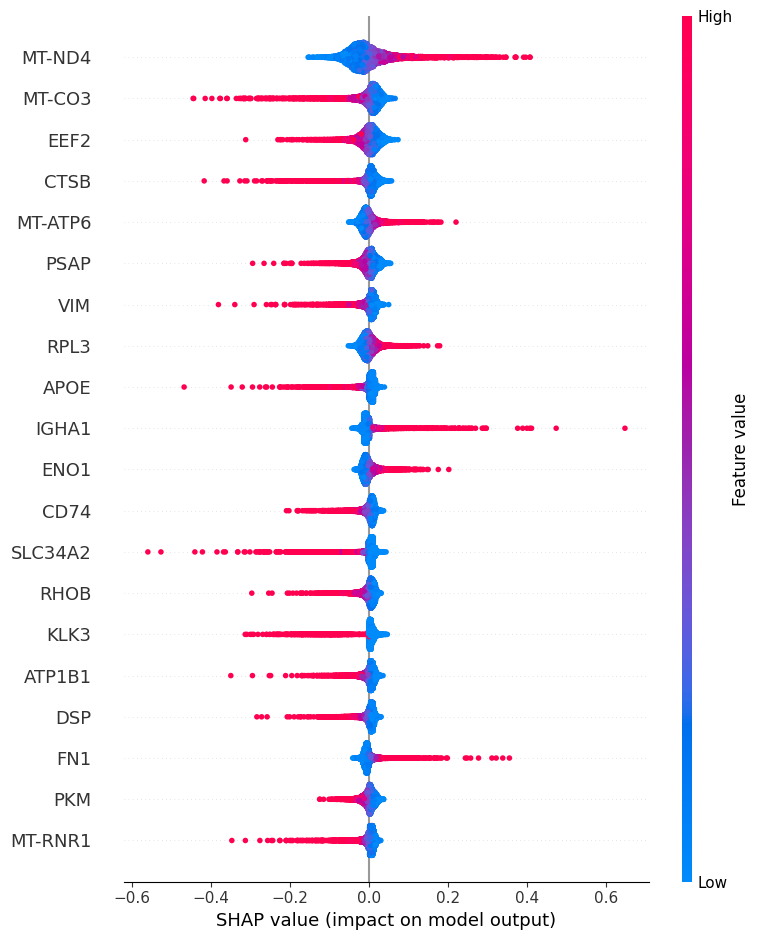

SHAP summary plot generated successfully.


In [24]:
import torch
import shap
from tqdm import tqdm
import numpy as np

# Supongamos que la época 10 es la que te interesa (indexada como 9 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 10
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Convertir los datos de miRNAs a un tensor, pero solo las primeras 100 muestras
X = df.iloc[:, :-2].values  # Usando las primeras 100 filas y todas las columnas excepto las dos últimas
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)

# Asegúrate de que el modelo esté en modo de evaluación
model.eval()

# Crear un modelo combinado que incluya tanto el FeatureExtractor como el LabelPredictor
class CombinedModel(torch.nn.Module):
    def __init__(self, feature_extractor, label_predictor):
        super(CombinedModel, self).__init__()
        self.feature_extractor = feature_extractor
        self.label_predictor = label_predictor

    def forward(self, x):
        features = self.feature_extractor(x)
        output = self.label_predictor(features)
        return output

combined_model = CombinedModel(model.feature_extractor, model.label_predictor)

# Crear un objeto SHAP explainer utilizando GradientExplainer con el modelo combinado
explainer = shap.GradientExplainer(combined_model, X_tensor)

# Calcular los valores SHAP para la salida del LabelPredictor directamente sobre X_tensor
shap_values = []
try:
    for i in tqdm(range(X_tensor.shape[0]), desc="Calculando valores SHAP"):
        shap_value = explainer.shap_values(X_tensor[i:i+1])
        shap_values.append(shap_value)
        print(f"SHAP values for instance {i}: {shap_value}")

    # Convertir la lista de valores SHAP a un numpy array
    shap_values_np = np.vstack(shap_values).squeeze()  # Eliminar la tercera dimensión
    print("Final SHAP values numpy array (shape):", shap_values_np.shape)

    # Usar los nombres de características originales
    feature_names_original = df.iloc[:, :-2].columns

    # Visualización de los valores SHAP para las características originales
    print("Generating SHAP summary plot...")
    shap.summary_plot(shap_values_np, X, feature_names=feature_names_original)
    print("SHAP summary plot generated successfully.")

except Exception as e:
    print(f"An error occurred: {e}")
    print(f"SHAP values calculated so far: {shap_values}")


In [31]:
shap_df=pd.DataFrame(shap_values_np,columns=df.iloc[:, :-2].columns,index=df.index)

# Ordenamos las columnas por la suma de los valores absolutos de SHAP
top_100_features = shap_df.abs().sum().nlargest(500)

# Filtramos el DataFrame original con estas columnas
top_100_shap_df = shap_df[top_100_features.index]
top_100_shap_df

,MT-ND4,MT-CO3,EEF2,CTSB,MT-ATP6,PSAP,VIM,RPL3,APOE,IGHA1,...,TAGLN,IGHG3,TMEM123,SF3B2,ELF3,LAMB3,ELN,ST13,PXDN,CCN1
9fe7d0f4-866d-490f-b2cb-d9be7da889de,-0.013157,0.008100,0.012824,0.009456,-0.004237,0.015222,0.008221,-0.003669,-0.012050,-0.007124,...,0.000965,0.000467,0.001315,0.002204,-0.001345,0.001580,0.001055,-0.001086,-0.001450,-0.001480
dd74434f-300f-4798-8342-aad31b192e12,-0.018533,0.005826,-0.005466,0.004173,-0.004003,0.007584,0.010727,0.016707,0.004857,-0.003463,...,-0.005494,0.000243,0.000798,0.000139,-0.000156,-0.000307,-0.000332,-0.000111,-0.001042,-0.000980
07db9e9d-059d-4e6c-b483-81517a492b96,-0.048316,0.033081,0.023604,0.011936,-0.015976,0.010196,0.012247,-0.023146,0.012098,0.004805,...,0.001561,-0.000068,-0.002484,0.000641,0.002934,0.000431,-0.001206,-0.001303,-0.000584,-0.001752
47ee860a-fd18-48f2-bfe7-4e19391950bd,0.011137,-0.016733,0.004379,0.001598,0.004656,0.003830,0.004831,-0.000976,-0.025081,-0.005827,...,0.000551,0.000592,-0.000022,0.000603,-0.000673,0.000310,0.000562,0.000031,-0.000645,-0.000418
e322b0e5-458a-4cbf-a64f-9b348e413939,-0.016223,0.015535,0.018257,0.022918,-0.013441,0.013159,0.022158,-0.019282,0.013121,-0.008734,...,0.001101,0.003149,-0.003264,-0.002806,0.001649,-0.005739,0.004069,-0.001186,-0.002723,-0.001792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,0.011502,0.012663,-0.011629,0.003546,-0.000983,-0.012650,-0.026024,-0.003267,0.005228,0.003099,...,-0.000805,-0.000441,-0.003050,0.001627,-0.001261,0.000855,-0.000249,0.000994,0.001044,0.000528
673a85f3-ba5e-448a-acee-dfec77b5238e,-0.037162,0.037489,0.025838,0.016514,-0.025946,0.037686,-0.006611,0.009906,0.014507,-0.019142,...,0.004769,0.002620,0.003598,-0.012704,-0.003263,0.003334,-0.007766,-0.002995,0.013599,-0.002864
3d93b2ae-7730-4914-af23-ff3554752922,0.033504,-0.006826,0.004426,0.010110,0.009437,0.002704,0.010552,-0.006077,-0.030121,-0.004957,...,0.001371,0.000410,0.001487,-0.000169,-0.001858,0.001461,0.000943,0.001480,-0.001357,-0.002345
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,-0.003003,0.024803,0.022224,0.029395,-0.014016,0.022764,-0.000601,-0.016684,0.012822,-0.009775,...,0.002115,0.002329,0.000867,0.003761,-0.002834,0.002909,0.002218,-0.003350,-0.002893,-0.002581


In [32]:
for i in top_100_shap_df.columns:
    print (i)

MT-ND4
MT-CO3
EEF2
CTSB
MT-ATP6
PSAP
VIM
RPL3
APOE
IGHA1
ENO1
CD74
SLC34A2
RHOB
KLK3
ATP1B1
DSP
FN1
PKM
MT-RNR1
RPL13
MT-RNR2
COL3A1
CD24
S100A6
FLNA
HLA-C
NDRG1
MT-ND6
PIGR
IGFBP5
RPL13A
TPT1
HLA-A
MT-ND1
MYH9
COL1A1
FTL
RACK1
TM4SF1
RGS5
GPX3
EGR1
CRYAB
TAGLN2
FGB
FASN
HSP90AA1
IGHG1
RPL10
MT-CO1
LGALS4
CLDN4
AQP1
MT-ND2
ALDH1A1
MYL6
ACTG1
CSDE1
PEBP1
IGKV4-1
MT-CYB
BGN
HDLBP
CTSC
S100A9
CLU
TG
SLC25A6
RPS27A
MAL2
KRT19
MAGED1
C1S
IGFBP4
SEPTIN2
MAGED2
GSTP1
APLP2
DCN
SERPINH1
CKB
HSPA8
HNRNPA2B1
RPS14
MT-ND5
TPM1
S100A2
AGR2
PABPC1
ACTA2
IFI6
LAMB2
ASAH1
B2M
PTTG1IP
SFPQ
RPS12
ACTB
GRN
PPIA
SDC1
CD44
TUBB4B
LGALS1
NTRK2
EZR
COL1A2
TNC
AGRN
CAP1
LUM
C1QB
TACSTD2
IGF2
P4HB
BCAM
SERPINA1
CLSTN2
DSC3
RPS3
JAG1
IQGAP1
KRT6A
TPP1
ODC1
DBH
ISLR
SLC44A1
IGKC
NNMT
HIPK2
APOC1
RPL5
PDK4
RPL4
TLN1
VEGFA
CRABP2
ALDOA
EEF1A1
SERINC2
CD99
MUC16
TGFBI
HMGA1
TLE5
PLIN2
RPL28
KRT6B
ITGA3
RPS3A
CP
DLK1
ANXA1
JUN
COL6A1
TIMP1
CAPN2
KRT18
FSCN1
ANXA2
UBB
ELAPOR1
GLUL
MUC1
RPS8
NPNT
AZIN1
LPCAT1
THY1
KL

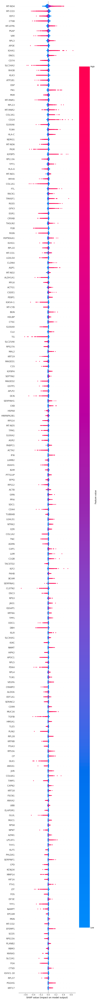

In [25]:
shap.summary_plot(shap_values_np, X, feature_names=feature_names_original, max_display=200)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


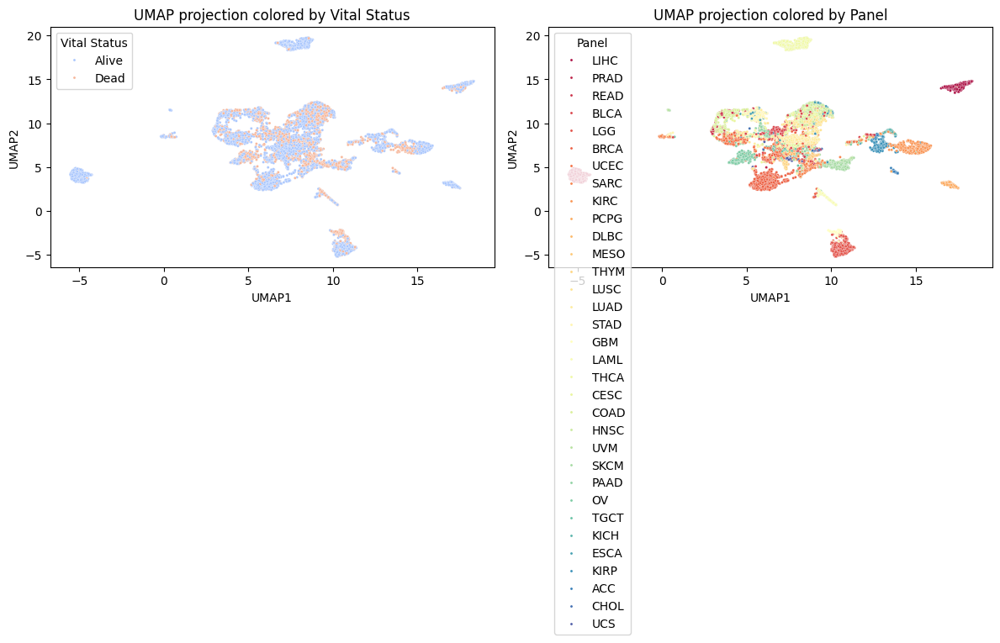

In [27]:
import seaborn as sns
import pandas as pd
import umap
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Crear un DataFrame con los valores SHAP para todos los datos
shap_df = pd.DataFrame(shap_values_np, columns=df.iloc[:, :-2].columns, index=df.index)

# Reducir la dimensionalidad con PCA antes de aplicar UMAP
pca = PCA(n_components=50, random_state=42)  # Mantén 50 componentes, ajusta según lo necesites
pca_shap = pca.fit_transform(shap_df)

# Realizar UMAP en los valores reducidos por PCA
reducer = umap.UMAP(n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(pca_shap)

# Crear un DataFrame con el embedding UMAP y añadir las columnas de estado vital y panel
umap_df = pd.DataFrame(umap_embedding, columns=['UMAP1', 'UMAP2'])
umap_df['vital'] = df['vital'].values  # Añadir columna de estado vital
umap_df['panel'] = df['panel'].values  # Añadir columna de panel

# Graficar UMAP coloreado por estado vital
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='UMAP1', y='UMAP2', hue='vital', palette='coolwarm', data=umap_df, s=5)
plt.title('UMAP projection colored by Vital Status')
plt.legend(title='Vital Status')

# Graficar UMAP coloreado por panel
plt.subplot(1, 2, 2)
sns.scatterplot(x='UMAP1', y='UMAP2', hue='panel', palette='Spectral', data=umap_df, s=5)
plt.title('UMAP projection colored by Panel')
plt.legend(title='Panel')

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt


# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
from sklearn.model_selection import train_test_split


# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Definir el número de pliegues
n_splits = 10  # Número de pliegues para la validación cruzada
skf = StratifiedKFold(n_splits=n_splits)

# Listas para almacenar resultados de AUC
auc_scores = []
fpr_list = []
tpr_list = []

# Validación cruzada estratificada
for fold, (train_index, test_index) in enumerate(skf.split(X, Y)):
    print(f"Fold {fold + 1}/{n_splits}")

    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]

    # Convertir a tensores
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
    Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
    Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1).to(device)

    # Evaluar el modelo en el conjunto de prueba
    model.eval()
    with torch.no_grad():
        label_preds, _, _ = model(X_test_tensor)
        label_preds = label_preds.cpu().numpy()
        Y_test = Y_test_tensor.cpu().numpy()

    # Calcular el AUC
    auc_score = roc_auc_score(Y_test, label_preds)
    auc_scores.append(auc_score)

    # Calcular la curva ROC
    fpr, tpr, _ = roc_curve(Y_test, label_preds)
    fpr_list.append(fpr)
    tpr_list.append(tpr)

    print(f"AUC for fold {fold + 1}: {auc_score:.4f}")

# Promediar y graficar las curvas ROC
plt.figure(figsize=(10, 8))
for i in range(n_splits):
    plt.plot(fpr_list[i], tpr_list[i], label=f'Fold {i+1} (AUC = {auc_scores[i]:.4f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Label Predictor across Folds')
plt.legend(loc="lower right")
plt.show()


In [ ]:
X_tensor.shape

**Analysis of the Model Outputs:**

The result you obtained confirms that the wrapper (`ModelWrapper`) is functioning correctly to return only the first output of the model, which corresponds to the vital status prediction. Below is the analysis of the results:

1. **Outputs of the model without the wrapper:**
   - **First output:** `tensor([[4.6149e-02], ... , [6.9630e-02]], device='cuda:0')` with dimension `[10286, 1]` corresponds to the vital status prediction (`LabelPredictor`).
   - **Second output:** `tensor([[-0.2760,  0.1515, ...]], device='cuda:0')` with dimension `[10286, 33]` corresponds to the domain prediction (`DomainClassifier`).
   - **Third output:** `tensor([[ 2.3175e-01, ...]], device='cuda:0')` with dimension `[10286, 5000]` corresponds to some intermediate representation or features from the feature extractor (`FeatureExtractor`).

2. **Output of the model with the wrapper:**
   - **Output:** `tensor([[4.6149e-02], ... , [6.9630e-02]], device='cuda:0')` with dimension `[10286, 1]` corresponds to the first output of the model, which is the vital status prediction, as expected.

**Conclusion:**

The wrapper `ModelWrapper` is functioning as intended, returning only the first output of the full model, which is the vital status prediction. This is confirmed by comparing the dimensions:

- **Dimensions of all outputs:**
  - **First output:** `[10286, 1]`
  - **Second output:** `[10286, 33]`
  - **Third output:** `[10286, 5000]`

- **Dimension of the wrapped output:**
  - `[10286, 1]`

The dimension `[10286, 1]` of the wrapped output matches the dimension of the vital status prediction, confirming that the wrapper is correctly returning the first output.

This behavior ensures that when you calculate SHAP values using the wrapper, you are calculating SHAP values with respect to the vital status prediction (and not the other outputs of the model). This is exactly what you need to analyze how the input features influence the vital status prediction in your DANN model.




In [ ]:
asdasdasdasdasdasd

In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
print(X_tensor.shape)

# Supongamos que la época 10 es la que te interesa (indexada como 9 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Obtener la salida del modelo
output = model(X_tensor)

# Si el modelo devuelve una tupla, selecciona la primera salida
if isinstance(output, tuple):
    output = output[0]

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(model, X_tensor)
shap_values = explainer.shap_values(X_tensor)
print(shap_values.shape)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Paso 1: Crear un objeto DeepExplainer para el modelo
explainer = shap.DeepExplainer(model.label_predictor, X_tensor)

# Paso 2: Calcular los valores SHAP utilizando el tensor de entrada X_tensor
shap_values = explainer.shap_values(X_tensor)

# Paso 3: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Verifica las dimensiones de shap_values para asegurarte de que coincide con lo esperado
print("Dimensión de shap_values:", shap_values_np.shape)

# Paso 4: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Verificar las salidas del modelo sin el wrapper
with torch.no_grad():
    all_outputs = model(X_tensor)
    print("Salidas del modelo (sin wrapper):", all_outputs)
    print("Dimensiones de todas las salidas:", [output.shape for output in all_outputs])

# Crear una clase wrapper para el modelo
# Esta clase `ModelWrapper` envuelve el modelo completo, pero en la función `forward`
# devuelve solo la primera salida del modelo (que corresponde a la predicción del estado vital).
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida (la predicción de la etiqueta de vitalidad)

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Verificar la salida del modelo con el wrapper
with torch.no_grad():
    wrapped_output = wrapped_model(X_tensor)
    print("Salida del modelo (con wrapper):", wrapped_output)
    print("Dimensión de la salida envuelta:", wrapped_output.shape)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.DeepExplainer(wrapped_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Verifica las dimensiones de shap_values para asegurarte de que coincide con lo esperado
print("Dimensión de shap_values:", shap_values_np.shape)

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)



In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)

In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para el modelo
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(wrapped_model, X_tensor,batch_size = 150)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
sdasdasdasdasdasdasdasd

In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para el modelo
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(wrapped_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch

# Asumiendo que el modelo DANN ya ha sido definido y entrenado

# Instanciar y cargar el modelo como se hace en el código original
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
model = DANN(input_dim, num_domains).to(device)

# Cargar el modelo guardado al final de una época en particular
epoch_of_interest = 9  # Ejemplo, puedes ajustar la época de interés
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
model.load_state_dict(model_state_dict)

# Asegurarse de que el modelo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para obtener solo la salida del LabelPredictor
class LabelPredictorWrapper(torch.nn.Module):
    def __init__(self, model):
        super(LabelPredictorWrapper, self).__init__()
        self.label_predictor = model.label_predictor

    def forward(self, x):
        return self.label_predictor(x)

# Instanciar el wrapper
label_predictor_model = LabelPredictorWrapper(model)

# Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(label_predictor_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Visualización de SHAP
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:

# Paso 2: Usar GradientExplainer para calcular los valores SHAP
explainer = shap.GradientExplainer(label_predictor_model,X)
shap_values = explainer.shap_values(X)

# Paso 3: Convertir los tensores de entrada y los valores SHAP a numpy para visualización
features_np = X.cpu().numpy()
shap_values_np = np.array(shap_values).squeeze()

# Paso 4: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, features_np, feature_names=df.iloc[:, :-2].columns)

In [ ]:
features_np.shape

In [ ]:
len(df.iloc[:, :-2].columns)

In [ ]:
shap.summary_plot(shap_values_np, features_np, feature_names=df.iloc[:, :-2].columns,max_display=50 )


In [ ]:
shap_values_np.shape

In [ ]:

pd.DataFrame(shap_values_np, columns=df.iloc[:, :-2].columns,index=df.index)